# Modeling Notebook 1

## Exploring Linear Regression and Gradient Boosted Tree Regression

In this notebook, we will explore Linear Regression and Gradient Boosted Tree Regression with hyper-tuning of the parameters to get the best results 

In [ ]:
# Importing relevant libraries
from bs4 import BeautifulSoup as soup
import requests
import re
import boto3
import sys
import os
import pandas as pd
import csv
import s3fs
from math import pi

from pyspark.sql import SparkSession
from pyspark.sql.functions import broadcast, StructType
from pyspark.sql.types import *
from pyspark.sql.functions import col, split, slice, count, when, expr, isnan, isnull, min, max, avg, sin, log10, cos 
from pyspark.sql.functions import date_format, to_timestamp, concat, unix_timestamp, substring, lit
from pyspark.sql.functions import col, month, quarter, dayofweek,dayofmonth, year, dayofyear
from pyspark.sql import functions as f
from pyspark.sql.types import StringType,BooleanType,DateType,IntegerType
from pyspark.sql.functions import monotonically_increasing_id 
from pyspark.sql.window import Window


#model
from pyspark.ml.regression import RandomForestRegressor, LinearRegression
from pyspark.ml.linalg import Vector
from pyspark.ml.feature import VectorAssembler, StandardScaler, StringIndexer, OneHotEncoder
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.stat import Correlation
from pyspark_dist_explore import hist

import configparser
import findspark
import lxml
from datetime import timedelta
from pandas.tseries.offsets import BDay
import itertools
import warnings
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [3]:
### Starting Pyspark Session


spark = SparkSession.builder\
                    .config('spark.master','local[*]')\
                    .config('spark.add.name','S3app')\
                    .config('spark.jars.packages','org.apache.hadoop:hadoop-aws:3.3.4,org.apache.hadoop:hadoop-common:3.3.4')\
                    .config("spark.driver.memory", "16g") \
                    .getOrCreate()


In [4]:
### Configuring Pyspark to read data from S3 Bucket. 

findspark.init()
config = configparser.ConfigParser()
# AWS_ACCESS_KEY_ID = os.getenv("AWS_ACCESS_KEY_ID")
# AWS_SECRET_ACCESS_KEY = os.getenv("AWS_SECRET_ACCESS_KEY")

aws_profile = 'default'
config.read(os.path.expanduser("~/.aws/credentials"))
access_id = config.get(aws_profile, "aws_access_key_id") 
access_key = config.get(aws_profile, "aws_secret_access_key")
# spark.conf.set("spark.sql.autoBroadcastJoinThreshold", -1)
# spark.conf.set("spark.network.io.preferDirectBufs", "false")

# spark.conf.set("spark.sql.adaptive.enabled", "true")
# spark.conf.set("spark.sql.adaptive.skewJoin.enabled", "true")

sc=spark.sparkContext
hadoop_conf=sc._jsc.hadoopConfiguration()
hadoop_conf.set("fs.s3a.committer.name","magic")
hadoop_conf.set("fs.s3a.impl", "org.apache.hadoop.fs.s3a.S3AFileSystem")
hadoop_conf.set("fs.s3a.awsAccessKeyId", access_id)
hadoop_conf.set("fs.s3a.awsSecretAccessKey", access_key)
# hadoop_conf.set('spark.sql.files.maxPartitionBytes','134217728')
# hadoop_conf.set("spark.sql.execution.arrow.pyspark.enabled", "true")
# hadoop_conf.set("spark.sql.autoBroadcastJoinThreshold", '104857600')
# hadoop_conf.set("spark.sql.autoBroadcastJoinThreshold", '-1')

(array([9.8030588e+07, 1.2303200e+06, 3.2634200e+05, 1.2826200e+05,
        5.7558000e+04, 2.2965000e+04, 1.1030000e+04, 6.3730000e+03,
        2.9670000e+03, 5.0300000e+02, 1.1200000e+02, 3.9000000e+01,
        2.2000000e+01, 8.0000000e+00, 9.0000000e+00, 1.0000000e+00,
        2.0000000e+00, 1.0000000e+00, 0.0000000e+00, 2.0000000e+00]),
 array([1.00000e+00, 9.22500e+01, 1.83500e+02, 2.74750e+02, 3.66000e+02,
        4.57250e+02, 5.48500e+02, 6.39750e+02, 7.31000e+02, 8.22250e+02,
        9.13500e+02, 1.00475e+03, 1.09600e+03, 1.18725e+03, 1.27850e+03,
        1.36975e+03, 1.46100e+03, 1.55225e+03, 1.64350e+03, 1.73475e+03,
        1.82600e+03]),
 <BarContainer object of 20 artists>)

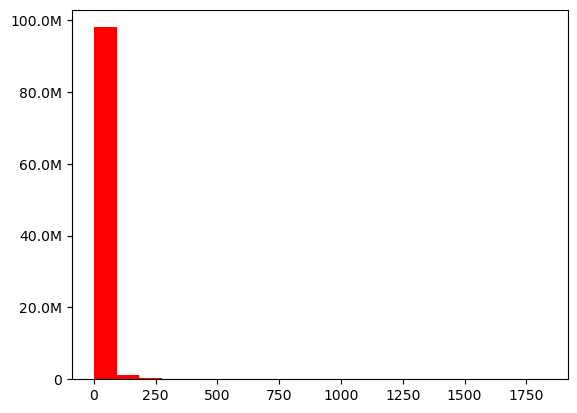

In [347]:
fig, ax = plt.subplots()
hist(ax, df_final.select('ridership_number'), bins = 20, color=['red'])

In [348]:
df_final.select('ridership_number').describe().show()

+-------+------------------+
|summary|  ridership_number|
+-------+------------------+
|  count|          99817104|
|   mean|10.731816152470222|
| stddev|28.873962888591016|
|    min|                 1|
|    max|              1826|
+-------+------------------+



In [350]:
df_final.select('ridership_number','wind_speed_origin','air_temp_origin','precipitation_origin',
                'wind_speed_dest','air_temp_dest','precipitation_dest','number_of_searches').describe().show()

+-------+------------------+------------------+-----------------+--------------------+------------------+------------------+------------------+------------------+
|summary|  ridership_number| wind_speed_origin|  air_temp_origin|precipitation_origin|   wind_speed_dest|     air_temp_dest|precipitation_dest|number_of_searches|
+-------+------------------+------------------+-----------------+--------------------+------------------+------------------+------------------+------------------+
|  count|          99817104|          99817104|         99817104|            99817104|          99817104|          99817104|          99817104|          99817104|
|   mean|10.731816152470222|36.364092089868684|149.4806742239286|  1.1333579663862017|36.226826025728016|150.36107002262858| 1.132767636696813| 60.86426577753648|
| stddev|28.873962888591016| 28.86780723419703| 55.1256617595042|  1.3413977012033378|28.427820516724335| 56.22279615625791| 1.341279537430729|18.335355652258066|
|    min|             

In [353]:
print(df_final.columns)

['ridership_number', 'ts', 'date', 'hour', 'year', 'month', 'quarter', 'day_of_week', 'origin', 'destination', 'origin-des', 'event_origin', 'event_dest', 'wind_speed_origin', 'air_temp_origin', 'precipitation_origin', 'wth_type_origin', 'wind_speed_dest', 'air_temp_dest', 'precipitation_dest', 'wth_type_dest', 'number_of_searches', 'holiday_period', 'day_of_month', 'origin_des_index', 'origin_des_vec', 'wth_type_origin_vec', 'wth_type_dest_vec']


In [364]:
columnss = ['hour', 'year', 'month', 'quarter', 'day_of_week','day_of_month',
            'origin_des_index', 'event_origin',
            'event_dest','wind_speed_origin', 'air_temp_origin', 'precipitation_origin',
            'wth_type_origin', 'wind_speed_dest', 'air_temp_dest', 'precipitation_dest',
            'wth_type_dest', 'number_of_searches', 'holiday_period', 'day_of_month']

In [365]:
for c in columnss:
    print(f"correlation of {c} and ridership_number: {df_final.corr(c, 'ridership_number')}")

correlation of hour and ridership_number: -0.006564973716446944


correlation of year and ridership_number: -0.07812449821507379


correlation of month and ridership_number: -0.005564813900531635


correlation of quarter and ridership_number: -0.005167525542610511


correlation of day_of_week and ridership_number: 0.002915758739842878


correlation of day_of_month and ridership_number: -0.001655977493100371


correlation of origin_des_index and ridership_number: -0.276326755618359


correlation of event_origin and ridership_number: 0.029568413302092193


correlation of event_dest and ridership_number: 0.014126411905857752


correlation of wind_speed_origin and ridership_number: -0.009239710765556432


correlation of air_temp_origin and ridership_number: -0.025013028640494792


correlation of precipitation_origin and ridership_number: 0.004939082393073748


correlation of wth_type_origin and ridership_number: 0.018000061656577828


correlation of wind_speed_dest and ridership_number: -0.004548754601293123


correlation of air_temp_dest and ridership_number: -0.006270903415135414


correlation of precipitation_dest and ridership_number: 0.0035229885230682115


correlation of wth_type_dest and ridership_number: 0.018296638674604886


correlation of number_of_searches and ridership_number: 0.09527767703658141


correlation of holiday_period and ridership_number: -0.02346380905531262


correlation of day_of_month and ridership_number: -0.00165597749310037


# Linear Regression

### 1- Train Data with NO unit circle conversion of cyclical time features


In this version of train data, linear regression model yielded the following success metrics results on Test Data. 

| RMSE | R2 | MAE |
| --- | --- | --- |
|  0.33215000345466406  | 0.41794733451398236| 0.26600828924795494

### Training the model (Code)

In [221]:
# Reading Data
# taking log10 of the outcome variable 
processed_train_df = spark.read.parquet("s3a://w210-bucket/data_wrangling/processed_train_df_1.parquet")
processed_test_df = spark.read.parquet("s3a://w210-bucket/data_wrangling/processed_test_df_1.parquet")
processed_train_df = processed_train_df.withColumn("log_ridership_number",log10(col('ridership_number'))).drop("ridership_number")
processed_test_df  = processed_test_df.withColumn("log_ridership_number",log10(col('ridership_number'))).drop("ridership_number")

In [222]:
lr = LinearRegression(featuresCol = 'features', labelCol='log_ridership_number')
lr_model = lr.fit(processed_train_df)

23/03/25 22:42:50 WARN Instrumentation: [52563e3e] regParam is zero, which might cause numerical instability and overfitting.


23/03/25 22:44:32 WARN Instrumentation: [52563e3e] Cholesky solver failed due to singular covariance matrix. Retrying with Quasi-Newton solver.


In [224]:
lr_predictions = lr_model.transform(processed_test_df)
test_result = lr_model.evaluate(processed_test_df)
print(f"Intercept: {lr_model.intercept}")
print(f"R2 : {test_result.r2}")
print(f"RMSE : {test_result.rootMeanSquaredError}")
print(f"MAE : {test_result.meanAbsoluteError}")

Intercept: 27.829082606078686
R2 : 0.41794733451398236
RMSE : 0.33215000345466406
MAE : 0.26600828924795494


### 2- Train Data with unit circle conversion of cyclical time features

In this version of train data, linear regression model yielded the following success metrics results on Test Data. 

| RMSE | R2 | MAE |
| --- | --- | --- |
|  0.3385656026755129  | 0.39524505861270076| 0.2726970984686636

### Training the model (Code)

In [8]:
processed_train_df = spark.read.parquet("s3a://w210-bucket/data_wrangling/processed_train_take_6.parquet")
processed_test_df = spark.read.parquet("s3a://w210-bucket/data_wrangling/processed_test_take_6.parquet")
processed_train_df = processed_train_df.withColumn("log_ridership_number",log10(col('ridership_number'))).drop("ridership_number")
processed_test_df  = processed_test_df.withColumn("log_ridership_number",log10(col('ridership_number'))).drop("ridership_number")

23/03/26 06:27:15 WARN MetricsConfig: Cannot locate configuration: tried hadoop-metrics2-s3a-file-system.properties,hadoop-metrics2.properties


In [60]:
lr = LinearRegression(featuresCol = 'features', labelCol='log_ridership_number')
lr_model = lr.fit(processed_train_df)

23/03/25 23:57:34 WARN Instrumentation: [c6a5f56a] regParam is zero, which might cause numerical instability and overfitting.


23/03/25 23:58:23 WARN InstanceBuilder$NativeBLAS: Failed to load implementation from:dev.ludovic.netlib.blas.JNIBLAS
23/03/25 23:58:23 WARN InstanceBuilder$NativeBLAS: Failed to load implementation from:dev.ludovic.netlib.blas.ForeignLinkerBLAS
23/03/25 23:58:23 WARN InstanceBuilder$JavaBLAS: Failed to load implementation from:dev.ludovic.netlib.blas.VectorBLAS


23/03/25 23:59:29 WARN InstanceBuilder$NativeLAPACK: Failed to load implementation from:dev.ludovic.netlib.lapack.JNILAPACK


In [61]:
train_results = lr_model.evaluate(processed_train_df)
print(f"Intercept: {lr_model.intercept}")
print(f"R2 : {train_results.r2}")
print(f"RMSE : {train_results.rootMeanSquaredError}")
print(f"MAE : {train_results.meanAbsoluteError}")

Intercept: 0.13100486715099782
R2 : 0.5265280496791391
RMSE : 0.37556769515037075
MAE : 0.29982598442737624


In [62]:
lr_predictions = lr_model.transform(processed_test_df)
test_result = lr_model.evaluate(processed_test_df)
print(f"Intercept: {lr_model.intercept}")
print(f"R2 : {test_result.r2}")
print(f"RMSE : {test_result.rootMeanSquaredError}")
print(f"MAE : {test_result.meanAbsoluteError}")

Intercept: 0.13100486715099782
R2 : 0.39524505861270076
RMSE : 0.3385656026755129
MAE : 0.2726970984686636


# Gradient Boosted Tree Regressors

## Train Data with unit circle conversion of cyclical time features and with out 


For the two versions of train data, with only 10 iteration our model yielded the following success metrics results on Test Data. 

**with Unit circle convertion of the cyclical time features**

| RMSE | R2 | MAE |
| --- | --- | --- |
|  0.27966298405490797  | 0.5873672117663772 | 0.2276378709295658


**with NO Unit circle convertion of the cyclical time features**

| RMSE | R2 | MAE |
| --- | --- | --- |
|  0.2841743693860548  | 0.5739470569228873 | 0.23362167479481516


`We can see that GBTRegressor performs slightly better with unit circle conversion of cyclical time features`

### Training the model (Code)

In [ ]:
# Training this model with only 10 iteration to get an of the performance
# the training data used here has unit circle converstion

from pyspark.ml.regression import GBTRegressor
gbt = GBTRegressor(featuresCol = 'features', labelCol = 'log_ridership_number', maxIter=10)
gbt_model = gbt.fit(processed_train_df)
gbt_predictions = gbt_model.transform(processed_test_df)

23/03/26 06:31:18 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 06:31:18 WARN BlockManager: Persisting block rdd_23_6 to disk instead.
23/03/26 06:31:19 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 06:31:19 WARN BlockManager: Persisting block rdd_23_2 to disk instead.
23/03/26 06:31:19 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 06:31:19 WARN BlockManager: Persisting block rdd_23_3 to disk instead.
23/03/26 06:31:24 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 06:31:24 WARN BlockManager: Persisting block rdd_23_1 to disk instead.
23/03/26 06:31:31 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 2046.8 MiB so far)
23/03/26 06:31:31 WARN BlockManager: Persisting block rdd_23_4 to disk instead.
23/03/26 06:31:31 WARN MemoryStore: Not enough s

23/03/26 06:32:23 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 6.9 GiB so far)
23/03/26 06:32:23 WARN BlockManager: Persisting block rdd_23_0 to disk instead.


23/03/26 06:33:33 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 252.9 MiB so far)
23/03/26 06:33:33 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 2046.8 MiB so far)
23/03/26 06:33:33 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 13.9 MiB so far)
23/03/26 06:33:33 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 168.6 MiB so far)
23/03/26 06:33:33 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 2046.8 MiB so far)
23/03/26 06:33:33 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 9.1 MiB so far)
23/03/26 06:33:33 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 2046.8 MiB so far)
23/03/26 06:33:33 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 5.3 MiB so far)
23/03/26 06:33:33 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 9.1 MiB so far)
23/03/26 06:33

23/03/26 06:34:47 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 06:34:47 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 1364.5 MiB so far)
23/03/26 06:34:47 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 589.3 MiB so far)
23/03/26 06:34:47 WARN BlockManager: Persisting block rdd_23_9 to disk instead.
23/03/26 06:34:47 WARN BlockManager: Persisting block rdd_23_15 to disk instead.
23/03/26 06:34:47 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 06:34:47 WARN BlockManager: Persisting block rdd_23_10 to disk instead.
23/03/26 06:34:47 WARN BlockManager: Persisting block rdd_23_8 to disk instead.
23/03/26 06:34:47 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 06:34:47 WARN BlockManager: Persisting block rdd_23_11 to disk instead.
23/03/26 06:34:48 WARN MemoryStore: Not 

23/03/26 06:35:54 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 3.0 GiB so far)
23/03/26 06:35:55 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 252.9 MiB so far)
23/03/26 06:35:55 WARN BlockManager: Persisting block rdd_23_16 to disk instead.
23/03/26 06:35:55 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 252.9 MiB so far)
23/03/26 06:35:56 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 112.4 MiB so far)
23/03/26 06:35:56 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 380.1 MiB so far)


23/03/26 06:36:43 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 1364.5 MiB so far)
23/03/26 06:36:43 WARN BlockManager: Persisting block rdd_23_18 to disk instead.
23/03/26 06:36:43 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 2046.8 MiB so far)
23/03/26 06:36:43 WARN BlockManager: Persisting block rdd_23_17 to disk instead.
23/03/26 06:36:52 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 909.7 MiB so far)
23/03/26 06:36:52 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 909.7 MiB so far)
23/03/26 06:36:53 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 31.4 MiB so far)
23/03/26 06:36:53 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 20.9 MiB so far)
23/03/26 06:36:53 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 06:36:53 WARN MemoryStore: Not enough space to cache

23/03/26 06:38:02 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 6.9 GiB so far)


23/03/26 06:38:04 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 1364.5 MiB so far)
23/03/26 06:38:08 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 909.7 MiB so far)
23/03/26 06:38:08 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 1364.5 MiB so far)
23/03/26 06:38:08 WARN BlockManager: Persisting block rdd_23_19 to disk instead.
23/03/26 06:38:08 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 252.9 MiB so far)
23/03/26 06:38:10 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 380.1 MiB so far)
23/03/26 06:38:10 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 380.1 MiB so far)


23/03/26 06:39:09 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)
23/03/26 06:39:11 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 2046.8 MiB so far)


23/03/26 06:39:27 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 06:39:27 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 06:39:27 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 06:39:28 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 06:39:28 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 06:39:28 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 06:39:28 WARN MemoryStore: Not enough space to cache rdd_25_3 in memory! (computed 4.0 MiB so far)
23/03/26 06:39:28 WARN MemoryStore: Not enough space to cache rdd_25_2 in memory! (computed 32.0 MiB so far)
23/03/26 06:39:28 WARN MemoryStore: Not enough space to cache rdd_25_1 in memory! (computed 16.0 MiB so far)
23/03/26 06

23/03/26 06:40:09 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 06:40:09 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 06:40:09 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 589.3 MiB so far)
23/03/26 06:40:09 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 06:40:09 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 06:40:09 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 06:40:09 WARN MemoryStore: Not enough space to cache rdd_25_14 in memory! (computed 16.0 MiB so far)
23/03/26 06:40:09 WARN MemoryStore: Not enough space to cache rdd_25_9 in memory! (computed 16.0 MiB so far)
23/03/26 06:40:09 WARN MemoryStore: Not enough space to cache rdd_25_10 in memory! (computed 8.0 MiB so far)
23/0

23/03/26 06:40:33 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 1364.5 MiB so far)
23/03/26 06:40:33 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 589.3 MiB so far)
23/03/26 06:40:33 WARN MemoryStore: Not enough space to cache rdd_25_16 in memory! (computed 4.0 MiB so far)
23/03/26 06:40:33 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 589.3 MiB so far)
23/03/26 06:40:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_25_18 in memory.
23/03/26 06:40:33 WARN MemoryStore: Not enough space to cache rdd_25_18 in memory! (computed 384.0 B so far)


23/03/26 06:40:55 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 06:41:05 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 06:41:05 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 06:41:05 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 06:41:06 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 06:41:06 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 06:41:06 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 06:41:06 WARN MemoryStore: Not enough space to cache rdd_25_7 in memory! (computed 8.0 MiB so far)
23/03/26 06:41:07 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 06:41:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2

23/03/26 06:41:47 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 06:41:47 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 589.3 MiB so far)
23/03/26 06:41:47 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 06:41:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_25_13 in memory.
23/03/26 06:41:47 WARN MemoryStore: Not enough space to cache rdd_25_13 in memory! (computed 384.0 B so far)
23/03/26 06:41:48 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 06:41:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_25_9 in memory.
23/03/26 06:41:48 WARN MemoryStore: Not enough space to cache rdd_25_9 in memory! (computed 384.0 B so far)
23/03/26 06:41:48 WARN MemoryStore: Not enough space to cache rdd_25_14 

23/03/26 06:42:16 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 06:42:16 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 06:42:17 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)


23/03/26 06:42:36 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 06:42:46 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 06:42:46 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 06:42:46 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 06:42:47 WARN MemoryStore: Not enough space to cache rdd_25_1 in memory! (computed 16.0 MiB so far)
23/03/26 06:42:47 WARN MemoryStore: Not enough space to cache rdd_25_5 in memory! (computed 16.0 MiB so far)
23/03/26 06:42:47 WARN MemoryStore: Not enough space to cache rdd_25_2 in memory! (computed 16.0 MiB so far)
23/03/26 06:42:47 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 06:42:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_25_6 in memory.
23/03/26 06:42:47 WARN MemoryStore: Not enough space to cache rdd_25_6 in memory! (computed 384.0 B

23/03/26 06:43:28 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 06:43:30 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 2046.8 MiB so far)
23/03/26 06:43:30 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 06:43:30 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 06:43:30 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 06:43:30 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 06:43:30 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 06:43:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_25_14 in memory.
23/03/26 06:43:30 WARN MemoryStore: Not enough space to cache rdd_25_14 in memory! (com

23/03/26 06:43:58 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 06:43:59 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 06:44:00 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)


23/03/26 06:44:19 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 06:44:29 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 06:44:29 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 06:44:29 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 06:44:30 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 06:44:30 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 06:44:30 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/26 06:44:30 WARN MemoryStore: Not enough space to cache rdd_25_3 in memory! (computed 2.0 MiB so far)
23/03/26 06:44:30 WARN MemoryStore: Not enough space to cache rdd_25_1 in memory! (computed 2.0 MiB so far)
23/03/26 06:44:30 WARN MemoryStore: Not enough space to cache rdd_25_5 in memory! (computed 32.0 MiB so far)
23/03/26 06:

23/03/26 06:45:11 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 06:45:12 WARN MemoryStore: Not enough space to cache rdd_25_10 in memory! (computed 8.0 MiB so far)
23/03/26 06:45:12 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 380.1 MiB so far)
23/03/26 06:45:12 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 06:45:12 WARN MemoryStore: Not enough space to cache rdd_25_15 in memory! (computed 4.0 MiB so far)
23/03/26 06:45:12 WARN MemoryStore: Not enough space to cache rdd_25_12 in memory! (computed 2.0 MiB so far)
23/03/26 06:45:12 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 06:45:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_25_14 in memory.
23/03/26 06:45:12 WARN MemoryStore: Not enough space to cache rdd_25_14 in memory! (computed 3

23/03/26 06:45:41 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 06:45:42 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 06:45:43 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)


23/03/26 06:46:02 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 06:46:14 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 06:46:14 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 06:46:14 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 06:46:14 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 47.4 MiB so far)
23/03/26 06:46:14 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 73.6 MiB so far)
23/03/26 06:46:14 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 47.4 MiB so far)
23/03/26 06:46:14 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 5.3 MiB so far)
23/03/26 06:46:14 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 2.3 MiB so far)
23/03/26 06:46:14 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_43_0 in me

23/03/26 06:47:53 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 06:47:53 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 909.7 MiB so far)
23/03/26 06:47:53 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 06:47:53 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 06:47:53 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 47.4 MiB so far)
23/03/26 06:47:53 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 5.3 MiB so far)
23/03/26 06:47:53 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1025.7 KiB so far)
23/03/26 06:47:53 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 2.3 MiB so far)
23/03/26 06:47:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_4

23/03/26 06:47:54 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 06:47:54 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1025.7 KiB so far)
23/03/26 06:47:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_10 in memory.
23/03/26 06:47:54 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 384.0 B so far)
23/03/26 06:47:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_43_10 in memory.
23/03/26 06:47:54 WARN MemoryStore: Not enough space to cache rdd_43_10 in memory! (computed 384.0 B so far)
23/03/26 06:47:54 WARN BlockManager: Persisting block rdd_43_10 to disk instead.


23/03/26 06:47:55 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 3.0 GiB so far)
23/03/26 06:47:55 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 112.4 MiB so far)
23/03/26 06:47:55 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 47.4 MiB so far)
23/03/26 06:47:55 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 3.5 MiB so far)
23/03/26 06:47:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_43_8 in memory.
23/03/26 06:47:55 WARN MemoryStore: Not enough space to cache rdd_43_8 in memory! (computed 384.0 B so far)
23/03/26 06:47:55 WARN BlockManager: Persisting block rdd_43_8 to disk instead.
23/03/26 06:47:55 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 20.9 MiB so far)
23/03/26 06:47:55 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 3.5 MiB so far)
23/03/26 06:47:55 WARN M

23/03/26 06:48:50 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 1364.5 MiB so far)
23/03/26 06:48:52 WARN MemoryStore: Not enough space to cache rdd_46_10 in memory! (computed 4.0 MiB so far)
23/03/26 06:48:52 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 380.1 MiB so far)
23/03/26 06:48:52 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 1557.2 KiB so far)
23/03/26 06:48:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_43_16 in memory.
23/03/26 06:48:52 WARN MemoryStore: Not enough space to cache rdd_43_16 in memory! (computed 384.0 B so far)
23/03/26 06:48:52 WARN BlockManager: Persisting block rdd_43_16 to disk instead.


23/03/26 06:48:52 WARN MemoryStore: Not enough space to cache rdd_46_11 in memory! (computed 172.8 MiB so far)
23/03/26 06:48:52 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 47.4 MiB so far)
23/03/26 06:48:52 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 47.4 MiB so far)
23/03/26 06:48:52 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 1557.2 KiB so far)
23/03/26 06:48:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_18 in memory.
23/03/26 06:48:52 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 1025.7 KiB so far)
23/03/26 06:48:52 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 384.0 B so far)
23/03/26 06:48:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_43_18 in memory.
23/03/26 06:48:52 WARN MemoryStore: Failed to reserve initial memory

23/03/26 06:49:37 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)
23/03/26 06:49:42 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 2046.8 MiB so far)
23/03/26 06:49:42 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 73.6 MiB so far)
23/03/26 06:49:48 WARN MemoryStore: Not enough space to cache rdd_43_19 in memory! (computed 104.0 MiB so far)
23/03/26 06:49:48 WARN BlockManager: Persisting block rdd_43_19 to disk instead.


23/03/26 06:50:16 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 06:50:16 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 06:50:16 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 06:50:16 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/26 06:50:16 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 06:50:16 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 06:50:16 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 06:50:16 WARN MemoryStore: Not enough space to cache rdd_46_3 in memory! (computed 6.2 MiB so far)
23/03/26 06:50:16 WARN MemoryStore: Not enough space to cache rdd_46_0 in memory! (computed 6.2 MiB so far)
23/03/26 0

23/03/26 06:51:03 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 06:51:03 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 2046.8 MiB so far)
23/03/26 06:51:03 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 06:51:03 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 06:51:03 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 380.1 MiB so far)
23/03/26 06:51:03 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 1364.5 MiB so far)
23/03/26 06:51:03 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 06:51:03 WARN MemoryStore: Not enough space to cache rdd_46_11 in memory! (computed 10.8 MiB so far)
23/03/26 06:51:04 WARN MemoryStore: Not enough space to cache rdd_46_9 in memory! (computed 16.2 MiB so far)
23

23/03/26 06:51:35 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 06:51:35 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 06:51:38 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 06:51:39 WARN MemoryStore: Not enough space to cache rdd_46_16 in memory! (computed 172.8 MiB so far)
23/03/26 06:51:40 WARN MemoryStore: Not enough space to cache rdd_46_18 in memory! (computed 99.2 MiB so far)


23/03/26 06:51:55 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 06:52:08 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 06:52:08 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 06:52:08 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 06:52:08 WARN MemoryStore: Not enough space to cache rdd_46_0 in memory! (computed 16.2 MiB so far)
23/03/26 06:52:08 WARN MemoryStore: Not enough space to cache rdd_46_7 in memory! (computed 16.2 MiB so far)
23/03/26 06:52:08 WARN MemoryStore: Not enough space to cache rdd_46_1 in memory! (computed 16.2 MiB so far)
23/03/26 06:52:08 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 06:52:08 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 06:52:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_46_3

23/03/26 06:52:54 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 909.7 MiB so far)
23/03/26 06:52:54 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 252.9 MiB so far)
23/03/26 06:52:54 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)


23/03/26 06:52:54 WARN MemoryStore: Not enough space to cache rdd_46_14 in memory! (computed 6.2 MiB so far)
23/03/26 06:52:54 WARN MemoryStore: Not enough space to cache rdd_46_13 in memory! (computed 1537.3 KiB so far)
23/03/26 06:52:54 WARN MemoryStore: Not enough space to cache rdd_46_11 in memory! (computed 6.2 MiB so far)
23/03/26 06:52:54 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 112.4 MiB so far)
23/03/26 06:52:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_46_15 in memory.
23/03/26 06:52:54 WARN MemoryStore: Not enough space to cache rdd_46_15 in memory! (computed 384.0 B so far)
23/03/26 06:52:54 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 06:52:54 WARN MemoryStore: Not enough space to cache rdd_46_12 in memory! (computed 1537.3 KiB so far)
23/03/26 06:52:54 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 

23/03/26 06:53:24 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 06:53:25 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 06:53:26 WARN MemoryStore: Not enough space to cache rdd_46_17 in memory! (computed 16.2 MiB so far)
23/03/26 06:53:26 WARN MemoryStore: Not enough space to cache rdd_46_16 in memory! (computed 64.8 MiB so far)
23/03/26 06:53:26 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 06:53:26 WARN MemoryStore: Not enough space to cache rdd_46_18 in memory! (computed 2.7 MiB so far)


23/03/26 06:53:46 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 06:53:59 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 06:53:59 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 06:53:59 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 06:53:59 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 06:53:59 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 06:53:59 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 06:53:59 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 06:53:59 WARN MemoryStore: Not enough space to cache rdd_46_7 in memory! (computed 6.2 MiB so far)
23/03/26 06:53:59 WARN MemoryStore: Not enough space to cache rdd_46_6 in memory! (computed 6.2 MiB so far)
23/03/26 0

23/03/26 06:54:44 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 06:54:44 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 06:54:45 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 06:54:45 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 06:54:45 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 06:54:45 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 06:54:45 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 06:54:45 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 380.1 MiB so far)
23/03/26 06:54:45 WARN MemoryStore: Not enough space to cache rdd_46_8 in memory! (computed 6.2 MiB so far)
23

23/03/26 06:55:15 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 06:55:17 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 06:55:18 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 06:55:21 WARN MemoryStore: Not enough space to cache rdd_46_18 in memory! (computed 99.2 MiB so far)


23/03/26 06:55:38 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 06:55:52 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 06:55:52 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 06:55:52 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 06:55:52 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 06:55:52 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/26 06:55:52 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 06:55:52 WARN MemoryStore: Not enough space to cache rdd_46_6 in memory! (computed 10.8 MiB so far)
23/03/26 06:55:52 WARN MemoryStore: Not enough space to cache rdd_46_4 in memory! (computed 6.2 MiB so far)
23/03/26 06:55:52 WARN MemoryStore: Not enough space to cache rdd_46_1 in memory! (computed 4.0 MiB so far)
23/03/26 06:

23/03/26 06:56:38 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 06:56:38 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 9.1 MiB so far)
23/03/26 06:56:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_46_15 in memory.
23/03/26 06:56:38 WARN MemoryStore: Not enough space to cache rdd_46_15 in memory! (computed 384.0 B so far)
23/03/26 06:56:38 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 06:56:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_46_13 in memory.
23/03/26 06:56:38 WARN MemoryStore: Not enough space to cache rdd_46_13 in memory! (computed 384.0 B so far)
23/03/26 06:56:39 WARN MemoryStore: Not enough space to cache rdd_46_10 in memory! (computed 6.2 MiB so far)
23/03/26 06:56:39 WARN MemoryStore: Not enough space to cache rdd_23_14 i

23/03/26 06:57:09 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 06:57:10 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 06:57:11 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 06:57:13 WARN MemoryStore: Not enough space to cache rdd_46_16 in memory! (computed 172.8 MiB so far)
23/03/26 06:57:14 WARN MemoryStore: Not enough space to cache rdd_46_18 in memory! (computed 99.2 MiB so far)


23/03/26 06:57:33 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 06:57:45 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 06:57:45 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 06:57:46 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 06:57:46 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 112.4 MiB so far)
23/03/26 06:57:46 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 47.4 MiB so far)
23/03/26 06:57:46 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 2.3 MiB so far)
23/03/26 06:57:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_43_1 in memory.
23/03/26 06:57:46 WARN MemoryStore: Not enough space to cache rdd_43_1 in memory! (computed 384.0 B so far)
23/03/26 06:57:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for compu

23/03/26 06:58:46 WARN MemoryStore: Not enough space to cache rdd_68_7 in memory! (computed 99.2 MiB so far)
23/03/26 06:58:46 WARN MemoryStore: Not enough space to cache rdd_68_1 in memory! (computed 43.2 MiB so far)
23/03/26 06:58:46 WARN MemoryStore: Not enough space to cache rdd_68_0 in memory! (computed 4.0 MiB so far)
23/03/26 06:58:47 WARN MemoryStore: Not enough space to cache rdd_68_4 in memory! (computed 43.2 MiB so far)


23/03/26 06:59:31 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 06:59:31 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)


23/03/26 06:59:32 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 3.0 GiB so far)
23/03/26 06:59:32 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 252.9 MiB so far)
23/03/26 06:59:32 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 3.0 GiB so far)
23/03/26 06:59:32 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 31.4 MiB so far)
23/03/26 06:59:32 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 47.4 MiB so far)
23/03/26 06:59:32 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 5.3 MiB so far)
23/03/26 06:59:32 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 3.5 MiB so far)
23/03/26 06:59:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_14 in memory.
23/03/26 06:59:32 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 384.0 B so

23/03/26 06:59:33 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 380.1 MiB so far)
23/03/26 06:59:33 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 3.5 MiB so far)
23/03/26 06:59:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_13 in memory.
23/03/26 06:59:33 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 384.0 B so far)
23/03/26 06:59:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_43_13 in memory.
23/03/26 06:59:33 WARN MemoryStore: Not enough space to cache rdd_43_13 in memory! (computed 384.0 B so far)
23/03/26 06:59:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_65_13 in memory.
23/03/26 06:59:33 WARN MemoryStore: Not enough space to cache rdd_65_13 in memory! (computed 384.0 B so far)
23/03/26 06:59:33 WARN BlockManager: Persisting blo

23/03/26 07:00:29 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 380.1 MiB so far)
23/03/26 07:00:29 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 31.4 MiB so far)
23/03/26 07:00:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_16 in memory.
23/03/26 07:00:29 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 384.0 B so far)
23/03/26 07:00:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_43_16 in memory.
23/03/26 07:00:29 WARN MemoryStore: Not enough space to cache rdd_43_16 in memory! (computed 384.0 B so far)
23/03/26 07:00:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_65_16 in memory.
23/03/26 07:00:29 WARN MemoryStore: Not enough space to cache rdd_65_16 in memory! (computed 384.0 B so far)
23/03/26 07:00:29 WARN BlockManager: Persisting bl

23/03/26 07:00:30 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 73.6 MiB so far)
23/03/26 07:00:30 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 13.9 MiB so far)
23/03/26 07:00:30 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 1025.7 KiB so far)
23/03/26 07:00:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_43_17 in memory.
23/03/26 07:00:30 WARN MemoryStore: Not enough space to cache rdd_43_17 in memory! (computed 384.0 B so far)
23/03/26 07:00:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_65_17 in memory.
23/03/26 07:00:30 WARN MemoryStore: Not enough space to cache rdd_65_17 in memory! (computed 384.0 B so far)
23/03/26 07:00:30 WARN BlockManager: Persisting block rdd_65_17 to disk instead.


23/03/26 07:00:35 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 909.7 MiB so far)
23/03/26 07:00:36 WARN MemoryStore: Not enough space to cache rdd_68_8 in memory! (computed 99.2 MiB so far)
23/03/26 07:00:36 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 252.9 MiB so far)
23/03/26 07:00:36 WARN MemoryStore: Not enough space to cache rdd_68_15 in memory! (computed 24.3 MiB so far)
23/03/26 07:00:36 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 13.9 MiB so far)
23/03/26 07:00:36 WARN MemoryStore: Not enough space to cache rdd_43_18 in memory! (computed 8.2 MiB so far)
23/03/26 07:00:36 WARN MemoryStore: Not enough space to cache rdd_68_9 in memory! (computed 99.2 MiB so far)
23/03/26 07:00:36 WARN MemoryStore: Not enough space to cache rdd_68_10 in memory! (computed 99.2 MiB so far)
23/03/26 07:00:38 WARN MemoryStore: Not enough space to cache rdd_65_18 in memory! (computed 19.5 MiB so far)
23/03/26 07

23/03/26 07:01:20 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)
23/03/26 07:01:25 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 2046.8 MiB so far)
23/03/26 07:01:26 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 73.6 MiB so far)
23/03/26 07:01:26 WARN MemoryStore: Not enough space to cache rdd_43_19 in memory! (computed 29.2 MiB so far)
23/03/26 07:01:33 WARN MemoryStore: Not enough space to cache rdd_65_19 in memory! (computed 104.0 MiB so far)
23/03/26 07:01:33 WARN BlockManager: Persisting block rdd_65_19 to disk instead.


23/03/26 07:02:02 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 07:02:02 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 07:02:02 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 07:02:02 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/26 07:02:02 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 07:02:02 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 07:02:02 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 07:02:02 WARN MemoryStore: Not enough space to cache rdd_68_4 in memory! (computed 6.2 MiB so far)
23/03/26 07:02:02 WARN MemoryStore: Not enough space to cache rdd_68_1 in memory! (computed 6.2 MiB so far)
23/03/26 0

23/03/26 07:02:47 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 07:02:49 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 2046.8 MiB so far)
23/03/26 07:02:49 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 07:02:49 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:02:49 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:02:49 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 380.1 MiB so far)
23/03/26 07:02:49 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 252.9 MiB so far)
23/03/26 07:02:49 WARN MemoryStore: Not enough space to cache rdd_68_11 in memory! (computed 6.2 MiB so far)
23/03/26 07:02:49 WARN MemoryStore: Not enough space to cache rdd_68_10 in memory! (computed 6.2 MiB so far)
23/

23/03/26 07:03:20 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:03:21 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:03:22 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:03:25 WARN MemoryStore: Not enough space to cache rdd_68_16 in memory! (computed 172.8 MiB so far)
23/03/26 07:03:25 WARN MemoryStore: Not enough space to cache rdd_68_18 in memory! (computed 99.2 MiB so far)


23/03/26 07:03:43 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:03:56 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 07:03:56 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:03:56 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 07:03:56 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 07:03:56 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 07:03:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_68_1 in memory.
23/03/26 07:03:56 WARN MemoryStore: Not enough space to cache rdd_68_1 in memory! (computed 384.0 B so far)
23/03/26 07:03:56 WARN MemoryStore: Not enough space to cache rdd_68_0 in memory! (computed 1024.6 KiB so far)
23/03/26 07:03:56 WARN MemoryStore: Not enough space to cache rdd_68_4 in memory! (computed 16.2

23/03/26 07:04:42 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:04:42 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 07:04:42 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:04:42 WARN MemoryStore: Not enough space to cache rdd_68_14 in memory! (computed 4.0 MiB so far)
23/03/26 07:04:42 WARN MemoryStore: Not enough space to cache rdd_68_10 in memory! (computed 4.0 MiB so far)
23/03/26 07:04:42 WARN MemoryStore: Not enough space to cache rdd_68_8 in memory! (computed 1024.6 KiB so far)
23/03/26 07:04:42 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:04:42 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_68_13 in memory.
23/03/26 07:04:42 WARN MemoryStore: Not enough space to cache rdd_68_13 in memory! (computed

23/03/26 07:04:44 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)


23/03/26 07:05:13 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:05:13 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:05:14 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:05:16 WARN MemoryStore: Not enough space to cache rdd_68_16 in memory! (computed 99.2 MiB so far)
23/03/26 07:05:16 WARN MemoryStore: Not enough space to cache rdd_68_18 in memory! (computed 64.8 MiB so far)
23/03/26 07:05:16 WARN MemoryStore: Not enough space to cache rdd_68_17 in memory! (computed 99.2 MiB so far)


23/03/26 07:05:35 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:05:48 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 07:05:48 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:05:48 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 07:05:48 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 07:05:48 WARN MemoryStore: Not enough space to cache rdd_68_0 in memory! (computed 1024.6 KiB so far)
23/03/26 07:05:48 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 07:05:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_68_7 in memory.
23/03/26 07:05:48 WARN MemoryStore: Not enough space to cache rdd_68_7 in memory! (computed 384.0 B so far)
23/03/26 07:05:48 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364

23/03/26 07:06:34 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 909.7 MiB so far)
23/03/26 07:06:34 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 07:06:34 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)


23/03/26 07:06:35 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 252.9 MiB so far)
23/03/26 07:06:35 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:06:35 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 168.6 MiB so far)
23/03/26 07:06:35 WARN MemoryStore: Not enough space to cache rdd_68_12 in memory! (computed 16.2 MiB so far)
23/03/26 07:06:35 WARN MemoryStore: Not enough space to cache rdd_68_11 in memory! (computed 24.3 MiB so far)
23/03/26 07:06:35 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 07:06:35 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_68_9 in memory.
23/03/26 07:06:35 WARN MemoryStore: Not enough space to cache rdd_68_9 in memory! (computed 384.0 B so far)
23/03/26 07:06:35 WARN MemoryStore: Not enough space to cache rdd_68_13 in memory! (computed 1

23/03/26 07:07:06 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:07:08 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:07:09 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:07:10 WARN MemoryStore: Not enough space to cache rdd_68_17 in memory! (computed 64.8 MiB so far)
23/03/26 07:07:10 WARN MemoryStore: Not enough space to cache rdd_68_16 in memory! (computed 172.8 MiB so far)
23/03/26 07:07:10 WARN MemoryStore: Not enough space to cache rdd_68_18 in memory! (computed 43.2 MiB so far)


23/03/26 07:07:28 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:07:41 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 07:07:41 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 07:07:41 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 07:07:41 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 07:07:42 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 07:07:42 WARN MemoryStore: Not enough space to cache rdd_68_2 in memory! (computed 10.8 MiB so far)
23/03/26 07:07:42 WARN MemoryStore: Not enough space to cache rdd_68_0 in memory! (computed 10.8 MiB so far)
23/03/26 07:07:42 WARN MemoryStore: Not enough space to cache rdd_68_6 in memory! (computed 10.8 MiB so far)
23/03/26 07:07:42 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 0

23/03/26 07:08:28 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:08:28 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)


23/03/26 07:08:29 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:08:29 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:08:29 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:08:29 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 07:08:29 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 07:08:30 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 252.9 MiB so far)
23/03/26 07:08:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_68_15 in memory.
23/03/26 07:08:30 WARN MemoryStore: Not enough space to cache rdd_68_15 in memory! (computed 384.0 B so far)
23/03/26 07:08:30 WARN MemoryStore: Not enough space to cache rdd_68_8 in memory! (comput

23/03/26 07:08:59 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:09:01 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:09:01 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:09:04 WARN MemoryStore: Not enough space to cache rdd_68_16 in memory! (computed 172.8 MiB so far)
23/03/26 07:09:04 WARN MemoryStore: Not enough space to cache rdd_68_18 in memory! (computed 99.2 MiB so far)


23/03/26 07:09:23 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:09:36 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 07:09:36 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 07:09:36 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 07:09:36 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 47.4 MiB so far)
23/03/26 07:09:36 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 13.9 MiB so far)
23/03/26 07:09:36 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 2.3 MiB so far)
23/03/26 07:09:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_65_1 in memory.
23/03/26 07:09:36 WARN MemoryStore: Not enough space to cache rdd_65_1 in memory! (computed 384.0 B so far)
23/03/26 07:09:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for comput

23/03/26 07:10:37 WARN MemoryStore: Not enough space to cache rdd_90_7 in memory! (computed 43.2 MiB so far)
23/03/26 07:10:38 WARN MemoryStore: Not enough space to cache rdd_90_4 in memory! (computed 43.2 MiB so far)
23/03/26 07:10:38 WARN MemoryStore: Not enough space to cache rdd_90_5 in memory! (computed 43.2 MiB so far)
23/03/26 07:10:38 WARN MemoryStore: Not enough space to cache rdd_90_1 in memory! (computed 64.8 MiB so far)
23/03/26 07:10:39 WARN MemoryStore: Not enough space to cache rdd_90_0 in memory! (computed 1537.3 KiB so far)
23/03/26 07:10:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_90_6 in memory.
23/03/26 07:10:39 WARN MemoryStore: Not enough space to cache rdd_90_6 in memory! (computed 384.0 B so far)


23/03/26 07:11:23 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 589.3 MiB so far)
23/03/26 07:11:23 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:11:24 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:11:24 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 589.3 MiB so far)
23/03/26 07:11:24 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 13.9 MiB so far)
23/03/26 07:11:24 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 1557.2 KiB so far)
23/03/26 07:11:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_65_8 in memory.
23/03/26 07:11:24 WARN MemoryStore: Not enough space to cache rdd_65_8 in memory! (computed 384.0 B so far)
23/03/26 07:11:24 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1

23/03/26 07:11:26 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 168.6 MiB so far)
23/03/26 07:11:26 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 3.0 GiB so far)
23/03/26 07:11:26 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 9.1 MiB so far)
23/03/26 07:11:26 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 3.5 MiB so far)
23/03/26 07:11:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_9 in memory.
23/03/26 07:11:26 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 384.0 B so far)
23/03/26 07:11:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_65_9 in memory.
23/03/26 07:11:26 WARN MemoryStore: Not enough space to cache rdd_65_9 in memory! (computed 384.0 B so far)
23/03/26 07:11:26 WARN MemoryStore: Failed to reserve initial memory threshold of 

23/03/26 07:11:28 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 168.6 MiB so far)
23/03/26 07:11:28 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 13.9 MiB so far)
23/03/26 07:11:28 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 2.3 MiB so far)
23/03/26 07:11:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_65_15 in memory.
23/03/26 07:11:28 WARN MemoryStore: Not enough space to cache rdd_65_15 in memory! (computed 384.0 B so far)
23/03/26 07:11:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_87_15 in memory.
23/03/26 07:11:28 WARN MemoryStore: Not enough space to cache rdd_87_15 in memory! (computed 384.0 B so far)
23/03/26 07:11:28 WARN BlockManager: Persisting block rdd_87_15 to disk instead.
23/03/26 07:11:41 WARN MemoryStore: Not enough space to cache rdd_87_13 in memory! (computed 1663.4 KiB

23/03/26 07:12:24 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 909.7 MiB so far)
23/03/26 07:12:24 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 20.9 MiB so far)
23/03/26 07:12:24 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 9.1 MiB so far)
23/03/26 07:12:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_65_16 in memory.
23/03/26 07:12:24 WARN MemoryStore: Not enough space to cache rdd_65_16 in memory! (computed 384.0 B so far)
23/03/26 07:12:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_87_16 in memory.
23/03/26 07:12:24 WARN MemoryStore: Not enough space to cache rdd_87_16 in memory! (computed 384.0 B so far)
23/03/26 07:12:24 WARN BlockManager: Persisting block rdd_87_16 to disk instead.
23/03/26 07:12:25 WARN MemoryStore: Not enough space to cache rdd_90_15 in memory! (computed 172.8 MiB 

23/03/26 07:12:26 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 73.6 MiB so far)
23/03/26 07:12:26 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 31.4 MiB so far)
23/03/26 07:12:26 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.5 MiB so far)
23/03/26 07:12:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_65_17 in memory.
23/03/26 07:12:26 WARN MemoryStore: Not enough space to cache rdd_65_17 in memory! (computed 384.0 B so far)
23/03/26 07:12:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_87_17 in memory.
23/03/26 07:12:26 WARN MemoryStore: Not enough space to cache rdd_87_17 in memory! (computed 384.0 B so far)
23/03/26 07:12:26 WARN BlockManager: Persisting block rdd_87_17 to disk instead.
23/03/26 07:12:26 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.5 MiB so 

23/03/26 07:12:29 WARN MemoryStore: Not enough space to cache rdd_90_11 in memory! (computed 99.2 MiB so far)
23/03/26 07:12:30 WARN MemoryStore: Not enough space to cache rdd_90_8 in memory! (computed 43.2 MiB so far)
23/03/26 07:12:30 WARN MemoryStore: Not enough space to cache rdd_90_10 in memory! (computed 99.2 MiB so far)


23/03/26 07:13:14 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:13:21 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 2046.8 MiB so far)
23/03/26 07:13:21 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 73.6 MiB so far)
23/03/26 07:13:22 WARN MemoryStore: Not enough space to cache rdd_65_19 in memory! (computed 29.2 MiB so far)
23/03/26 07:13:28 WARN MemoryStore: Not enough space to cache rdd_87_19 in memory! (computed 104.0 MiB so far)
23/03/26 07:13:28 WARN BlockManager: Persisting block rdd_87_19 to disk instead.


23/03/26 07:13:57 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 07:13:57 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 07:13:57 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 07:13:57 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 07:13:57 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 07:13:57 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 07:13:57 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:13:57 WARN MemoryStore: Not enough space to cache rdd_90_7 in memory! (computed 6.2 MiB so far)
23/03/26 07:13:57 WARN MemoryStore: Not enough space to cache rdd_90_1 in memory! (computed 6.2 MiB so far)
23/03/26 0

23/03/26 07:14:45 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 07:14:45 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:14:45 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 07:14:45 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:14:45 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:14:45 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:14:45 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 2.3 MiB so far)
23/03/26 07:14:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_90_15 in memory.
23/03/26 07:14:45 WARN MemoryStore: Not enough space to cache rdd_90_15 in memory! (compu

23/03/26 07:14:46 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)


23/03/26 07:15:15 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:15:17 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:15:17 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:15:19 WARN MemoryStore: Not enough space to cache rdd_90_17 in memory! (computed 64.8 MiB so far)
23/03/26 07:15:19 WARN MemoryStore: Not enough space to cache rdd_90_16 in memory! (computed 172.8 MiB so far)
23/03/26 07:15:20 WARN MemoryStore: Not enough space to cache rdd_90_18 in memory! (computed 99.2 MiB so far)


23/03/26 07:15:37 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:15:49 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 07:15:49 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 07:15:49 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 07:15:49 WARN MemoryStore: Not enough space to cache rdd_90_2 in memory! (computed 16.2 MiB so far)
23/03/26 07:15:50 WARN MemoryStore: Not enough space to cache rdd_90_7 in memory! (computed 16.2 MiB so far)
23/03/26 07:15:50 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 07:15:50 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/26 07:15:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_90_4 in memory.
23/03/26 07:15:50 WARN MemoryStore: Not enough space to cache rdd_90_4 in memory! (computed 384.0

23/03/26 07:16:35 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:16:36 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 07:16:36 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 07:16:36 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:16:36 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:16:36 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:16:36 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 252.9 MiB so far)
23/03/26 07:16:36 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 07:16:36 WARN MemoryStore: Not enough space to cache rdd_90_10 in memory! (computed 16.2 MiB so far)

23/03/26 07:17:06 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:17:06 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:17:06 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:17:09 WARN MemoryStore: Not enough space to cache rdd_90_18 in memory! (computed 99.2 MiB so far)
23/03/26 07:17:10 WARN MemoryStore: Not enough space to cache rdd_90_16 in memory! (computed 172.8 MiB so far)


23/03/26 07:17:28 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:17:40 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 07:17:40 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 07:17:40 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:17:41 WARN MemoryStore: Not enough space to cache rdd_90_6 in memory! (computed 16.2 MiB so far)
23/03/26 07:17:41 WARN MemoryStore: Not enough space to cache rdd_90_1 in memory! (computed 16.2 MiB so far)
23/03/26 07:17:41 WARN MemoryStore: Not enough space to cache rdd_90_4 in memory! (computed 16.2 MiB so far)
23/03/26 07:17:41 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 07:17:41 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 07:17:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_90_5

23/03/26 07:18:27 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 252.9 MiB so far)
23/03/26 07:18:27 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 909.7 MiB so far)
23/03/26 07:18:28 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 07:18:28 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 07:18:28 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 1364.5 MiB so far)
23/03/26 07:18:28 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:18:28 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 07:18:28 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:18:28 WARN MemoryStore: Not enough space to cache rdd_90_8 in memory! (computed 2.7 MiB so far)
2

23/03/26 07:18:57 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:18:59 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:18:59 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:19:01 WARN MemoryStore: Not enough space to cache rdd_90_16 in memory! (computed 172.8 MiB so far)
23/03/26 07:19:02 WARN MemoryStore: Not enough space to cache rdd_90_18 in memory! (computed 99.2 MiB so far)


23/03/26 07:19:21 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:19:33 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 07:19:33 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 07:19:33 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 07:19:34 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 07:19:34 WARN MemoryStore: Not enough space to cache rdd_90_5 in memory! (computed 1024.6 KiB so far)
23/03/26 07:19:34 WARN MemoryStore: Not enough space to cache rdd_90_6 in memory! (computed 16.2 MiB so far)
23/03/26 07:19:34 WARN MemoryStore: Not enough space to cache rdd_90_2 in memory! (computed 16.2 MiB so far)
23/03/26 07:19:34 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 07:19:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_90

23/03/26 07:20:20 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:20:20 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 07:20:20 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:20:20 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 07:20:20 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:20:20 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:20:20 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 589.3 MiB so far)
23/03/26 07:20:21 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 07:20:21 WARN MemoryStore: Not enough space to cache rdd_90_10 in memory! (computed 24.3 MiB so far)


23/03/26 07:20:50 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:20:52 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:20:54 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:20:55 WARN MemoryStore: Not enough space to cache rdd_90_17 in memory! (computed 99.2 MiB so far)
23/03/26 07:20:55 WARN MemoryStore: Not enough space to cache rdd_90_16 in memory! (computed 172.8 MiB so far)
23/03/26 07:20:55 WARN MemoryStore: Not enough space to cache rdd_90_18 in memory! (computed 64.8 MiB so far)


23/03/26 07:21:13 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:21:24 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:21:24 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 07:21:24 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 07:21:24 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 13.9 MiB so far)
23/03/26 07:21:24 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 3.5 MiB so far)
23/03/26 07:21:24 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 112.4 MiB so far)
23/03/26 07:21:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_4 in memory.
23/03/26 07:21:24 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 384.0 B so far)
23/03/26 07:21:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for compu

23/03/26 07:22:24 WARN MemoryStore: Not enough space to cache rdd_112_4 in memory! (computed 64.8 MiB so far)
23/03/26 07:22:24 WARN MemoryStore: Not enough space to cache rdd_112_7 in memory! (computed 99.2 MiB so far)
23/03/26 07:22:24 WARN MemoryStore: Not enough space to cache rdd_112_1 in memory! (computed 10.8 MiB so far)
23/03/26 07:22:24 WARN MemoryStore: Not enough space to cache rdd_112_6 in memory! (computed 4.0 MiB so far)
23/03/26 07:22:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_112_0 in memory.
23/03/26 07:22:24 WARN MemoryStore: Not enough space to cache rdd_112_0 in memory! (computed 384.0 B so far)


23/03/26 07:23:08 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)


23/03/26 07:23:09 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 909.7 MiB so far)
23/03/26 07:23:09 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)


23/03/26 07:23:09 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 3.0 GiB so far)
23/03/26 07:23:09 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 2046.8 MiB so far)
23/03/26 07:23:09 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 9.1 MiB so far)
23/03/26 07:23:09 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 5.3 MiB so far)
23/03/26 07:23:09 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 47.4 MiB so far)
23/03/26 07:23:09 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 47.4 MiB so far)
23/03/26 07:23:09 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_14 in memory.
23/03/26 07:23:09 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 384.0 B so far)
23/03/26 07:23:09 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 5.3 MiB

23/03/26 07:23:10 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 168.6 MiB so far)
23/03/26 07:23:10 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 31.4 MiB so far)
23/03/26 07:23:10 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 5.3 MiB so far)
23/03/26 07:23:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_15 in memory.
23/03/26 07:23:10 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 384.0 B so far)
23/03/26 07:23:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_87_15 in memory.
23/03/26 07:23:10 WARN MemoryStore: Not enough space to cache rdd_87_15 in memory! (computed 384.0 B so far)
23/03/26 07:23:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_109_15 in memory.
23/03/26 07:23:10 WARN MemoryStore: Not enough sp

23/03/26 07:24:07 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 589.3 MiB so far)
23/03/26 07:24:08 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 168.6 MiB so far)
23/03/26 07:24:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_16 in memory.
23/03/26 07:24:08 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 384.0 B so far)
23/03/26 07:24:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_87_16 in memory.
23/03/26 07:24:08 WARN MemoryStore: Not enough space to cache rdd_87_16 in memory! (computed 384.0 B so far)
23/03/26 07:24:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_109_16 in memory.
23/03/26 07:24:08 WARN MemoryStore: Not enough space to cache rdd_109_16 in memory! (computed 384.0 B so far)
23/03/26 07:24:08 WARN BlockManager: Persisting

23/03/26 07:24:09 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 168.6 MiB so far)
23/03/26 07:24:09 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 9.1 MiB so far)
23/03/26 07:24:09 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 2.3 MiB so far)
23/03/26 07:24:09 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_87_17 in memory.
23/03/26 07:24:09 WARN MemoryStore: Not enough space to cache rdd_87_17 in memory! (computed 384.0 B so far)
23/03/26 07:24:09 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_109_17 in memory.
23/03/26 07:24:09 WARN MemoryStore: Not enough space to cache rdd_109_17 in memory! (computed 384.0 B so far)
23/03/26 07:24:09 WARN BlockManager: Persisting block rdd_109_17 to disk instead.


23/03/26 07:24:11 WARN MemoryStore: Not enough space to cache rdd_112_11 in memory! (computed 43.2 MiB so far)
23/03/26 07:24:11 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 252.9 MiB so far)
23/03/26 07:24:11 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 20.9 MiB so far)
23/03/26 07:24:11 WARN MemoryStore: Not enough space to cache rdd_112_9 in memory! (computed 16.2 MiB so far)
23/03/26 07:24:11 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 5.3 MiB so far)
23/03/26 07:24:11 WARN MemoryStore: Not enough space to cache rdd_87_18 in memory! (computed 1035.4 KiB so far)
23/03/26 07:24:11 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_109_18 in memory.
23/03/26 07:24:11 WARN MemoryStore: Not enough space to cache rdd_109_18 in memory! (computed 384.0 B so far)
23/03/26 07:24:11 WARN BlockManager: Persisting block rdd_109_18 to disk instead.


23/03/26 07:24:58 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)
23/03/26 07:25:06 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 2046.8 MiB so far)
23/03/26 07:25:06 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 73.6 MiB so far)
23/03/26 07:25:06 WARN MemoryStore: Not enough space to cache rdd_87_19 in memory! (computed 29.2 MiB so far)
23/03/26 07:25:13 WARN MemoryStore: Not enough space to cache rdd_109_19 in memory! (computed 104.0 MiB so far)
23/03/26 07:25:13 WARN BlockManager: Persisting block rdd_109_19 to disk instead.


23/03/26 07:25:41 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 07:25:41 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 07:25:41 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 1364.5 MiB so far)
23/03/26 07:25:41 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 07:25:41 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 07:25:41 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:25:41 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 07:25:41 WARN MemoryStore: Not enough space to cache rdd_112_3 in memory! (computed 6.2 MiB so far)
23/03/26 07:25:41 WARN MemoryStore: Not enough space to cache rdd_112_7 in memory! (computed 6.2 MiB so far)
23/03/26

23/03/26 07:26:28 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 07:26:28 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:26:28 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:26:29 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:26:29 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 380.1 MiB so far)
23/03/26 07:26:29 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 07:26:29 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 07:26:29 WARN MemoryStore: Not enough space to cache rdd_112_8 in memory! (computed 16.2 MiB so far)
23/03/26 07:26:29 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)


23/03/26 07:27:00 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:27:02 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:27:02 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:27:04 WARN MemoryStore: Not enough space to cache rdd_112_18 in memory! (computed 64.8 MiB so far)


23/03/26 07:27:23 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:27:36 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 1364.5 MiB so far)
23/03/26 07:27:36 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 07:27:36 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 07:27:36 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 07:27:36 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 07:27:36 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 07:27:36 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/26 07:27:36 WARN MemoryStore: Not enough space to cache rdd_112_2 in memory! (computed 6.2 MiB so far)
23/03/26 07:27:36 WARN MemoryStore: Not enough space to cache rdd_112_5 in memory! (computed 10.8 MiB so far)
23/03/2

23/03/26 07:28:22 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:28:22 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:28:22 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 07:28:22 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:28:22 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 07:28:22 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 380.1 MiB so far)
23/03/26 07:28:22 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 07:28:23 WARN MemoryStore: Not enough space to cache rdd_112_13 in memory! (computed 16.2 MiB so far)
23/03/26 07:28:23 WARN MemoryStore: Not enough space to cache rdd_112_8 in memory! (computed 16.2 MiB so far)
2

23/03/26 07:28:48 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 909.7 MiB so far)
23/03/26 07:28:48 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 112.4 MiB so far)
23/03/26 07:28:49 WARN MemoryStore: Not enough space to cache rdd_112_18 in memory! (computed 16.2 MiB so far)
23/03/26 07:28:49 WARN MemoryStore: Not enough space to cache rdd_112_17 in memory! (computed 24.3 MiB so far)
23/03/26 07:28:49 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 1364.5 MiB so far)


23/03/26 07:29:16 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:29:29 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 07:29:29 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:29:29 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 07:29:29 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 07:29:29 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 07:29:29 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 07:29:29 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 1364.5 MiB so far)
23/03/26 07:29:29 WARN MemoryStore: Not enough space to cache rdd_112_3 in memory! (computed 6.2 MiB so far)
23/03/26 07:29:29 WARN MemoryStore: Not enough space to cache rdd_112_6 in memory! (computed 6.2 MiB so far)
23/03/26

23/03/26 07:30:14 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 07:30:15 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:30:15 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:30:15 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:30:15 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 07:30:15 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:30:15 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 380.1 MiB so far)
23/03/26 07:30:15 WARN MemoryStore: Not enough space to cache rdd_112_10 in memory! (computed 16.2 MiB so far)
23/03/26 07:30:15 WARN MemoryStore: Not enough space to cache rdd_112_14 in memory! (computed 16.2 MiB so far)

23/03/26 07:30:46 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:30:47 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:30:48 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:30:50 WARN MemoryStore: Not enough space to cache rdd_112_16 in memory! (computed 172.8 MiB so far)
23/03/26 07:30:51 WARN MemoryStore: Not enough space to cache rdd_112_18 in memory! (computed 99.2 MiB so far)


23/03/26 07:31:09 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:31:22 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 07:31:22 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:31:22 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 07:31:22 WARN MemoryStore: Not enough space to cache rdd_112_4 in memory! (computed 16.2 MiB so far)
23/03/26 07:31:22 WARN MemoryStore: Not enough space to cache rdd_112_3 in memory! (computed 16.2 MiB so far)
23/03/26 07:31:22 WARN MemoryStore: Not enough space to cache rdd_112_0 in memory! (computed 16.2 MiB so far)
23/03/26 07:31:23 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 07:31:23 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 07:31:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1

23/03/26 07:32:09 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 07:32:09 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:32:10 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:32:10 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 07:32:10 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:32:10 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:32:10 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 07:32:11 WARN MemoryStore: Not enough space to cache rdd_112_8 in memory! (computed 16.2 MiB so far)
23/03/26 07:32:11 WARN MemoryStore: Not enough space to cache rdd_112_11 in memory! (computed 10.8 MiB so far)

23/03/26 07:32:41 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:32:43 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:32:43 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:32:45 WARN MemoryStore: Not enough space to cache rdd_112_16 in memory! (computed 172.8 MiB so far)
23/03/26 07:32:46 WARN MemoryStore: Not enough space to cache rdd_112_18 in memory! (computed 99.2 MiB so far)


23/03/26 07:33:04 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:33:17 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 07:33:17 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 07:33:17 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 07:33:18 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 73.6 MiB so far)
23/03/26 07:33:18 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 31.4 MiB so far)
23/03/26 07:33:18 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1557.2 KiB so far)
23/03/26 07:33:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_109_0 in memory.
23/03/26 07:33:18 WARN MemoryStore: Not enough space to cache rdd_109_0 in memory! (computed 384.0 B so far)
23/03/26 07:33:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for c

23/03/26 07:34:18 WARN MemoryStore: Not enough space to cache rdd_134_4 in memory! (computed 43.2 MiB so far)
23/03/26 07:34:19 WARN MemoryStore: Not enough space to cache rdd_134_0 in memory! (computed 64.8 MiB so far)
23/03/26 07:34:19 WARN MemoryStore: Not enough space to cache rdd_134_1 in memory! (computed 10.8 MiB so far)
23/03/26 07:34:19 WARN MemoryStore: Not enough space to cache rdd_134_7 in memory! (computed 64.8 MiB so far)
23/03/26 07:34:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_134_6 in memory.
23/03/26 07:34:20 WARN MemoryStore: Not enough space to cache rdd_134_6 in memory! (computed 384.0 B so far)


23/03/26 07:35:03 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 07:35:03 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:35:03 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 73.6 MiB so far)
23/03/26 07:35:03 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 112.4 MiB so far)
23/03/26 07:35:03 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 13.9 MiB so far)
23/03/26 07:35:03 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 2.3 MiB so far)
23/03/26 07:35:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_109_11 in memory.
23/03/26 07:35:03 WARN MemoryStore: Not enough space to cache rdd_109_11 in memory! (computed 384.0 B so far)
23/03/26 07:35:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB f

23/03/26 07:35:03 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 2046.8 MiB so far)
23/03/26 07:35:03 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 380.1 MiB so far)
23/03/26 07:35:04 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 47.4 MiB so far)
23/03/26 07:35:04 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 73.6 MiB so far)
23/03/26 07:35:04 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 2.3 MiB so far)
23/03/26 07:35:04 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 3.5 MiB so far)
23/03/26 07:35:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_109_12 in memory.
23/03/26 07:35:04 WARN MemoryStore: Not enough space to cache rdd_109_12 in memory! (computed 384.0 B so far)
23/03/26 07:35:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB f

23/03/26 07:35:05 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 3.0 GiB so far)


23/03/26 07:35:06 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 112.4 MiB so far)
23/03/26 07:35:06 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 168.6 MiB so far)
23/03/26 07:35:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_14 in memory.
23/03/26 07:35:06 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 384.0 B so far)
23/03/26 07:35:06 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2.3 MiB so far)
23/03/26 07:35:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_109_8 in memory.
23/03/26 07:35:06 WARN MemoryStore: Not enough space to cache rdd_109_8 in memory! (computed 384.0 B so far)
23/03/26 07:35:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_14 in memory.
23/03/26 07:35:06 WARN MemoryStore: Not enough spac

23/03/26 07:36:03 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 168.6 MiB so far)
23/03/26 07:36:03 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 1557.2 KiB so far)
23/03/26 07:36:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_16 in memory.
23/03/26 07:36:03 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 384.0 B so far)
23/03/26 07:36:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_109_16 in memory.
23/03/26 07:36:03 WARN MemoryStore: Not enough space to cache rdd_109_16 in memory! (computed 384.0 B so far)
23/03/26 07:36:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_131_16 in memory.
23/03/26 07:36:03 WARN MemoryStore: Not enough space to cache rdd_131_16 in memory! (computed 384.0 B so far)
23/03/26 07:36:03 WARN BlockManager: Persist

23/03/26 07:36:08 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 380.1 MiB so far)
23/03/26 07:36:08 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 31.4 MiB so far)
23/03/26 07:36:08 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 9.1 MiB so far)
23/03/26 07:36:08 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 1364.5 MiB so far)
23/03/26 07:36:08 WARN MemoryStore: Not enough space to cache rdd_109_18 in memory! (computed 3.7 MiB so far)
23/03/26 07:36:08 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 1025.7 KiB so far)
23/03/26 07:36:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_131_18 in memory.
23/03/26 07:36:08 WARN MemoryStore: Not enough space to cache rdd_131_18 in memory! (computed 384.0 B so far)
23/03/26 07:36:08 WARN BlockManager: Persisting block rdd_131_18 to disk instead.
23/03/26 

23/03/26 07:36:49 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 4.6 GiB so far)


23/03/26 07:37:03 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 4.6 GiB so far)
23/03/26 07:37:03 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 13.9 MiB so far)
23/03/26 07:37:03 WARN MemoryStore: Not enough space to cache rdd_109_19 in memory! (computed 3.7 MiB so far)
23/03/26 07:37:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_131_19 in memory.
23/03/26 07:37:03 WARN MemoryStore: Not enough space to cache rdd_131_19 in memory! (computed 384.0 B so far)
23/03/26 07:37:03 WARN BlockManager: Persisting block rdd_131_19 to disk instead.


23/03/26 07:37:39 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 07:37:39 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 07:37:39 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 07:37:39 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 07:37:39 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 07:37:39 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 07:37:39 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 07:37:39 WARN MemoryStore: Not enough space to cache rdd_134_5 in memory! (computed 6.2 MiB so far)
23/03/26 07:37:39 WARN MemoryStore: Not enough space to cache rdd_134_0 in memory! (computed 6.2 MiB so far)
23/03/26

23/03/26 07:38:26 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 07:38:26 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:38:26 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:38:26 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:38:26 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:38:26 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 07:38:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_134_11 in memory.
23/03/26 07:38:26 WARN MemoryStore: Not enough space to cache rdd_134_11 in memory! (computed 384.0 B so far)
23/03/26 07:38:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.

23/03/26 07:38:27 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 07:38:27 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 112.4 MiB so far)
23/03/26 07:38:27 WARN MemoryStore: Not enough space to cache rdd_134_8 in memory! (computed 10.8 MiB so far)
23/03/26 07:38:27 WARN MemoryStore: Not enough space to cache rdd_134_12 in memory! (computed 10.8 MiB so far)
23/03/26 07:38:28 WARN MemoryStore: Not enough space to cache rdd_134_15 in memory! (computed 2.7 MiB so far)
23/03/26 07:38:28 WARN MemoryStore: Not enough space to cache rdd_134_14 in memory! (computed 10.8 MiB so far)
23/03/26 07:38:28 WARN MemoryStore: Not enough space to cache rdd_134_13 in memory! (computed 10.8 MiB so far)
23/03/26 07:38:28 WARN MemoryStore: Not enough space to cache rdd_134_10 in memory! (computed 24.3 MiB so far)


23/03/26 07:38:58 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:38:58 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:39:00 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:39:03 WARN MemoryStore: Not enough space to cache rdd_134_16 in memory! (computed 172.8 MiB so far)
23/03/26 07:39:03 WARN MemoryStore: Not enough space to cache rdd_134_18 in memory! (computed 99.2 MiB so far)


23/03/26 07:39:18 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:39:31 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 07:39:31 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 07:39:31 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 07:39:31 WARN MemoryStore: Not enough space to cache rdd_134_3 in memory! (computed 16.2 MiB so far)
23/03/26 07:39:31 WARN MemoryStore: Not enough space to cache rdd_134_7 in memory! (computed 16.2 MiB so far)
23/03/26 07:39:31 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 07:39:31 WARN MemoryStore: Not enough space to cache rdd_134_6 in memory! (computed 16.2 MiB so far)
23/03/26 07:39:31 WARN MemoryStore: Not enough space to cache rdd_134_0 in memory! (computed 1024.6 KiB so far)
23/03/26 07:39:31 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/

23/03/26 07:40:17 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:40:18 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:40:18 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 07:40:18 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:40:18 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:40:18 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 252.9 MiB so far)
23/03/26 07:40:18 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 07:40:18 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 07:40:18 WARN MemoryStore: Not enough space to cache rdd_134_8 in memory! (computed 10.8 MiB so far)

23/03/26 07:40:48 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:40:49 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:40:49 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:40:52 WARN MemoryStore: Not enough space to cache rdd_134_17 in memory! (computed 99.2 MiB so far)
23/03/26 07:40:53 WARN MemoryStore: Not enough space to cache rdd_134_16 in memory! (computed 172.8 MiB so far)


23/03/26 07:41:11 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:41:25 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 07:41:25 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 07:41:25 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:41:25 WARN MemoryStore: Not enough space to cache rdd_134_4 in memory! (computed 16.2 MiB so far)
23/03/26 07:41:25 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 07:41:25 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 07:41:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_134_1 in memory.
23/03/26 07:41:25 WARN MemoryStore: Not enough space to cache rdd_134_1 in memory! (computed 384.0 B so far)
23/03/26 07:41:25 WARN MemoryStore: Not enough space to cache rdd_134_0 in memory! (computed 10

23/03/26 07:42:11 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 07:42:11 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:42:11 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 252.9 MiB so far)
23/03/26 07:42:11 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:42:11 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:42:12 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 07:42:12 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 07:42:12 WARN MemoryStore: Not enough space to cache rdd_134_13 in memory! (computed 10.8 MiB so far)
23/03/26 07:42:12 WARN MemoryStore: Not enough space to cache rdd_134_15 in memory! (computed 16.2 MiB so far

23/03/26 07:42:41 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:42:42 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:42:42 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:42:45 WARN MemoryStore: Not enough space to cache rdd_134_18 in memory! (computed 99.2 MiB so far)
23/03/26 07:42:46 WARN MemoryStore: Not enough space to cache rdd_134_16 in memory! (computed 172.8 MiB so far)


23/03/26 07:43:04 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:43:16 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 07:43:16 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 07:43:16 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:43:17 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 07:43:17 WARN MemoryStore: Not enough space to cache rdd_134_6 in memory! (computed 1024.6 KiB so far)
23/03/26 07:43:17 WARN MemoryStore: Not enough space to cache rdd_134_5 in memory! (computed 16.2 MiB so far)
23/03/26 07:43:17 WARN MemoryStore: Not enough space to cache rdd_134_4 in memory! (computed 16.2 MiB so far)
23/03/26 07:43:17 WARN MemoryStore: Not enough space to cache rdd_134_2 in memory! (computed 16.2 MiB so far)
23/03/26 07:43:17 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/

23/03/26 07:44:03 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 380.1 MiB so far)
23/03/26 07:44:03 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 589.3 MiB so far)
23/03/26 07:44:03 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 380.1 MiB so far)
23/03/26 07:44:03 WARN MemoryStore: Not enough space to cache rdd_134_14 in memory! (computed 4.0 MiB so far)
23/03/26 07:44:03 WARN MemoryStore: Not enough space to cache rdd_134_13 in memory! (computed 2.7 MiB so far)
23/03/26 07:44:03 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:44:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_134_10 in memory.
23/03/26 07:44:03 WARN MemoryStore: Not enough space to cache rdd_134_10 in memory! (computed 384.0 B so far)
23/03/26 07:44:03 WARN MemoryStore: Not enough space to cache rdd_134_15 in memory! (compu

23/03/26 07:44:35 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:44:35 WARN MemoryStore: Not enough space to cache rdd_134_16 in memory! (computed 24.3 MiB so far)
23/03/26 07:44:36 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:44:36 WARN MemoryStore: Not enough space to cache rdd_134_17 in memory! (computed 10.8 MiB so far)
23/03/26 07:44:36 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:44:36 WARN MemoryStore: Not enough space to cache rdd_134_18 in memory! (computed 2.7 MiB so far)


23/03/26 07:44:57 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:45:09 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 07:45:09 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 07:45:09 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 07:45:09 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 47.4 MiB so far)
23/03/26 07:45:09 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 13.9 MiB so far)
23/03/26 07:45:09 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 2.3 MiB so far)
23/03/26 07:45:09 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_131_6 in memory.
23/03/26 07:45:09 WARN MemoryStore: Not enough space to cache rdd_131_6 in memory! (computed 384.0 B so far)
23/03/26 07:45:09 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for comp

23/03/26 07:46:09 WARN MemoryStore: Not enough space to cache rdd_156_6 in memory! (computed 10.8 MiB so far)
23/03/26 07:46:10 WARN MemoryStore: Not enough space to cache rdd_156_1 in memory! (computed 64.8 MiB so far)
23/03/26 07:46:10 WARN MemoryStore: Not enough space to cache rdd_156_7 in memory! (computed 99.2 MiB so far)
23/03/26 07:46:10 WARN MemoryStore: Not enough space to cache rdd_156_4 in memory! (computed 4.0 MiB so far)
23/03/26 07:46:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_156_0 in memory.
23/03/26 07:46:10 WARN MemoryStore: Not enough space to cache rdd_156_0 in memory! (computed 384.0 B so far)
23/03/26 07:46:11 WARN MemoryStore: Not enough space to cache rdd_156_5 in memory! (computed 10.8 MiB so far)


23/03/26 07:46:53 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 909.7 MiB so far)
23/03/26 07:46:53 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 73.6 MiB so far)
23/03/26 07:46:53 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 20.9 MiB so far)
23/03/26 07:46:53 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 589.3 MiB so far)
23/03/26 07:46:53 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 2.3 MiB so far)
23/03/26 07:46:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_12 in memory.
23/03/26 07:46:53 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 384.0 B so far)
23/03/26 07:46:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_131_12 in memory.
23/03/26 07:46:53 WARN MemoryStore: Not enough space to cache rdd_131_1

23/03/26 07:46:54 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 2046.8 MiB so far)
23/03/26 07:46:54 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 07:46:54 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 31.4 MiB so far)
23/03/26 07:46:54 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 31.4 MiB so far)
23/03/26 07:46:54 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 9.1 MiB so far)
23/03/26 07:46:55 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 3.5 MiB so far)
23/03/26 07:46:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_131_10 in memory.
23/03/26 07:46:55 WARN MemoryStore: Not enough space to cache rdd_131_10 in memory! (computed 384.0 B so far)
23/03/26 07:46:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for

23/03/26 07:46:57 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 168.6 MiB so far)
23/03/26 07:46:57 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 20.9 MiB so far)
23/03/26 07:46:57 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 2.3 MiB so far)
23/03/26 07:46:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_131_15 in memory.
23/03/26 07:46:57 WARN MemoryStore: Not enough space to cache rdd_131_15 in memory! (computed 384.0 B so far)
23/03/26 07:46:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_153_15 in memory.
23/03/26 07:46:57 WARN MemoryStore: Not enough space to cache rdd_153_15 in memory! (computed 384.0 B so far)
23/03/26 07:46:57 WARN BlockManager: Persisting block rdd_153_15 to disk instead.
23/03/26 07:47:11 WARN MemoryStore: Not enough space to cache rdd_153_13 in memory! (computed 2.4 

23/03/26 07:47:51 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 589.3 MiB so far)
23/03/26 07:47:51 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 112.4 MiB so far)
23/03/26 07:47:52 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 112.4 MiB so far)
23/03/26 07:47:52 WARN MemoryStore: Not enough space to cache rdd_131_16 in memory! (computed 8.2 MiB so far)
23/03/26 07:47:52 WARN MemoryStore: Not enough space to cache rdd_153_16 in memory! (computed 1663.4 KiB so far)
23/03/26 07:47:52 WARN BlockManager: Persisting block rdd_153_16 to disk instead.


23/03/26 07:47:55 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 909.7 MiB so far)
23/03/26 07:47:55 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 252.9 MiB so far)
23/03/26 07:47:56 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 112.4 MiB so far)
23/03/26 07:47:56 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 168.6 MiB so far)
23/03/26 07:47:56 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 9.1 MiB so far)
23/03/26 07:47:56 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 5.3 MiB so far)
23/03/26 07:47:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_131_17 in memory.
23/03/26 07:47:56 WARN MemoryStore: Not enough space to cache rdd_131_17 in memory! (computed 384.0 B so far)
23/03/26 07:47:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB 

23/03/26 07:48:43 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)
23/03/26 07:48:48 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 2046.8 MiB so far)
23/03/26 07:48:48 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 73.6 MiB so far)
23/03/26 07:48:48 WARN MemoryStore: Not enough space to cache rdd_131_19 in memory! (computed 29.2 MiB so far)


23/03/26 07:49:22 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 07:49:22 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 07:49:22 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 07:49:22 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 07:49:22 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:49:22 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 07:49:22 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 07:49:22 WARN MemoryStore: Not enough space to cache rdd_156_7 in memory! (computed 6.2 MiB so far)
23/03/26 07:49:22 WARN MemoryStore: Not enough space to cache rdd_156_0 in memory! (computed 6.2 MiB so far)
23/03/26

23/03/26 07:50:09 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 07:50:09 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:50:09 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:50:09 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:50:09 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 589.3 MiB so far)
23/03/26 07:50:09 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 07:50:09 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 380.1 MiB so far)
23/03/26 07:50:09 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 380.1 MiB so far)
23/03/26 07:50:09 WARN MemoryStore: Not enough space to cache rdd_156_9 in memory! (computed 16.2 MiB so far)

23/03/26 07:50:41 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:50:41 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:50:42 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:50:45 WARN MemoryStore: Not enough space to cache rdd_156_18 in memory! (computed 99.2 MiB so far)
23/03/26 07:50:45 WARN MemoryStore: Not enough space to cache rdd_156_16 in memory! (computed 172.8 MiB so far)


23/03/26 07:51:03 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:51:15 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 07:51:15 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 07:51:15 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 07:51:16 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 07:51:16 WARN MemoryStore: Not enough space to cache rdd_156_5 in memory! (computed 1024.6 KiB so far)
23/03/26 07:51:16 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 07:51:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_156_7 in memory.
23/03/26 07:51:16 WARN MemoryStore: Not enough space to cache rdd_156_7 in memory! (computed 384.0 B so far)
23/03/26 07:51:16 WARN MemoryStore: Not enough space to cache rdd_156_2 in memory! (computed 

23/03/26 07:52:02 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 168.6 MiB so far)
23/03/26 07:52:02 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 380.1 MiB so far)
23/03/26 07:52:02 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 07:52:02 WARN MemoryStore: Not enough space to cache rdd_156_15 in memory! (computed 10.8 MiB so far)
23/03/26 07:52:02 WARN MemoryStore: Not enough space to cache rdd_156_12 in memory! (computed 10.8 MiB so far)
23/03/26 07:52:02 WARN MemoryStore: Not enough space to cache rdd_156_14 in memory! (computed 10.8 MiB so far)
23/03/26 07:52:02 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:52:02 WARN MemoryStore: Not enough space to cache rdd_156_10 in memory! (computed 2.7 MiB so far)
23/03/26 07:52:03 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)


23/03/26 07:52:32 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 2046.8 MiB so far)
23/03/26 07:52:33 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:52:35 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)


23/03/26 07:52:56 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:53:10 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 07:53:10 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 07:53:10 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:53:10 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 07:53:10 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 07:53:10 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 07:53:10 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 1364.5 MiB so far)
23/03/26 07:53:10 WARN MemoryStore: Not enough space to cache rdd_156_2 in memory! (computed 6.2 MiB so far)
23/03/26 07:53:10 WARN MemoryStore: Not enough space to cache rdd_156_4 in memory! (computed 4.0 MiB so far)
23/03/26

23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 589.3 MiB so far)
23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 31.4 MiB so far)


23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_156_13 in memory! (computed 1537.3 KiB so far)
23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_156_10 in memory! (computed 1537.3 KiB so far)
23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_156_9 in memory! (computed 4.0 MiB so far)
23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_156_15 in memory! (computed 1537.3 KiB so far)
23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_156_8 in memory! (computed 2.7 MiB so far)
23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 168.6 MiB so far)
23/03/26 07:53:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_156_14 in memory.
23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_156_14 in memory! (computed 384.0 B so far)
23/03/26 07:53:58 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (com

23/03/26 07:54:29 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:54:29 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:54:31 WARN MemoryStore: Not enough space to cache rdd_156_17 in memory! (computed 64.8 MiB so far)
23/03/26 07:54:31 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:54:31 WARN MemoryStore: Not enough space to cache rdd_156_18 in memory! (computed 1024.6 KiB so far)
23/03/26 07:54:32 WARN MemoryStore: Not enough space to cache rdd_156_16 in memory! (computed 99.2 MiB so far)


23/03/26 07:54:51 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:55:03 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 07:55:03 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 07:55:03 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 07:55:04 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/26 07:55:04 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 07:55:04 WARN MemoryStore: Not enough space to cache rdd_156_1 in memory! (computed 10.8 MiB so far)
23/03/26 07:55:04 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 07:55:04 WARN MemoryStore: Not enough space to cache rdd_156_6 in memory! (computed 16.2 MiB so far)
23/03/26 07:55:04 WARN MemoryStore: Not enough space to cache rdd_156_5 in memory! (computed 2.7 MiB so far)
23/03/26

23/03/26 07:55:50 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 589.3 MiB so far)
23/03/26 07:55:50 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 07:55:50 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 07:55:50 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 07:55:51 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:55:51 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 07:55:51 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 07:55:51 WARN MemoryStore: Not enough space to cache rdd_156_9 in memory! (computed 16.2 MiB so far)
23/03/26 07:55:51 WARN MemoryStore: Not enough space to cache rdd_156_10 in memory! (computed 4.0 MiB so far)
2

23/03/26 07:56:21 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 07:56:23 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 07:56:23 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 07:56:25 WARN MemoryStore: Not enough space to cache rdd_156_18 in memory! (computed 64.8 MiB so far)
23/03/26 07:56:25 WARN MemoryStore: Not enough space to cache rdd_156_17 in memory! (computed 99.2 MiB so far)
23/03/26 07:56:25 WARN MemoryStore: Not enough space to cache rdd_156_16 in memory! (computed 172.8 MiB so far)


23/03/26 07:56:45 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 07:56:55 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 07:56:56 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 07:56:56 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 07:56:56 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 112.4 MiB so far)
23/03/26 07:56:56 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 9.1 MiB so far)
23/03/26 07:56:56 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 31.4 MiB so far)
23/03/26 07:56:56 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 20.9 MiB so far)
23/03/26 07:56:56 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 2.3 MiB so far)
23/03/26 07:56:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_153_4 in 

23/03/26 07:57:56 WARN MemoryStore: Not enough space to cache rdd_178_0 in memory! (computed 16.2 MiB so far)
23/03/26 07:57:56 WARN MemoryStore: Not enough space to cache rdd_178_4 in memory! (computed 64.8 MiB so far)
23/03/26 07:57:56 WARN MemoryStore: Not enough space to cache rdd_178_7 in memory! (computed 24.3 MiB so far)
23/03/26 07:57:56 WARN MemoryStore: Not enough space to cache rdd_178_6 in memory! (computed 4.0 MiB so far)
23/03/26 07:57:57 WARN MemoryStore: Not enough space to cache rdd_178_1 in memory! (computed 64.8 MiB so far)
23/03/26 07:57:57 WARN MemoryStore: Not enough space to cache rdd_178_3 in memory! (computed 4.0 MiB so far)


23/03/26 07:58:40 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 07:58:40 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 07:58:40 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 07:58:40 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 252.9 MiB so far)
23/03/26 07:58:40 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 13.9 MiB so far)
23/03/26 07:58:40 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 47.4 MiB so far)
23/03/26 07:58:40 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 2.3 MiB so far)
23/03/26 07:58:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_153_13 in memory.
23/03/26 07:58:40 WARN MemoryStore: Not enough space to cache rdd_153_13 in memory! (compute

23/03/26 07:58:43 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 168.6 MiB so far)
23/03/26 07:58:43 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 9.1 MiB so far)
23/03/26 07:58:43 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 5.3 MiB so far)
23/03/26 07:58:43 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_153_15 in memory.
23/03/26 07:58:43 WARN MemoryStore: Not enough space to cache rdd_153_15 in memory! (computed 384.0 B so far)
23/03/26 07:58:43 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_175_15 in memory.
23/03/26 07:58:43 WARN MemoryStore: Not enough space to cache rdd_175_15 in memory! (computed 384.0 B so far)
23/03/26 07:58:43 WARN BlockManager: Persisting block rdd_175_15 to disk instead.
23/03/26 07:58:57 WARN MemoryStore: Not enough space to cache rdd_175_13 in memory! (computed 5.5 M

23/03/26 07:59:41 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 168.6 MiB so far)
23/03/26 07:59:41 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 5.3 MiB so far)
23/03/26 07:59:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_17 in memory.
23/03/26 07:59:41 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 384.0 B so far)
23/03/26 07:59:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_153_17 in memory.
23/03/26 07:59:41 WARN MemoryStore: Not enough space to cache rdd_153_17 in memory! (computed 384.0 B so far)
23/03/26 07:59:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_175_17 in memory.
23/03/26 07:59:41 WARN MemoryStore: Not enough space to cache rdd_175_17 in memory! (computed 384.0 B so far)
23/03/26 07:59:41 WARN BlockManager: Persisting

23/03/26 08:00:34 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)
23/03/26 08:00:36 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 2046.8 MiB so far)
23/03/26 08:00:37 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 73.6 MiB so far)
23/03/26 08:00:37 WARN MemoryStore: Not enough space to cache rdd_153_19 in memory! (computed 29.2 MiB so far)
23/03/26 08:00:43 WARN MemoryStore: Not enough space to cache rdd_175_19 in memory! (computed 104.0 MiB so far)
23/03/26 08:00:43 WARN BlockManager: Persisting block rdd_175_19 to disk instead.


23/03/26 08:01:12 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 08:01:12 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 08:01:12 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 08:01:12 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/26 08:01:12 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 08:01:12 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 08:01:12 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 08:01:12 WARN MemoryStore: Not enough space to cache rdd_178_5 in memory! (computed 6.2 MiB so far)
23/03/26 08:01:12 WARN MemoryStore: Not enough space to cache rdd_178_4 in memory! (computed 6.2 MiB so far)
23/03/26

23/03/26 08:01:59 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:02:01 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 08:02:01 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 08:02:01 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 08:02:01 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 589.3 MiB so far)
23/03/26 08:02:01 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 08:02:01 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 08:02:01 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 252.9 MiB so far)
23/03/26 08:02:01 WARN MemoryStore: Not enough space to cache rdd_178_12 in memory! (computed 6.2 MiB so far)

23/03/26 08:02:32 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 08:02:33 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 08:02:34 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 08:02:37 WARN MemoryStore: Not enough space to cache rdd_178_16 in memory! (computed 172.8 MiB so far)
23/03/26 08:02:37 WARN MemoryStore: Not enough space to cache rdd_178_18 in memory! (computed 99.2 MiB so far)


23/03/26 08:02:54 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 08:03:06 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 08:03:06 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 08:03:06 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 08:03:06 WARN MemoryStore: Not enough space to cache rdd_178_0 in memory! (computed 16.2 MiB so far)
23/03/26 08:03:06 WARN MemoryStore: Not enough space to cache rdd_178_7 in memory! (computed 16.2 MiB so far)
23/03/26 08:03:07 WARN MemoryStore: Not enough space to cache rdd_178_3 in memory! (computed 16.2 MiB so far)
23/03/26 08:03:07 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/26 08:03:07 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 08:03:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1

23/03/26 08:03:52 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:03:52 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 08:03:52 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 08:03:52 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 589.3 MiB so far)
23/03/26 08:03:52 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 08:03:52 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 08:03:52 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 08:03:53 WARN MemoryStore: Not enough space to cache rdd_178_13 in memory! (computed 24.3 MiB so far)
23/03/26 08:03:53 WARN MemoryStore: Not enough space to cache rdd_178_11 in memory! (computed 10.8 MiB so far

23/03/26 08:04:22 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 08:04:24 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 08:04:25 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 08:04:28 WARN MemoryStore: Not enough space to cache rdd_178_18 in memory! (computed 99.2 MiB so far)


23/03/26 08:04:46 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 08:04:59 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 08:04:59 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 08:04:59 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 08:04:59 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 08:04:59 WARN MemoryStore: Not enough space to cache rdd_178_0 in memory! (computed 1024.6 KiB so far)
23/03/26 08:04:59 WARN MemoryStore: Not enough space to cache rdd_178_5 in memory! (computed 16.2 MiB so far)
23/03/26 08:04:59 WARN MemoryStore: Not enough space to cache rdd_178_1 in memory! (computed 16.2 MiB so far)
23/03/26 08:04:59 WARN MemoryStore: Not enough space to cache rdd_178_7 in memory! (computed 16.2 MiB so far)
23/03/26 08:04:59 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/

23/03/26 08:05:45 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 08:05:45 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 08:05:45 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 08:05:45 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 589.3 MiB so far)
23/03/26 08:05:46 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 08:05:46 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 08:05:46 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:05:46 WARN MemoryStore: Not enough space to cache rdd_178_11 in memory! (computed 16.2 MiB so far)
23/03/26 08:05:46 WARN MemoryStore: Not enough space to cache rdd_178_13 in memory! (computed 10.8 MiB so far

23/03/26 08:06:17 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 08:06:17 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 08:06:19 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 08:06:21 WARN MemoryStore: Not enough space to cache rdd_178_16 in memory! (computed 172.8 MiB so far)
23/03/26 08:06:22 WARN MemoryStore: Not enough space to cache rdd_178_18 in memory! (computed 99.2 MiB so far)


23/03/26 08:06:39 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 08:06:52 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 08:06:52 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 08:06:52 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 08:06:53 WARN MemoryStore: Not enough space to cache rdd_178_5 in memory! (computed 10.8 MiB so far)
23/03/26 08:06:53 WARN MemoryStore: Not enough space to cache rdd_178_3 in memory! (computed 16.2 MiB so far)
23/03/26 08:06:53 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 08:06:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_178_1 in memory.
23/03/26 08:06:53 WARN MemoryStore: Not enough space to cache rdd_178_1 in memory! (computed 384.0 B so far)
23/03/26 08:06:53 WARN MemoryStore: Not enough space to cache rdd_178_6 in memory! (computed 24.

23/03/26 08:07:38 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 08:07:39 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 08:07:39 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:07:39 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 08:07:39 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 252.9 MiB so far)
23/03/26 08:07:40 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 08:07:40 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 08:07:40 WARN MemoryStore: Not enough space to cache rdd_178_9 in memory! (computed 24.3 MiB so far)
23/03/26 08:07:40 WARN MemoryStore: Not enough space to cache rdd_178_13 in memory! (computed 24.3 MiB so far)

23/03/26 08:08:11 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 08:08:12 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 08:08:12 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 08:08:15 WARN MemoryStore: Not enough space to cache rdd_178_18 in memory! (computed 99.2 MiB so far)
23/03/26 08:08:16 WARN MemoryStore: Not enough space to cache rdd_178_16 in memory! (computed 172.8 MiB so far)


23/03/26 08:08:34 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 08:08:46 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 08:08:46 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 08:08:46 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 08:08:46 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 73.6 MiB so far)
23/03/26 08:08:46 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1557.2 KiB so far)
23/03/26 08:08:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_175_7 in memory.
23/03/26 08:08:46 WARN MemoryStore: Not enough space to cache rdd_175_7 in memory! (computed 384.0 B so far)
23/03/26 08:08:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_197_7 in memory.
23/03/26 08:08:46 WARN MemoryStore: Not enough space to cache rdd_197_7 i

23/03/26 08:09:47 WARN MemoryStore: Not enough space to cache rdd_200_1 in memory! (computed 4.0 MiB so far)
23/03/26 08:09:47 WARN MemoryStore: Not enough space to cache rdd_200_4 in memory! (computed 43.2 MiB so far)
23/03/26 08:09:47 WARN MemoryStore: Not enough space to cache rdd_200_6 in memory! (computed 43.2 MiB so far)
23/03/26 08:09:47 WARN MemoryStore: Not enough space to cache rdd_200_7 in memory! (computed 99.2 MiB so far)
23/03/26 08:09:48 WARN MemoryStore: Not enough space to cache rdd_200_0 in memory! (computed 4.0 MiB so far)
23/03/26 08:09:48 WARN MemoryStore: Not enough space to cache rdd_200_5 in memory! (computed 1537.3 KiB so far)
23/03/26 08:09:48 WARN MemoryStore: Not enough space to cache rdd_200_2 in memory! (computed 4.0 MiB so far)
23/03/26 08:09:48 WARN MemoryStore: Not enough space to cache rdd_200_3 in memory! (computed 1537.3 KiB so far)


23/03/26 08:10:30 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 08:10:30 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 08:10:30 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 909.7 MiB so far)
23/03/26 08:10:30 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 252.9 MiB so far)
23/03/26 08:10:30 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 73.6 MiB so far)
23/03/26 08:10:30 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 5.3 MiB so far)
23/03/26 08:10:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_12 in memory.
23/03/26 08:10:30 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 384.0 B so far)
23/03/26 08:10:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB fo

23/03/26 08:10:32 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 2046.8 MiB so far)
23/03/26 08:10:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_10 in memory.
23/03/26 08:10:32 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 384.0 B so far)
23/03/26 08:10:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_10 in memory.
23/03/26 08:10:32 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 384.0 B so far)
23/03/26 08:10:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_175_10 in memory.
23/03/26 08:10:32 WARN MemoryStore: Not enough space to cache rdd_175_10 in memory! (computed 384.0 B so far)
23/03/26 08:10:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_197_10 in memory.
23/03/26 08:10:32 WARN

23/03/26 08:11:28 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 909.7 MiB so far)
23/03/26 08:11:29 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 380.1 MiB so far)
23/03/26 08:11:29 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 168.6 MiB so far)
23/03/26 08:11:29 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 20.9 MiB so far)
23/03/26 08:11:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_175_16 in memory.
23/03/26 08:11:29 WARN MemoryStore: Not enough space to cache rdd_175_16 in memory! (computed 384.0 B so far)
23/03/26 08:11:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_197_16 in memory.
23/03/26 08:11:29 WARN MemoryStore: Not enough space to cache rdd_197_16 in memory! (computed 384.0 B so far)
23/03/26 08:11:29 WARN BlockManager: Persisting block rdd_197_16 to

23/03/26 08:11:30 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 112.4 MiB so far)
23/03/26 08:11:31 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.5 MiB so far)
23/03/26 08:11:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_18 in memory.
23/03/26 08:11:31 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 384.0 B so far)
23/03/26 08:11:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_175_18 in memory.
23/03/26 08:11:31 WARN MemoryStore: Not enough space to cache rdd_175_18 in memory! (computed 384.0 B so far)
23/03/26 08:11:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_197_18 in memory.
23/03/26 08:11:31 WARN MemoryStore: Not enough space to cache rdd_197_18 in memory! (computed 384.0 B so far)
23/03/26 08:11:31 WARN BlockManager: Persisting

23/03/26 08:12:22 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)
23/03/26 08:12:26 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 2046.8 MiB so far)
23/03/26 08:12:26 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 73.6 MiB so far)
23/03/26 08:12:26 WARN MemoryStore: Not enough space to cache rdd_175_19 in memory! (computed 29.2 MiB so far)
23/03/26 08:12:34 WARN MemoryStore: Not enough space to cache rdd_197_19 in memory! (computed 104.0 MiB so far)
23/03/26 08:12:34 WARN BlockManager: Persisting block rdd_197_19 to disk instead.


23/03/26 08:13:02 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 08:13:02 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 1364.5 MiB so far)
23/03/26 08:13:02 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 08:13:02 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 1364.5 MiB so far)
23/03/26 08:13:02 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 08:13:02 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 08:13:02 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 08:13:02 WARN MemoryStore: Not enough space to cache rdd_200_5 in memory! (computed 6.2 MiB so far)
23/03/26 08:13:02 WARN MemoryStore: Not enough space to cache rdd_200_4 in memory! (computed 6.2 MiB so far)
23/03/26

23/03/26 08:13:48 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 08:13:48 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 08:13:48 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 08:13:48 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 589.3 MiB so far)
23/03/26 08:13:49 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:13:49 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 08:13:49 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 08:13:49 WARN MemoryStore: Not enough space to cache rdd_200_13 in memory! (computed 24.3 MiB so far)
23/03/26 08:13:49 WARN MemoryStore: Not enough space to cache rdd_200_15 in memory! (computed 24.3 MiB so far)

23/03/26 08:14:20 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 08:14:21 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 08:14:21 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 08:14:23 WARN MemoryStore: Not enough space to cache rdd_200_18 in memory! (computed 64.8 MiB so far)
23/03/26 08:14:24 WARN MemoryStore: Not enough space to cache rdd_200_17 in memory! (computed 99.2 MiB so far)
23/03/26 08:14:24 WARN MemoryStore: Not enough space to cache rdd_200_16 in memory! (computed 172.8 MiB so far)


23/03/26 08:14:43 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 08:14:53 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 08:14:53 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 08:14:53 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 08:14:54 WARN MemoryStore: Not enough space to cache rdd_200_1 in memory! (computed 16.2 MiB so far)
23/03/26 08:14:54 WARN MemoryStore: Not enough space to cache rdd_200_0 in memory! (computed 16.2 MiB so far)
23/03/26 08:14:54 WARN MemoryStore: Not enough space to cache rdd_200_3 in memory! (computed 16.2 MiB so far)
23/03/26 08:14:54 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 1364.5 MiB so far)
23/03/26 08:14:54 WARN MemoryStore: Not enough space to cache rdd_200_5 in memory! (computed 1024.6 KiB so far)
23/03/26 08:14:54 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/

23/03/26 08:15:41 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 08:15:42 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 08:15:42 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 08:15:42 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 589.3 MiB so far)
23/03/26 08:15:42 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 08:15:42 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 08:15:42 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:15:43 WARN MemoryStore: Not enough space to cache rdd_200_9 in memory! (computed 16.2 MiB so far)
23/03/26 08:15:43 WARN MemoryStore: Not enough space to cache rdd_200_10 in memory! (computed 16.2 MiB so far)


23/03/26 08:16:13 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 08:16:15 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 08:16:16 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 08:16:17 WARN MemoryStore: Not enough space to cache rdd_200_16 in memory! (computed 172.8 MiB so far)
23/03/26 08:16:19 WARN MemoryStore: Not enough space to cache rdd_200_18 in memory! (computed 99.2 MiB so far)


23/03/26 08:16:35 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 08:16:47 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 08:16:47 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 08:16:47 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 08:16:48 WARN MemoryStore: Not enough space to cache rdd_200_5 in memory! (computed 16.2 MiB so far)
23/03/26 08:16:48 WARN MemoryStore: Not enough space to cache rdd_200_4 in memory! (computed 16.2 MiB so far)
23/03/26 08:16:48 WARN MemoryStore: Not enough space to cache rdd_200_7 in memory! (computed 16.2 MiB so far)
23/03/26 08:16:48 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 08:16:48 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 08:16:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2

23/03/26 08:17:33 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 380.1 MiB so far)
23/03/26 08:17:33 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 08:17:33 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 08:17:33 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:17:33 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 08:17:33 WARN MemoryStore: Not enough space to cache rdd_200_9 in memory! (computed 6.2 MiB so far)
23/03/26 08:17:33 WARN MemoryStore: Not enough space to cache rdd_200_12 in memory! (computed 1537.3 KiB so far)
23/03/26 08:17:34 WARN MemoryStore: Not enough space to cache rdd_200_10 in memory! (computed 2.7 MiB so far)
23/03/26 08:17:34 WARN MemoryStore: Not enough space to cache rdd_200_11 in memory! (computed 6.2 MiB so far)


23/03/26 08:18:03 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 08:18:04 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 08:18:05 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 08:18:05 WARN MemoryStore: Not enough space to cache rdd_200_16 in memory! (computed 99.2 MiB so far)
23/03/26 08:18:05 WARN MemoryStore: Not enough space to cache rdd_200_18 in memory! (computed 4.0 MiB so far)
23/03/26 08:18:06 WARN MemoryStore: Not enough space to cache rdd_200_17 in memory! (computed 64.8 MiB so far)


23/03/26 08:18:25 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 08:18:38 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 08:18:38 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 08:18:38 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 08:18:38 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 1364.5 MiB so far)
23/03/26 08:18:38 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/26 08:18:38 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 1364.5 MiB so far)
23/03/26 08:18:38 WARN MemoryStore: Not enough space to cache rdd_200_0 in memory! (computed 4.0 MiB so far)
23/03/26 08:18:38 WARN MemoryStore: Not enough space to cache rdd_200_4 in memory! (computed 2.7 MiB so far)
23/03/26 08:18:38 WARN MemoryStore: Not enough space to cache rdd_200_6 in memory! (computed 16.2 MiB so far)
23/03/26 

23/03/26 08:19:24 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 589.3 MiB so far)
23/03/26 08:19:24 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:19:24 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 380.1 MiB so far)
23/03/26 08:19:24 WARN MemoryStore: Not enough space to cache rdd_200_10 in memory! (computed 2.7 MiB so far)
23/03/26 08:19:24 WARN MemoryStore: Not enough space to cache rdd_200_14 in memory! (computed 2.7 MiB so far)
23/03/26 08:19:24 WARN MemoryStore: Not enough space to cache rdd_200_13 in memory! (computed 4.0 MiB so far)
23/03/26 08:19:25 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 08:19:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_200_8 in memory.
23/03/26 08:19:25 WARN MemoryStore: Not enough space to cache rdd_200_8 in memory! (compute

23/03/26 08:19:56 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 08:19:56 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 08:19:56 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 08:19:57 WARN MemoryStore: Not enough space to cache rdd_200_16 in memory! (computed 43.2 MiB so far)
23/03/26 08:19:58 WARN MemoryStore: Not enough space to cache rdd_200_18 in memory! (computed 43.2 MiB so far)
23/03/26 08:19:58 WARN MemoryStore: Not enough space to cache rdd_200_17 in memory! (computed 64.8 MiB so far)


23/03/26 08:20:18 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 08:20:29 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 909.7 MiB so far)
23/03/26 08:20:29 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 909.7 MiB so far)
23/03/26 08:20:29 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 08:20:29 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 112.4 MiB so far)
23/03/26 08:20:29 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 9.1 MiB so far)
23/03/26 08:20:29 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 9.1 MiB so far)
23/03/26 08:20:29 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1025.7 KiB so far)
23/03/26 08:20:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_197_3 in memory.
23/03/26 08:20:29 WARN MemoryStore: Not enough space to cache rdd_197_3 in memory! (computed 384.0 

23/03/26 08:21:29 WARN MemoryStore: Not enough space to cache rdd_222_7 in memory! (computed 99.2 MiB so far)
23/03/26 08:21:29 WARN MemoryStore: Not enough space to cache rdd_222_0 in memory! (computed 4.0 MiB so far)
23/03/26 08:21:29 WARN MemoryStore: Not enough space to cache rdd_222_1 in memory! (computed 10.8 MiB so far)
23/03/26 08:21:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_222_6 in memory.
23/03/26 08:21:30 WARN MemoryStore: Not enough space to cache rdd_222_6 in memory! (computed 384.0 B so far)
23/03/26 08:21:30 WARN MemoryStore: Not enough space to cache rdd_222_4 in memory! (computed 64.8 MiB so far)


23/03/26 08:22:13 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 08:22:13 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:22:14 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)


23/03/26 08:22:14 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 380.1 MiB so far)
23/03/26 08:22:14 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 589.3 MiB so far)
23/03/26 08:22:14 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 47.4 MiB so far)
23/03/26 08:22:14 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_13 in memory.
23/03/26 08:22:14 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 384.0 B so far)
23/03/26 08:22:14 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_13 in memory.
23/03/26 08:22:14 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 384.0 B so far)
23/03/26 08:22:14 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_197_13 in memory.
23/03/26 08:22:14 WARN MemoryStore: Not enough s

23/03/26 08:22:16 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 73.6 MiB so far)
23/03/26 08:22:16 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 20.9 MiB so far)
23/03/26 08:22:16 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 1557.2 KiB so far)
23/03/26 08:22:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_197_15 in memory.
23/03/26 08:22:16 WARN MemoryStore: Not enough space to cache rdd_197_15 in memory! (computed 384.0 B so far)
23/03/26 08:22:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_219_15 in memory.
23/03/26 08:22:16 WARN MemoryStore: Not enough space to cache rdd_219_15 in memory! (computed 384.0 B so far)
23/03/26 08:22:16 WARN BlockManager: Persisting block rdd_219_15 to disk instead.
23/03/26 08:22:16 WARN MemoryStore: Not enough space to cache rdd_197_8 in memory! (computed 29.

23/03/26 08:23:13 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 589.3 MiB so far)
23/03/26 08:23:13 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 9.1 MiB so far)
23/03/26 08:23:13 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 1557.2 KiB so far)
23/03/26 08:23:13 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_197_16 in memory.
23/03/26 08:23:13 WARN MemoryStore: Not enough space to cache rdd_197_16 in memory! (computed 384.0 B so far)
23/03/26 08:23:13 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_219_16 in memory.
23/03/26 08:23:13 WARN MemoryStore: Not enough space to cache rdd_219_16 in memory! (computed 384.0 B so far)
23/03/26 08:23:13 WARN BlockManager: Persisting block rdd_219_16 to disk instead.


23/03/26 08:23:15 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 73.6 MiB so far)
23/03/26 08:23:15 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 20.9 MiB so far)
23/03/26 08:23:15 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 5.3 MiB so far)
23/03/26 08:23:15 WARN MemoryStore: Not enough space to cache rdd_197_17 in memory! (computed 1663.4 KiB so far)
23/03/26 08:23:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_219_17 in memory.
23/03/26 08:23:15 WARN MemoryStore: Not enough space to cache rdd_219_17 in memory! (computed 384.0 B so far)
23/03/26 08:23:15 WARN BlockManager: Persisting block rdd_219_17 to disk instead.


23/03/26 08:23:17 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 589.3 MiB so far)
23/03/26 08:23:18 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 112.4 MiB so far)
23/03/26 08:23:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_23_18 in memory.
23/03/26 08:23:18 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 384.0 B so far)
23/03/26 08:23:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_197_18 in memory.
23/03/26 08:23:18 WARN MemoryStore: Not enough space to cache rdd_197_18 in memory! (computed 384.0 B so far)
23/03/26 08:23:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_219_18 in memory.
23/03/26 08:23:18 WARN MemoryStore: Not enough space to cache rdd_219_18 in memory! (computed 384.0 B so far)
23/03/26 08:23:18 WARN BlockManager: Persisti

23/03/26 08:24:02 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)
23/03/26 08:24:10 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 2046.8 MiB so far)
23/03/26 08:24:10 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 73.6 MiB so far)
23/03/26 08:24:10 WARN MemoryStore: Not enough space to cache rdd_197_19 in memory! (computed 29.2 MiB so far)


23/03/26 08:24:44 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/26 08:24:44 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 08:24:44 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 1364.5 MiB so far)
23/03/26 08:24:44 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 08:24:44 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 08:24:44 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 08:24:44 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 08:24:44 WARN MemoryStore: Not enough space to cache rdd_222_6 in memory! (computed 6.2 MiB so far)
23/03/26 08:24:44 WARN MemoryStore: Not enough space to cache rdd_222_3 in memory! (computed 6.2 MiB so far)
23/03/26

23/03/26 08:25:30 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:25:30 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 2046.8 MiB so far)
23/03/26 08:25:30 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 08:25:30 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 08:25:30 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 08:25:31 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 3.5 MiB so far)
23/03/26 08:25:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_222_15 in memory.
23/03/26 08:25:31 WARN MemoryStore: Not enough space to cache rdd_222_15 in memory! (computed 384.0 B so far)
23/03/26 08:25:31 WARN MemoryStore: Not enough space to cache rdd_222_13 in memory! (comp

23/03/26 08:25:31 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 589.3 MiB so far)
23/03/26 08:25:31 WARN MemoryStore: Not enough space to cache rdd_222_14 in memory! (computed 6.2 MiB so far)
23/03/26 08:25:31 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 08:25:31 WARN MemoryStore: Not enough space to cache rdd_222_12 in memory! (computed 2.7 MiB so far)


23/03/26 08:26:01 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 08:26:03 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 08:26:03 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 08:26:06 WARN MemoryStore: Not enough space to cache rdd_222_16 in memory! (computed 172.8 MiB so far)
23/03/26 08:26:06 WARN MemoryStore: Not enough space to cache rdd_222_18 in memory! (computed 99.2 MiB so far)


23/03/26 08:26:22 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 08:26:34 WARN MemoryStore: Not enough space to cache rdd_23_5 in memory! (computed 909.7 MiB so far)
23/03/26 08:26:34 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 08:26:34 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 08:26:35 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 08:26:35 WARN MemoryStore: Not enough space to cache rdd_222_0 in memory! (computed 10.8 MiB so far)
23/03/26 08:26:35 WARN MemoryStore: Not enough space to cache rdd_222_5 in memory! (computed 16.2 MiB so far)
23/03/26 08:26:35 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/26 08:26:35 WARN MemoryStore: Not enough space to cache rdd_222_7 in memory! (computed 6.2 MiB so far)
23/03/26 08:26:35 WARN MemoryStore: Not enough space to cache rdd_222_3 in memory! (computed 16.2 MiB so far)
23/03/26 

23/03/26 08:27:20 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 08:27:20 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 08:27:20 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 08:27:20 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 112.4 MiB so far)
23/03/26 08:27:21 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:27:21 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 08:27:21 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 08:27:21 WARN MemoryStore: Not enough space to cache rdd_222_15 in memory! (computed 6.2 MiB so far)
23/03/26 08:27:21 WARN MemoryStore: Not enough space to cache rdd_222_13 in memory! (computed 10.8 MiB so far)


23/03/26 08:27:51 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 08:27:51 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 08:27:53 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 08:27:54 WARN MemoryStore: Not enough space to cache rdd_222_16 in memory! (computed 99.2 MiB so far)
23/03/26 08:27:55 WARN MemoryStore: Not enough space to cache rdd_222_17 in memory! (computed 99.2 MiB so far)
23/03/26 08:27:55 WARN MemoryStore: Not enough space to cache rdd_222_18 in memory! (computed 64.8 MiB so far)


23/03/26 08:28:14 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 08:28:26 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 909.7 MiB so far)
23/03/26 08:28:26 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 08:28:26 WARN MemoryStore: Not enough space to cache rdd_23_0 in memory! (computed 909.7 MiB so far)
23/03/26 08:28:27 WARN MemoryStore: Not enough space to cache rdd_23_7 in memory! (computed 1364.5 MiB so far)
23/03/26 08:28:27 WARN MemoryStore: Not enough space to cache rdd_222_3 in memory! (computed 16.2 MiB so far)
23/03/26 08:28:27 WARN MemoryStore: Not enough space to cache rdd_222_2 in memory! (computed 16.2 MiB so far)
23/03/26 08:28:27 WARN MemoryStore: Not enough space to cache rdd_222_7 in memory! (computed 1024.6 KiB so far)
23/03/26 08:28:27 WARN MemoryStore: Not enough space to cache rdd_222_0 in memory! (computed 16.2 MiB so far)
23/03/26 08:28:27 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 1364.5 MiB so far)
23/03/

23/03/26 08:29:13 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 08:29:13 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)
23/03/26 08:29:13 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 08:29:13 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 08:29:13 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 08:29:13 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 08:29:13 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 252.9 MiB so far)
23/03/26 08:29:13 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 1364.5 MiB so far)
23/03/26 08:29:13 WARN MemoryStore: Not enough space to cache rdd_222_15 in memory! (computed 6.2 MiB so far)

23/03/26 08:29:44 WARN MemoryStore: Not enough space to cache rdd_23_16 in memory! (computed 3.0 GiB so far)
23/03/26 08:29:44 WARN MemoryStore: Not enough space to cache rdd_23_17 in memory! (computed 3.0 GiB so far)
23/03/26 08:29:46 WARN MemoryStore: Not enough space to cache rdd_23_18 in memory! (computed 3.0 GiB so far)
23/03/26 08:29:48 WARN MemoryStore: Not enough space to cache rdd_222_16 in memory! (computed 172.8 MiB so far)
23/03/26 08:29:49 WARN MemoryStore: Not enough space to cache rdd_222_18 in memory! (computed 99.2 MiB so far)


23/03/26 08:30:08 WARN MemoryStore: Not enough space to cache rdd_23_19 in memory! (computed 6.9 GiB so far)


23/03/26 08:30:20 WARN MemoryStore: Not enough space to cache rdd_23_3 in memory! (computed 909.7 MiB so far)
23/03/26 08:30:20 WARN MemoryStore: Not enough space to cache rdd_23_1 in memory! (computed 909.7 MiB so far)
23/03/26 08:30:20 WARN MemoryStore: Not enough space to cache rdd_23_4 in memory! (computed 909.7 MiB so far)
23/03/26 08:30:20 WARN MemoryStore: Not enough space to cache rdd_222_1 in memory! (computed 16.2 MiB so far)
23/03/26 08:30:20 WARN MemoryStore: Not enough space to cache rdd_222_3 in memory! (computed 16.2 MiB so far)
23/03/26 08:30:20 WARN MemoryStore: Not enough space to cache rdd_222_4 in memory! (computed 16.2 MiB so far)
23/03/26 08:30:21 WARN MemoryStore: Not enough space to cache rdd_23_2 in memory! (computed 1364.5 MiB so far)
23/03/26 08:30:21 WARN MemoryStore: Not enough space to cache rdd_222_2 in memory! (computed 1024.6 KiB so far)
23/03/26 08:30:21 WARN MemoryStore: Not enough space to cache rdd_23_6 in memory! (computed 1364.5 MiB so far)
23/03/

23/03/26 08:31:07 WARN MemoryStore: Not enough space to cache rdd_23_9 in memory! (computed 1364.5 MiB so far)
23/03/26 08:31:07 WARN MemoryStore: Not enough space to cache rdd_23_12 in memory! (computed 909.7 MiB so far)
23/03/26 08:31:07 WARN MemoryStore: Not enough space to cache rdd_23_13 in memory! (computed 909.7 MiB so far)
23/03/26 08:31:07 WARN MemoryStore: Not enough space to cache rdd_23_14 in memory! (computed 909.7 MiB so far)
23/03/26 08:31:07 WARN MemoryStore: Not enough space to cache rdd_23_15 in memory! (computed 589.3 MiB so far)
23/03/26 08:31:08 WARN MemoryStore: Not enough space to cache rdd_23_11 in memory! (computed 1364.5 MiB so far)
23/03/26 08:31:08 WARN MemoryStore: Not enough space to cache rdd_23_8 in memory! (computed 2046.8 MiB so far)
23/03/26 08:31:08 WARN MemoryStore: Not enough space to cache rdd_222_9 in memory! (computed 43.2 MiB so far)
23/03/26 08:31:08 WARN MemoryStore: Not enough space to cache rdd_23_10 in memory! (computed 1364.5 MiB so far)


In [15]:
gbt_evaluator = RegressionEvaluator(
    labelCol="log_ridership_number", predictionCol="prediction", metricName="rmse")
rmse_gbt = gbt_evaluator.evaluate(gbt_predictions)

gbt_evaluator = RegressionEvaluator(
    labelCol="log_ridership_number", predictionCol="prediction", metricName="r2")
r2_gbt = gbt_evaluator.evaluate(gbt_predictions)

gbt_evaluator = RegressionEvaluator(
    labelCol="log_ridership_number", predictionCol="prediction", metricName="mae")
mae_gbt = gbt_evaluator.evaluate(gbt_predictions)

In [18]:
print(f"RMSE: {rmse_gbt}")
print(f"r2: {r2_gbt}")
print(f"mae: {mae_gbt}")

RMSE: 0.27966298405490797
r2: 0.5873672117663772
mae: 0.2276378709295658


# Linear Regression and GBT regression with Hyper Parameter tuning

### Linear regression with unit circle conversion 


For this version of train data, the best model yielded the following success metrics results on Test Data. 

| RMSE | R2 | MAE |
| --- | --- | --- |
|  0.3372969769118525  | 0.39976867416311535 | 0.27515442519688693


### Training the model (code)

In [20]:
reg_param = [0.01,0.1,0.5,1.0, 2.0]
elastic_NetParam = [0.0,0.25,0.50,0.75, 1.0]
max_Iter = [1,5,10,20,50]

for reg in reg_param:
    for elastic in elastic_NetParam:
        for m_iter in max_Iter:
            lr = LinearRegression(featuresCol = 'features', labelCol='log_ridership_number',
                                  regParam = reg, maxIter = m_iter, elasticNetParam = elastic)
            lr_model = lr.fit(processed_train_df)
            train_results = lr_model.evaluate(processed_train_df)
            lr_predictions = lr_model.transform(processed_test_df)
            test_result = lr_model.evaluate(processed_test_df)
            print('*********************************************************')
            print(f'reg_param: {reg}, elastic_NetParam: {elastic}, max_iteration: {m_iter}')
            print("__________________________________________")
            print(f"train Intercept: {lr_model.intercept}")
            print(f"train R2 : {train_results.r2}")
            print(f"trainRMSE : {train_results.rootMeanSquaredError}")
            print(f"train MAE : {train_results.meanAbsoluteError}")
            
            print(f"test Intercept: {lr_model.intercept}")
            print(f"test R2 : {test_result.r2}")
            print(f"test RMSE : {test_result.rootMeanSquaredError}")
            print(f"test MAE : {test_result.meanAbsoluteError}")
            print("___________________________________________________________")
            

23/03/26 14:39:13 WARN InstanceBuilder$NativeLAPACK: Failed to load implementation from:dev.ludovic.netlib.lapack.JNILAPACK


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.0, max_iteration: 1
__________________________________________
train Intercept: 0.3123573655153921
train R2 : 0.5257532172003039
trainRMSE : 0.37587487606128
train MAE : 0.3005764789949913
test Intercept: 0.3123573655153921
test R2 : 0.3917368475224624
test RMSE : 0.33954619988708395
test MAE : 0.2744141251222453
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.0, max_iteration: 5
__________________________________________
train Intercept: 0.31235736551527105
train R2 : 0.5257532172003039
trainRMSE : 0.37587487606128
train MAE : 0.3005764789949912
test Intercept: 0.31235736551527105
test R2 : 0.39173684752246274
test RMSE : 0.33954619988708384
test MAE : 0.27441412512224506
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.0, max_iteration: 10
__________________________________________
train Intercept: 0.3123573655151301
train R2 : 0.5257532172003039
trainRMSE : 0.37587487606128
train MAE : 0.3005764789949911
test Intercept: 0.3123573655151301
test R2 : 0.39173684752246296
test RMSE : 0.3395461998870838
test MAE : 0.2744141251222449
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.0, max_iteration: 20
__________________________________________
train Intercept: 0.3123573655153583
train R2 : 0.5257532172003039
trainRMSE : 0.37587487606128
train MAE : 0.3005764789949913
test Intercept: 0.3123573655153583
test R2 : 0.39173684752246263
test RMSE : 0.3395461998870839
test MAE : 0.2744141251222453
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.0, max_iteration: 50
__________________________________________
train Intercept: 0.3123573655151301
train R2 : 0.5257532172003041
trainRMSE : 0.37587487606127995
train MAE : 0.3005764789949912
test Intercept: 0.3123573655151301
test R2 : 0.39173684752246285
test RMSE : 0.3395461998870838
test MAE : 0.2744141251222449
___________________________________________________________


23/03/26 15:07:58 WARN BLAS: Failed to load implementation from: com.github.fommil.netlib.NativeSystemBLAS
23/03/26 15:07:58 WARN BLAS: Failed to load implementation from: com.github.fommil.netlib.NativeRefBLAS


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.25, max_iteration: 1
__________________________________________
train Intercept: 0.6048917835756814
train R2 : 0.09232950571726273
trainRMSE : 0.520002234952321
train MAE : 0.4253256056439271
test Intercept: 0.6048917835756814
test R2 : -0.08565586088296917
test RMSE : 0.45362732874008077
test MAE : 0.3883360885166335
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.25, max_iteration: 5
__________________________________________
train Intercept: 0.2632079845113825
train R2 : 0.5182387008953244
trainRMSE : 0.3788410711179122
train MAE : 0.3037475503255092
test Intercept: 0.2632079845113825
test R2 : 0.3940314429133014
test RMSE : 0.33890514731375515
test MAE : 0.27554811473018326
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.25, max_iteration: 10
__________________________________________
train Intercept: 0.12685645817219288
train R2 : 0.5202700238639826
trainRMSE : 0.3780415450078452
train MAE : 0.3040018172307862
test Intercept: 0.12685645817219288
test R2 : 0.39932095060632233
test RMSE : 0.33742275146312395
test MAE : 0.27541333390339956
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.25, max_iteration: 20
__________________________________________
train Intercept: 0.15143117946133997
train R2 : 0.5214161210581194
trainRMSE : 0.3775896955695276
train MAE : 0.3034452072075128
test Intercept: 0.15143117946133997
test R2 : 0.39976867416311535
test RMSE : 0.3372969769118525
test MAE : 0.27515442519688693
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.25, max_iteration: 50
__________________________________________
train Intercept: 0.14974611385799597
train R2 : 0.5214242108323697
trainRMSE : 0.3775865042498453
train MAE : 0.3034445994097861
test Intercept: 0.14974611385799597
test R2 : 0.3997599453836418
test RMSE : 0.3372994294498142
test MAE : 0.27514697704235785
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.5, max_iteration: 1
__________________________________________
train Intercept: 0.5992546484544631
train R2 : 0.08989098770842707
trainRMSE : 0.5207002769727418
train MAE : 0.42586526568824007
test Intercept: 0.5992546484544631
test R2 : -0.0884624549365276
test RMSE : 0.4542132998790081
test MAE : 0.3888350739316271
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.5, max_iteration: 5
__________________________________________
train Intercept: 0.15389102591380602
train R2 : 0.5118462098194118
trainRMSE : 0.3813462095752292
train MAE : 0.307356611956432
test Intercept: 0.15389102591380602
test R2 : 0.39501033576034994
test RMSE : 0.3386312998438735
test MAE : 0.27719475950165656
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.5, max_iteration: 10
__________________________________________
train Intercept: 0.13249368770952474
train R2 : 0.5127073678034489
trainRMSE : 0.38100969237423205
train MAE : 0.3069692657557702
test Intercept: 0.13249368770952474
test R2 : 0.3972595291475941
test RMSE : 0.33800124238528595
test MAE : 0.277777029121892
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.5, max_iteration: 20
__________________________________________
train Intercept: 0.12960024296771763
train R2 : 0.5138435494043776
trainRMSE : 0.38056524810637504
train MAE : 0.30695366527308837
test Intercept: 0.12960024296771763
test R2 : 0.3977247767267189
test RMSE : 0.3378707678073233
test MAE : 0.27776103700684623
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.5, max_iteration: 50
__________________________________________
train Intercept: 0.14453242390835566
train R2 : 0.5136900948020131
trainRMSE : 0.3806253058110998
train MAE : 0.3073251324216434
test Intercept: 0.14453242390835566
test R2 : 0.3967336040652468
test RMSE : 0.33814867281314237
test MAE : 0.2781925306028063
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.75, max_iteration: 1
__________________________________________
train Intercept: 0.5936554640363446
train R2 : 0.08748076254090076
trainRMSE : 0.5213893016346743
train MAE : 0.4263978343025751
test Intercept: 0.5936554640363446
test R2 : -0.09124882649007593
test RMSE : 0.45479430204665233
test MAE : 0.38932947838453635
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.75, max_iteration: 5
__________________________________________
train Intercept: 0.14521632166790596
train R2 : 0.5025785952603019
trainRMSE : 0.38494912431086276
train MAE : 0.3115053676636893
test Intercept: 0.14521632166790596
test R2 : 0.3903090784436106
test RMSE : 0.3399444727471774
test MAE : 0.28050148795113994
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.75, max_iteration: 10
__________________________________________
train Intercept: 0.1186689461584961
train R2 : 0.5036169722836334
trainRMSE : 0.3845471199468453
train MAE : 0.3115392864323775
test Intercept: 0.1186689461584961
test R2 : 0.389781078225629
test RMSE : 0.340091639045589
test MAE : 0.2815101244418797
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.75, max_iteration: 20
__________________________________________
train Intercept: 0.13507838301992434
train R2 : 0.5042857901617521
trainRMSE : 0.3842879665644236
train MAE : 0.3116277936080515
test Intercept: 0.13507838301992434
test R2 : 0.39068158848957646
test RMSE : 0.3398406069397862
test MAE : 0.28152372220251054
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.75, max_iteration: 50
__________________________________________
train Intercept: 0.13502904217409137
train R2 : 0.5042825420826231
trainRMSE : 0.38428922555161243
train MAE : 0.31162941354647683
test Intercept: 0.13502904217409137
test R2 : 0.39068656038656346
test RMSE : 0.339839220426672
test MAE : 0.2815226727639547
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 1.0, max_iteration: 1
__________________________________________
train Intercept: 0.588202731915433
train R2 : 0.08510526519121808
trainRMSE : 0.5220675086452599
train MAE : 0.4269224643863389
test Intercept: 0.588202731915433
test R2 : -0.09400448527694016
test RMSE : 0.45536817103474625
test MAE : 0.3898176046407402
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 1.0, max_iteration: 5
__________________________________________
train Intercept: 0.13560897062915042
train R2 : 0.48979160690539636
trainRMSE : 0.38986558549704364
train MAE : 0.3169637188688998
test Intercept: 0.13560897062915042
test R2 : 0.37984647856073217
test RMSE : 0.34284887374174833
test MAE : 0.2850431053625059
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 1.0, max_iteration: 10
__________________________________________
train Intercept: 0.12756383869259064
train R2 : 0.4917598448798094
trainRMSE : 0.3891128639188772
train MAE : 0.316401759712124
test Intercept: 0.12756383869259064
test R2 : 0.38289512593541675
test RMSE : 0.34200512052561216
test MAE : 0.2850255227189952
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 1.0, max_iteration: 20
__________________________________________
train Intercept: 0.14468857629103435
train R2 : 0.49340443862441885
trainRMSE : 0.38848279652086387
train MAE : 0.31624999968051987
test Intercept: 0.14468857629103435
test R2 : 0.38087159764055944
test RMSE : 0.34256539048158774
test MAE : 0.2854088139390379
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 1.0, max_iteration: 50
__________________________________________
train Intercept: 0.1449640945229223
train R2 : 0.49340350268232747
trainRMSE : 0.3884831553842855
train MAE : 0.3162541686440774
test Intercept: 0.1449640945229223
test R2 : 0.380827999069669
test RMSE : 0.3425774518718256
test MAE : 0.2854201630957558
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.0, max_iteration: 1
__________________________________________
train Intercept: 0.44854563469346714
train R2 : 0.515327142060021
trainRMSE : 0.37998412323179126
train MAE : 0.3073647106298264
test Intercept: 0.44854563469346714
test R2 : 0.38626550395223536
test RMSE : 0.34106989478172045
test MAE : 0.2799561284499297
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.0, max_iteration: 5
__________________________________________
train Intercept: 0.4485456346934253
train R2 : 0.515327142060021
trainRMSE : 0.37998412323179126
train MAE : 0.30736471062982634
test Intercept: 0.4485456346934253
test R2 : 0.3862655039522358
test RMSE : 0.3410698947817204
test MAE : 0.27995612844992956
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.0, max_iteration: 10
__________________________________________
train Intercept: 0.4485456346934719
train R2 : 0.5153271420600212
trainRMSE : 0.37998412323179126
train MAE : 0.30736471062982634
test Intercept: 0.4485456346934719
test R2 : 0.38626550395223536
test RMSE : 0.34106989478172045
test MAE : 0.2799561284499296
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.0, max_iteration: 20
__________________________________________
train Intercept: 0.4485456346934605
train R2 : 0.5153271420600211
trainRMSE : 0.37998412323179126
train MAE : 0.3073647106298264
test Intercept: 0.4485456346934605
test R2 : 0.3862655039522356
test RMSE : 0.3410698947817204
test MAE : 0.2799561284499295
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.0, max_iteration: 50
__________________________________________
train Intercept: 0.4485456346934826
train R2 : 0.515327142060021
trainRMSE : 0.37998412323179126
train MAE : 0.3073647106298264
test Intercept: 0.4485456346934826
test R2 : 0.3862655039522356
test RMSE : 0.3410698947817204
test MAE : 0.2799561284499296
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.25, max_iteration: 1
__________________________________________
train Intercept: 0.5778284551020891
train R2 : 0.07339641759146598
trainRMSE : 0.5253976049119548
train MAE : 0.4294656554768112
test Intercept: 0.5778284551020891
test R2 : -0.10731762782395116
test RMSE : 0.4581305222268067
test MAE : 0.3921628441797686
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.25, max_iteration: 5
__________________________________________
train Intercept: 0.3241880960582139
train R2 : 0.41447501065173076
trainRMSE : 0.4176512818117421
train MAE : 0.34595301369510245
test Intercept: 0.3241880960582139
test R2 : 0.27021654279361107
test RMSE : 0.3719205088372061
test MAE : 0.31674130216355745
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.25, max_iteration: 10
__________________________________________
train Intercept: 0.32608312943138074
train R2 : 0.4151066186879533
trainRMSE : 0.41742596001723375
train MAE : 0.34587159644789006
test Intercept: 0.32608312943138074
test R2 : 0.2707649083424354
test RMSE : 0.3717807504482778
test MAE : 0.3167592141142563
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.25, max_iteration: 20
__________________________________________
train Intercept: 0.3260764372891965
train R2 : 0.41510686606502367
trainRMSE : 0.4174258717433489
train MAE : 0.3458717754263054
test Intercept: 0.3260764372891965
test R2 : 0.2707645912769744
test RMSE : 0.3717808312718857
test MAE : 0.3167590570489043
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.25, max_iteration: 50
__________________________________________
train Intercept: 0.3260764372891977
train R2 : 0.41510686606502367
trainRMSE : 0.4174258717433489
train MAE : 0.3458717754263054
test Intercept: 0.3260764372891977
test R2 : 0.2707645912769744
test RMSE : 0.3717808312718857
test MAE : 0.31675905704890434
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.5, max_iteration: 1
__________________________________________
train Intercept: 0.5849445750519026
train R2 : 0.06186411119843194
trainRMSE : 0.5286569869671013
train MAE : 0.4316386329866769
test Intercept: 0.5849445750519026
test R2 : -0.12054428736779133
test RMSE : 0.4608585329677717
test MAE : 0.3943838432373183
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.5, max_iteration: 5
__________________________________________
train Intercept: 0.46185214839334704
train R2 : 0.3497016242379719
trainRMSE : 0.4401466855740805
train MAE : 0.36648847613717234
test Intercept: 0.46185214839334704
test R2 : 0.1550875463702539
test RMSE : 0.4001833134845695
test MAE : 0.34271026692912543
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.5, max_iteration: 10
__________________________________________
train Intercept: 0.4614029368754302
train R2 : 0.3503418066894757
trainRMSE : 0.43992998230632574
train MAE : 0.36654763251656985
test Intercept: 0.4614029368754302
test R2 : 0.15526291928603198
test RMSE : 0.400141779621282
test MAE : 0.34272614046661093
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.5, max_iteration: 20
__________________________________________
train Intercept: 0.46170281440887795
train R2 : 0.35038018719563013
trainRMSE : 0.43991698702284143
train MAE : 0.3665298607798433
test Intercept: 0.46170281440887795
test R2 : 0.1552518159770998
test RMSE : 0.40014440936448725
test MAE : 0.34273385002943313
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.5, max_iteration: 50
__________________________________________
train Intercept: 0.4617028144088775
train R2 : 0.35038018719563013
trainRMSE : 0.43991698702284143
train MAE : 0.36652986077984323
test Intercept: 0.4617028144088775
test R2 : 0.15525181597709992
test RMSE : 0.40014440936448725
test MAE : 0.34273385002943313
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.75, max_iteration: 1
__________________________________________
train Intercept: 0.5920433115551191
train R2 : 0.05157325356132181
trainRMSE : 0.5315486233111332
train MAE : 0.43350374177548257
test Intercept: 0.5920433115551191
test R2 : -0.13253896922082098
test RMSE : 0.46331855940275546
test MAE : 0.3963759975472467
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.75, max_iteration: 5
__________________________________________
train Intercept: 0.514516085018763
train R2 : 0.3235624176051778
trainRMSE : 0.44890554044967357
train MAE : 0.3752815482153916
test Intercept: 0.514516085018763
test R2 : 0.10077337753915039
test RMSE : 0.4128456359229102
test MAE : 0.3552381569577586
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.75, max_iteration: 10
__________________________________________
train Intercept: 0.5126403793207904
train R2 : 0.3275913839990404
trainRMSE : 0.44756666858133193
train MAE : 0.3740481890278323
test Intercept: 0.5126403793207904
test R2 : 0.10674367669830531
test RMSE : 0.41147283582463007
test MAE : 0.3540809735239059
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.75, max_iteration: 20
__________________________________________
train Intercept: 0.5137629846787761
train R2 : 0.32676029157044195
trainRMSE : 0.4478431778301825
train MAE : 0.374512967583706
test Intercept: 0.5137629846787761
test R2 : 0.10478099974795185
test RMSE : 0.4119246351037257
test MAE : 0.35453761956799157
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.75, max_iteration: 50
__________________________________________
train Intercept: 0.5140301506203805
train R2 : 0.3266370875718009
trainRMSE : 0.44788415398286974
train MAE : 0.37460996357744974
test Intercept: 0.5140301506203805
test R2 : 0.1044174706505352
test RMSE : 0.4120082634626148
test MAE : 0.3546305254949735
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 1.0, max_iteration: 1
__________________________________________
train Intercept: 0.5860079028862861
train R2 : 0.09049480022389023
trainRMSE : 0.5205275188167316
train MAE : 0.4272727966664449
test Intercept: 0.5860079028862861
test R2 : -0.10899910560367765
test RMSE : 0.4584782291783292
test MAE : 0.3927425539459746
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 1.0, max_iteration: 5
__________________________________________
train Intercept: 0.5240414206604815
train R2 : 0.31269036248401816
trainRMSE : 0.45249868145209277
train MAE : 0.37982467395842334
test Intercept: 0.5240414206604815
test R2 : 0.08271369543901752
test RMSE : 0.41697073461259004
test MAE : 0.35924439117389756
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 1.0, max_iteration: 10
__________________________________________
train Intercept: 0.5223353396394356
train R2 : 0.3156453025362259
trainRMSE : 0.45152492329965993
train MAE : 0.37884857512024817
test Intercept: 0.5223353396394356
test R2 : 0.08681788263621326
test RMSE : 0.41603686888802377
test MAE : 0.3584063055803448
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 1.0, max_iteration: 20
__________________________________________
train Intercept: 0.5224825256124043
train R2 : 0.31525922466030065
trainRMSE : 0.4516522689617527
train MAE : 0.37895571646059817
test Intercept: 0.5224825256124043
test R2 : 0.08622853857302504
test RMSE : 0.4161710969391497
test MAE : 0.3585146158153047
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 1.0, max_iteration: 50
__________________________________________
train Intercept: 0.522482525612404
train R2 : 0.31525922466030065
trainRMSE : 0.4516522689617527
train MAE : 0.378955716460598
test Intercept: 0.522482525612404
test R2 : 0.08622853857302526
test RMSE : 0.41617109693914967
test MAE : 0.3585146158153047
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.0, max_iteration: 1
__________________________________________
train Intercept: 0.5791724231601969
train R2 : 0.4528154674864502
trainRMSE : 0.40374579059543036
train MAE : 0.3343057878796524
test Intercept: 0.5791724231601969
test R2 : 0.3033331857439091
test RMSE : 0.3633839001156214
test MAE : 0.30638919453124003
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.0, max_iteration: 5
__________________________________________
train Intercept: 0.5791724231601366
train R2 : 0.4528154674864504
trainRMSE : 0.40374579059543036
train MAE : 0.3343057878796524
test Intercept: 0.5791724231601366
test R2 : 0.3033331857439091
test RMSE : 0.3633839001156214
test MAE : 0.30638919453124003
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.0, max_iteration: 10
__________________________________________
train Intercept: 0.5791724231600701
train R2 : 0.4528154674864504
trainRMSE : 0.40374579059543036
train MAE : 0.3343057878796524
test Intercept: 0.5791724231600701
test R2 : 0.30333318574390944
test RMSE : 0.36338390011562127
test MAE : 0.30638919453124
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.0, max_iteration: 20
__________________________________________
train Intercept: 0.5791724231600455
train R2 : 0.4528154674864504
trainRMSE : 0.40374579059543036
train MAE : 0.33430578787965237
test Intercept: 0.5791724231600455
test R2 : 0.30333318574390944
test RMSE : 0.36338390011562127
test MAE : 0.3063891945312399
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.0, max_iteration: 50
__________________________________________
train Intercept: 0.5791724231600858
train R2 : 0.4528154674864504
trainRMSE : 0.40374579059543036
train MAE : 0.33430578787965237
test Intercept: 0.5791724231600858
test R2 : 0.30333318574390955
test RMSE : 0.36338390011562127
test MAE : 0.30638919453124
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.25, max_iteration: 1
__________________________________________
train Intercept: 0.5957862206618532
train R2 : 0.03980729645414305
trainRMSE : 0.5348355934197728
train MAE : 0.43541153055708276
test Intercept: 0.5957862206618532
test R2 : -0.14188669545149435
test RMSE : 0.4652266946336248
test MAE : 0.39786248746216246
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.25, max_iteration: 5
__________________________________________
train Intercept: 0.5489538919442627
train R2 : 0.24173645019083412
trainRMSE : 0.47528180755978944
train MAE : 0.3974258334562856
test Intercept: 0.5489538919442627
test R2 : 0.006543056125778324
test RMSE : 0.4339379619408751
test MAE : 0.37330214453893906
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.25, max_iteration: 10
__________________________________________
train Intercept: 0.5489635385126496
train R2 : 0.24170582768432125
trainRMSE : 0.47529140460115443
train MAE : 0.3974329397279773
test Intercept: 0.5489635385126496
test R2 : 0.006515052282691114
test RMSE : 0.4339440778802907
test MAE : 0.3733071863081105
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.25, max_iteration: 20
__________________________________________
train Intercept: 0.5489635385126496
train R2 : 0.24170582768432147
trainRMSE : 0.4752914046011543
train MAE : 0.3974329397279773
test Intercept: 0.5489635385126496
test R2 : 0.006515052282691114
test RMSE : 0.4339440778802907
test MAE : 0.3733071863081105
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.25, max_iteration: 50
__________________________________________
train Intercept: 0.5489635385126496
train R2 : 0.24170582768432114
trainRMSE : 0.47529140460115443
train MAE : 0.3974329397279773
test Intercept: 0.5489635385126496
test R2 : 0.006515052282690892
test RMSE : 0.4339440778802907
test MAE : 0.37330718630811055
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.5, max_iteration: 1
__________________________________________
train Intercept: 0.6004124042994156
train R2 : 0.014257144368930996
trainRMSE : 0.5419047031871229
train MAE : 0.4392649638044122
test Intercept: 0.6004124042994156
test R2 : -0.15779896644971214
test RMSE : 0.4684569633330011
test MAE : 0.40028615718717997
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.5, max_iteration: 5
__________________________________________
train Intercept: 0.5824263597220496
train R2 : 0.10926090822404322
trainRMSE : 0.5151294241966262
train MAE : 0.4241684219617335
test Intercept: 0.5824263597220496
test R2 : -0.09645071620017576
test RMSE : 0.4558769960497228
test MAE : 0.39077661832385346
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.5, max_iteration: 10
__________________________________________
train Intercept: 0.5823254542843708
train R2 : 0.10978232922121978
trainRMSE : 0.5149786288513872
train MAE : 0.4240807055349351
test Intercept: 0.5823254542843708
test R2 : -0.09609771505338416
test RMSE : 0.45580360558423005
test MAE : 0.3907210317000527
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.5, max_iteration: 20
__________________________________________
train Intercept: 0.5823254542843708
train R2 : 0.10978232922121578
trainRMSE : 0.5149786288513885
train MAE : 0.4240807055349351
test Intercept: 0.5823254542843708
test R2 : -0.09609771505338416
test RMSE : 0.45580360558423005
test MAE : 0.3907210317000527
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.5, max_iteration: 50
__________________________________________
train Intercept: 0.5823254542843708
train R2 : 0.10978232922121978
trainRMSE : 0.5149786288513872
train MAE : 0.4240807055349351
test Intercept: 0.5823254542843708
test R2 : -0.09609771505338371
test RMSE : 0.45580360558423
test MAE : 0.3907210317000526
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.75, max_iteration: 1
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.4414547784254897
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.75, max_iteration: 5
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3569812768187148e-11
trainRMSE : 0.5458095135349547
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.75, max_iteration: 10
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3569812768187148e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.75, max_iteration: 20
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.75, max_iteration: 50
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3569590723582223e-11
trainRMSE : 0.5458095135349547
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 1.0, max_iteration: 1
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 1.0, max_iteration: 5
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.1665066698482598
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 1.0, max_iteration: 10
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 1.0, max_iteration: 20
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 1.0, max_iteration: 50
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.4414547784254897
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.0, max_iteration: 1
__________________________________________
train Intercept: 0.6074986310664086
train R2 : 0.3826670885932718
trainRMSE : 0.42884545985778283
train MAE : 0.3569024083006586
test Intercept: 0.6074986310664086
test R2 : 0.21465423518756643
test RMSE : 0.38581896628873796
test MAE : 0.3282011719382994
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.0, max_iteration: 5
__________________________________________
train Intercept: 0.6074986310663992
train R2 : 0.3826670885932719
trainRMSE : 0.42884545985778283
train MAE : 0.3569024083006586
test Intercept: 0.6074986310663992
test R2 : 0.21465423518756643
test RMSE : 0.38581896628873796
test MAE : 0.3282011719382994
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.0, max_iteration: 10
__________________________________________
train Intercept: 0.6074986310663819
train R2 : 0.3826670885932718
trainRMSE : 0.42884545985778283
train MAE : 0.3569024083006585
test Intercept: 0.6074986310663819
test R2 : 0.21465423518756666
test RMSE : 0.3858189662887379
test MAE : 0.3282011719382994
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.0, max_iteration: 20
__________________________________________
train Intercept: 0.6074986310663819
train R2 : 0.3826670885932718
trainRMSE : 0.42884545985778283
train MAE : 0.3569024083006586
test Intercept: 0.6074986310663819
test R2 : 0.21465423518756666
test RMSE : 0.3858189662887379
test MAE : 0.3282011719382994
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.0, max_iteration: 50
__________________________________________
train Intercept: 0.6074986310664086
train R2 : 0.3826670885932716
trainRMSE : 0.4288454598577829
train MAE : 0.3569024083006586
test Intercept: 0.6074986310664086
test R2 : 0.21465423518756654
test RMSE : 0.38581896628873796
test MAE : 0.3282011719382994
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.25, max_iteration: 1
__________________________________________
train Intercept: 0.6004124042994156
train R2 : 0.014257144368930996
trainRMSE : 0.5419047031871229
train MAE : 0.4392649638044122
test Intercept: 0.6004124042994156
test R2 : -0.15779896644971214
test RMSE : 0.4684569633330011
test MAE : 0.40028615718717997
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.25, max_iteration: 5
__________________________________________
train Intercept: 0.5879170039827688
train R2 : 0.0814339617913028
trainRMSE : 0.5231139401013195
train MAE : 0.42881851557702577
test Intercept: 0.5879170039827688
test R2 : -0.11507465873272249
test RMSE : 0.45973237997053995
test MAE : 0.3937111226401343
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.25, max_iteration: 10
__________________________________________
train Intercept: 0.5879181239032883
train R2 : 0.08142850954582925
trainRMSE : 0.5231154925979616
train MAE : 0.428819430387284
test Intercept: 0.5879181239032883
test R2 : -0.11507828273502652
test RMSE : 0.4597331270370424
test MAE : 0.3937116966113389
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.25, max_iteration: 20
__________________________________________
train Intercept: 0.5879181239032883
train R2 : 0.08142850954582936
trainRMSE : 0.5231154925979616
train MAE : 0.4288194303872839
test Intercept: 0.5879181239032883
test R2 : -0.11507828273502652
test RMSE : 0.4597331270370424
test MAE : 0.393711696611339
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.25, max_iteration: 50
__________________________________________
train Intercept: 0.5879181239032883
train R2 : 0.08142850954582925
trainRMSE : 0.5231154925979616
train MAE : 0.428819430387284
test Intercept: 0.5879181239032883
test R2 : -0.11507828273502652
test RMSE : 0.4597331270370424
test MAE : 0.393711696611339
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.5, max_iteration: 1
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.5, max_iteration: 5
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.4414547784254897
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.5, max_iteration: 10
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.1665066698482598
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.5, max_iteration: 20
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.4414547784254897
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.5, max_iteration: 50
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.4414547784254897
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.75, max_iteration: 1
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.75, max_iteration: 5
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3569590723582223e-11
trainRMSE : 0.5458095135349547
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.1665066698482598
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.75, max_iteration: 10
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.75, max_iteration: 20
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.4414547784254897
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.75, max_iteration: 50
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3569590723582223e-11
trainRMSE : 0.5458095135349547
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.1665066698482598
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 1.0, max_iteration: 1
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.1665066698482598
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 1.0, max_iteration: 5
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 1.0, max_iteration: 10
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.4414547784254897
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 1.0, max_iteration: 20
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 1.0, max_iteration: 50
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.0, max_iteration: 1
__________________________________________
train Intercept: 0.6162263119162602
train R2 : 0.2873061532536362
trainRMSE : 0.46077892351470545
train MAE : 0.38290169442916144
test Intercept: 0.6162263119162602
test R2 : 0.10701016868233404
test RMSE : 0.41141145232851195
test MAE : 0.3516170977108063
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.0, max_iteration: 5
__________________________________________
train Intercept: 0.6162263119163168
train R2 : 0.2873061532536363
trainRMSE : 0.4607789235147054
train MAE : 0.38290169442916144
test Intercept: 0.6162263119163168
test R2 : 0.10701016868233382
test RMSE : 0.411411452328512
test MAE : 0.3516170977108064
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.0, max_iteration: 10
__________________________________________
train Intercept: 0.6162263119162966
train R2 : 0.2873061532536363
trainRMSE : 0.4607789235147054
train MAE : 0.38290169442916144
test Intercept: 0.6162263119162966
test R2 : 0.10701016868233404
test RMSE : 0.41141145232851195
test MAE : 0.3516170977108064
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.0, max_iteration: 20
__________________________________________
train Intercept: 0.6162263119162883
train R2 : 0.2873061532536364
trainRMSE : 0.4607789235147054
train MAE : 0.38290169442916144
test Intercept: 0.6162263119162883
test R2 : 0.10701016868233426
test RMSE : 0.41141145232851195
test MAE : 0.3516170977108063
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.0, max_iteration: 50
__________________________________________
train Intercept: 0.616226311916301
train R2 : 0.2873061532536364
trainRMSE : 0.4607789235147054
train MAE : 0.38290169442916144
test Intercept: 0.616226311916301
test R2 : 0.10701016868233382
test RMSE : 0.411411452328512
test MAE : 0.35161709771080646
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.25, max_iteration: 1
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.25, max_iteration: 5
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3569590723582223e-11
trainRMSE : 0.5458095135349547
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.25, max_iteration: 10
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.25, max_iteration: 20
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3569812768187148e-11
trainRMSE : 0.5458095135349547
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.25, max_iteration: 50
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.5, max_iteration: 1
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.5, max_iteration: 5
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.5, max_iteration: 10
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.5, max_iteration: 20
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.5, max_iteration: 50
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.1665066698482598
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.75, max_iteration: 1
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3569812768187148e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.75, max_iteration: 5
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.75, max_iteration: 10
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3569590723582223e-11
trainRMSE : 0.5458095135349547
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.75, max_iteration: 20
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 0.75, max_iteration: 50
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 1.0, max_iteration: 1
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 1.0, max_iteration: 5
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 1.0, max_iteration: 10
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 1.0, max_iteration: 20
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3570034812792073e-11
trainRMSE : 0.5458095135349548
train MAE : 0.4414547784254897
test Intercept: 0.6029092394325719
test R2 : -0.1665066698482598
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


*********************************************************
reg_param: 2.0, elastic_NetParam: 1.0, max_iteration: 50
__________________________________________
train Intercept: 0.6029092394325719
train R2 : -2.3569590723582223e-11
trainRMSE : 0.5458095135349547
train MAE : 0.44145477842548964
test Intercept: 0.6029092394325719
test R2 : -0.16650666984826
test RMSE : 0.47021527514742945
test MAE : 0.4017054403025733
___________________________________________________________


In [6]:
processed_train_df = spark.read.parquet("s3a://w210-bucket/data_wrangling/processed_train_df_1.parquet")
processed_test_df = spark.read.parquet("s3a://w210-bucket/data_wrangling/processed_test_df_1.parquet")
processed_train_df = processed_train_df.withColumn("log_ridership_number",log10(col('ridership_number'))).drop("ridership_number")
processed_test_df  = processed_test_df.withColumn("log_ridership_number",log10(col('ridership_number'))).drop("ridership_number")

23/03/27 16:24:08 WARN MetricsConfig: Cannot locate configuration: tried hadoop-metrics2-s3a-file-system.properties,hadoop-metrics2.properties


In [35]:
from pyspark.ml.regression import DecisionTreeRegressor
dt = DecisionTreeRegressor(featuresCol ='features', labelCol = 'log_ridership_number')
dt_model = dt.fit(processed_train_df)
dt_predictions = dt_model.transform(processed_test_df)

23/03/27 08:13:24 WARN MemoryStore: Not enough space to cache rdd_6999_7 in memory! (computed 822.8 MiB so far)
23/03/27 08:13:24 WARN BlockManager: Persisting block rdd_6999_7 to disk instead.
23/03/27 08:13:25 WARN MemoryStore: Not enough space to cache rdd_6999_1 in memory! (computed 1275.5 MiB so far)
23/03/27 08:13:25 WARN BlockManager: Persisting block rdd_6999_1 to disk instead.
23/03/27 08:13:26 WARN MemoryStore: Not enough space to cache rdd_6999_6 in memory! (computed 1275.5 MiB so far)
23/03/27 08:13:26 WARN BlockManager: Persisting block rdd_6999_6 to disk instead.
23/03/27 08:13:26 WARN MemoryStore: Not enough space to cache rdd_6999_4 in memory! (computed 1275.5 MiB so far)
23/03/27 08:13:26 WARN BlockManager: Persisting block rdd_6999_4 to disk instead.
23/03/27 08:13:26 WARN MemoryStore: Not enough space to cache rdd_6999_2 in memory! (computed 1275.5 MiB so far)
23/03/27 08:13:26 WARN BlockManager: Persisting block rdd_6999_2 to disk instead.
23/03/27 08:13:26 WARN Mem

23/03/27 08:14:14 WARN MemoryStore: Not enough space to cache rdd_6999_3 in memory! (computed 6.3 GiB so far)
23/03/27 08:14:14 WARN BlockManager: Persisting block rdd_6999_3 to disk instead.


23/03/27 08:15:56 WARN MemoryStore: Not enough space to cache rdd_6999_0 in memory! (computed 160.7 MiB so far)
23/03/27 08:15:57 WARN MemoryStore: Not enough space to cache rdd_6999_3 in memory! (computed 363.6 MiB so far)
23/03/27 08:15:57 WARN MemoryStore: Not enough space to cache rdd_6999_6 in memory! (computed 1288.7 MiB so far)
23/03/27 08:15:57 WARN MemoryStore: Not enough space to cache rdd_6999_5 in memory! (computed 1288.7 MiB so far)
23/03/27 08:15:57 WARN MemoryStore: Not enough space to cache rdd_6999_7 in memory! (computed 831.2 MiB so far)
23/03/27 08:16:01 WARN MemoryStore: Not enough space to cache rdd_6999_2 in memory! (computed 831.2 MiB so far)
23/03/27 08:16:03 WARN MemoryStore: Not enough space to cache rdd_6999_1 in memory! (computed 4.2 GiB so far)
23/03/27 08:16:03 WARN MemoryStore: Not enough space to cache rdd_6999_4 in memory! (computed 4.2 GiB so far)


23/03/27 08:16:57 WARN MemoryStore: Not enough space to cache rdd_6999_9 in memory! (computed 1275.5 MiB so far)
23/03/27 08:16:57 WARN BlockManager: Persisting block rdd_6999_9 to disk instead.
23/03/27 08:16:58 WARN MemoryStore: Not enough space to cache rdd_6999_11 in memory! (computed 822.8 MiB so far)
23/03/27 08:16:58 WARN BlockManager: Persisting block rdd_6999_11 to disk instead.
23/03/27 08:16:58 WARN MemoryStore: Not enough space to cache rdd_6999_8 in memory! (computed 1275.5 MiB so far)
23/03/27 08:16:58 WARN BlockManager: Persisting block rdd_6999_8 to disk instead.
23/03/27 08:16:59 WARN MemoryStore: Not enough space to cache rdd_6999_12 in memory! (computed 1275.5 MiB so far)
23/03/27 08:16:59 WARN BlockManager: Persisting block rdd_6999_12 to disk instead.
23/03/27 08:16:59 WARN MemoryStore: Not enough space to cache rdd_6999_13 in memory! (computed 1275.5 MiB so far)
23/03/27 08:16:59 WARN BlockManager: Persisting block rdd_6999_13 to disk instead.
23/03/27 08:17:01 WA

23/03/27 08:18:47 WARN MemoryStore: Not enough space to cache rdd_6999_12 in memory! (computed 2.8 GiB so far)


23/03/27 08:18:49 WARN MemoryStore: Not enough space to cache rdd_6999_13 in memory! (computed 6.4 GiB so far)


23/03/27 08:19:18 WARN MemoryStore: Not enough space to cache rdd_6999_14 in memory! (computed 4.2 GiB so far)
23/03/27 08:19:19 WARN MemoryStore: Not enough space to cache rdd_6999_15 in memory! (computed 2.8 GiB so far)
23/03/27 08:19:33 WARN MemoryStore: Not enough space to cache rdd_6999_9 in memory! (computed 1933.1 MiB so far)
23/03/27 08:19:33 WARN MemoryStore: Not enough space to cache rdd_6999_10 in memory! (computed 831.2 MiB so far)
23/03/27 08:19:34 WARN MemoryStore: Not enough space to cache rdd_6999_11 in memory! (computed 1933.1 MiB so far)
23/03/27 08:19:34 WARN MemoryStore: Not enough space to cache rdd_6999_8 in memory! (computed 1933.1 MiB so far)


23/03/27 08:20:09 WARN MemoryStore: Not enough space to cache rdd_6999_5 in memory! (computed 545.4 MiB so far)
23/03/27 08:20:09 WARN MemoryStore: Not enough space to cache rdd_6999_0 in memory! (computed 545.4 MiB so far)
23/03/27 08:20:09 WARN MemoryStore: Not enough space to cache rdd_6999_6 in memory! (computed 545.4 MiB so far)
23/03/27 08:20:09 WARN MemoryStore: Not enough space to cache rdd_6999_4 in memory! (computed 545.4 MiB so far)
23/03/27 08:20:09 WARN MemoryStore: Not enough space to cache rdd_6999_7 in memory! (computed 545.4 MiB so far)
23/03/27 08:20:10 WARN MemoryStore: Not enough space to cache rdd_6999_3 in memory! (computed 831.2 MiB so far)
23/03/27 08:20:10 WARN MemoryStore: Not enough space to cache rdd_6999_2 in memory! (computed 831.2 MiB so far)
23/03/27 08:20:10 WARN MemoryStore: Not enough space to cache rdd_6999_1 in memory! (computed 831.2 MiB so far)


23/03/27 08:20:58 WARN MemoryStore: Not enough space to cache rdd_6999_8 in memory! (computed 831.2 MiB so far)
23/03/27 08:20:59 WARN MemoryStore: Not enough space to cache rdd_6999_15 in memory! (computed 363.6 MiB so far)
23/03/27 08:20:59 WARN MemoryStore: Not enough space to cache rdd_6999_9 in memory! (computed 831.2 MiB so far)
23/03/27 08:20:59 WARN MemoryStore: Not enough space to cache rdd_6999_12 in memory! (computed 545.4 MiB so far)
23/03/27 08:20:59 WARN MemoryStore: Not enough space to cache rdd_6999_10 in memory! (computed 831.2 MiB so far)
23/03/27 08:20:59 WARN MemoryStore: Not enough space to cache rdd_6999_11 in memory! (computed 831.2 MiB so far)
23/03/27 08:20:59 WARN MemoryStore: Not enough space to cache rdd_6999_13 in memory! (computed 545.4 MiB so far)
23/03/27 08:20:59 WARN MemoryStore: Not enough space to cache rdd_6999_14 in memory! (computed 545.4 MiB so far)


23/03/27 08:21:43 WARN MemoryStore: Not enough space to cache rdd_6999_4 in memory! (computed 545.4 MiB so far)
23/03/27 08:21:43 WARN MemoryStore: Not enough space to cache rdd_6999_5 in memory! (computed 545.4 MiB so far)
23/03/27 08:21:43 WARN MemoryStore: Not enough space to cache rdd_6999_6 in memory! (computed 545.4 MiB so far)
23/03/27 08:21:43 WARN MemoryStore: Not enough space to cache rdd_6999_2 in memory! (computed 545.4 MiB so far)
23/03/27 08:21:43 WARN MemoryStore: Not enough space to cache rdd_6999_7 in memory! (computed 545.4 MiB so far)
23/03/27 08:21:44 WARN MemoryStore: Not enough space to cache rdd_6999_3 in memory! (computed 831.2 MiB so far)
23/03/27 08:21:44 WARN MemoryStore: Not enough space to cache rdd_6999_1 in memory! (computed 831.2 MiB so far)
23/03/27 08:21:44 WARN MemoryStore: Not enough space to cache rdd_6999_0 in memory! (computed 831.2 MiB so far)


23/03/27 08:22:32 WARN MemoryStore: Not enough space to cache rdd_6999_9 in memory! (computed 831.2 MiB so far)
23/03/27 08:22:33 WARN MemoryStore: Not enough space to cache rdd_6999_12 in memory! (computed 545.4 MiB so far)


23/03/27 08:22:33 WARN MemoryStore: Not enough space to cache rdd_6999_14 in memory! (computed 363.6 MiB so far)
23/03/27 08:22:33 WARN MemoryStore: Not enough space to cache rdd_6999_15 in memory! (computed 101.0 MiB so far)
23/03/27 08:22:33 WARN MemoryStore: Not enough space to cache rdd_6999_11 in memory! (computed 831.2 MiB so far)
23/03/27 08:22:33 WARN MemoryStore: Not enough space to cache rdd_6999_13 in memory! (computed 545.4 MiB so far)
23/03/27 08:22:33 WARN MemoryStore: Not enough space to cache rdd_6999_10 in memory! (computed 831.2 MiB so far)
23/03/27 08:22:34 WARN MemoryStore: Not enough space to cache rdd_6999_8 in memory! (computed 1288.7 MiB so far)


23/03/27 08:23:19 WARN MemoryStore: Not enough space to cache rdd_6999_6 in memory! (computed 545.4 MiB so far)
23/03/27 08:23:19 WARN MemoryStore: Not enough space to cache rdd_6999_2 in memory! (computed 545.4 MiB so far)
23/03/27 08:23:19 WARN MemoryStore: Not enough space to cache rdd_6999_4 in memory! (computed 545.4 MiB so far)
23/03/27 08:23:19 WARN MemoryStore: Not enough space to cache rdd_6999_3 in memory! (computed 545.4 MiB so far)
23/03/27 08:23:19 WARN MemoryStore: Not enough space to cache rdd_6999_5 in memory! (computed 545.4 MiB so far)
23/03/27 08:23:20 WARN MemoryStore: Not enough space to cache rdd_6999_7 in memory! (computed 831.2 MiB so far)
23/03/27 08:23:20 WARN MemoryStore: Not enough space to cache rdd_6999_1 in memory! (computed 831.2 MiB so far)
23/03/27 08:23:20 WARN MemoryStore: Not enough space to cache rdd_6999_0 in memory! (computed 831.2 MiB so far)


23/03/27 08:24:09 WARN MemoryStore: Not enough space to cache rdd_6999_14 in memory! (computed 160.7 MiB so far)
23/03/27 08:24:10 WARN MemoryStore: Not enough space to cache rdd_6999_8 in memory! (computed 1288.7 MiB so far)
23/03/27 08:24:10 WARN MemoryStore: Not enough space to cache rdd_6999_10 in memory! (computed 831.2 MiB so far)
23/03/27 08:24:10 WARN MemoryStore: Not enough space to cache rdd_6999_11 in memory! (computed 831.2 MiB so far)
23/03/27 08:24:10 WARN MemoryStore: Not enough space to cache rdd_6999_12 in memory! (computed 545.4 MiB so far)
23/03/27 08:24:10 WARN MemoryStore: Not enough space to cache rdd_6999_9 in memory! (computed 1288.7 MiB so far)
23/03/27 08:24:10 WARN MemoryStore: Not enough space to cache rdd_6999_13 in memory! (computed 545.4 MiB so far)
23/03/27 08:24:10 WARN MemoryStore: Not enough space to cache rdd_6999_15 in memory! (computed 44.8 MiB so far)


23/03/27 08:24:56 WARN MemoryStore: Not enough space to cache rdd_6999_7 in memory! (computed 545.4 MiB so far)
23/03/27 08:24:56 WARN MemoryStore: Not enough space to cache rdd_6999_6 in memory! (computed 545.4 MiB so far)
23/03/27 08:24:56 WARN MemoryStore: Not enough space to cache rdd_6999_4 in memory! (computed 545.4 MiB so far)
23/03/27 08:24:56 WARN MemoryStore: Not enough space to cache rdd_6999_5 in memory! (computed 545.4 MiB so far)
23/03/27 08:24:56 WARN MemoryStore: Not enough space to cache rdd_6999_3 in memory! (computed 545.4 MiB so far)
23/03/27 08:24:56 WARN MemoryStore: Not enough space to cache rdd_6999_1 in memory! (computed 831.2 MiB so far)
23/03/27 08:24:56 WARN MemoryStore: Not enough space to cache rdd_6999_2 in memory! (computed 831.2 MiB so far)
23/03/27 08:24:56 WARN MemoryStore: Not enough space to cache rdd_6999_0 in memory! (computed 831.2 MiB so far)


23/03/27 08:25:46 WARN MemoryStore: Not enough space to cache rdd_6999_11 in memory! (computed 545.4 MiB so far)
23/03/27 08:25:46 WARN MemoryStore: Not enough space to cache rdd_6999_12 in memory! (computed 545.4 MiB so far)
23/03/27 08:25:46 WARN MemoryStore: Not enough space to cache rdd_6999_14 in memory! (computed 363.6 MiB so far)
23/03/27 08:25:46 WARN MemoryStore: Not enough space to cache rdd_6999_9 in memory! (computed 831.2 MiB so far)
23/03/27 08:25:46 WARN MemoryStore: Not enough space to cache rdd_6999_15 in memory! (computed 363.6 MiB so far)
23/03/27 08:25:46 WARN MemoryStore: Not enough space to cache rdd_6999_10 in memory! (computed 831.2 MiB so far)
23/03/27 08:25:46 WARN MemoryStore: Not enough space to cache rdd_6999_13 in memory! (computed 545.4 MiB so far)
23/03/27 08:25:47 WARN MemoryStore: Not enough space to cache rdd_6999_8 in memory! (computed 1288.7 MiB so far)


In [36]:
dt_evaluator = RegressionEvaluator(
    labelCol="log_ridership_number", predictionCol="prediction", metricName="rmse")
rmse = dt_evaluator.evaluate(dt_predictions)

dt_evaluator = RegressionEvaluator(
    labelCol="log_ridership_number", predictionCol="prediction", metricName="r2")
r2 = dt_evaluator.evaluate(dt_predictions)

dt_evaluator = RegressionEvaluator(
    labelCol="log_ridership_number", predictionCol="prediction", metricName="mae")
mae = dt_evaluator.evaluate(dt_predictions)

In [37]:
print(f"RMSE: {rmse}")
print(f"R2: {r2}")
print(f"MAE: {mae}")

RMSE: 0.29599966051248616
R2: 0.5377507813479534
MAE: 0.2446705497997567


In [38]:
dt_model.featureImportances

SparseVector(557, {8: 0.0036, 9: 0.9747, 10: 0.0011, 14: 0.0013, 22: 0.012, 26: 0.0054, 498: 0.0016, 503: 0.0001, 504: 0.0001, 507: 0.0001})

### GBT Regressor with NO unit circle conversion (Different iteration) 

For this version of train data, with up to 50 iterations, the best model yielded the following success metrics results on Test Data. 

| RMSE | R2 | MAE |
| --- | --- | --- |
|  0.27147223015488986  | 0.6111835943312396 | 0.22092085117737348


### Training the model (Code)

In [8]:
from pyspark.ml.regression import GBTRegressor

max_iter = [1,5,10,20,50]

for i in max_iter:
    gbt = GBTRegressor(featuresCol = 'features', labelCol = 'log_ridership_number', maxIter = i)
    gbt_model = gbt.fit(processed_train_df)
    gbt_predictions = gbt_model.transform(processed_test_df)
    
    gbt_evaluator = RegressionEvaluator(
    labelCol="log_ridership_number", predictionCol="prediction", metricName="rmse")
    rmse_gbt = gbt_evaluator.evaluate(gbt_predictions)

    gbt_evaluator = RegressionEvaluator(
        labelCol="log_ridership_number", predictionCol="prediction", metricName="r2")
    r2_gbt = gbt_evaluator.evaluate(gbt_predictions)

    gbt_evaluator = RegressionEvaluator(
        labelCol="log_ridership_number", predictionCol="prediction", metricName="mae")
    mae_gbt = gbt_evaluator.evaluate(gbt_predictions)
    
    print(f'Max Iteration: {i}')
    print("*****************************")
    print(f"RMSE: {rmse_gbt}")
    print(f"r2: {r2_gbt}")
    print(f"mae: {mae_gbt}")


23/03/27 16:37:10 WARN MemoryStore: Not enough space to cache rdd_50_6 in memory! (computed 811.3 MiB so far)
23/03/27 16:37:10 WARN BlockManager: Persisting block rdd_50_6 to disk instead.
23/03/27 16:37:12 WARN MemoryStore: Not enough space to cache rdd_50_0 in memory! (computed 1257.9 MiB so far)
23/03/27 16:37:12 WARN BlockManager: Persisting block rdd_50_0 to disk instead.
23/03/27 16:37:12 WARN MemoryStore: Not enough space to cache rdd_50_3 in memory! (computed 1257.9 MiB so far)
23/03/27 16:37:12 WARN BlockManager: Persisting block rdd_50_3 to disk instead.
23/03/27 16:37:13 WARN MemoryStore: Not enough space to cache rdd_50_4 in memory! (computed 1257.9 MiB so far)
23/03/27 16:37:13 WARN BlockManager: Persisting block rdd_50_4 to disk instead.
23/03/27 16:37:13 WARN MemoryStore: Not enough space to cache rdd_50_5 in memory! (computed 1257.9 MiB so far)
23/03/27 16:37:13 WARN BlockManager: Persisting block rdd_50_5 to disk instead.
23/03/27 16:37:13 WARN MemoryStore: Not enough

23/03/27 16:38:28 WARN MemoryStore: Not enough space to cache rdd_50_2 in memory! (computed 9.8 GiB so far)
23/03/27 16:38:28 WARN BlockManager: Persisting block rdd_50_2 to disk instead.


23/03/27 16:39:44 WARN MemoryStore: Not enough space to cache rdd_50_3 in memory! (computed 811.3 MiB so far)
23/03/27 16:39:44 WARN MemoryStore: Not enough space to cache rdd_50_6 in memory! (computed 811.3 MiB so far)
23/03/27 16:39:44 WARN MemoryStore: Not enough space to cache rdd_50_6 in memory! (computed 44.1 MiB so far)
23/03/27 16:39:44 WARN MemoryStore: Not enough space to cache rdd_50_0 in memory! (computed 236.9 MiB so far)
23/03/27 16:39:45 WARN MemoryStore: Not enough space to cache rdd_50_0 in memory! (computed 19.6 MiB so far)
23/03/27 16:39:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_52_0 in memory.
23/03/27 16:39:45 WARN MemoryStore: Not enough space to cache rdd_52_0 in memory! (computed 384.0 B so far)
23/03/27 16:39:45 WARN BlockManager: Persisting block rdd_52_0 to disk instead.
23/03/27 16:39:45 WARN MemoryStore: Not enough space to cache rdd_50_1 in memory! (computed 536.7 MiB so far)
23/03/27 16:39:45 WAR

23/03/27 16:40:03 WARN MemoryStore: Not enough space to cache rdd_52_2 in memory! (computed 32.0 MiB so far)
23/03/27 16:40:03 WARN BlockManager: Persisting block rdd_52_2 to disk instead.
23/03/27 16:40:04 WARN MemoryStore: Not enough space to cache rdd_52_6 in memory! (computed 32.0 MiB so far)
23/03/27 16:40:04 WARN BlockManager: Persisting block rdd_52_6 to disk instead.


23/03/27 16:41:12 WARN MemoryStore: Not enough space to cache rdd_50_12 in memory! (computed 1257.9 MiB so far)
23/03/27 16:41:12 WARN MemoryStore: Not enough space to cache rdd_50_13 in memory! (computed 1257.9 MiB so far)
23/03/27 16:41:12 WARN MemoryStore: Not enough space to cache rdd_50_10 in memory! (computed 1257.9 MiB so far)
23/03/27 16:41:12 WARN MemoryStore: Not enough space to cache rdd_50_9 in memory! (computed 1257.9 MiB so far)
23/03/27 16:41:12 WARN MemoryStore: Not enough space to cache rdd_50_11 in memory! (computed 811.3 MiB so far)
23/03/27 16:41:12 WARN MemoryStore: Not enough space to cache rdd_50_15 in memory! (computed 811.3 MiB so far)
23/03/27 16:41:12 WARN BlockManager: Persisting block rdd_50_11 to disk instead.
23/03/27 16:41:12 WARN BlockManager: Persisting block rdd_50_9 to disk instead.
23/03/27 16:41:12 WARN BlockManager: Persisting block rdd_50_15 to disk instead.
23/03/27 16:41:12 WARN BlockManager: Persisting block rdd_50_10 to disk instead.
23/03/27

23/03/27 16:42:30 WARN MemoryStore: Not enough space to cache rdd_50_14 in memory! (computed 9.8 GiB so far)
23/03/27 16:42:30 WARN BlockManager: Persisting block rdd_50_14 to disk instead.
23/03/27 16:42:45 WARN MemoryStore: Not enough space to cache rdd_50_13 in memory! (computed 66.3 MiB so far)
23/03/27 16:42:46 WARN MemoryStore: Not enough space to cache rdd_50_13 in memory! (computed 29.4 MiB so far)
23/03/27 16:42:48 WARN MemoryStore: Not enough space to cache rdd_50_12 in memory! (computed 19.6 MiB so far)
23/03/27 16:42:48 WARN MemoryStore: Not enough space to cache rdd_50_12 in memory! (computed 5.6 MiB so far)
23/03/27 16:42:50 WARN MemoryStore: Not enough space to cache rdd_52_13 in memory! (computed 8.0 MiB so far)
23/03/27 16:42:50 WARN BlockManager: Persisting block rdd_52_13 to disk instead.


23/03/27 16:43:29 WARN MemoryStore: Not enough space to cache rdd_50_15 in memory! (computed 2.8 GiB so far)
23/03/27 16:43:30 WARN MemoryStore: Not enough space to cache rdd_50_15 in memory! (computed 355.4 MiB so far)
23/03/27 16:43:30 WARN MemoryStore: Not enough space to cache rdd_50_14 in memory! (computed 6.2 GiB so far)
23/03/27 16:43:31 WARN MemoryStore: Not enough space to cache rdd_50_14 in memory! (computed 355.4 MiB so far)


23/03/27 16:43:35 WARN MemoryStore: Not enough space to cache rdd_50_8 in memory! (computed 355.4 MiB so far)
23/03/27 16:43:35 WARN MemoryStore: Not enough space to cache rdd_50_8 in memory! (computed 44.1 MiB so far)
23/03/27 16:43:37 WARN MemoryStore: Not enough space to cache rdd_50_16 in memory! (computed 44.1 MiB so far)
23/03/27 16:43:37 WARN BlockManager: Persisting block rdd_50_16 to disk instead.


23/03/27 16:43:40 WARN MemoryStore: Not enough space to cache rdd_52_8 in memory! (computed 8.0 MiB so far)
23/03/27 16:43:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_50_9 in memory.
23/03/27 16:43:40 WARN MemoryStore: Not enough space to cache rdd_50_9 in memory! (computed 384.0 B so far)
23/03/27 16:43:40 WARN BlockManager: Persisting block rdd_52_8 to disk instead.
23/03/27 16:43:40 WARN MemoryStore: Not enough space to cache rdd_52_15 in memory! (computed 16.0 MiB so far)
23/03/27 16:43:40 WARN BlockManager: Persisting block rdd_52_15 to disk instead.
23/03/27 16:43:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_50_9 in memory.
23/03/27 16:43:40 WARN MemoryStore: Not enough space to cache rdd_50_9 in memory! (computed 384.0 B so far)
23/03/27 16:43:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_52_9 in memory.
23/03/

23/03/27 16:44:44 WARN MemoryStore: Not enough space to cache rdd_50_4 in memory! (computed 536.7 MiB so far)
23/03/27 16:44:44 WARN MemoryStore: Not enough space to cache rdd_50_1 in memory! (computed 536.7 MiB so far)
23/03/27 16:44:44 WARN MemoryStore: Not enough space to cache rdd_50_3 in memory! (computed 536.7 MiB so far)
23/03/27 16:44:44 WARN MemoryStore: Not enough space to cache rdd_50_0 in memory! (computed 536.7 MiB so far)
23/03/27 16:44:44 WARN MemoryStore: Not enough space to cache rdd_50_5 in memory! (computed 536.7 MiB so far)
23/03/27 16:44:44 WARN MemoryStore: Not enough space to cache rdd_50_7 in memory! (computed 811.3 MiB so far)
23/03/27 16:44:44 WARN MemoryStore: Not enough space to cache rdd_50_6 in memory! (computed 811.3 MiB so far)
23/03/27 16:44:44 WARN MemoryStore: Not enough space to cache rdd_50_2 in memory! (computed 811.3 MiB so far)


23/03/27 16:45:33 WARN MemoryStore: Not enough space to cache rdd_50_8 in memory! (computed 1257.9 MiB so far)
23/03/27 16:45:34 WARN MemoryStore: Not enough space to cache rdd_50_10 in memory! (computed 1257.9 MiB so far)
23/03/27 16:45:38 WARN MemoryStore: Not enough space to cache rdd_50_9 in memory! (computed 1886.9 MiB so far)
23/03/27 16:45:39 WARN MemoryStore: Not enough space to cache rdd_50_15 in memory! (computed 1257.9 MiB so far)
23/03/27 16:45:39 WARN MemoryStore: Not enough space to cache rdd_50_14 in memory! (computed 1257.9 MiB so far)
23/03/27 16:45:39 WARN MemoryStore: Not enough space to cache rdd_50_13 in memory! (computed 1257.9 MiB so far)
23/03/27 16:45:40 WARN MemoryStore: Not enough space to cache rdd_50_12 in memory! (computed 1886.9 MiB so far)
23/03/27 16:45:40 WARN MemoryStore: Not enough space to cache rdd_50_11 in memory! (computed 1886.9 MiB so far)


23/03/27 16:46:23 WARN MemoryStore: Not enough space to cache rdd_50_1 in memory! (computed 536.7 MiB so far)
23/03/27 16:46:23 WARN MemoryStore: Not enough space to cache rdd_50_3 in memory! (computed 536.7 MiB so far)
23/03/27 16:46:23 WARN MemoryStore: Not enough space to cache rdd_50_5 in memory! (computed 536.7 MiB so far)
23/03/27 16:46:23 WARN MemoryStore: Not enough space to cache rdd_50_4 in memory! (computed 536.7 MiB so far)
23/03/27 16:46:23 WARN MemoryStore: Not enough space to cache rdd_50_2 in memory! (computed 536.7 MiB so far)
23/03/27 16:46:24 WARN MemoryStore: Not enough space to cache rdd_50_0 in memory! (computed 811.3 MiB so far)
23/03/27 16:46:33 WARN MemoryStore: Not enough space to cache rdd_50_7 in memory! (computed 4.1 GiB so far)
23/03/27 16:46:33 WARN MemoryStore: Not enough space to cache rdd_50_6 in memory! (computed 4.1 GiB so far)


23/03/27 16:47:20 WARN MemoryStore: Not enough space to cache rdd_50_8 in memory! (computed 1886.9 MiB so far)
23/03/27 16:47:20 WARN MemoryStore: Not enough space to cache rdd_50_13 in memory! (computed 1257.9 MiB so far)
23/03/27 16:47:20 WARN MemoryStore: Not enough space to cache rdd_50_14 in memory! (computed 811.3 MiB so far)
23/03/27 16:47:20 WARN MemoryStore: Not enough space to cache rdd_50_10 in memory! (computed 1257.9 MiB so far)
23/03/27 16:47:20 WARN MemoryStore: Not enough space to cache rdd_50_11 in memory! (computed 1257.9 MiB so far)
23/03/27 16:47:20 WARN MemoryStore: Not enough space to cache rdd_50_15 in memory! (computed 811.3 MiB so far)
23/03/27 16:47:20 WARN MemoryStore: Not enough space to cache rdd_50_9 in memory! (computed 1257.9 MiB so far)
23/03/27 16:47:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_52_14 in memory.
23/03/27 16:47:20 WARN MemoryStore: Not enough space to cache rdd_52_14 in memory! (co

23/03/27 16:48:05 WARN MemoryStore: Not enough space to cache rdd_50_1 in memory! (computed 536.7 MiB so far)
23/03/27 16:48:05 WARN MemoryStore: Not enough space to cache rdd_50_4 in memory! (computed 536.7 MiB so far)
23/03/27 16:48:05 WARN MemoryStore: Not enough space to cache rdd_50_3 in memory! (computed 536.7 MiB so far)
23/03/27 16:48:05 WARN MemoryStore: Not enough space to cache rdd_50_6 in memory! (computed 536.7 MiB so far)
23/03/27 16:48:05 WARN MemoryStore: Not enough space to cache rdd_50_2 in memory! (computed 536.7 MiB so far)
23/03/27 16:48:06 WARN MemoryStore: Not enough space to cache rdd_50_5 in memory! (computed 811.3 MiB so far)
23/03/27 16:48:06 WARN MemoryStore: Not enough space to cache rdd_50_7 in memory! (computed 811.3 MiB so far)
23/03/27 16:48:06 WARN MemoryStore: Not enough space to cache rdd_50_0 in memory! (computed 811.3 MiB so far)


23/03/27 16:48:53 WARN MemoryStore: Not enough space to cache rdd_50_9 in memory! (computed 1257.9 MiB so far)
23/03/27 16:48:53 WARN MemoryStore: Not enough space to cache rdd_50_12 in memory! (computed 536.7 MiB so far)
23/03/27 16:48:53 WARN MemoryStore: Not enough space to cache rdd_50_8 in memory! (computed 1257.9 MiB so far)
23/03/27 16:48:53 WARN MemoryStore: Not enough space to cache rdd_50_10 in memory! (computed 811.3 MiB so far)
23/03/27 16:48:53 WARN MemoryStore: Not enough space to cache rdd_50_13 in memory! (computed 536.7 MiB so far)
23/03/27 16:48:53 WARN MemoryStore: Not enough space to cache rdd_50_11 in memory! (computed 811.3 MiB so far)


23/03/27 16:49:03 WARN MemoryStore: Not enough space to cache rdd_50_14 in memory! (computed 4.1 GiB so far)
23/03/27 16:49:04 WARN MemoryStore: Not enough space to cache rdd_50_15 in memory! (computed 4.1 GiB so far)


23/03/27 16:49:44 WARN MemoryStore: Not enough space to cache rdd_50_6 in memory! (computed 811.3 MiB so far)
23/03/27 16:49:44 WARN MemoryStore: Not enough space to cache rdd_50_1 in memory! (computed 811.3 MiB so far)
23/03/27 16:49:44 WARN MemoryStore: Not enough space to cache rdd_50_5 in memory! (computed 536.7 MiB so far)
23/03/27 16:49:44 WARN MemoryStore: Not enough space to cache rdd_50_4 in memory! (computed 536.7 MiB so far)
23/03/27 16:49:44 WARN MemoryStore: Not enough space to cache rdd_50_7 in memory! (computed 536.7 MiB so far)
23/03/27 16:49:44 WARN MemoryStore: Not enough space to cache rdd_50_2 in memory! (computed 536.7 MiB so far)
23/03/27 16:49:44 WARN MemoryStore: Not enough space to cache rdd_50_0 in memory! (computed 536.7 MiB so far)
23/03/27 16:49:56 WARN MemoryStore: Not enough space to cache rdd_50_3 in memory! (computed 6.2 GiB so far)


23/03/27 16:50:35 WARN MemoryStore: Not enough space to cache rdd_50_10 in memory! (computed 1257.9 MiB so far)
23/03/27 16:50:37 WARN MemoryStore: Not enough space to cache rdd_50_13 in memory! (computed 811.3 MiB so far)
23/03/27 16:50:37 WARN MemoryStore: Not enough space to cache rdd_50_12 in memory! (computed 1257.9 MiB so far)
23/03/27 16:50:37 WARN MemoryStore: Not enough space to cache rdd_50_8 in memory! (computed 1886.9 MiB so far)
23/03/27 16:50:37 WARN MemoryStore: Not enough space to cache rdd_50_11 in memory! (computed 1257.9 MiB so far)
23/03/27 16:50:38 WARN MemoryStore: Not enough space to cache rdd_52_13 in memory! (computed 4.0 MiB so far)
23/03/27 16:50:38 WARN MemoryStore: Not enough space to cache rdd_52_11 in memory! (computed 4.0 MiB so far)
23/03/27 16:50:38 WARN MemoryStore: Not enough space to cache rdd_52_8 in memory! (computed 4.0 MiB so far)
23/03/27 16:50:38 WARN MemoryStore: Not enough space to cache rdd_52_12 in memory! (computed 8.0 MiB so far)
23/03/2

23/03/27 16:51:09 WARN MemoryStore: Not enough space to cache rdd_50_16 in memory! (computed 44.1 MiB so far)
23/03/27 16:51:09 WARN MemoryStore: Not enough space to cache rdd_52_16 in memory! (computed 8.0 MiB so far)


23/03/27 16:51:22 WARN BlockManager: Asked to remove block rdd_50_1, which does not exist
23/03/27 16:51:22 WARN BlockManager: Asked to remove block rdd_50_12, which does not exist
23/03/27 16:51:22 WARN BlockManager: Asked to remove block rdd_50_3, which does not exist
23/03/27 16:51:22 WARN BlockManager: Asked to remove block rdd_50_13, which does not exist
23/03/27 16:51:22 WARN BlockManager: Asked to remove block rdd_50_5, which does not exist
23/03/27 16:51:22 WARN BlockManager: Asked to remove block rdd_50_6, which does not exist
23/03/27 16:51:22 WARN BlockManager: Asked to remove block rdd_50_16, which does not exist
23/03/27 16:51:22 WARN BlockManager: Asked to remove block rdd_50_15, which does not exist
23/03/27 16:51:22 WARN BlockManager: Asked to remove block rdd_50_8, which does not exist
23/03/27 16:51:23 WARN BlockManager: Asked to remove block rdd_50_4, which does not exist
23/03/27 16:51:23 WARN BlockManager: Asked to remove block rdd_50_2, which does not exist
23/03/

Max Iteration: 1
*****************************
RMSE: 0.2960127580876735
r2: 0.5377098726669484
mae: 0.24468133463627625


23/03/27 16:55:17 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 811.3 MiB so far)
23/03/27 16:55:17 WARN BlockManager: Persisting block rdd_126_1 to disk instead.
23/03/27 16:55:17 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 1257.9 MiB so far)
23/03/27 16:55:17 WARN BlockManager: Persisting block rdd_126_0 to disk instead.
23/03/27 16:55:19 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 1257.9 MiB so far)
23/03/27 16:55:19 WARN BlockManager: Persisting block rdd_126_5 to disk instead.
23/03/27 16:55:19 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 1257.9 MiB so far)
23/03/27 16:55:19 WARN BlockManager: Persisting block rdd_126_6 to disk instead.
23/03/27 16:55:19 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 1257.9 MiB so far)
23/03/27 16:55:19 WARN BlockManager: Persisting block rdd_126_7 to disk instead.
23/03/27 16:55:20 WARN MemoryStore: 

23/03/27 16:56:35 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 9.8 GiB so far)
23/03/27 16:56:35 WARN BlockManager: Persisting block rdd_126_4 to disk instead.


23/03/27 16:57:50 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 811.3 MiB so far)
23/03/27 16:57:50 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 1257.9 MiB so far)
23/03/27 16:57:50 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 100.0 MiB so far)
23/03/27 16:57:50 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 1257.9 MiB so far)
23/03/27 16:57:50 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 16:57:50 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 157.2 MiB so far)
23/03/27 16:57:51 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 19.6 MiB so far)
23/03/27 16:57:51 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 157.2 MiB so far)
23/03/27 16:57:51 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 157.2 MiB so far)


23/03/27 16:58:17 WARN MemoryStore: Not enough space to cache rdd_128_1 in memory! (computed 16.0 MiB so far)
23/03/27 16:58:17 WARN MemoryStore: Not enough space to cache rdd_128_6 in memory! (computed 4.0 MiB so far)
23/03/27 16:58:17 WARN MemoryStore: Not enough space to cache rdd_128_7 in memory! (computed 8.0 MiB so far)
23/03/27 16:58:18 WARN MemoryStore: Not enough space to cache rdd_128_4 in memory! (computed 2.0 MiB so far)
23/03/27 16:58:18 WARN MemoryStore: Not enough space to cache rdd_128_5 in memory! (computed 1024.2 KiB so far)
23/03/27 16:58:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_128_3 in memory.
23/03/27 16:58:18 WARN MemoryStore: Not enough space to cache rdd_128_3 in memory! (computed 384.0 B so far)


23/03/27 16:59:12 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 811.3 MiB so far)
23/03/27 16:59:12 WARN BlockManager: Persisting block rdd_126_10 to disk instead.
23/03/27 16:59:12 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 811.3 MiB so far)
23/03/27 16:59:12 WARN BlockManager: Persisting block rdd_126_14 to disk instead.
23/03/27 16:59:12 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 811.3 MiB so far)
23/03/27 16:59:12 WARN BlockManager: Persisting block rdd_126_11 to disk instead.
23/03/27 16:59:13 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 1257.9 MiB so far)
23/03/27 16:59:13 WARN BlockManager: Persisting block rdd_126_12 to disk instead.
23/03/27 16:59:14 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 811.3 MiB so far)
23/03/27 16:59:14 WARN BlockManager: Persisting block rdd_126_15 to disk instead.
23/03/27 16:59:14 WARN Memory

23/03/27 17:00:58 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 2.8 GiB so far)
23/03/27 17:00:59 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 355.4 MiB so far)
23/03/27 17:01:00 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 6.2 GiB so far)
23/03/27 17:01:01 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 355.4 MiB so far)


23/03/27 17:01:21 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 355.4 MiB so far)
23/03/27 17:01:21 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 66.3 MiB so far)
23/03/27 17:01:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_128_14 in memory.
23/03/27 17:01:21 WARN MemoryStore: Not enough space to cache rdd_128_14 in memory! (computed 384.0 B so far)
23/03/27 17:01:21 WARN BlockManager: Persisting block rdd_128_14 to disk instead.


23/03/27 17:01:40 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 6.2 GiB so far)
23/03/27 17:01:41 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:01:41 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 536.7 MiB so far)
23/03/27 17:01:42 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 100.0 MiB so far)
23/03/27 17:01:43 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 355.4 MiB so far)
23/03/27 17:01:44 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 355.4 MiB so far)
23/03/27 17:01:44 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 100.0 MiB so far)
23/03/27 17:01:44 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 8.4 MiB so far)
23/03/27 17:01:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing bloc

23/03/27 17:01:46 WARN MemoryStore: Not enough space to cache rdd_126_16 in memory! (computed 811.3 MiB so far)
23/03/27 17:01:46 WARN BlockManager: Persisting block rdd_126_16 to disk instead.


23/03/27 17:02:46 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:02:46 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:02:46 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:02:46 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:02:46 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:02:46 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 811.3 MiB so far)
23/03/27 17:02:47 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 811.3 MiB so far)
23/03/27 17:02:47 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 811.3 MiB so far)


23/03/27 17:03:40 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1886.9 MiB so far)
23/03/27 17:03:40 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 1257.9 MiB so far)
23/03/27 17:03:40 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 811.3 MiB so far)
23/03/27 17:03:40 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 811.3 MiB so far)
23/03/27 17:03:40 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:03:40 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 536.7 MiB so far)
23/03/27 17:03:40 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1257.9 MiB so far)
23/03/27 17:03:40 WARN MemoryStore: Not enough space to cache rdd_128_12 in memory! (computed 2.0 MiB so far)
23/03/27 17:03:40 WARN MemoryStore: Not enough space to cache rdd_128_11 in memory! (computed 2.0 MiB s

23/03/27 17:04:11 WARN MemoryStore: Not enough space to cache rdd_126_16 in memory! (computed 66.3 MiB so far)
23/03/27 17:04:12 WARN MemoryStore: Not enough space to cache rdd_128_16 in memory! (computed 8.0 MiB so far)


23/03/27 17:04:28 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 811.3 MiB so far)
23/03/27 17:04:28 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 1257.9 MiB so far)
23/03/27 17:04:28 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 1257.9 MiB so far)
23/03/27 17:04:29 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 1257.9 MiB so far)
23/03/27 17:04:29 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 1257.9 MiB so far)
23/03/27 17:04:29 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 1257.9 MiB so far)
23/03/27 17:04:29 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 1257.9 MiB so far)
23/03/27 17:04:29 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 1257.9 MiB so far)


23/03/27 17:05:19 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:05:19 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 1257.9 MiB so far)
23/03/27 17:05:19 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:05:19 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 536.7 MiB so far)
23/03/27 17:05:19 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 811.3 MiB so far)
23/03/27 17:05:19 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:05:19 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 811.3 MiB so far)
23/03/27 17:05:20 WARN MemoryStore: Not enough space to cache rdd_128_15 in memory! (computed 2.0 MiB so far)
23/03/27 17:05:20 WARN MemoryStore: Not enough space to cache rdd_128_10 in memory! (computed 2.0 MiB s

23/03/27 17:05:52 WARN MemoryStore: Not enough space to cache rdd_126_16 in memory! (computed 66.3 MiB so far)
23/03/27 17:05:52 WARN MemoryStore: Not enough space to cache rdd_128_16 in memory! (computed 8.0 MiB so far)


23/03/27 17:06:08 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 811.3 MiB so far)
23/03/27 17:06:09 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 1257.9 MiB so far)
23/03/27 17:06:09 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 1257.9 MiB so far)
23/03/27 17:06:09 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 1257.9 MiB so far)
23/03/27 17:06:09 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 1257.9 MiB so far)
23/03/27 17:06:09 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 1257.9 MiB so far)
23/03/27 17:06:09 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 1257.9 MiB so far)
23/03/27 17:06:09 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 1257.9 MiB so far)
23/03/27 17:06:10 WARN MemoryStore: Not enough space to cache rdd_128_7 in memory! (computed 32.0 MiB so 

23/03/27 17:07:00 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 1257.9 MiB so far)
23/03/27 17:07:00 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 811.3 MiB so far)
23/03/27 17:07:00 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:07:00 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 811.3 MiB so far)
23/03/27 17:07:00 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 536.7 MiB so far)
23/03/27 17:07:00 WARN MemoryStore: Not enough space to cache rdd_128_15 in memory! (computed 2.0 MiB so far)
23/03/27 17:07:00 WARN MemoryStore: Not enough space to cache rdd_128_14 in memory! (computed 4.0 MiB so far)
23/03/27 17:07:00 WARN MemoryStore: Not enough space to cache rdd_128_12 in memory! (computed 4.0 MiB so far)
23/03/27 17:07:00 WARN MemoryStore: Not enough space to cache rdd_128_13 in memory! (computed 4.0 MiB so far

23/03/27 17:07:48 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:07:48 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:07:48 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:07:48 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:07:48 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:07:49 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 811.3 MiB so far)
23/03/27 17:07:49 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 811.3 MiB so far)
23/03/27 17:07:49 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 811.3 MiB so far)


23/03/27 17:08:37 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 811.3 MiB so far)
23/03/27 17:08:39 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 157.2 MiB so far)
23/03/27 17:08:39 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:08:39 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:08:39 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 355.4 MiB so far)
23/03/27 17:08:39 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 66.3 MiB so far)


23/03/27 17:08:39 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 157.2 MiB so far)
23/03/27 17:08:53 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 6.2 GiB so far)


23/03/27 17:09:28 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:09:28 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:09:28 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:09:28 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:09:28 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:09:28 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 66.3 MiB so far)
23/03/27 17:09:28 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 66.3 MiB so far)
23/03/27 17:09:28 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 1634.1 KiB so far)
23/03/27 17:09:29 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 1257.9 MiB so far)
2

23/03/27 17:11:36 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 2.8 GiB so far)
23/03/27 17:11:41 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 811.3 MiB so far)
23/03/27 17:11:41 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 2.8 GiB so far)


23/03/27 17:11:41 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 29.4 MiB so far)
23/03/27 17:11:41 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 29.4 MiB so far)
23/03/27 17:11:41 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 44.1 MiB so far)
23/03/27 17:11:41 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 44.1 MiB so far)
23/03/27 17:11:41 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 2.4 MiB so far)
23/03/27 17:11:41 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 2.4 MiB so far)
23/03/27 17:11:41 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 1634.1 KiB so far)
23/03/27 17:11:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_126_15 in memory.
23/03/27 17:11:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0

23/03/27 17:12:42 WARN MemoryStore: Not enough space to cache rdd_149_15 in memory! (computed 64.8 MiB so far)
23/03/27 17:12:50 WARN MemoryStore: Not enough space to cache rdd_149_8 in memory! (computed 43.2 MiB so far)
23/03/27 17:12:51 WARN MemoryStore: Not enough space to cache rdd_149_9 in memory! (computed 16.2 MiB so far)
23/03/27 17:12:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_149_11 in memory.
23/03/27 17:12:51 WARN MemoryStore: Not enough space to cache rdd_149_11 in memory! (computed 384.0 B so far)


23/03/27 17:13:35 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:13:35 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 536.7 MiB so far)
23/03/27 17:13:35 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:13:35 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:13:35 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:13:35 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 811.3 MiB so far)
23/03/27 17:13:35 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 811.3 MiB so far)
23/03/27 17:13:42 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 2.8 GiB so far)


23/03/27 17:14:38 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:14:38 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:14:39 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 536.7 MiB so far)
23/03/27 17:14:39 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 157.2 MiB so far)
23/03/27 17:14:39 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 536.7 MiB so far)
23/03/27 17:14:39 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1886.9 MiB so far)
23/03/27 17:14:39 WARN MemoryStore: Not enough space to cache rdd_149_12 in memory! (computed 10.8 MiB so far)
23/03/27 17:14:39 WARN MemoryStore: Not enough space to cache rdd_149_8 in memory! (computed 10.8 MiB so far)
23/03/27 17:14:39 WARN MemoryStore: Not enough space to cache rdd_149_15 in memory! (computed 10.8 MiB so

23/03/27 17:15:33 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:15:33 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:15:33 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:15:33 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:15:33 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:15:33 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 811.3 MiB so far)
23/03/27 17:15:33 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 811.3 MiB so far)
23/03/27 17:15:34 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 811.3 MiB so far)


23/03/27 17:16:35 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:16:35 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1886.9 MiB so far)
23/03/27 17:16:35 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:16:35 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 811.3 MiB so far)
23/03/27 17:16:35 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)


23/03/27 17:16:35 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 536.7 MiB so far)
23/03/27 17:16:36 WARN MemoryStore: Not enough space to cache rdd_149_8 in memory! (computed 10.8 MiB so far)
23/03/27 17:16:36 WARN MemoryStore: Not enough space to cache rdd_149_9 in memory! (computed 10.8 MiB so far)
23/03/27 17:16:36 WARN MemoryStore: Not enough space to cache rdd_149_11 in memory! (computed 10.8 MiB so far)
23/03/27 17:16:36 WARN MemoryStore: Not enough space to cache rdd_149_10 in memory! (computed 10.8 MiB so far)
23/03/27 17:16:36 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 1257.9 MiB so far)
23/03/27 17:16:36 WARN MemoryStore: Not enough space to cache rdd_149_14 in memory! (computed 10.8 MiB so far)
23/03/27 17:16:36 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 157.2 MiB so far)
23/03/27 17:16:36 WARN MemoryStore: Not enough space to cache rdd_149_12 in memory! (computed 2.7 MiB so far)


23/03/27 17:17:27 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:17:27 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 536.7 MiB so far)
23/03/27 17:17:27 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:17:27 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:17:28 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:17:28 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 811.3 MiB so far)
23/03/27 17:17:28 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 811.3 MiB so far)
23/03/27 17:17:28 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 811.3 MiB so far)


23/03/27 17:18:28 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:18:29 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1886.9 MiB so far)
23/03/27 17:18:29 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 355.4 MiB so far)
23/03/27 17:18:29 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:18:29 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:18:29 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 536.7 MiB so far)
23/03/27 17:18:29 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 536.7 MiB so far)
23/03/27 17:18:29 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 1257.9 MiB so far)
23/03/27 17:18:29 WARN MemoryStore: Not enough space to cache rdd_149_14 in memory! (computed 6.2 MiB

23/03/27 17:19:21 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:19:21 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:19:22 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:19:22 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:19:22 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 536.7 MiB so far)
23/03/27 17:19:22 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 811.3 MiB so far)
23/03/27 17:19:22 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 811.3 MiB so far)
23/03/27 17:19:22 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 811.3 MiB so far)


23/03/27 17:20:23 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 811.3 MiB so far)
23/03/27 17:20:23 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 536.7 MiB so far)
23/03/27 17:20:23 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1257.9 MiB so far)
23/03/27 17:20:23 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 536.7 MiB so far)
23/03/27 17:20:23 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:20:23 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 811.3 MiB so far)
23/03/27 17:20:23 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1886.9 MiB so far)
23/03/27 17:20:24 WARN MemoryStore: Not enough space to cache rdd_149_14 in memory! (computed 16.2 MiB so far)
23/03/27 17:20:24 WARN MemoryStore: Not enough space to cache rdd_149_9 in memory! (computed 10.8 MiB so

23/03/27 17:21:15 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:21:15 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:21:15 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:21:15 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 100.0 MiB so far)
23/03/27 17:21:15 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 66.3 MiB so far)
23/03/27 17:21:15 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:21:15 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:21:15 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 5.6 MiB so far)
23/03/27 17:21:15 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 3.7 MiB so far)
23/03/

23/03/27 17:23:23 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 2.8 GiB so far)
23/03/27 17:23:24 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1886.9 MiB so far)
23/03/27 17:23:27 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 2.8 GiB so far)


23/03/27 17:23:33 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 536.7 MiB so far)
23/03/27 17:23:33 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 44.1 MiB so far)
23/03/27 17:23:33 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 66.3 MiB so far)
23/03/27 17:23:33 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 12.7 MiB so far)
23/03/27 17:23:33 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 29.4 MiB so far)
23/03/27 17:23:33 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1057.6 KiB so far)
23/03/27 17:23:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_146_9 in memory.
23/03/27 17:23:33 WARN MemoryStore: Not enough space to cache rdd_146_9 in memory! (computed 384.0 B so far)
23/03/27 17:23:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 K

23/03/27 17:25:37 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:25:37 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:25:37 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 811.3 MiB so far)
23/03/27 17:25:37 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 811.3 MiB so far)
23/03/27 17:25:37 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 811.3 MiB so far)
23/03/27 17:25:37 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 536.7 MiB so far)
23/03/27 17:25:42 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 1886.9 MiB so far)
23/03/27 17:25:42 WARN MemoryStore: Not enough space to cache rdd_171_0 in memory! (computed 99.2 MiB so far)
23/03/27 17:25:42 WARN MemoryStore: Not enough space to cache rdd_171_7 in memory! (computed 172.8 MiB so far)
2

23/03/27 17:26:37 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1886.9 MiB so far)
23/03/27 17:26:37 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:26:37 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 1257.9 MiB so far)
23/03/27 17:26:37 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1257.9 MiB so far)


23/03/27 17:26:38 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 66.3 MiB so far)
23/03/27 17:26:38 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 236.9 MiB so far)
23/03/27 17:26:38 WARN MemoryStore: Not enough space to cache rdd_171_8 in memory! (computed 6.2 MiB so far)
23/03/27 17:26:38 WARN MemoryStore: Not enough space to cache rdd_171_15 in memory! (computed 1537.3 KiB so far)
23/03/27 17:26:38 WARN MemoryStore: Not enough space to cache rdd_171_14 in memory! (computed 1537.3 KiB so far)
23/03/27 17:26:38 WARN MemoryStore: Not enough space to cache rdd_171_12 in memory! (computed 10.8 MiB so far)
23/03/27 17:26:38 WARN MemoryStore: Not enough space to cache rdd_171_9 in memory! (computed 10.8 MiB so far)
23/03/27 17:26:38 WARN MemoryStore: Not enough space to cache rdd_171_11 in memory! (computed 10.8 MiB so far)
23/03/27 17:26:38 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1886.9 MiB so fa

23/03/27 17:27:31 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 811.3 MiB so far)
23/03/27 17:27:31 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 811.3 MiB so far)
23/03/27 17:27:31 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:27:31 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:27:31 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:27:31 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:27:31 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:27:32 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 811.3 MiB so far)


23/03/27 17:28:33 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 811.3 MiB so far)
23/03/27 17:28:33 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 1257.9 MiB so far)
23/03/27 17:28:33 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 1257.9 MiB so far)
23/03/27 17:28:33 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:28:33 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:28:33 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:28:33 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 157.2 MiB so far)
23/03/27 17:28:33 WARN MemoryStore: Not enough space to cache rdd_171_12 in memory! (computed 6.2 MiB so far)
23/03/27 17:28:33 WARN MemoryStore: Not enough space to cache rdd_171_8 in memory! (computed 6.2 MiB so

23/03/27 17:29:27 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:29:27 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:29:27 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:29:27 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:29:27 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:29:27 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 811.3 MiB so far)
23/03/27 17:29:27 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 811.3 MiB so far)
23/03/27 17:29:27 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 811.3 MiB so far)


23/03/27 17:30:27 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:30:27 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 1257.9 MiB so far)
23/03/27 17:30:27 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1886.9 MiB so far)
23/03/27 17:30:27 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:30:27 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:30:28 WARN MemoryStore: Not enough space to cache rdd_171_10 in memory! (computed 1024.6 KiB so far)


23/03/27 17:30:28 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 811.3 MiB so far)
23/03/27 17:30:28 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 536.7 MiB so far)
23/03/27 17:30:28 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 100.0 MiB so far)
23/03/27 17:30:28 WARN MemoryStore: Not enough space to cache rdd_171_13 in memory! (computed 10.8 MiB so far)
23/03/27 17:30:28 WARN MemoryStore: Not enough space to cache rdd_171_9 in memory! (computed 10.8 MiB so far)
23/03/27 17:30:28 WARN MemoryStore: Not enough space to cache rdd_171_8 in memory! (computed 16.2 MiB so far)
23/03/27 17:30:28 WARN MemoryStore: Not enough space to cache rdd_171_12 in memory! (computed 24.3 MiB so far)
23/03/27 17:30:28 WARN MemoryStore: Not enough space to cache rdd_171_11 in memory! (computed 24.3 MiB so far)
23/03/27 17:30:28 WARN MemoryStore: Not enough space to cache rdd_171_15 in memory! (computed 10.8 MiB so far)


23/03/27 17:31:20 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:31:20 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:31:20 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:31:20 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:31:21 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:31:21 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 811.3 MiB so far)
23/03/27 17:31:21 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 811.3 MiB so far)
23/03/27 17:31:21 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 811.3 MiB so far)


23/03/27 17:32:21 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:32:22 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 536.7 MiB so far)
23/03/27 17:32:22 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 355.4 MiB so far)
23/03/27 17:32:22 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:32:22 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 811.3 MiB so far)
23/03/27 17:32:22 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:32:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_171_12 in memory.
23/03/27 17:32:22 WARN MemoryStore: Not enough space to cache rdd_171_12 in memory! (computed 384.0 B so far)
23/03/27 17:32:22 WARN MemoryStore: Failed to reserve initial memory threshold of

23/03/27 17:33:15 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:33:15 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:33:15 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:33:15 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 536.7 MiB so far)
23/03/27 17:33:15 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:33:15 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 29.4 MiB so far)
23/03/27 17:33:15 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 66.3 MiB so far)
23/03/27 17:33:15 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 44.1 MiB so far)
23/03/27 17:33:15 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 44.1 MiB so far)
23/03

23/03/27 17:35:27 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 2.8 GiB so far)
23/03/27 17:35:30 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 4.1 GiB so far)


23/03/27 17:35:33 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:35:33 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 66.3 MiB so far)
23/03/27 17:35:33 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 66.3 MiB so far)
23/03/27 17:35:33 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 44.1 MiB so far)
23/03/27 17:35:33 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 44.1 MiB so far)
23/03/27 17:35:33 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 3.7 MiB so far)
23/03/27 17:35:33 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 3.7 MiB so far)
23/03/27 17:35:33 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 1634.1 KiB so far)
23/03/27 17:35:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block

23/03/27 17:36:35 WARN MemoryStore: Not enough space to cache rdd_193_11 in memory! (computed 172.8 MiB so far)
23/03/27 17:36:35 WARN BlockManager: Persisting block rdd_193_11 to disk instead.
23/03/27 17:36:37 WARN MemoryStore: Not enough space to cache rdd_193_14 in memory! (computed 64.8 MiB so far)
23/03/27 17:36:50 WARN MemoryStore: Not enough space to cache rdd_193_9 in memory! (computed 99.2 MiB so far)
23/03/27 17:36:51 WARN MemoryStore: Not enough space to cache rdd_193_11 in memory! (computed 64.8 MiB so far)
23/03/27 17:36:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_193_10 in memory.
23/03/27 17:36:51 WARN MemoryStore: Not enough space to cache rdd_193_10 in memory! (computed 384.0 B so far)
23/03/27 17:36:51 WARN MemoryStore: Not enough space to cache rdd_193_8 in memory! (computed 16.2 MiB so far)


23/03/27 17:37:34 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:37:34 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 536.7 MiB so far)
23/03/27 17:37:34 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:37:34 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:37:34 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:37:34 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 811.3 MiB so far)
23/03/27 17:37:38 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 1886.9 MiB so far)
23/03/27 17:37:41 WARN MemoryStore: Not enough space to cache rdd_193_2 in memory! (computed 172.8 MiB so far)
23/03/27 17:37:41 WARN MemoryStore: Not enough space to cache rdd_193_6 in memory! (computed 172.8 MiB so far)


23/03/27 17:38:35 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1886.9 MiB so far)
23/03/27 17:38:35 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:38:35 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:38:35 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 811.3 MiB so far)
23/03/27 17:38:35 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 157.2 MiB so far)
23/03/27 17:38:35 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:38:36 WARN MemoryStore: Not enough space to cache rdd_193_15 in memory! (computed 10.8 MiB so far)
23/03/27 17:38:36 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 1257.9 MiB so far)
23/03/27 17:38:36 WARN MemoryStore: Not enough space to cache rdd_193_12 in memory! (computed 10.8 MiB

23/03/27 17:39:27 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:39:27 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 536.7 MiB so far)
23/03/27 17:39:27 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:39:27 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:39:27 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:39:28 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 811.3 MiB so far)
23/03/27 17:39:28 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 811.3 MiB so far)
23/03/27 17:39:28 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 811.3 MiB so far)


23/03/27 17:40:29 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:40:29 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 1257.9 MiB so far)
23/03/27 17:40:29 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:40:29 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:40:29 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:40:29 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 157.2 MiB so far)
23/03/27 17:40:30 WARN MemoryStore: Not enough space to cache rdd_193_15 in memory! (computed 6.2 MiB so far)
23/03/27 17:40:30 WARN MemoryStore: Not enough space to cache rdd_193_11 in memory! (computed 10.8 MiB so far)
23/03/27 17:40:30 WARN MemoryStore: Not enough space to cache rdd_193_8 in memory! (computed 10.8 MiB so

23/03/27 17:41:22 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:41:22 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:41:22 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:41:22 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:41:24 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 1257.9 MiB so far)
23/03/27 17:41:25 WARN MemoryStore: Not enough space to cache rdd_193_3 in memory! (computed 64.8 MiB so far)
23/03/27 17:41:25 WARN MemoryStore: Not enough space to cache rdd_193_0 in memory! (computed 43.2 MiB so far)
23/03/27 17:41:26 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 1886.9 MiB so far)
23/03/27 17:41:26 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 1886.9 MiB so far)


23/03/27 17:42:19 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 811.3 MiB so far)


23/03/27 17:42:19 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:42:19 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 1257.9 MiB so far)
23/03/27 17:42:19 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:42:20 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 1257.9 MiB so far)
23/03/27 17:42:20 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 157.2 MiB so far)
23/03/27 17:42:20 WARN MemoryStore: Not enough space to cache rdd_193_12 in memory! (computed 6.2 MiB so far)
23/03/27 17:42:20 WARN MemoryStore: Not enough space to cache rdd_193_11 in memory! (computed 6.2 MiB so far)
23/03/27 17:42:20 WARN MemoryStore: Not enough space to cache rdd_193_10 in memory! (computed 10.8 MiB so far)
23/03/27 17:42:20 WARN MemoryStore: Not enough space to cache rdd_193_15 in memory! (computed 1537.3 KiB 

23/03/27 17:43:13 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 811.3 MiB so far)
23/03/27 17:43:13 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:43:13 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:43:13 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 811.3 MiB so far)
23/03/27 17:43:13 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:43:13 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:43:13 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:43:14 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 811.3 MiB so far)


23/03/27 17:44:13 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1257.9 MiB so far)
23/03/27 17:44:14 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 811.3 MiB so far)
23/03/27 17:44:14 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 811.3 MiB so far)
23/03/27 17:44:14 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 1257.9 MiB so far)
23/03/27 17:44:14 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:44:14 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:44:14 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:44:14 WARN MemoryStore: Not enough space to cache rdd_193_14 in memory! (computed 4.0 MiB so far)
23/03/27 17:44:14 WARN MemoryStore: Not enough space to cache rdd_193_10 in memory! (computed 10.8 MiB 

23/03/27 17:45:07 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:45:07 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:45:08 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:45:08 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:45:08 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:45:08 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 29.4 MiB so far)
23/03/27 17:45:08 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 66.3 MiB so far)
23/03/27 17:45:08 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 8.4 MiB so far)
23/03/27 17:45:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd

23/03/27 17:46:12 WARN MemoryStore: Not enough space to cache rdd_215_2 in memory! (computed 172.8 MiB so far)
23/03/27 17:46:12 WARN BlockManager: Persisting block rdd_215_2 to disk instead.
23/03/27 17:46:13 WARN MemoryStore: Not enough space to cache rdd_215_3 in memory! (computed 172.8 MiB so far)
23/03/27 17:46:13 WARN BlockManager: Persisting block rdd_215_3 to disk instead.
23/03/27 17:46:13 WARN MemoryStore: Not enough space to cache rdd_215_7 in memory! (computed 172.8 MiB so far)
23/03/27 17:46:13 WARN BlockManager: Persisting block rdd_215_7 to disk instead.
23/03/27 17:46:14 WARN MemoryStore: Not enough space to cache rdd_215_1 in memory! (computed 172.8 MiB so far)
23/03/27 17:46:14 WARN BlockManager: Persisting block rdd_215_1 to disk instead.
23/03/27 17:46:15 WARN MemoryStore: Not enough space to cache rdd_215_5 in memory! (computed 172.8 MiB so far)
23/03/27 17:46:15 WARN BlockManager: Persisting block rdd_215_5 to disk instead.


23/03/27 17:47:20 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:47:20 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1886.9 MiB so far)


23/03/27 17:47:24 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 4.1 GiB so far)
23/03/27 17:47:25 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 236.9 MiB so far)
23/03/27 17:47:25 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 66.3 MiB so far)
23/03/27 17:47:25 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 355.4 MiB so far)
23/03/27 17:47:25 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 355.4 MiB so far)
23/03/27 17:47:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_126_11 in memory.
23/03/27 17:47:25 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 384.0 B so far)
23/03/27 17:47:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_126_13 in memory.
23/03/27 17:47:25 WARN MemoryStore: Not enough space to cache rdd

23/03/27 17:48:45 WARN MemoryStore: Not enough space to cache rdd_215_10 in memory! (computed 172.8 MiB so far)
23/03/27 17:48:46 WARN MemoryStore: Not enough space to cache rdd_215_9 in memory! (computed 172.8 MiB so far)


23/03/27 17:49:28 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:49:28 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:49:28 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:49:28 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:49:28 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:49:28 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 811.3 MiB so far)
23/03/27 17:49:31 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 1886.9 MiB so far)
23/03/27 17:49:35 WARN MemoryStore: Not enough space to cache rdd_215_0 in memory! (computed 172.8 MiB so far)
23/03/27 17:49:35 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 2.8 GiB so far)
23

23/03/27 17:50:30 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 1257.9 MiB so far)
23/03/27 17:50:30 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:50:30 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1257.9 MiB so far)
23/03/27 17:50:30 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:50:30 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 355.4 MiB so far)
23/03/27 17:50:30 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1257.9 MiB so far)
23/03/27 17:50:30 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 1257.9 MiB so far)
23/03/27 17:50:31 WARN MemoryStore: Not enough space to cache rdd_215_13 in memory! (computed 10.8 MiB so far)
23/03/27 17:50:31 WARN MemoryStore: Not enough space to cache rdd_215_8 in memory! (computed 10.8 MiB

23/03/27 17:51:22 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 536.7 MiB so far)
23/03/27 17:51:22 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:51:22 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:51:22 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:51:22 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:51:25 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 1886.9 MiB so far)
23/03/27 17:51:26 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 1886.9 MiB so far)
23/03/27 17:51:26 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 1886.9 MiB so far)
23/03/27 17:51:28 WARN MemoryStore: Not enough space to cache rdd_215_6 in memory! (computed 172.8 MiB so far

23/03/27 17:52:22 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 811.3 MiB so far)
23/03/27 17:52:22 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:52:22 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 536.7 MiB so far)
23/03/27 17:52:22 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 811.3 MiB so far)
23/03/27 17:52:22 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:52:22 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:52:22 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:52:22 WARN MemoryStore: Not enough space to cache rdd_215_13 in memory! (computed 10.8 MiB so far)
23/03/27 17:52:22 WARN MemoryStore: Not enough space to cache rdd_215_8 in memory! (computed 10.8 MiB s

23/03/27 17:53:13 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 536.7 MiB so far)
23/03/27 17:53:13 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 536.7 MiB so far)
23/03/27 17:53:13 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 536.7 MiB so far)
23/03/27 17:53:13 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:53:13 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:53:13 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 811.3 MiB so far)
23/03/27 17:53:13 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 811.3 MiB so far)
23/03/27 17:53:14 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 811.3 MiB so far)


23/03/27 17:54:13 WARN MemoryStore: Not enough space to cache rdd_126_10 in memory! (computed 1257.9 MiB so far)
23/03/27 17:54:14 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1257.9 MiB so far)
23/03/27 17:54:14 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 355.4 MiB so far)
23/03/27 17:54:14 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 1257.9 MiB so far)
23/03/27 17:54:14 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 1257.9 MiB so far)
23/03/27 17:54:14 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:54:14 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)
23/03/27 17:54:14 WARN MemoryStore: Not enough space to cache rdd_215_11 in memory! (computed 16.2 MiB so far)
23/03/27 17:54:14 WARN MemoryStore: Not enough space to cache rdd_215_13 in memory! (computed 16.2 Mi

23/03/27 17:55:07 WARN MemoryStore: Not enough space to cache rdd_126_7 in memory! (computed 536.7 MiB so far)
23/03/27 17:55:07 WARN MemoryStore: Not enough space to cache rdd_126_6 in memory! (computed 536.7 MiB so far)
23/03/27 17:55:07 WARN MemoryStore: Not enough space to cache rdd_126_0 in memory! (computed 536.7 MiB so far)
23/03/27 17:55:07 WARN MemoryStore: Not enough space to cache rdd_126_3 in memory! (computed 536.7 MiB so far)
23/03/27 17:55:07 WARN MemoryStore: Not enough space to cache rdd_126_4 in memory! (computed 536.7 MiB so far)
23/03/27 17:55:07 WARN MemoryStore: Not enough space to cache rdd_126_1 in memory! (computed 811.3 MiB so far)
23/03/27 17:55:07 WARN MemoryStore: Not enough space to cache rdd_126_5 in memory! (computed 811.3 MiB so far)
23/03/27 17:55:08 WARN MemoryStore: Not enough space to cache rdd_126_2 in memory! (computed 811.3 MiB so far)


23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_126_11 in memory! (computed 1257.9 MiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_126_12 in memory! (computed 811.3 MiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_126_13 in memory! (computed 536.7 MiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_126_9 in memory! (computed 1886.9 MiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_126_8 in memory! (computed 1886.9 MiB so far)


23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_215_9 in memory! (computed 10.8 MiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_126_15 in memory! (computed 66.3 MiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_126_14 in memory! (computed 355.4 MiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_215_12 in memory! (computed 10.8 MiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_215_15 in memory! (computed 1024.6 KiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_215_14 in memory! (computed 1024.6 KiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_215_11 in memory! (computed 16.2 MiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_215_13 in memory! (computed 16.2 MiB so far)
23/03/27 17:56:08 WARN MemoryStore: Not enough space to cache rdd_215_8 in memory! (computed 16.2 MiB so far

Max Iteration: 5
*****************************
RMSE: 0.2896970067181923
r2: 0.5572263418099124
mae: 0.23904903961955218


23/03/27 18:01:00 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)
23/03/27 18:01:00 WARN BlockManager: Persisting block rdd_290_5 to disk instead.
23/03/27 18:01:01 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 1257.9 MiB so far)
23/03/27 18:01:01 WARN BlockManager: Persisting block rdd_290_4 to disk instead.
23/03/27 18:01:01 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 1257.9 MiB so far)
23/03/27 18:01:01 WARN BlockManager: Persisting block rdd_290_0 to disk instead.
23/03/27 18:01:03 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 1257.9 MiB so far)
23/03/27 18:01:03 WARN BlockManager: Persisting block rdd_290_6 to disk instead.
23/03/27 18:01:03 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 1257.9 MiB so far)
23/03/27 18:01:03 WARN BlockManager: Persisting block rdd_290_7 to disk instead.
23/03/27 18:01:03 WARN MemoryStore: 

23/03/27 18:02:16 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 9.8 GiB so far)
23/03/27 18:02:16 WARN BlockManager: Persisting block rdd_290_3 to disk instead.


23/03/27 18:03:32 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)
23/03/27 18:03:32 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 18:03:32 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 355.4 MiB so far)
23/03/27 18:03:33 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 100.0 MiB so far)
23/03/27 18:03:33 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 8.4 MiB so far)
23/03/27 18:03:33 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 1057.6 KiB so far)
23/03/27 18:03:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_292_2 in memory.
23/03/27 18:03:33 WARN MemoryStore: Not enough space to cache rdd_292_2 in memory! (computed 384.0 B so far)
23/03/27 18:03:33 WARN BlockManager: Persisting block rdd_292_2 to disk instead.
23/03/27 18

23/03/27 18:03:51 WARN MemoryStore: Not enough space to cache rdd_292_6 in memory! (computed 32.0 MiB so far)
23/03/27 18:03:51 WARN BlockManager: Persisting block rdd_292_6 to disk instead.
23/03/27 18:03:52 WARN MemoryStore: Not enough space to cache rdd_292_5 in memory! (computed 32.0 MiB so far)
23/03/27 18:03:52 WARN BlockManager: Persisting block rdd_292_5 to disk instead.
23/03/27 18:03:54 WARN MemoryStore: Not enough space to cache rdd_292_1 in memory! (computed 32.0 MiB so far)
23/03/27 18:03:54 WARN BlockManager: Persisting block rdd_292_1 to disk instead.


23/03/27 18:04:57 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 811.3 MiB so far)
23/03/27 18:04:57 WARN BlockManager: Persisting block rdd_290_11 to disk instead.
23/03/27 18:04:58 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1257.9 MiB so far)
23/03/27 18:04:58 WARN BlockManager: Persisting block rdd_290_8 to disk instead.
23/03/27 18:04:58 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 18:04:58 WARN BlockManager: Persisting block rdd_290_9 to disk instead.
23/03/27 18:04:58 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 18:04:58 WARN BlockManager: Persisting block rdd_290_12 to disk instead.
23/03/27 18:04:59 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:04:59 WARN BlockManager: Persisting block rdd_290_10 to disk instead.
23/03/27 18:04:59 WARN MemoryS

23/03/27 18:06:20 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 9.8 GiB so far)
23/03/27 18:06:20 WARN BlockManager: Persisting block rdd_290_15 to disk instead.
23/03/27 18:06:32 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 66.3 MiB so far)
23/03/27 18:06:32 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 29.4 MiB so far)
23/03/27 18:06:35 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 19.6 MiB so far)
23/03/27 18:06:35 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 5.6 MiB so far)
23/03/27 18:06:37 WARN MemoryStore: Not enough space to cache rdd_292_13 in memory! (computed 8.0 MiB so far)
23/03/27 18:06:37 WARN BlockManager: Persisting block rdd_292_13 to disk instead.
23/03/27 18:06:44 WARN MemoryStore: Not enough space to cache rdd_292_12 in memory! (computed 16.0 MiB so far)
23/03/27 18:06:44 WARN BlockManager: Persisting block rdd_292_

23/03/27 18:07:15 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 6.2 GiB so far)
23/03/27 18:07:16 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 355.4 MiB so far)
23/03/27 18:07:17 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 2.8 GiB so far)
23/03/27 18:07:18 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 355.4 MiB so far)


23/03/27 18:07:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_10 in memory.
23/03/27 18:07:26 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 384.0 B so far)
23/03/27 18:07:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_10 in memory.
23/03/27 18:07:26 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 384.0 B so far)
23/03/27 18:07:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_292_10 in memory.
23/03/27 18:07:26 WARN MemoryStore: Not enough space to cache rdd_292_10 in memory! (computed 384.0 B so far)
23/03/27 18:07:26 WARN BlockManager: Persisting block rdd_292_10 to disk instead.
23/03/27 18:07:26 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 44.1 MiB so far)
23/03/27 18:07:26 WARN MemoryStore: Failed to reserve initial memory thre

23/03/27 18:07:29 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 355.4 MiB so far)
23/03/27 18:07:29 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 3.7 MiB so far)
23/03/27 18:07:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_292_11 in memory.
23/03/27 18:07:29 WARN MemoryStore: Not enough space to cache rdd_292_11 in memory! (computed 384.0 B so far)
23/03/27 18:07:29 WARN BlockManager: Persisting block rdd_292_11 to disk instead.
23/03/27 18:07:33 WARN MemoryStore: Not enough space to cache rdd_292_14 in memory! (computed 32.0 MiB so far)
23/03/27 18:07:33 WARN BlockManager: Persisting block rdd_292_14 to disk instead.
23/03/27 18:07:37 WARN MemoryStore: Not enough space to cache rdd_292_14 in memory! (computed 4.0 MiB so far)


23/03/27 18:08:31 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 18:08:31 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:08:31 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:08:31 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 18:08:31 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:08:32 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)
23/03/27 18:08:32 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 811.3 MiB so far)
23/03/27 18:08:32 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)


23/03/27 18:09:22 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 18:09:23 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 18:09:23 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 18:09:23 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:09:23 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 536.7 MiB so far)
23/03/27 18:09:23 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 1257.9 MiB so far)
23/03/27 18:09:23 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 18:09:24 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:09:24 WARN MemoryStore: Not enough space to cache rdd_292_12 in memory! (computed 8.0 Mi

23/03/27 18:10:09 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 18:10:09 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)
23/03/27 18:10:09 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:10:09 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:10:09 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 18:10:09 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:10:09 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:10:22 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 6.2 GiB so far)


23/03/27 18:11:02 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)
23/03/27 18:11:02 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 18:11:02 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:11:02 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 536.7 MiB so far)
23/03/27 18:11:02 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 18:11:02 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 18:11:02 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 536.7 MiB so far)
23/03/27 18:11:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_292_9 in memory.
23/03/27 18:11:02 WARN MemoryStore: Failed to reserve initial memory threshold of

23/03/27 18:11:48 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:11:48 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:11:48 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:11:48 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 18:11:49 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 18:11:49 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 18:11:49 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 811.3 MiB so far)
23/03/27 18:11:49 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 811.3 MiB so far)


23/03/27 18:12:37 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 18:12:37 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:12:38 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 355.4 MiB so far)
23/03/27 18:12:38 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:12:38 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 355.4 MiB so far)


23/03/27 18:12:38 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 236.9 MiB so far)
23/03/27 18:12:39 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 8.4 MiB so far)
23/03/27 18:12:39 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 19.6 MiB so far)


23/03/27 18:13:27 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:13:27 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:13:27 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:13:27 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 18:13:27 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:13:33 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 2.8 GiB so far)
23/03/27 18:13:33 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 2.8 GiB so far)
23/03/27 18:13:34 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 2.8 GiB so far)


23/03/27 18:14:22 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:14:22 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 811.3 MiB so far)
23/03/27 18:14:22 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 18:14:22 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:14:22 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 18:14:22 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 18:14:22 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 18:14:22 WARN MemoryStore: Not enough space to cache rdd_292_11 in memory! (computed 2.0 MiB so far)
23/03/27 18:14:22 WARN MemoryStore: Not enough space to cache rdd_292_10 in memory! (computed 2.0 MiB so

23/03/27 18:14:55 WARN MemoryStore: Not enough space to cache rdd_290_16 in memory! (computed 66.3 MiB so far)


23/03/27 18:15:12 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)
23/03/27 18:15:12 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 1257.9 MiB so far)
23/03/27 18:15:12 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 1257.9 MiB so far)
23/03/27 18:15:12 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 44.1 MiB so far)
23/03/27 18:15:12 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 1257.9 MiB so far)
23/03/27 18:15:12 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 1634.1 KiB so far)
23/03/27 18:15:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_310_1 in memory.
23/03/27 18:15:12 WARN MemoryStore: Not enough space to cache rdd_310_1 in memory! (computed 384.0 B so far)
23/03/27 18:15:12 WARN BlockManager: Persisting block rdd_310_1 to disk instead.
23/03/2

23/03/27 18:16:20 WARN MemoryStore: Not enough space to cache rdd_313_7 in memory! (computed 64.8 MiB so far)
23/03/27 18:16:20 WARN MemoryStore: Not enough space to cache rdd_313_4 in memory! (computed 64.8 MiB so far)
23/03/27 18:16:20 WARN MemoryStore: Not enough space to cache rdd_313_2 in memory! (computed 6.2 MiB so far)
23/03/27 18:16:20 WARN MemoryStore: Not enough space to cache rdd_313_0 in memory! (computed 24.3 MiB so far)
23/03/27 18:16:20 WARN MemoryStore: Not enough space to cache rdd_313_1 in memory! (computed 43.2 MiB so far)
23/03/27 18:16:21 WARN MemoryStore: Not enough space to cache rdd_313_5 in memory! (computed 64.8 MiB so far)
23/03/27 18:16:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_313_3 in memory.
23/03/27 18:16:21 WARN MemoryStore: Not enough space to cache rdd_313_3 in memory! (computed 384.0 B so far)
23/03/27 18:16:21 WARN MemoryStore: Not enough space to cache rdd_313_6 in memory! (computed 64.8 

23/03/27 18:17:12 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 18:17:12 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 811.3 MiB so far)


23/03/27 18:17:12 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 29.4 MiB so far)
23/03/27 18:17:12 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 29.4 MiB so far)
23/03/27 18:17:12 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 5.6 MiB so far)
23/03/27 18:17:12 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 2.4 MiB so far)
23/03/27 18:17:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_15 in memory.
23/03/27 18:17:12 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 384.0 B so far)
23/03/27 18:17:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_310_15 in memory.
23/03/27 18:17:12 WARN MemoryStore: Not enough space to cache rdd_310_15 in memory! (computed 384.0 B so far)
23/03/27 18:17:12 WARN BlockManager: Persisting block rdd_310_15 to 

23/03/27 18:19:08 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:19:08 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:19:08 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:19:08 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 18:19:08 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:19:08 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 18:19:08 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:19:13 WARN MemoryStore: Not enough space to cache rdd_313_3 in memory! (computed 172.8 MiB so far)
23/03/27 18:19:13 WARN MemoryStore: Not enough space to cache rdd_313_5 in memory! (computed 172.8 MiB so far)
2

23/03/27 18:20:07 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 18:20:07 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:20:07 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:20:07 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 18:20:07 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 18:20:07 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 536.7 MiB so far)
23/03/27 18:20:07 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 18:20:08 WARN MemoryStore: Not enough space to cache rdd_313_9 in memory! (computed 10.8 MiB so far)
23/03/27 18:20:08 WARN MemoryStore: Not enough space to cache rdd_313_8 in memory! (computed 10.8 MiB so

23/03/27 18:20:59 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 18:20:59 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:20:59 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:20:59 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 18:20:59 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:20:59 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 811.3 MiB so far)
23/03/27 18:20:59 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 18:21:00 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 811.3 MiB so far)


23/03/27 18:21:59 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:21:59 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 18:21:59 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 18:21:59 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)


23/03/27 18:22:00 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 18:22:00 WARN MemoryStore: Not enough space to cache rdd_313_13 in memory! (computed 1537.3 KiB so far)
23/03/27 18:22:00 WARN MemoryStore: Not enough space to cache rdd_313_8 in memory! (computed 10.8 MiB so far)
23/03/27 18:22:00 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 157.2 MiB so far)
23/03/27 18:22:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_313_15 in memory.
23/03/27 18:22:00 WARN MemoryStore: Not enough space to cache rdd_313_15 in memory! (computed 384.0 B so far)
23/03/27 18:22:00 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)
23/03/27 18:22:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_313_10 in memory.
23/03/27 18:22:00 WARN MemoryStore: Not enough space to cach

23/03/27 18:22:51 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:22:51 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:22:51 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:22:51 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 18:22:54 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 1257.9 MiB so far)
23/03/27 18:22:54 WARN MemoryStore: Not enough space to cache rdd_313_6 in memory! (computed 64.8 MiB so far)
23/03/27 18:22:55 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 1886.9 MiB so far)
23/03/27 18:22:55 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 1886.9 MiB so far)
23/03/27 18:22:55 WARN MemoryStore: Not enough space to cache rdd_313_0 in memory! (computed 4.0 MiB so far)
2

23/03/27 18:23:49 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:23:49 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 18:23:49 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 18:23:49 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 18:23:49 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 355.4 MiB so far)
23/03/27 18:23:49 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 18:23:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_313_11 in memory.
23/03/27 18:23:49 WARN MemoryStore: Not enough space to cache rdd_313_11 in memory! (computed 384.0 B so far)
23/03/27 18:23:50 WARN MemoryStore: Failed to reserve initial memory threshold of 

23/03/27 18:24:42 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:24:42 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:24:42 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 18:24:42 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:24:42 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:24:43 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 18:24:43 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 811.3 MiB so far)
23/03/27 18:24:43 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)


23/03/27 18:25:42 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:25:42 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 18:25:43 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 18:25:43 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:25:43 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 18:25:44 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 1257.9 MiB so far)
23/03/27 18:25:44 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 536.7 MiB so far)
23/03/27 18:25:44 WARN MemoryStore: Not enough space to cache rdd_313_9 in memory! (computed 16.2 MiB so far)
23/03/27 18:25:44 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 355.4 Mi

23/03/27 18:26:36 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 18:26:36 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 18:26:36 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:26:36 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:26:36 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:26:37 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 44.1 MiB so far)
23/03/27 18:26:37 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 44.1 MiB so far)
23/03/27 18:26:37 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 44.1 MiB so far)
23/03/27 18:26:37 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 3.7 MiB so far)
23/03/

23/03/27 18:28:48 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 2.8 GiB so far)


23/03/27 18:28:51 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 4.1 GiB so far)


23/03/27 18:28:52 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 66.3 MiB so far)
23/03/27 18:28:52 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 19.6 MiB so far)
23/03/27 18:28:52 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 100.0 MiB so far)
23/03/27 18:28:52 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 100.0 MiB so far)
23/03/27 18:28:52 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 100.0 MiB so far)
23/03/27 18:28:52 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 100.0 MiB so far)
23/03/27 18:28:52 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 100.0 MiB so far)
23/03/27 18:28:52 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 100.0 MiB so far)
23/03/27 18:28:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing b

23/03/27 18:29:53 WARN MemoryStore: Not enough space to cache rdd_335_10 in memory! (computed 172.8 MiB so far)
23/03/27 18:29:53 WARN BlockManager: Persisting block rdd_335_10 to disk instead.
23/03/27 18:29:55 WARN MemoryStore: Not enough space to cache rdd_335_14 in memory! (computed 64.8 MiB so far)
23/03/27 18:30:01 WARN MemoryStore: Not enough space to cache rdd_335_15 in memory! (computed 172.8 MiB so far)
23/03/27 18:30:08 WARN MemoryStore: Not enough space to cache rdd_335_11 in memory! (computed 64.8 MiB so far)
23/03/27 18:30:09 WARN MemoryStore: Not enough space to cache rdd_335_9 in memory! (computed 64.8 MiB so far)
23/03/27 18:30:09 WARN MemoryStore: Not enough space to cache rdd_335_10 in memory! (computed 64.8 MiB so far)


23/03/27 18:30:51 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 18:30:51 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:30:51 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 18:30:51 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 18:30:51 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:30:54 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 1886.9 MiB so far)
23/03/27 18:30:54 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 1886.9 MiB so far)
23/03/27 18:30:55 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 1886.9 MiB so far)
23/03/27 18:30:58 WARN MemoryStore: Not enough space to cache rdd_335_6 in memory! (computed 172.8 MiB so far

23/03/27 18:31:50 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:31:50 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 18:31:50 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 18:31:50 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:31:50 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 236.9 MiB so far)
23/03/27 18:31:50 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 236.9 MiB so far)
23/03/27 18:31:50 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 18:31:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_335_14 in memory.
23/03/27 18:31:50 WARN MemoryStore: Failed to reserve initial memory threshold

23/03/27 18:32:42 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:32:42 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:32:42 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:32:42 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:32:42 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 18:32:42 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)
23/03/27 18:32:42 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 18:32:43 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)


23/03/27 18:33:42 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 536.7 MiB so far)
23/03/27 18:33:42 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 18:33:42 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 1257.9 MiB so far)
23/03/27 18:33:42 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:33:42 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:33:42 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 18:33:42 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 18:33:43 WARN MemoryStore: Not enough space to cache rdd_335_14 in memory! (computed 10.8 MiB so far)
23/03/27 18:33:43 WARN MemoryStore: Not enough space to cache rdd_335_8 in memory! (computed 10.8 MiB 

23/03/27 18:34:35 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:34:35 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 18:34:35 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 18:34:35 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:34:35 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 811.3 MiB so far)
23/03/27 18:34:35 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 18:34:35 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 811.3 MiB so far)
23/03/27 18:34:35 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)


23/03/27 18:35:35 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 811.3 MiB so far)
23/03/27 18:35:35 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 18:35:35 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 18:35:35 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 811.3 MiB so far)
23/03/27 18:35:35 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 18:35:35 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 811.3 MiB so far)
23/03/27 18:35:35 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 18:35:35 WARN MemoryStore: Not enough space to cache rdd_335_13 in memory! (computed 10.8 MiB so far)
23/03/27 18:35:35 WARN MemoryStore: Not enough space to cache rdd_335_15 in memory! (computed 10.8 MiB so

23/03/27 18:36:11 WARN MemoryStore: Not enough space to cache rdd_290_16 in memory! (computed 66.3 MiB so far)


23/03/27 18:36:30 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 18:36:30 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 1257.9 MiB so far)
23/03/27 18:36:30 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 1257.9 MiB so far)
23/03/27 18:36:30 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 1257.9 MiB so far)
23/03/27 18:36:30 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 1257.9 MiB so far)
23/03/27 18:36:30 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 1257.9 MiB so far)
23/03/27 18:36:31 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 1257.9 MiB so far)
23/03/27 18:36:31 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 1257.9 MiB so far)
23/03/27 18:36:31 WARN MemoryStore: Not enough space to cache rdd_335_3 in memory! (computed 43.2 MiB so 

23/03/27 18:37:27 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 18:37:27 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 18:37:27 WARN MemoryStore: Not enough space to cache rdd_335_13 in memory! (computed 4.0 MiB so far)
23/03/27 18:37:27 WARN MemoryStore: Not enough space to cache rdd_335_14 in memory! (computed 10.8 MiB so far)
23/03/27 18:37:27 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 536.7 MiB so far)
23/03/27 18:37:27 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 18:37:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_335_11 in memory.
23/03/27 18:37:27 WARN MemoryStore: Not enough space to cache rdd_335_11 in memory! (computed 384.0 B so far)
23/03/27 18:37:27 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (

23/03/27 18:38:19 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:38:19 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 18:38:19 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:38:19 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:38:19 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:38:19 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 29.4 MiB so far)
23/03/27 18:38:19 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 2.4 MiB so far)
23/03/27 18:38:21 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 1257.9 MiB so far)
23/03/27 18:38:21 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 355.4 MiB so far)
23/

23/03/27 18:39:30 WARN MemoryStore: Not enough space to cache rdd_357_2 in memory! (computed 172.8 MiB so far)
23/03/27 18:39:30 WARN BlockManager: Persisting block rdd_357_2 to disk instead.


23/03/27 18:40:31 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 2.8 GiB so far)
23/03/27 18:40:31 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 2.8 GiB so far)


23/03/27 18:40:41 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 12.7 MiB so far)
23/03/27 18:40:41 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 19.6 MiB so far)
23/03/27 18:40:41 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 19.6 MiB so far)
23/03/27 18:40:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_11 in memory.
23/03/27 18:40:41 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 384.0 B so far)
23/03/27 18:40:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_15 in memory.
23/03/27 18:40:41 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 384.0 B so far)
23/03/27 18:40:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_11 in memory.
23/03/27 18:40:41 WARN MemoryStore: Not en

23/03/27 18:41:49 WARN MemoryStore: Not enough space to cache rdd_357_15 in memory! (computed 64.8 MiB so far)


23/03/27 18:42:46 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 811.3 MiB so far)
23/03/27 18:42:46 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:42:46 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 18:42:46 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:42:46 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 18:42:46 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:42:50 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 1886.9 MiB so far)
23/03/27 18:42:52 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 2.8 GiB so far)
23/03/27 18:42:53 WARN MemoryStore: Not enough space to cache rdd_357_0 in memory! (computed 172.8 MiB so far)
23

23/03/27 18:43:48 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)
23/03/27 18:43:48 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 18:43:48 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:43:48 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 536.7 MiB so far)
23/03/27 18:43:48 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 18:43:48 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 18:43:48 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 811.3 MiB so far)
23/03/27 18:43:49 WARN MemoryStore: Not enough space to cache rdd_357_11 in memory! (computed 10.8 MiB so far)
23/03/27 18:43:49 WARN MemoryStore: Not enough space to cache rdd_357_12 in memory! (computed 10.8 MiB

23/03/27 18:44:40 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 18:44:40 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:44:40 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:44:40 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:44:40 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:44:41 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 811.3 MiB so far)
23/03/27 18:44:41 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 18:44:41 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)


23/03/27 18:45:42 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1886.9 MiB so far)
23/03/27 18:45:42 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 236.9 MiB so far)
23/03/27 18:45:42 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 18:45:42 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 536.7 MiB so far)
23/03/27 18:45:42 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:45:42 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 18:45:42 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 66.3 MiB so far)
23/03/27 18:45:42 WARN MemoryStore: Not enough space to cache rdd_357_14 in memory! (computed 6.2 MiB so far)
23/03/27 18:45:42 WARN MemoryStore: Not enough space to cache rdd_357_11 in memory! (computed 6.2 MiB so 

23/03/27 18:45:44 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)


23/03/27 18:46:35 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:46:35 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:46:35 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:46:35 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 18:46:35 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:46:35 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 18:46:35 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 18:46:36 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 811.3 MiB so far)


23/03/27 18:47:36 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 18:47:36 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:47:36 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 18:47:36 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 18:47:36 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 811.3 MiB so far)
23/03/27 18:47:36 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 355.4 MiB so far)
23/03/27 18:47:36 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 18:47:36 WARN MemoryStore: Not enough space to cache rdd_357_15 in memory! (computed 24.3 MiB so far)
23/03/27 18:47:36 WARN MemoryStore: Not enough space to cache rdd_357_11 in memory! (computed 10.8 MiB s

23/03/27 18:48:11 WARN MemoryStore: Not enough space to cache rdd_290_16 in memory! (computed 66.3 MiB so far)


23/03/27 18:48:30 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 811.3 MiB so far)
23/03/27 18:48:31 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 1257.9 MiB so far)
23/03/27 18:48:31 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 1257.9 MiB so far)
23/03/27 18:48:31 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 1257.9 MiB so far)
23/03/27 18:48:31 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 1257.9 MiB so far)
23/03/27 18:48:31 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 1257.9 MiB so far)
23/03/27 18:48:31 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 1257.9 MiB so far)
23/03/27 18:48:31 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 1257.9 MiB so far)
23/03/27 18:48:32 WARN MemoryStore: Not enough space to cache rdd_357_7 in memory! (computed 24.3 MiB so 

23/03/27 18:49:28 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 18:49:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_357_9 in memory.
23/03/27 18:49:28 WARN MemoryStore: Not enough space to cache rdd_357_9 in memory! (computed 384.0 B so far)
23/03/27 18:49:28 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:49:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_357_10 in memory.
23/03/27 18:49:28 WARN MemoryStore: Not enough space to cache rdd_357_10 in memory! (computed 384.0 B so far)
23/03/27 18:49:28 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 18:49:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_357_14 in memory.
23/03/27 18:49:28 WARN MemoryStore: Not 

23/03/27 18:50:20 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 18:50:20 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:50:20 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:50:20 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:50:20 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:50:20 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 66.3 MiB so far)
23/03/27 18:50:20 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 12.7 MiB so far)
23/03/27 18:50:20 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 44.1 MiB so far)
23/03/27 18:50:20 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 8.4 MiB so far)
23/03/

23/03/27 18:51:28 WARN MemoryStore: Not enough space to cache rdd_379_4 in memory! (computed 172.8 MiB so far)
23/03/27 18:51:28 WARN BlockManager: Persisting block rdd_379_4 to disk instead.
23/03/27 18:51:29 WARN MemoryStore: Not enough space to cache rdd_379_1 in memory! (computed 172.8 MiB so far)
23/03/27 18:51:29 WARN BlockManager: Persisting block rdd_379_1 to disk instead.
23/03/27 18:51:30 WARN MemoryStore: Not enough space to cache rdd_379_0 in memory! (computed 172.8 MiB so far)
23/03/27 18:51:30 WARN BlockManager: Persisting block rdd_379_0 to disk instead.


23/03/27 18:52:34 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 2.8 GiB so far)
23/03/27 18:52:36 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 4.1 GiB so far)


23/03/27 18:52:43 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 157.2 MiB so far)
23/03/27 18:52:43 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 29.4 MiB so far)
23/03/27 18:52:43 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 29.4 MiB so far)
23/03/27 18:52:43 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 29.4 MiB so far)
23/03/27 18:52:43 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 44.1 MiB so far)
23/03/27 18:52:43 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1057.6 KiB so far)
23/03/27 18:52:43 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 1057.6 KiB so far)
23/03/27 18:52:43 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 1057.6 KiB so far)
23/03/27 18:52:43 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computin

23/03/27 18:54:47 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:54:47 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 18:54:47 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 18:54:47 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 18:54:47 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 811.3 MiB so far)
23/03/27 18:54:47 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 18:54:53 WARN MemoryStore: Not enough space to cache rdd_379_7 in memory! (computed 172.8 MiB so far)
23/03/27 18:54:53 WARN MemoryStore: Not enough space to cache rdd_379_1 in memory! (computed 172.8 MiB so far)
23/03/27 18:54:53 WARN MemoryStore: Not enough space to cache rdd_379_3 in memory! (computed 172.8 MiB so far)
2

23/03/27 18:55:46 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 18:55:47 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 18:55:47 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 1257.9 MiB so far)
23/03/27 18:55:47 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 18:55:47 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:55:47 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 18:55:47 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 18:55:48 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 536.7 MiB so far)
23/03/27 18:55:48 WARN MemoryStore: Not enough space to cache rdd_379_8 in memory! (computed 16.2 Mi

23/03/27 18:56:39 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:56:39 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:56:39 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:56:39 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 18:56:39 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 18:56:39 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 18:56:40 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)
23/03/27 18:56:40 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 811.3 MiB so far)


23/03/27 18:57:41 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)
23/03/27 18:57:41 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1886.9 MiB so far)
23/03/27 18:57:41 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 18:57:41 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 236.9 MiB so far)
23/03/27 18:57:41 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 29.4 MiB so far)
23/03/27 18:57:41 WARN MemoryStore: Not enough space to cache rdd_379_13 in memory! (computed 6.2 MiB so far)


23/03/27 18:57:42 WARN MemoryStore: Not enough space to cache rdd_379_9 in memory! (computed 2.7 MiB so far)
23/03/27 18:57:42 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 66.3 MiB so far)
23/03/27 18:57:42 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_379_14 in memory.
23/03/27 18:57:42 WARN MemoryStore: Not enough space to cache rdd_379_14 in memory! (computed 384.0 B so far)
23/03/27 18:57:42 WARN MemoryStore: Not enough space to cache rdd_379_15 in memory! (computed 1024.6 KiB so far)
23/03/27 18:57:42 WARN MemoryStore: Not enough space to cache rdd_379_10 in memory! (computed 4.0 MiB so far)
23/03/27 18:57:42 WARN MemoryStore: Not enough space to cache rdd_379_11 in memory! (computed 10.8 MiB so far)
23/03/27 18:57:42 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 18:57:42 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (compu

23/03/27 18:58:35 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 18:58:35 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 18:58:35 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 18:58:35 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 18:58:35 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 18:58:35 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 18:58:35 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 811.3 MiB so far)
23/03/27 18:58:35 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 811.3 MiB so far)


23/03/27 18:59:37 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 18:59:37 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 811.3 MiB so far)
23/03/27 18:59:37 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 536.7 MiB so far)
23/03/27 18:59:37 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 2.8 GiB so far)
23/03/27 18:59:37 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 355.4 MiB so far)
23/03/27 18:59:37 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 18:59:37 WARN MemoryStore: Not enough space to cache rdd_379_12 in memory! (computed 4.0 MiB so far)
23/03/27 18:59:37 WARN MemoryStore: Not enough space to cache rdd_379_10 in memory! (computed 4.0 MiB so far)
23/03/27 18:59:37 WARN MemoryStore: Not enough space to cache rdd_379_8 in memory! (computed 4.0 MiB so far)
2

23/03/27 19:00:13 WARN MemoryStore: Not enough space to cache rdd_290_16 in memory! (computed 66.3 MiB so far)


23/03/27 19:00:30 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)
23/03/27 19:00:31 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 1257.9 MiB so far)
23/03/27 19:00:31 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 1257.9 MiB so far)
23/03/27 19:00:31 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 1257.9 MiB so far)
23/03/27 19:00:31 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 1257.9 MiB so far)
23/03/27 19:00:31 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 1257.9 MiB so far)
23/03/27 19:00:32 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 1257.9 MiB so far)
23/03/27 19:00:32 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 1257.9 MiB so far)
23/03/27 19:00:32 WARN MemoryStore: Not enough space to cache rdd_379_3 in memory! (computed 24.3 MiB so 

23/03/27 19:01:27 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 19:01:27 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 19:01:28 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:01:28 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 355.4 MiB so far)
23/03/27 19:01:28 WARN MemoryStore: Not enough space to cache rdd_379_10 in memory! (computed 10.8 MiB so far)
23/03/27 19:01:28 WARN MemoryStore: Not enough space to cache rdd_379_11 in memory! (computed 6.2 MiB so far)
23/03/27 19:01:28 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 19:01:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_379_12 in memory.
23/03/27 19:01:28 WARN MemoryStore: Not enough space to cache rdd_379_12 in memor

23/03/27 19:02:21 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:02:22 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:02:22 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:02:22 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:02:22 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:02:22 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 66.3 MiB so far)
23/03/27 19:02:22 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 2.4 MiB so far)
23/03/27 19:02:22 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 44.1 MiB so far)
23/03/27 19:02:23 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 1257.9 MiB so far)
23/0

23/03/27 19:03:30 WARN MemoryStore: Not enough space to cache rdd_401_5 in memory! (computed 172.8 MiB so far)
23/03/27 19:03:30 WARN BlockManager: Persisting block rdd_401_5 to disk instead.
23/03/27 19:03:30 WARN MemoryStore: Not enough space to cache rdd_401_3 in memory! (computed 172.8 MiB so far)
23/03/27 19:03:30 WARN BlockManager: Persisting block rdd_401_3 to disk instead.
23/03/27 19:03:32 WARN MemoryStore: Not enough space to cache rdd_401_2 in memory! (computed 172.8 MiB so far)
23/03/27 19:03:32 WARN BlockManager: Persisting block rdd_401_2 to disk instead.


23/03/27 19:04:33 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 2.8 GiB so far)


23/03/27 19:04:38 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 4.1 GiB so far)


23/03/27 19:04:41 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 19:04:42 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 66.3 MiB so far)
23/03/27 19:04:42 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 66.3 MiB so far)
23/03/27 19:04:42 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 19.6 MiB so far)
23/03/27 19:04:42 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 2.4 MiB so far)
23/03/27 19:04:42 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_13 in memory.
23/03/27 19:04:42 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 384.0 B so far)
23/03/27 19:04:42 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_376_13 in memory.
23/03/27 19:04:42 WARN MemoryStore: Not enough space to cache rdd_

23/03/27 19:05:47 WARN MemoryStore: Not enough space to cache rdd_401_14 in memory! (computed 172.8 MiB so far)
23/03/27 19:05:49 WARN MemoryStore: Not enough space to cache rdd_401_15 in memory! (computed 43.2 MiB so far)
23/03/27 19:05:55 WARN MemoryStore: Not enough space to cache rdd_401_9 in memory! (computed 43.2 MiB so far)


23/03/27 19:06:46 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)
23/03/27 19:06:46 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 811.3 MiB so far)
23/03/27 19:06:46 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:06:46 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:06:46 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:06:51 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 1886.9 MiB so far)
23/03/27 19:06:51 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 1886.9 MiB so far)
23/03/27 19:06:52 WARN MemoryStore: Not enough space to cache rdd_401_0 in memory! (computed 172.8 MiB so far)
23/03/27 19:06:52 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 1886.9 MiB so far

23/03/27 19:07:47 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 19:07:47 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:07:47 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:07:47 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 19:07:47 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 19:07:47 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 536.7 MiB so far)
23/03/27 19:07:47 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 536.7 MiB so far)
23/03/27 19:07:48 WARN MemoryStore: Not enough space to cache rdd_401_13 in memory! (computed 10.8 MiB so far)
23/03/27 19:07:48 WARN MemoryStore: Not enough space to cache rdd_401_11 in memory! (computed 10.8 MiB s

23/03/27 19:08:24 WARN MemoryStore: Not enough space to cache rdd_290_16 in memory! (computed 66.3 MiB so far)
23/03/27 19:08:25 WARN MemoryStore: Not enough space to cache rdd_401_16 in memory! (computed 24.3 MiB so far)


23/03/27 19:08:41 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 19:08:42 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 1257.9 MiB so far)
23/03/27 19:08:42 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 1257.9 MiB so far)
23/03/27 19:08:42 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 1257.9 MiB so far)
23/03/27 19:08:42 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 1257.9 MiB so far)
23/03/27 19:08:42 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 1257.9 MiB so far)
23/03/27 19:08:42 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 1257.9 MiB so far)
23/03/27 19:08:42 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 1257.9 MiB so far)
23/03/27 19:08:43 WARN MemoryStore: Not enough space to cache rdd_401_5 in memory! (computed 43.2 MiB so 

23/03/27 19:09:37 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 19:09:38 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:09:38 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 19:09:38 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 19:09:38 WARN MemoryStore: Not enough space to cache rdd_401_9 in memory! (computed 24.3 MiB so far)
23/03/27 19:09:38 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 536.7 MiB so far)
23/03/27 19:09:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_401_15 in memory.
23/03/27 19:09:38 WARN MemoryStore: Not enough space to cache rdd_401_15 in memory! (computed 384.0 B so far)
23/03/27 19:09:38 WARN MemoryStore: Not enough space to cache rdd_401_14 in memory! 

23/03/27 19:10:30 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:10:30 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:10:30 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:10:30 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:10:30 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:10:31 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)
23/03/27 19:10:31 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 19:10:31 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)


23/03/27 19:11:31 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 19:11:31 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:11:31 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 536.7 MiB so far)
23/03/27 19:11:31 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 19:11:31 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 19:11:31 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1886.9 MiB so far)
23/03/27 19:11:31 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 19:11:31 WARN MemoryStore: Not enough space to cache rdd_401_10 in memory! (computed 10.8 MiB so far)
23/03/27 19:11:32 WARN MemoryStore: Not enough space to cache rdd_401_12 in memory! (computed 4.0 MiB 

23/03/27 19:12:23 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:12:23 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:12:23 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:12:23 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:12:23 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:12:24 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)
23/03/27 19:12:24 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)
23/03/27 19:12:24 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 811.3 MiB so far)


23/03/27 19:13:24 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 19:13:24 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 19:13:25 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 355.4 MiB so far)
23/03/27 19:13:25 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 19:13:25 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:13:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_401_9 in memory.
23/03/27 19:13:25 WARN MemoryStore: Not enough space to cache rdd_401_9 in memory! (computed 384.0 B so far)
23/03/27 19:13:25 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1886.9 MiB so far)
23/03/27 19:13:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1

23/03/27 19:14:16 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 19:14:16 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:14:16 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:14:16 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:14:16 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 29.4 MiB so far)
23/03/27 19:14:16 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 66.3 MiB so far)
23/03/27 19:14:16 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:14:16 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 44.1 MiB so far)
23/03/27 19:14:16 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 2.4 MiB so far)
23/03/

23/03/27 19:15:39 WARN MemoryStore: Not enough space to cache rdd_423_3 in memory! (computed 99.2 MiB so far)
23/03/27 19:15:39 WARN MemoryStore: Not enough space to cache rdd_423_6 in memory! (computed 99.2 MiB so far)
23/03/27 19:15:39 WARN MemoryStore: Not enough space to cache rdd_423_0 in memory! (computed 172.8 MiB so far)


23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 6.2 GiB so far)
23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 811.3 MiB so far)
23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 355.4 MiB so far)
23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 2.4 MiB so far)
23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 2.4 MiB so far)
23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 1634.1 KiB so far)
23/03/27 19:16:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_10 in memory.
23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (com

23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 355.4 MiB so far)
23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 1057.6 KiB so far)
23/03/27 19:16:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_13 in memory.
23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 384.0 B so far)
23/03/27 19:16:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_398_13 in memory.
23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_398_13 in memory! (computed 384.0 B so far)
23/03/27 19:16:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_420_13 in memory.
23/03/27 19:16:32 WARN MemoryStore: Not enough space to cache rdd_420_13 in memory! (computed 384.0 B so far)
23/03/27 19:16:32 WARN BlockManager: Per

23/03/27 19:17:49 WARN MemoryStore: Not enough space to cache rdd_423_10 in memory! (computed 64.8 MiB so far)
23/03/27 19:17:49 WARN MemoryStore: Not enough space to cache rdd_423_9 in memory! (computed 43.2 MiB so far)
23/03/27 19:17:50 WARN MemoryStore: Not enough space to cache rdd_423_11 in memory! (computed 99.2 MiB so far)
23/03/27 19:17:50 WARN MemoryStore: Not enough space to cache rdd_423_8 in memory! (computed 43.2 MiB so far)


23/03/27 19:18:01 WARN MemoryStore: Not enough space to cache rdd_290_16 in memory! (computed 1886.9 MiB so far)


23/03/27 19:18:33 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:18:33 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:18:33 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:18:33 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:18:33 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:18:33 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 19:18:37 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 1886.9 MiB so far)
23/03/27 19:18:40 WARN MemoryStore: Not enough space to cache rdd_423_2 in memory! (computed 172.8 MiB so far)
23/03/27 19:18:41 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 2.8 GiB so far)


23/03/27 19:19:36 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 19:19:36 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:19:36 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 19:19:36 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 19:19:36 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 19:19:36 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 236.9 MiB so far)
23/03/27 19:19:37 WARN MemoryStore: Not enough space to cache rdd_423_12 in memory! (computed 16.2 MiB so far)
23/03/27 19:19:37 WARN MemoryStore: Not enough space to cache rdd_423_11 in memory! (computed 16.2 MiB so far)
23/03/27 19:19:37 WARN MemoryStore: Not enough space to cache rdd_423_13 in memory! (computed 16.2 MiB 

23/03/27 19:20:30 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 19:20:30 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:20:30 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:20:30 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:20:30 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:20:30 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)
23/03/27 19:20:30 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 811.3 MiB so far)
23/03/27 19:20:30 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 811.3 MiB so far)


23/03/27 19:21:31 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:21:31 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 536.7 MiB so far)
23/03/27 19:21:31 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 536.7 MiB so far)
23/03/27 19:21:31 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:21:31 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 355.4 MiB so far)
23/03/27 19:21:31 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)
23/03/27 19:21:32 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 355.4 MiB so far)
23/03/27 19:21:32 WARN MemoryStore: Not enough space to cache rdd_423_13 in memory! (computed 10.8 MiB so far)
23/03/27 19:21:32 WARN MemoryStore: Not enough space to cache rdd_423_10 in memory! (computed 10.8 MiB 

23/03/27 19:22:07 WARN MemoryStore: Not enough space to cache rdd_290_16 in memory! (computed 66.3 MiB so far)
23/03/27 19:22:07 WARN MemoryStore: Not enough space to cache rdd_423_16 in memory! (computed 24.3 MiB so far)


23/03/27 19:22:24 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 19:22:25 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 1257.9 MiB so far)
23/03/27 19:22:25 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 1257.9 MiB so far)
23/03/27 19:22:25 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 1257.9 MiB so far)
23/03/27 19:22:25 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 1257.9 MiB so far)
23/03/27 19:22:25 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 1257.9 MiB so far)
23/03/27 19:22:25 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 1257.9 MiB so far)
23/03/27 19:22:25 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 1257.9 MiB so far)
23/03/27 19:22:26 WARN MemoryStore: Not enough space to cache rdd_423_0 in memory! (computed 43.2 MiB so 

23/03/27 19:23:21 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 19:23:21 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1257.9 MiB so far)
23/03/27 19:23:21 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:23:21 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 19:23:21 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 1257.9 MiB so far)
23/03/27 19:23:21 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 19:23:21 WARN MemoryStore: Not enough space to cache rdd_423_11 in memory! (computed 10.8 MiB so far)
23/03/27 19:23:21 WARN MemoryStore: Not enough space to cache rdd_423_12 in memory! (computed 6.2 MiB so far)
23/03/27 19:23:21 WARN MemoryStore: Not enough space to cache rdd_423_8 in memory! (computed 10.8 MiB so

23/03/27 19:24:14 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:24:14 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:24:14 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:24:14 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:24:14 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 19:24:14 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 811.3 MiB so far)
23/03/27 19:24:14 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 811.3 MiB so far)
23/03/27 19:24:21 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 2.8 GiB so far)


23/03/27 19:25:15 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 19:25:15 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:25:15 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 19:25:15 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 355.4 MiB so far)
23/03/27 19:25:15 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 355.4 MiB so far)
23/03/27 19:25:15 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:25:15 WARN MemoryStore: Not enough space to cache rdd_423_13 in memory! (computed 2.7 MiB so far)
23/03/27 19:25:15 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1886.9 MiB so far)
23/03/27 19:25:15 WARN MemoryStore: Not enough space to cache rdd_423_11 in memory! (computed 4.0 MiB so

23/03/27 19:26:08 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:26:08 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:26:08 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 19:26:08 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:26:08 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:26:08 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 8.4 MiB so far)
23/03/27 19:26:08 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 66.3 MiB so far)
23/03/27 19:26:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_6 in memory.
23/03/27 19:26:08 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed

23/03/27 19:27:07 WARN MemoryStore: Not enough space to cache rdd_445_1 in memory! (computed 99.2 MiB so far)
23/03/27 19:27:07 WARN BlockManager: Persisting block rdd_445_1 to disk instead.
23/03/27 19:27:08 WARN MemoryStore: Not enough space to cache rdd_445_2 in memory! (computed 99.2 MiB so far)
23/03/27 19:27:08 WARN BlockManager: Persisting block rdd_445_2 to disk instead.
23/03/27 19:27:13 WARN MemoryStore: Not enough space to cache rdd_445_5 in memory! (computed 172.8 MiB so far)
23/03/27 19:27:13 WARN BlockManager: Persisting block rdd_445_5 to disk instead.
23/03/27 19:27:13 WARN MemoryStore: Not enough space to cache rdd_445_6 in memory! (computed 172.8 MiB so far)
23/03/27 19:27:13 WARN BlockManager: Persisting block rdd_445_6 to disk instead.
23/03/27 19:27:14 WARN MemoryStore: Not enough space to cache rdd_445_7 in memory! (computed 172.8 MiB so far)
23/03/27 19:27:14 WARN BlockManager: Persisting block rdd_445_7 to disk instead.
23/03/27 19:27:14 WARN MemoryStore: Not en

23/03/27 19:28:28 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 4.1 GiB so far)


23/03/27 19:28:29 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 355.4 MiB so far)
23/03/27 19:28:29 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 100.0 MiB so far)
23/03/27 19:28:30 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 2.4 MiB so far)
23/03/27 19:28:30 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 2.4 MiB so far)
23/03/27 19:28:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_10 in memory.
23/03/27 19:28:30 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 384.0 B so far)
23/03/27 19:28:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_12 in memory.
23/03/27 19:28:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_420_10 in memory.
23/03/27 19:28:30 WARN MemoryStore: Not e

23/03/27 19:29:35 WARN MemoryStore: Not enough space to cache rdd_445_15 in memory! (computed 64.8 MiB so far)
23/03/27 19:29:35 WARN MemoryStore: Not enough space to cache rdd_445_14 in memory! (computed 172.8 MiB so far)
23/03/27 19:29:45 WARN MemoryStore: Not enough space to cache rdd_445_8 in memory! (computed 43.2 MiB so far)
23/03/27 19:29:46 WARN MemoryStore: Not enough space to cache rdd_445_10 in memory! (computed 43.2 MiB so far)
23/03/27 19:29:46 WARN MemoryStore: Not enough space to cache rdd_445_9 in memory! (computed 64.8 MiB so far)


23/03/27 19:30:29 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:30:29 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:30:29 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:30:29 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:30:29 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 19:30:29 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 19:30:33 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 1886.9 MiB so far)
23/03/27 19:30:35 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 2.8 GiB so far)
23/03/27 19:30:36 WARN MemoryStore: Not enough space to cache rdd_445_7 in memory! (computed 172.8 MiB so far)
23

23/03/27 19:31:31 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 19:31:31 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)
23/03/27 19:31:31 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 355.4 MiB so far)
23/03/27 19:31:31 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 236.9 MiB so far)
23/03/27 19:31:31 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 355.4 MiB so far)
23/03/27 19:31:31 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:31:32 WARN MemoryStore: Not enough space to cache rdd_445_14 in memory! (computed 10.8 MiB so far)
23/03/27 19:31:32 WARN MemoryStore: Not enough space to cache rdd_445_9 in memory! (computed 10.8 MiB so far)
23/03/27 19:31:32 WARN MemoryStore: Not enough space to cache rdd_445_15 in memory! (computed 10.8 MiB so

23/03/27 19:32:23 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:32:23 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:32:23 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:32:23 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:32:23 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:32:23 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)
23/03/27 19:32:23 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 811.3 MiB so far)
23/03/27 19:32:24 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)


23/03/27 19:33:23 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 19:33:24 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)
23/03/27 19:33:24 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:33:24 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 19:33:24 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 19:33:24 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 355.4 MiB so far)
23/03/27 19:33:24 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 811.3 MiB so far)
23/03/27 19:33:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_445_15 in memory.
23/03/27 19:33:24 WARN MemoryStore: Failed to reserve initial memory threshold o

23/03/27 19:34:17 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:34:17 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:34:17 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:34:17 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 19:34:17 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:34:17 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 19:34:21 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 1886.9 MiB so far)
23/03/27 19:34:23 WARN MemoryStore: Not enough space to cache rdd_445_5 in memory! (computed 172.8 MiB so far)
23/03/27 19:34:23 WARN MemoryStore: Not enough space to cache rdd_445_6 in memory! (computed 172.8 MiB so far)


23/03/27 19:35:17 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:35:17 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 19:35:17 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 19:35:17 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 19:35:17 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:35:17 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 19:35:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_445_9 in memory.
23/03/27 19:35:17 WARN MemoryStore: Not enough space to cache rdd_445_9 in memory! (computed 384.0 B so far)
23/03/27 19:35:17 WARN MemoryStore: Failed to reserve initial memory threshold of 10

23/03/27 19:36:10 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 19:36:10 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:36:10 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:36:10 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:36:10 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:36:10 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 19:36:10 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)
23/03/27 19:36:10 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 811.3 MiB so far)


23/03/27 19:37:10 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1257.9 MiB so far)
23/03/27 19:37:10 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 811.3 MiB so far)
23/03/27 19:37:10 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 19:37:10 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 19:37:10 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 19:37:10 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:37:10 WARN MemoryStore: Not enough space to cache rdd_445_11 in memory! (computed 1537.3 KiB so far)
23/03/27 19:37:10 WARN MemoryStore: Not enough space to cache rdd_445_15 in memory! (computed 4.0 MiB so far)
23/03/27 19:37:10 WARN MemoryStore: Not enough space to cache rdd_445_12 in memory! (computed 1537.3 KiB

23/03/27 19:38:03 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:38:03 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:38:03 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:38:03 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:38:03 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:38:03 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 66.3 MiB so far)
23/03/27 19:38:03 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 44.1 MiB so far)
23/03/27 19:38:03 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 1634.1 KiB so far)
23/03/27 19:38:05 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 355.4 MiB so far)
23

23/03/27 19:39:12 WARN MemoryStore: Not enough space to cache rdd_467_2 in memory! (computed 172.8 MiB so far)
23/03/27 19:39:12 WARN BlockManager: Persisting block rdd_467_2 to disk instead.


23/03/27 19:40:20 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 2.8 GiB so far)
23/03/27 19:40:20 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 2.8 GiB so far)


23/03/27 19:40:21 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 44.1 MiB so far)
23/03/27 19:40:21 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 66.3 MiB so far)
23/03/27 19:40:21 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 19.6 MiB so far)
23/03/27 19:40:21 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 8.4 MiB so far)
23/03/27 19:40:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_15 in memory.
23/03/27 19:40:21 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 384.0 B so far)
23/03/27 19:40:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_10 in memory.
23/03/27 19:40:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_290_8 in memory.
23/03/27 19:40:21 WARN MemoryStore: Not enou

23/03/27 19:41:24 WARN MemoryStore: Not enough space to cache rdd_467_10 in memory! (computed 172.8 MiB so far)
23/03/27 19:41:24 WARN BlockManager: Persisting block rdd_467_10 to disk instead.
23/03/27 19:41:29 WARN MemoryStore: Not enough space to cache rdd_467_15 in memory! (computed 64.8 MiB so far)
23/03/27 19:41:29 WARN MemoryStore: Not enough space to cache rdd_467_14 in memory! (computed 172.8 MiB so far)
23/03/27 19:41:37 WARN MemoryStore: Not enough space to cache rdd_467_9 in memory! (computed 6.2 MiB so far)
23/03/27 19:41:38 WARN MemoryStore: Not enough space to cache rdd_467_8 in memory! (computed 43.2 MiB so far)
23/03/27 19:41:38 WARN MemoryStore: Not enough space to cache rdd_467_10 in memory! (computed 6.2 MiB so far)
23/03/27 19:41:38 WARN MemoryStore: Not enough space to cache rdd_467_11 in memory! (computed 1024.6 KiB so far)


23/03/27 19:42:20 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:42:20 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 19:42:20 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:42:20 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:42:21 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:42:25 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 1886.9 MiB so far)
23/03/27 19:42:25 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 1886.9 MiB so far)
23/03/27 19:42:25 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 1886.9 MiB so far)
23/03/27 19:42:29 WARN MemoryStore: Not enough space to cache rdd_467_2 in memory! (computed 64.8 MiB so far)

23/03/27 19:43:22 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 19:43:22 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 19:43:22 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 19:43:22 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 536.7 MiB so far)
23/03/27 19:43:22 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1257.9 MiB so far)
23/03/27 19:43:22 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 19:43:23 WARN MemoryStore: Not enough space to cache rdd_467_12 in memory! (computed 10.8 MiB so far)
23/03/27 19:43:23 WARN MemoryStore: Not enough space to cache rdd_467_13 in memory! (computed 10.8 MiB so far)
23/03/27 19:43:23 WARN MemoryStore: Not enough space to cache rdd_467_9 in memory! (computed 10.8 MiB so

23/03/27 19:44:14 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 811.3 MiB so far)
23/03/27 19:44:14 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:44:14 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:44:14 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:44:14 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:44:14 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:44:14 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 811.3 MiB so far)
23/03/27 19:44:15 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)


23/03/27 19:45:14 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 19:45:14 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 19:45:14 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 19:45:14 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:45:14 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:45:14 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)


23/03/27 19:45:15 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 19:45:15 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 157.2 MiB so far)
23/03/27 19:45:15 WARN MemoryStore: Not enough space to cache rdd_467_9 in memory! (computed 24.3 MiB so far)
23/03/27 19:45:15 WARN MemoryStore: Not enough space to cache rdd_467_13 in memory! (computed 16.2 MiB so far)
23/03/27 19:45:16 WARN MemoryStore: Not enough space to cache rdd_467_12 in memory! (computed 24.3 MiB so far)
23/03/27 19:45:16 WARN MemoryStore: Not enough space to cache rdd_467_10 in memory! (computed 24.3 MiB so far)
23/03/27 19:45:16 WARN MemoryStore: Not enough space to cache rdd_467_11 in memory! (computed 43.2 MiB so far)
23/03/27 19:45:16 WARN MemoryStore: Not enough space to cache rdd_467_8 in memory! (computed 24.3 MiB so far)
23/03/27 19:45:16 WARN MemoryStore: Not enough space to cache rdd_467_14 in memory! (computed 43.2 MiB so far)
2

23/03/27 19:46:07 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:46:07 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:46:07 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:46:07 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:46:07 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:46:07 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)
23/03/27 19:46:08 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 811.3 MiB so far)
23/03/27 19:46:08 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 811.3 MiB so far)


23/03/27 19:47:08 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 19:47:09 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 19:47:09 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 536.7 MiB so far)
23/03/27 19:47:09 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:47:09 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:47:09 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 19:47:09 WARN MemoryStore: Not enough space to cache rdd_467_14 in memory! (computed 16.2 MiB so far)
23/03/27 19:47:09 WARN MemoryStore: Not enough space to cache rdd_467_10 in memory! (computed 10.8 MiB so far)
23/03/27 19:47:09 WARN MemoryStore: Not enough space to cache rdd_467_12 in memory! (computed 10.8 MiB s

23/03/27 19:48:01 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:48:01 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:48:01 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:48:01 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:48:02 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:48:02 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)
23/03/27 19:48:02 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 19:48:02 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)


23/03/27 19:49:02 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 19:49:02 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 811.3 MiB so far)
23/03/27 19:49:02 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 19:49:02 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 19:49:02 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 19:49:02 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 66.3 MiB so far)
23/03/27 19:49:02 WARN MemoryStore: Not enough space to cache rdd_467_12 in memory! (computed 1537.3 KiB so far)
23/03/27 19:49:02 WARN MemoryStore: Not enough space to cache rdd_467_9 in memory! (computed 2.7 MiB so far)
23/03/27 19:49:02 WARN MemoryStore: Not enough space to cache rdd_467_10 in memory! (computed 4.0 MiB so f

23/03/27 19:49:56 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:49:56 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 19:49:56 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:49:56 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:49:56 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 19:49:56 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 29.4 MiB so far)
23/03/27 19:49:56 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 44.1 MiB so far)
23/03/27 19:49:56 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 29.4 MiB so far)
23/03/27 19:49:56 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 2.4 MiB so far)
23/03/

23/03/27 19:51:03 WARN MemoryStore: Not enough space to cache rdd_489_1 in memory! (computed 172.8 MiB so far)
23/03/27 19:51:03 WARN BlockManager: Persisting block rdd_489_1 to disk instead.
23/03/27 19:51:04 WARN MemoryStore: Not enough space to cache rdd_489_2 in memory! (computed 172.8 MiB so far)
23/03/27 19:51:04 WARN BlockManager: Persisting block rdd_489_2 to disk instead.
23/03/27 19:51:04 WARN MemoryStore: Not enough space to cache rdd_489_0 in memory! (computed 172.8 MiB so far)
23/03/27 19:51:04 WARN BlockManager: Persisting block rdd_489_0 to disk instead.


23/03/27 19:52:04 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 2.8 GiB so far)
23/03/27 19:52:13 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 2.8 GiB so far)


23/03/27 19:52:14 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 2.8 GiB so far)
23/03/27 19:52:14 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 236.9 MiB so far)
23/03/27 19:52:14 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 157.2 MiB so far)
23/03/27 19:52:14 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 100.0 MiB so far)
23/03/27 19:52:14 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 100.0 MiB so far)
23/03/27 19:52:14 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 12.7 MiB so far)
23/03/27 19:52:14 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 8.4 MiB so far)
23/03/27 19:52:14 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 8.4 MiB so far)
23/03/27 19:52:14 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block

23/03/27 19:53:16 WARN MemoryStore: Not enough space to cache rdd_489_14 in memory! (computed 16.2 MiB so far)
23/03/27 19:53:22 WARN MemoryStore: Not enough space to cache rdd_489_15 in memory! (computed 99.2 MiB so far)


23/03/27 19:54:17 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:54:17 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 19:54:17 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:54:17 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:54:17 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:54:17 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 811.3 MiB so far)
23/03/27 19:54:21 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 1886.9 MiB so far)
23/03/27 19:54:23 WARN MemoryStore: Not enough space to cache rdd_489_4 in memory! (computed 172.8 MiB so far)
23/03/27 19:54:23 WARN MemoryStore: Not enough space to cache rdd_489_5 in memory! (computed 172.8 MiB so far)


23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 536.7 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 1257.9 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 355.4 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 66.3 MiB so far)


23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_489_12 in memory! (computed 10.8 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_489_14 in memory! (computed 10.8 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_489_8 in memory! (computed 10.8 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_489_11 in memory! (computed 10.8 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_489_10 in memory! (computed 10.8 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_489_15 in memory! (computed 6.2 MiB so far)
23/03/27 19:55:20 WARN MemoryStore: Not enough space to cache rdd_489_13 in memory! (computed 16.2 MiB so far)
23/03/27 19:55:36 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 9.8 GiB so far)
23/03/27 19:55:39 WARN MemoryStore: Not enough space to cache rdd_489_9 in memory! (computed 99.2 MiB so far)


23/03/27 19:56:13 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:56:13 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:56:13 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 536.7 MiB so far)
23/03/27 19:56:13 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 19:56:13 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:56:13 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 811.3 MiB so far)
23/03/27 19:56:14 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 811.3 MiB so far)
23/03/27 19:56:14 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 811.3 MiB so far)


23/03/27 19:57:15 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 811.3 MiB so far)
23/03/27 19:57:15 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 811.3 MiB so far)
23/03/27 19:57:15 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 536.7 MiB so far)
23/03/27 19:57:15 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 19:57:15 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 536.7 MiB so far)
23/03/27 19:57:15 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:57:15 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)
23/03/27 19:57:15 WARN MemoryStore: Not enough space to cache rdd_489_15 in memory! (computed 10.8 MiB so far)
23/03/27 19:57:15 WARN MemoryStore: Not enough space to cache rdd_489_10 in memory! (computed 6.2 MiB so

23/03/27 19:58:06 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 19:58:06 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 19:58:07 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 19:58:07 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 536.7 MiB so far)
23/03/27 19:58:07 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 536.7 MiB so far)
23/03/27 19:58:07 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 811.3 MiB so far)
23/03/27 19:58:07 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 811.3 MiB so far)
23/03/27 19:58:08 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)


23/03/27 19:59:08 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1257.9 MiB so far)
23/03/27 19:59:08 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 1257.9 MiB so far)
23/03/27 19:59:08 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 19:59:08 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 19:59:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_489_12 in memory.
23/03/27 19:59:08 WARN MemoryStore: Not enough space to cache rdd_489_12 in memory! (computed 384.0 B so far)
23/03/27 19:59:08 WARN MemoryStore: Not enough space to cache rdd_489_9 in memory! (computed 1024.6 KiB so far)
23/03/27 19:59:08 WARN MemoryStore: Not enough space to cache rdd_489_10 in memory! (computed 1537.3 KiB so far)
23/03/27 19:59:08 WARN MemoryStore: Not enough space to cache rdd_290_15 in memo

23/03/27 20:00:02 WARN MemoryStore: Not enough space to cache rdd_290_4 in memory! (computed 811.3 MiB so far)
23/03/27 20:00:02 WARN MemoryStore: Not enough space to cache rdd_290_3 in memory! (computed 811.3 MiB so far)
23/03/27 20:00:02 WARN MemoryStore: Not enough space to cache rdd_290_7 in memory! (computed 536.7 MiB so far)
23/03/27 20:00:02 WARN MemoryStore: Not enough space to cache rdd_290_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:00:02 WARN MemoryStore: Not enough space to cache rdd_290_0 in memory! (computed 536.7 MiB so far)
23/03/27 20:00:02 WARN MemoryStore: Not enough space to cache rdd_290_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:00:02 WARN MemoryStore: Not enough space to cache rdd_290_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:00:02 WARN MemoryStore: Not enough space to cache rdd_290_2 in memory! (computed 811.3 MiB so far)


23/03/27 20:01:04 WARN MemoryStore: Not enough space to cache rdd_290_8 in memory! (computed 1886.9 MiB so far)
23/03/27 20:01:04 WARN MemoryStore: Not enough space to cache rdd_290_11 in memory! (computed 811.3 MiB so far)
23/03/27 20:01:04 WARN MemoryStore: Not enough space to cache rdd_290_13 in memory! (computed 1257.9 MiB so far)
23/03/27 20:01:04 WARN MemoryStore: Not enough space to cache rdd_290_9 in memory! (computed 1886.9 MiB so far)
23/03/27 20:01:04 WARN MemoryStore: Not enough space to cache rdd_290_14 in memory! (computed 811.3 MiB so far)
23/03/27 20:01:04 WARN MemoryStore: Not enough space to cache rdd_290_12 in memory! (computed 811.3 MiB so far)


23/03/27 20:01:04 WARN MemoryStore: Not enough space to cache rdd_489_11 in memory! (computed 10.8 MiB so far)
23/03/27 20:01:04 WARN MemoryStore: Not enough space to cache rdd_489_13 in memory! (computed 6.2 MiB so far)
23/03/27 20:01:05 WARN MemoryStore: Not enough space to cache rdd_290_15 in memory! (computed 236.9 MiB so far)
23/03/27 20:01:05 WARN MemoryStore: Not enough space to cache rdd_489_12 in memory! (computed 24.3 MiB so far)
23/03/27 20:01:05 WARN MemoryStore: Not enough space to cache rdd_489_15 in memory! (computed 2.7 MiB so far)
23/03/27 20:01:05 WARN MemoryStore: Not enough space to cache rdd_489_8 in memory! (computed 24.3 MiB so far)
23/03/27 20:01:05 WARN MemoryStore: Not enough space to cache rdd_489_14 in memory! (computed 24.3 MiB so far)
23/03/27 20:01:05 WARN MemoryStore: Not enough space to cache rdd_489_9 in memory! (computed 43.2 MiB so far)
23/03/27 20:01:06 WARN MemoryStore: Not enough space to cache rdd_290_10 in memory! (computed 1886.9 MiB so far)


Max Iteration: 10
*****************************
RMSE: 0.2841743693860548
r2: 0.5739470569228873
mae: 0.23362167479481516


23/03/27 20:06:00 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 20:06:00 WARN BlockManager: Persisting block rdd_564_1 to disk instead.
23/03/27 20:06:00 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1257.9 MiB so far)
23/03/27 20:06:00 WARN BlockManager: Persisting block rdd_564_0 to disk instead.
23/03/27 20:06:01 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1257.9 MiB so far)
23/03/27 20:06:01 WARN BlockManager: Persisting block rdd_564_4 to disk instead.
23/03/27 20:06:01 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1257.9 MiB so far)
23/03/27 20:06:01 WARN BlockManager: Persisting block rdd_564_3 to disk instead.
23/03/27 20:06:02 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1257.9 MiB so far)
23/03/27 20:06:02 WARN BlockManager: Persisting block rdd_564_6 to disk instead.
23/03/27 20:06:02 WARN MemoryStore: 

23/03/27 20:08:30 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1257.9 MiB so far)
23/03/27 20:08:30 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 1886.9 MiB so far)
23/03/27 20:08:31 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 20:08:31 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 20:08:31 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 12.7 MiB so far)
23/03/27 20:08:31 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 100.0 MiB so far)
23/03/27 20:08:31 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1257.9 MiB so far)
23/03/27 20:08:31 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 20:08:31 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 236.9 MiB so far)

23/03/27 20:08:49 WARN MemoryStore: Not enough space to cache rdd_566_6 in memory! (computed 32.0 MiB so far)
23/03/27 20:08:49 WARN BlockManager: Persisting block rdd_566_6 to disk instead.
23/03/27 20:08:49 WARN MemoryStore: Not enough space to cache rdd_566_7 in memory! (computed 32.0 MiB so far)
23/03/27 20:08:49 WARN BlockManager: Persisting block rdd_566_7 to disk instead.


23/03/27 20:09:57 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 1257.9 MiB so far)
23/03/27 20:09:57 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 20:09:57 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 20:09:57 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 20:09:57 WARN BlockManager: Persisting block rdd_564_12 to disk instead.
23/03/27 20:09:57 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 811.3 MiB so far)
23/03/27 20:09:57 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 811.3 MiB so far)
23/03/27 20:09:57 WARN BlockManager: Persisting block rdd_564_11 to disk instead.
23/03/27 20:09:57 WARN BlockManager: Persisting block rdd_564_10 to disk instead.
23/03/27 20:09:57 WARN BlockManager: Persisting block rdd_564_9 to disk instead

23/03/27 20:11:18 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 9.8 GiB so far)
23/03/27 20:11:18 WARN BlockManager: Persisting block rdd_564_15 to disk instead.
23/03/27 20:11:31 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 66.3 MiB so far)
23/03/27 20:11:32 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 29.4 MiB so far)
23/03/27 20:11:36 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 19.6 MiB so far)
23/03/27 20:11:36 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 5.6 MiB so far)
23/03/27 20:11:36 WARN MemoryStore: Not enough space to cache rdd_566_13 in memory! (computed 8.0 MiB so far)
23/03/27 20:11:36 WARN BlockManager: Persisting block rdd_566_13 to disk instead.


23/03/27 20:12:15 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 6.2 GiB so far)
23/03/27 20:12:16 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 355.4 MiB so far)
23/03/27 20:12:17 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 2.8 GiB so far)
23/03/27 20:12:18 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 20:12:21 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 355.4 MiB so far)
23/03/27 20:12:21 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 44.1 MiB so far)


23/03/27 20:12:24 WARN MemoryStore: Not enough space to cache rdd_564_16 in memory! (computed 44.1 MiB so far)
23/03/27 20:12:24 WARN BlockManager: Persisting block rdd_564_16 to disk instead.
23/03/27 20:12:27 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 19.6 MiB so far)
23/03/27 20:12:27 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1634.1 KiB so far)
23/03/27 20:12:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_566_9 in memory.
23/03/27 20:12:27 WARN MemoryStore: Not enough space to cache rdd_566_9 in memory! (computed 384.0 B so far)
23/03/27 20:12:27 WARN BlockManager: Persisting block rdd_566_9 to disk instead.


23/03/27 20:12:30 WARN MemoryStore: Not enough space to cache rdd_566_8 in memory! (computed 16.0 MiB so far)
23/03/27 20:12:30 WARN BlockManager: Persisting block rdd_566_8 to disk instead.
23/03/27 20:12:31 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 29.4 MiB so far)
23/03/27 20:12:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_11 in memory.
23/03/27 20:12:31 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 384.0 B so far)
23/03/27 20:12:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_566_11 in memory.
23/03/27 20:12:31 WARN MemoryStore: Not enough space to cache rdd_566_11 in memory! (computed 384.0 B so far)
23/03/27 20:12:31 WARN BlockManager: Persisting block rdd_566_11 to disk instead.
23/03/27 20:12:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_10 in

23/03/27 20:13:33 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 20:13:33 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 20:13:33 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 20:13:33 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:13:33 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 20:13:34 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)
23/03/27 20:13:34 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 20:13:34 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)


23/03/27 20:14:24 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1257.9 MiB so far)
23/03/27 20:14:27 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 20:14:27 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:14:27 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 20:14:27 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 811.3 MiB so far)
23/03/27 20:14:27 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 20:14:28 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 1257.9 MiB so far)
23/03/27 20:14:30 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)


23/03/27 20:15:15 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 20:15:15 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 20:15:15 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:15:15 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 20:15:15 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 20:15:21 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 2.8 GiB so far)
23/03/27 20:15:21 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 2.8 GiB so far)
23/03/27 20:15:21 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 2.8 GiB so far)


23/03/27 20:16:08 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 20:16:08 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 20:16:08 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 20:16:08 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:16:08 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 20:16:08 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 20:16:08 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 20:16:08 WARN MemoryStore: Not enough space to cache rdd_566_8 in memory! (computed 2.0 MiB so far)
23/03/27 20:16:08 WARN MemoryStore: Not enough space to cache rdd_566_12 in memory! (computed 2.0 MiB so 

23/03/27 20:16:53 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 20:16:53 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:16:53 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 20:16:53 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:16:53 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 20:16:54 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)
23/03/27 20:16:54 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 20:16:54 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)


23/03/27 20:17:42 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1257.9 MiB so far)
23/03/27 20:17:42 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 811.3 MiB so far)
23/03/27 20:17:42 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 536.7 MiB so far)
23/03/27 20:17:42 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 811.3 MiB so far)
23/03/27 20:17:43 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 811.3 MiB so far)
23/03/27 20:17:43 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 20:17:43 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 1634.1 KiB so far)


23/03/27 20:17:57 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 6.2 GiB so far)


23/03/27 20:18:33 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:18:33 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:18:33 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 20:18:33 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:18:33 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 20:18:39 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 2.8 GiB so far)
23/03/27 20:18:39 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 2.8 GiB so far)
23/03/27 20:18:40 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 2.8 GiB so far)


23/03/27 20:19:26 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:19:27 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 20:19:27 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 20:19:27 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 20:19:27 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 20:19:27 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 20:19:27 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 20:19:27 WARN MemoryStore: Not enough space to cache rdd_566_12 in memory! (computed 2.0 MiB so far)
23/03/27 20:19:27 WARN MemoryStore: Not enough space to cache rdd_566_9 in memory! (computed 2.0 MiB so

23/03/27 20:20:01 WARN MemoryStore: Not enough space to cache rdd_564_16 in memory! (computed 8.4 MiB so far)
23/03/27 20:20:01 WARN MemoryStore: Not enough space to cache rdd_566_16 in memory! (computed 1024.2 KiB so far)


23/03/27 20:20:17 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 20:20:18 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1257.9 MiB so far)
23/03/27 20:20:18 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1257.9 MiB so far)
23/03/27 20:20:18 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1257.9 MiB so far)
23/03/27 20:20:18 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 66.3 MiB so far)
23/03/27 20:20:18 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1257.9 MiB so far)
23/03/27 20:20:18 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 236.9 MiB so far)
23/03/27 20:20:18 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 2.4 MiB so far)
23/03/27 20:20:18 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1634.1 KiB so far)

23/03/27 20:21:27 WARN MemoryStore: Not enough space to cache rdd_587_6 in memory! (computed 24.3 MiB so far)
23/03/27 20:21:27 WARN MemoryStore: Not enough space to cache rdd_587_5 in memory! (computed 43.2 MiB so far)
23/03/27 20:21:27 WARN MemoryStore: Not enough space to cache rdd_587_1 in memory! (computed 43.2 MiB so far)
23/03/27 20:21:27 WARN MemoryStore: Not enough space to cache rdd_587_0 in memory! (computed 64.8 MiB so far)
23/03/27 20:21:27 WARN MemoryStore: Not enough space to cache rdd_587_4 in memory! (computed 64.8 MiB so far)
23/03/27 20:21:28 WARN MemoryStore: Not enough space to cache rdd_587_7 in memory! (computed 99.2 MiB so far)


23/03/27 20:22:19 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 20:22:20 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 20:22:20 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 20:22:20 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 157.2 MiB so far)
23/03/27 20:22:20 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 157.2 MiB so far)
23/03/27 20:22:20 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 3.7 MiB so far)
23/03/27 20:22:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_584_8 in memory.
23/03/27 20:22:20 WARN MemoryStore: Not enough space to cache rdd_584_8 in memory! (computed 384.0 B so far)
23/03/27 20:22:20 WARN BlockManager: Persisting block rdd_584_8 to disk instead.
23/03/2

23/03/27 20:22:21 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 20:22:21 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 29.4 MiB so far)
23/03/27 20:22:21 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 8.4 MiB so far)
23/03/27 20:22:21 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 66.3 MiB so far)
23/03/27 20:22:21 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 100.0 MiB so far)
23/03/27 20:22:21 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 5.6 MiB so far)
23/03/27 20:22:21 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 2.4 MiB so far)
23/03/27 20:22:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_584_12 in memory.
23/03/27 20:22:21 WARN MemoryStore: Not enough space to cache rdd_584_12 in memory! (com

23/03/27 20:22:22 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 157.2 MiB so far)
23/03/27 20:22:22 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 44.1 MiB so far)
23/03/27 20:22:22 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 2.4 MiB so far)
23/03/27 20:22:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_584_15 in memory.
23/03/27 20:22:22 WARN MemoryStore: Not enough space to cache rdd_584_15 in memory! (computed 384.0 B so far)
23/03/27 20:22:22 WARN BlockManager: Persisting block rdd_584_15 to disk instead.
23/03/27 20:22:22 WARN MemoryStore: Not enough space to cache rdd_584_10 in memory! (computed 8.2 MiB so far)
23/03/27 20:22:22 WARN BlockManager: Persisting block rdd_584_10 to disk instead.
23/03/27 20:22:23 WARN MemoryStore: Not enough space to cache rdd_584_11 in memory! (computed 13.0 MiB so far)
23/03/27 20:22:23 WARN BlockManager: 

23/03/27 20:24:19 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 355.4 MiB so far)
23/03/27 20:24:19 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 355.4 MiB so far)
23/03/27 20:24:19 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 20:24:19 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 20:24:19 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 20:24:19 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 20:24:19 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:24:25 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 2.8 GiB so far)


23/03/27 20:25:21 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 811.3 MiB so far)
23/03/27 20:25:21 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 20:25:21 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 20:25:21 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:25:21 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 20:25:21 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 20:25:22 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 20:25:22 WARN MemoryStore: Not enough space to cache rdd_587_11 in memory! (computed 10.8 MiB so far)
23/03/27 20:25:22 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 536.7 Mi

23/03/27 20:26:13 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:26:13 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 20:26:14 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 20:26:14 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 20:26:14 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:26:14 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 20:26:14 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 20:26:14 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)


23/03/27 20:27:15 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:27:15 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 20:27:15 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 20:27:16 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 20:27:16 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 20:27:16 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 355.4 MiB so far)
23/03/27 20:27:16 WARN MemoryStore: Not enough space to cache rdd_587_9 in memory! (computed 6.2 MiB so far)
23/03/27 20:27:16 WARN MemoryStore: Not enough space to cache rdd_587_8 in memory! (computed 6.2 MiB so far)
23/03/27 20:27:16 WARN MemoryStore: Not enough space to cache rdd_587_10 in memory! (computed 6.2 MiB so far

23/03/27 20:28:08 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 20:28:08 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:28:08 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 20:28:08 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 20:28:08 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:28:09 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 20:28:09 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 20:28:09 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 20:29:10 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 20:29:10 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 20:29:10 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 20:29:10 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:29:10 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 20:29:10 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1886.9 MiB so far)
23/03/27 20:29:11 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 20:29:11 WARN MemoryStore: Not enough space to cache rdd_587_12 in memory! (computed 10.8 MiB so far)
23/03/27 20:29:11 WARN MemoryStore: Not enough space to cache rdd_587_9 in memory! (computed 10.8 MiB 

23/03/27 20:30:02 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 20:30:02 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:30:03 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:30:03 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 20:30:03 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:30:03 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 20:30:03 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 20:30:03 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 20:31:04 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:31:04 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1257.9 MiB so far)
23/03/27 20:31:04 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 20:31:04 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 20:31:04 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 20:31:04 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1886.9 MiB so far)
23/03/27 20:31:04 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 1257.9 MiB so far)
23/03/27 20:31:04 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 20:31:05 WARN MemoryStore: Not enough space to cache rdd_587_11 in memory! (computed 16.2 

23/03/27 20:31:58 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 20:31:58 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 20:31:58 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:31:58 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:31:58 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 20:31:58 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 66.3 MiB so far)
23/03/27 20:31:58 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 66.3 MiB so far)
23/03/27 20:31:58 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 44.1 MiB so far)
23/03/27 20:31:58 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 19.6 MiB so far)
23/03

23/03/27 20:33:04 WARN MemoryStore: Not enough space to cache rdd_609_1 in memory! (computed 172.8 MiB so far)
23/03/27 20:33:04 WARN BlockManager: Persisting block rdd_609_1 to disk instead.
23/03/27 20:33:06 WARN MemoryStore: Not enough space to cache rdd_609_5 in memory! (computed 172.8 MiB so far)
23/03/27 20:33:06 WARN BlockManager: Persisting block rdd_609_5 to disk instead.


23/03/27 20:34:16 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 6.2 GiB so far)


23/03/27 20:34:19 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 66.3 MiB so far)
23/03/27 20:34:19 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 66.3 MiB so far)
23/03/27 20:34:19 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 66.3 MiB so far)
23/03/27 20:34:19 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.4 MiB so far)
23/03/27 20:34:19 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 44.1 MiB so far)
23/03/27 20:34:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_11 in memory.
23/03/27 20:34:19 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 384.0 B so far)
23/03/27 20:34:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_11 in memory.
23/03/27 20:34:19 WARN MemoryStore: Not enough space to cache rdd_56

23/03/27 20:35:21 WARN MemoryStore: Not enough space to cache rdd_609_14 in memory! (computed 64.8 MiB so far)
23/03/27 20:35:26 WARN MemoryStore: Not enough space to cache rdd_609_15 in memory! (computed 99.2 MiB so far)
23/03/27 20:35:37 WARN MemoryStore: Not enough space to cache rdd_609_8 in memory! (computed 99.2 MiB so far)
23/03/27 20:35:37 WARN MemoryStore: Not enough space to cache rdd_609_10 in memory! (computed 99.2 MiB so far)
23/03/27 20:35:38 WARN MemoryStore: Not enough space to cache rdd_609_11 in memory! (computed 43.2 MiB so far)
23/03/27 20:35:40 WARN MemoryStore: Not enough space to cache rdd_609_9 in memory! (computed 99.2 MiB so far)
23/03/27 20:35:43 WARN MemoryStore: Not enough space to cache rdd_564_16 in memory! (computed 19.6 MiB so far)
23/03/27 20:35:43 WARN MemoryStore: Not enough space to cache rdd_564_16 in memory! (computed 5.6 MiB so far)
23/03/27 20:35:43 WARN MemoryStore: Not enough space to cache rdd_564_16 in memory! (computed 1634.1 KiB so far)
23

23/03/27 20:36:23 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 20:36:23 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1257.9 MiB so far)
23/03/27 20:36:23 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1257.9 MiB so far)
23/03/27 20:36:23 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 1257.9 MiB so far)
23/03/27 20:36:23 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1257.9 MiB so far)
23/03/27 20:36:23 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1257.9 MiB so far)
23/03/27 20:36:24 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1257.9 MiB so far)
23/03/27 20:36:24 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1257.9 MiB so far)
23/03/27 20:36:25 WARN MemoryStore: Not enough space to cache rdd_609_6 in memory! (computed 16.2 MiB so 

23/03/27 20:37:20 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:37:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_609_10 in memory.
23/03/27 20:37:20 WARN MemoryStore: Not enough space to cache rdd_609_10 in memory! (computed 384.0 B so far)
23/03/27 20:37:20 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 20:37:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_609_9 in memory.
23/03/27 20:37:20 WARN MemoryStore: Not enough space to cache rdd_609_9 in memory! (computed 384.0 B so far)
23/03/27 20:37:20 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 20:37:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_609_14 in memory.
23/03/27 20:37:20 WARN MemoryStore: Not 

23/03/27 20:38:11 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:38:11 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 20:38:11 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 20:38:11 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:38:11 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 20:38:12 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 20:38:12 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 20:38:12 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)


23/03/27 20:39:11 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 20:39:11 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 20:39:11 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:39:11 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 20:39:11 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 20:39:11 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 20:39:11 WARN MemoryStore: Not enough space to cache rdd_609_12 in memory! (computed 2.7 MiB so far)
23/03/27 20:39:11 WARN MemoryStore: Not enough space to cache rdd_609_9 in memory! (computed 1537.3 KiB so far)
23/03/27 20:39:11 WARN MemoryStore: Not enough space to cache rdd_609_10 in memory! (computed 1537.3 KiB

23/03/27 20:40:03 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:40:03 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 20:40:03 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 20:40:03 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:40:03 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:40:04 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 20:40:04 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 20:40:04 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)


23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_609_13 in memory! (computed 4.0 MiB so far)


23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_609_12 in memory! (computed 4.0 MiB so far)
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_609_10 in memory! (computed 1537.3 KiB so far)
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_609_8 in memory! (computed 1537.3 KiB so far)
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_609_14 in memory! (computed 4.0 MiB so far)
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_609_11 in memory! (computed 2.7 MiB so far)
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 66.3 MiB so far)
23/03/27 20:41:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_609_15 in memory.
23/03/27 20:41:04 WARN MemoryStore: Not enough space to cache rdd_609_15 in memory! (computed 384.0 B so far)
23/03/27 20:41:20 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (compu

23/03/27 20:41:38 WARN MemoryStore: Not enough space to cache rdd_564_16 in memory! (computed 66.3 MiB so far)
23/03/27 20:41:39 WARN MemoryStore: Not enough space to cache rdd_609_16 in memory! (computed 24.3 MiB so far)


23/03/27 20:41:56 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 20:41:57 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1257.9 MiB so far)
23/03/27 20:41:57 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1257.9 MiB so far)
23/03/27 20:41:57 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1257.9 MiB so far)
23/03/27 20:41:57 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1257.9 MiB so far)
23/03/27 20:41:57 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1257.9 MiB so far)
23/03/27 20:41:57 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 1257.9 MiB so far)
23/03/27 20:41:57 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1257.9 MiB so far)
23/03/27 20:41:58 WARN MemoryStore: Not enough space to cache rdd_609_2 in memory! (computed 64.8 MiB so 

23/03/27 20:42:53 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:42:53 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 20:42:54 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 20:42:54 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 536.7 MiB so far)
23/03/27 20:42:54 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 20:42:54 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 20:42:54 WARN MemoryStore: Not enough space to cache rdd_609_15 in memory! (computed 10.8 MiB so far)
23/03/27 20:42:54 WARN MemoryStore: Not enough space to cache rdd_609_14 in memory! (computed 4.0 MiB so far)
23/03/27 20:42:54 WARN MemoryStore: Not enough space to cache rdd_609_12 in memory! (computed 4.0 MiB so

23/03/27 20:43:47 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:43:47 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:43:47 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 20:43:47 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 20:43:47 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:43:48 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 29.4 MiB so far)
23/03/27 20:43:48 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 12.7 MiB so far)
23/03/27 20:43:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_1 in memory.
23/03/27 20:43:48 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (compute

23/03/27 20:45:58 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)
23/03/27 20:45:58 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.8 GiB so far)


23/03/27 20:46:06 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 811.3 MiB so far)


23/03/27 20:46:06 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 44.1 MiB so far)
23/03/27 20:46:06 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 44.1 MiB so far)
23/03/27 20:46:06 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 44.1 MiB so far)
23/03/27 20:46:06 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 44.1 MiB so far)
23/03/27 20:46:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_9 in memory.
23/03/27 20:46:06 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 384.0 B so far)
23/03/27 20:46:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_14 in memory.
23/03/27 20:46:06 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 384.0 B so far)
23/03/27 20:46:06 WARN MemoryStore: Failed to reserve initial memory 

23/03/27 20:47:09 WARN MemoryStore: Not enough space to cache rdd_631_14 in memory! (computed 64.8 MiB so far)
23/03/27 20:47:11 WARN MemoryStore: Not enough space to cache rdd_631_15 in memory! (computed 99.2 MiB so far)
23/03/27 20:47:19 WARN MemoryStore: Not enough space to cache rdd_631_11 in memory! (computed 16.2 MiB so far)
23/03/27 20:47:20 WARN MemoryStore: Not enough space to cache rdd_631_9 in memory! (computed 43.2 MiB so far)
23/03/27 20:47:20 WARN MemoryStore: Not enough space to cache rdd_631_10 in memory! (computed 6.2 MiB so far)
23/03/27 20:47:20 WARN MemoryStore: Not enough space to cache rdd_631_8 in memory! (computed 1024.6 KiB so far)


23/03/27 20:48:02 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:48:02 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 20:48:02 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 20:48:02 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:48:02 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 20:48:04 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1886.9 MiB so far)
23/03/27 20:48:05 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 1886.9 MiB so far)
23/03/27 20:48:05 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1886.9 MiB so far)
23/03/27 20:48:08 WARN MemoryStore: Not enough space to cache rdd_631_2 in memory! (computed 172.8 MiB so far

23/03/27 20:49:01 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 20:49:01 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 20:49:01 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 20:49:01 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:49:01 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 20:49:01 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 236.9 MiB so far)
23/03/27 20:49:01 WARN MemoryStore: Not enough space to cache rdd_631_11 in memory! (computed 16.2 MiB so far)
23/03/27 20:49:01 WARN MemoryStore: Not enough space to cache rdd_631_10 in memory! (computed 16.2 MiB so far)
23/03/27 20:49:02 WARN MemoryStore: Not enough space to cache rdd_631_13 in memory! (computed 16.2 MiB s

23/03/27 20:49:54 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:49:54 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 20:49:54 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:49:54 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 20:49:54 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:49:54 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 20:49:54 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 20:49:54 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 20:50:57 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 20:50:57 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 355.4 MiB so far)
23/03/27 20:50:57 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 20:50:57 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 20:50:57 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 20:50:57 WARN MemoryStore: Not enough space to cache rdd_631_11 in memory! (computed 6.2 MiB so far)
23/03/27 20:50:57 WARN MemoryStore: Not enough space to cache rdd_631_8 in memory! (computed 6.2 MiB so far)
23/03/27 20:50:57 WARN MemoryStore: Not enough space to cache rdd_631_9 in memory! (computed 6.2 MiB so far)
23/03/27 20:50:57 WARN MemoryStore: Not enough space to cache rdd_631_12 in memory! (computed 10.8 MiB so far)


23/03/27 20:51:49 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 20:51:49 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 20:51:49 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 20:51:49 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:51:49 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:51:53 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 1886.9 MiB so far)
23/03/27 20:51:53 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1886.9 MiB so far)
23/03/27 20:51:53 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1886.9 MiB so far)
23/03/27 20:51:55 WARN MemoryStore: Not enough space to cache rdd_631_4 in memory! (computed 172.8 MiB so far

23/03/27 20:52:49 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 236.9 MiB so far)
23/03/27 20:52:49 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 20:52:49 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 20:52:49 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 20:52:49 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 20:52:49 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 20:52:49 WARN MemoryStore: Not enough space to cache rdd_631_12 in memory! (computed 4.0 MiB so far)
23/03/27 20:52:49 WARN MemoryStore: Not enough space to cache rdd_631_9 in memory! (computed 4.0 MiB so far)
23/03/27 20:52:49 WARN MemoryStore: Not enough space to cache rdd_631_8 in memory! (computed 4.0 MiB so far)

23/03/27 20:53:42 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:53:42 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 20:53:42 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:53:42 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 20:53:42 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:53:42 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 20:53:42 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 20:53:43 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)


23/03/27 20:54:44 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 20:54:44 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:54:44 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 20:54:44 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1886.9 MiB so far)
23/03/27 20:54:44 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 20:54:44 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 20:54:44 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 20:54:45 WARN MemoryStore: Not enough space to cache rdd_631_8 in memory! (computed 10.8 MiB so far)
23/03/27 20:54:45 WARN MemoryStore: Not enough space to cache rdd_631_10 in memory! (computed 16.2 MiB 

23/03/27 20:55:37 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:55:37 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 20:55:37 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 20:55:37 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 20:55:37 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:55:37 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 66.3 MiB so far)
23/03/27 20:55:37 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 66.3 MiB so far)
23/03/27 20:55:37 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 5.6 MiB so far)
23/03/27 20:55:37 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 2.4 MiB so far)
23/03/2

23/03/27 20:57:55 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 20:57:55 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)
23/03/27 20:57:55 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 811.3 MiB so far)
23/03/27 20:57:55 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 66.3 MiB so far)
23/03/27 20:57:55 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 66.3 MiB so far)
23/03/27 20:57:55 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 1634.1 KiB so far)
23/03/27 20:57:55 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1634.1 KiB so far)
23/03/27 20:57:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_14 in memory.
23/03/27 20:57:55 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory!

23/03/27 20:58:58 WARN MemoryStore: Not enough space to cache rdd_653_8 in memory! (computed 172.8 MiB so far)
23/03/27 20:58:58 WARN BlockManager: Persisting block rdd_653_8 to disk instead.
23/03/27 20:58:59 WARN MemoryStore: Not enough space to cache rdd_653_14 in memory! (computed 99.2 MiB so far)
23/03/27 20:59:05 WARN MemoryStore: Not enough space to cache rdd_653_15 in memory! (computed 172.8 MiB so far)
23/03/27 20:59:12 WARN MemoryStore: Not enough space to cache rdd_653_9 in memory! (computed 43.2 MiB so far)
23/03/27 20:59:12 WARN MemoryStore: Not enough space to cache rdd_653_11 in memory! (computed 99.2 MiB so far)
23/03/27 20:59:12 WARN MemoryStore: Not enough space to cache rdd_653_8 in memory! (computed 16.2 MiB so far)
23/03/27 20:59:14 WARN MemoryStore: Not enough space to cache rdd_653_10 in memory! (computed 172.8 MiB so far)


23/03/27 20:59:52 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 20:59:52 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 20:59:52 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 20:59:52 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 20:59:52 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 20:59:55 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1886.9 MiB so far)
23/03/27 20:59:55 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1886.9 MiB so far)
23/03/27 20:59:56 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1886.9 MiB so far)
23/03/27 20:59:59 WARN MemoryStore: Not enough space to cache rdd_653_2 in memory! (computed 172.8 MiB so far

23/03/27 21:00:51 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 21:00:51 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 21:00:51 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:00:52 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 536.7 MiB so far)
23/03/27 21:00:52 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 157.2 MiB so far)
23/03/27 21:00:52 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:00:52 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 21:00:52 WARN MemoryStore: Not enough space to cache rdd_653_8 in memory! (computed 10.8 MiB so far)
23/03/27 21:00:52 WARN MemoryStore: Not enough space to cache rdd_653_15 in memory! (computed 6.2 MiB s

23/03/27 21:01:44 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:01:44 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 21:01:44 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:01:44 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:01:45 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:01:45 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)
23/03/27 21:01:45 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 21:01:45 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)


23/03/27 21:02:45 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 21:02:45 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 21:02:45 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 21:02:45 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 21:02:45 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:02:45 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 536.7 MiB so far)
23/03/27 21:02:45 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 811.3 MiB so far)
23/03/27 21:02:45 WARN MemoryStore: Not enough space to cache rdd_653_8 in memory! (computed 10.8 MiB so far)
23/03/27 21:02:45 WARN MemoryStore: Not enough space to cache rdd_653_14 in memory! (computed 10.8 MiB so

23/03/27 21:03:37 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 21:03:37 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:03:37 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:03:37 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:03:37 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:03:37 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 21:03:38 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 21:03:38 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)


23/03/27 21:04:38 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:04:38 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 21:04:38 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 21:04:38 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 21:04:38 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 21:04:38 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:04:38 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 21:04:38 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:04:38 WARN MemoryStore: Not enough space to cache rdd_653_9 in memory! (computed 16.2 Mi

23/03/27 21:05:30 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:05:30 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 21:05:30 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:05:30 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:05:30 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:05:31 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 21:05:31 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 21:05:31 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)


23/03/27 21:06:32 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 355.4 MiB so far)
23/03/27 21:06:32 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 21:06:32 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 21:06:32 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 21:06:32 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:06:32 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:06:32 WARN MemoryStore: Not enough space to cache rdd_653_10 in memory! (computed 6.2 MiB so far)
23/03/27 21:06:33 WARN MemoryStore: Not enough space to cache rdd_653_8 in memory! (computed 6.2 MiB so far)
23/03/27 21:06:33 WARN MemoryStore: Not enough space to cache rdd_653_12 in memory! (computed 6.2 MiB so f

23/03/27 21:07:25 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:07:25 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:07:25 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:07:25 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:07:25 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 21:07:25 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 44.1 MiB so far)
23/03/27 21:07:25 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 44.1 MiB so far)
23/03/27 21:07:25 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1634.1 KiB so far)
23/03/27 21:07:27 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 355.4 MiB so far)
23

23/03/27 21:08:31 WARN MemoryStore: Not enough space to cache rdd_675_3 in memory! (computed 172.8 MiB so far)
23/03/27 21:08:31 WARN BlockManager: Persisting block rdd_675_3 to disk instead.
23/03/27 21:08:32 WARN MemoryStore: Not enough space to cache rdd_675_0 in memory! (computed 172.8 MiB so far)
23/03/27 21:08:32 WARN BlockManager: Persisting block rdd_675_0 to disk instead.
23/03/27 21:08:32 WARN MemoryStore: Not enough space to cache rdd_675_5 in memory! (computed 172.8 MiB so far)
23/03/27 21:08:32 WARN BlockManager: Persisting block rdd_675_5 to disk instead.
23/03/27 21:08:34 WARN MemoryStore: Not enough space to cache rdd_675_2 in memory! (computed 172.8 MiB so far)
23/03/27 21:08:34 WARN BlockManager: Persisting block rdd_675_2 to disk instead.


23/03/27 21:09:41 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 21:09:41 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)


23/03/27 21:09:43 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 4.1 GiB so far)


23/03/27 21:09:47 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 355.4 MiB so far)
23/03/27 21:09:47 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 355.4 MiB so far)
23/03/27 21:09:47 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 66.3 MiB so far)
23/03/27 21:09:47 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 66.3 MiB so far)
23/03/27 21:09:47 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 66.3 MiB so far)
23/03/27 21:09:47 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 66.3 MiB so far)
23/03/27 21:09:47 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 3.7 MiB so far)
23/03/27 21:09:47 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 3.7 MiB so far)
23/03/27 21:09:47 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 3.7 MiB so far)
23/

23/03/27 21:10:52 WARN MemoryStore: Not enough space to cache rdd_675_14 in memory! (computed 99.2 MiB so far)
23/03/27 21:10:55 WARN MemoryStore: Not enough space to cache rdd_675_15 in memory! (computed 64.8 MiB so far)


23/03/27 21:11:52 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 355.4 MiB so far)
23/03/27 21:11:52 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:11:52 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 21:11:52 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 21:11:52 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 21:11:52 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:11:56 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1886.9 MiB so far)
23/03/27 21:11:57 WARN MemoryStore: Not enough space to cache rdd_675_1 in memory! (computed 172.8 MiB so far)
23/03/27 21:11:58 WARN MemoryStore: Not enough space to cache rdd_675_6 in memory! (computed 172.8 MiB so far)


23/03/27 21:12:53 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 21:12:53 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.8 GiB so far)
23/03/27 21:12:53 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:12:53 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:12:53 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 21:12:53 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 21:12:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_675_12 in memory.
23/03/27 21:12:53 WARN MemoryStore: Not enough space to cache rdd_675_12 in memory! (computed 384.0 B so far)
23/03/27 21:12:53 WARN MemoryStore: Failed to reserve initial memory threshold of 10

23/03/27 21:13:45 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:13:45 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:13:45 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:13:45 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:13:45 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:13:45 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 21:13:45 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)
23/03/27 21:13:46 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 21:14:48 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:14:48 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 21:14:48 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:14:48 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 21:14:48 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 21:14:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_675_12 in memory.
23/03/27 21:14:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_675_10 in memory.
23/03/27 21:14:48 WARN MemoryStore: Not enough space to cache rdd_675_12 in memory! (computed 384.0 B so far)
23/03/27 21:14:48 WARN MemoryStore: Not enough space to ca

23/03/27 21:15:24 WARN MemoryStore: Not enough space to cache rdd_675_16 in memory! (computed 24.3 MiB so far)


23/03/27 21:15:42 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 21:15:42 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 1257.9 MiB so far)
23/03/27 21:15:42 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1257.9 MiB so far)
23/03/27 21:15:42 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1257.9 MiB so far)
23/03/27 21:15:42 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1257.9 MiB so far)
23/03/27 21:15:42 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1257.9 MiB so far)
23/03/27 21:15:42 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1257.9 MiB so far)
23/03/27 21:15:42 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1257.9 MiB so far)
23/03/27 21:15:44 WARN MemoryStore: Not enough space to cache rdd_675_4 in memory! (computed 43.2 MiB so 

23/03/27 21:16:38 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1257.9 MiB so far)
23/03/27 21:16:39 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:16:39 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 21:16:39 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 21:16:39 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 811.3 MiB so far)
23/03/27 21:16:39 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:16:39 WARN MemoryStore: Not enough space to cache rdd_675_12 in memory! (computed 10.8 MiB so far)
23/03/27 21:16:39 WARN MemoryStore: Not enough space to cache rdd_675_15 in memory! (computed 2.7 MiB so far)
23/03/27 21:16:39 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB

23/03/27 21:17:32 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:17:32 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:17:32 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:17:32 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 355.4 MiB so far)
23/03/27 21:17:32 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 21:17:32 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 21:17:32 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 21:17:39 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 2.8 GiB so far)


23/03/27 21:18:34 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:18:34 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:18:34 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 21:18:34 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)


23/03/27 21:18:34 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1886.9 MiB so far)
23/03/27 21:18:35 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 157.2 MiB so far)
23/03/27 21:18:35 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_675_15 in memory.
23/03/27 21:18:35 WARN MemoryStore: Not enough space to cache rdd_675_15 in memory! (computed 384.0 B so far)
23/03/27 21:18:35 WARN MemoryStore: Not enough space to cache rdd_675_11 in memory! (computed 2.7 MiB so far)
23/03/27 21:18:35 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 21:18:35 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_675_12 in memory.
23/03/27 21:18:35 WARN MemoryStore: Not enough space to cache rdd_675_12 in memory! (computed 384.0 B so far)
23/03/27 21:18:35 WARN MemoryStore: Not enough space to cache 

23/03/27 21:19:28 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:19:28 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 21:19:28 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:19:28 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:19:28 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:19:28 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 66.3 MiB so far)
23/03/27 21:19:28 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 66.3 MiB so far)
23/03/27 21:19:28 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 44.1 MiB so far)
23/03/27 21:19:28 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 12.7 MiB so far)
23/03

23/03/27 21:21:38 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)
23/03/27 21:21:39 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 4.1 GiB so far)


23/03/27 21:21:45 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 21:21:46 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 66.3 MiB so far)
23/03/27 21:21:46 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 100.0 MiB so far)
23/03/27 21:21:46 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 100.0 MiB so far)
23/03/27 21:21:46 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 100.0 MiB so far)
23/03/27 21:21:46 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 100.0 MiB so far)
23/03/27 21:21:46 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 44.1 MiB so far)
23/03/27 21:21:46 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 8.4 MiB so far)
23/03/27 21:21:46 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 1057.6 KiB so 

23/03/27 21:23:56 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 21:23:56 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:23:56 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 355.4 MiB so far)
23/03/27 21:23:56 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 21:23:56 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 21:23:56 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:24:00 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1886.9 MiB so far)
23/03/27 21:24:03 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 2.8 GiB so far)
23/03/27 21:24:03 WARN MemoryStore: Not enough space to cache rdd_697_4 in memory! (computed 172.8 MiB so far)
23

23/03/27 21:24:58 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:24:58 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 21:24:58 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:24:58 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:24:58 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 536.7 MiB so far)
23/03/27 21:24:58 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 355.4 MiB so far)
23/03/27 21:24:58 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 21:24:58 WARN MemoryStore: Not enough space to cache rdd_697_10 in memory! (computed 4.0 MiB so far)
23/03/27 21:24:58 WARN MemoryStore: Not enough space to cache rdd_697_13 in memory! (computed 4.0 MiB s

23/03/27 21:25:50 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 21:25:50 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:25:50 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:25:50 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:25:50 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:25:50 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 21:25:50 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 21:25:50 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)


23/03/27 21:26:51 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:26:51 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:26:51 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 21:26:51 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1257.9 MiB so far)
23/03/27 21:26:52 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 21:26:52 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 21:26:53 WARN MemoryStore: Not enough space to cache rdd_697_8 in memory! (computed 16.2 MiB so far)
23/03/27 21:26:53 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1886.9 MiB so far)
23/03/27 21:26:53 WARN MemoryStore: Not enough space to cache rdd_697_15 in memory! (computed 6.2 MiB 

23/03/27 21:27:44 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:27:44 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:27:45 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:27:45 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:27:45 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:27:45 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 21:27:45 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 21:27:45 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)


23/03/27 21:28:46 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:28:46 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:28:46 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 21:28:46 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 21:28:46 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:28:46 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 811.3 MiB so far)
23/03/27 21:28:46 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 21:28:46 WARN MemoryStore: Not enough space to cache rdd_697_10 in memory! (computed 10.8 MiB so far)
23/03/27 21:28:46 WARN MemoryStore: Not enough space to cache rdd_697_9 in memory! (computed 10.8 MiB 

23/03/27 21:29:38 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:29:38 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:29:38 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:29:38 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:29:38 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:29:39 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 21:29:39 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 21:29:46 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 2.8 GiB so far)


23/03/27 21:30:39 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 21:30:39 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 21:30:39 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:30:39 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:30:39 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:30:39 WARN MemoryStore: Not enough space to cache rdd_697_13 in memory! (computed 1537.3 KiB so far)
23/03/27 21:30:39 WARN MemoryStore: Not enough space to cache rdd_697_10 in memory! (computed 1537.3 KiB so far)
23/03/27 21:30:39 WARN MemoryStore: Not enough space to cache rdd_697_11 in memory! (computed 1537.3 KiB so far)
23/03/27 21:30:39 WARN MemoryStore: Not enough space to cache rdd_697_9 in memory! (computed 1537.

23/03/27 21:30:40 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 21:30:41 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 157.2 MiB so far)
23/03/27 21:30:41 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 21:30:41 WARN MemoryStore: Not enough space to cache rdd_697_15 in memory! (computed 24.3 MiB so far)
23/03/27 21:30:41 WARN MemoryStore: Not enough space to cache rdd_697_12 in memory! (computed 24.3 MiB so far)
23/03/27 21:30:41 WARN MemoryStore: Not enough space to cache rdd_697_14 in memory! (computed 4.0 MiB so far)


23/03/27 21:31:33 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:31:33 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:31:33 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:31:33 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:31:33 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:31:33 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 66.3 MiB so far)
23/03/27 21:31:33 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 44.1 MiB so far)
23/03/27 21:31:33 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 8.4 MiB so far)
23/03/27 21:31:33 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 66.3 MiB so far)
23/03/

23/03/27 21:32:41 WARN MemoryStore: Not enough space to cache rdd_719_4 in memory! (computed 172.8 MiB so far)
23/03/27 21:32:41 WARN BlockManager: Persisting block rdd_719_4 to disk instead.


23/03/27 21:33:52 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 21:33:52 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1886.9 MiB so far)
23/03/27 21:33:52 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.8 GiB so far)


23/03/27 21:33:53 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 29.4 MiB so far)
23/03/27 21:33:53 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 29.4 MiB so far)
23/03/27 21:33:53 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 29.4 MiB so far)
23/03/27 21:33:53 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 29.4 MiB so far)
23/03/27 21:33:53 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 29.4 MiB so far)
23/03/27 21:33:53 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 29.4 MiB so far)
23/03/27 21:33:53 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 29.4 MiB so far)
23/03/27 21:33:53 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1634.1 KiB so far)
23/03/27 21:33:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing bloc

23/03/27 21:34:55 WARN MemoryStore: Not enough space to cache rdd_719_14 in memory! (computed 43.2 MiB so far)
23/03/27 21:34:58 WARN MemoryStore: Not enough space to cache rdd_719_15 in memory! (computed 43.2 MiB so far)
23/03/27 21:35:09 WARN MemoryStore: Not enough space to cache rdd_719_10 in memory! (computed 64.8 MiB so far)
23/03/27 21:35:09 WARN MemoryStore: Not enough space to cache rdd_719_9 in memory! (computed 16.2 MiB so far)
23/03/27 21:35:09 WARN MemoryStore: Not enough space to cache rdd_719_8 in memory! (computed 64.8 MiB so far)
23/03/27 21:35:10 WARN MemoryStore: Not enough space to cache rdd_719_11 in memory! (computed 64.8 MiB so far)


23/03/27 21:35:50 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:35:50 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:35:50 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:35:52 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:35:54 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1257.9 MiB so far)
23/03/27 21:35:54 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1886.9 MiB so far)
23/03/27 21:35:55 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1886.9 MiB so far)
23/03/27 21:35:56 WARN MemoryStore: Not enough space to cache rdd_719_1 in memory! (computed 16.2 MiB so far)
23/03/27 21:35:56 WARN MemoryStore: Not enough space to cache rdd_719_2 in memory! (computed 24.3 MiB so far)


23/03/27 21:36:48 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:36:50 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 21:36:50 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:36:50 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 21:36:50 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 21:36:50 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 21:36:50 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 21:36:51 WARN MemoryStore: Not enough space to cache rdd_719_10 in memory! (computed 16.2 MiB so far)
23/03/27 21:36:51 WARN MemoryStore: Not enough space to cache rdd_719_14 in memory! (computed 16.2 MiB

23/03/27 21:37:42 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:37:42 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:37:42 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:37:42 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 21:37:42 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:37:43 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 21:37:43 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 21:37:43 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)


23/03/27 21:38:43 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 21:38:43 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:38:43 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 21:38:43 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 811.3 MiB so far)
23/03/27 21:38:43 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 1257.9 MiB so far)
23/03/27 21:38:43 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:38:43 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 1257.9 MiB so far)
23/03/27 21:38:43 WARN MemoryStore: Not enough space to cache rdd_719_8 in memory! (computed 10.8 MiB so far)
23/03/27 21:38:43 WARN MemoryStore: Not enough space to cache rdd_719_12 in memory! (computed 10.8 MiB 

23/03/27 21:39:34 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:39:34 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:39:34 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:39:34 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:39:34 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:39:35 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 21:39:35 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 21:39:35 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 21:40:34 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 157.2 MiB so far)
23/03/27 21:40:34 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 536.7 MiB so far)
23/03/27 21:40:34 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:40:34 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:40:34 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 21:40:34 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 21:40:34 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 21:40:34 WARN MemoryStore: Not enough space to cache rdd_719_15 in memory! (computed 6.2 MiB so far)
23/03/27 21:40:34 WARN MemoryStore: Not enough space to cache rdd_719_13 in memory! (computed 2.7 MiB s

23/03/27 21:41:25 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:41:25 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:41:25 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:41:25 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:41:27 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1257.9 MiB so far)
23/03/27 21:41:28 WARN MemoryStore: Not enough space to cache rdd_719_1 in memory! (computed 10.8 MiB so far)
23/03/27 21:41:28 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1886.9 MiB so far)
23/03/27 21:41:28 WARN MemoryStore: Not enough space to cache rdd_719_5 in memory! (computed 2.7 MiB so far)
23/03/27 21:41:28 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1886.9 MiB so far)
2

23/03/27 21:42:21 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 21:42:21 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:42:21 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:42:21 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:42:21 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 21:42:22 WARN MemoryStore: Not enough space to cache rdd_719_13 in memory! (computed 2.7 MiB so far)
23/03/27 21:42:22 WARN MemoryStore: Not enough space to cache rdd_719_8 in memory! (computed 1024.6 KiB so far)
23/03/27 21:42:22 WARN MemoryStore: Not enough space to cache rdd_719_14 in memory! (computed 1024.6 KiB so far)
23/03/27 21:42:22 WARN MemoryStore: Not enough space to cache rdd_719_11 in memory! (computed 6.2 MiB s

23/03/27 21:43:13 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:43:13 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:43:13 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:43:13 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:43:13 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:43:13 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 44.1 MiB so far)
23/03/27 21:43:13 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 66.3 MiB so far)
23/03/27 21:43:13 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1057.6 KiB so far)
23/03/27 21:43:15 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1257.9 MiB so far)
2

23/03/27 21:44:20 WARN MemoryStore: Not enough space to cache rdd_741_3 in memory! (computed 172.8 MiB so far)
23/03/27 21:44:20 WARN BlockManager: Persisting block rdd_741_3 to disk instead.


23/03/27 21:45:26 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)


23/03/27 21:45:28 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 4.1 GiB so far)


23/03/27 21:45:29 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 66.3 MiB so far)
23/03/27 21:45:29 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 21:45:29 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 19.6 MiB so far)
23/03/27 21:45:29 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 3.7 MiB so far)
23/03/27 21:45:29 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1057.6 KiB so far)
23/03/27 21:45:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_716_10 in memory.
23/03/27 21:45:29 WARN MemoryStore: Not enough space to cache rdd_716_10 in memory! (computed 384.0 B so far)
23/03/27 21:45:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_738_10 in memory.
23/03/27 21:45:29 WARN MemoryStore: Not enough space to cache rd

23/03/27 21:46:30 WARN MemoryStore: Not enough space to cache rdd_741_9 in memory! (computed 172.8 MiB so far)
23/03/27 21:46:30 WARN BlockManager: Persisting block rdd_741_9 to disk instead.
23/03/27 21:46:32 WARN MemoryStore: Not enough space to cache rdd_741_14 in memory! (computed 64.8 MiB so far)
23/03/27 21:46:46 WARN MemoryStore: Not enough space to cache rdd_741_8 in memory! (computed 99.2 MiB so far)
23/03/27 21:46:46 WARN MemoryStore: Not enough space to cache rdd_741_10 in memory! (computed 99.2 MiB so far)
23/03/27 21:46:47 WARN MemoryStore: Not enough space to cache rdd_741_9 in memory! (computed 64.8 MiB so far)
23/03/27 21:46:47 WARN MemoryStore: Not enough space to cache rdd_741_11 in memory! (computed 172.8 MiB so far)


23/03/27 21:47:27 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:47:27 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:47:27 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:47:27 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:47:27 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 21:47:30 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 1886.9 MiB so far)
23/03/27 21:47:30 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1886.9 MiB so far)
23/03/27 21:47:30 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1886.9 MiB so far)
23/03/27 21:47:34 WARN MemoryStore: Not enough space to cache rdd_741_1 in memory! (computed 172.8 MiB so far

23/03/27 21:48:26 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 21:48:26 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 21:48:26 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:48:27 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 536.7 MiB so far)
23/03/27 21:48:27 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 811.3 MiB so far)
23/03/27 21:48:27 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:48:27 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 21:48:27 WARN MemoryStore: Not enough space to cache rdd_741_9 in memory! (computed 10.8 MiB so far)
23/03/27 21:48:27 WARN MemoryStore: Not enough space to cache rdd_741_15 in memory! (computed 10.8 MiB s

23/03/27 21:49:18 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:49:18 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:49:18 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:49:18 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:49:18 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:49:19 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 21:49:19 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 21:49:19 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)


23/03/27 21:50:17 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:50:17 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 21:50:17 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 21:50:17 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 21:50:17 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 21:50:17 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:50:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_741_13 in memory.
23/03/27 21:50:17 WARN MemoryStore: Not enough space to cache rdd_741_13 in memory! (computed 384.0 B so far)
23/03/27 21:50:17 WARN MemoryStore: Failed to reserve initial memory threshold o

23/03/27 21:50:18 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 157.2 MiB so far)
23/03/27 21:50:18 WARN MemoryStore: Not enough space to cache rdd_741_9 in memory! (computed 16.2 MiB so far)
23/03/27 21:50:18 WARN MemoryStore: Not enough space to cache rdd_741_15 in memory! (computed 10.8 MiB so far)
23/03/27 21:50:18 WARN MemoryStore: Not enough space to cache rdd_741_8 in memory! (computed 24.3 MiB so far)
23/03/27 21:50:18 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)


23/03/27 21:51:10 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:51:10 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:51:10 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:51:10 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:51:10 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:51:10 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 21:51:10 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 21:51:11 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)


23/03/27 21:52:11 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 21:52:11 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:52:11 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 21:52:11 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:52:11 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 21:52:11 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 21:52:11 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 21:52:11 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 21:52:11 WARN MemoryStore: Not enough space to cache rdd_741_8 in memory! (computed 16.2 Mi

23/03/27 21:53:03 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:53:03 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 21:53:03 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:53:03 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 21:53:03 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:53:04 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 21:53:04 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 21:53:04 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)


23/03/27 21:54:03 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 21:54:03 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 21:54:04 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 21:54:04 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 21:54:04 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 21:54:04 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 236.9 MiB so far)
23/03/27 21:54:04 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 21:54:05 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 21:54:05 WARN MemoryStore: Not enough space to cache rdd_741_15 in memory! (computed 10.8 MiB

23/03/27 21:54:58 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 21:54:58 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:54:58 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 21:54:58 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:54:58 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:54:58 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 8.4 MiB so far)
23/03/27 21:54:58 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 66.3 MiB so far)
23/03/27 21:54:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_2 in memory.
23/03/27 21:54:58 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed

23/03/27 21:56:07 WARN MemoryStore: Not enough space to cache rdd_763_7 in memory! (computed 172.8 MiB so far)
23/03/27 21:56:07 WARN BlockManager: Persisting block rdd_763_7 to disk instead.


23/03/27 21:57:16 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)
23/03/27 21:57:16 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.8 GiB so far)


23/03/27 21:57:17 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 355.4 MiB so far)
23/03/27 21:57:17 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 2.8 GiB so far)
23/03/27 21:57:17 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 100.0 MiB so far)
23/03/27 21:57:17 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1634.1 KiB so far)
23/03/27 21:57:17 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1634.1 KiB so far)
23/03/27 21:57:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_10 in memory.
23/03/27 21:57:17 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 384.0 B so far)
23/03/27 21:57:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_12 in memory.
23/03/27 21:57:17 WARN MemoryStore: Failed to reserve initia

23/03/27 21:58:18 WARN MemoryStore: Not enough space to cache rdd_763_11 in memory! (computed 172.8 MiB so far)
23/03/27 21:58:18 WARN BlockManager: Persisting block rdd_763_11 to disk instead.
23/03/27 21:58:21 WARN MemoryStore: Not enough space to cache rdd_763_14 in memory! (computed 64.8 MiB so far)
23/03/27 21:58:36 WARN MemoryStore: Not enough space to cache rdd_763_10 in memory! (computed 172.8 MiB so far)
23/03/27 21:58:36 WARN MemoryStore: Not enough space to cache rdd_763_8 in memory! (computed 172.8 MiB so far)


23/03/27 21:59:15 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 21:59:15 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 21:59:15 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 21:59:15 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 21:59:15 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 21:59:15 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 21:59:16 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 21:59:22 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 2.8 GiB so far)


23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 44.1 MiB so far)


23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_763_10 in memory! (computed 6.2 MiB so far)
23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_763_11 in memory! (computed 6.2 MiB so far)
23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_763_14 in memory! (computed 6.2 MiB so far)
23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_763_15 in memory! (computed 2.7 MiB so far)
23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_763_12 in memory! (computed 10.8 MiB so far)
23/03/27 22:00:19 WARN MemoryStore: Not enough space to cache rdd_763_13 in memory! (computed 10.8 MiB so far)
23/03/27 22:00:20 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.8 GiB so far)
23/03/27 22:00:21 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)


23/03/27 22:01:13 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 22:01:13 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 22:01:13 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 22:01:13 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:01:13 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 22:01:13 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:01:13 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:01:13 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 22:02:15 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 536.7 MiB so far)
23/03/27 22:02:15 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 22:02:15 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:02:15 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 22:02:15 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 22:02:15 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 22:02:16 WARN MemoryStore: Not enough space to cache rdd_763_10 in memory! (computed 6.2 MiB so far)
23/03/27 22:02:16 WARN MemoryStore: Not enough space to cache rdd_763_8 in memory! (computed 10.8 MiB so far)
23/03/27 22:02:16 WARN MemoryStore: Not enough space to cache rdd_763_15 in memory! (computed 10.8 MiB so f

23/03/27 22:03:07 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:03:07 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 22:03:07 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:03:07 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:03:07 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 22:03:08 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 22:03:08 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 22:03:08 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 22:04:07 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 22:04:07 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 22:04:07 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:04:07 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:04:07 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 536.7 MiB so far)
23/03/27 22:04:08 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 22:04:08 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 22:04:08 WARN MemoryStore: Not enough space to cache rdd_763_14 in memory! (computed 10.8 MiB so far)
23/03/27 22:04:08 WARN MemoryStore: Not enough space to cache rdd_763_13 in memory! (computed 10.8 MiB

23/03/27 22:04:59 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:04:59 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:04:59 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:04:59 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 22:04:59 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:04:59 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 22:04:59 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 22:05:00 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)


23/03/27 22:06:02 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:06:03 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 22:06:03 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 22:06:03 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 22:06:03 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 22:06:03 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 22:06:03 WARN MemoryStore: Not enough space to cache rdd_763_14 in memory! (computed 10.8 MiB so far)
23/03/27 22:06:03 WARN MemoryStore: Not enough space to cache rdd_763_8 in memory! (computed 10.8 MiB so far)
23/03/27 22:06:03 WARN MemoryStore: Not enough space to cache rdd_763_12 in memory! (computed 6.2 MiB so

23/03/27 22:06:56 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:06:56 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 22:06:56 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:06:56 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:06:56 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 44.1 MiB so far)
23/03/27 22:06:56 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 100.0 MiB so far)
23/03/27 22:06:56 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:06:56 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 44.1 MiB so far)
23/03/27 22:06:56 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 44.1 MiB so far)
23/0

23/03/27 22:09:09 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 4.1 GiB so far)


23/03/27 22:09:15 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)


23/03/27 22:09:17 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 22:09:17 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 44.1 MiB so far)
23/03/27 22:09:18 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 66.3 MiB so far)
23/03/27 22:09:18 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 12.7 MiB so far)
23/03/27 22:09:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_13 in memory.
23/03/27 22:09:18 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 384.0 B so far)
23/03/27 22:09:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_760_13 in memory.
23/03/27 22:09:18 WARN MemoryStore: Not enough space to cache rdd_760_13 in memory! (computed 384.0 B so far)
23/03/27 22:09:18 WARN MemoryStore: Failed to reserve initial me

23/03/27 22:10:22 WARN MemoryStore: Not enough space to cache rdd_785_14 in memory! (computed 172.8 MiB so far)
23/03/27 22:10:25 WARN MemoryStore: Not enough space to cache rdd_785_15 in memory! (computed 172.8 MiB so far)
23/03/27 22:10:33 WARN MemoryStore: Not enough space to cache rdd_785_11 in memory! (computed 64.8 MiB so far)
23/03/27 22:10:34 WARN MemoryStore: Not enough space to cache rdd_785_10 in memory! (computed 99.2 MiB so far)
23/03/27 22:10:34 WARN MemoryStore: Not enough space to cache rdd_785_9 in memory! (computed 99.2 MiB so far)
23/03/27 22:10:34 WARN MemoryStore: Not enough space to cache rdd_785_8 in memory! (computed 99.2 MiB so far)


23/03/27 22:11:14 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:11:14 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:11:14 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:11:14 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:11:14 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:11:17 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1886.9 MiB so far)
23/03/27 22:11:17 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1886.9 MiB so far)
23/03/27 22:11:17 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1886.9 MiB so far)
23/03/27 22:11:20 WARN MemoryStore: Not enough space to cache rdd_785_0 in memory! (computed 172.8 MiB so far

23/03/27 22:12:13 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 22:12:13 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:12:13 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 22:12:13 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:12:14 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 22:12:14 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 157.2 MiB so far)
23/03/27 22:12:14 WARN MemoryStore: Not enough space to cache rdd_785_12 in memory! (computed 10.8 MiB so far)
23/03/27 22:12:14 WARN MemoryStore: Not enough space to cache rdd_785_8 in memory! (computed 6.2 MiB so far)
23/03/27 22:12:14 WARN MemoryStore: Not enough space to cache rdd_785_14 in memory! (computed 6.2 MiB so 

23/03/27 22:13:04 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:13:05 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:13:05 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:13:05 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:13:05 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 22:13:05 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 22:13:05 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 22:13:11 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 2.8 GiB so far)


23/03/27 22:14:06 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 22:14:06 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1257.9 MiB so far)
23/03/27 22:14:06 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:14:06 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 811.3 MiB so far)
23/03/27 22:14:06 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 1257.9 MiB so far)
23/03/27 22:14:06 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 22:14:06 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 22:14:06 WARN MemoryStore: Not enough space to cache rdd_785_10 in memory! (computed 16.2 MiB so far)
23/03/27 22:14:06 WARN MemoryStore: Not enough space to cache rdd_785_11 in memory! (computed 10.8 Mi

23/03/27 22:14:58 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:14:58 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:14:58 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:14:58 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:14:58 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 22:14:58 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 22:14:58 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 22:14:59 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 22:16:02 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:16:02 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:16:02 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:16:02 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 22:16:03 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 236.9 MiB so far)
23/03/27 22:16:03 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 22:16:03 WARN MemoryStore: Not enough space to cache rdd_785_15 in memory! (computed 16.2 MiB so far)
23/03/27 22:16:03 WARN MemoryStore: Not enough space to cache rdd_785_12 in memory! (computed 16.2 MiB so far)
23/03/27 22:16:03 WARN MemoryStore: Not enough space to cache rdd_785_9 in memory! (computed 16.2 MiB s

23/03/27 22:16:57 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 22:16:57 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 22:16:57 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 22:16:57 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:16:57 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:16:57 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:16:57 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 22:16:58 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)


23/03/27 22:17:59 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 811.3 MiB so far)
23/03/27 22:17:59 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 22:17:59 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 22:17:59 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 22:17:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_785_9 in memory.
23/03/27 22:17:59 WARN MemoryStore: Not enough space to cache rdd_785_9 in memory! (computed 384.0 B so far)
23/03/27 22:17:59 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:17:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_785_14 in memory.
23/03/27 22:17:59 WARN MemoryStore: Not enough space to cache

23/03/27 22:18:52 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:18:52 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:18:52 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:18:52 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:18:52 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 100.0 MiB so far)
23/03/27 22:18:52 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:18:52 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 29.4 MiB so far)
23/03/27 22:18:52 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 29.4 MiB so far)
23/03/27 22:18:52 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 12.7 MiB so far)
23/0

23/03/27 22:19:51 WARN MemoryStore: Not enough space to cache rdd_807_1 in memory! (computed 99.2 MiB so far)
23/03/27 22:19:51 WARN BlockManager: Persisting block rdd_807_1 to disk instead.
23/03/27 22:19:51 WARN MemoryStore: Not enough space to cache rdd_807_7 in memory! (computed 172.8 MiB so far)
23/03/27 22:19:51 WARN BlockManager: Persisting block rdd_807_7 to disk instead.


23/03/27 22:21:10 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 2.8 GiB so far)
23/03/27 22:21:10 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.8 GiB so far)


23/03/27 22:21:12 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)
23/03/27 22:21:12 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 236.9 MiB so far)
23/03/27 22:21:12 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 100.0 MiB so far)
23/03/27 22:21:12 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 100.0 MiB so far)
23/03/27 22:21:12 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 8.4 MiB so far)
23/03/27 22:21:12 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 8.4 MiB so far)
23/03/27 22:21:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_15 in memory.
23/03/27 22:21:12 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 384.0 B so far)
23/03/27 22:21:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 K

23/03/27 22:22:20 WARN MemoryStore: Not enough space to cache rdd_807_15 in memory! (computed 99.2 MiB so far)


23/03/27 22:23:16 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:23:16 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:23:16 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:23:16 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 22:23:16 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 22:23:16 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 22:23:20 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1886.9 MiB so far)
23/03/27 22:23:22 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 2.8 GiB so far)
23/03/27 22:23:24 WARN MemoryStore: Not enough space to cache rdd_807_3 in memory! (computed 172.8 MiB so far)
23

23/03/27 22:24:18 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.8 GiB so far)
23/03/27 22:24:19 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:24:19 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:24:19 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 22:24:19 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 22:24:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_807_14 in memory.
23/03/27 22:24:19 WARN MemoryStore: Not enough space to cache rdd_807_14 in memory! (computed 384.0 B so far)
23/03/27 22:24:19 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 22:24:19 WARN MemoryStore: Failed to reserve initial memory threshold of 102

23/03/27 22:24:54 WARN MemoryStore: Not enough space to cache rdd_564_16 in memory! (computed 66.3 MiB so far)
23/03/27 22:24:55 WARN MemoryStore: Not enough space to cache rdd_807_16 in memory! (computed 24.3 MiB so far)


23/03/27 22:25:12 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 22:25:13 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1257.9 MiB so far)
23/03/27 22:25:13 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1257.9 MiB so far)
23/03/27 22:25:13 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1257.9 MiB so far)
23/03/27 22:25:13 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1257.9 MiB so far)
23/03/27 22:25:13 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1257.9 MiB so far)
23/03/27 22:25:13 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1257.9 MiB so far)
23/03/27 22:25:13 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1257.9 MiB so far)
23/03/27 22:25:14 WARN MemoryStore: Not enough space to cache rdd_807_4 in memory! (computed 43.2 MiB so 

23/03/27 22:26:08 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:26:08 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 22:26:08 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 22:26:08 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 536.7 MiB so far)
23/03/27 22:26:09 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:26:09 WARN MemoryStore: Not enough space to cache rdd_807_15 in memory! (computed 10.8 MiB so far)
23/03/27 22:26:09 WARN MemoryStore: Not enough space to cache rdd_807_12 in memory! (computed 24.3 MiB so far)
23/03/27 22:26:09 WARN MemoryStore: Not enough space to cache rdd_807_14 in memory! (computed 16.2 MiB so far)
23/03/27 22:26:09 WARN MemoryStore: Not enough space to cache rdd_807_11 in memory! (computed 10.8 MiB so 

23/03/27 22:27:00 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:27:00 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:27:00 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:27:00 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:27:00 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 22:27:01 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 22:27:01 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 22:27:01 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)


23/03/27 22:28:00 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 22:28:00 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:28:00 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 22:28:00 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 22:28:00 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 355.4 MiB so far)
23/03/27 22:28:00 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 22:28:00 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 236.9 MiB so far)
23/03/27 22:28:01 WARN MemoryStore: Not enough space to cache rdd_807_12 in memory! (computed 24.3 MiB so far)
23/03/27 22:28:01 WARN MemoryStore: Not enough space to cache rdd_807_15 in memory! (computed 16.2 MiB 

23/03/27 22:28:52 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:28:52 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:28:52 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 22:28:52 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:28:52 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:28:52 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 22:28:52 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 22:28:53 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)


23/03/27 22:29:53 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 22:29:53 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 22:29:53 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:29:53 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 22:29:53 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)


23/03/27 22:29:54 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 22:29:54 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 22:29:54 WARN MemoryStore: Not enough space to cache rdd_807_9 in memory! (computed 16.2 MiB so far)
23/03/27 22:29:54 WARN MemoryStore: Not enough space to cache rdd_807_8 in memory! (computed 16.2 MiB so far)
23/03/27 22:29:54 WARN MemoryStore: Not enough space to cache rdd_807_10 in memory! (computed 6.2 MiB so far)
23/03/27 22:29:54 WARN MemoryStore: Not enough space to cache rdd_807_12 in memory! (computed 10.8 MiB so far)
23/03/27 22:29:54 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 236.9 MiB so far)
23/03/27 22:29:54 WARN MemoryStore: Not enough space to cache rdd_807_15 in memory! (computed 1024.6 KiB so far)
23/03/27 22:29:54 WARN MemoryStore: Not enough space to cache rdd_807_13 in memory! (computed 24.3 MiB so far

23/03/27 22:30:46 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:30:46 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:30:46 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:30:46 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 22:30:46 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:30:46 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 66.3 MiB so far)
23/03/27 22:30:46 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 44.1 MiB so far)
23/03/27 22:30:46 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 44.1 MiB so far)
23/03/27 22:30:46 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 5.6 MiB so far)
23/03/

23/03/27 22:31:49 WARN MemoryStore: Not enough space to cache rdd_829_7 in memory! (computed 172.8 MiB so far)
23/03/27 22:31:49 WARN BlockManager: Persisting block rdd_829_7 to disk instead.
23/03/27 22:31:49 WARN MemoryStore: Not enough space to cache rdd_829_4 in memory! (computed 172.8 MiB so far)
23/03/27 22:31:49 WARN BlockManager: Persisting block rdd_829_4 to disk instead.
23/03/27 22:31:50 WARN MemoryStore: Not enough space to cache rdd_829_5 in memory! (computed 172.8 MiB so far)
23/03/27 22:31:50 WARN BlockManager: Persisting block rdd_829_5 to disk instead.
23/03/27 22:31:51 WARN MemoryStore: Not enough space to cache rdd_829_1 in memory! (computed 172.8 MiB so far)
23/03/27 22:31:51 WARN BlockManager: Persisting block rdd_829_1 to disk instead.
23/03/27 22:32:07 WARN MemoryStore: Not enough space to cache rdd_829_4 in memory! (computed 172.8 MiB so far)
23/03/27 22:32:08 WARN MemoryStore: Not enough space to cache rdd_829_2 in memory! (computed 4.0 MiB so far)
23/03/27 22:

23/03/27 22:32:59 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 6.2 GiB so far)


23/03/27 22:33:00 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 29.4 MiB so far)
23/03/27 22:33:00 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 29.4 MiB so far)
23/03/27 22:33:00 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 29.4 MiB so far)
23/03/27 22:33:00 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 29.4 MiB so far)
23/03/27 22:33:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_15 in memory.
23/03/27 22:33:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_13 in memory.
23/03/27 22:33:00 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 384.0 B so far)
23/03/27 22:33:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_14 in memory.
23/03/27 22:33:00 WARN MemoryStore: Not en

23/03/27 22:34:04 WARN MemoryStore: Not enough space to cache rdd_829_15 in memory! (computed 43.2 MiB so far)
23/03/27 22:34:13 WARN MemoryStore: Not enough space to cache rdd_829_10 in memory! (computed 4.0 MiB so far)
23/03/27 22:34:13 WARN MemoryStore: Not enough space to cache rdd_829_9 in memory! (computed 16.2 MiB so far)
23/03/27 22:34:14 WARN MemoryStore: Not enough space to cache rdd_829_8 in memory! (computed 64.8 MiB so far)
23/03/27 22:34:14 WARN MemoryStore: Not enough space to cache rdd_829_11 in memory! (computed 99.2 MiB so far)


23/03/27 22:34:56 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:34:56 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:34:56 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:34:56 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:34:56 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 22:34:56 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 22:34:56 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 22:35:03 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 2.8 GiB so far)


23/03/27 22:36:00 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:36:00 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:36:00 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 22:36:00 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 811.3 MiB so far)
23/03/27 22:36:00 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 22:36:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_829_11 in memory.
23/03/27 22:36:00 WARN MemoryStore: Not enough space to cache rdd_829_11 in memory! (computed 384.0 B so far)
23/03/27 22:36:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_829_14 in memory.
23/03/27 22:36:00 WARN MemoryStore: Not enough space to cac

23/03/27 22:36:52 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:36:52 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:36:52 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 22:36:52 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:36:52 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:36:56 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1886.9 MiB so far)
23/03/27 22:36:56 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 1886.9 MiB so far)
23/03/27 22:36:56 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1886.9 MiB so far)
23/03/27 22:36:58 WARN MemoryStore: Not enough space to cache rdd_829_6 in memory! (computed 172.8 MiB so far

23/03/27 22:37:51 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:37:51 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 22:37:51 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:37:51 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 22:37:51 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 811.3 MiB so far)
23/03/27 22:37:51 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 22:37:52 WARN MemoryStore: Not enough space to cache rdd_829_13 in memory! (computed 24.3 MiB so far)
23/03/27 22:37:52 WARN MemoryStore: Not enough space to cache rdd_829_11 in memory! (computed 24.3 MiB so far)
23/03/27 22:37:52 WARN MemoryStore: Not enough space to cache rdd_829_12 in memory! (computed 16.2 MiB so

23/03/27 22:38:45 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:38:45 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:38:45 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 355.4 MiB so far)
23/03/27 22:38:45 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:38:45 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 22:38:45 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 22:38:45 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 22:38:51 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 2.8 GiB so far)


23/03/27 22:39:46 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 22:39:46 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:39:46 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1257.9 MiB so far)
23/03/27 22:39:46 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 22:39:46 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 22:39:46 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)


23/03/27 22:39:46 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 100.0 MiB so far)
23/03/27 22:39:46 WARN MemoryStore: Not enough space to cache rdd_829_14 in memory! (computed 16.2 MiB so far)
23/03/27 22:39:46 WARN MemoryStore: Not enough space to cache rdd_829_9 in memory! (computed 16.2 MiB so far)
23/03/27 22:39:46 WARN MemoryStore: Not enough space to cache rdd_829_15 in memory! (computed 6.2 MiB so far)
23/03/27 22:39:46 WARN MemoryStore: Not enough space to cache rdd_829_13 in memory! (computed 16.2 MiB so far)
23/03/27 22:39:47 WARN MemoryStore: Not enough space to cache rdd_829_8 in memory! (computed 16.2 MiB so far)
23/03/27 22:39:47 WARN MemoryStore: Not enough space to cache rdd_829_11 in memory! (computed 16.2 MiB so far)
23/03/27 22:39:47 WARN MemoryStore: Not enough space to cache rdd_829_12 in memory! (computed 16.2 MiB so far)
23/03/27 22:39:48 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)


23/03/27 22:40:38 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 22:40:38 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:40:38 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 22:40:38 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:40:38 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:40:38 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 22:40:38 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 22:40:39 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 22:41:38 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 22:41:38 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 22:41:39 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:41:39 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:41:39 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 22:41:39 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:41:39 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 811.3 MiB so far)
23/03/27 22:41:40 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 22:41:40 WARN MemoryStore: Not enough space to cache rdd_829_12 in memory! (computed 10.8 Mi

23/03/27 22:42:32 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:42:32 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:42:32 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:42:32 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:42:32 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:42:32 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 44.1 MiB so far)
23/03/27 22:42:32 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 19.6 MiB so far)
23/03/27 22:42:32 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1057.6 KiB so far)
23/03/27 22:42:34 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1257.9 MiB so far)
2

23/03/27 22:44:48 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)
23/03/27 22:44:48 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 22:44:48 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 22:44:48 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)


23/03/27 22:44:49 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 44.1 MiB so far)
23/03/27 22:44:49 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 29.4 MiB so far)
23/03/27 22:44:49 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 44.1 MiB so far)
23/03/27 22:44:49 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 29.4 MiB so far)
23/03/27 22:44:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_14 in memory.
23/03/27 22:44:49 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 384.0 B so far)
23/03/27 22:44:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_14 in memory.
23/03/27 22:44:49 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 384.0 B so far)
23/03/27 22:44:49 WARN MemoryStore: Failed to reserve initial memor

23/03/27 22:46:07 WARN MemoryStore: Not enough space to cache rdd_851_8 in memory! (computed 99.2 MiB so far)
23/03/27 22:46:07 WARN MemoryStore: Not enough space to cache rdd_851_9 in memory! (computed 172.8 MiB so far)


23/03/27 22:46:46 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:46:46 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:46:46 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 22:46:46 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:46:46 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:46:46 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 22:46:50 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1886.9 MiB so far)
23/03/27 22:46:52 WARN MemoryStore: Not enough space to cache rdd_851_0 in memory! (computed 172.8 MiB so far)
23/03/27 22:46:52 WARN MemoryStore: Not enough space to cache rdd_851_5 in memory! (computed 172.8 MiB so far)


23/03/27 22:47:46 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 22:47:46 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:47:46 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:47:46 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 22:47:46 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:47:46 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 22:47:47 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 236.9 MiB so far)
23/03/27 22:47:47 WARN MemoryStore: Not enough space to cache rdd_851_9 in memory! (computed 16.2 MiB so far)
23/03/27 22:47:47 WARN MemoryStore: Not enough space to cache rdd_851_11 in memory! (computed 16.2 MiB 

23/03/27 22:48:21 WARN MemoryStore: Not enough space to cache rdd_564_16 in memory! (computed 66.3 MiB so far)
23/03/27 22:48:22 WARN MemoryStore: Not enough space to cache rdd_851_16 in memory! (computed 24.3 MiB so far)


23/03/27 22:48:40 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 22:48:40 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1257.9 MiB so far)
23/03/27 22:48:40 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1257.9 MiB so far)
23/03/27 22:48:40 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1257.9 MiB so far)
23/03/27 22:48:40 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1257.9 MiB so far)
23/03/27 22:48:40 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1257.9 MiB so far)
23/03/27 22:48:41 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 1257.9 MiB so far)
23/03/27 22:48:41 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1257.9 MiB so far)
23/03/27 22:48:42 WARN MemoryStore: Not enough space to cache rdd_851_6 in memory! (computed 24.3 MiB so 

23/03/27 22:49:37 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 22:49:37 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 811.3 MiB so far)
23/03/27 22:49:37 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:49:37 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:49:37 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 22:49:37 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 22:49:37 WARN MemoryStore: Not enough space to cache rdd_851_13 in memory! (computed 1537.3 KiB so far)
23/03/27 22:49:37 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 22:49:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for co

23/03/27 22:50:28 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 22:50:28 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:50:28 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:50:28 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:50:29 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:50:29 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 22:50:29 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 22:50:30 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)


23/03/27 22:51:30 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:51:30 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 22:51:30 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 22:51:30 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 536.7 MiB so far)
23/03/27 22:51:30 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 22:51:30 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 22:51:30 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 22:51:30 WARN MemoryStore: Not enough space to cache rdd_851_9 in memory! (computed 16.2 MiB so far)
23/03/27 22:51:30 WARN MemoryStore: Not enough space to cache rdd_851_10 in memory! (computed 16.2 MiB s

23/03/27 22:52:22 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:52:22 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:52:22 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 22:52:22 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:52:22 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:52:22 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 22:52:23 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 22:52:23 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)


23/03/27 22:53:22 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 22:53:23 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 22:53:23 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:53:23 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 22:53:23 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 157.2 MiB so far)
23/03/27 22:53:23 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 22:53:23 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 22:53:23 WARN MemoryStore: Not enough space to cache rdd_851_13 in memory! (computed 10.8 MiB so far)
23/03/27 22:53:23 WARN MemoryStore: Not enough space to cache rdd_851_10 in memory! (computed 6.2 MiB s

23/03/27 22:54:15 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 22:54:15 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:54:15 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:54:15 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 22:54:15 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 100.0 MiB so far)
23/03/27 22:54:15 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:54:15 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 12.7 MiB so far)
23/03/27 22:54:15 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 3.7 MiB so far)
23/03/27 22:54:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rd

23/03/27 22:55:25 WARN MemoryStore: Not enough space to cache rdd_873_2 in memory! (computed 172.8 MiB so far)
23/03/27 22:55:25 WARN BlockManager: Persisting block rdd_873_2 to disk instead.


23/03/27 22:56:24 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.8 GiB so far)
23/03/27 22:56:25 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 22:56:28 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)


23/03/27 22:56:34 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 536.7 MiB so far)
23/03/27 22:56:34 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 44.1 MiB so far)
23/03/27 22:56:34 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 66.3 MiB so far)
23/03/27 22:56:34 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1634.1 KiB so far)
23/03/27 22:56:34 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1057.6 KiB so far)
23/03/27 22:56:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_13 in memory.
23/03/27 22:56:34 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 384.0 B so far)
23/03/27 22:56:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_848_9 in memory.
23/03/27 22:56:34 WARN MemoryStore: Not enough space to cache r

23/03/27 22:58:34 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 22:58:34 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 22:58:34 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 22:58:34 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 22:58:34 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 22:58:34 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 22:58:34 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 22:58:40 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 2.8 GiB so far)


23/03/27 22:59:34 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 22:59:34 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 22:59:34 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 22:59:34 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 355.4 MiB so far)
23/03/27 22:59:34 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 355.4 MiB so far)
23/03/27 22:59:35 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 236.9 MiB so far)
23/03/27 22:59:35 WARN MemoryStore: Not enough space to cache rdd_873_10 in memory! (computed 10.8 MiB so far)
23/03/27 22:59:35 WARN MemoryStore: Not enough space to cache rdd_873_8 in memory! (computed 10.8 MiB so far)
23/03/27 22:59:35 WARN MemoryStore: Not enough space to cache rdd_873_13 in memory! (computed 16.2 MiB so 

23/03/27 23:00:26 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 23:00:26 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 23:00:26 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:00:26 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:00:26 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:00:26 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:00:26 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:00:27 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)


23/03/27 23:01:26 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 536.7 MiB so far)
23/03/27 23:01:26 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 23:01:27 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 157.2 MiB so far)
23/03/27 23:01:27 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:01:27 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1886.9 MiB so far)
23/03/27 23:01:27 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 23:01:27 WARN MemoryStore: Not enough space to cache rdd_873_15 in memory! (computed 10.8 MiB so far)
23/03/27 23:01:27 WARN MemoryStore: Not enough space to cache rdd_873_13 in memory! (computed 10.8 MiB so far)
23/03/27 23:01:27 WARN MemoryStore: Not enough space to cache rdd_873_8 in memory! (computed 10.8 MiB so

23/03/27 23:02:19 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 23:02:19 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:02:19 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:02:19 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:02:19 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:02:19 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:02:19 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 23:02:20 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)


23/03/27 23:03:19 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 23:03:20 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 236.9 MiB so far)
23/03/27 23:03:20 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 811.3 MiB so far)
23/03/27 23:03:20 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 23:03:20 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:03:20 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 23:03:20 WARN MemoryStore: Not enough space to cache rdd_873_12 in memory! (computed 16.2 MiB so far)
23/03/27 23:03:20 WARN MemoryStore: Not enough space to cache rdd_873_11 in memory! (computed 16.2 MiB so far)
23/03/27 23:03:20 WARN MemoryStore: Not enough space to cache rdd_873_10 in memory! (computed 16.2 MiB s

23/03/27 23:04:12 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:04:12 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 23:04:12 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:04:12 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 23:04:12 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:04:12 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:04:12 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:04:13 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)


23/03/27 23:05:13 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:05:13 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:05:13 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:05:13 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 23:05:13 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 23:05:13 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_873_12 in memory.
23/03/27 23:05:13 WARN MemoryStore: Not enough space to cache rdd_873_12 in memory! (computed 384.0 B so far)
23/03/27 23:05:13 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_873_11 in memory.
23/03/27 23:05:13 WARN MemoryStore: Not enough space to ca

23/03/27 23:06:07 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:06:07 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:06:07 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:06:07 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:06:07 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:06:07 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 44.1 MiB so far)
23/03/27 23:06:07 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 44.1 MiB so far)
23/03/27 23:06:07 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 44.1 MiB so far)
23/03/27 23:06:07 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1057.6 KiB so far)
23/

23/03/27 23:07:06 WARN MemoryStore: Not enough space to cache rdd_895_6 in memory! (computed 99.2 MiB so far)
23/03/27 23:07:06 WARN BlockManager: Persisting block rdd_895_6 to disk instead.
23/03/27 23:07:07 WARN MemoryStore: Not enough space to cache rdd_895_2 in memory! (computed 99.2 MiB so far)
23/03/27 23:07:07 WARN BlockManager: Persisting block rdd_895_2 to disk instead.
23/03/27 23:07:07 WARN MemoryStore: Not enough space to cache rdd_895_3 in memory! (computed 99.2 MiB so far)
23/03/27 23:07:07 WARN BlockManager: Persisting block rdd_895_3 to disk instead.


23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.8 GiB so far)
23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1886.9 MiB so far)


23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 29.4 MiB so far)
23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 29.4 MiB so far)
23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 29.4 MiB so far)
23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 29.4 MiB so far)
23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 29.4 MiB so far)
23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 29.4 MiB so far)
23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 29.4 MiB so far)
23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1634.1 KiB so far)
23/03/27 23:08:27 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1634.1 KiB so far)


23/03/27 23:09:30 WARN MemoryStore: Not enough space to cache rdd_895_14 in memory! (computed 43.2 MiB so far)
23/03/27 23:09:31 WARN MemoryStore: Not enough space to cache rdd_895_15 in memory! (computed 43.2 MiB so far)
23/03/27 23:09:42 WARN MemoryStore: Not enough space to cache rdd_895_11 in memory! (computed 64.8 MiB so far)
23/03/27 23:09:43 WARN MemoryStore: Not enough space to cache rdd_895_8 in memory! (computed 43.2 MiB so far)
23/03/27 23:09:43 WARN MemoryStore: Not enough space to cache rdd_895_10 in memory! (computed 16.2 MiB so far)
23/03/27 23:09:43 WARN MemoryStore: Not enough space to cache rdd_895_9 in memory! (computed 99.2 MiB so far)


23/03/27 23:10:24 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:10:24 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:10:24 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:10:26 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1257.9 MiB so far)
23/03/27 23:10:26 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1257.9 MiB so far)
23/03/27 23:10:26 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1257.9 MiB so far)
23/03/27 23:10:27 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1886.9 MiB so far)
23/03/27 23:10:28 WARN MemoryStore: Not enough space to cache rdd_895_3 in memory! (computed 64.8 MiB so far)
23/03/27 23:10:28 WARN MemoryStore: Not enough space to cache rdd_895_1 in memory! (computed 43.2 MiB so far)

23/03/27 23:11:20 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:11:20 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 23:11:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_895_9 in memory.
23/03/27 23:11:20 WARN MemoryStore: Not enough space to cache rdd_895_9 in memory! (computed 384.0 B so far)
23/03/27 23:11:20 WARN MemoryStore: Not enough space to cache rdd_895_10 in memory! (computed 1537.3 KiB so far)
23/03/27 23:11:22 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:11:22 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 23:11:22 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 23:11:22 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory

23/03/27 23:11:59 WARN MemoryStore: Not enough space to cache rdd_564_16 in memory! (computed 1257.9 MiB so far)


23/03/27 23:12:15 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 23:12:15 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1257.9 MiB so far)
23/03/27 23:12:15 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1257.9 MiB so far)
23/03/27 23:12:15 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1257.9 MiB so far)
23/03/27 23:12:15 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1257.9 MiB so far)
23/03/27 23:12:15 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1257.9 MiB so far)
23/03/27 23:12:15 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 1257.9 MiB so far)
23/03/27 23:12:16 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1257.9 MiB so far)
23/03/27 23:12:16 WARN MemoryStore: Not enough space to cache rdd_895_3 in memory! (computed 24.3 MiB so 

23/03/27 23:13:11 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 23:13:11 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:13:11 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1257.9 MiB so far)
23/03/27 23:13:11 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:13:11 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 23:13:11 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 23:13:11 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 1257.9 MiB so far)
23/03/27 23:13:11 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 23:13:12 WARN MemoryStore: Not enough space to cache rdd_895_13 in memory! (computed 10.8 

23/03/27 23:14:02 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:14:02 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:14:02 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:14:02 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:14:02 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:14:03 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)
23/03/27 23:14:03 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 23:14:03 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 23:15:01 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 23:15:02 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 23:15:02 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:15:02 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:15:02 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 23:15:02 WARN MemoryStore: Not enough space to cache rdd_895_11 in memory! (computed 6.2 MiB so far)
23/03/27 23:15:02 WARN MemoryStore: Not enough space to cache rdd_895_10 in memory! (computed 2.7 MiB so far)
23/03/27 23:15:02 WARN MemoryStore: Not enough space to cache rdd_895_9 in memory! (computed 10.8 MiB so far)
23/03/27 23:15:02 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so

23/03/27 23:15:54 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:15:54 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:15:54 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:15:54 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:15:54 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:15:54 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 23:15:54 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 23:15:54 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)


23/03/27 23:16:54 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 23:16:54 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 23:16:54 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:16:54 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:16:54 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:16:54 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:16:55 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 23:16:55 WARN MemoryStore: Not enough space to cache rdd_895_13 in memory! (computed 10.8 MiB so far)
23/03/27 23:16:55 WARN MemoryStore: Not enough space to cache rdd_895_12 in memory! (computed 10.8 MiB

23/03/27 23:17:47 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:17:47 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:17:47 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:17:47 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:17:47 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 66.3 MiB so far)
23/03/27 23:17:47 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 29.4 MiB so far)
23/03/27 23:17:47 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 5.6 MiB so far)
23/03/27 23:17:47 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 5.6 MiB so far)
23/03/27 23:17:47 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 44.1 MiB so far)
23/03/27

23/03/27 23:19:52 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)


23/03/27 23:19:59 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 4.1 GiB so far)


23/03/27 23:20:00 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 23:20:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_9 in memory.
23/03/27 23:20:00 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 384.0 B so far)
23/03/27 23:20:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_892_9 in memory.
23/03/27 23:20:00 WARN MemoryStore: Not enough space to cache rdd_892_9 in memory! (computed 384.0 B so far)
23/03/27 23:20:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_914_9 in memory.
23/03/27 23:20:00 WARN MemoryStore: Not enough space to cache rdd_914_9 in memory! (computed 384.0 B so far)
23/03/27 23:20:00 WARN BlockManager: Persisting block rdd_914_9 to disk instead.
23/03/27 23:20:00 WARN MemoryStore: Not enough space to cache rdd_564_14 in me

23/03/27 23:20:00 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 536.7 MiB so far)
23/03/27 23:20:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_11 in memory.
23/03/27 23:20:00 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 384.0 B so far)
23/03/27 23:20:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_11 in memory.
23/03/27 23:20:00 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 384.0 B so far)
23/03/27 23:20:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_892_11 in memory.
23/03/27 23:20:00 WARN MemoryStore: Not enough space to cache rdd_892_11 in memory! (computed 384.0 B so far)
23/03/27 23:20:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_914_11 in memory.
23/03/27 23:20:00 

23/03/27 23:21:17 WARN MemoryStore: Not enough space to cache rdd_917_10 in memory! (computed 99.2 MiB so far)
23/03/27 23:21:18 WARN MemoryStore: Not enough space to cache rdd_917_11 in memory! (computed 172.8 MiB so far)
23/03/27 23:21:18 WARN MemoryStore: Not enough space to cache rdd_917_8 in memory! (computed 172.8 MiB so far)


23/03/27 23:21:58 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:21:58 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:21:58 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 23:21:58 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 811.3 MiB so far)
23/03/27 23:21:58 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:21:58 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:21:58 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:22:05 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 2.8 GiB so far)


23/03/27 23:23:00 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:23:00 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 23:23:00 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:23:00 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 23:23:00 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 811.3 MiB so far)
23/03/27 23:23:00 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:23:00 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 23:23:00 WARN MemoryStore: Not enough space to cache rdd_917_12 in memory! (computed 10.8 MiB so far)
23/03/27 23:23:00 WARN MemoryStore: Not enough space to cache rdd_917_10 in memory! (computed 10.8 MiB 

23/03/27 23:23:52 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:23:52 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:23:52 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:23:52 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:23:52 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:23:52 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)
23/03/27 23:23:53 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 23:23:53 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)


23/03/27 23:24:53 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:24:53 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 23:24:53 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 23:24:53 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 23:24:53 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:24:53 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1886.9 MiB so far)
23/03/27 23:24:54 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 23:24:54 WARN MemoryStore: Not enough space to cache rdd_917_14 in memory! (computed 16.2 MiB so far)
23/03/27 23:24:54 WARN MemoryStore: Not enough space to cache rdd_917_9 in memory! (computed 16.2 MiB 

23/03/27 23:25:44 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:25:44 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:25:44 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:25:44 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:25:44 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:25:45 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 23:25:45 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 23:25:45 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 23:26:44 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:26:45 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:26:45 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/27 23:26:45 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:26:45 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 23:26:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_917_10 in memory.
23/03/27 23:26:45 WARN MemoryStore: Not enough space to cache rdd_917_10 in memory! (computed 384.0 B so far)
23/03/27 23:26:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_917_11 in memory.
23/03/27 23:26:45 WARN MemoryStore: Failed to reserve init

23/03/27 23:27:20 WARN MemoryStore: Not enough space to cache rdd_564_16 in memory! (computed 66.3 MiB so far)


23/03/27 23:27:38 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 23:27:39 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1257.9 MiB so far)
23/03/27 23:27:39 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1257.9 MiB so far)
23/03/27 23:27:39 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1257.9 MiB so far)
23/03/27 23:27:39 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1257.9 MiB so far)
23/03/27 23:27:39 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 1257.9 MiB so far)
23/03/27 23:27:40 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 1257.9 MiB so far)
23/03/27 23:27:40 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1257.9 MiB so far)
23/03/27 23:27:40 WARN MemoryStore: Not enough space to cache rdd_917_7 in memory! (computed 16.2 MiB so 

23/03/27 23:28:36 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:28:36 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:28:37 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 536.7 MiB so far)
23/03/27 23:28:37 WARN MemoryStore: Not enough space to cache rdd_917_10 in memory! (computed 4.0 MiB so far)
23/03/27 23:28:37 WARN MemoryStore: Not enough space to cache rdd_917_11 in memory! (computed 10.8 MiB so far)
23/03/27 23:28:37 WARN MemoryStore: Not enough space to cache rdd_917_15 in memory! (computed 1024.6 KiB so far)
23/03/27 23:28:37 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:28:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_917_13 in memory.
23/03/27 23:28:37 WARN MemoryStore: Not enough space to cache rdd_917_13 in memor

23/03/27 23:29:29 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:29:29 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:29:29 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:29:29 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:29:29 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:29:29 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 44.1 MiB so far)
23/03/27 23:29:29 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 29.4 MiB so far)
23/03/27 23:29:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_4 in memory.
23/03/27 23:29:29 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (compute

23/03/27 23:31:35 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.8 GiB so far)
23/03/27 23:31:44 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)


23/03/27 23:31:45 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 2.8 GiB so far)
23/03/27 23:31:45 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 66.3 MiB so far)
23/03/27 23:31:45 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 5.6 MiB so far)
23/03/27 23:31:45 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 5.6 MiB so far)
23/03/27 23:31:45 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1634.1 KiB so far)
23/03/27 23:31:45 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 100.0 MiB so far)
23/03/27 23:31:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_13 in memory.
23/03/27 23:31:45 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 384.0 B so far)
23/03/27 23:31:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 

23/03/27 23:32:50 WARN MemoryStore: Not enough space to cache rdd_939_14 in memory! (computed 24.3 MiB so far)
23/03/27 23:32:53 WARN MemoryStore: Not enough space to cache rdd_939_15 in memory! (computed 99.2 MiB so far)


23/03/27 23:33:48 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:33:48 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:33:48 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 23:33:48 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:33:48 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:33:48 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:33:52 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 1886.9 MiB so far)
23/03/27 23:33:55 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 2.8 GiB so far)
23/03/27 23:33:56 WARN MemoryStore: Not enough space to cache rdd_939_3 in memory! (computed 172.8 MiB so far)
23

23/03/27 23:34:48 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:34:49 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:34:49 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:34:49 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 23:34:49 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 23:34:49 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/27 23:34:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_939_14 in memory.
23/03/27 23:34:49 WARN MemoryStore: Not enough space to cache rdd_939_14 in memory! (computed 384.0 B so far)
23/03/27 23:34:49 WARN MemoryStore: Failed to reserve initial memory threshold o

23/03/27 23:34:49 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 157.2 MiB so far)
23/03/27 23:34:50 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1886.9 MiB so far)


23/03/27 23:35:39 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:35:39 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:35:39 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:35:39 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:35:41 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 1257.9 MiB so far)
23/03/27 23:35:42 WARN MemoryStore: Not enough space to cache rdd_939_4 in memory! (computed 64.8 MiB so far)
23/03/27 23:35:42 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 1886.9 MiB so far)
23/03/27 23:35:42 WARN MemoryStore: Not enough space to cache rdd_939_6 in memory! (computed 2.7 MiB so far)
23/03/27 23:35:42 WARN MemoryStore: Not enough space to cache rdd_939_0 in memory! (computed 43.2 MiB so far)
23/

23/03/27 23:36:34 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:36:35 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 23:36:35 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 536.7 MiB so far)
23/03/27 23:36:35 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:36:35 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 23:36:35 WARN MemoryStore: Not enough space to cache rdd_939_15 in memory! (computed 4.0 MiB so far)
23/03/27 23:36:35 WARN MemoryStore: Not enough space to cache rdd_939_12 in memory! (computed 2.7 MiB so far)
23/03/27 23:36:35 WARN MemoryStore: Not enough space to cache rdd_939_9 in memory! (computed 1537.3 KiB so far)
23/03/27 23:36:35 WARN MemoryStore: Not enough space to cache rdd_939_13 in memory! (computed 4.0 MiB so f

23/03/27 23:37:26 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:37:26 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:37:26 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:37:26 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:37:26 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:37:26 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 23:37:26 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)
23/03/27 23:37:27 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)


23/03/27 23:38:25 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 536.7 MiB so far)
23/03/27 23:38:25 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:38:25 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1886.9 MiB so far)
23/03/27 23:38:25 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 23:38:25 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 23:38:25 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:38:25 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 536.7 MiB so far)
23/03/27 23:38:25 WARN MemoryStore: Not enough space to cache rdd_939_9 in memory! (computed 10.8 MiB so far)
23/03/27 23:38:25 WARN MemoryStore: Not enough space to cache rdd_939_8 in memory! (computed 10.8 MiB so

23/03/27 23:39:17 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:39:17 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:39:17 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:39:17 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:39:17 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:39:18 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 23:39:18 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)
23/03/27 23:39:18 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)


23/03/27 23:40:18 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 23:40:18 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:40:18 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:40:18 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 23:40:18 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 23:40:18 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:40:18 WARN MemoryStore: Not enough space to cache rdd_939_14 in memory! (computed 4.0 MiB so far)
23/03/27 23:40:18 WARN MemoryStore: Not enough space to cache rdd_939_12 in memory! (computed 1537.3 KiB so far)
23/03/27 23:40:18 WARN MemoryStore: Not enough space to cache rdd_939_9 in memory! (computed 4.0 MiB so

23/03/27 23:40:52 WARN MemoryStore: Not enough space to cache rdd_564_16 in memory! (computed 66.3 MiB so far)
23/03/27 23:40:53 WARN MemoryStore: Not enough space to cache rdd_939_16 in memory! (computed 24.3 MiB so far)


23/03/27 23:41:12 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 23:41:12 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 1257.9 MiB so far)
23/03/27 23:41:12 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1257.9 MiB so far)
23/03/27 23:41:12 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 236.9 MiB so far)
23/03/27 23:41:13 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 29.4 MiB so far)
23/03/27 23:41:13 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 2.4 MiB so far)
23/03/27 23:41:13 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_936_1 in memory.
23/03/27 23:41:13 WARN MemoryStore: Not enough space to cache rdd_936_1 in memory! (computed 384.0 B so far)
23/03/27 23:41:13 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB

23/03/27 23:42:26 WARN MemoryStore: Not enough space to cache rdd_961_4 in memory! (computed 99.2 MiB so far)
23/03/27 23:42:26 WARN MemoryStore: Not enough space to cache rdd_961_2 in memory! (computed 1024.6 KiB so far)
23/03/27 23:42:26 WARN MemoryStore: Not enough space to cache rdd_961_1 in memory! (computed 10.8 MiB so far)
23/03/27 23:42:26 WARN MemoryStore: Not enough space to cache rdd_961_6 in memory! (computed 24.3 MiB so far)
23/03/27 23:42:27 WARN MemoryStore: Not enough space to cache rdd_961_5 in memory! (computed 99.2 MiB so far)
23/03/27 23:42:27 WARN MemoryStore: Not enough space to cache rdd_961_7 in memory! (computed 99.2 MiB so far)
23/03/27 23:42:27 WARN MemoryStore: Not enough space to cache rdd_961_0 in memory! (computed 1024.6 KiB so far)


23/03/27 23:43:17 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 23:43:17 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 536.7 MiB so far)
23/03/27 23:43:17 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 157.2 MiB so far)
23/03/27 23:43:17 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 19.6 MiB so far)
23/03/27 23:43:17 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 44.1 MiB so far)
23/03/27 23:43:17 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 3.7 MiB so far)
23/03/27 23:43:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_936_14 in memory.
23/03/27 23:43:17 WARN MemoryStore: Not enough space to cache rdd_936_14 in memory! (computed 384.0 B so far)
23/03/27 23:43:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.

23/03/27 23:43:18 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:43:18 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 23:43:18 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 44.1 MiB so far)
23/03/27 23:43:18 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 44.1 MiB so far)
23/03/27 23:43:18 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 44.1 MiB so far)
23/03/27 23:43:18 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 5.6 MiB so far)
23/03/27 23:43:18 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 5.6 MiB so far)
23/03/27 23:43:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_936_12 in memory.
23/03/27 23:43:18 WARN MemoryStore: Not enough space to cache rdd_936_12 in memory! (co

23/03/27 23:45:19 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:45:19 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 355.4 MiB so far)
23/03/27 23:45:19 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 23:45:19 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 23:45:19 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 23:45:19 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:45:22 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1886.9 MiB so far)
23/03/27 23:45:25 WARN MemoryStore: Not enough space to cache rdd_961_4 in memory! (computed 172.8 MiB so far)
23/03/27 23:45:25 WARN MemoryStore: Not enough space to cache rdd_961_3 in memory! (computed 172.8 MiB so far)


23/03/27 23:46:18 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 23:46:18 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:46:18 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 811.3 MiB so far)
23/03/27 23:46:18 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:46:18 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:46:18 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 536.7 MiB so far)
23/03/27 23:46:18 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:46:18 WARN MemoryStore: Not enough space to cache rdd_961_8 in memory! (computed 10.8 MiB so far)
23/03/27 23:46:18 WARN MemoryStore: Not enough space to cache rdd_961_15 in memory! (computed 10.8 MiB s

23/03/27 23:47:09 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:47:09 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:47:09 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:47:09 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:47:09 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:47:10 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)
23/03/27 23:47:10 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 23:47:10 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 811.3 MiB so far)


23/03/27 23:48:09 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:48:09 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 536.7 MiB so far)
23/03/27 23:48:09 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:48:09 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:48:09 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:48:09 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 23:48:09 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 23:48:10 WARN MemoryStore: Not enough space to cache rdd_961_13 in memory! (computed 6.2 MiB so far)
23/03/27 23:48:10 WARN MemoryStore: Not enough space to cache rdd_961_11 in memory! (computed 6.2 MiB s

23/03/27 23:49:01 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:49:01 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:49:01 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:49:01 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:49:01 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:49:02 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 23:49:02 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/27 23:49:09 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 2.8 GiB so far)


23/03/27 23:50:02 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:50:02 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 811.3 MiB so far)
23/03/27 23:50:02 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 23:50:02 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 1257.9 MiB so far)
23/03/27 23:50:02 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/27 23:50:02 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:50:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_961_14 in memory.
23/03/27 23:50:02 WARN MemoryStore: Not enough space to cache rdd_961_14 in memory! (computed 384.0 B so far)
23/03/27 23:50:02 WARN MemoryStore: Failed to reserve initial memory threshold of 

23/03/27 23:50:54 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/27 23:50:54 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:50:54 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:50:55 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:50:55 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:50:55 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 23:50:55 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/27 23:50:55 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)


23/03/27 23:51:55 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:51:55 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:51:55 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:51:55 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:51:55 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/27 23:51:55 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 811.3 MiB so far)
23/03/27 23:51:55 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 23:51:55 WARN MemoryStore: Not enough space to cache rdd_961_9 in memory! (computed 6.2 MiB so far)
23/03/27 23:51:55 WARN MemoryStore: Not enough space to cache rdd_961_13 in memory! (computed 10.8 MiB s

23/03/27 23:52:47 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:52:47 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:52:48 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:52:48 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:52:48 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 100.0 MiB so far)
23/03/27 23:52:48 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 66.3 MiB so far)
23/03/27 23:52:48 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 44.1 MiB so far)
23/03/27 23:52:48 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:52:48 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 1634.1 KiB so far)
23

23/03/27 23:54:54 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 2.8 GiB so far)
23/03/27 23:54:55 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 2.8 GiB so far)


23/03/27 23:55:03 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 2.8 GiB so far)
23/03/27 23:55:03 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 44.1 MiB so far)
23/03/27 23:55:03 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 44.1 MiB so far)
23/03/27 23:55:03 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 1634.1 KiB so far)
23/03/27 23:55:03 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1057.6 KiB so far)
23/03/27 23:55:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_564_15 in memory.
23/03/27 23:55:03 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 384.0 B so far)
23/03/27 23:55:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_958_15 in memory.
23/03/27 23:55:03 WARN MemoryStore: Not enough space to cache 

23/03/27 23:56:08 WARN MemoryStore: Not enough space to cache rdd_983_14 in memory! (computed 99.2 MiB so far)
23/03/27 23:56:12 WARN MemoryStore: Not enough space to cache rdd_983_15 in memory! (computed 99.2 MiB so far)


23/03/27 23:57:06 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 355.4 MiB so far)
23/03/27 23:57:06 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/27 23:57:06 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 811.3 MiB so far)
23/03/27 23:57:06 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/27 23:57:06 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:57:06 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/27 23:57:09 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 1886.9 MiB so far)
23/03/27 23:57:11 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 2.8 GiB so far)
23/03/27 23:57:12 WARN MemoryStore: Not enough space to cache rdd_983_4 in memory! (computed 172.8 MiB so far)
23

23/03/27 23:58:02 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/27 23:58:04 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 811.3 MiB so far)
23/03/27 23:58:04 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/27 23:58:04 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 23:58:04 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:58:04 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:58:04 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 811.3 MiB so far)
23/03/27 23:58:04 WARN MemoryStore: Not enough space to cache rdd_983_14 in memory! (computed 1537.3 KiB so far)
23/03/27 23:58:04 WARN MemoryStore: Not enough space to cache rdd_983_11 in memory! (computed 1537.3 

23/03/27 23:58:54 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)
23/03/27 23:58:54 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/27 23:58:54 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/27 23:58:54 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/27 23:58:54 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 536.7 MiB so far)
23/03/27 23:58:54 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/27 23:58:54 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/27 23:58:54 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)


23/03/27 23:59:53 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 811.3 MiB so far)
23/03/27 23:59:53 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1257.9 MiB so far)
23/03/27 23:59:53 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 811.3 MiB so far)
23/03/27 23:59:53 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 536.7 MiB so far)
23/03/27 23:59:53 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1257.9 MiB so far)
23/03/27 23:59:53 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/27 23:59:54 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1886.9 MiB so far)
23/03/27 23:59:54 WARN MemoryStore: Not enough space to cache rdd_983_10 in memory! (computed 6.2 MiB so far)
23/03/27 23:59:54 WARN MemoryStore: Not enough space to cache rdd_983_15 in memory! (computed 10.8 MiB 

23/03/28 00:00:44 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:00:44 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/28 00:00:44 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:00:44 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:00:44 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:00:44 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 811.3 MiB so far)
23/03/28 00:00:44 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)
23/03/28 00:00:45 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 811.3 MiB so far)


23/03/28 00:01:43 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/28 00:01:44 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/28 00:01:44 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1257.9 MiB so far)
23/03/28 00:01:44 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1257.9 MiB so far)
23/03/28 00:01:44 WARN MemoryStore: Not enough space to cache rdd_564_12 in memory! (computed 1886.9 MiB so far)
23/03/28 00:01:44 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/28 00:01:44 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 1257.9 MiB so far)
23/03/28 00:01:45 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 355.4 MiB so far)
23/03/28 00:01:45 WARN MemoryStore: Not enough space to cache rdd_983_12 in memory! (computed 16.2 

23/03/28 00:02:35 WARN MemoryStore: Not enough space to cache rdd_564_2 in memory! (computed 536.7 MiB so far)
23/03/28 00:02:36 WARN MemoryStore: Not enough space to cache rdd_564_4 in memory! (computed 536.7 MiB so far)
23/03/28 00:02:36 WARN MemoryStore: Not enough space to cache rdd_564_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:02:36 WARN MemoryStore: Not enough space to cache rdd_564_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:02:36 WARN MemoryStore: Not enough space to cache rdd_564_0 in memory! (computed 536.7 MiB so far)
23/03/28 00:02:36 WARN MemoryStore: Not enough space to cache rdd_564_6 in memory! (computed 811.3 MiB so far)
23/03/28 00:02:36 WARN MemoryStore: Not enough space to cache rdd_564_3 in memory! (computed 811.3 MiB so far)
23/03/28 00:02:36 WARN MemoryStore: Not enough space to cache rdd_564_7 in memory! (computed 811.3 MiB so far)


23/03/28 00:03:37 WARN MemoryStore: Not enough space to cache rdd_564_10 in memory! (computed 1257.9 MiB so far)
23/03/28 00:03:37 WARN MemoryStore: Not enough space to cache rdd_564_14 in memory! (computed 355.4 MiB so far)
23/03/28 00:03:37 WARN MemoryStore: Not enough space to cache rdd_564_11 in memory! (computed 1257.9 MiB so far)
23/03/28 00:03:37 WARN MemoryStore: Not enough space to cache rdd_564_9 in memory! (computed 1886.9 MiB so far)
23/03/28 00:03:37 WARN MemoryStore: Not enough space to cache rdd_564_13 in memory! (computed 1257.9 MiB so far)
23/03/28 00:03:37 WARN MemoryStore: Not enough space to cache rdd_564_8 in memory! (computed 1886.9 MiB so far)
23/03/28 00:03:37 WARN MemoryStore: Not enough space to cache rdd_564_15 in memory! (computed 536.7 MiB so far)
23/03/28 00:03:38 WARN MemoryStore: Not enough space to cache rdd_983_15 in memory! (computed 10.8 MiB so far)
23/03/28 00:03:38 WARN MemoryStore: Not enough space to cache rdd_983_8 in memory! (computed 24.3 MiB 

Max Iteration: 20
*****************************
RMSE: 0.27876622069331913
r2: 0.5900092538992722
mae: 0.2279684744190656


23/03/28 00:08:39 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 00:08:39 WARN BlockManager: Persisting block rdd_1058_1 to disk instead.
23/03/28 00:08:41 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 00:08:41 WARN BlockManager: Persisting block rdd_1058_4 to disk instead.
23/03/28 00:08:41 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 00:08:41 WARN BlockManager: Persisting block rdd_1058_6 to disk instead.
23/03/28 00:08:41 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 00:08:41 WARN BlockManager: Persisting block rdd_1058_0 to disk instead.
23/03/28 00:08:42 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 00:08:42 WARN BlockManager: Persisting block rdd_1058_2 to disk instead.
23/03/28 00:08:42 WARN Mem

23/03/28 00:09:56 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 9.8 GiB so far)
23/03/28 00:09:56 WARN BlockManager: Persisting block rdd_1058_5 to disk instead.


23/03/28 00:11:09 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 00:11:10 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 00:11:10 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 00:11:10 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 3.7 MiB so far)
23/03/28 00:11:10 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1057.6 KiB so far)
23/03/28 00:11:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1060_1 in memory.
23/03/28 00:11:10 WARN MemoryStore: Not enough space to cache rdd_1060_1 in memory! (computed 384.0 B so far)
23/03/28 00:11:10 WARN BlockManager: Persisting block rdd_1060_1 to disk instead.
23/03/28 00:11:10 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 236.9 MiB so far)


23/03/28 00:11:28 WARN MemoryStore: Not enough space to cache rdd_1060_5 in memory! (computed 32.0 MiB so far)
23/03/28 00:11:28 WARN BlockManager: Persisting block rdd_1060_5 to disk instead.
23/03/28 00:11:28 WARN MemoryStore: Not enough space to cache rdd_1060_3 in memory! (computed 32.0 MiB so far)
23/03/28 00:11:28 WARN BlockManager: Persisting block rdd_1060_3 to disk instead.
23/03/28 00:11:29 WARN MemoryStore: Not enough space to cache rdd_1060_7 in memory! (computed 32.0 MiB so far)
23/03/28 00:11:29 WARN BlockManager: Persisting block rdd_1060_7 to disk instead.
23/03/28 00:11:30 WARN MemoryStore: Not enough space to cache rdd_1060_2 in memory! (computed 32.0 MiB so far)
23/03/28 00:11:30 WARN BlockManager: Persisting block rdd_1060_2 to disk instead.
23/03/28 00:11:36 WARN MemoryStore: Not enough space to cache rdd_1060_5 in memory! (computed 8.0 MiB so far)
23/03/28 00:11:37 WARN MemoryStore: Not enough space to cache rdd_1060_7 in memory! (computed 2.0 MiB so far)


23/03/28 00:12:35 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 00:12:35 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 00:12:35 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 00:12:35 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 00:12:35 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 00:12:35 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 00:12:35 WARN BlockManager: Persisting block rdd_1058_12 to disk instead.
23/03/28 00:12:35 WARN BlockManager: Persisting block rdd_1058_9 to disk instead.
23/03/28 00:12:35 WARN BlockManager: Persisting block rdd_1058_15 to disk instead.
23/03/28 00:12:35 WARN BlockManager: Persisting block rdd_1058_11 to di

23/03/28 00:13:52 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 9.8 GiB so far)
23/03/28 00:13:52 WARN BlockManager: Persisting block rdd_1058_14 to disk instead.
23/03/28 00:14:06 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 66.3 MiB so far)
23/03/28 00:14:07 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 00:14:12 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 19.6 MiB so far)
23/03/28 00:14:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_12 in memory.
23/03/28 00:14:12 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 384.0 B so far)
23/03/28 00:14:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1060_12 in memory.
23/03/28 00:14:12 WARN MemoryStore: Not enough space to cache rdd_1060_12 in memory! (c

23/03/28 00:14:50 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 6.2 GiB so far)
23/03/28 00:14:51 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 00:14:51 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 2.8 GiB so far)
23/03/28 00:14:52 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)


23/03/28 00:14:56 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 236.9 MiB so far)
23/03/28 00:14:57 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 100.0 MiB so far)
23/03/28 00:14:57 WARN BlockManager: Persisting block rdd_1058_16 to disk instead.
23/03/28 00:14:57 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 66.3 MiB so far)
23/03/28 00:15:01 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 100.0 MiB so far)
23/03/28 00:15:01 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 44.1 MiB so far)
23/03/28 00:15:02 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 29.4 MiB so far)
23/03/28 00:15:02 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 8.4 MiB so far)


23/03/28 00:15:04 WARN MemoryStore: Not enough space to cache rdd_1060_10 in memory! (computed 4.0 MiB so far)
23/03/28 00:15:04 WARN BlockManager: Persisting block rdd_1060_10 to disk instead.
23/03/28 00:15:05 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 19.6 MiB so far)
23/03/28 00:15:05 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1634.1 KiB so far)
23/03/28 00:15:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1060_11 in memory.
23/03/28 00:15:05 WARN MemoryStore: Not enough space to cache rdd_1060_11 in memory! (computed 384.0 B so far)
23/03/28 00:15:05 WARN BlockManager: Persisting block rdd_1060_11 to disk instead.
23/03/28 00:15:05 WARN MemoryStore: Not enough space to cache rdd_1060_9 in memory! (computed 8.0 MiB so far)
23/03/28 00:15:05 WARN BlockManager: Persisting block rdd_1060_9 to disk instead.
23/03/28 00:15:06 WARN MemoryStore: Not enough space to ca

23/03/28 00:16:06 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 00:16:06 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:16:06 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:16:06 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:16:06 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:16:07 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 00:16:07 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 00:16:07 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 00:16:56 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 00:17:00 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 00:17:00 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 00:17:00 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 00:17:00 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 00:17:00 WARN MemoryStore: Not enough space to cache rdd_1060_14 in memory! (computed 4.0 MiB so far)
23/03/28 00:17:00 WARN MemoryStore: Not enough space to cache rdd_1060_13 in memory! (computed 4.0 MiB so far)
23/03/28 00:17:00 WARN MemoryStore: Not enough space to cache rdd_1060_9 in memory! (computed 4.0 MiB so far)
23/03/28 00:17:00 WARN MemoryStore: Not enough space to cache rdd_1060_12 in memory! (computed 8.0 Mi

23/03/28 00:17:31 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 44.1 MiB so far)
23/03/28 00:17:31 WARN MemoryStore: Not enough space to cache rdd_1060_16 in memory! (computed 8.0 MiB so far)


23/03/28 00:17:47 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 00:17:47 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 00:17:47 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 00:17:47 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 00:17:47 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 00:17:48 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 00:17:48 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 00:17:48 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 00:17:49 WARN MemoryStore: Not enough space to cache rdd_1060_6 in memory! (computed 32.

23/03/28 00:18:38 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 00:18:38 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 00:18:38 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 00:18:38 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 00:18:38 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 00:18:38 WARN MemoryStore: Not enough space to cache rdd_1060_13 in memory! (computed 2.0 MiB so far)
23/03/28 00:18:38 WARN MemoryStore: Not enough space to cache rdd_1060_14 in memory! (computed 4.0 MiB so far)
23/03/28 00:18:38 WARN MemoryStore: Not enough space to cache rdd_1060_11 in memory! (computed 4.0 MiB so far)
23/03/28 00:18:38 WARN MemoryStore: Not enough space to cache rdd_1060_10 in memory! (computed 4.0 

23/03/28 00:19:23 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:19:23 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 00:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 00:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 00:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 00:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 00:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 00:20:12 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1257.9 MiB so far)
23/03/28 00:20:13 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 811.3 MiB so far)
23/03/28 00:20:13 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 00:20:13 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 536.7 MiB so far)
23/03/28 00:20:13 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 00:20:13 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 811.3 MiB so far)


23/03/28 00:20:22 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 4.1 GiB so far)
23/03/28 00:20:24 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 4.1 GiB so far)


23/03/28 00:21:02 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:21:02 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 00:21:02 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:21:02 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 00:21:02 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 00:21:08 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 2.8 GiB so far)
23/03/28 00:21:08 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 2.8 GiB so far)
23/03/28 00:21:08 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 2.8 GiB so far)


23/03/28 00:21:56 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 00:21:56 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 00:21:56 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 00:21:57 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 00:21:57 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 00:21:57 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 00:21:57 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 00:21:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1060_8 in memory.
23/03/28 00:21:57 WARN MemoryStore: Not enough space to cache rdd_1060_8 in

23/03/28 00:22:43 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:22:43 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 00:22:43 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:22:43 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:22:43 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 00:22:43 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 66.3 MiB so far)
23/03/28 00:22:43 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 44.1 MiB so far)
23/03/28 00:22:43 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 29.4 MiB so far)
23/03/28 00:22:43 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 66.3 MiB so f

23/03/28 00:24:55 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 00:24:57 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 4.1 GiB so far)
23/03/28 00:25:00 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 236.9 MiB so far)
23/03/28 00:25:00 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 00:25:00 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 100.0 MiB so far)
23/03/28 00:25:00 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 157.2 MiB so far)
23/03/28 00:25:00 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 12.7 MiB so far)
23/03/28 00:25:00 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 3.7 MiB so far)
23/03/28 00:25:00 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 2.4 MiB so far)
23/03/28 00:25:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing

23/03/28 00:25:58 WARN MemoryStore: Not enough space to cache rdd_1081_15 in memory! (computed 10.8 MiB so far)
23/03/28 00:26:01 WARN MemoryStore: Not enough space to cache rdd_1081_14 in memory! (computed 172.8 MiB so far)
23/03/28 00:26:11 WARN MemoryStore: Not enough space to cache rdd_1081_8 in memory! (computed 99.2 MiB so far)
23/03/28 00:26:12 WARN MemoryStore: Not enough space to cache rdd_1081_10 in memory! (computed 99.2 MiB so far)


23/03/28 00:26:55 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:26:55 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:26:55 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 00:26:55 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 00:26:55 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:26:55 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:26:55 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 00:27:02 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 2.8 GiB so far)


23/03/28 00:27:54 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 00:27:55 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 00:27:55 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 00:27:55 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 00:27:55 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)


23/03/28 00:27:56 WARN MemoryStore: Not enough space to cache rdd_1081_9 in memory! (computed 10.8 MiB so far)
23/03/28 00:27:56 WARN MemoryStore: Not enough space to cache rdd_1081_15 in memory! (computed 4.0 MiB so far)
23/03/28 00:27:56 WARN MemoryStore: Not enough space to cache rdd_1081_14 in memory! (computed 10.8 MiB so far)
23/03/28 00:27:56 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 00:27:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1081_12 in memory.
23/03/28 00:27:56 WARN MemoryStore: Not enough space to cache rdd_1081_12 in memory! (computed 384.0 B so far)
23/03/28 00:27:56 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 00:27:56 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 2.8 GiB so far)
23/03/28 00:27:56 WARN MemoryStore: Not enough space to cache rdd_1081_11 in memo

23/03/28 00:28:48 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:28:48 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:28:48 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 00:28:48 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 00:28:48 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:28:48 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 00:28:48 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 00:28:49 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 00:29:48 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 00:29:48 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 00:29:48 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 00:29:48 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 00:29:48 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 00:29:48 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 19.6 MiB so far)


23/03/28 00:29:48 WARN MemoryStore: Not enough space to cache rdd_1081_11 in memory! (computed 6.2 MiB so far)
23/03/28 00:29:48 WARN MemoryStore: Not enough space to cache rdd_1081_13 in memory! (computed 6.2 MiB so far)
23/03/28 00:29:48 WARN MemoryStore: Not enough space to cache rdd_1081_14 in memory! (computed 2.7 MiB so far)
23/03/28 00:29:48 WARN MemoryStore: Not enough space to cache rdd_1081_8 in memory! (computed 6.2 MiB so far)
23/03/28 00:29:48 WARN MemoryStore: Not enough space to cache rdd_1081_15 in memory! (computed 1024.6 KiB so far)
23/03/28 00:29:49 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 00:29:50 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 00:30:40 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:30:40 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:30:40 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:30:40 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 00:30:40 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 00:30:40 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 00:30:40 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 00:30:46 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 2.8 GiB so far)


23/03/28 00:31:41 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 00:31:41 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 00:31:41 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 00:31:41 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 00:31:41 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 00:31:41 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 00:31:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1081_12 in memory.
23/03/28 00:31:41 WARN MemoryStore: Not enough space to cache rdd_1081_12 in memory! (computed 384.0 B so far)
23/03/28 00:31:41 WARN MemoryStore: Failed to reserve initial memory thres

23/03/28 00:32:33 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 00:32:33 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 00:32:33 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:32:33 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 00:32:33 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:32:33 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:32:33 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 00:32:34 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)


23/03/28 00:33:33 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 00:33:33 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 00:33:33 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 00:33:33 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 00:33:33 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 00:33:33 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 00:33:33 WARN MemoryStore: Not enough space to cache rdd_1081_12 in memory! (computed 1537.3 KiB so far)
23/03/28 00:33:33 WARN MemoryStore: Not enough space to cache rdd_1081_10 in memory! (computed 1024.6 KiB so far)
23/03/28 00:33:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB 

23/03/28 00:34:24 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:34:24 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:34:24 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 00:34:24 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:34:24 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 00:34:25 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 44.1 MiB so far)
23/03/28 00:34:25 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 44.1 MiB so far)
23/03/28 00:34:25 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 44.1 MiB so far)
23/03/28 00:34:25 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 3.7 MiB so fa

23/03/28 00:35:32 WARN MemoryStore: Not enough space to cache rdd_1103_1 in memory! (computed 172.8 MiB so far)
23/03/28 00:35:32 WARN BlockManager: Persisting block rdd_1103_1 to disk instead.


23/03/28 00:36:39 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 00:36:39 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 00:36:40 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 236.9 MiB so far)
23/03/28 00:36:40 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 00:36:40 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 100.0 MiB so far)
23/03/28 00:36:40 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 2.8 GiB so far)
23/03/28 00:36:40 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 19.6 MiB so far)
23/03/28 00:36:40 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 3.7 MiB so far)
23/03/28 00:36:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_10 in memory.
23/03/28 00:36:40 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 384.0 B so far)
23/03/28 00:36:40 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memo

23/03/28 00:37:47 WARN MemoryStore: Not enough space to cache rdd_1103_15 in memory! (computed 172.8 MiB so far)
23/03/28 00:37:57 WARN MemoryStore: Not enough space to cache rdd_1103_8 in memory! (computed 99.2 MiB so far)
23/03/28 00:37:57 WARN MemoryStore: Not enough space to cache rdd_1103_10 in memory! (computed 99.2 MiB so far)


23/03/28 00:38:36 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 00:38:36 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:38:36 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:38:36 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 00:38:36 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:38:36 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 00:38:39 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1886.9 MiB so far)
23/03/28 00:38:43 WARN MemoryStore: Not enough space to cache rdd_1103_5 in memory! (computed 172.8 MiB so far)
23/03/28 00:38:43 WARN MemoryStore: Not enough space to cache rdd_1103_0 in memory! (computed 172.8 MiB

23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1103_11 in memory! (computed 6.2 MiB so far)


23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1103_15 in memory! (computed 2.7 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1103_13 in memory! (computed 10.8 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1103_9 in memory! (computed 10.8 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1103_10 in memory! (computed 10.8 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1103_12 in memory! (computed 10.8 MiB so far)
23/03/28 00:39:36 WARN MemoryStore: Not enough space to cache rdd_1103_14 in memory! (computed 10.8 MiB so far)
23/03/28 00:39:39 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 00:40:27 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:40:27 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 00:40:27 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 00:40:27 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 355.4 MiB so far)
23/03/28 00:40:27 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 00:40:27 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 00:40:27 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 00:40:33 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 2.8 GiB so far)


23/03/28 00:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 00:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 536.7 MiB so far)
23/03/28 00:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 00:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 00:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 00:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 00:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 00:41:27 WARN MemoryStore: Not enough space to cache rdd_1103_13 in memory! (computed 10.8 MiB so far)
23/03/28 00:41:27 WARN MemoryStore: Not enough space to cache rdd_1103_11 in memory! (computed 

23/03/28 00:42:17 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 00:42:17 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:42:17 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 00:42:17 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 00:42:17 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 00:42:17 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 00:42:17 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 00:42:24 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 2.8 GiB so far)


23/03/28 00:43:18 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 00:43:18 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 00:43:18 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 811.3 MiB so far)
23/03/28 00:43:18 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 00:43:18 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 00:43:18 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 00:43:18 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 00:43:18 WARN MemoryStore: Not enough space to cache rdd_1103_8 in memory! (computed 10.8 MiB so far)
23/03/28 00:43:18 WARN MemoryStore: Not enough space to cache rdd_1103_12 in memory! (computed 

23/03/28 00:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 00:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 00:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 00:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 00:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)


23/03/28 00:45:09 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 00:45:09 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 00:45:09 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 00:45:09 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 00:45:09 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 00:45:09 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 00:45:09 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 00:45:10 WARN MemoryStore: Not enough space to cache rdd_1103_14 in memory! (computed 16.2 MiB so far)
23/03/28 00:45:10 WARN MemoryStore: Not enough space to cache rdd_1103_11 in memory! (computed

23/03/28 00:45:44 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 00:45:44 WARN MemoryStore: Not enough space to cache rdd_1103_16 in memory! (computed 24.3 MiB so far)


23/03/28 00:46:01 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 00:46:01 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 236.9 MiB so far)
23/03/28 00:46:01 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 00:46:02 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 00:46:02 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 00:46:02 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 00:46:02 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 12.7 MiB so far)
23/03/28 00:46:02 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 29.4 MiB so far)
23/03/28 00:46:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for compu

23/03/28 00:47:13 WARN MemoryStore: Not enough space to cache rdd_1125_0 in memory! (computed 24.3 MiB so far)
23/03/28 00:47:13 WARN MemoryStore: Not enough space to cache rdd_1125_5 in memory! (computed 16.2 MiB so far)
23/03/28 00:47:14 WARN MemoryStore: Not enough space to cache rdd_1125_6 in memory! (computed 24.3 MiB so far)
23/03/28 00:47:14 WARN MemoryStore: Not enough space to cache rdd_1125_1 in memory! (computed 99.2 MiB so far)
23/03/28 00:47:14 WARN MemoryStore: Not enough space to cache rdd_1125_7 in memory! (computed 64.8 MiB so far)
23/03/28 00:47:14 WARN MemoryStore: Not enough space to cache rdd_1125_4 in memory! (computed 99.2 MiB so far)
23/03/28 00:47:14 WARN MemoryStore: Not enough space to cache rdd_1125_3 in memory! (computed 2.7 MiB so far)
23/03/28 00:47:14 WARN MemoryStore: Not enough space to cache rdd_1125_2 in memory! (computed 2.7 MiB so far)


23/03/28 00:48:04 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)


23/03/28 00:48:04 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 00:48:04 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)
23/03/28 00:48:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_15 in memory.
23/03/28 00:48:04 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 384.0 B so far)
23/03/28 00:48:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_15 in memory.
23/03/28 00:48:04 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 384.0 B so far)
23/03/28 00:48:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1100_15 in memory.
23/03/28 00:48:04 WARN MemoryStore: Not enough space to cache rdd_1100_15 in memory! (computed 384.0 B so far)
23/03/28 00:48:04 WARN MemoryStore

23/03/28 00:50:02 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 00:50:02 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:50:02 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 00:50:02 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:50:02 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 355.4 MiB so far)
23/03/28 00:50:02 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 00:50:02 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 00:50:08 WARN MemoryStore: Not enough space to cache rdd_1125_6 in memory! (computed 172.8 MiB so far)
23/03/28 00:50:09 WARN MemoryStore: Not enough space to cache rdd_1125_0 in memory! (computed 172.8 MiB 

23/03/28 00:51:00 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 00:51:00 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 00:51:00 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 00:51:00 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 00:51:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1125_12 in memory.
23/03/28 00:51:00 WARN MemoryStore: Not enough space to cache rdd_1125_12 in memory! (computed 384.0 B so far)
23/03/28 00:51:00 WARN MemoryStore: Not enough space to cache rdd_1125_10 in memory! (computed 1024.6 KiB so far)
23/03/28 00:51:00 WARN MemoryStore: Not enough space to cache rdd_1125_13 in memory! (computed 1537.3 KiB so far)
23/03/28 00:51:01 WARN MemoryStore: Not enough space to cache rdd_1058_9

23/03/28 00:51:51 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:51:51 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:51:51 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:51:51 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 00:51:51 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 00:51:51 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 00:51:51 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 00:51:52 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 00:52:49 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 00:52:50 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 00:52:50 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 00:52:50 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 00:52:50 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 00:52:50 WARN MemoryStore: Not enough space to cache rdd_1125_10 in memory! (computed 4.0 MiB so far)
23/03/28 00:52:50 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 19.6 MiB so far)
23/03/28 00:52:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1125_15 in memory.
23/03/28 00:52:50 WARN MemoryStore: Not enough space to cache rdd_1125_15 

23/03/28 00:52:51 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)


23/03/28 00:53:40 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:53:40 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:53:40 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:53:40 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:53:40 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 00:53:41 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 00:53:41 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 00:53:47 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 2.8 GiB so far)


23/03/28 00:54:41 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 00:54:41 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 00:54:41 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 00:54:41 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 00:54:41 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 00:54:41 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)


23/03/28 00:54:41 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 00:54:41 WARN MemoryStore: Not enough space to cache rdd_1125_11 in memory! (computed 16.2 MiB so far)
23/03/28 00:54:41 WARN MemoryStore: Not enough space to cache rdd_1125_15 in memory! (computed 4.0 MiB so far)
23/03/28 00:54:41 WARN MemoryStore: Not enough space to cache rdd_1125_8 in memory! (computed 16.2 MiB so far)
23/03/28 00:54:41 WARN MemoryStore: Not enough space to cache rdd_1125_13 in memory! (computed 16.2 MiB so far)
23/03/28 00:54:42 WARN MemoryStore: Not enough space to cache rdd_1125_14 in memory! (computed 16.2 MiB so far)
23/03/28 00:54:42 WARN MemoryStore: Not enough space to cache rdd_1125_9 in memory! (computed 24.3 MiB so far)
23/03/28 00:54:42 WARN MemoryStore: Not enough space to cache rdd_1125_12 in memory! (computed 24.3 MiB so far)
23/03/28 00:54:42 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB 

23/03/28 00:55:33 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 00:55:33 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 00:55:33 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 00:55:33 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:55:33 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:55:34 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 00:55:34 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 00:55:35 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 00:56:35 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 00:56:35 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 00:56:36 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 00:56:36 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 00:56:36 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 00:56:36 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 00:56:36 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 00:56:36 WARN MemoryStore: Not enough space to cache rdd_1125_12 in memory! (computed 10.8 MiB so far)
23/03/28 00:56:36 WARN MemoryStore: Not enough space to cache rdd_1125_8 in memory! (computed 1

23/03/28 00:57:28 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 00:57:28 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 00:57:28 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 00:57:28 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 00:57:28 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 00:57:28 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1634.1 KiB so far)
23/03/28 00:57:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_6 in memory.
23/03/28 00:57:28 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 384.0 B so far)
23/03/28 00:57:29 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory

23/03/28 00:59:42 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 00:59:44 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 00:59:44 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 00:59:44 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 00:59:45 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 29.4 MiB so far)
23/03/28 00:59:45 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 00:59:45 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 29.4 MiB so far)
23/03/28 00:59:45 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 29.4 MiB so far)
23/03/28 00:59:45 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 00:59:45 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 29.4 MiB so far)
23/03/28 00:59:45 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 2.4 MiB so far)
23/03/28 00:59:45 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1634.1 KiB s

23/03/28 01:00:47 WARN MemoryStore: Not enough space to cache rdd_1147_14 in memory! (computed 43.2 MiB so far)
23/03/28 01:00:48 WARN MemoryStore: Not enough space to cache rdd_1147_15 in memory! (computed 43.2 MiB so far)
23/03/28 01:00:59 WARN MemoryStore: Not enough space to cache rdd_1147_9 in memory! (computed 64.8 MiB so far)
23/03/28 01:00:59 WARN MemoryStore: Not enough space to cache rdd_1147_10 in memory! (computed 64.8 MiB so far)
23/03/28 01:00:59 WARN MemoryStore: Not enough space to cache rdd_1147_11 in memory! (computed 43.2 MiB so far)
23/03/28 01:00:59 WARN MemoryStore: Not enough space to cache rdd_1147_8 in memory! (computed 43.2 MiB so far)


23/03/28 01:01:41 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:01:41 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:01:41 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:01:41 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:01:41 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:01:44 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1886.9 MiB so far)
23/03/28 01:01:44 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 01:01:45 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 01:01:48 WARN MemoryStore: Not enough space to cache rdd_1147_6 in memory! (computed 99.2 Mi

23/03/28 01:02:37 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:02:38 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:02:38 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 01:02:38 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:02:38 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 01:02:38 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 01:02:38 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 01:02:38 WARN MemoryStore: Not enough space to cache rdd_1147_13 in memory! (computed 6.2 MiB so far)
23/03/28 01:02:38 WARN MemoryStore: Not enough space to cache rdd_1147_15 in memory! (computed

23/03/28 01:03:29 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:03:29 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:03:29 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:03:29 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:03:29 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:03:30 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 01:03:30 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 01:03:30 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)


23/03/28 01:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 01:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 01:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 01:04:28 WARN MemoryStore: Not enough space to cache rdd_1147_11 in memory! (computed 2.7 MiB so far)
23/03/28 01:04:28 WARN MemoryStore: Not enough space to cache rdd_1147_15 in memory! (computed 2.7 MiB so far)
23/03/28 01:04:28 WARN MemoryStore: Not enough space to cache rdd_1147_12 in memory! (computed 153

23/03/28 01:05:18 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:05:18 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:05:18 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:05:18 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:05:18 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:05:18 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 01:05:18 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 01:05:19 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 01:06:16 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 01:06:16 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 01:06:16 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 01:06:16 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 01:06:16 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:06:16 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:06:16 WARN MemoryStore: Not enough space to cache rdd_1147_13 in memory! (computed 10.8 MiB so far)
23/03/28 01:06:16 WARN MemoryStore: Not enough space to cache rdd_1147_8 in memory! (computed 10.8 MiB so far)
23/03/28 01:06:16 WARN MemoryStore: Not enough space to cache rdd_1147_9 in memory! (computed 10.8

23/03/28 01:07:08 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:07:08 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:07:08 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:07:08 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:07:08 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:07:08 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 01:07:08 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 01:07:08 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)


23/03/28 01:08:07 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 01:08:07 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 01:08:07 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:08:07 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:08:07 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:08:07 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 01:08:07 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:08:07 WARN MemoryStore: Not enough space to cache rdd_1147_9 in memory! (computed 6.2 MiB so far)
23/03/28 01:08:07 WARN MemoryStore: Not enough space to cache rdd_1147_11 in memory! (computed 6

23/03/28 01:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 66.3 MiB so far)
23/03/28 01:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 29.4 MiB so far)
23/03/28 01:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 44.1 MiB so far)
23/03/28 01:08:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/28 01:10:04 WARN MemoryStore: Not enough space to cache rdd_1169_1 in memory! (computed 172.8 MiB so far)
23/03/28 01:10:04 WARN BlockManager: Persisting block rdd_1169_1 to disk instead.


23/03/28 01:11:12 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 01:11:12 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:11:13 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 01:11:13 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 12.7 MiB so far)
23/03/28 01:11:13 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 12.7 MiB so far)
23/03/28 01:11:13 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 29.4 MiB so far)
23/03/28 01:11:13 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_12 in memory.
23/03/28 01:11:13 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 384.0 B so far)
23/03/28 01:11:13 WARN MemoryStore: Failed to reserve initial memory threshold of 

23/03/28 01:11:13 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:11:14 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1057.6 KiB so far)
23/03/28 01:11:14 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_11 in memory.
23/03/28 01:11:14 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 384.0 B so far)
23/03/28 01:11:14 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1144_11 in memory.
23/03/28 01:11:14 WARN MemoryStore: Not enough space to cache rdd_1144_11 in memory! (computed 384.0 B so far)
23/03/28 01:11:14 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1166_11 in memory.
23/03/28 01:11:14 WARN MemoryStore: Not enough space to cache rdd_1166_11 in memory! (computed 384.0 B so far)
23/03/28 01:11:14 WARN BlockMan

23/03/28 01:12:28 WARN MemoryStore: Not enough space to cache rdd_1169_9 in memory! (computed 172.8 MiB so far)
23/03/28 01:12:29 WARN MemoryStore: Not enough space to cache rdd_1169_10 in memory! (computed 64.8 MiB so far)
23/03/28 01:12:29 WARN MemoryStore: Not enough space to cache rdd_1169_8 in memory! (computed 172.8 MiB so far)
23/03/28 01:12:29 WARN MemoryStore: Not enough space to cache rdd_1169_11 in memory! (computed 172.8 MiB so far)


23/03/28 01:13:06 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:13:06 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:13:06 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:13:06 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:13:06 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:13:06 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 01:13:10 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 01:13:12 WARN MemoryStore: Not enough space to cache rdd_1169_0 in memory! (computed 172.8 MiB so far)
23/03/28 01:13:12 WARN MemoryStore: Not enough space to cache rdd_1169_6 in memory! (computed 172.8 MiB

23/03/28 01:14:07 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 01:14:07 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 01:14:07 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:14:07 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:14:07 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 01:14:07 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 01:14:07 WARN MemoryStore: Not enough space to cache rdd_1169_11 in memory! (computed 6.2 MiB so far)
23/03/28 01:14:07 WARN MemoryStore: Not enough space to cache rdd_1169_10 in memory! (computed 6.2 MiB so far)
23/03/28 01:14:07 WARN MemoryStore: Not enough space to cache rdd_1169_13 in memory! (computed 6.2

23/03/28 01:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 01:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 01:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)


23/03/28 01:16:00 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 01:16:00 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 01:16:00 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:16:00 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 01:16:00 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 236.9 MiB so far)
23/03/28 01:16:00 WARN MemoryStore: Not enough space to cache rdd_1169_14 in memory! (computed 1024.6 KiB so far)
23/03/28 01:16:00 WARN MemoryStore: Not enough space to cache rdd_1169_13 in memory! (computed 4.0 MiB so far)
23/03/28 01:16:00 WARN MemoryStore: Not enough space to cache rdd_1169_9 in memory! (computed 4.0 MiB so far)
23/03/28 01:16:00 WARN MemoryStore: Not enough space to cache rdd_1169_12 in memory! (computed 4.0 MiB 

23/03/28 01:16:51 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:16:51 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:16:51 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:16:51 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:16:51 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:16:52 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 01:16:52 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 01:16:52 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 01:17:50 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:17:50 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 01:17:50 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1257.9 MiB so far)
23/03/28 01:17:50 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 01:17:50 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 01:17:50 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 01:17:51 WARN MemoryStore: Not enough space to cache rdd_1169_15 in memory! (computed 10.8 MiB so far)
23/03/28 01:17:51 WARN MemoryStore: Not enough space to cache rdd_1169_8 in memory! (computed 16.2 MiB so far)
23/03/28 01:17:51 WARN MemoryStore: Not enough space to cache rdd_1169_13 in memory! (computed 10

23/03/28 01:18:42 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:18:42 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:18:42 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:18:42 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:18:42 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:18:42 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 01:18:42 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 01:18:49 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 2.8 GiB so far)


23/03/28 01:19:42 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:19:42 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 01:19:42 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 01:19:42 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 01:19:42 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:19:42 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:19:42 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 01:19:43 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:19:43 WARN MemoryStore: Not enough space to cache rdd_1169_14 in memory! (comput

23/03/28 01:20:34 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:20:34 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:20:34 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:20:34 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:20:34 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:20:34 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 44.1 MiB so far)
23/03/28 01:20:34 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 2.4 MiB so far)
23/03/28 01:20:35 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 01:20:35 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so

23/03/28 01:22:43 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 01:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 01:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 01:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 44.1 MiB so far)
23/03/28 01:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 44.1 MiB so far)
23/03/28 01:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 44.1 MiB so far)
23/03/28 01:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 44.1 MiB so far)
23/03/28 01:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 44.1 MiB so far)
23/03/28 01:22:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_12 in memory.
23/03/28 01:22:47 WARN MemoryStore: Failed to reserve initial memory threshold of

23/03/28 01:23:49 WARN MemoryStore: Not enough space to cache rdd_1191_15 in memory! (computed 6.2 MiB so far)
23/03/28 01:23:50 WARN MemoryStore: Not enough space to cache rdd_1191_14 in memory! (computed 99.2 MiB so far)
23/03/28 01:24:01 WARN MemoryStore: Not enough space to cache rdd_1191_10 in memory! (computed 43.2 MiB so far)
23/03/28 01:24:01 WARN MemoryStore: Not enough space to cache rdd_1191_11 in memory! (computed 24.3 MiB so far)
23/03/28 01:24:01 WARN MemoryStore: Not enough space to cache rdd_1191_8 in memory! (computed 43.2 MiB so far)
23/03/28 01:24:02 WARN MemoryStore: Not enough space to cache rdd_1191_9 in memory! (computed 172.8 MiB so far)


23/03/28 01:24:41 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:24:41 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:24:41 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:24:41 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:24:41 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:24:45 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 01:24:45 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 01:24:45 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1886.9 MiB so far)
23/03/28 01:24:49 WARN MemoryStore: Not enough space to cache rdd_1191_2 in memory! (computed 64.8 Mi

23/03/28 01:25:39 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:25:39 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:25:39 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 01:25:39 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 01:25:39 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:25:39 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 01:25:39 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 01:25:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1191_14 in memory.
23/03/28 01:25:39 WARN MemoryStore: Not enough space to cache rdd_1191_

23/03/28 01:26:14 WARN MemoryStore: Not enough space to cache rdd_1191_16 in memory! (computed 24.3 MiB so far)


23/03/28 01:26:31 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 01:26:31 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 01:26:31 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 01:26:31 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 01:26:31 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 01:26:31 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 01:26:31 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 01:26:31 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 01:26:32 WARN MemoryStore: Not enough space to cache rdd_1191_0 in memory! (computed 43.

23/03/28 01:27:25 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 01:27:26 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:27:26 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:27:26 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1257.9 MiB so far)
23/03/28 01:27:26 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 01:27:26 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 1257.9 MiB so far)
23/03/28 01:27:26 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 01:27:26 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 01:27:27 WARN MemoryStore: Not enough space to cache rdd_1191_11 in memory! (compu

23/03/28 01:28:17 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:28:17 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:28:17 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:28:17 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:28:18 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:28:18 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 01:28:18 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 01:28:18 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)


23/03/28 01:29:16 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 01:29:16 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 01:29:16 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:29:16 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:29:16 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:29:16 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 01:29:16 WARN MemoryStore: Not enough space to cache rdd_1191_14 in memory! (computed 10.8 MiB so far)
23/03/28 01:29:16 WARN MemoryStore: Not enough space to cache rdd_1191_10 in memory! (computed 10.8 MiB so far)
23/03/28 01:29:16 WARN MemoryStore: Not enough space to cache rdd_1191_13 in memory! (computed 

23/03/28 01:30:07 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:30:07 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:30:07 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:30:07 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:30:07 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:30:07 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 01:30:07 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 01:30:07 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 01:31:05 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:31:05 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:31:05 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 01:31:05 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:31:05 WARN MemoryStore: Not enough space to cache rdd_1191_11 in memory! (computed 4.0 MiB so far)
23/03/28 01:31:05 WARN MemoryStore: Not enough space to cache rdd_1191_12 in memory! (computed 1537.3 KiB so far)
23/03/28 01:31:06 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 01:31:06 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 01:31:06 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 

23/03/28 01:31:57 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:31:57 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:31:57 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:31:57 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:31:57 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:31:57 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 44.1 MiB so far)
23/03/28 01:31:57 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 66.3 MiB so far)
23/03/28 01:31:57 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1634.1 KiB so far)
23/03/28 01:31:58 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 355.4 MiB s

23/03/28 01:34:02 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 01:34:11 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)


23/03/28 01:34:12 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 29.4 MiB so far)
23/03/28 01:34:12 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 01:34:12 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 01:34:12 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 01:34:12 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 2.4 MiB so far)
23/03/28 01:34:12 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 2.4 MiB so far)
23/03/28 01:34:12 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 2.4 MiB so far)
23/03/28 01:34:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_13 in memory.
23/03/28 01:34:12 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory

23/03/28 01:35:14 WARN MemoryStore: Not enough space to cache rdd_1213_14 in memory! (computed 43.2 MiB so far)
23/03/28 01:35:16 WARN MemoryStore: Not enough space to cache rdd_1213_15 in memory! (computed 43.2 MiB so far)
23/03/28 01:35:28 WARN MemoryStore: Not enough space to cache rdd_1213_9 in memory! (computed 99.2 MiB so far)
23/03/28 01:35:28 WARN MemoryStore: Not enough space to cache rdd_1213_8 in memory! (computed 43.2 MiB so far)
23/03/28 01:35:28 WARN MemoryStore: Not enough space to cache rdd_1213_10 in memory! (computed 16.2 MiB so far)
23/03/28 01:35:28 WARN MemoryStore: Not enough space to cache rdd_1213_11 in memory! (computed 64.8 MiB so far)


23/03/28 01:36:07 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:36:07 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:36:07 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:36:07 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:36:10 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 01:36:11 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 01:36:12 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1886.9 MiB so far)
23/03/28 01:36:13 WARN MemoryStore: Not enough space to cache rdd_1213_3 in memory! (computed 99.2 MiB so far)
23/03/28 01:36:13 WARN MemoryStore: Not enough space to cache rdd_1213_0 in memory! (computed 99.2 MiB

23/03/28 01:37:06 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:37:06 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:37:06 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:37:06 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 01:37:06 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 01:37:06 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 01:37:07 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 01:37:07 WARN MemoryStore: Not enough space to cache rdd_1213_11 in memory! (computed 16.2 MiB so far)
23/03/28 01:37:07 WARN MemoryStore: Not enough space to cache rdd_1213_12 in memory! (computed 

23/03/28 01:37:57 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:37:57 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:37:57 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:37:57 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:37:57 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:37:57 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 01:37:58 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 01:37:58 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 01:38:57 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:38:57 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:38:57 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:38:57 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)


23/03/28 01:38:58 WARN MemoryStore: Not enough space to cache rdd_1213_10 in memory! (computed 10.8 MiB so far)
23/03/28 01:38:58 WARN MemoryStore: Not enough space to cache rdd_1213_11 in memory! (computed 10.8 MiB so far)
23/03/28 01:38:58 WARN MemoryStore: Not enough space to cache rdd_1213_8 in memory! (computed 10.8 MiB so far)
23/03/28 01:38:58 WARN MemoryStore: Not enough space to cache rdd_1213_9 in memory! (computed 10.8 MiB so far)
23/03/28 01:38:58 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 01:38:58 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 157.2 MiB so far)
23/03/28 01:38:58 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 01:38:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1213_15 in memory.
23/03/28 01:38:58 WARN MemoryStore: Not enough space to cache rdd_1213_15 in m

23/03/28 01:39:48 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:39:49 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:39:49 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:39:49 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:39:49 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:39:49 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 01:39:49 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 01:39:49 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 01:40:47 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:40:47 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 01:40:47 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:40:47 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:40:47 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 236.9 MiB so far)
23/03/28 01:40:47 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)


23/03/28 01:40:47 WARN MemoryStore: Not enough space to cache rdd_1213_14 in memory! (computed 4.0 MiB so far)
23/03/28 01:40:47 WARN MemoryStore: Not enough space to cache rdd_1213_15 in memory! (computed 4.0 MiB so far)
23/03/28 01:40:47 WARN MemoryStore: Not enough space to cache rdd_1213_12 in memory! (computed 4.0 MiB so far)
23/03/28 01:40:48 WARN MemoryStore: Not enough space to cache rdd_1213_8 in memory! (computed 10.8 MiB so far)
23/03/28 01:40:48 WARN MemoryStore: Not enough space to cache rdd_1213_9 in memory! (computed 10.8 MiB so far)
23/03/28 01:40:48 WARN MemoryStore: Not enough space to cache rdd_1213_10 in memory! (computed 6.2 MiB so far)
23/03/28 01:40:48 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 01:40:48 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)


23/03/28 01:41:40 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:41:40 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:41:40 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:41:40 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:41:40 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:41:40 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 01:41:40 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 01:41:40 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 01:42:42 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:42:42 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 01:42:42 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:42:42 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:42:42 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)


23/03/28 01:42:42 WARN MemoryStore: Not enough space to cache rdd_1213_8 in memory! (computed 10.8 MiB so far)
23/03/28 01:42:42 WARN MemoryStore: Not enough space to cache rdd_1213_12 in memory! (computed 10.8 MiB so far)
23/03/28 01:42:42 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 01:42:42 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 01:42:43 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 236.9 MiB so far)
23/03/28 01:42:43 WARN MemoryStore: Not enough space to cache rdd_1213_11 in memory! (computed 24.3 MiB so far)
23/03/28 01:42:43 WARN MemoryStore: Not enough space to cache rdd_1213_9 in memory! (computed 24.3 MiB so far)
23/03/28 01:42:43 WARN MemoryStore: Not enough space to cache rdd_1213_13 in memory! (computed 24.3 MiB so far)
23/03/28 01:42:43 WARN MemoryStore: Not enough space to cache rdd_1213_15 in memory! (computed 4.0 MiB

23/03/28 01:43:34 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:43:34 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:43:35 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:43:35 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:43:35 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:43:35 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 19.6 MiB so far)
23/03/28 01:43:35 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1634.1 KiB so far)
23/03/28 01:43:36 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 355.4 MiB so far)
23/03/28 01:43:36 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 355.4 MiB 

23/03/28 01:45:39 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 01:45:40 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 01:45:40 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)


23/03/28 01:45:48 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 536.7 MiB so far)
23/03/28 01:45:48 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 19.6 MiB so far)
23/03/28 01:45:48 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 19.6 MiB so far)
23/03/28 01:45:48 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 44.1 MiB so far)
23/03/28 01:45:48 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 44.1 MiB so far)
23/03/28 01:45:48 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 44.1 MiB so far)
23/03/28 01:45:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_13 in memory.
23/03/28 01:45:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_11 in memory.
23/03/28 01:45:48 WARN MemoryStore: Not enough space to c

23/03/28 01:47:48 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:47:48 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:47:48 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:47:48 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 01:47:48 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:47:48 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 01:47:52 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1886.9 MiB so far)
23/03/28 01:47:55 WARN MemoryStore: Not enough space to cache rdd_1235_3 in memory! (computed 172.8 MiB so far)
23/03/28 01:47:55 WARN MemoryStore: Not enough space to cache rdd_1235_2 in memory! (computed 172.8 MiB

23/03/28 01:48:48 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:48:49 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 01:48:49 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:48:49 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 01:48:49 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 01:48:49 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 01:48:49 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 01:48:49 WARN MemoryStore: Not enough space to cache rdd_1235_15 in memory! (computed 1024.6 KiB so far)
23/03/28 01:48:49 WARN MemoryStore: Not enough space to cache rdd_1235_11 in memory! (compute

23/03/28 01:49:40 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:49:40 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:49:40 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:49:40 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 01:49:40 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:49:44 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 01:49:44 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 01:49:44 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 01:49:46 WARN MemoryStore: Not enough space to cache rdd_1235_7 in memory! (computed 172.8 M

23/03/28 01:50:39 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 01:50:39 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:50:40 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 01:50:40 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 01:50:40 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:50:40 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 01:50:40 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:50:40 WARN MemoryStore: Not enough space to cache rdd_1235_11 in memory! (computed 10.8 MiB so far)
23/03/28 01:50:40 WARN MemoryStore: Not enough space to cache rdd_1235_8 in memory! (computed 

23/03/28 01:51:31 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:51:31 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 01:51:31 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:51:31 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:51:31 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:51:31 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 01:51:31 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 01:51:32 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 01:52:30 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 01:52:30 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 01:52:30 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:52:30 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 01:52:30 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 01:52:30 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 01:52:30 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 01:52:31 WARN MemoryStore: Not enough space to cache rdd_1235_13 in memory! (computed 2.7 MiB so far)
23/03/28 01:52:31 WARN MemoryStore: Not enough space to cache rdd_1235_8 in memory! (computed 2.7

23/03/28 01:53:21 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 01:53:21 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 01:53:21 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 01:53:21 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 01:53:21 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 01:53:21 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 01:53:21 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 01:53:22 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)


23/03/28 01:54:21 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 01:54:21 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 01:54:21 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 01:54:21 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 01:54:21 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 236.9 MiB so far)
23/03/28 01:54:21 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 01:54:21 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 01:54:21 WARN MemoryStore: Not enough space to cache rdd_1235_10 in memory! (computed 2.7 MiB so far)
23/03/28 01:54:21 WARN MemoryStore: Not enough space to cache rdd_1235_14 in memory! (computed 6.

23/03/28 01:54:55 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 01:54:55 WARN MemoryStore: Not enough space to cache rdd_1235_16 in memory! (computed 24.3 MiB so far)


23/03/28 01:55:14 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 01:55:14 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 01:55:14 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 236.9 MiB so far)
23/03/28 01:55:15 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 01:55:15 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 2.4 MiB so far)
23/03/28 01:55:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_5 in memory.
23/03/28 01:55:15 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 384.0 B so far)
23/03/28 01:55:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1232_5 in memory.
23/03/28 01:55:15 WARN MemoryStore: Not enough space to cach

23/03/28 01:56:28 WARN MemoryStore: Not enough space to cache rdd_1257_4 in memory! (computed 99.2 MiB so far)
23/03/28 01:56:28 WARN MemoryStore: Not enough space to cache rdd_1257_2 in memory! (computed 2.7 MiB so far)
23/03/28 01:56:28 WARN MemoryStore: Not enough space to cache rdd_1257_5 in memory! (computed 64.8 MiB so far)
23/03/28 01:56:28 WARN MemoryStore: Not enough space to cache rdd_1257_1 in memory! (computed 64.8 MiB so far)
23/03/28 01:56:28 WARN MemoryStore: Not enough space to cache rdd_1257_7 in memory! (computed 99.2 MiB so far)
23/03/28 01:56:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1257_0 in memory.
23/03/28 01:56:29 WARN MemoryStore: Not enough space to cache rdd_1257_0 in memory! (computed 384.0 B so far)
23/03/28 01:56:29 WARN MemoryStore: Not enough space to cache rdd_1257_6 in memory! (computed 2.7 MiB so far)
23/03/28 01:56:29 WARN MemoryStore: Not enough space to cache rdd_1257_3 in memory! (comput

23/03/28 01:57:19 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 355.4 MiB so far)
23/03/28 01:57:19 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 157.2 MiB so far)
23/03/28 01:57:19 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 8.4 MiB so far)
23/03/28 01:57:19 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 44.1 MiB so far)
23/03/28 01:57:19 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1057.6 KiB so far)
23/03/28 01:57:19 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 1057.6 KiB so far)
23/03/28 01:57:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1232_14 in memory.
23/03/28 01:57:19 WARN MemoryStore: Not enough space to cache rdd_1232_14 in memory! (computed 384.0 B so far)
23/03/28 01:57:19 WARN MemoryStore: Failed to reserve initial memory thresho

23/03/28 01:58:37 WARN MemoryStore: Not enough space to cache rdd_1257_10 in memory! (computed 172.8 MiB so far)
23/03/28 01:58:37 WARN MemoryStore: Not enough space to cache rdd_1257_11 in memory! (computed 172.8 MiB so far)


23/03/28 01:58:39 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 44.1 MiB so far)
23/03/28 01:58:39 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 5.6 MiB so far)
23/03/28 01:58:39 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 1634.1 KiB so far)
23/03/28 01:58:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1232_16 in memory.
23/03/28 01:58:39 WARN MemoryStore: Not enough space to cache rdd_1232_16 in memory! (computed 384.0 B so far)
23/03/28 01:58:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1254_16 in memory.
23/03/28 01:58:39 WARN MemoryStore: Not enough space to cache rdd_1254_16 in memory! (computed 384.0 B so far)
23/03/28 01:58:39 WARN BlockManager: Persisting block rdd_1254_16 to disk instead.


23/03/28 01:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 01:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 01:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 01:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 01:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 01:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 01:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 01:59:19 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 01:59:19 WARN MemoryStore: Not enough space to cache rdd_1257_6 in memory! (computed 2.7

23/03/28 02:00:14 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 02:00:14 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 02:00:14 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 02:00:15 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:00:15 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 02:00:15 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 02:00:15 WARN MemoryStore: Not enough space to cache rdd_1257_12 in memory! (computed 43.2 MiB so far)
23/03/28 02:00:15 WARN MemoryStore: Not enough space to cache rdd_1257_11 in memory! (computed 43.2 MiB so far)
23/03/28 02:00:15 WARN MemoryStore: Not enough space to cache rdd_1257_13 in memory! (computed 2

23/03/28 02:01:06 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:01:06 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:01:06 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 02:01:06 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:01:06 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:01:06 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 02:01:07 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 02:01:07 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 02:02:06 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 02:02:06 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 355.4 MiB so far)
23/03/28 02:02:06 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:02:06 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 236.9 MiB so far)
23/03/28 02:02:06 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:02:06 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 12.7 MiB so far)
23/03/28 02:02:06 WARN MemoryStore: Not enough space to cache rdd_1257_13 in memory! (computed 1537.3 KiB so far)
23/03/28 02:02:06 WARN MemoryStore: Not enough space to cache rdd_1257_12 in memory! (computed 1537.3 KiB so far)
23/03/28 02:02:06 WARN MemoryStore: Not enough space to cache rdd_1257_8 in memory! (computed

23/03/28 02:02:57 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 02:02:57 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:02:57 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:02:57 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:02:57 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:02:57 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:02:58 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 02:03:05 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 2.8 GiB so far)


23/03/28 02:03:59 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 02:03:59 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 02:03:59 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 02:03:59 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:03:59 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 02:03:59 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 02:03:59 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:04:00 WARN MemoryStore: Not enough space to cache rdd_1257_15 in memory! (computed 16.2 MiB so far)
23/03/28 02:04:00 WARN MemoryStore: Not enough space to cache rdd_1257_9 in memory! (computed 1

23/03/28 02:04:35 WARN MemoryStore: Not enough space to cache rdd_1257_16 in memory! (computed 24.3 MiB so far)


23/03/28 02:04:53 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 02:04:53 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 02:04:53 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 02:04:54 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 02:04:54 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 02:04:54 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 02:04:54 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 02:04:54 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 02:04:55 WARN MemoryStore: Not enough space to cache rdd_1257_6 in memory! (computed 43.

23/03/28 02:05:50 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 02:05:50 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:05:50 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 02:05:51 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 02:05:51 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 02:05:51 WARN MemoryStore: Not enough space to cache rdd_1257_14 in memory! (computed 1537.3 KiB so far)
23/03/28 02:05:51 WARN MemoryStore: Not enough space to cache rdd_1257_12 in memory! (computed 4.0 MiB so far)
23/03/28 02:05:51 WARN MemoryStore: Not enough space to cache rdd_1257_15 in memory! (computed 16.2 MiB so far)
23/03/28 02:05:51 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 8

23/03/28 02:06:42 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:06:42 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 02:06:43 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:06:43 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:06:43 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 44.1 MiB so far)
23/03/28 02:06:43 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 100.0 MiB so far)
23/03/28 02:06:43 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_0 in memory.
23/03/28 02:06:43 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 384.0 B so far)
23/03/28 02:06:44 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! 

23/03/28 02:07:43 WARN MemoryStore: Not enough space to cache rdd_1279_1 in memory! (computed 99.2 MiB so far)
23/03/28 02:07:43 WARN BlockManager: Persisting block rdd_1279_1 to disk instead.
23/03/28 02:07:43 WARN MemoryStore: Not enough space to cache rdd_1279_6 in memory! (computed 99.2 MiB so far)
23/03/28 02:07:43 WARN BlockManager: Persisting block rdd_1279_6 to disk instead.
23/03/28 02:07:50 WARN MemoryStore: Not enough space to cache rdd_1279_5 in memory! (computed 172.8 MiB so far)
23/03/28 02:07:50 WARN BlockManager: Persisting block rdd_1279_5 to disk instead.


23/03/28 02:08:57 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 02:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 02:09:00 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 66.3 MiB so far)
23/03/28 02:09:00 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 66.3 MiB so far)
23/03/28 02:09:00 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)
23/03/28 02:09:00 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 66.3 MiB so far)
23/03/28 02:09:00 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 1634.1 KiB so far)
23/03/28 02:09:00 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1634.1 KiB so far)
23/03/28 02:09:00 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1634.1 KiB so far)
23/03/28 02:09:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_14 in memory.
23/03/28 02:09:00 WARN MemoryStore: Failed to reserve initial memory thres

23/03/28 02:10:05 WARN MemoryStore: Not enough space to cache rdd_1279_14 in memory! (computed 172.8 MiB so far)
23/03/28 02:10:07 WARN MemoryStore: Not enough space to cache rdd_1279_15 in memory! (computed 64.8 MiB so far)
23/03/28 02:10:18 WARN MemoryStore: Not enough space to cache rdd_1279_9 in memory! (computed 99.2 MiB so far)
23/03/28 02:10:18 WARN MemoryStore: Not enough space to cache rdd_1279_8 in memory! (computed 99.2 MiB so far)
23/03/28 02:10:18 WARN MemoryStore: Not enough space to cache rdd_1279_11 in memory! (computed 64.8 MiB so far)
23/03/28 02:10:19 WARN MemoryStore: Not enough space to cache rdd_1279_10 in memory! (computed 64.8 MiB so far)


23/03/28 02:10:59 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:10:59 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:10:59 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:10:59 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:10:59 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:11:03 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 02:11:03 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1886.9 MiB so far)
23/03/28 02:11:03 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 02:11:07 WARN MemoryStore: Not enough space to cache rdd_1279_0 in memory! (computed 99.2 Mi

23/03/28 02:12:00 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 02:12:00 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:12:00 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 02:12:00 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 02:12:00 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 02:12:00 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 02:12:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1279_12 in memory.
23/03/28 02:12:00 WARN MemoryStore: Not enough space to cache rdd_1279_12 in memory! (computed 384.0 B so far)
23/03/28 02:12:00 WARN MemoryStore: Failed to reserve initial memory thresh

23/03/28 02:12:52 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:12:52 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:12:52 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:12:52 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:12:52 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 02:12:52 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 02:12:52 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 02:12:52 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 02:13:53 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:13:53 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 02:13:53 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 02:13:53 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 02:13:53 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:13:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1279_13 in memory.
23/03/28 02:13:53 WARN MemoryStore: Not enough space to cache rdd_1279_13 in memory! (computed 384.0 B so far)
23/03/28 02:13:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1279_10 in memory.
23/03/28 02:13:53 WARN MemoryStore: Not enough spa

23/03/28 02:14:45 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:14:45 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:14:45 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:14:45 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:14:45 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:14:46 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 02:14:46 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 02:14:46 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 02:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 02:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 02:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 02:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 02:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:15:46 WARN MemoryStore: Not enough space to cache rdd_1279_9 in memory! (computed 10.8 MiB so far)
23/03/28 02:15:46 WARN MemoryStore: Not enough space to cache rdd_1279_11 in memory! (computed 

23/03/28 02:16:37 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:16:37 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:16:37 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:16:37 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:16:37 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:16:38 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 02:16:38 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 02:16:38 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 02:17:37 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 02:17:37 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 02:17:37 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 02:17:37 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 02:17:37 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 02:17:37 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 02:17:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1279_11 in memory.
23/03/28 02:17:37 WARN MemoryStore: Not enough space to cache rdd_1279_11 in memory! (computed 384.0 B so far)
23/03/28 02:17:37 WARN MemoryStore: Not enough space to cache rdd_1058_10 

23/03/28 02:18:12 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 02:18:13 WARN MemoryStore: Not enough space to cache rdd_1279_16 in memory! (computed 24.3 MiB so far)


23/03/28 02:18:31 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 02:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 02:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 236.9 MiB so far)
23/03/28 02:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 02:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 29.4 MiB so far)
23/03/28 02:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 02:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 02:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 12.7 MiB so far)
23/03/28 02:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1057.6 K

23/03/28 02:19:47 WARN MemoryStore: Not enough space to cache rdd_1301_4 in memory! (computed 64.8 MiB so far)
23/03/28 02:19:47 WARN MemoryStore: Not enough space to cache rdd_1301_3 in memory! (computed 43.2 MiB so far)
23/03/28 02:19:47 WARN MemoryStore: Not enough space to cache rdd_1301_0 in memory! (computed 1024.6 KiB so far)
23/03/28 02:19:47 WARN MemoryStore: Not enough space to cache rdd_1301_2 in memory! (computed 1537.3 KiB so far)
23/03/28 02:19:48 WARN MemoryStore: Not enough space to cache rdd_1301_6 in memory! (computed 24.3 MiB so far)
23/03/28 02:19:48 WARN MemoryStore: Not enough space to cache rdd_1301_7 in memory! (computed 64.8 MiB so far)
23/03/28 02:19:48 WARN MemoryStore: Not enough space to cache rdd_1301_5 in memory! (computed 43.2 MiB so far)
23/03/28 02:19:48 WARN MemoryStore: Not enough space to cache rdd_1301_1 in memory! (computed 99.2 MiB so far)


23/03/28 02:20:41 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 02:20:41 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:20:41 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 8.4 MiB so far)
23/03/28 02:20:41 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1634.1 KiB so far)
23/03/28 02:20:41 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 29.4 MiB so far)
23/03/28 02:20:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1276_13 in memory.
23/03/28 02:20:41 WARN MemoryStore: Not enough space to cache rdd_1276_13 in memory! (computed 384.0 B so far)
23/03/28 02:20:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_10 in memory.
23/03/28 02:20:41 WARN MemoryStore: Not enough space 

23/03/28 02:22:39 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:22:39 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 02:22:39 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:22:39 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:22:39 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:22:39 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:22:42 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 02:22:44 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 2.8 GiB so far)
23/03/28 02:22:46 WARN MemoryStore: Not enough space to cache rdd_1301_6 in memory! (computed 172.8 MiB s

23/03/28 02:23:38 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:23:38 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 02:23:38 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 02:23:38 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 02:23:38 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 02:23:38 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 02:23:38 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 02:23:38 WARN MemoryStore: Not enough space to cache rdd_1301_10 in memory! (computed 16.2 MiB so far)
23/03/28 02:23:38 WARN MemoryStore: Not enough space to cache rdd_1301_15 in memory! (computed 1

23/03/28 02:24:12 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 02:24:13 WARN MemoryStore: Not enough space to cache rdd_1301_16 in memory! (computed 24.3 MiB so far)


23/03/28 02:24:31 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 02:24:32 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 02:24:32 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 02:24:32 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 02:24:32 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 02:24:32 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 02:24:32 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 02:24:32 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 02:24:33 WARN MemoryStore: Not enough space to cache rdd_1301_0 in memory! (computed 43.

23/03/28 02:25:27 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 02:25:27 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:25:27 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:25:27 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 02:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 02:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 02:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 02:25:28 WARN MemoryStore: Not enough space to cache rdd_1301_13 in memory! (comput

23/03/28 02:26:18 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:26:18 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:26:18 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:26:18 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:26:18 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 02:26:18 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 02:26:18 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 02:26:18 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)


23/03/28 02:27:16 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 02:27:16 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 02:27:16 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:27:16 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 02:27:16 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:27:16 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 02:27:17 WARN MemoryStore: Not enough space to cache rdd_1301_14 in memory! (computed 16.2 MiB so far)
23/03/28 02:27:17 WARN MemoryStore: Not enough space to cache rdd_1301_10 in memory! (computed 16.2 MiB so far)
23/03/28 02:27:17 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1

23/03/28 02:28:07 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:28:07 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:28:07 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:28:07 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:28:07 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:28:08 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 02:28:08 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 02:28:08 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 02:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 02:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 02:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 02:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 02:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 02:29:06 WARN MemoryStore: Not enough space to cache rdd_1301_8 in memory! (computed 2.7 MiB so far)
23/03/28 02:29:06 WARN MemoryStore: Not enough space to cache rdd_1301_9 in memory! (computed 1024

23/03/28 02:29:56 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:29:56 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:29:56 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:29:56 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 02:29:56 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 8.4 MiB so far)
23/03/28 02:29:56 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1057.6 KiB so far)
23/03/28 02:29:58 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 02:29:58 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:29:58 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 29.4 MiB s

23/03/28 02:32:07 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)
23/03/28 02:32:07 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 536.7 MiB so far)
23/03/28 02:32:07 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 02:32:07 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 3.7 MiB so far)
23/03/28 02:32:07 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1634.1 KiB so far)
23/03/28 02:32:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_8 in memory.
23/03/28 02:32:07 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 384.0 B so far)
23/03/28 02:32:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_14 in memory.
23/03/28 02:32:07 WARN MemoryStore: Not enough space to cac

23/03/28 02:32:08 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:32:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_10 in memory.
23/03/28 02:32:08 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 384.0 B so far)
23/03/28 02:32:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_10 in memory.
23/03/28 02:32:08 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 384.0 B so far)
23/03/28 02:32:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1298_10 in memory.
23/03/28 02:32:08 WARN MemoryStore: Not enough space to cache rdd_1298_10 in memory! (computed 384.0 B so far)
23/03/28 02:32:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1320_10 in memory.
23/03/28 

23/03/28 02:33:22 WARN MemoryStore: Not enough space to cache rdd_1323_8 in memory! (computed 43.2 MiB so far)
23/03/28 02:33:22 WARN MemoryStore: Not enough space to cache rdd_1323_10 in memory! (computed 64.8 MiB so far)
23/03/28 02:33:22 WARN MemoryStore: Not enough space to cache rdd_1323_9 in memory! (computed 43.2 MiB so far)
23/03/28 02:33:22 WARN MemoryStore: Not enough space to cache rdd_1323_11 in memory! (computed 64.8 MiB so far)


23/03/28 02:34:05 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:34:05 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:34:05 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:34:05 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 02:34:05 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:34:05 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 02:34:09 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 02:34:12 WARN MemoryStore: Not enough space to cache rdd_1323_7 in memory! (computed 172.8 MiB so far)
23/03/28 02:34:12 WARN MemoryStore: Not enough space to cache rdd_1323_4 in memory! (computed 172.8 MiB

23/03/28 02:35:04 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1257.9 MiB so far)
23/03/28 02:35:04 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 02:35:05 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 02:35:05 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 02:35:05 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 02:35:05 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:35:05 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:35:05 WARN MemoryStore: Not enough space to cache rdd_1323_10 in memory! (computed 10.8 MiB so far)
23/03/28 02:35:05 WARN MemoryStore: Not enough space to cache rdd_1323_14 in memory! (comput

23/03/28 02:35:56 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:35:56 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:35:56 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:35:56 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:35:56 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:35:56 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 02:35:57 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 02:36:04 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 2.8 GiB so far)


23/03/28 02:36:55 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:36:55 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:36:55 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)


23/03/28 02:36:56 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 02:36:56 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 02:36:56 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 02:36:56 WARN MemoryStore: Not enough space to cache rdd_1323_12 in memory! (computed 10.8 MiB so far)
23/03/28 02:36:56 WARN MemoryStore: Not enough space to cache rdd_1323_10 in memory! (computed 6.2 MiB so far)
23/03/28 02:36:56 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 02:36:56 WARN MemoryStore: Not enough space to cache rdd_1323_11 in memory! (computed 16.2 MiB so far)
23/03/28 02:36:56 WARN MemoryStore: Not enough space to cache rdd_1323_8 in memory! (computed 16.2 MiB so far)
23/03/28 02:36:56 WARN MemoryStore: Not enough space to cache rdd_1323_14 in memory! (computed 1537.3

23/03/28 02:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:37:51 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1886.9 MiB so far)
23/03/28 02:37:51 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 02:37:51 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1886.9 MiB so far)
23/03/28 02:37:53 WARN MemoryStore: Not enough space to cache rdd_1323_5 in memory! (computed 172.8 M

23/03/28 02:38:46 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 02:38:46 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 02:38:46 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 02:38:46 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:38:46 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:38:46 WARN MemoryStore: Not enough space to cache rdd_1323_14 in memory! (computed 4.0 MiB so far)
23/03/28 02:38:46 WARN MemoryStore: Not enough space to cache rdd_1323_8 in memory! (computed 4.0 MiB so far)
23/03/28 02:38:46 WARN MemoryStore: Not enough space to cache rdd_1323_13 in memory! (computed 1537.3 KiB so far)
23/03/28 02:38:46 WARN MemoryStore: Not enough space to cache rdd_1323_12 in memory! (computed 2.7 

23/03/28 02:39:37 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:39:37 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:39:37 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:39:37 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:39:37 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:39:38 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 02:39:38 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 02:39:38 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 02:40:37 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:40:37 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 02:40:37 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 02:40:37 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 02:40:37 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 02:40:37 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:40:37 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 02:40:37 WARN MemoryStore: Not enough space to cache rdd_1323_15 in memory! (computed 10.8 MiB so far)
23/03/28 02:40:37 WARN MemoryStore: Not enough space to cache rdd_1323_14 in memory! (computed

23/03/28 02:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 02:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 44.1 MiB so far)
23/03/28 02:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 44.1 MiB so far)
23/03/28 02:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 66.3 MiB so far)
23/03/28 02:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 19.6 MiB so f

23/03/28 02:42:27 WARN MemoryStore: Not enough space to cache rdd_1345_3 in memory! (computed 99.2 MiB so far)
23/03/28 02:42:27 WARN BlockManager: Persisting block rdd_1345_3 to disk instead.


23/03/28 02:43:39 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 02:43:42 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 02:43:46 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 29.4 MiB so far)
23/03/28 02:43:46 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 19.6 MiB so far)
23/03/28 02:43:46 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 3.7 MiB so far)
23/03/28 02:43:46 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 5.6 MiB so far)
23/03/28 02:43:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_11 in memory.
23/03/28 02:43:46 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 384.0 B so far)
23/03/28 02:43:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1320_11 in memory.
23/03/28 02:43:46 WARN MemoryStore: Not enough space to cache rdd_1320_11 in memory! (computed 384.0 B so far)
23/03/28 02:43:46 WARN MemoryStore: Failed to reserve initia

23/03/28 02:45:44 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:45:44 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:45:44 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:45:44 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 02:45:44 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:45:44 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 02:45:48 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1886.9 MiB so far)
23/03/28 02:45:50 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 2.8 GiB so far)
23/03/28 02:45:51 WARN MemoryStore: Not enough space to cache rdd_1345_0 in memory! (computed 172.8 MiB s

23/03/28 02:46:43 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:46:43 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:46:43 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 236.9 MiB so far)
23/03/28 02:46:43 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 02:46:43 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 355.4 MiB so far)
23/03/28 02:46:43 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 02:46:43 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 02:46:43 WARN MemoryStore: Not enough space to cache rdd_1345_10 in memory! (computed 10.8 MiB so far)
23/03/28 02:46:43 WARN MemoryStore: Not enough space to cache rdd_1345_13 in memory! (computed 

23/03/28 02:47:17 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)


23/03/28 02:47:34 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 02:47:35 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 02:47:35 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 02:47:35 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 02:47:35 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 02:47:35 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 02:47:35 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 02:47:36 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 02:47:36 WARN MemoryStore: Not enough space to cache rdd_1345_7 in memory! (computed 16.

23/03/28 02:48:29 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 02:48:29 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 02:48:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1345_15 in memory.
23/03/28 02:48:29 WARN MemoryStore: Not enough space to cache rdd_1345_15 in memory! (computed 384.0 B so far)
23/03/28 02:48:29 WARN MemoryStore: Not enough space to cache rdd_1345_12 in memory! (computed 1537.3 KiB so far)
23/03/28 02:48:29 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:48:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1345_11 in memory.
23/03/28 02:48:29 WARN MemoryStore: Not enough space to cache rdd_1345_11 in memory! (computed 384.0 B so far)
23/03/28 02:48:30 WARN MemoryStore: Not enough space

23/03/28 02:49:21 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 02:49:21 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 02:49:21 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:49:21 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:49:21 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:49:21 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:49:21 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:49:21 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 02:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 02:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 02:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 02:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 02:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 02:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:50:20 WARN MemoryStore: Not enough space to cache rdd_1345_13 in memory! (computed 16.2 MiB so far)
23/03/28 02:50:21 WARN MemoryStore: Not enough space to cache rdd_1345_15 in memory! (computed

23/03/28 02:51:11 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 02:51:11 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:51:11 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:51:11 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:51:11 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:51:11 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:51:11 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 02:51:12 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 02:52:09 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:52:10 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:52:10 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 02:52:10 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 02:52:10 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:52:11 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 02:52:11 WARN MemoryStore: Not enough space to cache rdd_1345_10 in memory! (computed 4.0 MiB so far)
23/03/28 02:52:11 WARN MemoryStore: Not enough space to cache rdd_1345_13 in memory! (computed 2.7 MiB so far)
23/03/28 02:52:11 WARN MemoryStore: Not enough space to cache rdd_1345_9 in memory! (computed 4.0 

23/03/28 02:53:02 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 02:53:02 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:53:02 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:53:02 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:53:02 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 02:53:02 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 66.3 MiB so far)
23/03/28 02:53:02 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 66.3 MiB so far)
23/03/28 02:53:02 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1057.6 KiB so far)
23/03/28 02:53:03 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB 

23/03/28 02:54:09 WARN MemoryStore: Not enough space to cache rdd_1367_0 in memory! (computed 172.8 MiB so far)
23/03/28 02:54:09 WARN BlockManager: Persisting block rdd_1367_0 to disk instead.


23/03/28 02:55:17 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 02:55:17 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 02:55:17 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 02:55:17 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 536.7 MiB so far)
23/03/28 02:55:17 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 19.6 MiB so far)
23/03/28 02:55:17 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 44.1 MiB so far)
23/03/28 02:55:17 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 44.1 MiB so far)
23/03/28 02:55:17 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1057.6 KiB so far)
23/03/28 02:55:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1342_12 in memory.
23/03/28 02:55:17 WARN MemoryStore: Not enough space to cache rdd_1342_12 in memory! (computed 384.0 B so far)
23/03/28 02:55:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1364_12 in memory.
23/03/28 02:55:17 WARN MemoryStore: Not enough space t

23/03/28 02:57:16 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 02:57:16 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 355.4 MiB so far)
23/03/28 02:57:16 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:57:16 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 02:57:16 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 02:57:19 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 02:57:19 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1886.9 MiB so far)
23/03/28 02:57:20 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 02:57:21 WARN MemoryStore: Not enough space to cache rdd_1367_4 in memory! (computed 172.8 M

23/03/28 02:58:12 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 02:58:12 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 02:58:12 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 02:58:12 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)


23/03/28 02:58:13 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 02:58:13 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 02:58:13 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 02:58:14 WARN MemoryStore: Not enough space to cache rdd_1367_9 in memory! (computed 10.8 MiB so far)
23/03/28 02:58:14 WARN MemoryStore: Not enough space to cache rdd_1367_14 in memory! (computed 43.2 MiB so far)
23/03/28 02:58:14 WARN MemoryStore: Not enough space to cache rdd_1367_8 in memory! (computed 24.3 MiB so far)
23/03/28 02:58:14 WARN MemoryStore: Not enough space to cache rdd_1367_11 in memory! (computed 24.3 MiB so far)
23/03/28 02:58:14 WARN MemoryStore: Not enough space to cache rdd_1367_12 in memory! (computed 24.3 MiB so far)
23/03/28 02:58:14 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 M

23/03/28 02:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 02:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 02:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 02:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 02:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 02:59:05 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 02:59:05 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 02:59:05 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)


23/03/28 03:00:04 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:00:04 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:00:04 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 03:00:04 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:00:04 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 03:00:04 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:00:04 WARN MemoryStore: Not enough space to cache rdd_1367_9 in memory! (computed 4.0 MiB so far)
23/03/28 03:00:04 WARN MemoryStore: Not enough space to cache rdd_1367_13 in memory! (computed 6.2 MiB so far)
23/03/28 03:00:04 WARN MemoryStore: Not enough space to cache rdd_1367_14 in memory! (computed 4.0 

23/03/28 03:00:55 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:00:55 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:00:55 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:00:55 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 355.4 MiB so far)
23/03/28 03:00:56 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 03:00:56 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 03:00:56 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 03:01:01 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 2.8 GiB so far)


23/03/28 03:01:55 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 03:01:55 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 03:01:55 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 03:01:55 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 03:01:55 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:01:55 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:01:55 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:01:55 WARN MemoryStore: Not enough space to cache rdd_1367_15 in memory! (computed 10.8 MiB so far)
23/03/28 03:01:55 WARN MemoryStore: Not enough space to cache rdd_1367_10 in memory! (computed 1

23/03/28 03:02:46 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 03:02:46 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:02:46 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:02:46 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:02:46 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:02:47 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 03:02:47 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 03:02:47 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)


23/03/28 03:03:46 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:03:46 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:03:46 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:03:46 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)


23/03/28 03:03:47 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 03:03:47 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 03:03:47 WARN MemoryStore: Not enough space to cache rdd_1367_13 in memory! (computed 10.8 MiB so far)
23/03/28 03:03:47 WARN MemoryStore: Not enough space to cache rdd_1367_8 in memory! (computed 10.8 MiB so far)
23/03/28 03:03:47 WARN MemoryStore: Not enough space to cache rdd_1367_9 in memory! (computed 10.8 MiB so far)
23/03/28 03:03:47 WARN MemoryStore: Not enough space to cache rdd_1367_14 in memory! (computed 10.8 MiB so far)
23/03/28 03:03:47 WARN MemoryStore: Not enough space to cache rdd_1367_10 in memory! (computed 10.8 MiB so far)
23/03/28 03:03:47 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 03:03:47 WARN MemoryStore: Not enough space to cache rdd_1367_11 in memory! (computed 16.2 Mi

23/03/28 03:04:38 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:04:38 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:04:38 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:04:38 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:04:38 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:04:38 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 8.4 MiB so far)
23/03/28 03:04:38 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 66.3 MiB so far)
23/03/28 03:04:38 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 44.1 MiB so far)
23/03/28 03:04:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing b

23/03/28 03:05:43 WARN MemoryStore: Not enough space to cache rdd_1389_6 in memory! (computed 172.8 MiB so far)
23/03/28 03:05:43 WARN BlockManager: Persisting block rdd_1389_6 to disk instead.
23/03/28 03:05:44 WARN MemoryStore: Not enough space to cache rdd_1389_0 in memory! (computed 172.8 MiB so far)
23/03/28 03:05:44 WARN BlockManager: Persisting block rdd_1389_0 to disk instead.
23/03/28 03:05:44 WARN MemoryStore: Not enough space to cache rdd_1389_3 in memory! (computed 172.8 MiB so far)
23/03/28 03:05:44 WARN BlockManager: Persisting block rdd_1389_3 to disk instead.


23/03/28 03:06:51 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 03:06:51 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:06:51 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)


23/03/28 03:06:52 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 03:06:52 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 29.4 MiB so far)
23/03/28 03:06:52 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 29.4 MiB so far)
23/03/28 03:06:52 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 29.4 MiB so far)
23/03/28 03:06:52 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 03:06:52 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 29.4 MiB so far)
23/03/28 03:06:52 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1634.1 KiB so far)
23/03/28 03:06:52 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 03:06:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computin

23/03/28 03:07:54 WARN MemoryStore: Not enough space to cache rdd_1389_14 in memory! (computed 99.2 MiB so far)
23/03/28 03:07:55 WARN MemoryStore: Not enough space to cache rdd_1389_15 in memory! (computed 64.8 MiB so far)
23/03/28 03:08:04 WARN MemoryStore: Not enough space to cache rdd_1389_8 in memory! (computed 1024.6 KiB so far)
23/03/28 03:08:04 WARN MemoryStore: Not enough space to cache rdd_1389_9 in memory! (computed 43.2 MiB so far)
23/03/28 03:08:04 WARN MemoryStore: Not enough space to cache rdd_1389_10 in memory! (computed 16.2 MiB so far)
23/03/28 03:08:04 WARN MemoryStore: Not enough space to cache rdd_1389_11 in memory! (computed 1024.6 KiB so far)


23/03/28 03:08:46 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:08:46 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:08:46 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:08:46 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:08:46 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:08:49 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 03:08:49 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 03:08:49 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 03:08:52 WARN MemoryStore: Not enough space to cache rdd_1389_1 in memory! (computed 172.8 M

23/03/28 03:09:43 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 03:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 236.9 MiB so far)
23/03/28 03:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 03:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)
23/03/28 03:09:44 WARN MemoryStore: Not enough space to cache rdd_1389_9 in memory! (computed 4.0 MiB so far)
23/03/28 03:09:44 WARN MemoryStore: Not enough space to cache rdd_1389_8 in memory! (computed 4.0

23/03/28 03:10:34 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:10:35 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:10:35 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 03:10:35 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:10:35 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:10:35 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 03:10:35 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 03:10:41 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 2.8 GiB so far)


23/03/28 03:11:34 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 03:11:34 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 03:11:34 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 03:11:34 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 03:11:34 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:11:34 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:11:34 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 03:11:35 WARN MemoryStore: Not enough space to cache rdd_1389_14 in memory! (computed 10.8 MiB so far)
23/03/28 03:11:35 WARN MemoryStore: Not enough space to cache rdd_1389_8 in memory! (computed 16

23/03/28 03:12:24 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:12:24 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:12:24 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 03:12:24 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:12:24 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:12:24 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 03:12:24 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 03:12:25 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 03:13:24 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:13:24 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 03:13:24 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:13:24 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:13:24 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:13:24 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 03:13:24 WARN MemoryStore: Not enough space to cache rdd_1389_14 in memory! (computed 10.8 MiB so far)
23/03/28 03:13:24 WARN MemoryStore: Not enough space to cache rdd_1389_9 in memory! (computed 16.2 MiB so far)
23/03/28 03:13:24 WARN MemoryStore: Not enough space to cache rdd_1389_13 in memory! (computed 6.2

23/03/28 03:14:15 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 03:14:15 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:14:15 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:14:15 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:14:15 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:14:15 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:14:15 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 03:14:16 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 03:15:13 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:15:13 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 03:15:13 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 03:15:13 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 03:15:13 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 03:15:13 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:15:14 WARN MemoryStore: Not enough space to cache rdd_1389_13 in memory! (computed 6.2 MiB so far)
23/03/28 03:15:14 WARN MemoryStore: Not enough space to cache rdd_1389_8 in memory! (computed 6.2 MiB so far)
23/03/28 03:15:14 WARN MemoryStore: Not enough space to cache rdd_1389_15 in memory! (computed 6.2 M

23/03/28 03:16:04 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:16:04 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:16:04 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:16:04 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:16:04 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:16:04 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 66.3 MiB so far)
23/03/28 03:16:04 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 66.3 MiB so far)
23/03/28 03:16:04 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 19.6 MiB so far)
23/03/28 03:16:04 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 8.4 MiB so fa

23/03/28 03:17:12 WARN MemoryStore: Not enough space to cache rdd_1411_5 in memory! (computed 172.8 MiB so far)
23/03/28 03:17:12 WARN BlockManager: Persisting block rdd_1411_5 to disk instead.


23/03/28 03:18:14 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 03:18:14 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 03:18:21 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 03:18:21 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 29.4 MiB so far)
23/03/28 03:18:21 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 03:18:21 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 03:18:21 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 03:18:21 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1634.1 KiB so far)
23/03/28 03:18:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1386_9 in memory.
23/03/28 03:18:21 WARN MemoryStore: Not enough space to cache rdd_1386_9 in memory! (computed 384.0 B so far)
23/03/28 03:18:21 WARN MemoryStore: Failed to reserve initial memory threshold of

23/03/28 03:19:23 WARN MemoryStore: Not enough space to cache rdd_1411_14 in memory! (computed 64.8 MiB so far)
23/03/28 03:19:27 WARN MemoryStore: Not enough space to cache rdd_1411_15 in memory! (computed 99.2 MiB so far)
23/03/28 03:19:34 WARN MemoryStore: Not enough space to cache rdd_1411_9 in memory! (computed 16.2 MiB so far)
23/03/28 03:19:34 WARN MemoryStore: Not enough space to cache rdd_1411_10 in memory! (computed 43.2 MiB so far)
23/03/28 03:19:34 WARN MemoryStore: Not enough space to cache rdd_1411_11 in memory! (computed 1024.6 KiB so far)
23/03/28 03:19:35 WARN MemoryStore: Not enough space to cache rdd_1411_8 in memory! (computed 1024.6 KiB so far)


23/03/28 03:20:17 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:20:17 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:20:17 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 03:20:17 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:20:17 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:20:19 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 03:20:20 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 03:20:20 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1886.9 MiB so far)
23/03/28 03:20:23 WARN MemoryStore: Not enough space to cache rdd_1411_1 in memory! (computed 172.8 M

23/03/28 03:21:15 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:21:16 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 536.7 MiB so far)
23/03/28 03:21:16 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 66.3 MiB so far)
23/03/28 03:21:16 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 03:21:16 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 19.6 MiB so far)
23/03/28 03:21:16 WARN MemoryStore: Not enough space to cache rdd_1411_14 in memory! (computed 1537.3 KiB so far)
23/03/28 03:21:16 WARN MemoryStore: Not enough space to cache rdd_1411_12 in memory! (computed 1537.3 KiB so far)
23/03/28 03:21:16 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 03:21:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for c

23/03/28 03:21:16 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 03:21:17 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)


23/03/28 03:22:08 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 03:22:08 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:22:08 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:22:08 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:22:08 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:22:08 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:22:08 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 03:22:08 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 03:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 03:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 03:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 03:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 03:23:07 WARN MemoryStore: Not enough space to cache rdd_1411_9 in memory! (computed 10.8 MiB so far)
23/03/28 03:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 03:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1

23/03/28 03:23:58 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:23:58 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 03:23:58 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:23:58 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:23:58 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:23:58 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 03:23:58 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 03:23:59 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)


23/03/28 03:24:56 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:24:56 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:24:56 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 03:24:56 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:24:57 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 03:24:57 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 03:24:57 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 03:24:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1411_15 in memory.
23/03/28 03:24:57 WARN MemoryStore: Not enough space to cache rdd_1411_

23/03/28 03:25:48 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:25:48 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:25:48 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:25:48 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:25:48 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:25:52 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 03:25:52 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1886.9 MiB so far)
23/03/28 03:25:52 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 03:25:54 WARN MemoryStore: Not enough space to cache rdd_1411_4 in memory! (computed 172.8 M

23/03/28 03:26:48 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 03:26:48 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:26:49 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:26:49 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:26:49 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 03:26:49 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:26:49 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 03:26:49 WARN MemoryStore: Not enough space to cache rdd_1411_12 in memory! (computed 6.2 MiB so far)
23/03/28 03:26:49 WARN MemoryStore: Not enough space to cache rdd_1411_14 in memory! (computed 

23/03/28 03:27:41 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:27:41 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:27:41 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:27:41 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:27:41 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 157.2 MiB so far)
23/03/28 03:27:41 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 19.6 MiB so far)
23/03/28 03:27:41 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 2.4 MiB so far)
23/03/28 03:27:41 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 12.7 MiB so far)
23/03/28 03:27:43 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so 

23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 29.4 MiB so far)
23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 29.4 MiB so far)
23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 29.4 MiB so far)
23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 29.4 MiB so far)
23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1634.1 KiB so far)
23/03/28 03:29:54 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1634.1 Ki

23/03/28 03:30:55 WARN MemoryStore: Not enough space to cache rdd_1433_14 in memory! (computed 43.2 MiB so far)
23/03/28 03:30:57 WARN MemoryStore: Not enough space to cache rdd_1433_15 in memory! (computed 43.2 MiB so far)
23/03/28 03:31:07 WARN MemoryStore: Not enough space to cache rdd_1433_8 in memory! (computed 2.7 MiB so far)
23/03/28 03:31:07 WARN MemoryStore: Not enough space to cache rdd_1433_11 in memory! (computed 64.8 MiB so far)
23/03/28 03:31:08 WARN MemoryStore: Not enough space to cache rdd_1433_10 in memory! (computed 2.7 MiB so far)
23/03/28 03:31:08 WARN MemoryStore: Not enough space to cache rdd_1433_9 in memory! (computed 172.8 MiB so far)


23/03/28 03:31:48 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 03:31:48 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:31:48 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:31:48 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:31:50 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 03:31:51 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 03:31:51 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 03:31:51 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1886.9 MiB so far)
23/03/28 03:31:52 WARN MemoryStore: Not enough space to cache rdd_1433_6 in memory! (computed 172.8 

23/03/28 03:32:44 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 03:32:44 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:32:44 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:32:44 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 03:32:44 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:32:44 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)


23/03/28 03:32:44 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 03:32:45 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 03:32:45 WARN MemoryStore: Not enough space to cache rdd_1433_15 in memory! (computed 4.0 MiB so far)
23/03/28 03:32:45 WARN MemoryStore: Not enough space to cache rdd_1433_10 in memory! (computed 16.2 MiB so far)
23/03/28 03:32:45 WARN MemoryStore: Not enough space to cache rdd_1433_8 in memory! (computed 16.2 MiB so far)
23/03/28 03:32:45 WARN MemoryStore: Not enough space to cache rdd_1433_9 in memory! (computed 16.2 MiB so far)
23/03/28 03:32:45 WARN MemoryStore: Not enough space to cache rdd_1433_13 in memory! (computed 16.2 MiB so far)
23/03/28 03:32:45 WARN MemoryStore: Not enough space to cache rdd_1433_12 in memory! (computed 16.2 MiB so far)
23/03/28 03:32:45 WARN MemoryStore: Not enough space to cache rdd_1433_14 in memory! (computed 16.2 MiB s

23/03/28 03:33:36 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:33:36 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 03:33:36 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:33:36 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:33:36 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:33:36 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 03:33:36 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 03:33:36 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 03:34:34 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 03:34:34 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 03:34:34 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:34:34 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 03:34:34 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:34:34 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:34:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1433_8 in memory.
23/03/28 03:34:34 WARN MemoryStore: Not enough space to cache rdd_1433_8 in memory! (computed 384.0 B so far)
23/03/28 03:34:34 WARN MemoryStore: Failed to reserve initial memory thresh

23/03/28 03:35:25 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:35:25 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:35:25 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:35:25 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:35:25 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 03:35:25 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 03:35:26 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 03:35:26 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 03:36:24 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 03:36:24 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:36:24 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:36:24 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 03:36:24 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:36:24 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 03:36:24 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:36:24 WARN MemoryStore: Not enough space to cache rdd_1433_13 in memory! (computed 16.2 MiB so far)
23/03/28 03:36:24 WARN MemoryStore: Not enough space to cache rdd_1433_10 in memory! (computed 

23/03/28 03:37:15 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:37:15 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:37:15 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:37:15 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:37:16 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:37:16 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 03:37:16 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 03:37:16 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 03:38:15 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:38:15 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 03:38:15 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 03:38:15 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:38:15 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1257.9 MiB so far)
23/03/28 03:38:15 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:38:15 WARN MemoryStore: Not enough space to cache rdd_1433_14 in memory! (computed 10.8 MiB so far)
23/03/28 03:38:15 WARN MemoryStore: Not enough space to cache rdd_1433_10 in memory! (computed 6.2 MiB so far)
23/03/28 03:38:15 WARN MemoryStore: Not enough space to cache rdd_1433_8 in memory! (computed 6.2

23/03/28 03:39:08 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:39:08 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:39:08 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:39:08 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:39:08 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:39:08 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 66.3 MiB so far)
23/03/28 03:39:08 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 8.4 MiB so far)
23/03/28 03:39:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_2 in memory.
23/03/28 03:39:08 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! 

23/03/28 03:41:16 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 03:41:22 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 03:41:23 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 03:41:23 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 29.4 MiB so far)
23/03/28 03:41:23 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 03:41:23 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 03:41:23 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 03:41:23 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1057.6 KiB so far)
23/03/28 03:41:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_14 in memory.
23/03/28 03:41:23 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 384.0 B so far)
23/03/28 03:41:23 WARN MemoryStore: Failed to reserve initial memory threshold

23/03/28 03:42:27 WARN MemoryStore: Not enough space to cache rdd_1455_14 in memory! (computed 64.8 MiB so far)
23/03/28 03:42:28 WARN MemoryStore: Not enough space to cache rdd_1455_15 in memory! (computed 99.2 MiB so far)
23/03/28 03:42:36 WARN MemoryStore: Not enough space to cache rdd_1455_9 in memory! (computed 43.2 MiB so far)
23/03/28 03:42:37 WARN MemoryStore: Not enough space to cache rdd_1455_11 in memory! (computed 16.2 MiB so far)
23/03/28 03:42:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1455_10 in memory.
23/03/28 03:42:37 WARN MemoryStore: Not enough space to cache rdd_1455_10 in memory! (computed 384.0 B so far)
23/03/28 03:42:37 WARN MemoryStore: Not enough space to cache rdd_1455_8 in memory! (computed 1024.6 KiB so far)


23/03/28 03:43:20 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:43:20 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:43:20 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:43:20 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:43:20 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:43:23 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1886.9 MiB so far)
23/03/28 03:43:23 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 03:43:23 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 03:43:27 WARN MemoryStore: Not enough space to cache rdd_1455_6 in memory! (computed 99.2 Mi

23/03/28 03:44:18 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 03:44:18 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 03:44:18 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:44:18 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 03:44:18 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 03:44:18 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 03:44:18 WARN MemoryStore: Not enough space to cache rdd_1455_8 in memory! (computed 6.2 MiB so far)
23/03/28 03:44:18 WARN MemoryStore: Not enough space to cache rdd_1455_11 in memory! (computed 6.2 MiB so far)
23/03/28 03:44:18 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 M

23/03/28 03:44:53 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 03:44:54 WARN MemoryStore: Not enough space to cache rdd_1455_16 in memory! (computed 24.3 MiB so far)


23/03/28 03:45:10 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 03:45:10 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 03:45:10 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 03:45:10 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 03:45:11 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 03:45:11 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 03:45:11 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 03:45:11 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 03:45:12 WARN MemoryStore: Not enough space to cache rdd_1455_1 in memory! (computed 43.

23/03/28 03:46:05 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1257.9 MiB so far)
23/03/28 03:46:05 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 03:46:05 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:46:05 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 03:46:05 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 03:46:06 WARN MemoryStore: Not enough space to cache rdd_1455_10 in memory! (computed 10.8 MiB so far)
23/03/28 03:46:06 WARN MemoryStore: Not enough space to cache rdd_1455_15 in memory! (computed 2.7 MiB so far)
23/03/28 03:46:06 WARN MemoryStore: Not enough space to cache rdd_1455_11 in memory! (computed 16.2 MiB so far)
23/03/28 03:46:06 WARN MemoryStore: Not enough space to cache rdd_1455_8 in memory! (computed 24.3

23/03/28 03:46:58 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 03:46:58 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:46:58 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:46:58 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:46:58 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:46:58 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 03:46:58 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 03:46:58 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)


23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1455_10 in memory! (computed 10.8 MiB so far)
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1455_8 in memory! (computed 4.0 MiB so far)
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1455_13 in memory! (computed 4.0 MiB so far)
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1455_9 in memory! (computed 4.0 MiB so far)
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 03:47:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1455_15 in memory.
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1455_15 in memory! (computed 384.0 B so far)
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1455_14 in memory! (computed 16.2 MiB so far)
23/03/28 03:47:57 WARN MemoryStore: Not enough space to cache rdd_1455_12 in memory! 

23/03/28 03:48:50 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:48:50 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:48:50 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:48:50 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:48:50 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:48:50 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 03:48:50 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 03:48:50 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 157.2 MiB so far)
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1455_14 in memory! (computed 6.2 MiB so far)
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1455_13 in memory! (computed 6.2 MiB so far)
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1455_11 in memory! (computed 4.0 MiB so far)


23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1455_12 in memory! (computed 4.0 MiB so far)
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1455_9 in memory! (computed 4.0 MiB so far)
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 44.1 MiB so far)
23/03/28 03:49:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1455_15 in memory.
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1455_15 in memory! (computed 384.0 B so far)
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 03:49:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1455_10 in memory.
23/03/28 03:49:51 WARN MemoryStore: Not enough space to cache rdd_1455_10 in memory! (computed 384.0 B so far)
23/03/28 03:50:07 WARN MemoryStore: Not enough space to cac

23/03/28 03:50:26 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)


23/03/28 03:50:45 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 03:50:45 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 03:50:45 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 03:50:45 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 236.9 MiB so far)
23/03/28 03:50:45 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 19.6 MiB so far)
23/03/28 03:50:45 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 66.3 MiB so far)
23/03/28 03:50:45 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 2.4 MiB so far)
23/03/28 03:50:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1452_7 in memory.
23/03/28 03:50:45 WARN MemoryStore: Not enough space to cache rdd_1452_7 in memory!

23/03/28 03:51:58 WARN MemoryStore: Not enough space to cache rdd_1477_3 in memory! (computed 4.0 MiB so far)
23/03/28 03:51:58 WARN MemoryStore: Not enough space to cache rdd_1477_2 in memory! (computed 2.7 MiB so far)
23/03/28 03:51:58 WARN MemoryStore: Not enough space to cache rdd_1477_1 in memory! (computed 99.2 MiB so far)
23/03/28 03:51:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1477_0 in memory.
23/03/28 03:51:58 WARN MemoryStore: Not enough space to cache rdd_1477_0 in memory! (computed 384.0 B so far)
23/03/28 03:51:58 WARN MemoryStore: Not enough space to cache rdd_1477_5 in memory! (computed 24.3 MiB so far)
23/03/28 03:51:59 WARN MemoryStore: Not enough space to cache rdd_1477_6 in memory! (computed 43.2 MiB so far)
23/03/28 03:51:59 WARN MemoryStore: Not enough space to cache rdd_1477_4 in memory! (computed 64.8 MiB so far)
23/03/28 03:51:59 WARN MemoryStore: Not enough space to cache rdd_1477_7 in memory! (comput

23/03/28 03:52:48 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 03:52:48 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 12.7 MiB so far)
23/03/28 03:52:48 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1634.1 KiB so far)
23/03/28 03:52:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1452_11 in memory.
23/03/28 03:52:48 WARN MemoryStore: Not enough space to cache rdd_1452_11 in memory! (computed 384.0 B so far)
23/03/28 03:52:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1474_11 in memory.
23/03/28 03:52:48 WARN MemoryStore: Not enough space to cache rdd_1474_11 in memory! (computed 384.0 B so far)
23/03/28 03:52:48 WARN BlockManager: Persisting block rdd_1474_11 to disk instead.
23/03/28 03:52:48 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory!

23/03/28 03:54:45 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:54:45 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 03:54:45 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:54:45 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:54:45 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 03:54:45 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 03:54:49 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 03:54:52 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 2.8 GiB so far)
23/03/28 03:54:52 WARN MemoryStore: Not enough space to cache rdd_1477_7 in memory! (computed 172.8 MiB s

23/03/28 03:55:45 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:55:45 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:55:45 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:55:45 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 03:55:45 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 811.3 MiB so far)
23/03/28 03:55:45 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 03:55:45 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:55:46 WARN MemoryStore: Not enough space to cache rdd_1477_11 in memory! (computed 10.8 MiB so far)
23/03/28 03:55:46 WARN MemoryStore: Not enough space to cache rdd_1477_13 in memory! (computed 

23/03/28 03:56:37 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 03:56:37 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:56:37 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:56:37 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:56:37 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 03:56:38 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 03:56:38 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 03:56:38 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)


23/03/28 03:57:38 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1257.9 MiB so far)
23/03/28 03:57:38 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 03:57:38 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 03:57:38 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 03:57:38 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 03:57:38 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 03:57:38 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 03:57:38 WARN MemoryStore: Not enough space to cache rdd_1477_12 in memory! (computed 10.8 MiB so far)
23/03/28 03:57:38 WARN MemoryStore: Not enough space to cache rdd_1477_9 in memory! (computed 

23/03/28 03:58:29 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 03:58:29 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 03:58:29 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 03:58:29 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 03:58:30 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 03:58:30 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 03:58:30 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 03:58:31 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 03:59:28 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 03:59:28 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 03:59:28 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 03:59:28 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 03:59:28 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 03:59:29 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 03:59:29 WARN MemoryStore: Not enough space to cache rdd_1477_14 in memory! (computed 1537.3 KiB so far)
23/03/28 03:59:29 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 03:59:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB

23/03/28 04:00:19 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:00:19 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:00:19 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:00:19 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:00:20 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:00:20 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 04:00:20 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 04:00:20 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 04:01:18 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 04:01:18 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 536.7 MiB so far)
23/03/28 04:01:18 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)


23/03/28 04:01:19 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 44.1 MiB so far)
23/03/28 04:01:19 WARN MemoryStore: Not enough space to cache rdd_1477_12 in memory! (computed 6.2 MiB so far)
23/03/28 04:01:19 WARN MemoryStore: Not enough space to cache rdd_1477_10 in memory! (computed 6.2 MiB so far)
23/03/28 04:01:19 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 355.4 MiB so far)
23/03/28 04:01:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1477_13 in memory.
23/03/28 04:01:19 WARN MemoryStore: Not enough space to cache rdd_1477_13 in memory! (computed 384.0 B so far)
23/03/28 04:01:19 WARN MemoryStore: Not enough space to cache rdd_1477_14 in memory! (computed 1537.3 KiB so far)
23/03/28 04:01:19 WARN MemoryStore: Not enough space to cache rdd_1477_9 in memory! (computed 6.2 MiB so far)


23/03/28 04:01:19 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 04:01:19 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 236.9 MiB so far)
23/03/28 04:01:21 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 04:02:10 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:02:10 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:02:11 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:02:11 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:02:11 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 100.0 MiB so far)
23/03/28 04:02:11 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 29.4 MiB so far)
23/03/28 04:02:11 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 3.7 MiB so far)
23/03/28 04:02:12 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 04:02:12 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 355.4 MiB so 

23/03/28 04:03:18 WARN MemoryStore: Not enough space to cache rdd_1499_7 in memory! (computed 172.8 MiB so far)
23/03/28 04:03:18 WARN BlockManager: Persisting block rdd_1499_7 to disk instead.


23/03/28 04:04:18 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 04:04:18 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 04:04:19 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)


23/03/28 04:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 811.3 MiB so far)
23/03/28 04:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 19.6 MiB so far)
23/03/28 04:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 04:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 04:04:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_15 in memory.
23/03/28 04:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 384.0 B so far)
23/03/28 04:04:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_15 in memory.
23/03/28 04:04:27 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 384.0 B so far)
23/03/28 04:04:27 WARN MemoryStore: Failed to reserve initi

23/03/28 04:06:28 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:06:28 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 04:06:28 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 04:06:28 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 04:06:28 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:06:28 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:06:34 WARN MemoryStore: Not enough space to cache rdd_1499_6 in memory! (computed 172.8 MiB so far)
23/03/28 04:06:34 WARN MemoryStore: Not enough space to cache rdd_1499_1 in memory! (computed 172.8 MiB so far)
23/03/28 04:06:34 WARN MemoryStore: Not enough space to cache rdd_1499_0 in memory! (computed 172.8 MiB 

23/03/28 04:07:27 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:07:27 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 04:07:27 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:07:27 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 04:07:27 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 04:07:27 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:07:28 WARN MemoryStore: Not enough space to cache rdd_1499_10 in memory! (computed 16.2 MiB so far)
23/03/28 04:07:28 WARN MemoryStore: Not enough space to cache rdd_1499_12 in memory! (computed 10.8 MiB so far)
23/03/28 04:07:28 WARN MemoryStore: Not enough space to cache rdd_1499_11 in memory! (computed 

23/03/28 04:08:18 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:08:18 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:08:18 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:08:18 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:08:18 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:08:18 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 04:08:18 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 04:08:19 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)


23/03/28 04:09:17 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:09:17 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:09:17 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 04:09:17 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 04:09:17 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 04:09:17 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 04:09:18 WARN MemoryStore: Not enough space to cache rdd_1499_12 in memory! (computed 10.8 MiB so far)
23/03/28 04:09:18 WARN MemoryStore: Not enough space to cache rdd_1499_15 in memory! (computed 10.8 MiB so far)
23/03/28 04:09:18 WARN MemoryStore: Not enough space to cache rdd_1499_10 in memory! (computed 

23/03/28 04:10:09 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 04:10:09 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 04:10:09 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:10:09 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:10:09 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:10:09 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:10:09 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:10:09 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)


23/03/28 04:11:07 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 04:11:07 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 04:11:07 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 04:11:07 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 04:11:07 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:11:07 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:11:07 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:11:08 WARN MemoryStore: Not enough space to cache rdd_1499_10 in memory! (computed 10.8 MiB so far)
23/03/28 04:11:08 WARN MemoryStore: Not enough space to cache rdd_1499_15 in memory! (computed

23/03/28 04:11:58 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:11:58 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:11:58 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:11:58 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:11:58 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:11:59 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 04:11:59 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 04:11:59 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 04:12:57 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 04:12:57 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 04:12:57 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 04:12:57 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 04:12:57 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 04:12:57 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:12:58 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 04:12:58 WARN MemoryStore: Not enough space to cache rdd_1499_14 in memory! (computed 16.2 MiB so far)
23/03/28 04:12:58 WARN MemoryStore: Not enough space to cache rdd_1499_13 in memory! (computed 

23/03/28 04:13:49 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:13:49 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:13:49 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:13:49 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:13:49 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:13:50 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 12.7 MiB so far)
23/03/28 04:13:50 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 29.4 MiB so far)
23/03/28 04:13:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_0 in memory.
23/03/28 04:13:50 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory!

23/03/28 04:14:54 WARN MemoryStore: Not enough space to cache rdd_1521_7 in memory! (computed 172.8 MiB so far)
23/03/28 04:14:54 WARN BlockManager: Persisting block rdd_1521_7 to disk instead.
23/03/28 04:14:57 WARN MemoryStore: Not enough space to cache rdd_1521_2 in memory! (computed 172.8 MiB so far)
23/03/28 04:14:57 WARN BlockManager: Persisting block rdd_1521_2 to disk instead.
23/03/28 04:14:57 WARN MemoryStore: Not enough space to cache rdd_1521_1 in memory! (computed 172.8 MiB so far)
23/03/28 04:14:57 WARN BlockManager: Persisting block rdd_1521_1 to disk instead.


23/03/28 04:15:59 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 04:15:59 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)


23/03/28 04:16:02 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 04:16:05 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 355.4 MiB so far)
23/03/28 04:16:05 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 19.6 MiB so far)
23/03/28 04:16:05 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 355.4 MiB so far)
23/03/28 04:16:05 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 236.9 MiB so far)
23/03/28 04:16:05 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 04:16:05 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1634.1 KiB so far)
23/03/28 04:16:05 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 1634.1 KiB so far)
23/03/28 04:16:05 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1634.1 KiB so far)
23/03/28 04:16:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for 

23/03/28 04:17:13 WARN MemoryStore: Not enough space to cache rdd_1521_15 in memory! (computed 172.8 MiB so far)


23/03/28 04:18:07 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:18:07 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:18:07 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:18:07 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 04:18:07 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:18:07 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:18:11 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 04:18:13 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 2.8 GiB so far)
23/03/28 04:18:13 WARN MemoryStore: Not enough space to cache rdd_1521_6 in memory! (computed 172.8 MiB s

23/03/28 04:19:06 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 04:19:07 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 04:19:07 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:19:07 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 04:19:07 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:19:07 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 04:19:07 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 04:19:07 WARN MemoryStore: Not enough space to cache rdd_1521_8 in memory! (computed 10.8 MiB so far)
23/03/28 04:19:07 WARN MemoryStore: Not enough space to cache rdd_1521_11 in memory! (computed 1

23/03/28 04:19:57 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:19:58 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:19:58 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:19:58 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:19:58 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:20:01 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 04:20:01 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 04:20:01 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1886.9 MiB so far)
23/03/28 04:20:04 WARN MemoryStore: Not enough space to cache rdd_1521_0 in memory! (computed 172.8 M

23/03/28 04:20:56 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:20:57 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:20:57 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 04:20:57 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 04:20:58 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 04:20:58 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 04:20:58 WARN MemoryStore: Not enough space to cache rdd_1521_14 in memory! (computed 6.2 MiB so far)
23/03/28 04:20:58 WARN MemoryStore: Not enough space to cache rdd_1521_13 in memory! (computed 16.2 MiB so far)
23/03/28 04:20:58 WARN MemoryStore: Not enough space to cache rdd_1521_11 in memory! (computed 1

23/03/28 04:21:48 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:21:49 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:21:49 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:21:49 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:21:49 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:21:49 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 04:21:49 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 04:21:49 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 04:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 04:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 04:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 04:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 04:22:47 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 236.9 MiB so far)
23/03/28 04:22:48 WARN MemoryStore: Not enough space to cache rdd_1521_15 in memory! (computed 6.2 MiB so far)
23/03/28 04:22:48 WARN MemoryStore: Not enough space to cache rdd_1521_12 in memory! (computed 1

23/03/28 04:23:21 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 04:23:22 WARN MemoryStore: Not enough space to cache rdd_1521_16 in memory! (computed 24.3 MiB so far)


23/03/28 04:23:40 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 04:23:40 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 04:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 04:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 04:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 04:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 04:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 04:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 04:23:42 WARN MemoryStore: Not enough space to cache rdd_1521_5 in memory! (computed 43.

23/03/28 04:24:36 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:24:36 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:24:36 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 04:24:36 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 04:24:36 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 04:24:37 WARN MemoryStore: Not enough space to cache rdd_1521_10 in memory! (computed 16.2 MiB so far)
23/03/28 04:24:37 WARN MemoryStore: Not enough space to cache rdd_1521_13 in memory! (computed 16.2 MiB so far)
23/03/28 04:24:37 WARN MemoryStore: Not enough space to cache rdd_1521_11 in memory! (computed 16.2 MiB so far)
23/03/28 04:24:37 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 12

23/03/28 04:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 19.6 MiB so far)
23/03/28 04:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 66.3 MiB so far)
23/03/28 04:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 8.4 MiB so far)
23/03/28 04:25:28 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 5.6 MiB so far

23/03/28 04:27:33 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 04:27:38 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 04:27:39 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 19.6 MiB so far)
23/03/28 04:27:39 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 19.6 MiB so far)
23/03/28 04:27:39 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 19.6 MiB so far)
23/03/28 04:27:39 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 19.6 MiB so far)
23/03/28 04:27:39 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 1057.6 KiB so far)
23/03/28 04:27:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_15 in memory.
23/03/28 04:27:39 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 384.0 B so far)
23/03/28 04:27:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1518_15 in memory.
23/03/28 04:27:39 WARN MemoryStore: Not enough space to 

23/03/28 04:28:54 WARN MemoryStore: Not enough space to cache rdd_1543_8 in memory! (computed 172.8 MiB so far)
23/03/28 04:28:55 WARN MemoryStore: Not enough space to cache rdd_1543_9 in memory! (computed 172.8 MiB so far)
23/03/28 04:28:55 WARN MemoryStore: Not enough space to cache rdd_1543_10 in memory! (computed 172.8 MiB so far)


23/03/28 04:29:35 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:29:35 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:29:35 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:29:35 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:29:35 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:29:35 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 04:29:39 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1886.9 MiB so far)
23/03/28 04:29:41 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 2.8 GiB so far)
23/03/28 04:29:43 WARN MemoryStore: Not enough space to cache rdd_1543_0 in memory! (computed 172.8 MiB s

23/03/28 04:30:34 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 04:30:34 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:30:34 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 04:30:34 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 04:30:34 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 04:30:34 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 44.1 MiB so far)
23/03/28 04:30:34 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 19.6 MiB so far)
23/03/28 04:30:34 WARN MemoryStore: Not enough space to cache rdd_1543_9 in memory! (computed 1537.3 KiB so far)
23/03/28 04:30:34 WARN MemoryStore: Not enough space to cache rdd_1543_12 in memory! (computed 1

23/03/28 04:30:36 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 04:30:36 WARN MemoryStore: Not enough space to cache rdd_1543_15 in memory! (computed 43.2 MiB so far)


23/03/28 04:31:24 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:31:24 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:31:24 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:31:24 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:31:24 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:31:24 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 04:31:24 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 04:31:25 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 04:32:24 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 04:32:24 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:32:24 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:32:24 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 04:32:24 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 04:32:24 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:32:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1543_15 in memory.
23/03/28 04:32:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1543_10 in memory.
23/03/28 04:32:24 WARN MemoryStore: Not enough s

23/03/28 04:32:59 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)


23/03/28 04:33:17 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 04:33:17 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 04:33:17 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 04:33:18 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 04:33:18 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 04:33:18 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 04:33:18 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 04:33:18 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 04:33:19 WARN MemoryStore: Not enough space to cache rdd_1543_3 in memory! (computed 16.

23/03/28 04:34:11 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 04:34:11 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:34:12 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 04:34:12 WARN MemoryStore: Not enough space to cache rdd_1543_12 in memory! (computed 6.2 MiB so far)
23/03/28 04:34:12 WARN MemoryStore: Not enough space to cache rdd_1543_15 in memory! (computed 2.7 MiB so far)
23/03/28 04:34:12 WARN MemoryStore: Not enough space to cache rdd_1543_10 in memory! (computed 6.2 MiB so far)
23/03/28 04:34:12 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 04:34:12 WARN MemoryStore: Not enough space to cache rdd_1543_14 in memory! (computed 2.7 MiB so far)
23/03/28 04:34:12 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 M

23/03/28 04:35:04 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:35:04 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:35:04 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 355.4 MiB so far)
23/03/28 04:35:04 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 04:35:04 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:35:04 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:35:08 WARN MemoryStore: Not enough space to cache rdd_1543_3 in memory! (computed 99.2 MiB so far)
23/03/28 04:35:08 WARN MemoryStore: Not enough space to cache rdd_1543_1 in memory! (computed 99.2 MiB so far)
23/03/28 04:35:08 WARN MemoryStore: Not enough space to cache rdd_1543_4 in memory! (computed 99.2 MiB so 

23/03/28 04:36:02 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 04:36:02 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 04:36:02 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 04:36:02 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:36:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1543_8 in memory.
23/03/28 04:36:02 WARN MemoryStore: Not enough space to cache rdd_1543_8 in memory! (computed 384.0 B so far)
23/03/28 04:36:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1543_11 in memory.
23/03/28 04:36:02 WARN MemoryStore: Not enough space to cache rdd_1543_11 in memory! (computed 384.0 B so far)
23/03/28 04:36:02 WARN MemoryStore: Not enough space to 

23/03/28 04:36:54 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:36:54 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:36:54 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:36:55 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:36:55 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:36:55 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 66.3 MiB so far)
23/03/28 04:36:55 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 44.1 MiB so far)
23/03/28 04:36:55 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 8.4 MiB so far)
23/03/28 04:36:55 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 3.7 MiB so far

23/03/28 04:38:00 WARN MemoryStore: Not enough space to cache rdd_1565_1 in memory! (computed 172.8 MiB so far)
23/03/28 04:38:00 WARN BlockManager: Persisting block rdd_1565_1 to disk instead.


23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)


23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 29.4 MiB so far)
23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 29.4 MiB so far)
23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 29.4 MiB so far)
23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 29.4 MiB so far)
23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1634.1 KiB so far)
23/03/28 04:39:09 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1634.1 Ki

23/03/28 04:40:10 WARN MemoryStore: Not enough space to cache rdd_1565_14 in memory! (computed 43.2 MiB so far)
23/03/28 04:40:12 WARN MemoryStore: Not enough space to cache rdd_1565_15 in memory! (computed 43.2 MiB so far)
23/03/28 04:40:23 WARN MemoryStore: Not enough space to cache rdd_1565_10 in memory! (computed 24.3 MiB so far)
23/03/28 04:40:23 WARN MemoryStore: Not enough space to cache rdd_1565_9 in memory! (computed 64.8 MiB so far)
23/03/28 04:40:23 WARN MemoryStore: Not enough space to cache rdd_1565_8 in memory! (computed 24.3 MiB so far)
23/03/28 04:40:23 WARN MemoryStore: Not enough space to cache rdd_1565_11 in memory! (computed 99.2 MiB so far)


23/03/28 04:41:03 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:41:03 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:41:03 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:41:03 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:41:03 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:41:05 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1886.9 MiB so far)
23/03/28 04:41:06 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1886.9 MiB so far)
23/03/28 04:41:06 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 04:41:09 WARN MemoryStore: Not enough space to cache rdd_1565_5 in memory! (computed 64.8 Mi

23/03/28 04:42:00 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 04:42:00 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:42:01 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:42:01 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 04:42:01 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 04:42:01 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 04:42:01 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:42:01 WARN MemoryStore: Not enough space to cache rdd_1565_14 in memory! (computed 10.8 MiB so far)
23/03/28 04:42:01 WARN MemoryStore: Not enough space to cache rdd_1565_15 in memory! (computed 

23/03/28 04:42:51 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:42:51 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:42:51 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:42:51 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:42:51 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:42:51 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 04:42:51 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 04:42:52 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 04:43:51 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:43:51 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 04:43:51 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:43:51 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 04:43:51 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 04:43:51 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 04:43:51 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 04:43:52 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 04:43:52 WARN MemoryStore: Not enough space to cache rdd_1565_11 in memory! (compute

23/03/28 04:44:42 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:44:42 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:44:42 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:44:42 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:44:42 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:44:43 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 04:44:43 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 04:44:43 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 04:45:42 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 04:45:42 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:45:42 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:45:42 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:45:42 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 04:45:42 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 04:45:42 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 04:45:42 WARN MemoryStore: Not enough space to cache rdd_1565_8 in memory! (computed 10.8 MiB so far)
23/03/28 04:45:42 WARN MemoryStore: Not enough space to cache rdd_1565_12 in memory! (computed 

23/03/28 04:46:33 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:46:33 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:46:33 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 04:46:33 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:46:33 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:46:33 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 04:46:34 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 04:46:34 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 04:47:32 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:47:32 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 04:47:32 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 04:47:32 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 04:47:32 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 04:47:32 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:47:33 WARN MemoryStore: Not enough space to cache rdd_1565_15 in memory! (computed 16.2 MiB so far)
23/03/28 04:47:33 WARN MemoryStore: Not enough space to cache rdd_1565_12 in memory! (computed 10.8 MiB so far)
23/03/28 04:47:33 WARN MemoryStore: Not enough space to cache rdd_1565_13 in memory! (computed 10

23/03/28 04:48:24 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:48:24 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:48:24 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:48:24 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:48:24 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:48:24 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 66.3 MiB so far)
23/03/28 04:48:24 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 66.3 MiB so far)
23/03/28 04:48:24 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1057.6 KiB so far)
23/03/28 04:48:26 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB 

23/03/28 04:50:37 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 2.8 GiB so far)
23/03/28 04:50:37 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 04:50:39 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 04:50:40 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 236.9 MiB so far)
23/03/28 04:50:40 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 04:50:40 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 100.0 MiB so far)
23/03/28 04:50:40 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 66.3 MiB so far)
23/03/28 04:50:40 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1634.1 KiB so far)
23/03/28 04:50:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_13 in memory.
23/03/28 04:50:40 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 384.0 B so far)
23/03/28 04:50:40 WARN MemoryStore: Failed to reserve initial memory threshold

23/03/28 04:51:43 WARN MemoryStore: Not enough space to cache rdd_1587_14 in memory! (computed 64.8 MiB so far)
23/03/28 04:51:48 WARN MemoryStore: Not enough space to cache rdd_1587_15 in memory! (computed 172.8 MiB so far)


23/03/28 04:52:38 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 355.4 MiB so far)
23/03/28 04:52:38 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:52:38 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:52:38 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:52:38 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 04:52:38 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 04:52:42 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1886.9 MiB so far)
23/03/28 04:52:45 WARN MemoryStore: Not enough space to cache rdd_1587_5 in memory! (computed 172.8 MiB so far)
23/03/28 04:52:45 WARN MemoryStore: Not enough space to cache rdd_1587_2 in memory! (computed 172.8 MiB

23/03/28 04:53:37 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 04:53:37 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 04:53:37 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:53:37 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 04:53:37 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 04:53:37 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 04:53:38 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 04:53:38 WARN MemoryStore: Not enough space to cache rdd_1587_9 in memory! (computed 10.8 MiB so far)
23/03/28 04:53:38 WARN MemoryStore: Not enough space to cache rdd_1587_8 in memory! (computed 10.

23/03/28 04:54:12 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 04:54:13 WARN MemoryStore: Not enough space to cache rdd_1587_16 in memory! (computed 24.3 MiB so far)


23/03/28 04:54:29 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 04:54:30 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 04:54:30 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 04:54:30 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 04:54:30 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 04:54:30 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 04:54:30 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 04:54:30 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 04:54:31 WARN MemoryStore: Not enough space to cache rdd_1587_3 in memory! (computed 43.

23/03/28 04:55:25 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)


23/03/28 04:55:25 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 04:55:25 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 04:55:25 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 04:55:26 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:55:26 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 04:55:26 WARN MemoryStore: Not enough space to cache rdd_1587_10 in memory! (computed 4.0 MiB so far)
23/03/28 04:55:26 WARN MemoryStore: Not enough space to cache rdd_1587_15 in memory! (computed 6.2 MiB so far)
23/03/28 04:55:26 WARN MemoryStore: Not enough space to cache rdd_1587_12 in memory! (computed 1537.3 KiB so far)
23/03/28 04:55:26 WARN MemoryStore: Not enough space to cache rdd_1587_8 in memory! (computed 24

23/03/28 04:56:17 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 04:56:17 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:56:17 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:56:17 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:56:17 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:56:17 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:56:17 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 04:56:18 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 04:57:16 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:57:16 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 04:57:16 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 04:57:16 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 04:57:16 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 811.3 MiB so far)
23/03/28 04:57:16 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:57:16 WARN MemoryStore: Not enough space to cache rdd_1587_12 in memory! (computed 1024.6 KiB so far)
23/03/28 04:57:16 WARN MemoryStore: Not enough space to cache rdd_1587_8 in memory! (computed 1024.6 KiB so far)
23/03/28 04:57:16 WARN MemoryStore: Not enough space to cache rdd_1587_11 in memory! (computed

23/03/28 04:58:06 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 04:58:06 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 04:58:06 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 04:58:06 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:58:06 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:58:06 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:58:06 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 04:58:07 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 04:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 811.3 MiB so far)
23/03/28 04:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 04:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 04:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 04:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 04:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 04:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 04:59:04 WARN MemoryStore: Not enough space to cache rdd_1587_12 in memory! (computed 2.7 MiB so far)
23/03/28 04:59:04 WARN MemoryStore: Not enough space to cache rdd_1587_9 in memory! (computed 10

23/03/28 04:59:54 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 04:59:54 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 04:59:54 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 04:59:55 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 04:59:55 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 04:59:55 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 19.6 MiB so far)
23/03/28 04:59:55 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 19.6 MiB so far)
23/03/28 04:59:55 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 66.3 MiB so far)
23/03/28 04:59:55 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1057.6 KiB so

23/03/28 05:01:02 WARN MemoryStore: Not enough space to cache rdd_1609_6 in memory! (computed 172.8 MiB so far)
23/03/28 05:01:02 WARN BlockManager: Persisting block rdd_1609_6 to disk instead.
23/03/28 05:01:02 WARN MemoryStore: Not enough space to cache rdd_1609_0 in memory! (computed 172.8 MiB so far)
23/03/28 05:01:02 WARN BlockManager: Persisting block rdd_1609_0 to disk instead.
23/03/28 05:01:03 WARN MemoryStore: Not enough space to cache rdd_1609_5 in memory! (computed 172.8 MiB so far)
23/03/28 05:01:03 WARN BlockManager: Persisting block rdd_1609_5 to disk instead.


23/03/28 05:02:03 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 05:02:09 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 05:02:12 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 355.4 MiB so far)
23/03/28 05:02:12 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 44.1 MiB so far)
23/03/28 05:02:12 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 05:02:12 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 19.6 MiB so far)
23/03/28 05:02:12 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 66.3 MiB so far)
23/03/28 05:02:12 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 66.3 MiB so far)
23/03/28 05:02:12 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 3.7 MiB so far)
23/03/28 05:02:12 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1634.1 KiB so far)
23/03/28 05:02:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for comput

23/03/28 05:04:09 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:04:09 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:04:09 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:04:09 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 05:04:09 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:04:09 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:04:13 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1886.9 MiB so far)
23/03/28 05:04:16 WARN MemoryStore: Not enough space to cache rdd_1609_3 in memory! (computed 172.8 MiB so far)
23/03/28 05:04:16 WARN MemoryStore: Not enough space to cache rdd_1609_2 in memory! (computed 172.8 MiB

23/03/28 05:05:07 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:05:07 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:05:07 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 05:05:07 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 05:05:07 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 05:05:07 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 05:05:07 WARN MemoryStore: Not enough space to cache rdd_1609_9 in memory! (computed 6.2 MiB so far)
23/03/28 05:05:07 WARN MemoryStore: Not enough space to cache rdd_1609_8 in memory! (computed 6.2 MiB so far)
23/03/28 05:05:07 WARN MemoryStore: Not enough space to cache rdd_1609_12 in memory! (computed 6.2 MiB

23/03/28 05:05:58 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 05:05:58 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 05:05:58 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:05:58 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:05:58 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:05:58 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 05:05:58 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:06:05 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 2.8 GiB so far)


23/03/28 05:06:57 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 05:06:57 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:06:57 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 05:06:57 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 05:06:57 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 05:06:57 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:06:58 WARN MemoryStore: Not enough space to cache rdd_1609_11 in memory! (computed 4.0 MiB so far)
23/03/28 05:06:58 WARN MemoryStore: Not enough space to cache rdd_1609_14 in memory! (computed 6.2 MiB so far)
23/03/28 05:06:58 WARN MemoryStore: Not enough space to cache rdd_1609_13 in memory! (computed 6.

23/03/28 05:07:48 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:07:48 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:07:48 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:07:48 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:07:48 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 05:07:48 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:07:48 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 05:07:48 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)


23/03/28 05:08:47 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 05:08:47 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 05:08:47 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 05:08:47 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:08:47 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 05:08:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1609_14 in memory.
23/03/28 05:08:47 WARN MemoryStore: Not enough space to cache rdd_1609_14 in memory! (computed 384.0 B so far)
23/03/28 05:08:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1609_10 in memory.
23/03/28 05:08:47 WARN MemoryStore: Failed to reser

23/03/28 05:09:38 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:09:38 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:09:38 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 05:09:38 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:09:38 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 05:09:38 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 05:09:38 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 05:09:39 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)


23/03/28 05:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 05:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 05:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 05:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 05:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 05:10:39 WARN MemoryStore: Not enough space to cache rdd_1609_11 in memory! (computed 16.2 MiB so far)
23/03/28 05:10:39 WARN MemoryStore: Not enough space to cache rdd_1609_10 in memory! (computed 10.8 MiB so far)
23/03/28 05:10:39 WARN MemoryStore: Not enough space to cache rdd_1609_13 in memory! (computed

23/03/28 05:11:31 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:11:31 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:11:31 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:11:31 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:11:31 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:11:31 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 66.3 MiB so far)
23/03/28 05:11:31 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 29.4 MiB so far)
23/03/28 05:11:31 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 5.6 MiB so far)
23/03/28 05:11:31 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 100.0 MiB so f

23/03/28 05:12:31 WARN MemoryStore: Not enough space to cache rdd_1631_3 in memory! (computed 99.2 MiB so far)
23/03/28 05:12:31 WARN BlockManager: Persisting block rdd_1631_3 to disk instead.
23/03/28 05:12:37 WARN MemoryStore: Not enough space to cache rdd_1631_5 in memory! (computed 172.8 MiB so far)
23/03/28 05:12:37 WARN BlockManager: Persisting block rdd_1631_5 to disk instead.
23/03/28 05:12:37 WARN MemoryStore: Not enough space to cache rdd_1631_6 in memory! (computed 172.8 MiB so far)
23/03/28 05:12:37 WARN BlockManager: Persisting block rdd_1631_6 to disk instead.
23/03/28 05:12:38 WARN MemoryStore: Not enough space to cache rdd_1631_1 in memory! (computed 172.8 MiB so far)
23/03/28 05:12:38 WARN BlockManager: Persisting block rdd_1631_1 to disk instead.


23/03/28 05:13:41 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)
23/03/28 05:13:41 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)


23/03/28 05:13:47 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 05:13:47 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 100.0 MiB so far)
23/03/28 05:13:47 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 19.6 MiB so far)
23/03/28 05:13:47 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 19.6 MiB so far)
23/03/28 05:13:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_14 in memory.
23/03/28 05:13:47 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 384.0 B so far)
23/03/28 05:13:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_14 in memory.
23/03/28 05:13:47 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 384.0 B so far)
23/03/28 05:13:47 WARN MemoryStore: Failed to reserve ini

23/03/28 05:14:49 WARN MemoryStore: Not enough space to cache rdd_1631_14 in memory! (computed 43.2 MiB so far)
23/03/28 05:14:50 WARN MemoryStore: Not enough space to cache rdd_1631_15 in memory! (computed 43.2 MiB so far)
23/03/28 05:15:01 WARN MemoryStore: Not enough space to cache rdd_1631_11 in memory! (computed 64.8 MiB so far)


23/03/28 05:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 05:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:15:45 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 05:15:49 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1886.9 MiB so far)
23/03/28 05:15:51 WARN MemoryStore: Not enough space to cache rdd_1631_4 in memory! (computed 172.8 MiB so far)
23/03/28 05:15:52 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 2.8 GiB s

23/03/28 05:16:45 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 05:16:45 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 05:16:45 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 811.3 MiB so far)
23/03/28 05:16:45 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 05:16:45 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 05:16:46 WARN MemoryStore: Not enough space to cache rdd_1631_10 in memory! (computed 4.0 MiB so far)
23/03/28 05:16:46 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)
23/03/28 05:16:46 WARN MemoryStore: Not enough space to cache rdd_1631_11 in memory! (computed 6.2 MiB so far)
23/03/28 05:16:46 WARN MemoryStore: Not enough space to cache rdd_1631_13 in memory! (computed 6.2 MiB s

23/03/28 05:16:46 WARN MemoryStore: Not enough space to cache rdd_1631_15 in memory! (computed 1537.3 KiB so far)
23/03/28 05:16:46 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 05:16:47 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 05:17:36 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 05:17:36 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:17:36 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:17:36 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:17:36 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:17:36 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 05:17:37 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 05:17:37 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 05:18:35 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:18:35 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 05:18:35 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:18:35 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:18:35 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)


23/03/28 05:18:36 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 05:18:36 WARN MemoryStore: Not enough space to cache rdd_1631_13 in memory! (computed 10.8 MiB so far)
23/03/28 05:18:36 WARN MemoryStore: Not enough space to cache rdd_1631_14 in memory! (computed 16.2 MiB so far)
23/03/28 05:18:36 WARN MemoryStore: Not enough space to cache rdd_1631_8 in memory! (computed 16.2 MiB so far)
23/03/28 05:18:36 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 05:18:36 WARN MemoryStore: Not enough space to cache rdd_1631_11 in memory! (computed 10.8 MiB so far)
23/03/28 05:18:36 WARN MemoryStore: Not enough space to cache rdd_1631_9 in memory! (computed 10.8 MiB so far)
23/03/28 05:18:36 WARN MemoryStore: Not enough space to cache rdd_1631_12 in memory! (computed 1024.6 KiB so far)
23/03/28 05:18:37 WARN MemoryStore: Not enough space to cache rdd_1631_15 in memory! (computed 6.2 Mi

23/03/28 05:19:27 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:19:27 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:19:27 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:19:27 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:19:27 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 05:19:27 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 05:19:27 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 05:19:27 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)


23/03/28 05:20:25 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:20:25 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 05:20:26 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:20:26 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:20:26 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 05:20:26 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 05:20:26 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 05:20:26 WARN MemoryStore: Not enough space to cache rdd_1631_10 in memory! (computed 10.8 MiB so far)
23/03/28 05:20:26 WARN MemoryStore: Not enough space to cache rdd_1631_14 in memory! (computed 

23/03/28 05:21:16 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:21:16 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:21:16 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:21:17 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:21:17 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:21:20 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1886.9 MiB so far)
23/03/28 05:21:20 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 05:21:20 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 05:21:22 WARN MemoryStore: Not enough space to cache rdd_1631_2 in memory! (computed 172.8 M

23/03/28 05:22:15 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:22:15 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 536.7 MiB so far)
23/03/28 05:22:15 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:22:15 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 05:22:16 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:22:16 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 05:22:16 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 05:22:16 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 05:22:16 WARN MemoryStore: Not enough space to cache rdd_1631_15 in memory! (computed

23/03/28 05:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 44.1 MiB so far)
23/03/28 05:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 44.1 MiB so far)
23/03/28 05:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 2.4 MiB so far)
23/03/28 05:23:07 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 3.7 MiB so far

23/03/28 05:25:24 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 05:25:24 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)
23/03/28 05:25:24 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 12.7 MiB so far)
23/03/28 05:25:24 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 19.6 MiB so far)
23/03/28 05:25:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_13 in memory.
23/03/28 05:25:24 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 384.0 B so far)
23/03/28 05:25:24 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 19.6 MiB so far)
23/03/28 05:25:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_13 in memory.
23/03/28 05:25:24 WARN MemoryStore: Not enough space to c

23/03/28 05:25:24 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:25:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_11 in memory.
23/03/28 05:25:24 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 384.0 B so far)
23/03/28 05:25:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_11 in memory.
23/03/28 05:25:24 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 384.0 B so far)
23/03/28 05:25:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1628_11 in memory.
23/03/28 05:25:24 WARN MemoryStore: Not enough space to cache rdd_1628_11 in memory! (computed 384.0 B so far)
23/03/28 05:25:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1650_11 in memory.
23/03/28 

23/03/28 05:26:25 WARN MemoryStore: Not enough space to cache rdd_1653_14 in memory! (computed 99.2 MiB so far)
23/03/28 05:26:26 WARN MemoryStore: Not enough space to cache rdd_1653_15 in memory! (computed 24.3 MiB so far)
23/03/28 05:26:36 WARN MemoryStore: Not enough space to cache rdd_1653_9 in memory! (computed 2.7 MiB so far)
23/03/28 05:26:36 WARN MemoryStore: Not enough space to cache rdd_1653_10 in memory! (computed 24.3 MiB so far)
23/03/28 05:26:36 WARN MemoryStore: Not enough space to cache rdd_1653_11 in memory! (computed 16.2 MiB so far)
23/03/28 05:26:36 WARN MemoryStore: Not enough space to cache rdd_1653_8 in memory! (computed 2.7 MiB so far)


23/03/28 05:27:18 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:27:18 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:27:18 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:27:18 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:27:18 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:27:21 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 05:27:21 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 05:27:21 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1886.9 MiB so far)
23/03/28 05:27:24 WARN MemoryStore: Not enough space to cache rdd_1653_2 in memory! (computed 172.8 M

23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 157.2 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 44.1 MiB so far)


23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1653_9 in memory! (computed 2.7 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1653_11 in memory! (computed 6.2 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1653_15 in memory! (computed 2.7 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1653_12 in memory! (computed 4.0 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1653_10 in memory! (computed 2.7 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1653_14 in memory! (computed 4.0 MiB so far)
23/03/28 05:28:18 WARN MemoryStore: Not enough space to cache rdd_1653_13 in memory! (computed 4.0 MiB so far)
23/03/28 05:28:34 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 9.8 GiB so far)
23/03/28 05:28:36 WARN MemoryStore: Not enough space to cache rdd_1653_8 in memory! (computed 99.2 MiB so far)


23/03/28 05:28:50 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 05:28:51 WARN MemoryStore: Not enough space to cache rdd_1653_16 in memory! (computed 24.3 MiB so far)


23/03/28 05:29:08 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 05:29:08 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 05:29:09 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 05:29:09 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 05:29:09 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 05:29:09 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 05:29:09 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 05:29:09 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 05:29:10 WARN MemoryStore: Not enough space to cache rdd_1653_7 in memory! (computed 43.

23/03/28 05:30:03 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 05:30:03 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 05:30:03 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 05:30:03 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 05:30:04 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:30:04 WARN MemoryStore: Not enough space to cache rdd_1653_11 in memory! (computed 1537.3 KiB so far)
23/03/28 05:30:04 WARN MemoryStore: Not enough space to cache rdd_1653_12 in memory! (computed 24.3 MiB so far)
23/03/28 05:30:04 WARN MemoryStore: Not enough space to cache rdd_1653_10 in memory! (computed 16.2 MiB so far)
23/03/28 05:30:04 WARN MemoryStore: Not enough space to cache rdd_1653_14 in memory! (computed 

23/03/28 05:30:53 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 05:30:54 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:30:54 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:30:54 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:30:54 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:30:54 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 05:30:54 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 05:30:54 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 05:31:51 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 05:31:51 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 05:31:51 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:31:52 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:31:52 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 05:31:52 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 05:31:52 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 05:31:52 WARN MemoryStore: Not enough space to cache rdd_1653_13 in memory! (computed 10.8 MiB so far)
23/03/28 05:31:52 WARN MemoryStore: Not enough space to cache rdd_1653_10 in memory! (compute

23/03/28 05:32:43 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:32:43 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:32:43 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 05:32:43 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:32:43 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:32:43 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 05:32:43 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 05:32:43 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 05:33:41 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 05:33:41 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 05:33:41 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 05:33:41 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1257.9 MiB so far)
23/03/28 05:33:41 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 05:33:41 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 05:33:42 WARN MemoryStore: Not enough space to cache rdd_1653_13 in memory! (computed 10.8 MiB so far)
23/03/28 05:33:42 WARN MemoryStore: Not enough space to cache rdd_1653_14 in memory! (computed 10.8 MiB so far)
23/03/28 05:33:42 WARN MemoryStore: Not enough space to cache rdd_1653_9 in memory! (computed 16.

23/03/28 05:34:33 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:34:33 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 05:34:33 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:34:33 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:34:33 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:34:33 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 29.4 MiB so far)
23/03/28 05:34:33 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 44.1 MiB so far)
23/03/28 05:34:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_0 in memory.
23/03/28 05:34:33 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory!

23/03/28 05:35:36 WARN MemoryStore: Not enough space to cache rdd_1675_0 in memory! (computed 172.8 MiB so far)
23/03/28 05:35:36 WARN BlockManager: Persisting block rdd_1675_0 to disk instead.
23/03/28 05:35:37 WARN MemoryStore: Not enough space to cache rdd_1675_6 in memory! (computed 172.8 MiB so far)
23/03/28 05:35:37 WARN BlockManager: Persisting block rdd_1675_6 to disk instead.
23/03/28 05:35:37 WARN MemoryStore: Not enough space to cache rdd_1675_1 in memory! (computed 172.8 MiB so far)
23/03/28 05:35:37 WARN BlockManager: Persisting block rdd_1675_1 to disk instead.


23/03/28 05:36:39 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 05:36:39 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 05:36:48 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 12.7 MiB so far)
23/03/28 05:36:48 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 12.7 MiB so far)
23/03/28 05:36:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_14 in memory.
23/03/28 05:36:48 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 384.0 B so far)
23/03/28 05:36:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_14 in memory.
23/03/28 05:36:48 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 384.0 B so far)
23/03/28 05:36:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1650_14 in memory.
23/03/28 05:36:48 WARN MemoryStore: Not enough space to cache rdd_1650_14 in memory! (computed 384.0 B so far)
23/03/28 05:36:48 WARN MemoryStore:

23/03/28 05:37:54 WARN MemoryStore: Not enough space to cache rdd_1675_14 in memory! (computed 172.8 MiB so far)
23/03/28 05:37:55 WARN MemoryStore: Not enough space to cache rdd_1675_15 in memory! (computed 172.8 MiB so far)


23/03/28 05:38:49 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:38:49 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 355.4 MiB so far)
23/03/28 05:38:49 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 05:38:49 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:38:49 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 05:38:50 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 05:38:53 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 05:38:56 WARN MemoryStore: Not enough space to cache rdd_1675_2 in memory! (computed 172.8 MiB so far)
23/03/28 05:38:56 WARN MemoryStore: Not enough space to cache rdd_1675_4 in memory! (computed 172.8 MiB

23/03/28 05:39:47 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:39:47 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:39:47 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 05:39:47 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:39:47 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 05:39:47 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 05:39:47 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 05:39:48 WARN MemoryStore: Not enough space to cache rdd_1675_15 in memory! (computed 6.2 MiB so far)
23/03/28 05:39:48 WARN MemoryStore: Not enough space to cache rdd_1675_11 in memory! (computed 1

23/03/28 05:40:38 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:40:38 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:40:38 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:40:38 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:40:38 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 05:40:38 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 05:40:38 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 05:40:38 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 05:41:36 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:41:36 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 05:41:36 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:41:36 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 05:41:36 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 05:41:36 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:41:37 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 05:41:37 WARN MemoryStore: Not enough space to cache rdd_1675_8 in memory! (computed 16.2 MiB so far)
23/03/28 05:41:37 WARN MemoryStore: Not enough space to cache rdd_1675_11 in memory! (computed 1

23/03/28 05:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 05:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 05:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 05:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 05:43:25 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:43:25 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:43:26 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 811.3 MiB so far)
23/03/28 05:43:26 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 05:43:26 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 05:43:26 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 05:43:26 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 05:43:26 WARN MemoryStore: Not enough space to cache rdd_1675_8 in memory! (computed 10.8 MiB so far)
23/03/28 05:43:26 WARN MemoryStore: Not enough space to cache rdd_1675_9 in memory! (computed 10

23/03/28 05:44:16 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:44:16 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:44:16 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:44:17 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:44:17 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:44:17 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 05:44:17 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 05:44:17 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 05:45:16 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:45:16 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:45:16 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 05:45:16 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 05:45:16 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 05:45:16 WARN MemoryStore: Not enough space to cache rdd_1675_10 in memory! (computed 10.8 MiB so far)
23/03/28 05:45:16 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 05:45:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1675_12 in memory.
23/03/28 05:45:16 WARN MemoryStore: Not enough space to cache rdd_1675_

23/03/28 05:46:06 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:46:06 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:46:06 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:46:06 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:46:07 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 44.1 MiB so far)
23/03/28 05:46:07 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 66.3 MiB so far)
23/03/28 05:46:07 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 66.3 MiB so far)
23/03/28 05:46:07 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:46:07 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 2.4 MiB so fa

23/03/28 05:48:10 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)
23/03/28 05:48:14 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 05:48:23 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)


23/03/28 05:48:23 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 29.4 MiB so far)
23/03/28 05:48:23 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 05:48:23 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 05:48:23 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 29.4 MiB so far)
23/03/28 05:48:23 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1634.1 KiB so far)
23/03/28 05:48:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_13 in memory.
23/03/28 05:48:23 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 384.0 B so far)
23/03/28 05:48:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1672_13 in memory.
23/03/28 05:48:23 WARN MemoryStore: Not enough space to 

23/03/28 05:49:23 WARN MemoryStore: Not enough space to cache rdd_1697_11 in memory! (computed 172.8 MiB so far)
23/03/28 05:49:23 WARN BlockManager: Persisting block rdd_1697_11 to disk instead.
23/03/28 05:49:25 WARN MemoryStore: Not enough space to cache rdd_1697_14 in memory! (computed 64.8 MiB so far)
23/03/28 05:49:30 WARN MemoryStore: Not enough space to cache rdd_1697_15 in memory! (computed 172.8 MiB so far)
23/03/28 05:49:37 WARN MemoryStore: Not enough space to cache rdd_1697_9 in memory! (computed 16.2 MiB so far)
23/03/28 05:49:38 WARN MemoryStore: Not enough space to cache rdd_1697_11 in memory! (computed 24.3 MiB so far)
23/03/28 05:49:38 WARN MemoryStore: Not enough space to cache rdd_1697_10 in memory! (computed 24.3 MiB so far)


23/03/28 05:50:19 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:50:19 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:50:19 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 355.4 MiB so far)
23/03/28 05:50:19 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 05:50:19 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:50:19 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 05:50:24 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 05:50:26 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 2.8 GiB so far)
23/03/28 05:50:27 WARN MemoryStore: Not enough space to cache rdd_1697_0 in memory! (computed 172.8 MiB s

23/03/28 05:51:20 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 05:51:20 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:51:20 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:51:20 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 05:51:20 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 66.3 MiB so far)
23/03/28 05:51:20 WARN MemoryStore: Not enough space to cache rdd_1697_9 in memory! (computed 2.7 MiB so far)
23/03/28 05:51:20 WARN MemoryStore: Not enough space to cache rdd_1697_12 in memory! (computed 2.7 MiB so far)
23/03/28 05:51:20 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 5.6 MiB so far)
23/03/28 05:51:20 WARN MemoryStore: Not enough space to cache rdd_1697_14 in memory! (computed 1024.6 

23/03/28 05:51:21 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 05:51:21 WARN MemoryStore: Not enough space to cache rdd_1697_15 in memory! (computed 43.2 MiB so far)
23/03/28 05:51:21 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 05:51:22 WARN MemoryStore: Not enough space to cache rdd_1697_11 in memory! (computed 6.2 MiB so far)
23/03/28 05:51:22 WARN MemoryStore: Not enough space to cache rdd_1697_13 in memory! (computed 43.2 MiB so far)


23/03/28 05:52:11 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:52:11 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:52:11 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:52:11 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 05:52:11 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:52:11 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 05:52:11 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 05:52:12 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)


23/03/28 05:53:11 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 05:53:11 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:53:11 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 05:53:11 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)


23/03/28 05:53:12 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 05:53:12 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 05:53:12 WARN MemoryStore: Not enough space to cache rdd_1697_10 in memory! (computed 6.2 MiB so far)
23/03/28 05:53:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block broadcast_625 in memory.
23/03/28 05:53:12 WARN MemoryStore: Not enough space to cache broadcast_625 in memory! (computed 384.0 B so far)
23/03/28 05:53:12 WARN MemoryStore: Not enough space to cache rdd_1697_13 in memory! (computed 4.0 MiB so far)
23/03/28 05:53:12 WARN MemoryStore: Not enough space to cache rdd_1697_12 in memory! (computed 6.2 MiB so far)
23/03/28 05:53:12 WARN MemoryStore: Not enough space to cache rdd_1697_15 in memory! (computed 1537.3 KiB so far)
23/03/28 05:53:12 WARN MemoryStore: Not enough space to cache rdd_1697_9 in 

23/03/28 05:54:03 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 05:54:04 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 05:54:04 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 05:54:04 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 05:54:04 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 05:54:04 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 05:54:04 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 05:54:04 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 05:54:05 WARN MemoryStore: Not enough space to cache rdd_1697_5 in memory! (computed 24.

23/03/28 05:54:57 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 05:54:57 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 05:54:57 WARN MemoryStore: Not enough space to cache rdd_1697_15 in memory! (computed 1024.6 KiB so far)
23/03/28 05:54:57 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 05:54:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1697_13 in memory.
23/03/28 05:54:57 WARN MemoryStore: Not enough space to cache rdd_1697_13 in memory! (computed 384.0 B so far)
23/03/28 05:54:57 WARN MemoryStore: Not enough space to cache rdd_1697_10 in memory! (computed 1024.6 KiB so far)
23/03/28 05:54:58 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 05:54:58 WARN MemoryStore: Not enough space to cache rdd_1697_1

23/03/28 05:55:49 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 05:55:49 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 05:55:49 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 05:55:49 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 05:55:49 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 05:55:49 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:55:49 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:55:50 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 05:56:45 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 05:56:45 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 05:56:45 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 05:56:45 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 05:56:45 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 05:56:45 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 05:56:46 WARN MemoryStore: Not enough space to cache rdd_1697_8 in memory! (computed 6.2 MiB so far)
23/03/28 05:56:46 WARN MemoryStore: Not enough space to cache rdd_1697_9 in memory! (computed 16.2 MiB so far)
23/03/28 05:56:46 WARN MemoryStore: Not enough space to cache rdd_1697_11 in memory! (computed 16.2

23/03/28 05:57:36 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 05:57:36 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 05:57:36 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 05:57:36 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 05:57:36 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 66.3 MiB so far)
23/03/28 05:57:36 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1634.1 KiB so far)
23/03/28 05:57:38 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 05:57:38 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 05:57:38 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 355.4 Mi

23/03/28 05:59:49 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 05:59:49 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 05:59:49 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 05:59:49 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 29.4 MiB so far)
23/03/28 05:59:49 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 29.4 MiB so far)
23/03/28 05:59:49 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 29.4 MiB so far)
23/03/28 05:59:49 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 05:59:49 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 29.4 MiB so far)
23/03/28 05:59:49 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 2.4 MiB so far)
23/03/28 05:59:49 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 05:59:49 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 05:59:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing

23/03/28 06:00:49 WARN MemoryStore: Not enough space to cache rdd_1719_14 in memory! (computed 43.2 MiB so far)
23/03/28 06:00:52 WARN MemoryStore: Not enough space to cache rdd_1719_15 in memory! (computed 43.2 MiB so far)
23/03/28 06:01:02 WARN MemoryStore: Not enough space to cache rdd_1719_9 in memory! (computed 16.2 MiB so far)
23/03/28 06:01:02 WARN MemoryStore: Not enough space to cache rdd_1719_10 in memory! (computed 43.2 MiB so far)
23/03/28 06:01:03 WARN MemoryStore: Not enough space to cache rdd_1719_11 in memory! (computed 99.2 MiB so far)
23/03/28 06:01:03 WARN MemoryStore: Not enough space to cache rdd_1719_8 in memory! (computed 64.8 MiB so far)


23/03/28 06:01:41 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:01:41 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:01:41 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:01:41 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:01:42 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:01:45 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1886.9 MiB so far)
23/03/28 06:01:45 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 06:01:45 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 06:01:48 WARN MemoryStore: Not enough space to cache rdd_1719_7 in memory! (computed 172.8 M

23/03/28 06:02:41 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:02:41 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:02:41 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 06:02:41 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 06:02:41 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 06:02:41 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 06:02:42 WARN MemoryStore: Not enough space to cache rdd_1719_8 in memory! (computed 10.8 MiB so far)
23/03/28 06:02:42 WARN MemoryStore: Not enough space to cache rdd_1719_15 in memory! (computed 16.2 MiB so far)
23/03/28 06:02:42 WARN MemoryStore: Not enough space to cache rdd_1719_13 in memory! (computed 10

23/03/28 06:03:32 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:03:32 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:03:32 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:03:32 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:03:32 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:03:32 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 06:03:32 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 06:03:32 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 06:04:31 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 06:04:31 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 06:04:31 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:04:31 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:04:31 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 06:04:31 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 06:04:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1719_13 in memory.
23/03/28 06:04:31 WARN MemoryStore: Not enough space to cache rdd_1719_13 in memory! (computed 384.0 B so far)
23/03/28 06:04:31 WARN MemoryStore: Failed to reserve initial memory thresh

23/03/28 06:05:20 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:05:20 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:05:20 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:05:20 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 355.4 MiB so far)
23/03/28 06:05:21 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 06:05:21 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 06:05:21 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 06:05:26 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 2.8 GiB so far)


23/03/28 06:06:18 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 06:06:19 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 06:06:19 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 06:06:19 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 06:06:19 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:06:19 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:06:19 WARN MemoryStore: Not enough space to cache rdd_1719_14 in memory! (computed 6.2 MiB so far)
23/03/28 06:06:19 WARN MemoryStore: Not enough space to cache rdd_1719_15 in memory! (computed 10.8 MiB so far)
23/03/28 06:06:19 WARN MemoryStore: Not enough space to cache rdd_1719_8 in memory! (computed 4.0 

23/03/28 06:07:11 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:07:11 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:07:11 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:07:11 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:07:11 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:07:14 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 06:07:14 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1886.9 MiB so far)
23/03/28 06:07:14 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1886.9 MiB so far)
23/03/28 06:07:16 WARN MemoryStore: Not enough space to cache rdd_1719_7 in memory! (computed 172.8 M

23/03/28 06:08:08 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 06:08:08 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 06:08:08 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:08:08 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 06:08:08 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:08:08 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 06:08:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1719_9 in memory.
23/03/28 06:08:08 WARN MemoryStore: Not enough space to cache rdd_1719_9 in memory! (computed 384.0 B so far)
23/03/28 06:08:08 WARN MemoryStore: Failed to reserve initial memory threshol

23/03/28 06:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 44.1 MiB so far)
23/03/28 06:08:59 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 2.4 MiB so far)
23/03/28 06:09:01 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 06:09:01 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 355.4 MiB so

23/03/28 06:10:05 WARN MemoryStore: Not enough space to cache rdd_1741_0 in memory! (computed 172.8 MiB so far)
23/03/28 06:10:05 WARN BlockManager: Persisting block rdd_1741_0 to disk instead.


23/03/28 06:11:04 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 06:11:04 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 06:11:13 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 06:11:13 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:11:14 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 66.3 MiB so far)
23/03/28 06:11:14 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 44.1 MiB so far)
23/03/28 06:11:14 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 66.3 MiB so far)
23/03/28 06:11:14 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 44.1 MiB so far)
23/03/28 06:11:14 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_11 in memory.
23/03/28 06:11:14 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 384.0 B so far)
23/03/28 06:11:14 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_14 in memory.
23/03/28 06:11:14 WARN MemoryStore: Failed to reserve in

23/03/28 06:12:30 WARN MemoryStore: Not enough space to cache rdd_1741_10 in memory! (computed 99.2 MiB so far)
23/03/28 06:12:30 WARN MemoryStore: Not enough space to cache rdd_1741_11 in memory! (computed 99.2 MiB so far)
23/03/28 06:12:31 WARN MemoryStore: Not enough space to cache rdd_1741_9 in memory! (computed 99.2 MiB so far)
23/03/28 06:12:31 WARN MemoryStore: Not enough space to cache rdd_1741_8 in memory! (computed 99.2 MiB so far)


23/03/28 06:13:10 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 355.4 MiB so far)
23/03/28 06:13:10 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 06:13:10 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 06:13:10 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:13:10 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:13:10 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:13:14 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 06:13:17 WARN MemoryStore: Not enough space to cache rdd_1741_1 in memory! (computed 172.8 MiB so far)
23/03/28 06:13:17 WARN MemoryStore: Not enough space to cache rdd_1741_3 in memory! (computed 172.8 MiB

23/03/28 06:14:08 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:14:08 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 06:14:08 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 06:14:08 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 06:14:08 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 06:14:08 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 06:14:08 WARN MemoryStore: Not enough space to cache rdd_1741_8 in memory! (computed 1537.3 KiB so far)
23/03/28 06:14:08 WARN MemoryStore: Not enough space to cache rdd_1741_14 in memory! (computed 1537.3 KiB so far)
23/03/28 06:14:08 WARN MemoryStore: Not enough space to cache rdd_1741_11 in memory! (computed

23/03/28 06:14:42 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)


23/03/28 06:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 06:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 06:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 06:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 06:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 06:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 06:15:00 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 06:15:00 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 06:15:00 WARN MemoryStore: Not enough space to cache rdd_1741_0 in memory! (computed 24.

23/03/28 06:15:53 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 06:15:53 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 06:15:53 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 06:15:53 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 06:15:53 WARN MemoryStore: Not enough space to cache rdd_1741_14 in memory! (computed 6.2 MiB so far)
23/03/28 06:15:53 WARN MemoryStore: Not enough space to cache rdd_1741_15 in memory! (computed 10.8 MiB so far)
23/03/28 06:15:53 WARN MemoryStore: Not enough space to cache rdd_1741_12 in memory! (computed 10.8 MiB so far)
23/03/28 06:15:53 WARN MemoryStore: Not enough space to cache rdd_1741_13 in memory! (computed 2.7 MiB so far)
23/03/28 06:15:53 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 

23/03/28 06:16:44 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 06:16:44 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:16:44 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:16:44 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:16:44 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:16:44 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:16:44 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 06:16:45 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 06:17:42 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 06:17:42 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 06:17:42 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 06:17:42 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:17:42 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:17:42 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 06:17:42 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:17:42 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 06:17:42 WARN MemoryStore: Not enough space to cache rdd_1741_10 in memory! (comput

23/03/28 06:18:31 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:18:31 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 06:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 06:18:32 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)


23/03/28 06:19:30 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 06:19:30 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 06:19:30 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:19:30 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:19:30 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 06:19:30 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 06:19:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1741_12 in memory.
23/03/28 06:19:30 WARN MemoryStore: Not enough space to cache rdd_1741_12 in memory! (computed 384.0 B so far)
23/03/28 06:19:30 WARN MemoryStore: Failed to reserve initial memory thres

23/03/28 06:20:22 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:20:22 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:20:22 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:20:22 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:20:22 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:20:22 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 29.4 MiB so far)
23/03/28 06:20:22 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 12.7 MiB so far)
23/03/28 06:20:22 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 44.1 MiB so far)
23/03/28 06:20:22 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1057.6 KiB so

23/03/28 06:21:30 WARN MemoryStore: Not enough space to cache rdd_1763_4 in memory! (computed 172.8 MiB so far)
23/03/28 06:21:30 WARN BlockManager: Persisting block rdd_1763_4 to disk instead.


23/03/28 06:22:31 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:22:31 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 06:22:31 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)


23/03/28 06:22:35 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)


23/03/28 06:22:38 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 29.4 MiB so far)
23/03/28 06:22:38 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 29.4 MiB so far)
23/03/28 06:22:38 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 06:22:38 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 29.4 MiB so far)
23/03/28 06:22:38 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 29.4 MiB so far)
23/03/28 06:22:38 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.4 MiB so far)
23/03/28 06:22:38 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 2.4 MiB so far)
23/03/28 06:22:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1738_8 in memory.
23/03/28 06:22:38 WARN MemoryStore: Not enough space to cache rdd_1738_8 in memory! (c

23/03/28 06:24:33 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:24:33 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:24:33 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:24:33 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 06:24:33 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:24:33 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:24:36 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1886.9 MiB so far)
23/03/28 06:24:38 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 2.8 GiB so far)
23/03/28 06:24:39 WARN MemoryStore: Not enough space to cache rdd_1763_1 in memory! (computed 172.8 MiB s

23/03/28 06:25:31 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:25:31 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 06:25:31 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:25:31 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:25:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1763_8 in memory.
23/03/28 06:25:31 WARN MemoryStore: Not enough space to cache rdd_1763_8 in memory! (computed 384.0 B so far)
23/03/28 06:25:31 WARN MemoryStore: Not enough space to cache rdd_1763_9 in memory! (computed 1024.6 KiB so far)
23/03/28 06:25:31 WARN MemoryStore: Not enough space to cache rdd_1763_12 in memory! (computed 1024.6 KiB so far)
23/03/28 06:25:31 WARN MemoryStore: Not enough space to cache rdd_1763_11 i

23/03/28 06:26:22 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 06:26:22 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 06:26:22 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 06:26:22 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:26:22 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:26:22 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:26:22 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:26:23 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)


23/03/28 06:27:21 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 06:27:21 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:27:21 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 06:27:21 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 06:27:21 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:27:21 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 06:27:21 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 06:27:21 WARN MemoryStore: Not enough space to cache rdd_1763_12 in memory! (computed 10.8 MiB so far)
23/03/28 06:27:21 WARN MemoryStore: Not enough space to cache rdd_1763_14 in memory! (computed

23/03/28 06:28:11 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:28:11 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:28:11 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:28:11 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:28:11 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:28:11 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 06:28:11 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 06:28:11 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)


23/03/28 06:29:09 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:29:09 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 06:29:09 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:29:09 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 06:29:09 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 06:29:10 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 06:29:10 WARN MemoryStore: Not enough space to cache rdd_1763_9 in memory! (computed 10.8 MiB so far)
23/03/28 06:29:10 WARN MemoryStore: Not enough space to cache rdd_1763_11 in memory! (computed 6.2 MiB so far)
23/03/28 06:29:10 WARN MemoryStore: Not enough space to cache rdd_1763_12 in memory! (computed 10.

23/03/28 06:30:00 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:30:00 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:30:00 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:30:00 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:30:00 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 06:30:00 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:30:00 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 06:30:06 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 2.8 GiB so far)


23/03/28 06:30:59 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 06:30:59 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:30:59 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 06:30:59 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 06:30:59 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:31:00 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 06:31:00 WARN MemoryStore: Not enough space to cache rdd_1763_9 in memory! (computed 6.2 MiB so far)
23/03/28 06:31:00 WARN MemoryStore: Not enough space to cache rdd_1763_8 in memory! (computed 6.2 MiB so far)
23/03/28 06:31:00 WARN MemoryStore: Not enough space to cache rdd_1763_14 in memory! (computed 10.8 

23/03/28 06:31:52 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:31:52 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:31:52 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:31:52 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:31:52 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 8.4 MiB so far)
23/03/28 06:31:52 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 100.0 MiB so far)
23/03/28 06:31:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_4 in memory.
23/03/28 06:31:52 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 384.0 B so far)
23/03/28 06:31:53 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (

23/03/28 06:33:54 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 06:34:00 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 06:34:02 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 236.9 MiB so far)
23/03/28 06:34:02 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 100.0 MiB so far)
23/03/28 06:34:02 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 06:34:02 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 12.7 MiB so far)
23/03/28 06:34:02 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 12.7 MiB so far)
23/03/28 06:34:02 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 12.7 MiB so far)
23/03/28 06:34:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_15 in memory.
23/03/28 06:34:02 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 384.0 B so far)
23/03/28 06:34:02 WARN MemoryStore: Failed to reserve initial memory threshold o

23/03/28 06:35:06 WARN MemoryStore: Not enough space to cache rdd_1785_14 in memory! (computed 99.2 MiB so far)


23/03/28 06:36:00 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:36:00 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:36:00 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:36:00 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:36:00 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:36:00 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 06:36:04 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 06:36:06 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 2.8 GiB so far)
23/03/28 06:36:06 WARN MemoryStore: Not enough space to cache rdd_1785_1 in memory! (computed 172.8 MiB s

23/03/28 06:36:57 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 06:36:57 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 06:36:58 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:36:58 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 06:36:58 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1257.9 MiB so far)
23/03/28 06:36:58 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 06:36:58 WARN MemoryStore: Not enough space to cache rdd_1785_11 in memory! (computed 16.2 MiB so far)
23/03/28 06:36:58 WARN MemoryStore: Not enough space to cache rdd_1785_10 in memory! (computed 16.2 MiB so far)
23/03/28 06:36:58 WARN MemoryStore: Not enough space to cache rdd_1785_8 in memory! (computed 

23/03/28 06:37:46 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 06:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 06:37:47 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 06:38:44 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 06:38:45 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 06:38:45 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 06:38:45 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:38:45 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:38:45 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 06:38:45 WARN MemoryStore: Not enough space to cache rdd_1785_15 in memory! (computed 6.2 MiB so far)
23/03/28 06:38:45 WARN MemoryStore: Not enough space to cache rdd_1785_10 in memory! (computed 10.8 MiB so far)
23/03/28 06:38:45 WARN MemoryStore: Not enough space to cache rdd_1785_9 in memory! (computed 10.8

23/03/28 06:39:35 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:39:35 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:39:35 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:39:35 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:39:35 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:39:35 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 06:39:36 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 06:39:36 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 06:40:36 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:40:36 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 06:40:36 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:40:36 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:40:36 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 06:40:36 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 06:40:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1785_15 in memory.
23/03/28 06:40:36 WARN MemoryStore: Not enough space to cache rdd_1785_15 in memory! (computed 384.0 B so far)
23/03/28 06:40:36 WARN MemoryStore: Not enough space to cache rdd_1058_14 

23/03/28 06:40:38 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 2.8 GiB so far)


23/03/28 06:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:41:27 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 06:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 06:41:28 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 06:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 06:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 236.9 MiB so far)
23/03/28 06:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 06:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:42:27 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:42:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1785_10 in memory.
23/03/28 06:42:27 WARN MemoryStore: Not enough space to cache rdd_1785_10 in memory! (computed 384.0 B so far)
23/03/28 06:42:27 WARN MemoryStore: Failed to reserve initial memory thre

23/03/28 06:43:17 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:43:17 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:43:17 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:43:17 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:43:17 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:43:17 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 44.1 MiB so far)
23/03/28 06:43:17 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 66.3 MiB so far)
23/03/28 06:43:17 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 29.4 MiB so far)
23/03/28 06:43:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/28 06:45:26 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 06:45:32 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:45:33 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)


23/03/28 06:45:33 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 66.3 MiB so far)
23/03/28 06:45:33 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 66.3 MiB so far)
23/03/28 06:45:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_9 in memory.
23/03/28 06:45:33 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 384.0 B so far)
23/03/28 06:45:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1782_9 in memory.
23/03/28 06:45:33 WARN MemoryStore: Not enough space to cache rdd_1782_9 in memory! (computed 384.0 B so far)
23/03/28 06:45:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1804_9 in memory.
23/03/28 06:45:33 WARN MemoryStore: Not enough space to cache rdd_1804_9 in memory! (computed 384.0 B so far)
23/03/28 06:45:33 WARN BlockManager: Persi

23/03/28 06:46:52 WARN MemoryStore: Not enough space to cache rdd_1807_11 in memory! (computed 172.8 MiB so far)
23/03/28 06:46:52 WARN MemoryStore: Not enough space to cache rdd_1807_8 in memory! (computed 172.8 MiB so far)
23/03/28 06:46:53 WARN MemoryStore: Not enough space to cache rdd_1807_10 in memory! (computed 172.8 MiB so far)
23/03/28 06:46:53 WARN MemoryStore: Not enough space to cache rdd_1807_9 in memory! (computed 172.8 MiB so far)


23/03/28 06:46:55 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 06:46:55 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 8.4 MiB so far)
23/03/28 06:46:55 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 2.4 MiB so far)
23/03/28 06:46:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1782_16 in memory.
23/03/28 06:46:55 WARN MemoryStore: Not enough space to cache rdd_1782_16 in memory! (computed 384.0 B so far)
23/03/28 06:46:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1804_16 in memory.
23/03/28 06:46:55 WARN MemoryStore: Not enough space to cache rdd_1804_16 in memory! (computed 384.0 B so far)
23/03/28 06:46:55 WARN BlockManager: Persisting block rdd_1804_16 to disk instead.


23/03/28 06:47:33 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 06:47:33 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 06:47:33 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 06:47:33 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 06:47:33 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 06:47:33 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 06:47:33 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 06:47:34 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 06:47:34 WARN MemoryStore: Not enough space to cache rdd_1807_5 in memory! (computed 43.

23/03/28 06:48:28 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 06:48:28 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 06:48:28 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 06:48:28 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:48:28 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 06:48:28 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 06:48:28 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1257.9 MiB so far)
23/03/28 06:48:28 WARN MemoryStore: Not enough space to cache rdd_1807_12 in memory! (computed 10.8 MiB so far)
23/03/28 06:48:29 WARN MemoryStore: Not enough space to cache rdd_1807_8 in memory! (computed 

23/03/28 06:49:18 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 06:49:18 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:49:18 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:49:18 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:49:18 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 06:49:18 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 06:49:18 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 06:49:18 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)


23/03/28 06:50:15 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 06:50:15 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 06:50:15 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 06:50:15 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 06:50:15 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 06:50:15 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)


23/03/28 06:50:16 WARN MemoryStore: Not enough space to cache rdd_1807_13 in memory! (computed 6.2 MiB so far)
23/03/28 06:50:16 WARN MemoryStore: Not enough space to cache rdd_1807_9 in memory! (computed 6.2 MiB so far)
23/03/28 06:50:16 WARN MemoryStore: Not enough space to cache rdd_1807_10 in memory! (computed 4.0 MiB so far)
23/03/28 06:50:16 WARN MemoryStore: Not enough space to cache rdd_1807_14 in memory! (computed 4.0 MiB so far)
23/03/28 06:50:16 WARN MemoryStore: Not enough space to cache rdd_1807_11 in memory! (computed 6.2 MiB so far)
23/03/28 06:50:16 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 06:50:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1807_15 in memory.
23/03/28 06:50:16 WARN MemoryStore: Not enough space to cache rdd_1807_15 in memory! (computed 384.0 B so far)
23/03/28 06:50:16 WARN MemoryStore: Not enough space to cache rdd_1807_12 in memory! (

23/03/28 06:50:49 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 06:50:50 WARN MemoryStore: Not enough space to cache rdd_1807_16 in memory! (computed 24.3 MiB so far)


23/03/28 06:51:07 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 06:51:08 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 06:51:08 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 06:51:08 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 06:51:08 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 06:51:08 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 06:51:08 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 06:51:08 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 06:51:09 WARN MemoryStore: Not enough space to cache rdd_1807_4 in memory! (computed 43.

23/03/28 06:52:01 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 06:52:02 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 06:52:02 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 06:52:02 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 06:52:02 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 06:52:02 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 06:52:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1807_14 in memory.
23/03/28 06:52:02 WARN MemoryStore: Not enough space to cache rdd_1807_14 in memory! (computed 384.0 B so far)
23/03/28 06:52:02 WARN MemoryStore: Not enough space to cache rdd_1807_13

23/03/28 06:52:52 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:52:52 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:52:52 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:52:52 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:52:52 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:52:52 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 06:52:53 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 06:52:53 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 06:53:51 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 06:53:51 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 06:53:51 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 06:53:51 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:53:51 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 06:53:51 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:53:52 WARN MemoryStore: Not enough space to cache rdd_1807_10 in memory! (computed 10.8 MiB so far)
23/03/28 06:53:52 WARN MemoryStore: Not enough space to cache rdd_1807_8 in memory! (computed 10.8 MiB so far)
23/03/28 06:53:52 WARN MemoryStore: Not enough space to cache rdd_1807_11 in memory! (computed 10

23/03/28 06:54:42 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:54:42 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:54:42 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 06:54:42 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:54:42 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 06:54:42 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 66.3 MiB so far)
23/03/28 06:54:42 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 2.4 MiB so far)
23/03/28 06:54:44 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 355.4 MiB so far)
23/03/28 06:54:44 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so

23/03/28 06:55:44 WARN MemoryStore: Not enough space to cache rdd_1829_7 in memory! (computed 172.8 MiB so far)
23/03/28 06:55:44 WARN BlockManager: Persisting block rdd_1829_7 to disk instead.
23/03/28 06:55:45 WARN MemoryStore: Not enough space to cache rdd_1829_2 in memory! (computed 172.8 MiB so far)
23/03/28 06:55:45 WARN BlockManager: Persisting block rdd_1829_2 to disk instead.
23/03/28 06:55:46 WARN MemoryStore: Not enough space to cache rdd_1829_6 in memory! (computed 172.8 MiB so far)
23/03/28 06:55:46 WARN BlockManager: Persisting block rdd_1829_6 to disk instead.
23/03/28 06:55:47 WARN MemoryStore: Not enough space to cache rdd_1829_3 in memory! (computed 172.8 MiB so far)
23/03/28 06:55:47 WARN BlockManager: Persisting block rdd_1829_3 to disk instead.


23/03/28 06:56:46 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 06:56:47 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 06:56:49 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 06:56:57 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 06:56:57 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 536.7 MiB so far)
23/03/28 06:56:57 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 19.6 MiB so far)
23/03/28 06:56:57 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 44.1 MiB so far)
23/03/28 06:56:57 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 44.1 MiB so far)
23/03/28 06:56:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_15 in memory.
23/03/28 06:56:57 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 384.0 B so far)
23/03/28 06:56:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_15 in memory.
23/03/28 06:56:57 WARN MemoryStore: Not enough space t

23/03/28 06:57:57 WARN MemoryStore: Not enough space to cache rdd_1829_10 in memory! (computed 172.8 MiB so far)
23/03/28 06:57:57 WARN BlockManager: Persisting block rdd_1829_10 to disk instead.
23/03/28 06:58:01 WARN MemoryStore: Not enough space to cache rdd_1829_14 in memory! (computed 64.8 MiB so far)
23/03/28 06:58:05 WARN MemoryStore: Not enough space to cache rdd_1829_15 in memory! (computed 99.2 MiB so far)


23/03/28 06:58:57 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 06:58:57 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 06:58:57 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 06:58:57 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 06:58:57 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 06:58:57 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 06:59:00 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1886.9 MiB so far)
23/03/28 06:59:04 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 2.8 GiB so far)
23/03/28 06:59:04 WARN MemoryStore: Not enough space to cache rdd_1829_7 in memory! (computed 172.8 MiB s

23/03/28 06:59:55 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 06:59:55 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 06:59:56 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 06:59:56 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 06:59:56 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 06:59:56 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 06:59:56 WARN MemoryStore: Not enough space to cache rdd_1829_8 in memory! (computed 6.2 MiB so far)
23/03/28 06:59:56 WARN MemoryStore: Not enough space to cache rdd_1829_9 in memory! (computed 6.2 MiB so far)
23/03/28 06:59:56 WARN MemoryStore: Not enough space to cache rdd_1829_12 in memory! (computed 6.2 MiB

23/03/28 07:00:46 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:00:46 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:00:46 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:00:46 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:00:46 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:00:46 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 07:00:46 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 07:00:46 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 07:01:43 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 07:01:43 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:01:44 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:01:44 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 07:01:44 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 66.3 MiB so far)
23/03/28 07:01:44 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 5.6 MiB so far)
23/03/28 07:01:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1829_15 in memory.
23/03/28 07:01:44 WARN MemoryStore: Not enough space to cache rdd_1829_15 in memory! (computed 384.0 B so far)
23/03/28 07:01:44 WARN MemoryStore: Not enough space to cache rdd_1829_11 i

23/03/28 07:01:44 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 07:01:45 WARN MemoryStore: Not enough space to cache rdd_1829_13 in memory! (computed 16.2 MiB so far)
23/03/28 07:01:45 WARN MemoryStore: Not enough space to cache rdd_1829_10 in memory! (computed 24.3 MiB so far)
23/03/28 07:01:45 WARN MemoryStore: Not enough space to cache rdd_1829_12 in memory! (computed 43.2 MiB so far)
23/03/28 07:01:46 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 07:02:35 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 07:02:35 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:02:35 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:02:35 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:02:35 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:02:35 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 07:02:35 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 07:02:36 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 07:03:33 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:03:33 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 07:03:34 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 07:03:34 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:03:34 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:03:34 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 07:03:34 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 07:03:34 WARN MemoryStore: Not enough space to cache rdd_1829_9 in memory! (computed 6.2 MiB so far)
23/03/28 07:03:34 WARN MemoryStore: Not enough space to cache rdd_1829_11 in memory! (computed 1

23/03/28 07:04:24 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:04:24 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:04:24 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:04:25 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 07:04:25 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:04:28 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1886.9 MiB so far)
23/03/28 07:04:28 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 07:04:28 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1886.9 MiB so far)
23/03/28 07:04:30 WARN MemoryStore: Not enough space to cache rdd_1829_7 in memory! (computed 172.8 M

23/03/28 07:05:22 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 07:05:22 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 07:05:22 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 07:05:22 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 07:05:22 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:05:22 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:05:23 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:05:23 WARN MemoryStore: Not enough space to cache rdd_1829_15 in memory! (computed 10.8 MiB so far)
23/03/28 07:05:23 WARN MemoryStore: Not enough space to cache rdd_1829_8 in memory! (computed 1

23/03/28 07:06:14 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 07:06:14 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:06:14 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:06:14 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:06:14 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:06:14 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 12.7 MiB so far)
23/03/28 07:06:14 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 29.4 MiB so far)
23/03/28 07:06:14 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1057.6 KiB so far)
23/03/28 07:06:14 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computin

23/03/28 07:08:25 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:08:25 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 07:08:26 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)
23/03/28 07:08:26 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 100.0 MiB so far)
23/03/28 07:08:26 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 100.0 MiB so far)
23/03/28 07:08:26 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 66.3 MiB so far)
23/03/28 07:08:26 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1057.6 KiB so far)
23/03/28 07:08:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_12 in memory.
23/03/28 07:08:26 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 384.0 B so far)
23/03/28 07:08:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1826_12 in memory.
23/03/28 07:08:26 WARN MemoryStore: Not enough space t

23/03/28 07:09:31 WARN MemoryStore: Not enough space to cache rdd_1851_14 in memory! (computed 172.8 MiB so far)
23/03/28 07:09:42 WARN MemoryStore: Not enough space to cache rdd_1851_10 in memory! (computed 2.7 MiB so far)
23/03/28 07:09:42 WARN MemoryStore: Not enough space to cache rdd_1851_9 in memory! (computed 99.2 MiB so far)
23/03/28 07:09:43 WARN MemoryStore: Not enough space to cache rdd_1851_8 in memory! (computed 64.8 MiB so far)
23/03/28 07:09:43 WARN MemoryStore: Not enough space to cache rdd_1851_11 in memory! (computed 99.2 MiB so far)


23/03/28 07:10:24 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:10:24 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:10:24 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:10:24 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 07:10:24 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:10:27 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1886.9 MiB so far)
23/03/28 07:10:27 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 07:10:27 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 07:10:30 WARN MemoryStore: Not enough space to cache rdd_1851_3 in memory! (computed 172.8 M

23/03/28 07:11:24 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:11:24 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:11:24 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 07:11:24 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 07:11:24 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 07:11:24 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 07:11:25 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 236.9 MiB so far)
23/03/28 07:11:25 WARN MemoryStore: Not enough space to cache rdd_1851_8 in memory! (computed 24.3 MiB so far)
23/03/28 07:11:25 WARN MemoryStore: Not enough space to cache rdd_1851_13 in memory! (computed 1

23/03/28 07:12:15 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:12:15 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:12:15 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:12:15 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:12:15 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:12:15 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 07:12:15 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 07:12:15 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 07:13:13 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 07:13:13 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 07:13:13 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 07:13:13 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 07:13:13 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:13:13 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 07:13:13 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:13:13 WARN MemoryStore: Not enough space to cache rdd_1851_15 in memory! (computed 10.8 MiB so far)
23/03/28 07:13:13 WARN MemoryStore: Not enough space to cache rdd_1851_12 in memory! (computed 1

23/03/28 07:13:45 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 07:13:46 WARN MemoryStore: Not enough space to cache rdd_1851_16 in memory! (computed 24.3 MiB so far)


23/03/28 07:14:04 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 07:14:05 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 07:14:05 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 07:14:05 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 07:14:05 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 07:14:06 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 07:14:06 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 07:14:06 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 07:14:07 WARN MemoryStore: Not enough space to cache rdd_1851_7 in memory! (computed 43.

23/03/28 07:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 07:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 07:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 07:14:59 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:15:00 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 07:15:00 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 07:15:00 WARN MemoryStore: Not enough space to cache rdd_1851_9 in memory! (computed 16.2 MiB so far)
23/03/28 07:15:00 WARN MemoryStore: Not enough space to cache rdd_1851_11 in memory! (computed 10.8 MiB so far)
23/03/28 07:15:00 WARN MemoryStore: Not enough space to cache rdd_1851_10 in memory! (computed 

23/03/28 07:15:51 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:15:51 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:15:51 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 07:15:51 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:15:51 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:15:51 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 07:15:51 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 07:15:51 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 07:16:49 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 07:16:49 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 07:16:49 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 07:16:49 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:16:49 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 07:16:49 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 07:16:49 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 07:16:49 WARN MemoryStore: Not enough space to cache rdd_1851_11 in memory! (computed 10.8 MiB so far)
23/03/28 07:16:49 WARN MemoryStore: Not enough space to cache rdd_1851_8 in memory! (computed 

23/03/28 07:17:40 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:17:40 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:17:40 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:17:41 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:17:41 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:17:41 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 5.6 MiB so far)
23/03/28 07:17:41 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 100.0 MiB so far)
23/03/28 07:17:41 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 12.7 MiB so far)
23/03/28 07:17:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/28 07:18:46 WARN MemoryStore: Not enough space to cache rdd_1873_4 in memory! (computed 172.8 MiB so far)
23/03/28 07:18:46 WARN BlockManager: Persisting block rdd_1873_4 to disk instead.
23/03/28 07:18:46 WARN MemoryStore: Not enough space to cache rdd_1873_0 in memory! (computed 172.8 MiB so far)
23/03/28 07:18:46 WARN BlockManager: Persisting block rdd_1873_0 to disk instead.
23/03/28 07:18:46 WARN MemoryStore: Not enough space to cache rdd_1873_6 in memory! (computed 172.8 MiB so far)
23/03/28 07:18:46 WARN BlockManager: Persisting block rdd_1873_6 to disk instead.


23/03/28 07:19:47 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 07:19:47 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:19:55 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 07:19:55 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 07:19:56 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:19:56 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 66.3 MiB so far)
23/03/28 07:19:56 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)
23/03/28 07:19:56 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 100.0 MiB so far)
23/03/28 07:19:56 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 3.7 MiB so far)
23/03/28 07:19:56 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 100.0 MiB so far)
23/03/28 07:19:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_9 in memory.
23/03/28 07:19:56 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 384.0 B so far)
23/03/28 07:19:56 WARN MemoryStore: Failed to reserve initial memory threshold of

23/03/28 07:21:53 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 355.4 MiB so far)
23/03/28 07:21:53 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:21:53 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 07:21:53 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 07:21:53 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:21:53 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:21:57 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1886.9 MiB so far)
23/03/28 07:22:00 WARN MemoryStore: Not enough space to cache rdd_1873_3 in memory! (computed 172.8 MiB so far)
23/03/28 07:22:00 WARN MemoryStore: Not enough space to cache rdd_1873_6 in memory! (computed 172.8 MiB

23/03/28 07:22:50 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:22:50 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 07:22:51 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:22:51 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 07:22:51 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:22:51 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 07:22:51 WARN MemoryStore: Not enough space to cache rdd_1873_11 in memory! (computed 10.8 MiB so far)
23/03/28 07:22:51 WARN MemoryStore: Not enough space to cache rdd_1873_9 in memory! (computed 6.2 MiB so far)
23/03/28 07:22:51 WARN MemoryStore: Not enough space to cache rdd_1873_15 in memory! (computed 10.

23/03/28 07:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 07:23:41 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 07:23:42 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 07:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 07:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 07:24:40 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 07:24:40 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 07:24:40 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)
23/03/28 07:24:40 WARN MemoryStore: Not enough space to cache rdd_1873_13 in memory! (computed 4.0 MiB so far)
23/03/28 07:24:40 WARN MemoryStore: Not enough space to cache rdd_1873_15 in memory! (computed 1537.3 KiB so far)
23/03/28 07:24:40 WARN MemoryStore: Not enough space to cache rdd_1873_12 in memory! (computed 6.2 MiB so far)
23/03/28 07:24:40 WARN MemoryStore: Not enough space to cache rdd_1873_8 in memory! (computed 10.8 MiB so far)
23/03/28 07:24:40 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 07:24:40 WARN MemoryStore: Not enough space to cache rdd_1873_10 in memory! (computed 24.3 Mi

23/03/28 07:25:29 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:25:29 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:25:29 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:25:29 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:25:29 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:25:29 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 07:25:29 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 07:25:29 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 07:26:27 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:26:27 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 07:26:27 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 07:26:27 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:26:27 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 07:26:27 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:26:27 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 07:26:27 WARN MemoryStore: Not enough space to cache rdd_1873_15 in memory! (computed 4.0 MiB so far)
23/03/28 07:26:27 WARN MemoryStore: Not enough space to cache rdd_1873_11 in memory! (computed 6

23/03/28 07:27:17 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:27:17 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:27:17 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 07:27:17 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:27:17 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:27:17 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 07:27:17 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 07:27:18 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)


23/03/28 07:28:15 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 07:28:15 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 07:28:16 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 07:28:16 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:28:16 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:28:16 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 07:28:16 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 07:28:16 WARN MemoryStore: Not enough space to cache rdd_1873_9 in memory! (computed 16.2 MiB so far)
23/03/28 07:28:16 WARN MemoryStore: Not enough space to cache rdd_1873_14 in memory! (computed 16

23/03/28 07:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 66.3 MiB so far)
23/03/28 07:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 29.4 MiB so far)
23/03/28 07:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 44.1 MiB so far)
23/03/28 07:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 100.0 MiB so far)
23/03/28 07:29:06 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 3.7 MiB so fa

23/03/28 07:31:10 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 07:31:17 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 07:31:18 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 44.1 MiB so far)
23/03/28 07:31:18 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1634.1 KiB so far)
23/03/28 07:31:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_13 in memory.
23/03/28 07:31:18 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 384.0 B so far)
23/03/28 07:31:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1870_13 in memory.
23/03/28 07:31:18 WARN MemoryStore: Not enough space to cache rdd_1870_13 in memory! (computed 384.0 B so far)
23/03/28 07:31:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1892_13 in memory.
23/03/28 07:31:18 WARN MemoryStore: Not enough space to cache rdd_1892_13 in memory! (computed 384.0 B so far)
23/03/28 07:31:18 WARN BlockManag

23/03/28 07:32:46 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 2.8 GiB so far)


23/03/28 07:32:55 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 4.1 GiB so far)
23/03/28 07:32:58 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 1257.9 MiB so far)


23/03/28 07:33:21 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 07:33:24 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 07:33:24 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 07:33:24 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1886.9 MiB so far)
23/03/28 07:33:24 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 07:33:24 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 07:33:24 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 07:33:24 WARN MemoryStore: Not enough space to cache rdd_1895_4 in memory! (computed 10.8 MiB so far)
23/03/28 07:33:24 WARN MemoryStore: Not enough space to cache rdd_1895_1 in memory! (computed 10.8 M

23/03/28 07:34:18 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:34:18 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 07:34:18 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 07:34:18 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 07:34:18 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:34:19 WARN MemoryStore: Not enough space to cache rdd_1895_8 in memory! (computed 24.3 MiB so far)
23/03/28 07:34:19 WARN MemoryStore: Not enough space to cache rdd_1895_13 in memory! (computed 16.2 MiB so far)
23/03/28 07:34:19 WARN MemoryStore: Not enough space to cache rdd_1895_11 in memory! (computed 10.8 MiB so far)
23/03/28 07:34:19 WARN MemoryStore: Not enough space to cache rdd_1895_12 in memory! (computed 24.3

23/03/28 07:35:08 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:35:08 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:35:08 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:35:08 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:35:08 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:35:08 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 07:35:08 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 07:35:09 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)


23/03/28 07:36:07 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 07:36:07 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 07:36:07 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 07:36:07 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 07:36:07 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 07:36:07 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:36:07 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 07:36:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1895_9 in memory.
23/03/28 07:36:07 WARN MemoryStore: Failed to reserve initial memory thr

23/03/28 07:36:41 WARN MemoryStore: Not enough space to cache rdd_1895_16 in memory! (computed 24.3 MiB so far)


23/03/28 07:36:57 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 07:36:58 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 07:36:58 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 07:36:58 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 07:36:58 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 07:36:58 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 07:36:58 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 07:36:58 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 07:36:59 WARN MemoryStore: Not enough space to cache rdd_1895_3 in memory! (computed 43.

23/03/28 07:37:52 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 07:37:52 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 07:37:52 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:37:52 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 07:37:53 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 07:37:53 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 07:37:53 WARN MemoryStore: Not enough space to cache rdd_1895_15 in memory! (computed 24.3 MiB so far)
23/03/28 07:37:53 WARN MemoryStore: Not enough space to cache rdd_1895_10 in memory! (computed 24.3 MiB so far)
23/03/28 07:37:53 WARN MemoryStore: Not enough space to cache rdd_1895_12 in memory! (computed

23/03/28 07:38:43 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:38:43 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:38:43 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:38:43 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:38:43 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:38:43 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 07:38:44 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 07:38:44 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 07:39:43 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 07:39:43 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 07:39:43 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 07:39:43 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 07:39:43 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:39:43 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:39:43 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 07:39:43 WARN MemoryStore: Not enough space to cache rdd_1895_13 in memory! (computed 10.8 MiB so far)
23/03/28 07:39:43 WARN MemoryStore: Not enough space to cache rdd_1895_11 in memory! (computed

23/03/28 07:40:34 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:40:34 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:40:34 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:40:34 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:40:34 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:40:34 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 66.3 MiB so far)
23/03/28 07:40:34 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 29.4 MiB so far)
23/03/28 07:40:34 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 44.1 MiB so far)
23/03/28 07:40:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/28 07:42:42 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 07:42:48 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 811.3 MiB so far)
23/03/28 07:42:48 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 07:42:48 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 19.6 MiB so far)
23/03/28 07:42:48 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 19.6 MiB so far)
23/03/28 07:42:48 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1634.1 KiB so far)
23/03/28 07:42:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_14 in memory.
23/03/28 07:42:48 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 384.0 B so far)
23/03/28 07:42:48 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1634.1 KiB so far)
23/03/28 07:42:48 WARN MemoryStore: Failed to reserve initial memory thresh

23/03/28 07:44:07 WARN MemoryStore: Not enough space to cache rdd_1917_8 in memory! (computed 172.8 MiB so far)
23/03/28 07:44:07 WARN MemoryStore: Not enough space to cache rdd_1917_10 in memory! (computed 172.8 MiB so far)
23/03/28 07:44:08 WARN MemoryStore: Not enough space to cache rdd_1917_11 in memory! (computed 172.8 MiB so far)


23/03/28 07:44:14 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 1257.9 MiB so far)


23/03/28 07:44:49 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:44:49 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:44:49 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:44:49 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:44:49 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:44:49 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:44:49 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 07:44:55 WARN MemoryStore: Not enough space to cache rdd_1917_2 in memory! (computed 172.8 MiB so far)
23/03/28 07:44:55 WARN MemoryStore: Not enough space to cache rdd_1917_4 in memory! (computed 172.8 MiB 

23/03/28 07:45:46 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)
23/03/28 07:45:47 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 4.1 GiB so far)


23/03/28 07:45:49 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 536.7 MiB so far)


23/03/28 07:45:50 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 44.1 MiB so far)
23/03/28 07:45:50 WARN MemoryStore: Not enough space to cache rdd_1917_8 in memory! (computed 99.2 MiB so far)
23/03/28 07:45:50 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 157.2 MiB so far)
23/03/28 07:45:50 WARN MemoryStore: Not enough space to cache rdd_1917_11 in memory! (computed 1537.3 KiB so far)


23/03/28 07:45:51 WARN MemoryStore: Not enough space to cache rdd_1917_12 in memory! (computed 24.3 MiB so far)
23/03/28 07:45:51 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 44.1 MiB so far)


23/03/28 07:45:51 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 236.9 MiB so far)
23/03/28 07:45:52 WARN MemoryStore: Not enough space to cache rdd_1917_14 in memory! (computed 4.0 MiB so far)
23/03/28 07:45:52 WARN MemoryStore: Not enough space to cache rdd_1917_13 in memory! (computed 6.2 MiB so far)


23/03/28 07:45:53 WARN MemoryStore: Not enough space to cache rdd_1917_9 in memory! (computed 172.8 MiB so far)
23/03/28 07:45:53 WARN MemoryStore: Not enough space to cache rdd_1917_10 in memory! (computed 99.2 MiB so far)
23/03/28 07:45:53 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 236.9 MiB so far)
23/03/28 07:45:53 WARN MemoryStore: Not enough space to cache rdd_1917_15 in memory! (computed 16.2 MiB so far)


23/03/28 07:46:41 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:46:42 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:46:42 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:46:42 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 07:46:42 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:46:42 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 07:46:42 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 07:46:42 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 07:47:40 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:47:40 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 07:47:40 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:47:40 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:47:40 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 07:47:40 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 07:47:41 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 07:47:41 WARN MemoryStore: Not enough space to cache rdd_1917_11 in memory! (computed 16.2 MiB so far)
23/03/28 07:47:41 WARN MemoryStore: Not enough space to cache rdd_1917_13 in memory! (computed 1

23/03/28 07:48:31 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:48:31 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 07:48:31 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:48:31 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:48:31 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:48:32 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 07:48:32 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 07:48:32 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 07:49:29 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:49:29 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:49:29 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 07:49:29 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 07:49:29 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 07:49:29 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 07:49:29 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 07:49:29 WARN MemoryStore: Not enough space to cache rdd_1917_10 in memory! (computed 6.2 MiB so far)
23/03/28 07:49:29 WARN MemoryStore: Not enough space to cache rdd_1917_12 in memory! (computed 

23/03/28 07:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 07:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 07:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 07:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 07:50:20 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 07:51:18 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 07:51:18 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:51:19 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 236.9 MiB so far)
23/03/28 07:51:19 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 07:51:19 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 66.3 MiB so far)
23/03/28 07:51:19 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 07:51:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1917_8 in memory.
23/03/28 07:51:19 WARN MemoryStore: Not enough space to cache rdd_1917_8 in memory! (computed 384.0 B so far)


23/03/28 07:51:19 WARN MemoryStore: Not enough space to cache rdd_1917_13 in memory! (computed 6.2 MiB so far)
23/03/28 07:51:19 WARN MemoryStore: Not enough space to cache rdd_1917_10 in memory! (computed 4.0 MiB so far)
23/03/28 07:51:19 WARN MemoryStore: Not enough space to cache rdd_1917_14 in memory! (computed 1024.6 KiB so far)
23/03/28 07:51:19 WARN MemoryStore: Not enough space to cache rdd_1917_15 in memory! (computed 1024.6 KiB so far)
23/03/28 07:51:19 WARN MemoryStore: Not enough space to cache rdd_1917_11 in memory! (computed 10.8 MiB so far)
23/03/28 07:51:19 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 536.7 MiB so far)
23/03/28 07:51:21 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 07:52:09 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:52:09 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:52:10 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:52:10 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 07:52:10 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 100.0 MiB so far)
23/03/28 07:52:10 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 44.1 MiB so far)
23/03/28 07:52:10 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 66.3 MiB so far)
23/03/28 07:52:10 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 29.4 MiB so far)
23/03/28 07:52:10 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1057.6 KiB so

23/03/28 07:54:17 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 07:54:22 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 07:54:25 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 355.4 MiB so far)
23/03/28 07:54:25 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 44.1 MiB so far)
23/03/28 07:54:25 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 07:54:25 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 66.3 MiB so far)
23/03/28 07:54:25 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 66.3 MiB so far)
23/03/28 07:54:25 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 66.3 MiB so far)
23/03/28 07:54:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_13 in memory.
23/03/28 07:54:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_12 in memory.
23/03/28 07:54:25 WARN MemoryStore: Not enough space to

23/03/28 07:56:27 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:56:27 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:56:27 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 07:56:27 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:56:27 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:56:27 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 07:56:27 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 07:56:34 WARN MemoryStore: Not enough space to cache rdd_1939_1 in memory! (computed 172.8 MiB so far)
23/03/28 07:56:34 WARN MemoryStore: Not enough space to cache rdd_1939_5 in memory! (computed 172.8 MiB 

23/03/28 07:57:26 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 07:57:27 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 07:57:29 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)
23/03/28 07:57:29 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)


23/03/28 07:57:29 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 19.6 MiB so far)
23/03/28 07:57:29 WARN MemoryStore: Not enough space to cache rdd_1939_8 in memory! (computed 10.8 MiB so far)
23/03/28 07:57:29 WARN MemoryStore: Not enough space to cache rdd_1939_10 in memory! (computed 43.2 MiB so far)
23/03/28 07:57:29 WARN MemoryStore: Not enough space to cache rdd_1939_9 in memory! (computed 64.8 MiB so far)
23/03/28 07:57:29 WARN MemoryStore: Not enough space to cache rdd_1939_11 in memory! (computed 10.8 MiB so far)
23/03/28 07:57:29 WARN MemoryStore: Not enough space to cache rdd_1939_12 in memory! (computed 4.0 MiB so far)


23/03/28 07:57:30 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 19.6 MiB so far)


23/03/28 07:57:32 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 07:57:33 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)


23/03/28 07:58:20 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 07:58:20 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 07:58:20 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 07:58:20 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 07:58:20 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 07:58:21 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 07:58:24 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 07:58:26 WARN MemoryStore: Not enough space to cache rdd_1939_4 in memory! (computed 172.8 MiB so far)
23/03/28 07:58:27 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 2.8 GiB s

23/03/28 07:59:17 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 07:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 07:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 07:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 07:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 07:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 07:59:18 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 07:59:18 WARN MemoryStore: Not enough space to cache rdd_1939_10 in memory! (computed 16.2 MiB so far)
23/03/28 07:59:18 WARN MemoryStore: Not enough space to cache rdd_1939_8 in memory! (computed 

23/03/28 08:00:07 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:00:07 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:00:07 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:00:08 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:00:08 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:00:08 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 08:00:08 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 08:00:09 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 08:01:07 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 08:01:07 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 08:01:07 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 536.7 MiB so far)
23/03/28 08:01:07 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 536.7 MiB so far)
23/03/28 08:01:07 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 08:01:07 WARN MemoryStore: Not enough space to cache rdd_1939_12 in memory! (computed 1537.3 KiB so far)
23/03/28 08:01:07 WARN MemoryStore: Not enough space to cache rdd_1939_10 in memory! (computed 2.7 MiB so far)
23/03/28 08:01:07 WARN MemoryStore: Not enough space to cache rdd_1939_11 in memory! (computed 4.0 MiB so far)
23/03/28 08:01:07 WARN MemoryStore: Not enough space to cache rdd_1939_8 in memory! (computed 2.7 MiB

23/03/28 08:01:41 WARN MemoryStore: Not enough space to cache rdd_1939_16 in memory! (computed 24.3 MiB so far)


23/03/28 08:01:59 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 08:01:59 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 08:02:00 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 08:02:00 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 08:02:00 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 08:02:00 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 08:02:00 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 08:02:00 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 08:02:01 WARN MemoryStore: Not enough space to cache rdd_1939_0 in memory! (computed 43.

23/03/28 08:02:54 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 08:02:54 WARN MemoryStore: Not enough space to cache rdd_1939_15 in memory! (computed 1537.3 KiB so far)
23/03/28 08:02:55 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:02:55 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 08:02:55 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 08:02:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1939_13 in memory.
23/03/28 08:02:55 WARN MemoryStore: Not enough space to cache rdd_1939_13 in memory! (computed 384.0 B so far)
23/03/28 08:02:55 WARN MemoryStore: Not enough space to cache rdd_1939_11 in memory! (computed 1024.6 KiB so far)
23/03/28 08:02:55 WARN MemoryStore: Not enough space to cache rdd_1939_1

23/03/28 08:03:45 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:03:45 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:03:45 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:03:45 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:03:45 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:03:45 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 12.7 MiB so far)
23/03/28 08:03:45 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 29.4 MiB so far)
23/03/28 08:03:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_3 in memory.
23/03/28 08:03:45 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory!

23/03/28 08:05:52 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 08:05:59 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 08:05:59 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 08:05:59 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 29.4 MiB so far)
23/03/28 08:05:59 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 29.4 MiB so far)
23/03/28 08:05:59 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 08:05:59 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 29.4 MiB so far)
23/03/28 08:05:59 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 3.7 MiB so far)
23/03/28 08:05:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1936_9 in memory.
23/03/28 08:05:59 WARN MemoryStore: Not enough space to cache rdd_1936_9 in memory! (computed 384.0 B so far)
23/03/28 08:05:59 WARN MemoryStore: Failed to reserve initial memory threshold of 102

23/03/28 08:07:01 WARN MemoryStore: Not enough space to cache rdd_1961_14 in memory! (computed 43.2 MiB so far)
23/03/28 08:07:05 WARN MemoryStore: Not enough space to cache rdd_1961_15 in memory! (computed 43.2 MiB so far)
23/03/28 08:07:14 WARN MemoryStore: Not enough space to cache rdd_1961_8 in memory! (computed 64.8 MiB so far)
23/03/28 08:07:14 WARN MemoryStore: Not enough space to cache rdd_1961_10 in memory! (computed 16.2 MiB so far)
23/03/28 08:07:14 WARN MemoryStore: Not enough space to cache rdd_1961_9 in memory! (computed 99.2 MiB so far)
23/03/28 08:07:15 WARN MemoryStore: Not enough space to cache rdd_1961_11 in memory! (computed 43.2 MiB so far)


23/03/28 08:07:54 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:07:54 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:07:54 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:07:56 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 08:07:57 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 08:07:57 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 08:07:58 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1886.9 MiB so far)
23/03/28 08:07:58 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 08:07:59 WARN MemoryStore: Not enough space to cache rdd_1961_5 in memory! (computed 64.8 

23/03/28 08:08:52 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 08:08:52 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 08:08:52 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 08:08:52 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:08:52 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 08:08:52 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 08:08:52 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 08:08:52 WARN MemoryStore: Not enough space to cache rdd_1961_13 in memory! (computed 4.0 MiB so far)
23/03/28 08:08:52 WARN MemoryStore: Not enough space to cache rdd_1961_12 in memory! (computed 4.0

23/03/28 08:09:26 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 08:09:26 WARN MemoryStore: Not enough space to cache rdd_1961_16 in memory! (computed 24.3 MiB so far)


23/03/28 08:09:43 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 08:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 08:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 08:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 08:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 08:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 08:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 08:09:44 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 08:09:45 WARN MemoryStore: Not enough space to cache rdd_1961_0 in memory! (computed 43.

23/03/28 08:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 08:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 08:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 08:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 08:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:10:38 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 08:10:39 WARN MemoryStore: Not enough space to cache rdd_1961_9 in memory! (computed 43.2 MiB so far)
23/03/28 08:10:39 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:10:39 WARN MemoryStore: Not enough space to cache rdd_1961_8 in memory! (computed 2.7

23/03/28 08:11:29 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:11:29 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:11:29 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:11:29 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:11:29 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:11:29 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 08:11:29 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 08:11:30 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 08:12:27 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:12:27 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 08:12:27 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 08:12:27 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 08:12:27 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 08:12:27 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)


23/03/28 08:12:28 WARN MemoryStore: Not enough space to cache rdd_1961_10 in memory! (computed 10.8 MiB so far)
23/03/28 08:12:28 WARN MemoryStore: Not enough space to cache rdd_1961_9 in memory! (computed 10.8 MiB so far)
23/03/28 08:12:28 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)
23/03/28 08:12:28 WARN MemoryStore: Not enough space to cache rdd_1961_11 in memory! (computed 10.8 MiB so far)
23/03/28 08:12:28 WARN MemoryStore: Not enough space to cache rdd_1961_12 in memory! (computed 10.8 MiB so far)
23/03/28 08:12:28 WARN MemoryStore: Not enough space to cache rdd_1961_13 in memory! (computed 6.2 MiB so far)
23/03/28 08:12:28 WARN MemoryStore: Not enough space to cache rdd_1961_15 in memory! (computed 2.7 MiB so far)
23/03/28 08:12:28 WARN MemoryStore: Not enough space to cache rdd_1961_14 in memory! (computed 10.8 MiB so far)
23/03/28 08:12:30 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so fa

23/03/28 08:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 08:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 08:13:19 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)


23/03/28 08:14:16 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:14:17 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 08:14:17 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 08:14:17 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 08:14:17 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 08:14:17 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:14:17 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 08:14:17 WARN MemoryStore: Not enough space to cache rdd_1961_15 in memory! (computed 10.8 MiB so far)
23/03/28 08:14:17 WARN MemoryStore: Not enough space to cache rdd_1961_8 in memory! (computed 1

23/03/28 08:15:08 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:15:08 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:15:08 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:15:08 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:15:08 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 100.0 MiB so far)
23/03/28 08:15:08 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 29.4 MiB so far)
23/03/28 08:15:08 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 12.7 MiB so far)
23/03/28 08:15:10 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 08:15:10 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB 

23/03/28 08:17:17 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 08:17:17 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)


23/03/28 08:17:21 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)


23/03/28 08:17:21 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:17:22 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 100.0 MiB so far)
23/03/28 08:17:22 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 100.0 MiB so far)
23/03/28 08:17:22 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 100.0 MiB so far)
23/03/28 08:17:22 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 29.4 MiB so far)
23/03/28 08:17:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_11 in memory.
23/03/28 08:17:22 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 384.0 B so far)
23/03/28 08:17:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1958_11 in memory.
23/03/28 08:17:22 WARN MemoryStore: Not enough space 

23/03/28 08:18:28 WARN MemoryStore: Not enough space to cache rdd_1983_15 in memory! (computed 64.8 MiB so far)


23/03/28 08:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 355.4 MiB so far)
23/03/28 08:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 355.4 MiB so far)
23/03/28 08:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 08:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 08:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 08:19:24 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 08:19:30 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 2.8 GiB so far)


23/03/28 08:20:21 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 6.2 GiB so far)


23/03/28 08:20:36 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 19.6 MiB so far)
23/03/28 08:20:36 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 355.4 MiB so far)
23/03/28 08:20:36 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 2.4 MiB so far)
23/03/28 08:20:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1983_14 in memory.
23/03/28 08:20:36 WARN MemoryStore: Not enough space to cache rdd_1983_14 in memory! (computed 384.0 B so far)
23/03/28 08:20:36 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 2.4 MiB so far)
23/03/28 08:20:36 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 2.4 MiB so far)
23/03/28 08:20:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1983_15 in memory.
23/03/28 08:20:36 WARN MemoryStore: Not enough space to cac

23/03/28 08:20:37 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 08:20:37 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)


23/03/28 08:21:27 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 08:21:27 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:21:27 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:21:27 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:21:27 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:21:27 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 355.4 MiB so far)
23/03/28 08:21:31 WARN MemoryStore: Not enough space to cache rdd_1983_0 in memory! (computed 99.2 MiB so far)
23/03/28 08:21:32 WARN MemoryStore: Not enough space to cache rdd_1983_4 in memory! (computed 99.2 MiB so far)
23/03/28 08:21:32 WARN MemoryStore: Not enough space to cache rdd_1983_5 in memory! (computed 99.2 MiB so 

23/03/28 08:22:24 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 08:22:24 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 08:22:24 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 08:22:24 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 08:22:24 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:22:24 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 08:22:24 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:22:24 WARN MemoryStore: Not enough space to cache rdd_1983_8 in memory! (computed 1537.3 KiB so far)
23/03/28 08:22:24 WARN MemoryStore: Not enough space to cache rdd_1983_11 in memory! (compute

23/03/28 08:23:14 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:23:14 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:23:14 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:23:14 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:23:15 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 08:23:15 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:23:15 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 08:23:15 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 08:24:16 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)
23/03/28 08:24:16 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)


23/03/28 08:24:17 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 536.7 MiB so far)


23/03/28 08:24:17 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 236.9 MiB so far)
23/03/28 08:24:17 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 08:24:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1983_15 in memory.
23/03/28 08:24:17 WARN MemoryStore: Not enough space to cache rdd_1983_15 in memory! (computed 384.0 B so far)
23/03/28 08:24:17 WARN MemoryStore: Not enough space to cache rdd_1983_10 in memory! (computed 1537.3 KiB so far)
23/03/28 08:24:17 WARN MemoryStore: Not enough space to cache rdd_1983_8 in memory! (computed 2.7 MiB so far)
23/03/28 08:24:17 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 19.6 MiB so far)
23/03/28 08:24:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1983_14 in memory.
23/03/28 08:24:17 WARN MemoryStore: Not enough space to 

23/03/28 08:25:07 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 08:25:07 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:25:07 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:25:07 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:25:07 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:25:07 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:25:08 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 08:25:08 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 08:26:08 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:26:08 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:26:08 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 08:26:08 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 08:26:08 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 8.4 MiB so far)
23/03/28 08:26:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1983_15 in memory.
23/03/28 08:26:08 WARN MemoryStore: Not enough space to cache rdd_1983_15 in memory! (computed 384.0 B so far)
23/03/28 08:26:08 WARN MemoryStore: Not enough space to cache rdd_1983_8 in memory! (computed 1024.6 KiB so far)
23/03/28 08:26:08 WARN MemoryStore: Not enough space to cache rdd_1058_14 

23/03/28 08:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 66.3 MiB so far)
23/03/28 08:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 19.6 MiB so far)
23/03/28 08:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 19.6 MiB so far)
23/03/28 08:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1634.1 KiB so

23/03/28 08:29:03 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 08:29:12 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 08:29:12 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)


23/03/28 08:29:12 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 29.4 MiB so far)
23/03/28 08:29:12 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 29.4 MiB so far)
23/03/28 08:29:12 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 29.4 MiB so far)
23/03/28 08:29:12 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 29.4 MiB so far)
23/03/28 08:29:12 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so far)
23/03/28 08:29:12 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 08:29:12 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 08:29:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_13 in memory.
23/03/28 08:29:12 WARN MemoryStore: Failed to reserve initial memory threshold of

23/03/28 08:30:16 WARN MemoryStore: Not enough space to cache rdd_2005_14 in memory! (computed 99.2 MiB so far)
23/03/28 08:30:17 WARN MemoryStore: Not enough space to cache rdd_2005_15 in memory! (computed 64.8 MiB so far)
23/03/28 08:30:25 WARN MemoryStore: Not enough space to cache rdd_2005_11 in memory! (computed 43.2 MiB so far)
23/03/28 08:30:27 WARN MemoryStore: Not enough space to cache rdd_2005_10 in memory! (computed 10.8 MiB so far)
23/03/28 08:30:27 WARN MemoryStore: Not enough space to cache rdd_2005_8 in memory! (computed 6.2 MiB so far)
23/03/28 08:30:27 WARN MemoryStore: Not enough space to cache rdd_2005_9 in memory! (computed 1537.3 KiB so far)


23/03/28 08:31:07 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:31:07 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:31:07 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:31:07 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:31:07 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:31:12 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 08:31:12 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1886.9 MiB so far)
23/03/28 08:31:12 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1886.9 MiB so far)
23/03/28 08:31:15 WARN MemoryStore: Not enough space to cache rdd_2005_3 in memory! (computed 172.8 M

23/03/28 08:32:06 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:32:08 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 08:32:08 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 08:32:08 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:32:08 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 08:32:08 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 08:32:08 WARN MemoryStore: Not enough space to cache rdd_2005_10 in memory! (computed 4.0 MiB so far)
23/03/28 08:32:08 WARN MemoryStore: Not enough space to cache rdd_2005_9 in memory! (computed 4.0 MiB so far)
23/03/28 08:32:08 WARN MemoryStore: Not enough space to cache rdd_2005_13 in memory! (computed 4.0 

23/03/28 08:32:57 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:32:57 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:32:57 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:32:58 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:32:58 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:33:01 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 08:33:01 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1886.9 MiB so far)
23/03/28 08:33:01 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 08:33:03 WARN MemoryStore: Not enough space to cache rdd_2005_1 in memory! (computed 172.8 M

23/03/28 08:33:55 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 08:33:55 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:33:55 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 08:33:55 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:33:55 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 08:33:56 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 08:33:56 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 08:33:56 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 08:33:56 WARN MemoryStore: Not enough space to cache rdd_2005_8 in memory! (compute

23/03/28 08:34:46 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:34:46 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:34:46 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:34:46 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:34:46 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:34:46 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 08:34:46 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 08:34:47 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 08:35:44 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 08:35:44 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 08:35:44 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 08:35:44 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:35:44 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 08:35:44 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)


23/03/28 08:35:44 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 08:35:44 WARN MemoryStore: Not enough space to cache rdd_2005_11 in memory! (computed 16.2 MiB so far)
23/03/28 08:35:44 WARN MemoryStore: Not enough space to cache rdd_2005_14 in memory! (computed 16.2 MiB so far)
23/03/28 08:35:44 WARN MemoryStore: Not enough space to cache rdd_2005_13 in memory! (computed 16.2 MiB so far)
23/03/28 08:35:45 WARN MemoryStore: Not enough space to cache rdd_2005_15 in memory! (computed 4.0 MiB so far)
23/03/28 08:35:45 WARN MemoryStore: Not enough space to cache rdd_2005_8 in memory! (computed 24.3 MiB so far)
23/03/28 08:35:45 WARN MemoryStore: Not enough space to cache rdd_2005_9 in memory! (computed 24.3 MiB so far)
23/03/28 08:35:45 WARN MemoryStore: Not enough space to cache rdd_2005_12 in memory! (computed 16.2 MiB so far)
23/03/28 08:35:45 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB 

23/03/28 08:36:36 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:36:36 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:36:36 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:36:36 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:36:36 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:36:36 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 08:36:36 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 08:36:41 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 2.8 GiB so far)


23/03/28 08:37:37 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 6.2 GiB so far)


23/03/28 08:37:41 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)


23/03/28 08:37:43 WARN MemoryStore: Not enough space to cache rdd_2005_9 in memory! (computed 64.8 MiB so far)


23/03/28 08:37:45 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 236.9 MiB so far)
23/03/28 08:37:45 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 236.9 MiB so far)
23/03/28 08:37:45 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 536.7 MiB so far)
23/03/28 08:37:45 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 236.9 MiB so far)
23/03/28 08:37:46 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 08:37:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2005_10 in memory.
23/03/28 08:37:46 WARN MemoryStore: Not enough space to cache rdd_2005_10 in memory! (computed 384.0 B so far)
23/03/28 08:37:46 WARN MemoryStore: Not enough space to cache rdd_2005_14 in memory! (computed 10.8 MiB so far)
23/03/28 08:37:46 WARN MemoryStore: Not enough space to cache rdd_2005_13 i

23/03/28 08:38:34 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:38:34 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:38:34 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:38:34 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:38:34 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:38:34 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 29.4 MiB so far)
23/03/28 08:38:34 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 29.4 MiB so far)
23/03/28 08:38:34 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 44.1 MiB so far)
23/03/28 08:38:34 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1057.6 KiB so

23/03/28 08:39:42 WARN MemoryStore: Not enough space to cache rdd_2027_0 in memory! (computed 172.8 MiB so far)
23/03/28 08:39:42 WARN BlockManager: Persisting block rdd_2027_0 to disk instead.


23/03/28 08:40:46 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 08:40:49 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 08:40:49 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 66.3 MiB so far)
23/03/28 08:40:49 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 19.6 MiB so far)
23/03/28 08:40:49 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 100.0 MiB so far)
23/03/28 08:40:49 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 100.0 MiB so far)
23/03/28 08:40:49 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 100.0 MiB so far)
23/03/28 08:40:49 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 08:40:49 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 100.0 MiB so far)
23/03/28 08:40:49 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 100.0 MiB so far)
23/03/28 08:40:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for com

23/03/28 08:41:55 WARN MemoryStore: Not enough space to cache rdd_2027_15 in memory! (computed 99.2 MiB so far)
23/03/28 08:42:06 WARN MemoryStore: Not enough space to cache rdd_2027_8 in memory! (computed 99.2 MiB so far)
23/03/28 08:42:06 WARN MemoryStore: Not enough space to cache rdd_2027_9 in memory! (computed 24.3 MiB so far)
23/03/28 08:42:06 WARN MemoryStore: Not enough space to cache rdd_2027_10 in memory! (computed 64.8 MiB so far)
23/03/28 08:42:06 WARN MemoryStore: Not enough space to cache rdd_2027_11 in memory! (computed 24.3 MiB so far)


23/03/28 08:42:47 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:42:47 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 08:42:47 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:42:47 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:42:47 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:42:50 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1886.9 MiB so far)
23/03/28 08:42:50 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1886.9 MiB so far)
23/03/28 08:42:51 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1886.9 MiB so far)
23/03/28 08:42:53 WARN MemoryStore: Not enough space to cache rdd_2027_0 in memory! (computed 172.8 M

23/03/28 08:43:44 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 08:43:44 WARN MemoryStore: Not enough space to cache rdd_2027_9 in memory! (computed 1024.6 KiB so far)
23/03/28 08:43:44 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 08:43:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2027_10 in memory.
23/03/28 08:43:44 WARN MemoryStore: Not enough space to cache rdd_2027_10 in memory! (computed 384.0 B so far)
23/03/28 08:43:45 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:43:45 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 08:43:45 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 08:43:45 WARN MemoryStore: Not enough space to cache rdd_1058_14

23/03/28 08:44:37 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:44:37 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:44:37 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:44:37 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:44:37 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:44:38 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 08:44:38 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 08:44:43 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 2.8 GiB so far)


23/03/28 08:45:36 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 08:45:36 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 08:45:36 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 08:45:36 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 08:45:36 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:45:36 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 1257.9 MiB so far)
23/03/28 08:45:36 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 08:45:37 WARN MemoryStore: Not enough space to cache rdd_2027_9 in memory! (computed 10.8 MiB so far)
23/03/28 08:45:37 WARN MemoryStore: Not enough space to cache rdd_2027_11 in memory! (computed

23/03/28 08:46:41 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:46:41 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:46:41 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:46:41 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:46:41 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:46:42 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 08:46:42 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 08:46:42 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 08:47:39 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 08:47:39 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:47:39 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 08:47:39 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 08:47:39 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 08:47:39 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:47:39 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 08:47:40 WARN MemoryStore: Not enough space to cache rdd_2027_8 in memory! (computed 6.2 MiB so far)
23/03/28 08:47:40 WARN MemoryStore: Not enough space to cache rdd_2027_10 in memory! (computed 6.

23/03/28 08:48:32 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:48:32 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:48:32 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:48:32 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:48:32 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:48:32 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 08:48:32 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 08:48:38 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 2.8 GiB so far)


23/03/28 08:49:31 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 08:49:31 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:49:31 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:49:31 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 08:49:31 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 08:49:32 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 08:49:32 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 236.9 MiB so far)
23/03/28 08:49:32 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 08:49:32 WARN MemoryStore: Not enough space to cache rdd_2027_13 in memory! (compute

23/03/28 08:50:24 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:50:24 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:50:24 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:50:24 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:50:24 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:50:24 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 66.3 MiB so far)
23/03/28 08:50:24 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 29.4 MiB so far)
23/03/28 08:50:24 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 2.4 MiB so far)
23/03/28 08:50:25 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so 

23/03/28 08:52:31 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 08:52:40 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 08:52:40 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)


23/03/28 08:52:40 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 29.4 MiB so far)
23/03/28 08:52:40 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 29.4 MiB so far)
23/03/28 08:52:40 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 29.4 MiB so far)
23/03/28 08:52:40 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 29.4 MiB so far)
23/03/28 08:52:40 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 29.4 MiB so far)
23/03/28 08:52:40 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 08:52:40 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.4 MiB so far)
23/03/28 08:52:40 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 2.4 MiB so far)
23/03/28 08:52:40 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 29.4 MiB so fa

23/03/28 08:53:42 WARN MemoryStore: Not enough space to cache rdd_2049_15 in memory! (computed 43.2 MiB so far)
23/03/28 08:53:53 WARN MemoryStore: Not enough space to cache rdd_2049_11 in memory! (computed 43.2 MiB so far)
23/03/28 08:53:53 WARN MemoryStore: Not enough space to cache rdd_2049_10 in memory! (computed 16.2 MiB so far)
23/03/28 08:53:53 WARN MemoryStore: Not enough space to cache rdd_2049_8 in memory! (computed 64.8 MiB so far)
23/03/28 08:53:54 WARN MemoryStore: Not enough space to cache rdd_2049_9 in memory! (computed 99.2 MiB so far)


23/03/28 08:54:34 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:54:34 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:54:34 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:54:34 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:54:37 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 08:54:38 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1886.9 MiB so far)
23/03/28 08:54:38 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1886.9 MiB so far)
23/03/28 08:54:39 WARN MemoryStore: Not enough space to cache rdd_2049_4 in memory! (computed 172.8 MiB so far)
23/03/28 08:54:39 WARN MemoryStore: Not enough space to cache rdd_2049_6 in memory! (computed 99.2 Mi

23/03/28 08:55:30 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 08:55:30 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 08:55:30 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:55:30 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 08:55:30 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 08:55:30 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 08:55:30 WARN MemoryStore: Not enough space to cache rdd_2049_10 in memory! (computed 10.8 MiB so far)
23/03/28 08:55:30 WARN MemoryStore: Not enough space to cache rdd_2049_12 in memory! (computed 10.8 MiB so far)
23/03/28 08:55:30 WARN MemoryStore: Not enough space to cache rdd_2049_9 in memory! (computed 1

23/03/28 08:56:21 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:56:21 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:56:21 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:56:21 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:56:21 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 08:56:21 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 08:56:22 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 08:56:22 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 08:57:20 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 08:57:20 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 08:57:20 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 08:57:20 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 08:57:20 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 08:57:20 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 08:57:20 WARN MemoryStore: Not enough space to cache rdd_2049_9 in memory! (computed 6.2 MiB so far)
23/03/28 08:57:21 WARN MemoryStore: Not enough space to cache rdd_2049_11 in memory! (computed 6.2 MiB so far)
23/03/28 08:57:21 WARN MemoryStore: Not enough space to cache rdd_2049_12 in memory! (computed 1537

23/03/28 08:58:11 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:58:11 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 08:58:11 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:58:11 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 08:58:11 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 08:58:11 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 08:58:11 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 08:58:12 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 08:59:09 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 08:59:09 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 08:59:09 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 08:59:09 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 08:59:09 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 08:59:09 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 08:59:09 WARN MemoryStore: Not enough space to cache rdd_2049_13 in memory! (computed 10.8 MiB so far)
23/03/28 08:59:09 WARN MemoryStore: Not enough space to cache rdd_2049_12 in memory! (computed 10.8 MiB so far)
23/03/28 08:59:09 WARN MemoryStore: Not enough space to cache rdd_2049_15 in memory! (computed 4

23/03/28 08:59:59 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 08:59:59 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 08:59:59 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 08:59:59 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 08:59:59 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:00:00 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 09:00:00 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 09:00:00 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 09:00:57 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 09:00:57 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 09:00:57 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:00:57 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 09:00:57 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 09:00:58 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 09:00:58 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 09:00:58 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 09:00:58 WARN MemoryStore: Not enough space to cache rdd_2049_13 in memory! (compute

23/03/28 09:01:49 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 09:01:49 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 09:01:50 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 09:01:50 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:01:50 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 29.4 MiB so far)
23/03/28 09:01:50 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 100.0 MiB so far)
23/03/28 09:01:50 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 100.0 MiB so far)
23/03/28 09:01:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_7 in memory.
23/03/28 09:01:50 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory

23/03/28 09:03:49 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 09:03:53 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 4.1 GiB so far)


23/03/28 09:04:06 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 355.4 MiB so far)
23/03/28 09:04:06 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 09:04:06 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 536.7 MiB so far)
23/03/28 09:04:06 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 8.4 MiB so far)
23/03/28 09:04:06 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 29.4 MiB so far)
23/03/28 09:04:06 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1057.6 KiB so far)
23/03/28 09:04:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2046_8 in memory.
23/03/28 09:04:06 WARN MemoryStore: Not enough space to cache rdd_2046_8 in memory! (computed 384.0 B so far)
23/03/28 09:04:06 WARN MemoryStore: Failed to reserve initial memory threshold of

23/03/28 09:06:05 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 09:06:05 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 09:06:05 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 09:06:05 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 09:06:05 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 09:06:05 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:06:09 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1886.9 MiB so far)
23/03/28 09:06:10 WARN MemoryStore: Not enough space to cache rdd_2071_1 in memory! (computed 172.8 MiB so far)
23/03/28 09:06:10 WARN MemoryStore: Not enough space to cache rdd_2071_3 in memory! (computed 99.2 MiB 

23/03/28 09:07:01 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 09:07:01 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 09:07:01 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)


23/03/28 09:07:01 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 09:07:01 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 09:07:01 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 09:07:02 WARN MemoryStore: Not enough space to cache rdd_2071_11 in memory! (computed 10.8 MiB so far)
23/03/28 09:07:02 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 09:07:02 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 355.4 MiB so far)
23/03/28 09:07:02 WARN MemoryStore: Not enough space to cache rdd_2071_14 in memory! (computed 10.8 MiB so far)
23/03/28 09:07:02 WARN MemoryStore: Not enough space to cache rdd_2071_9 in memory! (computed 10.8 MiB so far)
23/03/28 09:07:02 WARN MemoryStore: Not enough space to cache rdd_2071_12 in memory! (computed 10.8

23/03/28 09:07:51 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 09:07:51 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 09:07:51 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 09:07:51 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:07:51 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:07:52 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 09:07:52 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 09:07:52 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 09:08:49 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 09:08:49 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 09:08:49 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 09:08:49 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 09:08:50 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 09:08:50 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 157.2 MiB so far)
23/03/28 09:08:50 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 09:08:50 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 09:08:50 WARN MemoryStore: Not enough space to cache rdd_2071_15 in memory! (compute

23/03/28 09:09:39 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:09:39 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 09:09:39 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:09:39 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 09:09:39 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 09:09:39 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 09:09:39 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 09:09:39 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 09:10:37 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:10:37 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 09:10:37 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 09:10:37 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 09:10:37 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 09:10:37 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 09:10:37 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 09:10:37 WARN MemoryStore: Not enough space to cache rdd_2071_9 in memory! (computed 10.8 MiB so far)
23/03/28 09:10:37 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 

23/03/28 09:11:28 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 09:11:28 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 09:11:28 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 09:11:28 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:11:28 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 09:11:29 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 09:11:29 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 09:11:29 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)


23/03/28 09:12:26 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 09:12:26 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:12:26 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 09:12:26 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 09:12:27 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 09:12:27 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 09:12:27 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 09:12:28 WARN MemoryStore: Not enough space to cache rdd_2071_8 in memory! (computed 10.8 MiB so far)
23/03/28 09:12:28 WARN MemoryStore: Not enough space to cache rdd_2071_11 in memory! (computed 

23/03/28 09:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 09:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 09:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 09:13:18 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:13:19 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 12.7 MiB so far)
23/03/28 09:13:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_0 in memory.
23/03/28 09:13:19 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 384.0 B so far)
23/03/28 09:13:20 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! 

23/03/28 09:15:33 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 09:15:33 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 09:15:33 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 09:15:33 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 09:15:34 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 12.7 MiB so far)
23/03/28 09:15:34 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 12.7 MiB so far)
23/03/28 09:15:34 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 12.7 MiB so far)
23/03/28 09:15:34 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 12.7 MiB so far)
23/03/28 09:15:34 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 8.4 MiB

23/03/28 09:15:36 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 09:15:36 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1634.1 KiB so far)
23/03/28 09:15:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_9 in memory.
23/03/28 09:15:36 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 384.0 B so far)
23/03/28 09:15:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2068_9 in memory.
23/03/28 09:15:36 WARN MemoryStore: Not enough space to cache rdd_2068_9 in memory! (computed 384.0 B so far)
23/03/28 09:15:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2090_9 in memory.
23/03/28 09:15:36 WARN MemoryStore: Not enough space to cache rdd_2090_9 in memory! (computed 384.0 B so far)
23/03/28 09:15:36 WARN BlockManager: Persi

23/03/28 09:16:49 WARN MemoryStore: Not enough space to cache rdd_2093_10 in memory! (computed 172.8 MiB so far)
23/03/28 09:16:50 WARN MemoryStore: Not enough space to cache rdd_2093_11 in memory! (computed 99.2 MiB so far)
23/03/28 09:16:50 WARN MemoryStore: Not enough space to cache rdd_2093_9 in memory! (computed 99.2 MiB so far)
23/03/28 09:16:50 WARN MemoryStore: Not enough space to cache rdd_2093_8 in memory! (computed 172.8 MiB so far)


23/03/28 09:17:27 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 09:17:27 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 09:17:27 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 09:17:27 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 09:17:27 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 09:17:27 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 09:17:31 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1886.9 MiB so far)
23/03/28 09:17:34 WARN MemoryStore: Not enough space to cache rdd_2093_2 in memory! (computed 172.8 MiB so far)
23/03/28 09:17:34 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 2.8 GiB s

23/03/28 09:18:25 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 09:18:25 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 09:18:25 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 09:18:25 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:18:25 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 09:18:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2093_10 in memory.
23/03/28 09:18:25 WARN MemoryStore: Not enough space to cache rdd_2093_10 in memory! (computed 384.0 B so far)
23/03/28 09:18:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2093_12 in memory.
23/03/28 09:18:25 WARN MemoryStore: Not enough spac

23/03/28 09:18:26 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 09:18:26 WARN MemoryStore: Not enough space to cache rdd_2093_8 in memory! (computed 1537.3 KiB so far)
23/03/28 09:18:41 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 9.8 GiB so far)
23/03/28 09:18:44 WARN MemoryStore: Not enough space to cache rdd_2093_9 in memory! (computed 99.2 MiB so far)


23/03/28 09:18:58 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)


23/03/28 09:19:16 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 09:19:17 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 09:19:17 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 09:19:17 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 09:19:17 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 09:19:17 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1257.9 MiB so far)
23/03/28 09:19:17 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 09:19:17 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 09:19:18 WARN MemoryStore: Not enough space to cache rdd_2093_0 in memory! (computed 24.

23/03/28 09:20:10 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:20:10 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 09:20:10 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 09:20:10 WARN MemoryStore: Not enough space to cache rdd_2093_15 in memory! (computed 2.7 MiB so far)
23/03/28 09:20:10 WARN MemoryStore: Not enough space to cache rdd_2093_10 in memory! (computed 10.8 MiB so far)
23/03/28 09:20:10 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 09:20:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2093_13 in memory.
23/03/28 09:20:10 WARN MemoryStore: Not enough space to cache rdd_2093_13 in memory! (computed 384.0 B so far)
23/03/28 09:20:10 WARN MemoryStore: Not enough space to cache rdd_2093_14 in 

23/03/28 09:21:00 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:21:00 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 09:21:00 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 09:21:00 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 09:21:00 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 09:21:00 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 09:21:01 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 811.3 MiB so far)
23/03/28 09:21:01 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)


23/03/28 09:21:59 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 09:21:59 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 09:21:59 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:21:59 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 09:21:59 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 09:21:59 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 09:22:00 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 09:22:00 WARN MemoryStore: Not enough space to cache rdd_2093_15 in memory! (computed 4.0 MiB so far)
23/03/28 09:22:00 WARN MemoryStore: Not enough space to cache rdd_2093_12 in memory! (computed 

23/03/28 09:22:49 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 09:22:49 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 09:22:49 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:22:49 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:22:50 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 09:22:50 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 09:22:50 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 09:22:50 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)


23/03/28 09:23:49 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 09:23:49 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 09:23:49 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 09:23:49 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 09:23:49 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 09:23:49 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 09:23:49 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 09:23:49 WARN MemoryStore: Not enough space to cache rdd_2093_13 in memory! (computed 16.2 MiB so far)
23/03/28 09:23:49 WARN MemoryStore: Not enough space to cache rdd_2093_15 in memory! (computed

23/03/28 09:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 09:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 09:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 09:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 09:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 44.1 MiB so far)
23/03/28 09:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 44.1 MiB so far)
23/03/28 09:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 44.1 MiB so far)
23/03/28 09:24:39 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 8.4 MiB so fa

23/03/28 09:26:58 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 2.8 GiB so far)
23/03/28 09:26:58 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:26:58 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 09:26:58 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 09:26:58 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 5.6 MiB so far)
23/03/28 09:26:58 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 2.4 MiB so far)
23/03/28 09:26:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_14 in memory.
23/03/28 09:26:58 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 384.0 B so far)
23/03/28 09:26:58 WARN MemoryStore: Failed to reserve initial memory threshold o

23/03/28 09:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 2.8 GiB so far)
23/03/28 09:27:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_9 in memory.
23/03/28 09:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 384.0 B so far)
23/03/28 09:27:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_9 in memory.
23/03/28 09:27:00 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 384.0 B so far)
23/03/28 09:27:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2090_9 in memory.
23/03/28 09:27:00 WARN MemoryStore: Not enough space to cache rdd_2090_9 in memory! (computed 384.0 B so far)
23/03/28 09:27:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_2112_9 in memory.
23/03/28 09:27:00 WA

23/03/28 09:28:13 WARN MemoryStore: Not enough space to cache rdd_2115_10 in memory! (computed 172.8 MiB so far)
23/03/28 09:28:13 WARN MemoryStore: Not enough space to cache rdd_2115_11 in memory! (computed 172.8 MiB so far)
23/03/28 09:28:14 WARN MemoryStore: Not enough space to cache rdd_2115_8 in memory! (computed 99.2 MiB so far)
23/03/28 09:28:15 WARN MemoryStore: Not enough space to cache rdd_2115_9 in memory! (computed 99.2 MiB so far)


23/03/28 09:28:51 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 09:28:51 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:28:51 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 09:28:51 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:28:51 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 09:28:51 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 09:28:51 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 09:28:58 WARN MemoryStore: Not enough space to cache rdd_2115_0 in memory! (computed 172.8 MiB so far)
23/03/28 09:28:58 WARN MemoryStore: Not enough space to cache rdd_2115_6 in memory! (computed 172.8 MiB 

23/03/28 09:29:51 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 09:29:51 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 1257.9 MiB so far)
23/03/28 09:29:51 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 09:29:51 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:29:51 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 09:29:51 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 09:29:51 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 09:29:51 WARN MemoryStore: Not enough space to cache rdd_2115_15 in memory! (computed 16.2 MiB so far)
23/03/28 09:29:51 WARN MemoryStore: Not enough space to cache rdd_2115_12 in memory! (compute

23/03/28 09:30:42 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 09:30:42 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:30:42 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 09:30:42 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 09:30:42 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 09:30:42 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 09:30:42 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 09:30:42 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 236.9 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)


23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 66.3 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_2115_10 in memory! (computed 10.8 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_2115_13 in memory! (computed 10.8 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_2115_8 in memory! (computed 10.8 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_2115_14 in memory! (computed 10.8 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_2115_12 in memory! (computed 10.8 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_2115_15 in memory! (computed 4.0 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 09:31:42 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computi

23/03/28 09:32:34 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 09:32:34 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:32:34 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 09:32:34 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 09:32:34 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:32:34 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 09:32:34 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 09:32:34 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)


23/03/28 09:33:32 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 09:33:32 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 09:33:32 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 09:33:32 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:33:32 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 09:33:32 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 09:33:32 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 09:33:32 WARN MemoryStore: Not enough space to cache rdd_2115_9 in memory! (computed 10.8 MiB so far)
23/03/28 09:33:32 WARN MemoryStore: Not enough space to cache rdd_2115_11 in memory! (computed 

23/03/28 09:34:22 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 09:34:22 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:34:23 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 09:34:23 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 09:34:23 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:34:23 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)
23/03/28 09:34:23 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 811.3 MiB so far)
23/03/28 09:34:23 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)


23/03/28 09:35:20 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:35:20 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1886.9 MiB so far)
23/03/28 09:35:20 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 09:35:20 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 536.7 MiB so far)
23/03/28 09:35:20 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 09:35:21 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1886.9 MiB so far)
23/03/28 09:35:21 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 09:35:21 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 355.4 MiB so far)
23/03/28 09:35:21 WARN MemoryStore: Not enough space to cache rdd_2115_11 in memory! (compute

23/03/28 09:36:11 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:36:11 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 09:36:11 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 09:36:11 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 09:36:11 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:36:11 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 66.3 MiB so far)
23/03/28 09:36:11 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 100.0 MiB so far)
23/03/28 09:36:11 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 19.6 MiB so far)
23/03/28 09:36:11 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 1057.6 KiB s

23/03/28 09:37:11 WARN MemoryStore: Not enough space to cache rdd_2137_5 in memory! (computed 99.2 MiB so far)
23/03/28 09:37:11 WARN BlockManager: Persisting block rdd_2137_5 to disk instead.


23/03/28 09:38:20 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 6.2 GiB so far)


23/03/28 09:38:29 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 09:38:30 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:38:30 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 236.9 MiB so far)
23/03/28 09:38:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_11 in memory.
23/03/28 09:38:30 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 384.0 B so far)
23/03/28 09:38:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_11 in memory.
23/03/28 09:38:30 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 384.0 B so far)
23/03/28 09:38:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_1058_10 in memory.
23/03/28 09:38:30 WARN MemoryS

23/03/28 09:39:32 WARN MemoryStore: Not enough space to cache rdd_2137_14 in memory! (computed 64.8 MiB so far)
23/03/28 09:39:35 WARN MemoryStore: Not enough space to cache rdd_2137_15 in memory! (computed 24.3 MiB so far)
23/03/28 09:39:44 WARN MemoryStore: Not enough space to cache rdd_2137_9 in memory! (computed 43.2 MiB so far)
23/03/28 09:39:44 WARN MemoryStore: Not enough space to cache rdd_2137_10 in memory! (computed 64.8 MiB so far)
23/03/28 09:39:44 WARN MemoryStore: Not enough space to cache rdd_2137_11 in memory! (computed 99.2 MiB so far)


23/03/28 09:40:26 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 09:40:26 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 811.3 MiB so far)
23/03/28 09:40:26 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 09:40:26 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 09:40:26 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 536.7 MiB so far)
23/03/28 09:40:26 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 09:40:26 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:40:31 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 2.8 GiB so far)


23/03/28 09:41:24 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 09:41:24 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:41:24 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 355.4 MiB so far)
23/03/28 09:41:24 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 09:41:24 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 09:41:25 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 100.0 MiB so far)
23/03/28 09:41:25 WARN MemoryStore: Not enough space to cache rdd_2137_13 in memory! (computed 4.0 MiB so far)
23/03/28 09:41:25 WARN MemoryStore: Not enough space to cache rdd_2137_10 in memory! (computed 2.7 MiB so far)
23/03/28 09:41:25 WARN MemoryStore: Not enough space to cache rdd_2137_14 in memory! (computed 4.0

23/03/28 09:42:18 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 811.3 MiB so far)
23/03/28 09:42:18 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 536.7 MiB so far)
23/03/28 09:42:18 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:42:18 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 09:42:18 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 09:42:18 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 536.7 MiB so far)
23/03/28 09:42:18 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 09:42:19 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)


23/03/28 09:43:16 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 811.3 MiB so far)
23/03/28 09:43:16 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 09:43:16 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 536.7 MiB so far)
23/03/28 09:43:16 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 09:43:16 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 09:43:16 WARN MemoryStore: Not enough space to cache rdd_1058_9 in memory! (computed 1257.9 MiB so far)
23/03/28 09:43:17 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1886.9 MiB so far)
23/03/28 09:43:17 WARN MemoryStore: Not enough space to cache rdd_2137_15 in memory! (computed 10.8 MiB so far)
23/03/28 09:43:17 WARN MemoryStore: Not enough space to cache rdd_2137_8 in memory! (computed 10

23/03/28 09:43:50 WARN MemoryStore: Not enough space to cache rdd_1058_16 in memory! (computed 66.3 MiB so far)
23/03/28 09:43:50 WARN MemoryStore: Not enough space to cache rdd_2137_16 in memory! (computed 24.3 MiB so far)


23/03/28 09:44:09 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 811.3 MiB so far)
23/03/28 09:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 1257.9 MiB so far)
23/03/28 09:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 1257.9 MiB so far)
23/03/28 09:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 1257.9 MiB so far)
23/03/28 09:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 1257.9 MiB so far)
23/03/28 09:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 1257.9 MiB so far)
23/03/28 09:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 1257.9 MiB so far)
23/03/28 09:44:10 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 1257.9 MiB so far)
23/03/28 09:44:11 WARN MemoryStore: Not enough space to cache rdd_2137_6 in memory! (computed 64.

23/03/28 09:45:04 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 09:45:04 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:45:04 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 1257.9 MiB so far)
23/03/28 09:45:04 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 536.7 MiB so far)
23/03/28 09:45:05 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 09:45:05 WARN MemoryStore: Not enough space to cache rdd_1058_12 in memory! (computed 1257.9 MiB so far)
23/03/28 09:45:05 WARN MemoryStore: Not enough space to cache rdd_2137_11 in memory! (computed 10.8 MiB so far)
23/03/28 09:45:05 WARN MemoryStore: Not enough space to cache rdd_2137_14 in memory! (computed 4.0 MiB so far)
23/03/28 09:45:05 WARN MemoryStore: Not enough space to cache rdd_2137_12 in memory! (computed 4

23/03/28 09:45:55 WARN MemoryStore: Not enough space to cache rdd_1058_1 in memory! (computed 811.3 MiB so far)
23/03/28 09:45:55 WARN MemoryStore: Not enough space to cache rdd_1058_2 in memory! (computed 811.3 MiB so far)
23/03/28 09:45:55 WARN MemoryStore: Not enough space to cache rdd_1058_5 in memory! (computed 536.7 MiB so far)
23/03/28 09:45:55 WARN MemoryStore: Not enough space to cache rdd_1058_4 in memory! (computed 536.7 MiB so far)
23/03/28 09:45:55 WARN MemoryStore: Not enough space to cache rdd_1058_3 in memory! (computed 536.7 MiB so far)
23/03/28 09:45:55 WARN MemoryStore: Not enough space to cache rdd_1058_0 in memory! (computed 536.7 MiB so far)
23/03/28 09:45:55 WARN MemoryStore: Not enough space to cache rdd_1058_6 in memory! (computed 536.7 MiB so far)
23/03/28 09:45:56 WARN MemoryStore: Not enough space to cache rdd_1058_7 in memory! (computed 811.3 MiB so far)


23/03/28 09:46:55 WARN MemoryStore: Not enough space to cache rdd_1058_11 in memory! (computed 811.3 MiB so far)
23/03/28 09:46:55 WARN MemoryStore: Not enough space to cache rdd_1058_15 in memory! (computed 811.3 MiB so far)
23/03/28 09:46:55 WARN MemoryStore: Not enough space to cache rdd_1058_8 in memory! (computed 1886.9 MiB so far)
23/03/28 09:46:55 WARN MemoryStore: Not enough space to cache rdd_1058_14 in memory! (computed 811.3 MiB so far)
23/03/28 09:46:55 WARN MemoryStore: Not enough space to cache rdd_1058_10 in memory! (computed 1257.9 MiB so far)
23/03/28 09:46:55 WARN MemoryStore: Not enough space to cache rdd_1058_13 in memory! (computed 811.3 MiB so far)
23/03/28 09:46:55 WARN MemoryStore: Not enough space to cache rdd_2137_13 in memory! (computed 4.0 MiB so far)
23/03/28 09:46:55 WARN MemoryStore: Not enough space to cache rdd_2137_11 in memory! (computed 1537.3 KiB so far)
23/03/28 09:46:55 WARN MemoryStore: Not enough space to cache rdd_2137_10 in memory! (computed 2

Max Iteration: 50
*****************************
RMSE: 0.27147223015488986
r2: 0.6111835943312396
mae: 0.22092085117737348


### Linear regression with NO unit circle conversion 


For this version of train data, the best model yielded the following success metrics results on Test Data. 

| RMSE | R2 | MAE |
| --- | --- | --- |
|  0.3280878565682106  | 0.4320971184272796| 0.26517803166047077


### Training the model (Code)

In [9]:
reg_param = [0.01,0.1,0.5,1.0, 2.0]
elastic_NetParam = [0.0,0.25,0.50,0.75, 1.0]
max_Iter = [1,5,10,20,50]

for reg in reg_param:
    for elastic in elastic_NetParam:
        for m_iter in max_Iter:
            lr = LinearRegression(featuresCol = 'features', labelCol='log_ridership_number',
                                  regParam = reg, maxIter = m_iter, elasticNetParam = elastic)
            lr_model = lr.fit(processed_train_df)
            train_results = lr_model.evaluate(processed_train_df)
            lr_predictions = lr_model.transform(processed_test_df)
            test_result = lr_model.evaluate(processed_test_df)
            print('*********************************************************')
            print(f'reg_param: {reg}, elastic_NetParam: {elastic}, max_iteration: {m_iter}')
            print("__________________________________________")
            print(f"train Intercept: {lr_model.intercept}")
            print(f"train R2 : {train_results.r2}")
            print(f"trainRMSE : {train_results.rootMeanSquaredError}")
            print(f"train MAE : {train_results.meanAbsoluteError}")
            
            print(f"test Intercept: {lr_model.intercept}")
            print(f"test R2 : {test_result.r2}")
            print(f"test RMSE : {test_result.rootMeanSquaredError}")
            print(f"test MAE : {test_result.meanAbsoluteError}")
            print("___________________________________________________________")

23/03/28 09:50:45 WARN InstanceBuilder$NativeLAPACK: Failed to load implementation from:dev.ludovic.netlib.lapack.JNILAPACK


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.0, max_iteration: 1
__________________________________________
train Intercept: 28.171758906649796
train R2 : 0.5633052981609555
trainRMSE : 0.3606866454115919
train MAE : 0.28888550521240214
test Intercept: 28.171758906649796
test R2 : 0.41881574222828666
test RMSE : 0.33190213130353874
test MAE : 0.2664117024817702
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.0, max_iteration: 5
__________________________________________
train Intercept: 28.17175890665441
train R2 : 0.5633052981609552
trainRMSE : 0.360686645411592
train MAE : 0.28888550521240197
test Intercept: 28.17175890665441
test R2 : 0.4188157422282829
test RMSE : 0.3319021313035398
test MAE : 0.26641170248177065
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.0, max_iteration: 10
__________________________________________
train Intercept: 28.17175890665441
train R2 : 0.5633052981609552
trainRMSE : 0.360686645411592
train MAE : 0.28888550521240197
test Intercept: 28.17175890665441
test R2 : 0.4188157422282829
test RMSE : 0.3319021313035398
test MAE : 0.2664117024817707
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.0, max_iteration: 20
__________________________________________
train Intercept: 28.171758906654436
train R2 : 0.563305298160955
trainRMSE : 0.36068664541159207
train MAE : 0.2888855052124018
test Intercept: 28.171758906654436
test R2 : 0.41881574222827733
test RMSE : 0.3319021313035414
test MAE : 0.26641170248177165
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.0, max_iteration: 50
__________________________________________
train Intercept: 28.17175890665441
train R2 : 0.5633052981609552
trainRMSE : 0.360686645411592
train MAE : 0.28888550521240197
test Intercept: 28.17175890665441
test R2 : 0.4188157422282829
test RMSE : 0.3319021313035398
test MAE : 0.26641170248177065
___________________________________________________________


23/03/28 10:15:55 WARN BLAS: Failed to load implementation from: com.github.fommil.netlib.NativeSystemBLAS
23/03/28 10:15:55 WARN BLAS: Failed to load implementation from: com.github.fommil.netlib.NativeRefBLAS


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.25, max_iteration: 1
__________________________________________
train Intercept: 3.0124089396098386
train R2 : 0.09432409008894738
trainRMSE : 0.5194305744413084
train MAE : 0.42475494154597915
test Intercept: 3.0124089396098386
test R2 : -0.07326123414973251
test RMSE : 0.4510304278129838
test MAE : 0.38593001172392516
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.25, max_iteration: 5
__________________________________________
train Intercept: 27.986714806704946
train R2 : 0.5548770761350807
trainRMSE : 0.3641506434935247
train MAE : 0.2929878065904406
test Intercept: 27.986714806704946
test R2 : 0.42434202007211386
test RMSE : 0.33032039162661225
test MAE : 0.2663401574105335
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.25, max_iteration: 10
__________________________________________
train Intercept: 25.445182996672624
train R2 : 0.5577674862458946
trainRMSE : 0.36296641000101815
train MAE : 0.29202170267916144
test Intercept: 25.445182996672624
test R2 : 0.43122949495064233
test RMSE : 0.328338381875134
test MAE : 0.26523247078665446
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.25, max_iteration: 20
__________________________________________
train Intercept: 26.829508936530036
train R2 : 0.5578088488243479
trainRMSE : 0.3629494352454194
train MAE : 0.2921439810534092
test Intercept: 26.829508936530036
test R2 : 0.43211467792238323
test RMSE : 0.328082784308647
test MAE : 0.26517219376689705
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.25, max_iteration: 50
__________________________________________
train Intercept: 26.7911144599329
train R2 : 0.5578048106950676
trainRMSE : 0.36295109248504503
train MAE : 0.29214620198250857
test Intercept: 26.7911144599329
test R2 : 0.4320971184272796
test RMSE : 0.3280878565682106
test MAE : 0.26517803166047077
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.5, max_iteration: 1
__________________________________________
train Intercept: 2.916740144145906
train R2 : 0.09155907592753787
trainRMSE : 0.5202228768254152
train MAE : 0.4253671907994765
test Intercept: 2.916740144145906
test R2 : -0.07672384469497695
test RMSE : 0.45175741069941616
test MAE : 0.3865621578916201
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.5, max_iteration: 5
__________________________________________
train Intercept: 27.248183239597502
train R2 : 0.546287180438582
trainRMSE : 0.36764750783753225
train MAE : 0.29724221006754925
test Intercept: 27.248183239597502
test R2 : 0.4261621606405026
test RMSE : 0.3297977674577218
test MAE : 0.2681039387047205
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.5, max_iteration: 10
__________________________________________
train Intercept: 25.49818512494464
train R2 : 0.5468345010414193
trainRMSE : 0.3674256915612781
train MAE : 0.2970803546661415
test Intercept: 25.49818512494464
test R2 : 0.43105854292369383
test RMSE : 0.32838772154233464
test MAE : 0.26758155633732045
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.5, max_iteration: 20
__________________________________________
train Intercept: 25.860958185973445
train R2 : 0.5473046328458904
trainRMSE : 0.3672350511346873
train MAE : 0.29703428714051033
test Intercept: 25.860958185973445
test R2 : 0.43154334966874175
test RMSE : 0.3282477787501119
test MAE : 0.2676097893117098
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.5, max_iteration: 50
__________________________________________
train Intercept: 25.896122297520044
train R2 : 0.5472876494813296
trainRMSE : 0.3672419396834892
train MAE : 0.29703426217032564
test Intercept: 25.896122297520044
test R2 : 0.4315372596350394
test RMSE : 0.3282495370501336
test MAE : 0.2676095939715905
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.75, max_iteration: 1
__________________________________________
train Intercept: 2.8211542634291114
train R2 : 0.08883821808758496
trainRMSE : 0.5210013502459239
train MAE : 0.4259702979436145
test Intercept: 2.8211542634291114
test R2 : -0.08015833556704388
test RMSE : 0.452477335964838
test MAE : 0.3871865215227896
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.75, max_iteration: 5
__________________________________________
train Intercept: 25.95170996994189
train R2 : 0.534414762076552
trainRMSE : 0.3724266085097115
train MAE : 0.3023596445915565
test Intercept: 25.95170996994189
test R2 : 0.42222786509536514
test RMSE : 0.33092640119498523
test MAE : 0.27132681481048687
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.75, max_iteration: 10
__________________________________________
train Intercept: 25.27275078042783
train R2 : 0.5343254469253036
trainRMSE : 0.37246232886878927
train MAE : 0.30241218260927927
test Intercept: 25.27275078042783
test R2 : 0.42500163565056726
test RMSE : 0.3301310891804433
test MAE : 0.2712124343225086
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.75, max_iteration: 20
__________________________________________
train Intercept: 25.278829153439563
train R2 : 0.5343229886951399
trainRMSE : 0.37246331195549354
train MAE : 0.3025175910198928
test Intercept: 25.278829153439563
test R2 : 0.4250995067142581
test RMSE : 0.33010299200846205
test MAE : 0.27130345296751074
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 0.75, max_iteration: 50
__________________________________________
train Intercept: 24.941538826884962
train R2 : 0.5342248422639135
trainRMSE : 0.3725025602091192
train MAE : 0.3026958761413283
test Intercept: 24.941538826884962
test R2 : 0.4247710143923358
test RMSE : 0.3301972872944791
test MAE : 0.2714091825248914
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 1.0, max_iteration: 1
__________________________________________
train Intercept: 2.7257442096113382
train R2 : 0.08616353421241074
trainRMSE : 0.5217654806031001
train MAE : 0.4265640190072959
test Intercept: 2.7257442096113382
test R2 : -0.08355422440749583
test RMSE : 0.45318804516711775
test MAE : 0.3878019279351167
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 1.0, max_iteration: 5
__________________________________________
train Intercept: 24.12302880057195
train R2 : 0.5199674201344748
trainRMSE : 0.37816075659876613
train MAE : 0.30832149721540936
test Intercept: 24.12302880057195
test R2 : 0.412856661620731
test RMSE : 0.33359934480200637
test MAE : 0.2754989809900847
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 1.0, max_iteration: 10
__________________________________________
train Intercept: 23.085794379681325
train R2 : 0.5200771438020539
trainRMSE : 0.3781175349943991
train MAE : 0.30896122908739315
test Intercept: 23.085794379681325
test R2 : 0.41246425494580485
test RMSE : 0.3337108037389755
test MAE : 0.27609010732760836
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 1.0, max_iteration: 20
__________________________________________
train Intercept: 23.362203215204868
train R2 : 0.5203928109046674
trainRMSE : 0.377993161984612
train MAE : 0.30855941807499765
test Intercept: 23.362203215204868
test R2 : 0.41380856405366206
test RMSE : 0.33332881219120164
test MAE : 0.2757334301282401
___________________________________________________________


*********************************************************
reg_param: 0.01, elastic_NetParam: 1.0, max_iteration: 50
__________________________________________
train Intercept: 23.406171807854985
train R2 : 0.5205064104706147
trainRMSE : 0.37794839367933064
train MAE : 0.3084258413690894
test Intercept: 23.406171807854985
test R2 : 0.41430060840442673
test RMSE : 0.33318888606717234
test MAE : 0.27560047271882476
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.0, max_iteration: 1
__________________________________________
train Intercept: 26.076603611077214
train R2 : 0.5525106508370264
trainRMSE : 0.36511733489898746
train MAE : 0.2959583580709893
test Intercept: 26.076603611077214
test R2 : 0.4270271385234219
test RMSE : 0.32954911240551926
test MAE : 0.2678835414128024
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.0, max_iteration: 5
__________________________________________
train Intercept: 26.076603611077214
train R2 : 0.5525106508370266
trainRMSE : 0.36511733489898746
train MAE : 0.29595835807098914
test Intercept: 26.076603611077214
test R2 : 0.42702713852342034
test RMSE : 0.3295491124055197
test MAE : 0.26788354141280196
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.0, max_iteration: 10
__________________________________________
train Intercept: 26.076603611077214
train R2 : 0.5525106508370264
trainRMSE : 0.36511733489898746
train MAE : 0.2959583580709893
test Intercept: 26.076603611077214
test R2 : 0.4270271385234218
test RMSE : 0.3295491124055193
test MAE : 0.2678835414128024
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.0, max_iteration: 20
__________________________________________
train Intercept: 26.076603611077214
train R2 : 0.5525106508370266
trainRMSE : 0.36511733489898746
train MAE : 0.29595835807098914
test Intercept: 26.076603611077214
test R2 : 0.42702713852342045
test RMSE : 0.3295491124055197
test MAE : 0.26788354141280196
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.0, max_iteration: 50
__________________________________________
train Intercept: 26.076603611077214
train R2 : 0.5525106508370264
trainRMSE : 0.36511733489898746
train MAE : 0.2959583580709893
test Intercept: 26.076603611077214
test R2 : 0.4270271385234219
test RMSE : 0.32954911240551926
test MAE : 0.2678835414128024
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.25, max_iteration: 1
__________________________________________
train Intercept: 2.174345381143543
train R2 : 0.07290538197251006
trainRMSE : 0.5255367986151821
train MAE : 0.42947230784338286
test Intercept: 2.174345381143543
test R2 : -0.10045458169821786
test RMSE : 0.45670859151851134
test MAE : 0.39083730344049283
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.25, max_iteration: 5
__________________________________________
train Intercept: 13.611302656111162
train R2 : 0.422526981188484
trainRMSE : 0.41476963070909556
train MAE : 0.34397737758327646
test Intercept: 13.611302656111162
test R2 : 0.2954487233659403
test RMSE : 0.36543439673872774
test MAE : 0.3106652699962648
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.25, max_iteration: 10
__________________________________________
train Intercept: 13.537507145319605
train R2 : 0.4229516226019414
trainRMSE : 0.41461710345054326
train MAE : 0.3439085786816463
test Intercept: 13.537507145319605
test R2 : 0.29595943677413805
test RMSE : 0.36530192513157356
test MAE : 0.31064896938674735
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.25, max_iteration: 20
__________________________________________
train Intercept: 13.547467163715677
train R2 : 0.4229630099039181
trainRMSE : 0.41461301246472704
train MAE : 0.3439053362606761
test Intercept: 13.547467163715677
test R2 : 0.29598339309898736
test RMSE : 0.3652957100308466
test MAE : 0.31064191250864587
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.25, max_iteration: 50
__________________________________________
train Intercept: 13.547467163715677
train R2 : 0.4229630099039182
trainRMSE : 0.414613012464727
train MAE : 0.34390533626067604
test Intercept: 13.547467163715677
test R2 : 0.29598339309898736
test RMSE : 0.3652957100308466
test MAE : 0.31064191250864587
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.5, max_iteration: 1
__________________________________________
train Intercept: 1.2793695449933449
train R2 : 0.06085025240367503
trainRMSE : 0.5289425739533237
train MAE : 0.43177676477308286
test Intercept: 1.2793695449933449
test R2 : -0.11807193631927948
test RMSE : 0.4603498367586618
test MAE : 0.39390649042399634
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.5, max_iteration: 5
__________________________________________
train Intercept: 0.5291248602798851
train R2 : 0.3480945757372057
trainRMSE : 0.4406902057759897
train MAE : 0.36695577708612803
test Intercept: 0.5291248602798851
test R2 : 0.15335849934079626
test RMSE : 0.40059257608339766
test MAE : 0.3430514212535058
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.5, max_iteration: 10
__________________________________________
train Intercept: 0.7428643014017424
train R2 : 0.34954680808271776
trainRMSE : 0.44019907518860935
train MAE : 0.3667810984707908
test Intercept: 0.7428643014017424
test R2 : 0.15489724049214004
test RMSE : 0.4002283790701646
test MAE : 0.342747610107385
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.5, max_iteration: 20
__________________________________________
train Intercept: 0.7425805492372605
train R2 : 0.34955007100334623
trainRMSE : 0.4401979710842232
train MAE : 0.36677994329979224
test Intercept: 0.7425805492372605
test R2 : 0.1549028378172299
test RMSE : 0.4002270536620814
test MAE : 0.34274625318631136
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.5, max_iteration: 50
__________________________________________
train Intercept: 0.7425805492210557
train R2 : 0.3495500710033418
trainRMSE : 0.4401979710842247
train MAE : 0.36677994329979763
test Intercept: 0.7425805492210557
test R2 : 0.15490283781724712
test RMSE : 0.40022705366207734
test MAE : 0.3427462531863179
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.75, max_iteration: 1
__________________________________________
train Intercept: 0.5922878481655749
train R2 : 0.050456415330737414
trainRMSE : 0.5318614989031856
train MAE : 0.43368017902892786
test Intercept: 0.5922878481655749
test R2 : -0.1332921150839712
test RMSE : 0.4634725887439869
test MAE : 0.39649344338650083
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.75, max_iteration: 5
__________________________________________
train Intercept: 0.514659274342059
train R2 : 0.3231412337569076
trainRMSE : 0.4490452742150146
train MAE : 0.3753936542319483
test Intercept: 0.514659274342059
test R2 : 0.10022613253744084
test RMSE : 0.4129712401600275
test MAE : 0.3553393307221729
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.75, max_iteration: 10
__________________________________________
train Intercept: 0.5141248664726101
train R2 : 0.32656093644235784
trainRMSE : 0.4479094790485337
train MAE : 0.374650163193062
test Intercept: 0.5141248664726101
test R2 : 0.10425302091147715
test RMSE : 0.41204608886627725
test MAE : 0.3546687317581403
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.75, max_iteration: 20
__________________________________________
train Intercept: 0.5140462914046716
train R2 : 0.3266281472291659
trainRMSE : 0.4478871272862932
train MAE : 0.37461608956773873
test Intercept: 0.5140462914046716
test R2 : 0.10439413303422762
test RMSE : 0.412013631604475
test MAE : 0.35463633913173004
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 0.75, max_iteration: 50
__________________________________________
train Intercept: 0.5140361194507211
train R2 : 0.3266340293001536
trainRMSE : 0.4478851710791696
train MAE : 0.3746121845272034
test Intercept: 0.5140361194507211
test R2 : 0.10440912709911532
test RMSE : 0.41201018266269623
test MAE : 0.3546326327049938
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 1.0, max_iteration: 1
__________________________________________
train Intercept: 0.5863882657592765
train R2 : 0.08860833199570939
trainRMSE : 0.5210670704138718
train MAE : 0.4275892471332861
test Intercept: 0.5863882657592765
test R2 : -0.11025892903553669
test RMSE : 0.45873857098897214
test MAE : 0.39294169668369744
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 1.0, max_iteration: 5
__________________________________________
train Intercept: 0.5201611074480036
train R2 : 0.3186940028698565
trainRMSE : 0.45051806186364723
train MAE : 0.3777206475825676
test Intercept: 0.5201611074480036
test R2 : 0.09118163273355573
test RMSE : 0.41504163750786655
test MAE : 0.35746447766586514
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 1.0, max_iteration: 10
__________________________________________
train Intercept: 0.5226540087131372
train R2 : 0.3147776331826435
trainRMSE : 0.45181106894839645
train MAE : 0.3790853182363292
test Intercept: 0.5226540087131372
test R2 : 0.08550482868775144
test RMSE : 0.41633586873267026
test MAE : 0.3586462778573288
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 1.0, max_iteration: 20
__________________________________________
train Intercept: 0.5224823213781318
train R2 : 0.3152080540252612
trainRMSE : 0.4516691446192938
train MAE : 0.3789644213450261
test Intercept: 0.5224823213781318
test R2 : 0.08614265320746839
test RMSE : 0.41619065443709813
test MAE : 0.3585276581265811
___________________________________________________________


*********************************************************
reg_param: 0.1, elastic_NetParam: 1.0, max_iteration: 50
__________________________________________
train Intercept: 0.5224627884791336
train R2 : 0.3152802431398498
trainRMSE : 0.45164533705615373
train MAE : 0.37894666090285334
test Intercept: 0.5224627884791336
test R2 : 0.08625484269976424
test RMSE : 0.4161651068767971
test MAE : 0.35850812631461254
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.0, max_iteration: 1
__________________________________________
train Intercept: 19.21147221622153
train R2 : 0.48180260984330825
trainRMSE : 0.39290604613815133
train MAE : 0.3260366043762633
test Intercept: 19.21147221622153
test R2 : 0.35903075684048813
test RMSE : 0.3485553196412445
test MAE : 0.2918663260822458
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.0, max_iteration: 5
__________________________________________
train Intercept: 19.211472216221516
train R2 : 0.48180260984330836
trainRMSE : 0.39290604613815133
train MAE : 0.3260366043762628
test Intercept: 19.211472216221516
test R2 : 0.3590307568404918
test RMSE : 0.3485553196412435
test MAE : 0.2918663260822449
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.0, max_iteration: 10
__________________________________________
train Intercept: 19.21147221622153
train R2 : 0.48180260984330825
trainRMSE : 0.39290604613815133
train MAE : 0.32603660437626325
test Intercept: 19.21147221622153
test R2 : 0.35903075684048813
test RMSE : 0.3485553196412445
test MAE : 0.2918663260822458
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.0, max_iteration: 20
__________________________________________
train Intercept: 19.211472216221516
train R2 : 0.48180260984330825
trainRMSE : 0.39290604613815133
train MAE : 0.32603660437626286
test Intercept: 19.211472216221516
test R2 : 0.3590307568404919
test RMSE : 0.3485553196412435
test MAE : 0.2918663260822449
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.0, max_iteration: 50
__________________________________________
train Intercept: 19.211472216221516
train R2 : 0.48180260984330836
trainRMSE : 0.39290604613815133
train MAE : 0.3260366043762628
test Intercept: 19.211472216221516
test R2 : 0.3590307568404919
test RMSE : 0.3485553196412435
test MAE : 0.2918663260822449
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.25, max_iteration: 1
__________________________________________
train Intercept: 0.5959465234806207
train R2 : 0.03893810360912242
trainRMSE : 0.535077612606372
train MAE : 0.4355450317544113
test Intercept: 0.5959465234806207
test R2 : -0.14243465833672508
test RMSE : 0.4653383065768068
test MAE : 0.3979464505193969
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.25, max_iteration: 5
__________________________________________
train Intercept: 0.5489553945407509
train R2 : 0.24173293024101639
trainRMSE : 0.47528291071592166
train MAE : 0.39742679354484645
test Intercept: 0.5489553945407509
test R2 : 0.00653953719600997
test RMSE : 0.43393873046731735
test MAE : 0.3733028202799416
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.25, max_iteration: 10
__________________________________________
train Intercept: 0.5489635402532517
train R2 : 0.24170582218400927
trainRMSE : 0.47529140632492495
train MAE : 0.39743294100704823
test Intercept: 0.5489635402532517
test R2 : 0.006515047246395844
test RMSE : 0.4339440789801926
test MAE : 0.37330718721579936
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.25, max_iteration: 20
__________________________________________
train Intercept: 0.5489635402532517
train R2 : 0.24170582218400927
trainRMSE : 0.47529140632492495
train MAE : 0.39743294100704823
test Intercept: 0.5489635402532517
test R2 : 0.006515047246395844
test RMSE : 0.4339440789801926
test MAE : 0.37330718721579936
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.25, max_iteration: 50
__________________________________________
train Intercept: 0.5489635402532517
train R2 : 0.24170582218400927
trainRMSE : 0.47529140632492495
train MAE : 0.39743294100704823
test Intercept: 0.5489635402532517
test R2 : 0.006515047246395844
test RMSE : 0.4339440789801926
test MAE : 0.37330718721579936
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.5, max_iteration: 1
__________________________________________
train Intercept: 0.6004685953225448
train R2 : 0.01393957437303861
trainRMSE : 0.5419919870132927
train MAE : 0.43931197034526004
test Intercept: 0.6004685953225448
test R2 : -0.15799418016220979
test RMSE : 0.4684964543721088
test MAE : 0.4003157520085236
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.5, max_iteration: 5
__________________________________________
train Intercept: 0.5824214239894075
train R2 : 0.10928709803007819
trainRMSE : 0.5151218511379172
train MAE : 0.4241640680390905
test Intercept: 0.5824214239894075
test R2 : -0.09643306021996945
test RMSE : 0.45587332557575566
test MAE : 0.39077385339371323
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.5, max_iteration: 10
__________________________________________
train Intercept: 0.5823254934517512
train R2 : 0.109782137146057
trainRMSE : 0.5149786844077984
train MAE : 0.42408073861796086
test Intercept: 0.5823254934517512
test R2 : -0.09609784617575601
test RMSE : 0.4558036328473331
test MAE : 0.39072105257929396
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.5, max_iteration: 20
__________________________________________
train Intercept: 0.5823254934517512
train R2 : 0.109782137146057
trainRMSE : 0.5149786844077984
train MAE : 0.42408073861796086
test Intercept: 0.5823254934517512
test R2 : -0.09609784617575601
test RMSE : 0.4558036328473331
test MAE : 0.39072105257929396
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.5, max_iteration: 50
__________________________________________
train Intercept: 0.5823254934517512
train R2 : 0.109782137146057
trainRMSE : 0.5149786844077984
train MAE : 0.42408073861796086
test Intercept: 0.5823254934517512
test R2 : -0.09609784617575601
test RMSE : 0.4558036328473331
test MAE : 0.39072105257929396
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.75, max_iteration: 1
__________________________________________
train Intercept: 0.6029092394331079
train R2 : -3.594080588698034e-11
trainRMSE : 0.5458095135383302
train MAE : 0.4414547784256343
test Intercept: 0.6029092394331079
test R2 : -0.1665066698480273
test RMSE : 0.47021527514738337
test MAE : 0.40170544030198335
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.75, max_iteration: 5
__________________________________________
train Intercept: 0.6029092394331079
train R2 : -3.594080588698034e-11
trainRMSE : 0.5458095135383302
train MAE : 0.4414547784256343
test Intercept: 0.6029092394331079
test R2 : -0.1665066698480273
test RMSE : 0.47021527514738337
test MAE : 0.40170544030198335
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.75, max_iteration: 10
__________________________________________
train Intercept: 0.6029092394331079
train R2 : -3.594080588698034e-11
trainRMSE : 0.5458095135383302
train MAE : 0.4414547784256343
test Intercept: 0.6029092394331079
test R2 : -0.1665066698480273
test RMSE : 0.47021527514738337
test MAE : 0.40170544030198335
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.75, max_iteration: 20
__________________________________________
train Intercept: 0.6029092394331079
train R2 : -3.594080588698034e-11
trainRMSE : 0.5458095135383302
train MAE : 0.4414547784256343
test Intercept: 0.6029092394331079
test R2 : -0.1665066698480273
test RMSE : 0.47021527514738337
test MAE : 0.40170544030198335
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 0.75, max_iteration: 50
__________________________________________
train Intercept: 0.6029092394331079
train R2 : -3.594080588698034e-11
trainRMSE : 0.5458095135383302
train MAE : 0.4414547784256343
test Intercept: 0.6029092394331079
test R2 : -0.16650666984802753
test RMSE : 0.47021527514738337
test MAE : 0.40170544030198335
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 1.0, max_iteration: 1
__________________________________________
train Intercept: 0.6029092394331079
train R2 : -3.594080588698034e-11
trainRMSE : 0.5458095135383302
train MAE : 0.4414547784256343
test Intercept: 0.6029092394331079
test R2 : -0.1665066698480273
test RMSE : 0.47021527514738337
test MAE : 0.40170544030198335
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 1.0, max_iteration: 5
__________________________________________
train Intercept: 0.6029092394331079
train R2 : -3.594080588698034e-11
trainRMSE : 0.5458095135383302
train MAE : 0.4414547784256343
test Intercept: 0.6029092394331079
test R2 : -0.1665066698480273
test RMSE : 0.47021527514738337
test MAE : 0.40170544030198335
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 1.0, max_iteration: 10
__________________________________________
train Intercept: 0.6029092394331079
train R2 : -3.594080588698034e-11
trainRMSE : 0.5458095135383302
train MAE : 0.4414547784256343
test Intercept: 0.6029092394331079
test R2 : -0.16650666984802753
test RMSE : 0.47021527514738337
test MAE : 0.40170544030198335
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 1.0, max_iteration: 20
__________________________________________
train Intercept: 0.6029092394331079
train R2 : -3.594080588698034e-11
trainRMSE : 0.5458095135383302
train MAE : 0.4414547784256343
test Intercept: 0.6029092394331079
test R2 : -0.16650666984802753
test RMSE : 0.47021527514738337
test MAE : 0.40170544030198335
___________________________________________________________


*********************************************************
reg_param: 0.5, elastic_NetParam: 1.0, max_iteration: 50
__________________________________________
train Intercept: 0.6029092394331079
train R2 : -3.594080588698034e-11
trainRMSE : 0.5458095135383302
train MAE : 0.4414547784256343
test Intercept: 0.6029092394331079
test R2 : -0.1665066698480273
test RMSE : 0.47021527514738337
test MAE : 0.40170544030198335
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.0, max_iteration: 1
__________________________________________
train Intercept: 14.46740407737765
train R2 : 0.4047578361544961
trainRMSE : 0.4211026210588202
train MAE : 0.3509575165992856
test Intercept: 14.46740407737765
test R2 : 0.2679168259667336
test RMSE : 0.3725060517692354
test MAE : 0.3153254314471117
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.0, max_iteration: 5
__________________________________________
train Intercept: 14.46740407737765
train R2 : 0.4047578361544961
trainRMSE : 0.4211026210588202
train MAE : 0.3509575165992856
test Intercept: 14.46740407737765
test R2 : 0.2679168259667334
test RMSE : 0.37250605176923546
test MAE : 0.3153254314471117
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.0, max_iteration: 10
__________________________________________
train Intercept: 14.467404077377653
train R2 : 0.4047578361544961
trainRMSE : 0.4211026210588202
train MAE : 0.3509575165992855
test Intercept: 14.467404077377653
test R2 : 0.2679168259667336
test RMSE : 0.3725060517692354
test MAE : 0.3153254314471115
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.0, max_iteration: 20
__________________________________________
train Intercept: 14.467404077377653
train R2 : 0.4047578361544961
trainRMSE : 0.4211026210588202
train MAE : 0.3509575165992855
test Intercept: 14.467404077377653
test R2 : 0.26791682596673394
test RMSE : 0.3725060517692353
test MAE : 0.3153254314471115
___________________________________________________________


*********************************************************
reg_param: 1.0, elastic_NetParam: 0.0, max_iteration: 50
__________________________________________
train Intercept: 14.467404077377653
train R2 : 0.4047578361544961
trainRMSE : 0.4211026210588202
train MAE : 0.3509575165992855
test Intercept: 14.467404077377653
test R2 : 0.2679168259667336
test RMSE : 0.3725060517692354
test MAE : 0.3153254314471115
___________________________________________________________


ERROR:root:KeyboardInterrupt while sending command.               (10 + 7) / 17]
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/lib/python3.9/site-packages/py4j/java_gateway.py", line 1038, in send_command
    response = connection.send_command(command)
  File "/home/ec2-user/anaconda3/lib/python3.9/site-packages/py4j/clientserver.py", line 511, in send_command
    answer = smart_decode(self.stream.readline()[:-1])
  File "/home/ec2-user/anaconda3/lib/python3.9/socket.py", line 704, in readinto
    return self._sock.recv_into(b)
KeyboardInterrupt


KeyboardInterrupt: 

### GBT Regressor with unit circle conversion (Different iteration) 

For this version of train data, with up to 75 iterations, the best model yielded the following success metrics results on Test Data. 

| RMSE | R2 | MAE |
| --- | --- | --- |
|  0.26809786545709435  | 0.620789396776867 | 0.21743254312735652


### Training the model (Code)

In [ ]:
from pyspark.ml.regression import GBTRegressor

max_iter = [60,75,85,100, 115]

for i in max_iter:
    gbt = GBTRegressor(featuresCol = 'features', labelCol = 'log_ridership_number', maxIter = i)
    gbt_model = gbt.fit(processed_train_df)
    gbt_predictions = gbt_model.transform(processed_test_df)
    
    gbt_evaluator = RegressionEvaluator(
    labelCol="log_ridership_number", predictionCol="prediction", metricName="rmse")
    rmse_gbt = gbt_evaluator.evaluate(gbt_predictions)

    gbt_evaluator = RegressionEvaluator(
        labelCol="log_ridership_number", predictionCol="prediction", metricName="r2")
    r2_gbt = gbt_evaluator.evaluate(gbt_predictions)

    gbt_evaluator = RegressionEvaluator(
        labelCol="log_ridership_number", predictionCol="prediction", metricName="mae")
    mae_gbt = gbt_evaluator.evaluate(gbt_predictions)
    
    print(f'Max Iteration: {i}')
    print("*****************************")
    print(f"RMSE: {rmse_gbt}")
    print(f"r2: {r2_gbt}")
    print(f"mae: {mae_gbt}")

23/03/28 16:38:12 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 16:38:12 WARN BlockManager: Persisting block rdd_6493_2 to disk instead.
23/03/28 16:38:15 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 16:38:15 WARN BlockManager: Persisting block rdd_6493_7 to disk instead.
23/03/28 16:38:15 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 16:38:15 WARN BlockManager: Persisting block rdd_6493_1 to disk instead.
23/03/28 16:38:15 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 16:38:15 WARN BlockManager: Persisting block rdd_6493_4 to disk instead.
23/03/28 16:38:15 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 16:38:15 WARN BlockManager: Persisting block rdd_6493_5 to disk instead.
23/03/28 16:38:15 WARN Mem

23/03/28 16:39:27 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 9.8 GiB so far)
23/03/28 16:39:27 WARN BlockManager: Persisting block rdd_6493_0 to disk instead.


23/03/28 16:40:40 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 16:40:41 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/28 16:40:41 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 236.9 MiB so far)
23/03/28 16:40:41 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 16:40:41 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 16:40:41 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 29.4 MiB so far)
23/03/28 16:40:41 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 157.2 MiB so far)
23/03/28 16:40:42 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 100.0 MiB so far)
23/03/28 16:40:42 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for comp

23/03/28 16:42:01 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1257.9 MiB so far)
23/03/28 16:42:01 WARN BlockManager: Persisting block rdd_6493_8 to disk instead.
23/03/28 16:42:04 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 16:42:04 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 16:42:04 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 16:42:04 WARN BlockManager: Persisting block rdd_6493_13 to disk instead.
23/03/28 16:42:04 WARN BlockManager: Persisting block rdd_6493_12 to disk instead.
23/03/28 16:42:04 WARN BlockManager: Persisting block rdd_6493_10 to disk instead.
23/03/28 16:42:06 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 16:42:06 WARN BlockManager: Persisting block rdd_6493_9 to disk instead.
23/03/28 16:42:07 W

23/03/28 16:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 2.8 GiB so far)
23/03/28 16:43:46 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 355.4 MiB so far)
23/03/28 16:43:47 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 6.2 GiB so far)
23/03/28 16:43:48 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 355.4 MiB so far)


23/03/28 16:44:21 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 6.2 GiB so far)
23/03/28 16:44:22 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 236.9 MiB so far)
23/03/28 16:44:23 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 2.8 GiB so far)
23/03/28 16:44:23 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 236.9 MiB so far)
23/03/28 16:44:23 WARN BlockManager: Persisting block rdd_6493_16 to disk instead.
23/03/28 16:44:23 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 16:44:25 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 355.4 MiB so far)
23/03/28 16:44:27 WARN MemoryStore: Not enough space to cache rdd_6495_14 in memory! (computed 8.0 MiB so far)
23/03/28 16:44:27 WARN BlockManager: Persisting block rdd_6495_14 to disk instead.
23/03/28 16:44:27 WARN MemoryStore: Not enough spa

23/03/28 16:44:30 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 12.7 MiB so far)
23/03/28 16:44:30 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 5.6 MiB so far)
23/03/28 16:44:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6495_11 in memory.
23/03/28 16:44:30 WARN MemoryStore: Not enough space to cache rdd_6495_11 in memory! (computed 384.0 B so far)
23/03/28 16:44:30 WARN BlockManager: Persisting block rdd_6495_11 to disk instead.
23/03/28 16:44:34 WARN MemoryStore: Not enough space to cache rdd_6495_10 in memory! (computed 8.0 MiB so far)
23/03/28 16:44:34 WARN BlockManager: Persisting block rdd_6495_10 to disk instead.
23/03/28 16:44:42 WARN MemoryStore: Not enough space to cache rdd_6495_14 in memory! (computed 8.0 MiB so far)
23/03/28 16:44:44 WARN MemoryStore: Not enough space to cache rdd_6495_15 in memory! (computed 4.0 MiB so far)


23/03/28 16:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 16:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 16:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 16:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 16:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 16:45:30 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 16:45:30 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 16:45:30 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/28 16:46:19 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 16:46:19 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 16:46:19 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 16:46:21 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 16:46:22 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/28 16:46:23 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1886.9 MiB so far)
23/03/28 16:46:23 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1886.9 MiB so far)
23/03/28 16:46:24 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/28 16:47:06 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 16:47:06 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 16:47:06 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 16:47:06 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 16:47:06 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 16:47:07 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 16:47:15 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 4.1 GiB so far)
23/03/28 16:47:15 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 4.1 GiB so far)


23/03/28 16:47:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 16:47:59 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 16:47:59 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 16:47:59 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 16:47:59 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 16:47:59 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 16:47:59 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 16:47:59 WARN MemoryStore: Not enough space to cache rdd_6495_11 in memory! (computed 2.0 MiB so far)
23/03/28 16:47:59 WARN MemoryStore: Not enough space to cache rdd_6495_10 in memory! (computed 

23/03/28 16:48:44 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 16:48:44 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 16:48:44 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 16:48:44 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 16:48:44 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 16:48:45 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 16:48:45 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 16:48:45 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 16:49:31 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1257.9 MiB so far)


23/03/28 16:49:32 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 536.7 MiB so far)
23/03/28 16:49:32 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 811.3 MiB so far)
23/03/28 16:49:33 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 16:49:33 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 355.4 MiB so far)
23/03/28 16:49:33 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 236.9 MiB so far)
23/03/28 16:49:33 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 16:49:46 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 6.2 GiB so far)


23/03/28 16:50:20 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 16:50:20 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 16:50:20 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 16:50:20 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 16:50:20 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 16:50:21 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 16:50:21 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 16:50:21 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 16:51:13 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 16:51:13 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 16:51:13 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 16:51:13 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/28 16:51:13 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 16:51:13 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 16:51:13 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 16:51:13 WARN MemoryStore: Not enough space to cache rdd_6495_10 in memory! (computed 2.0 MiB so far)
23/03/28 16:51:13 WARN MemoryStore: Not enough space to cache rdd_6495_9 in memory! (computed 2.

23/03/28 16:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 16:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 16:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 16:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 16:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 16:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 44.1 MiB so far)
23/03/28 16:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 29.4 MiB so far)
23/03/28 16:52:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_3 in memory.
23/03/28 16:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory!

23/03/28 16:54:07 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/28 16:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 16:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 16:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 16:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 8.4 MiB so far)
23/03/28 16:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 8.4 MiB so far)
23/03/28 16:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1057.6 KiB so far)
23/03/28 16:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 12.7 MiB so far)
23/03/28 16:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 12.7 MiB so far)
23/03/28 16:54:11 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for com

23/03/28 16:54:13 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 16:54:13 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1057.6 KiB so far)
23/03/28 16:54:13 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_9 in memory.
23/03/28 16:54:13 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 384.0 B so far)
23/03/28 16:54:13 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6513_9 in memory.
23/03/28 16:54:13 WARN MemoryStore: Not enough space to cache rdd_6513_9 in memory! (computed 384.0 B so far)
23/03/28 16:54:13 WARN BlockManager: Persisting block rdd_6513_9 to disk instead.
23/03/28 16:54:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6513_13 in memory.
23/03/28 16:54:31 WARN MemoryStore: Not enough space to cache rdd_651

23/03/28 16:55:21 WARN MemoryStore: Not enough space to cache rdd_6516_11 in memory! (computed 172.8 MiB so far)
23/03/28 16:55:21 WARN MemoryStore: Not enough space to cache rdd_6516_9 in memory! (computed 64.8 MiB so far)
23/03/28 16:55:21 WARN MemoryStore: Not enough space to cache rdd_6516_10 in memory! (computed 172.8 MiB so far)
23/03/28 16:55:22 WARN MemoryStore: Not enough space to cache rdd_6516_8 in memory! (computed 172.8 MiB so far)


23/03/28 16:55:58 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 16:55:58 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 16:55:58 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 16:55:58 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 16:55:58 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 16:55:58 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 16:55:58 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 16:56:04 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 2.8 GiB so far)


23/03/28 16:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 16:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 16:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 16:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 16:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 16:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 16:56:58 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 16:56:58 WARN MemoryStore: Not enough space to cache rdd_6516_11 in memory! (computed 16.2 MiB so far)
23/03/28 16:56:58 WARN MemoryStore: Not enough space to cache rdd_6516_9 in memory! (computed 1

23/03/28 16:57:48 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 16:57:48 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 16:57:48 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 16:57:48 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 16:57:48 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 16:57:51 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/28 16:57:51 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 16:57:52 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/28 16:57:54 WARN MemoryStore: Not enough space to cache rdd_6516_2 in memory! (computed 172.8 M

23/03/28 16:58:46 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 16:58:46 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 16:58:46 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 16:58:46 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 16:58:47 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 16:58:47 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 16:58:47 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/28 16:58:47 WARN MemoryStore: Not enough space to cache rdd_6516_11 in memory! (computed 24.3 MiB so far)
23/03/28 16:58:47 WARN MemoryStore: Not enough space to cache rdd_6516_8 in memory! (computed 2

23/03/28 16:59:37 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 16:59:37 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 16:59:37 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 16:59:37 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 16:59:37 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 16:59:38 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 16:59:38 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 16:59:38 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 17:00:34 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1257.9 MiB so far)
23/03/28 17:00:34 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 17:00:35 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:00:35 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)


23/03/28 17:00:35 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 17:00:36 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:00:36 WARN MemoryStore: Not enough space to cache rdd_6516_14 in memory! (computed 6.2 MiB so far)
23/03/28 17:00:36 WARN MemoryStore: Not enough space to cache rdd_6516_10 in memory! (computed 10.8 MiB so far)
23/03/28 17:00:36 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 17:00:36 WARN MemoryStore: Not enough space to cache rdd_6516_13 in memory! (computed 2.7 MiB so far)
23/03/28 17:00:36 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:00:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6516_9 in memory.
23/03/28 17:00:36 WARN MemoryStore: Not enough space to cache rdd_6516_9 in mem

23/03/28 17:01:25 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:01:25 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:01:26 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:01:26 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:01:26 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:01:26 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 17:01:26 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 17:01:26 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 17:02:23 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 17:02:24 WARN MemoryStore: Not enough space to cache rdd_6516_12 in memory! (computed 2.7 MiB so far)
23/03/28 17:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 17:02:24 WARN MemoryStore: Not enough space to cache rdd_6516_8 in memory! (computed 10

23/03/28 17:03:15 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 17:03:15 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:03:15 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:03:15 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:03:15 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:03:16 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 66.3 MiB so far)
23/03/28 17:03:16 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 66.3 MiB so far)
23/03/28 17:03:16 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 44.1 MiB so far)
23/03/28 17:03:16 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1057.6 KiB so

23/03/28 17:04:16 WARN MemoryStore: Not enough space to cache rdd_6538_2 in memory! (computed 99.2 MiB so far)
23/03/28 17:04:16 WARN BlockManager: Persisting block rdd_6538_2 to disk instead.
23/03/28 17:04:21 WARN MemoryStore: Not enough space to cache rdd_6538_0 in memory! (computed 172.8 MiB so far)
23/03/28 17:04:21 WARN BlockManager: Persisting block rdd_6538_0 to disk instead.
23/03/28 17:04:22 WARN MemoryStore: Not enough space to cache rdd_6538_5 in memory! (computed 172.8 MiB so far)
23/03/28 17:04:22 WARN BlockManager: Persisting block rdd_6538_5 to disk instead.


23/03/28 17:05:27 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/28 17:05:32 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 17:05:32 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/28 17:05:32 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 44.1 MiB so far)
23/03/28 17:05:32 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 44.1 MiB so far)
23/03/28 17:05:32 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 44.1 MiB so far)
23/03/28 17:05:32 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 44.1 MiB so far)
23/03/28 17:05:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_9 in memory.
23/03/28 17:05:32 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 384.0 B so far)
23/03/28 17:05:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_15 in memory.
23/03/28 17:05:32 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 384.0 B so far)
23/03/28 17:05:32 WARN MemoryStore: Failed to reserve initial 

23/03/28 17:06:35 WARN MemoryStore: Not enough space to cache rdd_6538_14 in memory! (computed 64.8 MiB so far)
23/03/28 17:06:37 WARN MemoryStore: Not enough space to cache rdd_6538_15 in memory! (computed 43.2 MiB so far)
23/03/28 17:06:48 WARN MemoryStore: Not enough space to cache rdd_6538_8 in memory! (computed 43.2 MiB so far)
23/03/28 17:06:48 WARN MemoryStore: Not enough space to cache rdd_6538_10 in memory! (computed 43.2 MiB so far)
23/03/28 17:06:48 WARN MemoryStore: Not enough space to cache rdd_6538_9 in memory! (computed 64.8 MiB so far)
23/03/28 17:06:49 WARN MemoryStore: Not enough space to cache rdd_6538_11 in memory! (computed 172.8 MiB so far)


23/03/28 17:07:28 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 17:07:28 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 355.4 MiB so far)
23/03/28 17:07:28 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:07:32 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/28 17:07:32 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 17:07:32 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 17:07:32 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 17:07:32 WARN MemoryStore: Not enough space to cache rdd_6538_2 in memory! (computed 24.3 MiB so far)
23/03/28 17:07:32 WARN MemoryStore: Not enough space to cache rdd_6538_1 in memory! (computed 1537.3 

23/03/28 17:08:26 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:08:27 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 17:08:27 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:08:27 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:08:27 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:08:27 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:08:27 WARN MemoryStore: Not enough space to cache rdd_6538_8 in memory! (computed 24.3 MiB so far)
23/03/28 17:08:27 WARN MemoryStore: Not enough space to cache rdd_6538_12 in memory! (computed 6.2 MiB so far)
23/03/28 17:08:27 WARN MemoryStore: Not enough space to cache rdd_6538_9 in memory! (computed 10.

23/03/28 17:09:16 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:09:16 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:09:16 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 17:09:16 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:09:18 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 17:09:19 WARN MemoryStore: Not enough space to cache rdd_6538_5 in memory! (computed 64.8 MiB so far)
23/03/28 17:09:20 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/28 17:09:20 WARN MemoryStore: Not enough space to cache rdd_6538_6 in memory! (computed 99.2 MiB so far)
23/03/28 17:09:20 WARN MemoryStore: Not enough space to cache rdd_6538_1 in memory! (computed 99.2 MiB s

23/03/28 17:10:10 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 17:10:11 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:10:11 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 17:10:11 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 17:10:11 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 17:10:11 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:10:11 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:10:11 WARN MemoryStore: Not enough space to cache rdd_6538_14 in memory! (computed 16.2 MiB so far)
23/03/28 17:10:11 WARN MemoryStore: Not enough space to cache rdd_6538_8 in memory! (computed 

23/03/28 17:11:01 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:11:01 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:11:01 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:11:01 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:11:01 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:11:01 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 17:11:02 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 17:11:02 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 17:12:01 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:12:02 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 17:12:02 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:12:02 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 17:12:02 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 17:12:02 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:12:02 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:12:02 WARN MemoryStore: Not enough space to cache rdd_6538_9 in memory! (computed 10.8 MiB so far)
23/03/28 17:12:02 WARN MemoryStore: Not enough space to cache rdd_6538_15 in memory! (computed 1

23/03/28 17:12:53 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 17:12:53 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:12:53 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 17:12:53 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:12:53 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 17:12:54 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:12:54 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 17:12:54 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 17:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 17:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1257.9 MiB so far)
23/03/28 17:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 17:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 17:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 17:13:52 WARN MemoryStore: Not enough space to cache rdd_6538_9 in memory! (computed 16.2 MiB so far)
23/03/28 17:13:52 WARN MemoryStore: Not enough space to cache rdd_6538_13 in memory! (computed 

23/03/28 17:14:43 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:14:43 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 17:14:43 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:14:43 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:14:43 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:14:44 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 29.4 MiB so far)
23/03/28 17:14:44 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 19.6 MiB so far)
23/03/28 17:14:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_5 in memory.
23/03/28 17:14:44 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory!

23/03/28 17:16:58 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 17:16:58 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/28 17:16:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 66.3 MiB so far)
23/03/28 17:16:59 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 44.1 MiB so far)
23/03/28 17:16:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 44.1 MiB so far)
23/03/28 17:16:59 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 44.1 MiB so far)
23/03/28 17:16:59 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 44.1 MiB so far)
23/03/28 17:16:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.4 MiB so far)
23/03/28 17:16:59 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 2.4 MiB so far)
23/03/28 17:16:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 2.4 MiB so far)
23/03/28 17:16:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing bl

23/03/28 17:18:01 WARN MemoryStore: Not enough space to cache rdd_6560_14 in memory! (computed 16.2 MiB so far)
23/03/28 17:18:02 WARN MemoryStore: Not enough space to cache rdd_6560_10 in memory! (computed 172.8 MiB so far)
23/03/28 17:18:02 WARN BlockManager: Persisting block rdd_6560_10 to disk instead.
23/03/28 17:18:03 WARN MemoryStore: Not enough space to cache rdd_6560_15 in memory! (computed 43.2 MiB so far)
23/03/28 17:18:16 WARN MemoryStore: Not enough space to cache rdd_6560_9 in memory! (computed 172.8 MiB so far)
23/03/28 17:18:16 WARN MemoryStore: Not enough space to cache rdd_6560_10 in memory! (computed 10.8 MiB so far)
23/03/28 17:18:16 WARN MemoryStore: Not enough space to cache rdd_6560_11 in memory! (computed 99.2 MiB so far)
23/03/28 17:18:17 WARN MemoryStore: Not enough space to cache rdd_6560_8 in memory! (computed 99.2 MiB so far)


23/03/28 17:18:56 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:18:56 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:18:56 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:18:56 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:18:56 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 17:19:00 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/28 17:19:01 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/28 17:19:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/28 17:19:04 WARN MemoryStore: Not enough space to cache rdd_6560_6 in memory! (computed 99.2 Mi

23/03/28 17:19:55 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:19:55 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:19:55 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:19:55 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:19:55 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:19:55 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 17:19:55 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 17:19:56 WARN MemoryStore: Not enough space to cache rdd_6560_15 in memory! (computed 10.8 MiB so far)
23/03/28 17:19:56 WARN MemoryStore: Not enough space to cache rdd_6560_12 in memory! (computed 

23/03/28 17:20:46 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:20:46 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:20:46 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 17:20:46 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:20:46 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:20:46 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 17:20:47 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 17:20:47 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 17:21:44 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 17:21:44 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 17:21:44 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:21:44 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 17:21:44 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 811.3 MiB so far)
23/03/28 17:21:44 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 17:21:45 WARN MemoryStore: Not enough space to cache rdd_6560_14 in memory! (computed 6.2 MiB so far)
23/03/28 17:21:45 WARN MemoryStore: Not enough space to cache rdd_6560_15 in memory! (computed 2.7 MiB so far)
23/03/28 17:21:45 WARN MemoryStore: Not enough space to cache rdd_6560_9 in memory! (computed 4.0 Mi

23/03/28 17:22:35 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 17:22:35 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:22:35 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:22:35 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 17:22:35 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:22:35 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 17:22:35 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:22:35 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 17:23:35 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 17:23:35 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:23:35 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:23:35 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:23:35 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:23:35 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 17:23:35 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 17:23:36 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 17:23:36 WARN MemoryStore: Not enough space to cache rdd_6560_11 in memory! (compute

23/03/28 17:24:26 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:24:26 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:24:26 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:24:26 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 17:24:26 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:24:26 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 17:24:27 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 17:24:27 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 17:25:25 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 17:25:25 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 17:25:26 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 17:25:26 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:25:26 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:25:26 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:25:26 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 17:25:26 WARN MemoryStore: Not enough space to cache rdd_6560_12 in memory! (computed 10.8 MiB so far)
23/03/28 17:25:26 WARN MemoryStore: Not enough space to cache rdd_6560_8 in memory! (computed 

23/03/28 17:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 66.3 MiB so far)
23/03/28 17:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 29.4 MiB so far)
23/03/28 17:26:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_3 in memory.
23/03/28 17:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory!

23/03/28 17:27:16 WARN MemoryStore: Not enough space to cache rdd_6582_6 in memory! (computed 99.2 MiB so far)
23/03/28 17:27:16 WARN BlockManager: Persisting block rdd_6582_6 to disk instead.
23/03/28 17:27:16 WARN MemoryStore: Not enough space to cache rdd_6582_0 in memory! (computed 99.2 MiB so far)
23/03/28 17:27:16 WARN BlockManager: Persisting block rdd_6582_0 to disk instead.
23/03/28 17:27:18 WARN MemoryStore: Not enough space to cache rdd_6582_2 in memory! (computed 99.2 MiB so far)
23/03/28 17:27:18 WARN BlockManager: Persisting block rdd_6582_2 to disk instead.
23/03/28 17:27:22 WARN MemoryStore: Not enough space to cache rdd_6582_4 in memory! (computed 172.8 MiB so far)
23/03/28 17:27:22 WARN BlockManager: Persisting block rdd_6582_4 to disk instead.


23/03/28 17:28:26 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)
23/03/28 17:28:26 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)


23/03/28 17:28:31 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 100.0 MiB so far)
23/03/28 17:28:31 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 19.6 MiB so far)
23/03/28 17:28:31 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 3.7 MiB so far)
23/03/28 17:28:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_15 in memory.
23/03/28 17:28:31 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 384.0 B so far)
23/03/28 17:28:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6557_15 in memory.
23/03/28 17:28:31 WARN MemoryStore: Not enough space to cache rdd_6557_15 in memory! (computed 384.0 B so far)
23/03/28 17:28:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6579_15 in memory.
23/03/28 17:28:31 WARN MemoryStore:

23/03/28 17:29:34 WARN MemoryStore: Not enough space to cache rdd_6582_15 in memory! (computed 43.2 MiB so far)
23/03/28 17:29:47 WARN MemoryStore: Not enough space to cache rdd_6582_8 in memory! (computed 99.2 MiB so far)
23/03/28 17:29:47 WARN MemoryStore: Not enough space to cache rdd_6582_10 in memory! (computed 99.2 MiB so far)
23/03/28 17:29:48 WARN MemoryStore: Not enough space to cache rdd_6582_9 in memory! (computed 172.8 MiB so far)


23/03/28 17:30:26 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:30:26 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 17:30:26 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 17:30:26 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 17:30:26 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:30:26 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:30:26 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:30:33 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 2.8 GiB so far)


23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6582_8 in memory! (computed 6.2 MiB so far)


23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6582_9 in memory! (computed 10.8 MiB so far)
23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6582_11 in memory! (computed 10.8 MiB so far)
23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/28 17:31:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6582_15 in memory.
23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6582_15 in memory! (computed 384.0 B so far)
23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6582_13 in memory! (computed 10.8 MiB so far)
23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6582_12 in memory! (computed 2.7 MiB so far)
23/03/28 17:31:29 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memo

23/03/28 17:32:19 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:32:19 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:32:19 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:32:19 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:32:19 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:32:19 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 17:32:19 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 17:32:20 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/28 17:33:17 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 17:33:17 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 17:33:17 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 17:33:17 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 17:33:17 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:33:17 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:33:17 WARN MemoryStore: Not enough space to cache rdd_6582_14 in memory! (computed 6.2 MiB so far)
23/03/28 17:33:17 WARN MemoryStore: Not enough space to cache rdd_6582_8 in memory! (computed 6.2 MiB so far)
23/03/28 17:33:17 WARN MemoryStore: Not enough space to cache rdd_6582_13 in memory! (computed 6.2 M

23/03/28 17:34:07 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 17:34:07 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:34:07 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:34:07 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 355.4 MiB so far)
23/03/28 17:34:07 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 17:34:07 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 17:34:07 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 17:34:14 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 2.8 GiB so far)


23/03/28 17:35:08 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:35:08 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 17:35:08 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 17:35:08 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:35:08 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/28 17:35:08 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 29.4 MiB so far)
23/03/28 17:35:08 WARN MemoryStore: Not enough space to cache rdd_6582_11 in memory! (computed 4.0 MiB so far)
23/03/28 17:35:08 WARN MemoryStore: Not enough space to cache rdd_6582_15 in memory! (computed 1024.6 KiB so far)
23/03/28 17:35:08 WARN MemoryStore: Not enough space to cache rdd_6582_13 in memory! (computed 4.

23/03/28 17:35:09 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:35:10 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/28 17:35:59 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 17:35:59 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:35:59 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 17:35:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 17:35:59 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:35:59 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:35:59 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:36:00 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 17:36:56 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:36:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:36:57 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:36:57 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 17:36:57 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 17:36:57 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:36:58 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 17:36:58 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 17:36:58 WARN MemoryStore: Not enough space to cache rdd_6582_8 in memory! (compute

23/03/28 17:37:48 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 17:37:48 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:37:48 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:37:48 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:37:48 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 66.3 MiB so far)
23/03/28 17:37:48 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:37:48 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 100.0 MiB so far)
23/03/28 17:37:48 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 3.7 MiB so far)
23/03/28 17:37:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/28 17:39:56 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)
23/03/28 17:39:56 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/28 17:39:59 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 66.3 MiB so far)
23/03/28 17:39:59 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 19.6 MiB so far)
23/03/28 17:39:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 100.0 MiB so far)
23/03/28 17:39:59 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/28 17:39:59 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 100.0 MiB so far)
23/03/28 17:39:59 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 100.0 MiB so far)
23/03/28 17:39:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 100.0 MiB so far)
23/03/28 17:39:59 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 100.0 MiB so far)
23/03/28 17:39:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for com

23/03/28 17:41:02 WARN MemoryStore: Not enough space to cache rdd_6604_14 in memory! (computed 172.8 MiB so far)
23/03/28 17:41:04 WARN MemoryStore: Not enough space to cache rdd_6604_15 in memory! (computed 172.8 MiB so far)
23/03/28 17:41:12 WARN MemoryStore: Not enough space to cache rdd_6604_10 in memory! (computed 43.2 MiB so far)
23/03/28 17:41:12 WARN MemoryStore: Not enough space to cache rdd_6604_11 in memory! (computed 43.2 MiB so far)
23/03/28 17:41:13 WARN MemoryStore: Not enough space to cache rdd_6604_8 in memory! (computed 64.8 MiB so far)
23/03/28 17:41:14 WARN MemoryStore: Not enough space to cache rdd_6604_9 in memory! (computed 99.2 MiB so far)


23/03/28 17:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 17:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:41:57 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/28 17:41:57 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/28 17:41:57 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1886.9 MiB so far)
23/03/28 17:42:00 WARN MemoryStore: Not enough space to cache rdd_6604_7 in memory! (computed 172.8 M

23/03/28 17:42:50 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:42:51 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 17:42:51 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:42:51 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 17:42:51 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:42:51 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 17:42:51 WARN MemoryStore: Not enough space to cache rdd_6604_13 in memory! (computed 10.8 MiB so far)
23/03/28 17:42:52 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 17:42:52 WARN MemoryStore: Not enough space to cache rdd_6604_14 in memory! (computed 

23/03/28 17:43:41 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 17:43:41 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:43:41 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:43:41 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:43:41 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:43:42 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 17:43:42 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 17:43:42 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 17:44:38 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 17:44:38 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:44:39 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 17:44:39 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:44:39 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:44:39 WARN MemoryStore: Not enough space to cache rdd_6604_10 in memory! (computed 6.2 MiB so far)
23/03/28 17:44:39 WARN MemoryStore: Not enough space to cache rdd_6604_13 in memory! (computed 4.0 MiB so far)
23/03/28 17:44:39 WARN MemoryStore: Not enough space to cache rdd_6604_9 in memory! (computed 10.8 MiB so far)
23/03/28 17:44:39 WARN MemoryStore: Not enough space to cache rdd_6604_8 in memory! (computed 10.8 M

23/03/28 17:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 17:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 17:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 17:45:29 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 17:46:27 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:46:27 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:46:27 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 17:46:27 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 17:46:27 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:46:27 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/28 17:46:27 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 17:46:27 WARN MemoryStore: Not enough space to cache rdd_6604_14 in memory! (computed 4.0 MiB so far)
23/03/28 17:46:27 WARN MemoryStore: Not enough space to cache rdd_6604_12 in memory! (computed 4.

23/03/28 17:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 17:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 17:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:47:19 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/28 17:48:18 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 17:48:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 355.4 MiB so far)
23/03/28 17:48:18 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:48:18 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 17:48:18 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:48:18 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)


23/03/28 17:48:19 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/28 17:48:19 WARN MemoryStore: Not enough space to cache rdd_6604_11 in memory! (computed 6.2 MiB so far)
23/03/28 17:48:19 WARN MemoryStore: Not enough space to cache rdd_6604_13 in memory! (computed 6.2 MiB so far)
23/03/28 17:48:19 WARN MemoryStore: Not enough space to cache rdd_6604_14 in memory! (computed 6.2 MiB so far)
23/03/28 17:48:19 WARN MemoryStore: Not enough space to cache rdd_6604_10 in memory! (computed 16.2 MiB so far)
23/03/28 17:48:19 WARN MemoryStore: Not enough space to cache rdd_6604_15 in memory! (computed 2.7 MiB so far)
23/03/28 17:48:19 WARN MemoryStore: Not enough space to cache rdd_6604_9 in memory! (computed 16.2 MiB so far)
23/03/28 17:48:19 WARN MemoryStore: Not enough space to cache rdd_6604_12 in memory! (computed 16.2 MiB so far)
23/03/28 17:48:35 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 9.8 GiB so far)

23/03/28 17:49:12 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 17:49:12 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 17:49:12 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 17:49:12 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 17:49:12 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 29.4 MiB so far)
23/03/28 17:49:12 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 17:49:12 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1634.1 KiB so far)
23/03/28 17:49:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6601_6 in memory.
23/03/28 17:49:12 WARN MemoryStore: Not enough space to cache rdd_6601_6 in m

23/03/28 17:50:30 WARN MemoryStore: Not enough space to cache rdd_6626_6 in memory! (computed 99.2 MiB so far)
23/03/28 17:50:30 WARN MemoryStore: Not enough space to cache rdd_6626_4 in memory! (computed 172.8 MiB so far)


23/03/28 17:51:16 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/28 17:51:19 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 17:51:20 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 536.7 MiB so far)
23/03/28 17:51:20 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 100.0 MiB so far)
23/03/28 17:51:20 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 17:51:20 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 2.4 MiB so far)
23/03/28 17:51:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/28 17:51:20 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/28 17:51:20 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 2.4 MiB so far)
23/03/28 17:51:20 WARN MemoryStore: Failed to reserve initial memory threshold 

23/03/28 17:51:20 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:51:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_13 in memory.
23/03/28 17:51:20 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 384.0 B so far)
23/03/28 17:51:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_13 in memory.
23/03/28 17:51:20 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 384.0 B so far)
23/03/28 17:51:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6601_13 in memory.
23/03/28 17:51:20 WARN MemoryStore: Not enough space to cache rdd_6601_13 in memory! (computed 384.0 B so far)
23/03/28 17:51:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6623_13 in memory.
23/03/28 1

23/03/28 17:52:37 WARN MemoryStore: Not enough space to cache rdd_6626_9 in memory! (computed 172.8 MiB so far)


23/03/28 17:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 355.4 MiB so far)
23/03/28 17:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 355.4 MiB so far)
23/03/28 17:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 17:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 17:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 17:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 17:53:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 2.8 GiB so far)


23/03/28 17:54:15 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 17:54:15 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 17:54:15 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 17:54:15 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 17:54:15 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:54:16 WARN MemoryStore: Not enough space to cache rdd_6626_14 in memory! (computed 4.0 MiB so far)
23/03/28 17:54:16 WARN MemoryStore: Not enough space to cache rdd_6626_12 in memory! (computed 10.8 MiB so far)
23/03/28 17:54:16 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 17:54:16 WARN MemoryStore: Not enough space to cache rdd_6626_8 in memory! (computed 10.8

23/03/28 17:55:05 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 17:55:05 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 17:55:05 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:55:05 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:55:05 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:55:05 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 17:55:05 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 17:55:06 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 17:56:02 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 17:56:03 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 17:56:03 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1257.9 MiB so far)
23/03/28 17:56:03 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 17:56:03 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:56:03 WARN MemoryStore: Not enough space to cache rdd_6626_13 in memory! (computed 10.8 MiB so far)
23/03/28 17:56:03 WARN MemoryStore: Not enough space to cache rdd_6626_8 in memory! (computed 10.8 MiB so far)
23/03/28 17:56:03 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/28 17:56:03 WARN MemoryStore: Not enough space to cache rdd_6626_14 in memory! (computed 1

23/03/28 17:56:53 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:56:53 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 17:56:53 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:56:53 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 17:56:53 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:56:53 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 17:56:54 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 17:56:54 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/28 17:57:52 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 17:57:53 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 17:57:53 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 17:57:53 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 17:57:53 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:57:53 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 17:57:53 WARN MemoryStore: Not enough space to cache rdd_6626_11 in memory! (computed 10.8 MiB so far)
23/03/28 17:57:53 WARN MemoryStore: Not enough space to cache rdd_6626_12 in memory! (computed 10.8 MiB so far)
23/03/28 17:57:53 WARN MemoryStore: Not enough space to cache rdd_6626_8 in memory! (computed 16

23/03/28 17:58:43 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 17:58:43 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 17:58:43 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 17:58:44 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 17:58:44 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 17:58:44 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 17:58:44 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 17:58:44 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 17:59:43 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 17:59:43 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 17:59:43 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 17:59:43 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 17:59:43 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 17:59:43 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 17:59:43 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/28 17:59:43 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 17:59:43 WARN MemoryStore: Not enough space to cache rdd_6626_14 in memory! (comput

23/03/28 18:00:34 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:00:34 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:00:34 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 18:00:34 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:00:34 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:00:34 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 100.0 MiB so far)
23/03/28 18:00:34 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 3.7 MiB so far)
23/03/28 18:00:34 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 8.4 MiB so far)
23/03/28 18:00:35 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 66.3 MiB so fa

23/03/28 18:02:42 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 18:02:47 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/28 18:02:50 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 44.1 MiB so far)
23/03/28 18:02:50 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 44.1 MiB so far)
23/03/28 18:02:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/28 18:02:50 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/28 18:02:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/28 18:02:50 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/28 18:02:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6623_14 in memory.
23/03/28 18:02:50 WARN MemoryStore: Not enough space to cache rdd_6623_14 in memory! (computed 384.0 B so far)
23/03/28 18:02:50 WARN MemoryStore:

23/03/28 18:03:59 WARN MemoryStore: Not enough space to cache rdd_6648_15 in memory! (computed 172.8 MiB so far)
23/03/28 18:04:04 WARN MemoryStore: Not enough space to cache rdd_6648_9 in memory! (computed 64.8 MiB so far)
23/03/28 18:04:05 WARN MemoryStore: Not enough space to cache rdd_6648_8 in memory! (computed 10.8 MiB so far)
23/03/28 18:04:06 WARN MemoryStore: Not enough space to cache rdd_6648_11 in memory! (computed 10.8 MiB so far)


23/03/28 18:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 18:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 18:04:55 WARN MemoryStore: Not enough space to cache rdd_6648_7 in memory! (computed 172.8 MiB so far)
23/03/28 18:04:55 WARN MemoryStore: Not enough space to cache rdd_6648_6 in memory! (computed 172.8 MiB 

23/03/28 18:05:47 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:05:48 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 18:05:48 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 18:05:48 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 18:05:48 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:05:48 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 18:05:48 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 18:05:48 WARN MemoryStore: Not enough space to cache rdd_6648_9 in memory! (computed 4.0 MiB so far)
23/03/28 18:05:48 WARN MemoryStore: Not enough space to cache rdd_6648_12 in memory! (computed 6

23/03/28 18:06:38 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:06:38 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:06:38 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:06:38 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 18:06:38 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:06:38 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 18:06:38 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 18:06:38 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 18:07:36 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 18:07:36 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:07:36 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 18:07:36 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 18:07:36 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:07:36 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 18:07:36 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 18:07:36 WARN MemoryStore: Not enough space to cache rdd_6648_13 in memory! (computed 10.8 MiB so far)
23/03/28 18:07:36 WARN MemoryStore: Not enough space to cache rdd_6648_9 in memory! (computed 1

23/03/28 18:08:25 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:08:25 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:08:25 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:08:25 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:08:25 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:08:26 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 18:08:26 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 18:08:26 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/28 18:09:23 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:09:23 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 18:09:23 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 18:09:23 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 18:09:24 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:09:24 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/28 18:09:24 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/28 18:09:24 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 18:09:24 WARN MemoryStore: Not enough space to cache rdd_6648_14 in memory! (compute

23/03/28 18:10:14 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 18:10:14 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:10:14 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:10:14 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:10:14 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:10:15 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 18:10:15 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 18:10:15 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 18:11:13 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 18:11:13 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 18:11:13 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 18:11:13 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 18:11:13 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)


23/03/28 18:11:13 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/28 18:11:14 WARN MemoryStore: Not enough space to cache rdd_6648_15 in memory! (computed 2.7 MiB so far)
23/03/28 18:11:14 WARN MemoryStore: Not enough space to cache rdd_6648_14 in memory! (computed 10.8 MiB so far)
23/03/28 18:11:14 WARN MemoryStore: Not enough space to cache rdd_6648_9 in memory! (computed 10.8 MiB so far)
23/03/28 18:11:14 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:11:14 WARN MemoryStore: Not enough space to cache rdd_6648_13 in memory! (computed 6.2 MiB so far)
23/03/28 18:11:14 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1886.9 MiB so far)


23/03/28 18:12:05 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 18:12:05 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 355.4 MiB so far)
23/03/28 18:12:05 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:12:05 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 66.3 MiB so far)
23/03/28 18:12:05 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 44.1 MiB so far)
23/03/28 18:12:05 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 29.4 MiB so far)
23/03/28 18:12:06 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 3.7 MiB so far)
23/03/28 18:12:06 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1634.1 KiB so far)
23/03/28 18:12:07 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so 

23/03/28 18:13:07 WARN MemoryStore: Not enough space to cache rdd_6670_5 in memory! (computed 172.8 MiB so far)
23/03/28 18:13:07 WARN BlockManager: Persisting block rdd_6670_5 to disk instead.
23/03/28 18:13:07 WARN MemoryStore: Not enough space to cache rdd_6670_1 in memory! (computed 172.8 MiB so far)
23/03/28 18:13:07 WARN BlockManager: Persisting block rdd_6670_1 to disk instead.
23/03/28 18:13:08 WARN MemoryStore: Not enough space to cache rdd_6670_7 in memory! (computed 172.8 MiB so far)
23/03/28 18:13:08 WARN BlockManager: Persisting block rdd_6670_7 to disk instead.
23/03/28 18:13:25 WARN MemoryStore: Not enough space to cache rdd_6670_5 in memory! (computed 172.8 MiB so far)
23/03/28 18:13:25 WARN MemoryStore: Not enough space to cache rdd_6670_0 in memory! (computed 99.2 MiB so far)
23/03/28 18:13:26 WARN MemoryStore: Not enough space to cache rdd_6670_2 in memory! (computed 99.2 MiB so far)


23/03/28 18:14:15 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 6.2 GiB so far)
23/03/28 18:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 157.2 MiB so far)
23/03/28 18:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 536.7 MiB so far)
23/03/28 18:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 536.7 MiB so far)
23/03/28 18:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 8.4 MiB so far)
23/03/28 18:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 5.6 MiB so far)
23/03/28 18:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 5.6 MiB so far)
23/03/28 18:14:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_8 in memory.
23/03/28 18:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! 

23/03/28 18:14:17 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 18:14:17 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1634.1 KiB so far)
23/03/28 18:14:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_9 in memory.
23/03/28 18:14:17 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 384.0 B so far)
23/03/28 18:14:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6645_9 in memory.
23/03/28 18:14:17 WARN MemoryStore: Not enough space to cache rdd_6645_9 in memory! (computed 384.0 B so far)
23/03/28 18:14:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6667_9 in memory.
23/03/28 18:14:17 WARN MemoryStore: Not enough space to cache rdd_6667_9 in memory! (computed 384.0 B so far)
23/03/28 18:14:17 WARN BlockManager: Pe

23/03/28 18:15:19 WARN MemoryStore: Not enough space to cache rdd_6670_15 in memory! (computed 43.2 MiB so far)
23/03/28 18:15:20 WARN MemoryStore: Not enough space to cache rdd_6670_14 in memory! (computed 172.8 MiB so far)
23/03/28 18:15:29 WARN MemoryStore: Not enough space to cache rdd_6670_11 in memory! (computed 16.2 MiB so far)
23/03/28 18:15:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6670_8 in memory.
23/03/28 18:15:29 WARN MemoryStore: Not enough space to cache rdd_6670_8 in memory! (computed 384.0 B so far)
23/03/28 18:15:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6670_9 in memory.
23/03/28 18:15:30 WARN MemoryStore: Not enough space to cache rdd_6670_9 in memory! (computed 384.0 B so far)
23/03/28 18:15:30 WARN MemoryStore: Not enough space to cache rdd_6670_10 in memory! (computed 24.3 MiB so far)


23/03/28 18:16:12 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 18:16:12 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:16:12 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:16:12 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:16:12 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:16:16 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 18:16:16 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/28 18:16:16 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/28 18:16:20 WARN MemoryStore: Not enough space to cache rdd_6670_7 in memory! (computed 99.2 Mi

23/03/28 18:17:10 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:17:10 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 18:17:10 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:17:10 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 18:17:10 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 18:17:10 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 18:17:11 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 18:17:11 WARN MemoryStore: Not enough space to cache rdd_6670_10 in memory! (computed 10.8 MiB so far)
23/03/28 18:17:11 WARN MemoryStore: Not enough space to cache rdd_6670_11 in memory! (computed 

23/03/28 18:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 18:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 18:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 18:18:59 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 18:18:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 18:18:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 18:18:59 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 18:18:59 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)


23/03/28 18:19:00 WARN MemoryStore: Not enough space to cache rdd_6670_10 in memory! (computed 10.8 MiB so far)
23/03/28 18:19:00 WARN MemoryStore: Not enough space to cache rdd_6670_14 in memory! (computed 10.8 MiB so far)
23/03/28 18:19:00 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 18:19:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6670_15 in memory.
23/03/28 18:19:00 WARN MemoryStore: Not enough space to cache rdd_6670_15 in memory! (computed 384.0 B so far)
23/03/28 18:19:00 WARN MemoryStore: Not enough space to cache rdd_6670_12 in memory! (computed 10.8 MiB so far)
23/03/28 18:19:00 WARN MemoryStore: Not enough space to cache rdd_6670_9 in memory! (computed 10.8 MiB so far)
23/03/28 18:19:00 WARN MemoryStore: Not enough space to cache rdd_6670_8 in memory! (computed 16.2 MiB so far)
23/03/28 18:19:00 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memor

23/03/28 18:19:49 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:19:49 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 18:19:49 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:19:49 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 18:19:49 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:19:49 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 18:19:49 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 18:19:50 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 18:20:47 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 18:20:48 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:20:48 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 18:20:48 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 18:20:48 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 18:20:48 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 18:20:48 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 18:20:48 WARN MemoryStore: Not enough space to cache rdd_6670_10 in memory! (computed 6.2 MiB so far)
23/03/28 18:20:48 WARN MemoryStore: Not enough space to cache rdd_6670_11 in memory! (computed 10

23/03/28 18:21:39 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:21:39 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:21:39 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:21:40 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:21:40 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:21:43 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/28 18:21:43 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/28 18:21:43 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/28 18:21:45 WARN MemoryStore: Not enough space to cache rdd_6670_2 in memory! (computed 172.8 M

23/03/28 18:22:37 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 18:22:38 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 18:22:38 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 18:22:38 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 18:22:38 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 18:22:38 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:22:38 WARN MemoryStore: Not enough space to cache rdd_6670_15 in memory! (computed 10.8 MiB so far)
23/03/28 18:22:38 WARN MemoryStore: Not enough space to cache rdd_6670_11 in memory! (computed 6.2 MiB so far)
23/03/28 18:22:38 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 188

23/03/28 18:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 18:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 44.1 MiB so far)
23/03/28 18:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 44.1 MiB so far)
23/03/28 18:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 44.1 MiB so far)
23/03/28 18:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 5.6 MiB so fa

23/03/28 18:25:40 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 18:25:40 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/28 18:25:41 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 236.9 MiB so far)
23/03/28 18:25:41 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 100.0 MiB so far)
23/03/28 18:25:41 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 100.0 MiB so far)
23/03/28 18:25:41 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 12.7 MiB so far)
23/03/28 18:25:41 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 12.7 MiB so far)
23/03/28 18:25:41 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 12.7 MiB so far)
23/03/28 18:25:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_13 in memory.
23/03/28 18:25:41 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 384.0 B so far)
23/03/28 18:25:41 WARN MemoryStore: Failed to reserve initial memory threshold o

23/03/28 18:27:38 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:27:38 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:27:38 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:27:38 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 18:27:38 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:27:38 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:27:41 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/28 18:27:44 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 2.8 GiB so far)
23/03/28 18:27:45 WARN MemoryStore: Not enough space to cache rdd_6692_4 in memory! (computed 172.8 MiB s

23/03/28 18:28:35 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 18:28:35 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 18:28:36 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:28:36 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 18:28:36 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)


23/03/28 18:28:36 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/28 18:28:37 WARN MemoryStore: Not enough space to cache rdd_6692_15 in memory! (computed 2.7 MiB so far)
23/03/28 18:28:37 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:28:37 WARN MemoryStore: Not enough space to cache rdd_6692_10 in memory! (computed 10.8 MiB so far)
23/03/28 18:28:37 WARN MemoryStore: Not enough space to cache rdd_6692_12 in memory! (computed 10.8 MiB so far)
23/03/28 18:28:37 WARN MemoryStore: Not enough space to cache rdd_6692_13 in memory! (computed 16.2 MiB so far)
23/03/28 18:28:37 WARN MemoryStore: Not enough space to cache rdd_6692_14 in memory! (computed 43.2 MiB so far)
23/03/28 18:28:37 WARN MemoryStore: Not enough space to cache rdd_6692_8 in memory! (computed 24.3 MiB so far)
23/03/28 18:28:38 WARN MemoryStore: Not enough space to cache rdd_6692_9 in memory! (computed 43.2 MiB so

23/03/28 18:29:10 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/28 18:29:10 WARN MemoryStore: Not enough space to cache rdd_6692_16 in memory! (computed 24.3 MiB so far)


23/03/28 18:29:27 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 18:29:27 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 18:29:28 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 18:29:28 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 18:29:28 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 18:29:28 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 18:29:28 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 18:29:28 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 18:29:29 WARN MemoryStore: Not enough space to cache rdd_6692_0 in memory! (computed 24.

23/03/28 18:30:22 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 18:30:22 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 18:30:22 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:30:22 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 18:30:23 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 18:30:23 WARN MemoryStore: Not enough space to cache rdd_6692_12 in memory! (computed 2.7 MiB so far)
23/03/28 18:30:23 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:30:23 WARN MemoryStore: Not enough space to cache rdd_6692_13 in memory! (computed 16.2 MiB so far)
23/03/28 18:30:23 WARN MemoryStore: Not enough space to cache rdd_6692_11 in memory! (computed 24.

23/03/28 18:31:13 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:31:13 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:31:13 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:31:13 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 18:31:13 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:31:13 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 18:31:13 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 18:31:13 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 18:32:11 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 18:32:11 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 18:32:11 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 18:32:11 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 18:32:11 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 18:32:12 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:32:12 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 18:32:12 WARN MemoryStore: Not enough space to cache rdd_6692_14 in memory! (computed 6.2 MiB so far)
23/03/28 18:32:12 WARN MemoryStore: Not enough space to cache rdd_6692_13 in memory! (computed

23/03/28 18:33:02 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:33:02 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:33:02 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 18:33:02 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:33:02 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:33:02 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 18:33:02 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 18:33:02 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 18:34:00 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 18:34:00 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 18:34:00 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 18:34:00 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 18:34:00 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:34:00 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 18:34:01 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 18:34:01 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/28 18:34:01 WARN MemoryStore: Not enough space to cache rdd_6692_8 in memory! (compute

23/03/28 18:34:50 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:34:50 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:34:51 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 18:34:51 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:34:51 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:34:51 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 66.3 MiB so far)
23/03/28 18:34:51 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 44.1 MiB so far)
23/03/28 18:34:51 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 100.0 MiB so far)
23/03/28 18:34:51 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 29.4 MiB so 

23/03/28 18:35:54 WARN MemoryStore: Not enough space to cache rdd_6714_7 in memory! (computed 172.8 MiB so far)
23/03/28 18:35:54 WARN BlockManager: Persisting block rdd_6714_7 to disk instead.
23/03/28 18:35:55 WARN MemoryStore: Not enough space to cache rdd_6714_6 in memory! (computed 172.8 MiB so far)
23/03/28 18:35:55 WARN BlockManager: Persisting block rdd_6714_6 to disk instead.
23/03/28 18:35:55 WARN MemoryStore: Not enough space to cache rdd_6714_3 in memory! (computed 172.8 MiB so far)
23/03/28 18:35:55 WARN BlockManager: Persisting block rdd_6714_3 to disk instead.


23/03/28 18:37:00 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/28 18:37:01 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/28 18:37:06 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 811.3 MiB so far)
23/03/28 18:37:07 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/28 18:37:07 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 66.3 MiB so far)
23/03/28 18:37:07 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 66.3 MiB so far)
23/03/28 18:37:07 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 66.3 MiB so far)
23/03/28 18:37:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_12 in memory.
23/03/28 18:37:07 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 384.0 B so far)
23/03/28 18:37:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/28 18:37:07 WARN MemoryStore: Not enough space to 

23/03/28 18:39:08 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 18:39:08 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 355.4 MiB so far)
23/03/28 18:39:08 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:39:08 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 18:39:08 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:39:08 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 18:39:11 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/28 18:39:13 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 2.8 GiB so far)
23/03/28 18:39:13 WARN MemoryStore: Not enough space to cache rdd_6714_5 in memory! (computed 172.8 MiB s

23/03/28 18:40:08 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 18:40:08 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:40:08 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 18:40:08 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 18:40:08 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 18:40:08 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 5.6 MiB so far)
23/03/28 18:40:08 WARN MemoryStore: Not enough space to cache rdd_6714_8 in memory! (computed 1024.6 KiB so far)
23/03/28 18:40:08 WARN MemoryStore: Not enough space to cache rdd_6714_13 in memory! (computed 1024.6 KiB so far)
23/03/28 18:40:08 WARN MemoryStore: Not enough space to cache rdd_6714_9 in memory! (computed 1

23/03/28 18:40:10 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 2.8 GiB so far)


23/03/28 18:40:58 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:40:58 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 355.4 MiB so far)
23/03/28 18:40:58 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 18:40:58 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 18:40:59 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 18:40:59 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 18:40:59 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 18:41:05 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 2.8 GiB so far)


23/03/28 18:41:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 18:41:57 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 18:41:57 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 18:41:57 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 18:41:57 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:41:57 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:41:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6714_9 in memory.
23/03/28 18:41:57 WARN MemoryStore: Not enough space to cache rdd_6714_9 in memory! (computed 384.0 B so far)
23/03/28 18:41:57 WARN MemoryStore: Failed to reserve initial memory thresho

23/03/28 18:42:47 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 18:42:47 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:42:47 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:42:47 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:42:47 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:42:48 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 18:42:48 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 18:42:48 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 18:43:46 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 18:43:46 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 18:43:46 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:43:46 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 18:43:46 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 18:43:46 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/28 18:43:46 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:43:46 WARN MemoryStore: Not enough space to cache rdd_6714_9 in memory! (computed 6.2 MiB so far)
23/03/28 18:43:46 WARN MemoryStore: Not enough space to cache rdd_6714_8 in memory! (computed 6.2

23/03/28 18:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 18:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 18:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 18:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 18:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)


23/03/28 18:45:35 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 18:45:35 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/28 18:45:35 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 18:45:35 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:45:35 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 18:45:35 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 18:45:35 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 18:45:35 WARN MemoryStore: Not enough space to cache rdd_6714_11 in memory! (computed 10.8 MiB so far)
23/03/28 18:45:36 WARN MemoryStore: Not enough space to cache rdd_6714_15 in memory! (compute

23/03/28 18:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 18:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 12.7 MiB so far)
23/03/28 18:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1057.6 KiB so far)
23/03/28 18:46:28 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:46:28 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 355.4 MiB 

23/03/28 18:47:34 WARN MemoryStore: Not enough space to cache rdd_6736_2 in memory! (computed 172.8 MiB so far)
23/03/28 18:47:34 WARN BlockManager: Persisting block rdd_6736_2 to disk instead.


23/03/28 18:48:35 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/28 18:48:35 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 18:48:40 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/28 18:48:40 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 18:48:40 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 100.0 MiB so far)
23/03/28 18:48:40 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 100.0 MiB so far)
23/03/28 18:48:40 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/28 18:48:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_8 in memory.
23/03/28 18:48:40 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 384.0 B so far)
23/03/28 18:48:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6711_8 in memory.
23/03/28 18:48:40 WARN MemoryStore: Not enough space to cache rdd_6711_8 in memory! (computed 384.0 B so far)
23/03/28 18:48:40 WARN MemoryStore: Failed to reserve initi

23/03/28 18:49:45 WARN MemoryStore: Not enough space to cache rdd_6736_14 in memory! (computed 172.8 MiB so far)
23/03/28 18:49:55 WARN MemoryStore: Not enough space to cache rdd_6736_10 in memory! (computed 99.2 MiB so far)
23/03/28 18:49:55 WARN MemoryStore: Not enough space to cache rdd_6736_11 in memory! (computed 99.2 MiB so far)
23/03/28 18:49:55 WARN MemoryStore: Not enough space to cache rdd_6736_8 in memory! (computed 64.8 MiB so far)
23/03/28 18:49:56 WARN MemoryStore: Not enough space to cache rdd_6736_9 in memory! (computed 172.8 MiB so far)


23/03/28 18:50:36 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 18:50:36 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:50:36 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:50:36 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:50:36 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:50:36 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 18:50:39 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1886.9 MiB so far)
23/03/28 18:50:41 WARN MemoryStore: Not enough space to cache rdd_6736_5 in memory! (computed 172.8 MiB so far)
23/03/28 18:50:42 WARN MemoryStore: Not enough space to cache rdd_6736_4 in memory! (computed 172.8 MiB

23/03/28 18:51:33 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 18:51:33 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 18:51:34 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 18:51:34 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:51:34 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 18:51:34 WARN MemoryStore: Not enough space to cache rdd_6736_11 in memory! (computed 1024.6 KiB so far)
23/03/28 18:51:34 WARN MemoryStore: Not enough space to cache rdd_6736_13 in memory! (computed 1024.6 KiB so far)
23/03/28 18:51:34 WARN MemoryStore: Not enough space to cache rdd_6736_10 in memory! (computed 1024.6 KiB so far)
23/03/28 18:51:34 WARN MemoryStore: Not enough space to cache rdd_6736_9 in memory! (compu

23/03/28 18:52:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 18:52:24 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:52:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:52:24 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:52:26 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 18:52:27 WARN MemoryStore: Not enough space to cache rdd_6736_2 in memory! (computed 10.8 MiB so far)
23/03/28 18:52:27 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 18:52:27 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/28 18:52:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for compu

23/03/28 18:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 18:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 18:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 18:53:19 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 18:53:19 WARN MemoryStore: Not enough space to cache rdd_6736_15 in memory! (computed 10.8 MiB so far)
23/03/28 18:53:19 WARN MemoryStore: Not enough space to cache rdd_6736_14 in memory! (computed 10.8 MiB so far)
23/03/28 18:53:19 WARN MemoryStore: Not enough space to cache rdd_6736_13 in memory! (computed 10.8 MiB so far)
23/03/28 18:53:19 WARN MemoryStore: Not enough space to cache rdd_6736_11 in memory! (computed 10

23/03/28 18:54:10 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 18:54:10 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 18:54:10 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 18:54:10 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:54:10 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:54:10 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:54:10 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:54:10 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 18:55:06 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 18:55:06 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 18:55:07 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 18:55:07 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 18:55:07 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 18:55:07 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:55:07 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 18:55:08 WARN MemoryStore: Not enough space to cache rdd_6736_8 in memory! (computed 16.2 MiB so far)
23/03/28 18:55:08 WARN MemoryStore: Not enough space to cache rdd_6736_13 in memory! (computed 10

23/03/28 18:55:42 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/28 18:55:42 WARN MemoryStore: Not enough space to cache rdd_6736_16 in memory! (computed 24.3 MiB so far)


23/03/28 18:56:00 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 18:56:00 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 18:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 18:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 18:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 18:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 18:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 18:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 18:56:02 WARN MemoryStore: Not enough space to cache rdd_6736_0 in memory! (computed 43.

23/03/28 18:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 18:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 18:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 18:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 18:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 18:56:57 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 18:56:58 WARN MemoryStore: Not enough space to cache rdd_6736_10 in memory! (computed 16.2 MiB so far)
23/03/28 18:56:58 WARN MemoryStore: Not enough space to cache rdd_6736_13 in memory! (computed 24.3 MiB so far)
23/03/28 18:56:58 WARN MemoryStore: Not enough space to cache rdd_6736_14 in memory! (computed 

23/03/28 18:57:49 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 18:57:49 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 18:57:49 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 18:57:49 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 18:57:49 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 18:57:49 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 66.3 MiB so far)
23/03/28 18:57:49 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 19.6 MiB so far)
23/03/28 18:57:49 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 3.7 MiB so far)
23/03/28 18:57:49 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1057.6 KiB so 

23/03/28 18:58:55 WARN MemoryStore: Not enough space to cache rdd_6758_3 in memory! (computed 172.8 MiB so far)
23/03/28 18:58:55 WARN BlockManager: Persisting block rdd_6758_3 to disk instead.
23/03/28 18:58:57 WARN MemoryStore: Not enough space to cache rdd_6758_7 in memory! (computed 172.8 MiB so far)
23/03/28 18:58:57 WARN BlockManager: Persisting block rdd_6758_7 to disk instead.
23/03/28 18:58:57 WARN MemoryStore: Not enough space to cache rdd_6758_5 in memory! (computed 172.8 MiB so far)
23/03/28 18:58:57 WARN BlockManager: Persisting block rdd_6758_5 to disk instead.


23/03/28 18:59:58 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 19:00:02 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/28 19:00:05 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:00:05 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 811.3 MiB so far)
23/03/28 19:00:05 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 66.3 MiB so far)
23/03/28 19:00:05 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 66.3 MiB so far)
23/03/28 19:00:05 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 66.3 MiB so far)
23/03/28 19:00:05 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/28 19:00:05 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 66.3 MiB so far)
23/03/28 19:00:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_11 in memory.
23/03/28 19:00:05 WARN MemoryStore: Not enough space to cache rdd_6493_11 in m

23/03/28 19:01:06 WARN MemoryStore: Not enough space to cache rdd_6758_10 in memory! (computed 172.8 MiB so far)
23/03/28 19:01:06 WARN BlockManager: Persisting block rdd_6758_10 to disk instead.
23/03/28 19:01:06 WARN MemoryStore: Not enough space to cache rdd_6758_8 in memory! (computed 172.8 MiB so far)
23/03/28 19:01:06 WARN BlockManager: Persisting block rdd_6758_8 to disk instead.
23/03/28 19:01:12 WARN MemoryStore: Not enough space to cache rdd_6758_14 in memory! (computed 172.8 MiB so far)
23/03/28 19:01:26 WARN MemoryStore: Not enough space to cache rdd_6758_8 in memory! (computed 172.8 MiB so far)
23/03/28 19:01:26 WARN MemoryStore: Not enough space to cache rdd_6758_10 in memory! (computed 172.8 MiB so far)


23/03/28 19:02:06 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 19:02:06 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:02:06 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:02:06 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:02:06 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 19:02:06 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 19:02:10 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/28 19:02:12 WARN MemoryStore: Not enough space to cache rdd_6758_3 in memory! (computed 172.8 MiB so far)
23/03/28 19:02:12 WARN MemoryStore: Not enough space to cache rdd_6758_7 in memory! (computed 172.8 MiB

23/03/28 19:03:06 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 19:03:06 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 19:03:06 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:03:06 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:03:06 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 19:03:06 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:03:07 WARN MemoryStore: Not enough space to cache rdd_6758_9 in memory! (computed 10.8 MiB so far)
23/03/28 19:03:07 WARN MemoryStore: Not enough space to cache rdd_6758_10 in memory! (computed 16.2 MiB so far)
23/03/28 19:03:07 WARN MemoryStore: Not enough space to cache rdd_6758_12 in memory! (computed 10

23/03/28 19:03:56 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:03:57 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 19:03:57 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:03:57 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:03:57 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 19:03:57 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 19:03:57 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 19:03:57 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/28 19:04:56 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 19:04:56 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:04:56 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 19:04:56 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:04:56 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:04:56 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 19:04:56 WARN MemoryStore: Not enough space to cache rdd_6758_15 in memory! (computed 6.2 MiB so far)
23/03/28 19:04:56 WARN MemoryStore: Not enough space to cache rdd_6758_13 in memory! (computed 10.8 MiB so far)
23/03/28 19:04:56 WARN MemoryStore: Not enough space to cache rdd_6758_10 in memory! (computed 1

23/03/28 19:05:46 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:05:46 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 19:05:46 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:05:47 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:05:47 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:05:47 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 19:05:47 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 19:05:47 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 19:06:46 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 19:06:46 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:06:46 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:06:46 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 19:06:46 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:06:46 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 19:06:47 WARN MemoryStore: Not enough space to cache rdd_6758_11 in memory! (computed 10.8 MiB so far)
23/03/28 19:06:47 WARN MemoryStore: Not enough space to cache rdd_6758_12 in memory! (computed 10.8 MiB so far)
23/03/28 19:06:47 WARN MemoryStore: Not enough space to cache rdd_6758_10 in memory! (computed 

23/03/28 19:07:38 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:07:38 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:07:38 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:07:38 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:07:38 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 19:07:38 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 19:07:39 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 19:07:39 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/28 19:08:36 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:08:36 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:08:36 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 19:08:36 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1257.9 MiB so far)
23/03/28 19:08:37 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 19:08:38 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/28 19:08:38 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1886.9 MiB so far)
23/03/28 19:08:38 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 19:08:38 WARN MemoryStore: Not enough space to cache rdd_6758_10 in memory! (compu

23/03/28 19:09:29 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:09:29 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 19:09:29 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:09:29 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:09:29 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:09:29 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 66.3 MiB so far)
23/03/28 19:09:29 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 66.3 MiB so far)
23/03/28 19:09:29 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 44.1 MiB so far)
23/03/28 19:09:29 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 44.1 MiB so f

23/03/28 19:10:30 WARN MemoryStore: Not enough space to cache rdd_6780_3 in memory! (computed 99.2 MiB so far)
23/03/28 19:10:30 WARN BlockManager: Persisting block rdd_6780_3 to disk instead.
23/03/28 19:10:31 WARN MemoryStore: Not enough space to cache rdd_6780_5 in memory! (computed 99.2 MiB so far)
23/03/28 19:10:31 WARN BlockManager: Persisting block rdd_6780_5 to disk instead.
23/03/28 19:10:37 WARN MemoryStore: Not enough space to cache rdd_6780_7 in memory! (computed 172.8 MiB so far)
23/03/28 19:10:37 WARN BlockManager: Persisting block rdd_6780_7 to disk instead.


23/03/28 19:11:47 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 19:11:47 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/28 19:11:52 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 66.3 MiB so far)
23/03/28 19:11:52 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 19.6 MiB so far)
23/03/28 19:11:52 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 100.0 MiB so far)
23/03/28 19:11:52 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/28 19:11:52 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 100.0 MiB so far)
23/03/28 19:11:52 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 100.0 MiB so far)
23/03/28 19:11:52 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 100.0 MiB so far)
23/03/28 19:11:52 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 100.0 MiB so far)
23/03/28 19:11:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for com

23/03/28 19:12:55 WARN MemoryStore: Not enough space to cache rdd_6780_14 in memory! (computed 24.3 MiB so far)
23/03/28 19:12:59 WARN MemoryStore: Not enough space to cache rdd_6780_15 in memory! (computed 99.2 MiB so far)


23/03/28 19:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 19:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 19:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:13:52 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 19:13:56 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/28 19:13:58 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 2.8 GiB so far)
23/03/28 19:13:58 WARN MemoryStore: Not enough space to cache rdd_6780_4 in memory! (computed 172.8 MiB s

23/03/28 19:14:52 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:14:52 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:14:52 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 19:14:52 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 19:14:52 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 19:14:52 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 19:14:52 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/28 19:14:53 WARN MemoryStore: Not enough space to cache rdd_6780_12 in memory! (computed 16.2 MiB so far)
23/03/28 19:14:53 WARN MemoryStore: Not enough space to cache rdd_6780_8 in memory! (computed 16

23/03/28 19:15:43 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 19:15:43 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:15:43 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 19:15:43 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 355.4 MiB so far)
23/03/28 19:15:43 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 19:15:43 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 19:15:43 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 19:15:49 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 2.8 GiB so far)


23/03/28 19:16:42 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 19:16:42 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 19:16:42 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:16:42 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/28 19:16:42 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 19:16:42 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 19:16:42 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 19:16:43 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 19:16:43 WARN MemoryStore: Not enough space to cache rdd_6780_11 in memory! (comput

23/03/28 19:17:33 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:17:33 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:17:33 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:17:33 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:17:35 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 19:17:35 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 19:17:35 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 19:17:35 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/28 19:18:31 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 19:18:31 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 19:18:31 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 19:18:31 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 19:18:31 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 19:18:31 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 19:18:31 WARN MemoryStore: Not enough space to cache rdd_6780_14 in memory! (computed 2.7 MiB so far)
23/03/28 19:18:31 WARN MemoryStore: Not enough space to cache rdd_6780_13 in memory! (computed 2.7 MiB so far)
23/03/28 19:18:31 WARN MemoryStore: Not enough space to cache rdd_6780_10 in memory! (computed 2.7 

23/03/28 19:19:05 WARN MemoryStore: Not enough space to cache rdd_6780_16 in memory! (computed 24.3 MiB so far)


23/03/28 19:19:22 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 19:19:23 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 19:19:23 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 19:19:23 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 19:19:23 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 19:19:23 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 19:19:23 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 19:19:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 19:19:24 WARN MemoryStore: Not enough space to cache rdd_6780_5 in memory! (computed 43.

23/03/28 19:20:18 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:20:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 19:20:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 19:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 19:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 19:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 19:20:19 WARN MemoryStore: Not enough space to cache rdd_6780_13 in memory! (computed 24.3 MiB so far)
23/03/28 19:20:19 WARN MemoryStore: Not enough space to cache rdd_6780_12 in memory! (computed 6.2 MiB so far)
23/03/28 19:20:19 WARN MemoryStore: Not enough space to cache rdd_6780_14 in memory! (computed 24

23/03/28 19:21:11 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:21:11 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:21:11 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:21:11 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 19:21:11 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 19:21:11 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 19.6 MiB so far)
23/03/28 19:21:11 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 44.1 MiB so far)
23/03/28 19:21:11 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1634.1 KiB so far)
23/03/28 19:21:11 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 44.1 MiB so

23/03/28 19:22:17 WARN MemoryStore: Not enough space to cache rdd_6802_1 in memory! (computed 172.8 MiB so far)
23/03/28 19:22:17 WARN BlockManager: Persisting block rdd_6802_1 to disk instead.
23/03/28 19:22:19 WARN MemoryStore: Not enough space to cache rdd_6802_6 in memory! (computed 172.8 MiB so far)
23/03/28 19:22:19 WARN BlockManager: Persisting block rdd_6802_6 to disk instead.
23/03/28 19:22:19 WARN MemoryStore: Not enough space to cache rdd_6802_7 in memory! (computed 172.8 MiB so far)
23/03/28 19:22:19 WARN BlockManager: Persisting block rdd_6802_7 to disk instead.


23/03/28 19:23:22 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 19:23:22 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)


23/03/28 19:23:25 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/28 19:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 355.4 MiB so far)
23/03/28 19:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 355.4 MiB so far)
23/03/28 19:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 100.0 MiB so far)
23/03/28 19:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 66.3 MiB so far)
23/03/28 19:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/28 19:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 66.3 MiB so far)
23/03/28 19:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 3.7 MiB so far)
23/03/28 19:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 3.7 MiB so far)
23/03/28 19:23:28 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 3.7 MiB so 

23/03/28 19:24:33 WARN MemoryStore: Not enough space to cache rdd_6802_15 in memory! (computed 24.3 MiB so far)
23/03/28 19:24:35 WARN MemoryStore: Not enough space to cache rdd_6802_14 in memory! (computed 172.8 MiB so far)
23/03/28 19:24:46 WARN MemoryStore: Not enough space to cache rdd_6802_11 in memory! (computed 172.8 MiB so far)
23/03/28 19:24:47 WARN MemoryStore: Not enough space to cache rdd_6802_9 in memory! (computed 172.8 MiB so far)


23/03/28 19:25:28 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:25:28 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 19:25:28 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 19:25:28 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:25:28 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:25:28 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:25:32 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/28 19:25:35 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 2.8 GiB so far)
23/03/28 19:25:35 WARN MemoryStore: Not enough space to cache rdd_6802_4 in memory! (computed 172.8 MiB s

23/03/28 19:26:28 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:26:28 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:26:28 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:26:28 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)


23/03/28 19:26:28 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 19:26:28 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 19:26:29 WARN MemoryStore: Not enough space to cache rdd_6802_13 in memory! (computed 10.8 MiB so far)
23/03/28 19:26:29 WARN MemoryStore: Not enough space to cache rdd_6802_10 in memory! (computed 10.8 MiB so far)
23/03/28 19:26:29 WARN MemoryStore: Not enough space to cache rdd_6802_8 in memory! (computed 10.8 MiB so far)
23/03/28 19:26:29 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 19:26:29 WARN MemoryStore: Not enough space to cache rdd_6802_9 in memory! (computed 10.8 MiB so far)
23/03/28 19:26:29 WARN MemoryStore: Not enough space to cache rdd_6802_14 in memory! (computed 10.8 MiB so far)
23/03/28 19:26:29 WARN MemoryStore: Not enough space to cache rdd_6802_11 in memory! (computed 16.2 MiB

23/03/28 19:27:20 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:27:20 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 19:27:20 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:27:20 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:27:20 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:27:23 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/28 19:27:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/28 19:27:24 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/28 19:27:26 WARN MemoryStore: Not enough space to cache rdd_6802_1 in memory! (computed 172.8 M

23/03/28 19:28:18 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:28:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 19:28:18 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 19:28:18 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 19:28:18 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:28:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:28:18 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 19:28:19 WARN MemoryStore: Not enough space to cache rdd_6802_11 in memory! (computed 10.8 MiB so far)
23/03/28 19:28:19 WARN MemoryStore: Not enough space to cache rdd_6802_14 in memory! (computed 

23/03/28 19:29:10 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 19:29:10 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:29:10 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:29:10 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 19:29:10 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:29:11 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 19:29:11 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 19:29:11 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)


23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6802_11 in memory! (computed 10.8 MiB so far)
23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6802_10 in memory! (computed 10.8 MiB so far)
23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6802_14 in memory! (computed 10.8 MiB so far)
23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6802_13 in memory! (computed 4.0 MiB so far)
23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1886.9 MiB so far)
23/03/28 19:30:11 WARN MemoryStore: Not enough space to cache rdd_6802_9 in memory! (computed 16.2 M

23/03/28 19:31:02 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:31:02 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:31:02 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:31:02 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 19:31:02 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:31:03 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 19:31:03 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 19:31:03 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 19:32:02 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:32:02 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 355.4 MiB so far)
23/03/28 19:32:02 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 157.2 MiB so far)
23/03/28 19:32:02 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/28 19:32:02 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 19:32:02 WARN MemoryStore: Not enough space to cache rdd_6802_13 in memory! (computed 2.7 MiB so far)
23/03/28 19:32:02 WARN MemoryStore: Not enough space to cache rdd_6802_11 in memory! (computed 2.7 MiB so far)
23/03/28 19:32:02 WARN MemoryStore: Not enough space to cache rdd_6802_10 in memory! (computed 1024.6 KiB so far)
23/03/28 19:32:02 WARN MemoryStore: Not enough space to cache rdd_6802_14 in memory! (computed 10

23/03/28 19:32:53 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:32:54 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:32:54 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 19:32:54 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 100.0 MiB so far)
23/03/28 19:32:54 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 8.4 MiB so far)
23/03/28 19:32:54 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:32:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_4 in memory.
23/03/28 19:32:54 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 384.0 B so far)
23/03/28 19:32:54 WARN MemoryStore: Failed to reserve initial memory threshold of 102

23/03/28 19:33:58 WARN MemoryStore: Not enough space to cache rdd_6824_6 in memory! (computed 172.8 MiB so far)
23/03/28 19:33:58 WARN BlockManager: Persisting block rdd_6824_6 to disk instead.
23/03/28 19:33:59 WARN MemoryStore: Not enough space to cache rdd_6824_0 in memory! (computed 172.8 MiB so far)
23/03/28 19:33:59 WARN BlockManager: Persisting block rdd_6824_0 to disk instead.


23/03/28 19:35:08 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 19:35:08 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/28 19:35:10 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 236.9 MiB so far)
23/03/28 19:35:10 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 157.2 MiB so far)
23/03/28 19:35:10 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/28 19:35:10 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 100.0 MiB so far)
23/03/28 19:35:10 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 8.4 MiB so far)
23/03/28 19:35:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_15 in memory.
23/03/28 19:35:10 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 384.0 B so far)
23/03/28 19:35:10 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 5.6 MiB so far)
23/03/28 19:35:10 WARN MemoryStore: Failed to reserve initial memory threshold of

23/03/28 19:36:17 WARN MemoryStore: Not enough space to cache rdd_6824_15 in memory! (computed 64.8 MiB so far)
23/03/28 19:36:26 WARN MemoryStore: Not enough space to cache rdd_6824_11 in memory! (computed 99.2 MiB so far)


23/03/28 19:37:13 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 19:37:13 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:37:13 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 19:37:13 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:37:13 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:37:13 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:37:13 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 19:37:20 WARN MemoryStore: Not enough space to cache rdd_6824_1 in memory! (computed 172.8 MiB so far)
23/03/28 19:37:20 WARN MemoryStore: Not enough space to cache rdd_6824_3 in memory! (computed 172.8 MiB 

23/03/28 19:38:13 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 19:38:13 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 19:38:13 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:38:14 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 19:38:14 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:38:14 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:38:14 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/28 19:38:14 WARN MemoryStore: Not enough space to cache rdd_6824_8 in memory! (computed 4.0 MiB so far)
23/03/28 19:38:14 WARN MemoryStore: Not enough space to cache rdd_6824_15 in memory! (computed 4

23/03/28 19:39:04 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 19:39:04 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:39:04 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:39:04 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 19:39:04 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:39:04 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 19:39:04 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 19:39:05 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 19:40:03 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 19:40:03 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 19:40:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6824_9 in memory.
23/03/28 19:40:03 WARN MemoryStore: Not enough space to cache rdd_6824_9 in memory! (computed 384.0 B so far)
23/03/28 19:40:03 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 19:40:03 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 19:40:03 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 19:40:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6824_15 in memory.
23/03/28 19:40:03 WARN MemoryStore: Failed to reserve 

23/03/28 19:40:55 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 19:40:55 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 19:40:55 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:40:55 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 19:40:55 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:40:55 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:40:55 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:40:56 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/28 19:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:41:54 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 19:41:54 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)


23/03/28 19:41:54 WARN MemoryStore: Not enough space to cache rdd_6824_10 in memory! (computed 6.2 MiB so far)
23/03/28 19:41:54 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:41:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6824_13 in memory.
23/03/28 19:41:54 WARN MemoryStore: Not enough space to cache rdd_6824_13 in memory! (computed 384.0 B so far)
23/03/28 19:41:54 WARN MemoryStore: Not enough space to cache rdd_6824_12 in memory! (computed 4.0 MiB so far)
23/03/28 19:41:54 WARN MemoryStore: Not enough space to cache rdd_6824_9 in memory! (computed 6.2 MiB so far)
23/03/28 19:41:54 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/28 19:41:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6824_15 in memory.
23/03/28 19:41:54 WARN MemoryStore: Not enough space to cac

23/03/28 19:42:45 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:42:45 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 19:42:45 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 19:42:45 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:42:45 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:42:45 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 19:42:45 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 19:42:45 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 19:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1257.9 MiB so far)
23/03/28 19:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 19:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 19:43:45 WARN MemoryStore: Not enough space to cache rdd_6824_9 in memory! (computed 10.8 MiB so far)
23/03/28 19:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/28 19:43:45 WARN MemoryStore: Not enough space to cache rdd_6824_12 in memory! (computed 10.8 MiB so far)
23/03/28 19:43:46 WARN MemoryStore: Not enough space to cache rdd_6824_14 in memory! (computed 1

23/03/28 19:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 19:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 29.4 MiB so far)
23/03/28 19:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 12.7 MiB so far)
23/03/28 19:44:37 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 44.1 MiB so far)
23/03/28 19:44:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/28 19:45:38 WARN MemoryStore: Not enough space to cache rdd_6846_2 in memory! (computed 99.2 MiB so far)
23/03/28 19:45:38 WARN BlockManager: Persisting block rdd_6846_2 to disk instead.


23/03/28 19:46:44 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 6.2 GiB so far)


23/03/28 19:46:55 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)


23/03/28 19:46:59 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 100.0 MiB so far)
23/03/28 19:46:59 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 66.3 MiB so far)
23/03/28 19:46:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 66.3 MiB so far)
23/03/28 19:46:59 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 2.4 MiB so far)
23/03/28 19:46:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_11 in memory.
23/03/28 19:46:59 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 384.0 B so far)
23/03/28 19:46:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6821_11 in memory.
23/03/28 19:46:59 WARN MemoryStore: Not enough space to cache rdd_6821_11 in memory! (computed 384.0 B so far)
23/03/28 19:46:59 WARN MemoryStore: Failed to reserve init

23/03/28 19:48:07 WARN MemoryStore: Not enough space to cache rdd_6846_15 in memory! (computed 172.8 MiB so far)
23/03/28 19:48:07 WARN MemoryStore: Not enough space to cache rdd_6846_14 in memory! (computed 172.8 MiB so far)
23/03/28 19:48:15 WARN MemoryStore: Not enough space to cache rdd_6846_10 in memory! (computed 16.2 MiB so far)
23/03/28 19:48:15 WARN MemoryStore: Not enough space to cache rdd_6846_11 in memory! (computed 43.2 MiB so far)
23/03/28 19:48:15 WARN MemoryStore: Not enough space to cache rdd_6846_9 in memory! (computed 43.2 MiB so far)


23/03/28 19:48:27 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 1886.9 MiB so far)
23/03/28 19:48:29 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 811.3 MiB so far)
23/03/28 19:48:29 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/28 19:48:29 WARN MemoryStore: Not enough space to cache rdd_6821_16 in memory! (computed 19.5 MiB so far)
23/03/28 19:48:29 WARN MemoryStore: Not enough space to cache rdd_6843_16 in memory! (computed 1035.4 KiB so far)
23/03/28 19:48:29 WARN BlockManager: Persisting block rdd_6843_16 to disk instead.


23/03/28 19:49:00 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 19:49:00 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 19:49:00 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 19:49:01 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 19:49:01 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 19:49:01 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 19:49:01 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 19:49:01 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 19:49:02 WARN MemoryStore: Not enough space to cache rdd_6846_4 in memory! (computed 10.

23/03/28 19:49:56 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:49:56 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:49:56 WARN MemoryStore: Not enough space to cache rdd_6846_13 in memory! (computed 6.2 MiB so far)
23/03/28 19:49:56 WARN MemoryStore: Not enough space to cache rdd_6846_10 in memory! (computed 6.2 MiB so far)
23/03/28 19:49:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:49:57 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 19:49:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6846_15 in memory.
23/03/28 19:49:57 WARN MemoryStore: Not enough space to cache rdd_6846_15 in memory! (computed 384.0 B so far)
23/03/28 19:49:57 WARN MemoryStore: Not enough space to cache rdd_6846_11 in 

23/03/28 19:50:48 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 19:50:48 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 19:50:48 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 19:50:48 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 19:50:48 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:50:48 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:50:48 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 19:50:48 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 19:51:47 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 19:51:47 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:51:48 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1257.9 MiB so far)
23/03/28 19:51:48 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 19:51:48 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:51:48 WARN MemoryStore: Not enough space to cache rdd_6846_14 in memory! (computed 4.0 MiB so far)
23/03/28 19:51:48 WARN MemoryStore: Not enough space to cache rdd_6846_12 in memory! (computed 4.0 MiB so far)
23/03/28 19:51:48 WARN MemoryStore: Not enough space to cache rdd_6846_10 in memory! (computed 4.0 MiB so far)
23/03/28 19:51:48 WARN MemoryStore: Not enough space to cache rdd_6846_8 in memory! (computed 6.2 M

23/03/28 19:52:38 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 19:52:38 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 19:52:38 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 19:52:38 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 355.4 MiB so far)
23/03/28 19:52:38 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:52:38 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 19:52:38 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 19:52:44 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 2.8 GiB so far)


23/03/28 19:53:39 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 19:53:39 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 157.2 MiB so far)
23/03/28 19:53:39 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:53:39 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 19:53:39 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 19:53:39 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 19:53:39 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 44.1 MiB so far)
23/03/28 19:53:39 WARN MemoryStore: Not enough space to cache rdd_6846_13 in memory! (computed 2.7 MiB so far)
23/03/28 19:53:39 WARN MemoryStore: Not enough space to cache rdd_6846_9 in memory! (computed 4.0

23/03/28 19:54:13 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/28 19:54:13 WARN MemoryStore: Not enough space to cache rdd_6846_16 in memory! (computed 24.3 MiB so far)


23/03/28 19:54:31 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 19:54:32 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 19:54:32 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 19:54:32 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 19:54:32 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 19:54:32 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 19:54:32 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 19:54:32 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 19:54:33 WARN MemoryStore: Not enough space to cache rdd_6846_3 in memory! (computed 43.

23/03/28 19:55:27 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 19:55:27 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 19:55:28 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 19:55:28 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 19:55:28 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 19:55:28 WARN MemoryStore: Not enough space to cache rdd_6846_11 in memory! (computed 6.2 MiB so far)
23/03/28 19:55:28 WARN MemoryStore: Not enough space to cache rdd_6846_12 in memory! (computed 6.2 MiB so far)
23/03/28 19:55:28 WARN MemoryStore: Not enough space to cache rdd_6846_14 in memory! (computed 2.7 MiB so far)
23/03/28 19:55:28 WARN MemoryStore: Not enough space to cache rdd_6846_10 in memory! (computed 16.2

23/03/28 19:56:20 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 19:56:20 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 19:56:20 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 19:56:21 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 19:56:21 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 100.0 MiB so far)
23/03/28 19:56:21 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 66.3 MiB so far)
23/03/28 19:56:21 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 12.7 MiB so far)
23/03/28 19:56:21 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 5.6 MiB so far)
23/03/28 19:56:21 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1634.1 KiB so 

23/03/28 19:58:28 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 19:58:29 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/28 19:58:36 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 355.4 MiB so far)
23/03/28 19:58:36 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 66.3 MiB so far)
23/03/28 19:58:36 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 12.7 MiB so far)
23/03/28 19:58:36 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 2.4 MiB so far)
23/03/28 19:58:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/28 19:58:36 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/28 19:58:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6843_14 in memory.
23/03/28 19:58:36 WARN MemoryStore: Not enough space to cache rdd_6843_14 in memory! (computed 384.0 B so far)
23/03/28 19:58:36 WARN MemoryStore: Failed to reserve initia

23/03/28 20:00:41 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 20:00:41 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:00:41 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:00:41 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:00:41 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 20:00:41 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:00:44 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/28 20:00:47 WARN MemoryStore: Not enough space to cache rdd_6868_1 in memory! (computed 172.8 MiB so far)
23/03/28 20:00:47 WARN MemoryStore: Not enough space to cache rdd_6868_2 in memory! (computed 172.8 MiB

23/03/28 20:01:41 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:01:41 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:01:41 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 20:01:41 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 20:01:41 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)


23/03/28 20:01:42 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 20:01:42 WARN MemoryStore: Not enough space to cache rdd_6868_12 in memory! (computed 10.8 MiB so far)
23/03/28 20:01:42 WARN MemoryStore: Not enough space to cache rdd_6868_9 in memory! (computed 10.8 MiB so far)
23/03/28 20:01:42 WARN MemoryStore: Not enough space to cache rdd_6868_13 in memory! (computed 10.8 MiB so far)
23/03/28 20:01:42 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 20:01:42 WARN MemoryStore: Not enough space to cache rdd_6868_15 in memory! (computed 1024.6 KiB so far)
23/03/28 20:01:42 WARN MemoryStore: Not enough space to cache rdd_6868_8 in memory! (computed 16.2 MiB so far)
23/03/28 20:01:42 WARN MemoryStore: Not enough space to cache rdd_6868_14 in memory! (computed 6.2 MiB so far)
23/03/28 20:01:42 WARN MemoryStore: Not enough space to cache rdd_6868_11 in memory! (computed 16.2 MiB

23/03/28 20:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 20:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 20:02:35 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 20:03:36 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:03:36 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:03:36 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 20:03:36 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:03:36 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 19.6 MiB so far)
23/03/28 20:03:36 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 29.4 MiB so far)
23/03/28 20:03:36 WARN MemoryStore: Not enough space to cache rdd_6868_9 in memory! (computed 4.0 MiB so far)
23/03/28 20:03:36 WARN MemoryStore: Not enough space to cache rdd_6868_15 in memory! (computed 1024.6 KiB so far)


23/03/28 20:03:36 WARN MemoryStore: Not enough space to cache rdd_6868_14 in memory! (computed 1024.6 KiB so far)
23/03/28 20:03:37 WARN MemoryStore: Not enough space to cache rdd_6868_12 in memory! (computed 16.2 MiB so far)
23/03/28 20:03:37 WARN MemoryStore: Not enough space to cache rdd_6868_11 in memory! (computed 24.3 MiB so far)
23/03/28 20:03:37 WARN MemoryStore: Not enough space to cache rdd_6868_10 in memory! (computed 24.3 MiB so far)
23/03/28 20:03:37 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 20:03:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6868_13 in memory.
23/03/28 20:03:37 WARN MemoryStore: Not enough space to cache rdd_6868_13 in memory! (computed 384.0 B so far)
23/03/28 20:03:38 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/28 20:03:38 WARN MemoryStore: Failed to reserve initial memory threshold 

23/03/28 20:04:28 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:04:28 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:04:28 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:04:28 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:04:28 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:04:29 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 20:04:29 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 20:04:29 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 20:05:28 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 20:05:28 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:05:28 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:05:28 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:05:28 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:05:28 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 20:05:28 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 20:05:28 WARN MemoryStore: Not enough space to cache rdd_6868_11 in memory! (computed 10.8 MiB so far)
23/03/28 20:05:28 WARN MemoryStore: Not enough space to cache rdd_6868_10 in memory! (computed

23/03/28 20:06:19 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:06:19 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:06:19 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:06:19 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:06:19 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:06:20 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 20:06:20 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 20:06:20 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 20:07:22 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 20:07:22 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:07:22 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 20:07:22 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/28 20:07:22 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 20:07:22 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:07:22 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:07:23 WARN MemoryStore: Not enough space to cache rdd_6868_9 in memory! (computed 10.8 MiB so far)
23/03/28 20:07:23 WARN MemoryStore: Not enough space to cache rdd_6868_12 in memory! (computed 

23/03/28 20:08:15 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:08:15 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:08:15 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:08:15 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:08:15 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:08:15 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 100.0 MiB so far)
23/03/28 20:08:15 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 100.0 MiB so far)
23/03/28 20:08:15 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1057.6 KiB so far)
23/03/28 20:08:17 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 Mi

23/03/28 20:10:32 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/28 20:10:32 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/28 20:10:32 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 20:10:32 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 66.3 MiB so far)
23/03/28 20:10:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_9 in memory.
23/03/28 20:10:32 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 384.0 B so far)
23/03/28 20:10:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6865_9 in memory.
23/03/28 20:10:32 WARN MemoryStore: Not enough space to cache rdd_6865_9 in memory! (computed 384.0 B so far)
23/03/28 20:10:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6887_9 in memory.
23/03/28 20:10:32 WARN MemoryStore: Not enough space to cache rdd_6887_9 in memory! (computed 384.0 B so far)
23/03/28 20:10:32 WARN BlockManager: Pers

23/03/28 20:11:34 WARN MemoryStore: Not enough space to cache rdd_6890_9 in memory! (computed 172.8 MiB so far)
23/03/28 20:11:34 WARN BlockManager: Persisting block rdd_6890_9 to disk instead.
23/03/28 20:11:34 WARN MemoryStore: Not enough space to cache rdd_6890_14 in memory! (computed 43.2 MiB so far)
23/03/28 20:11:48 WARN MemoryStore: Not enough space to cache rdd_6890_8 in memory! (computed 24.3 MiB so far)
23/03/28 20:11:48 WARN MemoryStore: Not enough space to cache rdd_6890_10 in memory! (computed 4.0 MiB so far)
23/03/28 20:11:49 WARN MemoryStore: Not enough space to cache rdd_6890_9 in memory! (computed 4.0 MiB so far)
23/03/28 20:11:49 WARN MemoryStore: Not enough space to cache rdd_6890_11 in memory! (computed 172.8 MiB so far)


23/03/28 20:12:30 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:12:30 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:12:30 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:12:30 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 20:12:30 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:12:33 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1886.9 MiB so far)
23/03/28 20:12:33 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/28 20:12:33 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 20:12:37 WARN MemoryStore: Not enough space to cache rdd_6890_2 in memory! (computed 99.2 Mi

23/03/28 20:13:29 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:13:29 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 20:13:29 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 20:13:29 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:13:29 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 20:13:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6890_10 in memory.
23/03/28 20:13:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6890_11 in memory.
23/03/28 20:13:29 WARN MemoryStore: Not enough space to cache rdd_6890_10 in memory! (computed 384.0 B so far)
23/03/28 20:13:29 WARN MemoryStore: Not enough spac

23/03/28 20:14:20 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:14:20 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:14:20 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 20:14:20 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:14:20 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:14:23 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/28 20:14:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/28 20:14:24 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 20:14:26 WARN MemoryStore: Not enough space to cache rdd_6890_5 in memory! (computed 43.2 Mi

23/03/28 20:15:16 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:15:17 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:15:17 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 20:15:17 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:15:17 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 20:15:17 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 20:15:17 WARN MemoryStore: Not enough space to cache rdd_6890_12 in memory! (computed 4.0 MiB so far)
23/03/28 20:15:17 WARN MemoryStore: Not enough space to cache rdd_6890_11 in memory! (computed 4.0 MiB so far)
23/03/28 20:15:17 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 188

23/03/28 20:16:07 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:16:07 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:16:07 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:16:07 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:16:08 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:16:11 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/28 20:16:11 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/28 20:16:11 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/28 20:16:13 WARN MemoryStore: Not enough space to cache rdd_6890_4 in memory! (computed 172.8 M

23/03/28 20:17:07 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 20:17:07 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:17:07 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 20:17:07 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 20:17:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6890_15 in memory.
23/03/28 20:17:07 WARN MemoryStore: Not enough space to cache rdd_6890_15 in memory! (computed 384.0 B so far)
23/03/28 20:17:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6890_13 in memory.
23/03/28 20:17:07 WARN MemoryStore: Not enough space to cache rdd_6890_13 in memory! (computed 384.0 B so far)
23/03/28 20:17:07 WARN MemoryStore: Failed to reserve

23/03/28 20:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 20:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:18:00 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 20:18:00 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 20:18:00 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/28 20:18:59 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:18:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:18:59 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:18:59 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:18:59 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 20:19:00 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 20:19:00 WARN MemoryStore: Not enough space to cache rdd_6890_10 in memory! (computed 10.8 MiB so far)
23/03/28 20:19:00 WARN MemoryStore: Not enough space to cache rdd_6890_9 in memory! (computed 10.8 MiB so far)
23/03/28 20:19:00 WARN MemoryStore: Not enough space to cache rdd_6890_8 in memory! (computed 6.

23/03/28 20:19:52 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:19:52 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:19:52 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:19:52 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 20:19:52 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:19:52 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 29.4 MiB so far)
23/03/28 20:19:52 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 44.1 MiB so far)
23/03/28 20:19:52 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 44.1 MiB so far)
23/03/28 20:19:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/28 20:21:00 WARN MemoryStore: Not enough space to cache rdd_6912_7 in memory! (computed 172.8 MiB so far)
23/03/28 20:21:00 WARN BlockManager: Persisting block rdd_6912_7 to disk instead.
23/03/28 20:21:01 WARN MemoryStore: Not enough space to cache rdd_6912_2 in memory! (computed 172.8 MiB so far)
23/03/28 20:21:01 WARN BlockManager: Persisting block rdd_6912_2 to disk instead.
23/03/28 20:21:01 WARN MemoryStore: Not enough space to cache rdd_6912_3 in memory! (computed 172.8 MiB so far)
23/03/28 20:21:01 WARN BlockManager: Persisting block rdd_6912_3 to disk instead.


23/03/28 20:22:04 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 20:22:04 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/28 20:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 811.3 MiB so far)
23/03/28 20:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 44.1 MiB so far)
23/03/28 20:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 44.1 MiB so far)
23/03/28 20:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 19.6 MiB so far)
23/03/28 20:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 66.3 MiB so far)
23/03/28 20:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 66.3 MiB so far)
23/03/28 20:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/28 20:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1634.1 KiB so far)
23/03/28 20:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1634.1 K

23/03/28 20:24:11 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:24:11 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 20:24:11 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 20:24:11 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:24:11 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:24:11 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:24:12 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 20:24:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 2.8 GiB so far)


23/03/28 20:25:11 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:25:11 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 20:25:11 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 20:25:11 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 20:25:11 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 20:25:11 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6912_12 in memory.
23/03/28 20:25:11 WARN MemoryStore: Not enough space to cache rdd_6912_12 in memory! (computed 384.0 B so far)
23/03/28 20:25:11 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 20:25:11 WARN MemoryStore: Failed to reserve initial memory thres

23/03/28 20:25:45 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/28 20:25:45 WARN MemoryStore: Not enough space to cache rdd_6912_16 in memory! (computed 24.3 MiB so far)


23/03/28 20:26:02 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 20:26:03 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 20:26:03 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 20:26:03 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 20:26:03 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 20:26:03 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 20:26:03 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 20:26:03 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 20:26:04 WARN MemoryStore: Not enough space to cache rdd_6912_4 in memory! (computed 43.

23/03/28 20:26:57 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 20:26:58 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:26:58 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 20:26:58 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 20:26:58 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:26:58 WARN MemoryStore: Not enough space to cache rdd_6912_13 in memory! (computed 24.3 MiB so far)
23/03/28 20:26:59 WARN MemoryStore: Not enough space to cache rdd_6912_14 in memory! (computed 10.8 MiB so far)
23/03/28 20:26:59 WARN MemoryStore: Not enough space to cache rdd_6912_11 in memory! (computed 6.2 MiB so far)
23/03/28 20:26:59 WARN MemoryStore: Not enough space to cache rdd_6912_10 in memory! (computed 16

23/03/28 20:27:49 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:27:49 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:27:49 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:27:49 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:27:49 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:27:49 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 20:27:49 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 20:27:50 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/28 20:28:50 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 20:28:50 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 20:28:50 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 20:28:51 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 20:28:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6912_10 in memory.
23/03/28 20:28:51 WARN MemoryStore: Not enough space to cache rdd_6912_10 in memory! (computed 384.0 B so far)
23/03/28 20:28:51 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:28:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6912_8 in memory.
23/03/28 20:28:51 WARN MemoryStore: Not enough space

23/03/28 20:29:44 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:29:44 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 355.4 MiB so far)
23/03/28 20:29:44 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 20:29:44 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 20:29:44 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:29:44 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:29:44 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 20:29:50 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 2.8 GiB so far)


23/03/28 20:30:43 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:30:43 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:30:43 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:30:43 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:30:43 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)


23/03/28 20:30:44 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 20:30:44 WARN MemoryStore: Not enough space to cache rdd_6912_10 in memory! (computed 10.8 MiB so far)
23/03/28 20:30:44 WARN MemoryStore: Not enough space to cache rdd_6912_11 in memory! (computed 10.8 MiB so far)
23/03/28 20:30:44 WARN MemoryStore: Not enough space to cache rdd_6912_9 in memory! (computed 10.8 MiB so far)
23/03/28 20:30:44 WARN MemoryStore: Not enough space to cache rdd_6912_8 in memory! (computed 10.8 MiB so far)
23/03/28 20:30:44 WARN MemoryStore: Not enough space to cache rdd_6912_12 in memory! (computed 10.8 MiB so far)
23/03/28 20:30:44 WARN MemoryStore: Not enough space to cache rdd_6912_13 in memory! (computed 6.2 MiB so far)
23/03/28 20:30:44 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 20:30:44 WARN MemoryStore: Not enough space to cache rdd_6912_15 in memory! (computed 1024.6 Ki

23/03/28 20:31:34 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:31:34 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:31:35 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:31:35 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:31:35 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:31:35 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 19.6 MiB so far)
23/03/28 20:31:35 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 2.4 MiB so far)
23/03/28 20:31:36 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 20:31:36 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 355.4 MiB so

23/03/28 20:33:49 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 20:33:49 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/28 20:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 236.9 MiB so far)
23/03/28 20:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 157.2 MiB so far)
23/03/28 20:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 100.0 MiB so far)
23/03/28 20:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 100.0 MiB so far)
23/03/28 20:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 8.4 MiB so far)
23/03/28 20:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 8.4 MiB so far)
23/03/28 20:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 8.4 MiB so far)
23/03/28 20:33:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6909_8 in memory.
23/03/28 20:33:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1

23/03/28 20:34:55 WARN MemoryStore: Not enough space to cache rdd_6934_14 in memory! (computed 172.8 MiB so far)


23/03/28 20:35:51 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:35:51 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 20:35:51 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:35:51 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:35:51 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:35:51 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 20:35:54 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/28 20:35:58 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 2.8 GiB so far)
23/03/28 20:35:58 WARN MemoryStore: Not enough space to cache rdd_6934_3 in memory! (computed 172.8 MiB s

23/03/28 20:36:50 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 20:36:50 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:36:50 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:36:50 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 20:36:50 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)


23/03/28 20:36:50 WARN MemoryStore: Not enough space to cache rdd_6934_11 in memory! (computed 6.2 MiB so far)
23/03/28 20:36:50 WARN MemoryStore: Not enough space to cache rdd_6934_8 in memory! (computed 6.2 MiB so far)
23/03/28 20:36:50 WARN MemoryStore: Not enough space to cache rdd_6934_12 in memory! (computed 6.2 MiB so far)
23/03/28 20:36:50 WARN MemoryStore: Not enough space to cache rdd_6934_14 in memory! (computed 6.2 MiB so far)
23/03/28 20:36:50 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/28 20:36:50 WARN MemoryStore: Not enough space to cache rdd_6934_10 in memory! (computed 10.8 MiB so far)
23/03/28 20:36:51 WARN MemoryStore: Not enough space to cache rdd_6934_15 in memory! (computed 2.7 MiB so far)
23/03/28 20:36:51 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 20:36:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing b

23/03/28 20:37:41 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 20:37:41 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:37:41 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:37:41 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:37:41 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:37:42 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 20:37:42 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 20:37:42 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 20:38:41 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:38:41 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 20:38:41 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 20:38:41 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 20:38:41 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:38:41 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:38:41 WARN MemoryStore: Not enough space to cache rdd_6934_10 in memory! (computed 2.7 MiB so far)
23/03/28 20:38:41 WARN MemoryStore: Not enough space to cache rdd_6934_13 in memory! (computed 4.0 MiB so far)
23/03/28 20:38:41 WARN MemoryStore: Not enough space to cache rdd_6934_12 in memory! (computed 153

23/03/28 20:39:15 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/28 20:39:16 WARN MemoryStore: Not enough space to cache rdd_6934_16 in memory! (computed 24.3 MiB so far)


23/03/28 20:39:33 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 20:39:34 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 20:39:34 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 20:39:34 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 20:39:34 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 20:39:34 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 20:39:34 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 20:39:34 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 20:39:35 WARN MemoryStore: Not enough space to cache rdd_6934_0 in memory! (computed 43.

23/03/28 20:40:29 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 20:40:29 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 20:40:29 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 20:40:29 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 20:40:30 WARN MemoryStore: Not enough space to cache rdd_6934_13 in memory! (computed 16.2 MiB so far)
23/03/28 20:40:30 WARN MemoryStore: Not enough space to cache rdd_6934_12 in memory! (computed 24.3 MiB so far)
23/03/28 20:40:30 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:40:30 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:40:30 WARN MemoryStore: Not enough space to cache rdd_6934_14 in memory! (computed 24

23/03/28 20:41:21 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 20:41:21 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:41:21 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:41:21 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:41:21 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:41:22 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 20:41:22 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 20:41:22 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/28 20:42:20 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 20:42:20 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:42:20 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 20:42:20 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:42:20 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 20:42:20 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/28 20:42:20 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:42:20 WARN MemoryStore: Not enough space to cache rdd_6934_14 in memory! (computed 1024.6 KiB so far)
23/03/28 20:42:20 WARN MemoryStore: Not enough space to cache rdd_6934_15 in memory! (computed

23/03/28 20:42:55 WARN MemoryStore: Not enough space to cache rdd_6934_16 in memory! (computed 24.3 MiB so far)


23/03/28 20:43:12 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 20:43:13 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 20:43:13 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 20:43:13 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 20:43:13 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 20:43:13 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 19.6 MiB so far)
23/03/28 20:43:13 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 157.2 MiB so far)
23/03/28 20:43:13 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 66.3 MiB so far)
23/03/28 20:43:13 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 19.6 MiB

23/03/28 20:44:13 WARN MemoryStore: Not enough space to cache rdd_6956_5 in memory! (computed 172.8 MiB so far)
23/03/28 20:44:13 WARN BlockManager: Persisting block rdd_6956_5 to disk instead.
23/03/28 20:44:13 WARN MemoryStore: Not enough space to cache rdd_6956_2 in memory! (computed 172.8 MiB so far)
23/03/28 20:44:13 WARN BlockManager: Persisting block rdd_6956_2 to disk instead.
23/03/28 20:44:27 WARN MemoryStore: Not enough space to cache rdd_6956_0 in memory! (computed 24.3 MiB so far)
23/03/28 20:44:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block broadcast_2758 in memory.
23/03/28 20:44:27 WARN MemoryStore: Not enough space to cache broadcast_2758 in memory! (computed 384.0 B so far)
23/03/28 20:44:27 WARN MemoryStore: Not enough space to cache rdd_6956_2 in memory! (computed 6.2 MiB so far)
23/03/28 20:44:27 WARN MemoryStore: Not enough space to cache rdd_6956_4 in memory! (computed 43.2 MiB so far)
23/03/28 20:44:27 WARN Memo

23/03/28 20:45:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 20:45:18 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 20:45:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/28 20:45:18 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 5.6 MiB so far)
23/03/28 20:45:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 3.7 MiB so far)
23/03/28 20:45:18 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 20:45:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/28 20:45:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_15 in memory.
23/03/28 20:45:18 WARN MemoryStore: Not enough space 

23/03/28 20:47:16 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 355.4 MiB so far)
23/03/28 20:47:16 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:47:16 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 20:47:16 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 20:47:16 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:47:16 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
[102418.176s][warning][gc,alloc] Executor task launch worker for task 5.0 in stage 1780.0 (TID 24847): Retried waiting for GCLocker too often allocating 256 words
23/03/28 20:47:20 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 20:47:22 WARN MemoryStore: Not enough space

23/03/28 20:48:16 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:48:16 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:48:17 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 20:48:17 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 20:48:17 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 20:48:17 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 20:48:17 WARN MemoryStore: Not enough space to cache rdd_6956_9 in memory! (computed 6.2 MiB so far)
23/03/28 20:48:17 WARN MemoryStore: Not enough space to cache rdd_6956_13 in memory! (computed 10.8 MiB so far)
23/03/28 20:48:17 WARN MemoryStore: Not enough space to cache rdd_6956_12 in memory! (computed 10.8

23/03/28 20:49:09 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:49:09 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 20:49:09 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:49:09 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:49:09 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:49:10 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 20:49:10 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 20:49:10 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/28 20:50:09 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 20:50:09 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 20:50:09 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:50:09 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:50:09 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:50:09 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 20:50:09 WARN MemoryStore: Not enough space to cache rdd_6956_13 in memory! (computed 10.8 MiB so far)
23/03/28 20:50:09 WARN MemoryStore: Not enough space to cache rdd_6956_12 in memory! (computed 10.8 MiB so far)
23/03/28 20:50:09 WARN MemoryStore: Not enough space to cache rdd_6956_10 in memory! (computed 

23/03/28 20:51:00 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:51:00 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:51:00 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:51:00 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:51:00 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 20:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 20:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/28 20:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/28 20:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 20:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 20:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 20:52:00 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:52:01 WARN MemoryStore: Not enough space to cache rdd_6956_15 in memory! (computed 16.2 MiB so far)
23/03/28 20:52:01 WARN MemoryStore: Not enough space to cache rdd_6956_14 in memory! (compute

23/03/28 20:52:52 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 20:52:52 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:52:52 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:52:52 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:52:52 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:52:53 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 20:52:53 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 20:52:53 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)


23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6956_8 in memory! (computed 6.2 MiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6956_15 in memory! (computed 1024.6 KiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6956_11 in memory! (computed 10.8 MiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6956_14 in memory! (computed 10.8 MiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6956_12 in memory! (computed 16.2 MiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6956_13 in memory! (computed 10.8 MiB so far)
23/03/28 20:53:52 WARN MemoryStore: Not enough space to cache rdd_6956_9 in memory! (computed 16.2 MiB so far)
23/03/28 20:53:53 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 Mi

23/03/28 20:54:42 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:54:42 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 20:54:42 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:54:43 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:54:43 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 20:54:43 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 44.1 MiB so far)
23/03/28 20:54:43 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 66.3 MiB so far)
23/03/28 20:54:43 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_7 in memory.
23/03/28 20:54:43 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory!

23/03/28 20:55:50 WARN MemoryStore: Not enough space to cache rdd_6978_3 in memory! (computed 172.8 MiB so far)
23/03/28 20:55:50 WARN BlockManager: Persisting block rdd_6978_3 to disk instead.


23/03/28 20:56:53 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)
23/03/28 20:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 536.7 MiB so far)
23/03/28 20:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 157.2 MiB so far)
23/03/28 20:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1634.1 KiB so far)
23/03/28 20:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1634.1 KiB so far)
23/03/28 20:57:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_8 in memory.
23/03/28 20:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 384.0 B so far)
23/03/28 20:57:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6953_8 in memory.
23/03/28 20:57:04 WARN MemoryStore: Not enough space to c

23/03/28 20:57:06 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 20:57:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_9 in memory.
23/03/28 20:57:06 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 384.0 B so far)
23/03/28 20:57:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_9 in memory.
23/03/28 20:57:06 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 384.0 B so far)
23/03/28 20:57:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6953_9 in memory.
23/03/28 20:57:06 WARN MemoryStore: Not enough space to cache rdd_6953_9 in memory! (computed 384.0 B so far)
23/03/28 20:57:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6975_9 in memory.
23/03/28 20:57:06 WA

23/03/28 20:58:07 WARN MemoryStore: Not enough space to cache rdd_6978_15 in memory! (computed 43.2 MiB so far)
23/03/28 20:58:07 WARN MemoryStore: Not enough space to cache rdd_6978_14 in memory! (computed 99.2 MiB so far)
23/03/28 20:58:18 WARN MemoryStore: Not enough space to cache rdd_6978_8 in memory! (computed 16.2 MiB so far)
23/03/28 20:58:18 WARN MemoryStore: Not enough space to cache rdd_6978_11 in memory! (computed 24.3 MiB so far)
23/03/28 20:58:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6978_9 in memory.
23/03/28 20:58:18 WARN MemoryStore: Not enough space to cache rdd_6978_9 in memory! (computed 384.0 B so far)
23/03/28 20:58:18 WARN MemoryStore: Not enough space to cache rdd_6978_10 in memory! (computed 16.2 MiB so far)


23/03/28 20:58:59 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 20:58:59 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 20:58:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 20:58:59 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 20:58:59 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 20:59:02 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/28 20:59:02 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 20:59:02 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/28 20:59:06 WARN MemoryStore: Not enough space to cache rdd_6978_5 in memory! (computed 172.8 M

23/03/28 20:59:58 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 20:59:58 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 20:59:58 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 20:59:58 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 20:59:58 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 20:59:58 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 20:59:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6978_9 in memory.
23/03/28 20:59:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6978_14 in memory.
23/03/28 20:59:58 WARN MemoryStore: Not enough s

23/03/28 20:59:59 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 20:59:59 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 20:59:59 WARN MemoryStore: Not enough space to cache rdd_6978_11 in memory! (computed 24.3 MiB so far)
23/03/28 20:59:59 WARN MemoryStore: Not enough space to cache rdd_6978_15 in memory! (computed 16.2 MiB so far)
23/03/28 20:59:59 WARN MemoryStore: Not enough space to cache rdd_6978_13 in memory! (computed 10.8 MiB so far)


23/03/28 21:00:49 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 21:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 21:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 21:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 21:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 21:01:50 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 21:01:50 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 21:01:50 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 21:01:50 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 21:01:50 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 21:01:50 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:01:50 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:01:50 WARN MemoryStore: Not enough space to cache rdd_6978_12 in memory! (computed 6.2 MiB so far)
23/03/28 21:01:50 WARN MemoryStore: Not enough space to cache rdd_6978_10 in memory! (computed 6

23/03/28 21:02:41 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:02:41 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 21:02:41 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:02:41 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:02:41 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:02:42 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 21:02:42 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 21:02:42 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 21:03:41 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 236.9 MiB so far)
23/03/28 21:03:41 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/28 21:03:41 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:03:41 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 21:03:41 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:03:41 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 21:03:41 WARN MemoryStore: Not enough space to cache rdd_6978_9 in memory! (computed 4.0 MiB so far)
23/03/28 21:03:41 WARN MemoryStore: Not enough space to cache rdd_6978_14 in memory! (computed 1537.3 KiB so far)
23/03/28 21:03:41 WARN MemoryStore: Not enough space to cache rdd_6978_15 in memory! (computed 2

23/03/28 21:04:34 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 21:04:34 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 21:04:34 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 21:04:34 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:04:34 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 21:04:34 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:04:34 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:04:34 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/28 21:05:34 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 21:05:34 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 21:05:34 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:05:34 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 21:05:34 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 21:05:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6978_14 in memory.
23/03/28 21:05:34 WARN MemoryStore: Not enough space to cache rdd_6978_14 in memory! (computed 384.0 B so far)
23/03/28 21:05:34 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:05:34 WARN MemoryStore: Failed to reserve initial memory thre

23/03/28 21:06:09 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/28 21:06:09 WARN MemoryStore: Not enough space to cache rdd_6978_16 in memory! (computed 24.3 MiB so far)


23/03/28 21:06:27 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 21:06:27 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 21:06:27 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 21:06:27 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 236.9 MiB so far)
23/03/28 21:06:27 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 19.6 MiB so far)
23/03/28 21:06:27 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 21:06:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_6 in memory.
23/03/28 21:06:27 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 384.0 B so far)
23/03/28 21:06:27 WARN MemoryStore: Failed to reserve initial memory threshold of

23/03/28 21:07:41 WARN MemoryStore: Not enough space to cache rdd_7000_5 in memory! (computed 24.3 MiB so far)
23/03/28 21:07:41 WARN MemoryStore: Not enough space to cache rdd_7000_3 in memory! (computed 16.2 MiB so far)
23/03/28 21:07:41 WARN MemoryStore: Not enough space to cache rdd_7000_6 in memory! (computed 24.3 MiB so far)
23/03/28 21:07:41 WARN MemoryStore: Not enough space to cache rdd_7000_7 in memory! (computed 99.2 MiB so far)
23/03/28 21:07:41 WARN MemoryStore: Not enough space to cache rdd_7000_1 in memory! (computed 64.8 MiB so far)
23/03/28 21:07:41 WARN MemoryStore: Not enough space to cache rdd_7000_4 in memory! (computed 99.2 MiB so far)
23/03/28 21:07:42 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7000_0 in memory.
23/03/28 21:07:42 WARN MemoryStore: Not enough space to cache rdd_7000_0 in memory! (computed 384.0 B so far)
23/03/28 21:07:42 WARN MemoryStore: Not enough space to cache rdd_7000_2 in memory! (comp

23/03/28 21:08:31 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:08:31 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:08:31 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 19.6 MiB so far)
23/03/28 21:08:31 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 29.4 MiB so far)
23/03/28 21:08:31 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1634.1 KiB so far)
23/03/28 21:08:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/28 21:08:31 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/28 21:08:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6975_14 in memory.
23/03/28 21:08:31 WARN MemoryStore: Not enough space 

23/03/28 21:08:32 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 21:08:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_13 in memory.
23/03/28 21:08:32 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 384.0 B so far)
23/03/28 21:08:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_13 in memory.
23/03/28 21:08:32 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 384.0 B so far)
23/03/28 21:08:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6975_13 in memory.
23/03/28 21:08:32 WARN MemoryStore: Not enough space to cache rdd_6975_13 in memory! (computed 384.0 B so far)
23/03/28 21:08:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6997_13 in memory.
23/03/28 2

23/03/28 21:09:55 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 1257.9 MiB so far)


23/03/28 21:10:31 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 355.4 MiB so far)
23/03/28 21:10:31 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 21:10:31 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 21:10:31 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 21:10:31 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:10:31 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 21:10:37 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/28 21:10:38 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 2.8 GiB so far)
23/03/28 21:10:38 WARN MemoryStore: Not enough space to cache rdd_7000_1 in memory! (computed 172.8 MiB s

23/03/28 21:11:31 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 21:11:31 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 21:11:31 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 21:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)


23/03/28 21:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 21:11:32 WARN MemoryStore: Not enough space to cache rdd_7000_15 in memory! (computed 1537.3 KiB so far)
23/03/28 21:11:32 WARN MemoryStore: Not enough space to cache rdd_7000_12 in memory! (computed 6.2 MiB so far)
23/03/28 21:11:32 WARN MemoryStore: Not enough space to cache rdd_7000_10 in memory! (computed 10.8 MiB so far)
23/03/28 21:11:32 WARN MemoryStore: Not enough space to cache rdd_7000_9 in memory! (computed 10.8 MiB so far)
23/03/28 21:11:32 WARN MemoryStore: Not enough space to cache rdd_7000_11 in memory! (computed 10.8 MiB so far)
23/03/28 21:11:32 WARN MemoryStore: Not enough space to cache rdd_7000_14 in memory! (computed 16.2 MiB so far)
23/03/28 21:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 21:11:33 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB

23/03/28 21:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 21:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 21:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 21:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 21:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 21:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 21:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 21:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 21:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 21:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:13:24 WARN MemoryStore: Not enough space to cache rdd_7000_15 in memory! (computed 10.8 MiB so far)
23/03/28 21:13:24 WARN MemoryStore: Not enough space to cache rdd_7000_13 in memory! (computed

23/03/28 21:14:15 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:14:15 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 21:14:15 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:14:15 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 21:14:15 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:14:15 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 21:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 21:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 21:15:14 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 21:15:14 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 21:15:15 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 21:15:15 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 21:15:15 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:15:15 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:15:15 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 21:15:15 WARN MemoryStore: Not enough space to cache rdd_7000_10 in memory! (computed 6.2 MiB so far)
23/03/28 21:15:15 WARN MemoryStore: Not enough space to cache rdd_7000_15 in memory! (computed 

23/03/28 21:16:06 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 21:16:06 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:16:06 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:16:06 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 21:16:06 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 21:16:07 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 21:16:07 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 21:16:07 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 21:17:07 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:17:07 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:17:07 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:17:07 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 21:17:07 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 21:17:07 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 21:17:07 WARN MemoryStore: Not enough space to cache rdd_7000_13 in memory! (computed 10.8 MiB so far)
23/03/28 21:17:07 WARN MemoryStore: Not enough space to cache rdd_7000_8 in memory! (computed 10.8 MiB so far)
23/03/28 21:17:07 WARN MemoryStore: Not enough space to cache rdd_7000_10 in memory! (computed 1

23/03/28 21:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 21:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 21:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 66.3 MiB so far)
23/03/28 21:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 19.6 MiB so far)
23/03/28 21:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 44.1 MiB so far)
23/03/28 21:17:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 19.6 MiB so f

23/03/28 21:18:58 WARN MemoryStore: Not enough space to cache rdd_7022_4 in memory! (computed 99.2 MiB so far)
23/03/28 21:18:58 WARN BlockManager: Persisting block rdd_7022_4 to disk instead.


23/03/28 21:20:18 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 21:20:18 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 21:20:18 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 19.6 MiB so far)
23/03/28 21:20:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 8.4 MiB so far)
23/03/28 21:20:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 8.4 MiB so far)
23/03/28 21:20:18 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 2.4 MiB so far)
23/03/28 21:20:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6997_10 in memory.
23/03/28 21:20:18 WARN MemoryStore: Not enough space to cache rdd_6997_10 in memory! (computed 384.0 B so far)
23/03/28 21:20:18 WARN MemoryStore: Failed to reserve initial memory threshold of 10

23/03/28 21:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1057.6 KiB so far)
23/03/28 21:20:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_11 in memory.
23/03/28 21:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 384.0 B so far)
23/03/28 21:20:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6997_11 in memory.
23/03/28 21:20:19 WARN MemoryStore: Not enough space to cache rdd_6997_11 in memory! (computed 384.0 B so far)
23/03/28 21:20:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7019_11 in memory.
23/03/28 21:20:19 WARN MemoryStore: Not enough space to cache rdd_7019_11 in memory! (computed 384.0 B so far)
23/03/28 21:20:19 WARN BlockMan

23/03/28 21:21:21 WARN MemoryStore: Not enough space to cache rdd_7022_15 in memory! (computed 64.8 MiB so far)
23/03/28 21:21:30 WARN MemoryStore: Not enough space to cache rdd_7022_9 in memory! (computed 43.2 MiB so far)
23/03/28 21:21:30 WARN MemoryStore: Not enough space to cache rdd_7022_11 in memory! (computed 2.7 MiB so far)
23/03/28 21:21:31 WARN MemoryStore: Not enough space to cache rdd_7022_10 in memory! (computed 43.2 MiB so far)
23/03/28 21:21:32 WARN MemoryStore: Not enough space to cache rdd_7022_8 in memory! (computed 2.7 MiB so far)


23/03/28 21:22:12 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:22:12 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:22:12 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 21:22:12 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 21:22:12 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:22:15 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/28 21:22:15 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/28 21:22:16 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 21:22:19 WARN MemoryStore: Not enough space to cache rdd_7022_0 in memory! (computed 64.8 Mi

23/03/28 21:23:09 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 21:23:10 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 21:23:10 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 536.7 MiB so far)
23/03/28 21:23:10 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 21:23:10 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:23:10 WARN MemoryStore: Not enough space to cache rdd_7022_12 in memory! (computed 1537.3 KiB so far)
23/03/28 21:23:10 WARN MemoryStore: Not enough space to cache rdd_7022_15 in memory! (computed 2.7 MiB so far)
23/03/28 21:23:10 WARN MemoryStore: Not enough space to cache rdd_7022_10 in memory! (computed 2.7 MiB so far)
23/03/28 21:23:10 WARN MemoryStore: Not enough space to cache rdd_7022_11 in memory! (computed 4.0

23/03/28 21:24:01 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:24:01 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:24:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 21:24:01 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 21:24:01 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 21:24:02 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 21:24:02 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 21:24:02 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 21:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 21:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 21:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 21:25:00 WARN MemoryStore: Not enough space to cache rdd_7022_12 in memory! (computed 10.8 MiB so far)
23/03/28 21:25:00 WARN MemoryStore: Not enough space to cache rdd_7022_8 in memory! (computed 10.8 MiB so far)
23/03/28 21:25:00 WARN MemoryStore: Not enough space to cache rdd_7022_15 in memory! (computed 6.

23/03/28 21:25:51 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:25:51 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:25:51 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 21:25:51 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:25:51 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:25:51 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 21:25:51 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 21:25:58 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 2.8 GiB so far)


23/03/28 21:26:50 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 21:26:50 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 21:26:50 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 21:26:50 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 21:26:50 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)


23/03/28 21:26:51 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/28 21:26:51 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/28 21:26:51 WARN MemoryStore: Not enough space to cache rdd_7022_11 in memory! (computed 1024.6 KiB so far)
23/03/28 21:26:51 WARN MemoryStore: Not enough space to cache rdd_7022_8 in memory! (computed 16.2 MiB so far)
23/03/28 21:26:51 WARN MemoryStore: Not enough space to cache rdd_7022_15 in memory! (computed 6.2 MiB so far)
23/03/28 21:26:51 WARN MemoryStore: Not enough space to cache rdd_7022_12 in memory! (computed 16.2 MiB so far)
23/03/28 21:26:51 WARN MemoryStore: Not enough space to cache rdd_7022_9 in memory! (computed 24.3 MiB so far)
23/03/28 21:26:51 WARN MemoryStore: Not enough space to cache rdd_7022_10 in memory! (computed 16.2 MiB so far)
23/03/28 21:26:51 WARN MemoryStore: Not enough space to cache rdd_7022_13 in memory! (computed 24.3 Mi

23/03/28 21:27:42 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:27:42 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 21:27:42 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 21:27:44 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 21:27:44 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 21:27:44 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 21:27:45 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/28 21:27:45 WARN MemoryStore: Not enough space to cache rdd_7022_2 in memory! (computed 64.8 MiB so far)
23/03/28 21:27:46 WARN MemoryStore: Not enough space to cache rdd_7022_6 in memory! (computed 43.2 Mi

23/03/28 21:28:38 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 21:28:38 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:28:38 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 21:28:38 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 21:28:39 WARN MemoryStore: Not enough space to cache rdd_7022_11 in memory! (computed 10.8 MiB so far)
23/03/28 21:28:39 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 21:28:39 WARN MemoryStore: Not enough space to cache rdd_7022_13 in memory! (computed 4.0 MiB so far)
23/03/28 21:28:39 WARN MemoryStore: Not enough space to cache rdd_7022_14 in memory! (computed 4.0 MiB so far)
23/03/28 21:28:39 WARN MemoryStore: Not enough space to cache rdd_7022_12 in memory! (computed 10.8 

23/03/28 21:29:30 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:29:30 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 21:29:30 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 21:29:30 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 21:29:30 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:29:30 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 29.4 MiB so far)
23/03/28 21:29:30 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 44.1 MiB so far)
23/03/28 21:29:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_3 in memory.
23/03/28 21:29:30 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory!

23/03/28 21:31:36 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 21:31:36 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/28 21:31:44 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 236.9 MiB so far)
23/03/28 21:31:44 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 12.7 MiB so far)
23/03/28 21:31:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_9 in memory.
23/03/28 21:31:44 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 384.0 B so far)
23/03/28 21:31:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7019_9 in memory.
23/03/28 21:31:44 WARN MemoryStore: Not enough space to cache rdd_7019_9 in memory! (computed 384.0 B so far)
23/03/28 21:31:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7041_9 in memory.
23/03/28 21:31:44 WARN MemoryStore: Not enough space to cache rdd_7041_9 in memory! (computed 384.0 B so far)
23/03/28 21:31:44 WARN BlockManager: Pers

23/03/28 21:32:48 WARN MemoryStore: Not enough space to cache rdd_7044_14 in memory! (computed 172.8 MiB so far)
23/03/28 21:32:51 WARN MemoryStore: Not enough space to cache rdd_7044_15 in memory! (computed 172.8 MiB so far)
23/03/28 21:32:58 WARN MemoryStore: Not enough space to cache rdd_7044_9 in memory! (computed 16.2 MiB so far)
23/03/28 21:32:58 WARN MemoryStore: Not enough space to cache rdd_7044_11 in memory! (computed 43.2 MiB so far)
23/03/28 21:32:58 WARN MemoryStore: Not enough space to cache rdd_7044_10 in memory! (computed 4.0 MiB so far)
23/03/28 21:32:59 WARN MemoryStore: Not enough space to cache rdd_7044_8 in memory! (computed 4.0 MiB so far)


23/03/28 21:33:40 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 21:33:40 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 21:33:40 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:33:42 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 21:33:43 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 21:33:43 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 21:33:44 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/28 21:33:45 WARN MemoryStore: Not enough space to cache rdd_7044_5 in memory! (computed 99.2 MiB so far)
23/03/28 21:33:45 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 

23/03/28 21:34:37 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 21:34:37 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 21:34:37 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:34:37 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 21:34:37 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 21:34:37 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:34:38 WARN MemoryStore: Not enough space to cache rdd_7044_14 in memory! (computed 10.8 MiB so far)
23/03/28 21:34:38 WARN MemoryStore: Not enough space to cache rdd_7044_13 in memory! (computed 10.8 MiB so far)
23/03/28 21:34:38 WARN MemoryStore: Not enough space to cache rdd_7044_12 in memory! (computed 

23/03/28 21:35:29 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 21:35:29 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:35:29 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 355.4 MiB so far)
23/03/28 21:35:29 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:35:29 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 21:35:29 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 21:35:29 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 21:35:36 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 2.8 GiB so far)


23/03/28 21:36:28 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:36:28 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 21:36:28 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 21:36:28 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 21:36:28 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:36:28 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 21:36:28 WARN MemoryStore: Not enough space to cache rdd_7044_8 in memory! (computed 10.8 MiB so far)
23/03/28 21:36:28 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 21:36:28 WARN MemoryStore: Not enough space to cache rdd_7044_14 in memory! (computed 16

23/03/28 21:37:18 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:37:18 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:37:19 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:37:19 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 21:37:19 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 21:37:19 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 21:37:19 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 21:37:19 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 21:38:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 21:38:18 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 21:38:18 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:38:18 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 536.7 MiB so far)
23/03/28 21:38:18 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 21:38:18 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:38:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 21:38:18 WARN MemoryStore: Not enough space to cache rdd_7044_12 in memory! (computed 10.8 MiB so far)
23/03/28 21:38:18 WARN MemoryStore: Not enough space to cache rdd_7044_13 in memory! (computed 

23/03/28 21:38:53 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)


23/03/28 21:39:10 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 21:39:10 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 21:39:10 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 21:39:10 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 21:39:11 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 21:39:11 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 21:39:11 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 21:39:11 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 21:39:11 WARN MemoryStore: Not enough space to cache rdd_7044_6 in memory! (computed 16.

23/03/28 21:40:06 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 21:40:06 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 21:40:06 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 21:40:06 WARN MemoryStore: Not enough space to cache rdd_7044_15 in memory! (computed 6.2 MiB so far)
23/03/28 21:40:06 WARN MemoryStore: Not enough space to cache rdd_7044_13 in memory! (computed 4.0 MiB so far)
23/03/28 21:40:06 WARN MemoryStore: Not enough space to cache rdd_7044_9 in memory! (computed 4.0 MiB so far)
23/03/28 21:40:06 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:40:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7044_11 in memory.
23/03/28 21:40:06 WARN MemoryStore: Not enough space to cache rdd_7044_11 in me

23/03/28 21:40:59 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:40:59 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:40:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:40:59 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:40:59 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 21:40:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 44.1 MiB so far)
23/03/28 21:40:59 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 44.1 MiB so far)
23/03/28 21:40:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 2.4 MiB so far)
23/03/28 21:40:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing b

23/03/28 21:43:06 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/28 21:43:15 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:43:15 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)


23/03/28 21:43:15 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 29.4 MiB so far)
23/03/28 21:43:15 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 29.4 MiB so far)
23/03/28 21:43:15 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 29.4 MiB so far)
23/03/28 21:43:15 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 29.4 MiB so far)
23/03/28 21:43:15 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/28 21:43:15 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 29.4 MiB so far)
23/03/28 21:43:15 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1634.1 KiB so far)
23/03/28 21:43:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7041_11 in memory.
23/03/28 21:43:15 WARN MemoryStore: Not enough space to cache rdd_7041_11 in mem

23/03/28 21:44:19 WARN MemoryStore: Not enough space to cache rdd_7066_14 in memory! (computed 43.2 MiB so far)
23/03/28 21:44:20 WARN MemoryStore: Not enough space to cache rdd_7066_15 in memory! (computed 43.2 MiB so far)
23/03/28 21:44:31 WARN MemoryStore: Not enough space to cache rdd_7066_11 in memory! (computed 16.2 MiB so far)
23/03/28 21:44:32 WARN MemoryStore: Not enough space to cache rdd_7066_10 in memory! (computed 4.0 MiB so far)
23/03/28 21:44:32 WARN MemoryStore: Not enough space to cache rdd_7066_8 in memory! (computed 99.2 MiB so far)
23/03/28 21:44:32 WARN MemoryStore: Not enough space to cache rdd_7066_9 in memory! (computed 99.2 MiB so far)


23/03/28 21:45:11 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 21:45:11 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:45:11 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:45:12 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 21:45:12 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:45:15 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/28 21:45:15 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/28 21:45:15 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/28 21:45:17 WARN MemoryStore: Not enough space to cache rdd_7066_2 in memory! (computed 172.8 M

23/03/28 21:46:11 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:46:11 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 21:46:11 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:46:11 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 21:46:11 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 21:46:11 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 21:46:11 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:46:12 WARN MemoryStore: Not enough space to cache rdd_7066_8 in memory! (computed 16.2 MiB so far)
23/03/28 21:46:12 WARN MemoryStore: Not enough space to cache rdd_7066_9 in memory! (computed 16

23/03/28 21:47:01 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:47:01 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:47:01 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 21:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 21:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 21:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 21:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/28 21:47:59 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:48:00 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 21:48:00 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 21:48:00 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 21:48:00 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:48:00 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:48:01 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 21:48:01 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 21:48:01 WARN MemoryStore: Not enough space to cache rdd_7066_9 in memory! (compute

23/03/28 21:48:51 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:48:51 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 21:48:51 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:48:51 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:48:52 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 21:48:52 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 21:48:52 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 21:48:52 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 21:49:51 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 21:49:51 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 21:49:51 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:49:51 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 21:49:51 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 21:49:51 WARN MemoryStore: Not enough space to cache rdd_7066_14 in memory! (computed 2.7 MiB so far)
23/03/28 21:49:51 WARN MemoryStore: Not enough space to cache rdd_7066_12 in memory! (computed 2.7 MiB so far)
23/03/28 21:49:51 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:49:51 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.

23/03/28 21:50:26 WARN MemoryStore: Not enough space to cache rdd_7066_16 in memory! (computed 24.3 MiB so far)


23/03/28 21:50:43 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 21:50:44 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 21:50:44 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 21:50:44 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 21:50:44 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 21:50:44 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 21:50:44 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 21:50:44 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 21:50:45 WARN MemoryStore: Not enough space to cache rdd_7066_5 in memory! (computed 43.

23/03/28 21:51:40 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 21:51:40 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 21:51:40 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 21:51:40 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:51:40 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 21:51:41 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 21:51:41 WARN MemoryStore: Not enough space to cache rdd_7066_12 in memory! (computed 6.2 MiB so far)
23/03/28 21:51:41 WARN MemoryStore: Not enough space to cache rdd_7066_15 in memory! (computed 16.2 MiB so far)
23/03/28 21:51:41 WARN MemoryStore: Not enough space to cache rdd_7066_14 in memory! (computed 2

23/03/28 21:52:32 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 21:52:32 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 21:52:32 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:52:32 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 21:52:32 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:52:32 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 44.1 MiB so far)
23/03/28 21:52:32 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 44.1 MiB so far)
23/03/28 21:52:32 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 44.1 MiB so far)
23/03/28 21:52:32 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 2.4 MiB so fa

23/03/28 21:53:38 WARN MemoryStore: Not enough space to cache rdd_7088_3 in memory! (computed 172.8 MiB so far)
23/03/28 21:53:38 WARN BlockManager: Persisting block rdd_7088_3 to disk instead.
23/03/28 21:53:39 WARN MemoryStore: Not enough space to cache rdd_7088_4 in memory! (computed 172.8 MiB so far)
23/03/28 21:53:39 WARN BlockManager: Persisting block rdd_7088_4 to disk instead.


23/03/28 21:54:50 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:54:50 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:54:50 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 21:54:50 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)


23/03/28 21:54:50 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 44.1 MiB so far)
23/03/28 21:54:50 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 44.1 MiB so far)
23/03/28 21:54:50 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 44.1 MiB so far)
23/03/28 21:54:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_12 in memory.
23/03/28 21:54:50 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 384.0 B so far)
23/03/28 21:54:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_13 in memory.
23/03/28 21:54:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7063_12 in memory.
23/03/28 21:54:50 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 384.0 B so far)
23/03/28 21:54:50 WARN MemoryStore

23/03/28 21:56:10 WARN MemoryStore: Not enough space to cache rdd_7088_10 in memory! (computed 99.2 MiB so far)
23/03/28 21:56:11 WARN MemoryStore: Not enough space to cache rdd_7088_8 in memory! (computed 172.8 MiB so far)


23/03/28 21:56:50 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 21:56:50 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 21:56:50 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 21:56:50 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 21:56:50 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 21:56:50 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 21:56:50 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 21:56:56 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 2.8 GiB so far)


23/03/28 21:57:53 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:57:53 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 21:57:53 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/28 21:57:53 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 21:57:53 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 21:57:53 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 21:57:53 WARN MemoryStore: Not enough space to cache rdd_7088_10 in memory! (computed 6.2 MiB so far)
23/03/28 21:57:53 WARN MemoryStore: Not enough space to cache rdd_7088_12 in memory! (computed 6.2 MiB so far)
23/03/28 21:57:53 WARN MemoryStore: Not enough space to cache rdd_7088_14 in memory! (computed 6.2 

23/03/28 21:58:28 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/28 21:58:28 WARN MemoryStore: Not enough space to cache rdd_7088_16 in memory! (computed 24.3 MiB so far)


23/03/28 21:58:45 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 21:58:46 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 21:58:46 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 21:58:46 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 21:58:46 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 21:58:46 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 21:58:46 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 21:58:46 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 21:58:47 WARN MemoryStore: Not enough space to cache rdd_7088_0 in memory! (computed 24.

23/03/28 21:59:41 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 21:59:41 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 21:59:41 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 21:59:41 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 21:59:41 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 21:59:41 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 21:59:42 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 21:59:42 WARN MemoryStore: Not enough space to cache rdd_7088_9 in memory! (computed 1024.6 KiB so far)
23/03/28 21:59:42 WARN MemoryStore: Not enough space to cache rdd_7088_15 in memory! (computed 

23/03/28 22:00:31 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:00:31 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:00:31 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:00:31 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:00:32 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:00:32 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 22:00:32 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 22:00:32 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 22:01:30 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 22:01:30 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 22:01:30 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 22:01:30 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 22:01:30 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:01:31 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:01:31 WARN MemoryStore: Not enough space to cache rdd_7088_12 in memory! (computed 2.7 MiB so far)
23/03/28 22:01:31 WARN MemoryStore: Not enough space to cache rdd_7088_9 in memory! (computed 2.7 MiB so far)
23/03/28 22:01:31 WARN MemoryStore: Not enough space to cache rdd_7088_14 in memory! (computed 6.2 Mi

23/03/28 22:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 22:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 22:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:02:24 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 22:03:26 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:03:27 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 22:03:27 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 22:03:27 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 22:03:27 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:03:27 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 22:03:27 WARN MemoryStore: Not enough space to cache rdd_7088_10 in memory! (computed 10.8 MiB so far)
23/03/28 22:03:27 WARN MemoryStore: Not enough space to cache rdd_7088_14 in memory! (computed 10.8 MiB so far)
23/03/28 22:03:27 WARN MemoryStore: Not enough space to cache rdd_7088_13 in memory! (computed 1

23/03/28 22:04:19 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:04:19 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:04:19 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:04:19 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:04:19 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:04:21 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 100.0 MiB so far)
23/03/28 22:04:21 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1057.6 KiB so far)
23/03/28 22:04:22 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 22:04:22 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 355.4 Mi

23/03/28 22:05:26 WARN MemoryStore: Not enough space to cache rdd_7110_6 in memory! (computed 172.8 MiB so far)
23/03/28 22:05:26 WARN BlockManager: Persisting block rdd_7110_6 to disk instead.
23/03/28 22:05:29 WARN MemoryStore: Not enough space to cache rdd_7110_0 in memory! (computed 172.8 MiB so far)
23/03/28 22:05:29 WARN BlockManager: Persisting block rdd_7110_0 to disk instead.
23/03/28 22:05:29 WARN MemoryStore: Not enough space to cache rdd_7110_2 in memory! (computed 172.8 MiB so far)
23/03/28 22:05:29 WARN BlockManager: Persisting block rdd_7110_2 to disk instead.


23/03/28 22:06:32 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/28 22:06:36 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/28 22:06:39 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 22:06:39 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/28 22:06:39 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 66.3 MiB so far)
23/03/28 22:06:39 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 66.3 MiB so far)
23/03/28 22:06:39 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 66.3 MiB so far)
23/03/28 22:06:39 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 12.7 MiB so far)
23/03/28 22:06:39 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1634.1 KiB so far)
23/03/28 22:06:39 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1634.1 KiB so far)
23/03/28 22:06:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for com

23/03/28 22:07:56 WARN MemoryStore: Not enough space to cache rdd_7110_8 in memory! (computed 172.8 MiB so far)
23/03/28 22:07:57 WARN MemoryStore: Not enough space to cache rdd_7110_9 in memory! (computed 99.2 MiB so far)
23/03/28 22:07:57 WARN MemoryStore: Not enough space to cache rdd_7110_11 in memory! (computed 172.8 MiB so far)


23/03/28 22:08:40 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:08:40 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:08:40 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:08:40 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:08:40 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:08:40 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 22:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/28 22:08:47 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 2.8 GiB so far)
23/03/28 22:08:47 WARN MemoryStore: Not enough space to cache rdd_7110_0 in memory! (computed 172.8 MiB s

23/03/28 22:09:41 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:09:41 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:09:41 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 22:09:41 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 22:09:41 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 22:09:42 WARN MemoryStore: Not enough space to cache rdd_7110_12 in memory! (computed 6.2 MiB so far)
23/03/28 22:09:42 WARN MemoryStore: Not enough space to cache rdd_7110_9 in memory! (computed 6.2 MiB so far)


23/03/28 22:09:42 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/28 22:09:42 WARN MemoryStore: Not enough space to cache rdd_7110_10 in memory! (computed 6.2 MiB so far)
23/03/28 22:09:42 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 22:09:42 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7110_14 in memory.
23/03/28 22:09:42 WARN MemoryStore: Not enough space to cache rdd_7110_14 in memory! (computed 384.0 B so far)
23/03/28 22:09:42 WARN MemoryStore: Not enough space to cache rdd_7110_13 in memory! (computed 10.8 MiB so far)
23/03/28 22:09:42 WARN MemoryStore: Not enough space to cache rdd_7110_8 in memory! (computed 10.8 MiB so far)
23/03/28 22:09:42 WARN MemoryStore: Not enough space to cache rdd_7110_15 in memory! (computed 1024.6 KiB so far)
23/03/28 22:09:42 WARN MemoryStore: Not enough space to cache rdd_6493_11 in me

23/03/28 22:10:32 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:10:32 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:10:32 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:10:32 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:10:32 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:10:33 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 22:10:33 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 22:10:33 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 22:11:31 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 22:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 22:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)


23/03/28 22:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 22:11:33 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 22:11:33 WARN MemoryStore: Not enough space to cache rdd_7110_14 in memory! (computed 10.8 MiB so far)
23/03/28 22:11:33 WARN MemoryStore: Not enough space to cache rdd_7110_8 in memory! (computed 16.2 MiB so far)
23/03/28 22:11:33 WARN MemoryStore: Not enough space to cache rdd_7110_13 in memory! (computed 10.8 MiB so far)
23/03/28 22:11:33 WARN MemoryStore: Not enough space to cache rdd_7110_15 in memory! (computed 4.0 MiB so far)
23/03/28 22:11:33 WARN MemoryStore: Not enough space to cache rdd_7110_10 in memory! (computed 16.2 MiB so far)
23/03/28 22:11:33 WARN MemoryStore: Not enough space to cache rdd_7110_9 in memory! (computed 10.8 MiB so far)
23/03/28 22:11:33 WARN MemoryStore: Not enough space to cache rdd_7110_12 in memory! (computed 16.2 MiB 

23/03/28 22:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 22:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 22:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:12:23 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:12:24 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 22:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 22:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 22:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 22:13:24 WARN MemoryStore: Not enough space to cache rdd_7110_10 in memory! (computed 6.2 MiB so far)
23/03/28 22:13:24 WARN MemoryStore: Not enough space to cache rdd_7110_11 in memory! (computed 10.8 MiB so far)
23/03/28 22:13:24 WARN MemoryStore: Not enough space to cache rdd_7110_13 in memory! (computed 10

23/03/28 22:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 22:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 22:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 22:15:16 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 22:15:16 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 22:15:16 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 22:15:16 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:15:16 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)


23/03/28 22:15:17 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 22:15:17 WARN MemoryStore: Not enough space to cache rdd_7110_10 in memory! (computed 16.2 MiB so far)
23/03/28 22:15:17 WARN MemoryStore: Not enough space to cache rdd_7110_12 in memory! (computed 10.8 MiB so far)
23/03/28 22:15:17 WARN MemoryStore: Not enough space to cache rdd_7110_11 in memory! (computed 24.3 MiB so far)
23/03/28 22:15:17 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/28 22:15:17 WARN MemoryStore: Not enough space to cache rdd_7110_14 in memory! (computed 6.2 MiB so far)
23/03/28 22:15:17 WARN MemoryStore: Not enough space to cache rdd_7110_13 in memory! (computed 24.3 MiB so far)
23/03/28 22:15:17 WARN MemoryStore: Not enough space to cache rdd_7110_15 in memory! (computed 1537.3 KiB so far)
23/03/28 22:15:17 WARN MemoryStore: Not enough space to cache rdd_7110_9 in memory! (computed 24.3 Mi

23/03/28 22:16:09 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:16:09 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:16:09 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:16:09 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:16:09 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:16:09 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 44.1 MiB so far)
23/03/28 22:16:09 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 44.1 MiB so far)
23/03/28 22:16:09 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 19.6 MiB so far)
23/03/28 22:16:09 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 66.3 MiB so f

23/03/28 22:17:16 WARN MemoryStore: Not enough space to cache rdd_7132_4 in memory! (computed 172.8 MiB so far)
23/03/28 22:17:16 WARN BlockManager: Persisting block rdd_7132_4 to disk instead.


23/03/28 22:18:24 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/28 22:18:26 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:18:26 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/28 22:18:27 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 29.4 MiB so far)
23/03/28 22:18:27 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 29.4 MiB so far)
23/03/28 22:18:27 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 29.4 MiB so far)
23/03/28 22:18:27 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/28 22:18:27 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 29.4 MiB so far)
23/03/28 22:18:27 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 29.4 MiB so far)
23/03/28 22:18:27 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 29.4 MiB

23/03/28 22:19:28 WARN MemoryStore: Not enough space to cache rdd_7132_14 in memory! (computed 43.2 MiB so far)
23/03/28 22:19:30 WARN MemoryStore: Not enough space to cache rdd_7132_15 in memory! (computed 43.2 MiB so far)
23/03/28 22:19:41 WARN MemoryStore: Not enough space to cache rdd_7132_10 in memory! (computed 24.3 MiB so far)
23/03/28 22:19:41 WARN MemoryStore: Not enough space to cache rdd_7132_8 in memory! (computed 24.3 MiB so far)
23/03/28 22:19:41 WARN MemoryStore: Not enough space to cache rdd_7132_9 in memory! (computed 64.8 MiB so far)
23/03/28 22:19:41 WARN MemoryStore: Not enough space to cache rdd_7132_11 in memory! (computed 99.2 MiB so far)


23/03/28 22:20:20 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:20:20 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:20:21 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:20:22 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 22:20:23 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 22:20:23 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 22:20:24 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/28 22:20:25 WARN MemoryStore: Not enough space to cache rdd_7132_2 in memory! (computed 99.2 MiB so far)
23/03/28 22:20:25 WARN MemoryStore: Not enough space to cache rdd_7132_3 in memory! (computed 99.2 Mi

23/03/28 22:21:17 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:21:17 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:21:17 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 22:21:17 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:21:17 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 22:21:17 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 22:21:17 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 22:21:18 WARN MemoryStore: Not enough space to cache rdd_7132_10 in memory! (computed 16.2 MiB so far)
23/03/28 22:21:18 WARN MemoryStore: Not enough space to cache rdd_7132_8 in memory! (computed 

23/03/28 22:22:08 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:22:08 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:22:08 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:22:08 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:22:08 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:22:09 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 22:22:09 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 22:22:09 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 22:23:07 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 22:23:07 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 22:23:07 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:23:08 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:23:08 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 22:23:08 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 22:23:08 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/28 22:23:08 WARN MemoryStore: Not enough space to cache rdd_7132_8 in memory! (computed 6.2 MiB so far)
23/03/28 22:23:08 WARN MemoryStore: Not enough space to cache rdd_7132_13 in memory! (computed 

23/03/28 22:23:57 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:23:57 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:23:57 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:23:57 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:23:57 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:23:58 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 22:23:58 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 22:23:58 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/28 22:24:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:24:57 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 22:24:57 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 22:24:57 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 22:24:57 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:24:57 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 22:24:57 WARN MemoryStore: Not enough space to cache rdd_7132_8 in memory! (computed 16.2 MiB so far)
23/03/28 22:24:58 WARN MemoryStore: Not enough space to cache rdd_7132_11 in memory! (computed 10.8 MiB so far)
23/03/28 22:24:58 WARN MemoryStore: Not enough space to cache rdd_7132_12 in memory! (computed 10

23/03/28 22:25:48 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:25:48 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:25:48 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:25:48 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:25:48 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:25:48 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 22:25:49 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 22:25:49 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 22:26:48 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 22:26:48 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 22:26:48 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:26:48 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:26:48 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:26:49 WARN MemoryStore: Not enough space to cache rdd_7132_13 in memory! (computed 10.8 MiB so far)
23/03/28 22:26:49 WARN MemoryStore: Not enough space to cache rdd_7132_11 in memory! (computed 10.8 MiB so far)
23/03/28 22:26:49 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 22:26:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for 

23/03/28 22:27:40 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:27:40 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:27:40 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:27:40 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:27:41 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:27:41 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 29.4 MiB so far)
23/03/28 22:27:41 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 19.6 MiB so far)
23/03/28 22:27:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_6 in memory.
23/03/28 22:27:41 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory!

23/03/28 22:28:47 WARN MemoryStore: Not enough space to cache rdd_7154_7 in memory! (computed 172.8 MiB so far)
23/03/28 22:28:47 WARN BlockManager: Persisting block rdd_7154_7 to disk instead.
23/03/28 22:28:47 WARN MemoryStore: Not enough space to cache rdd_7154_6 in memory! (computed 172.8 MiB so far)
23/03/28 22:28:47 WARN BlockManager: Persisting block rdd_7154_6 to disk instead.
23/03/28 22:28:48 WARN MemoryStore: Not enough space to cache rdd_7154_2 in memory! (computed 172.8 MiB so far)
23/03/28 22:28:48 WARN BlockManager: Persisting block rdd_7154_2 to disk instead.


23/03/28 22:29:47 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/28 22:29:48 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 22:29:52 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/28 22:29:57 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 536.7 MiB so far)
23/03/28 22:29:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 66.3 MiB so far)
23/03/28 22:29:57 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 66.3 MiB so far)
23/03/28 22:29:57 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 12.7 MiB so far)
23/03/28 22:29:57 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 29.4 MiB so far)
23/03/28 22:29:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1634.1 KiB so far)
23/03/28 22:29:57 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1634.1 KiB so far)
23/03/28 22:29:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_11 in memory.
23/03/28 22:29:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 i

23/03/28 22:31:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 22:31:59 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 22:31:59 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:31:59 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 22:31:59 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:31:59 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:32:05 WARN MemoryStore: Not enough space to cache rdd_7154_3 in memory! (computed 172.8 MiB so far)
23/03/28 22:32:05 WARN MemoryStore: Not enough space to cache rdd_7154_2 in memory! (computed 172.8 MiB so far)
23/03/28 22:32:05 WARN MemoryStore: Not enough space to cache rdd_7154_1 in memory! (computed 172.8 MiB 

23/03/28 22:32:58 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 22:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 22:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 811.3 MiB so far)
23/03/28 22:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:32:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7154_9 in memory.
23/03/28 22:32:59 WARN MemoryStore: Not enough space to cache rdd_7154_9 in memory! (computed 384.0 B so far)
23/03/28 22:32:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7154_10 in memory.
23/03/28 22:32:59 WARN MemoryStore: Not enough space 

23/03/28 22:33:49 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:33:49 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 22:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 22:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/28 22:34:48 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 22:34:48 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:34:49 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:34:49 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:34:49 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 22:34:49 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 22:34:49 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 22:34:49 WARN MemoryStore: Not enough space to cache rdd_7154_10 in memory! (computed 10.8 MiB so far)
23/03/28 22:34:49 WARN MemoryStore: Not enough space to cache rdd_7154_11 in memory! (computed

23/03/28 22:35:40 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:35:40 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:35:40 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:35:40 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:35:40 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:35:40 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 22:35:40 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 22:35:40 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/28 22:36:39 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/28 22:36:39 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 22:36:39 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:36:39 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:36:39 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 22:36:39 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:36:39 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 22:36:39 WARN MemoryStore: Not enough space to cache rdd_7154_10 in memory! (computed 10.8 MiB so far)
23/03/28 22:36:39 WARN MemoryStore: Not enough space to cache rdd_7154_8 in memory! (computed 

23/03/28 22:37:31 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:37:31 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:37:32 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:37:32 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:37:32 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:37:32 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 22:37:32 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 22:37:32 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/28 22:38:32 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 22:38:32 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 22:38:32 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:38:32 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 22:38:33 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 22:38:33 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/28 22:38:33 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 22:38:33 WARN MemoryStore: Not enough space to cache rdd_7154_11 in memory! (computed 10.8 MiB so far)
23/03/28 22:38:33 WARN MemoryStore: Not enough space to cache rdd_7154_9 in memory! (computed 

23/03/28 22:39:24 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:39:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:39:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:39:24 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:39:24 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:39:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 44.1 MiB so far)
23/03/28 22:39:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 44.1 MiB so far)
23/03/28 22:39:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_5 in memory.
23/03/28 22:39:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory!

23/03/28 22:40:30 WARN MemoryStore: Not enough space to cache rdd_7176_1 in memory! (computed 172.8 MiB so far)
23/03/28 22:40:30 WARN BlockManager: Persisting block rdd_7176_1 to disk instead.
23/03/28 22:40:32 WARN MemoryStore: Not enough space to cache rdd_7176_6 in memory! (computed 172.8 MiB so far)
23/03/28 22:40:32 WARN BlockManager: Persisting block rdd_7176_6 to disk instead.


23/03/28 22:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/28 22:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/28 22:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 29.4 MiB so far)
23/03/28 22:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 22:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 29.4 MiB so far)
23/03/28 22:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 29.4 MiB so far)
23/03/28 22:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/28 22:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 3.7 MiB so far)
23/03/28 22:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 1057.6 KiB so far)
23/03/28 22:41:43 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_15 in memory.
23/03/28 22:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_15 in me

23/03/28 22:42:44 WARN MemoryStore: Not enough space to cache rdd_7176_14 in memory! (computed 64.8 MiB so far)
23/03/28 22:42:48 WARN MemoryStore: Not enough space to cache rdd_7176_15 in memory! (computed 99.2 MiB so far)
23/03/28 22:42:55 WARN MemoryStore: Not enough space to cache rdd_7176_11 in memory! (computed 10.8 MiB so far)
23/03/28 22:42:55 WARN MemoryStore: Not enough space to cache rdd_7176_8 in memory! (computed 6.2 MiB so far)
23/03/28 22:42:55 WARN MemoryStore: Not enough space to cache rdd_7176_9 in memory! (computed 43.2 MiB so far)
23/03/28 22:42:56 WARN MemoryStore: Not enough space to cache rdd_7176_10 in memory! (computed 1537.3 KiB so far)


23/03/28 22:43:37 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:43:37 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:43:37 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:43:37 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:43:37 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:43:40 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/28 22:43:40 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/28 22:43:41 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/28 22:43:44 WARN MemoryStore: Not enough space to cache rdd_7176_5 in memory! (computed 172.8 M

23/03/28 22:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 22:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/28 22:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 22:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 355.4 MiB so far)
23/03/28 22:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 22:44:36 WARN MemoryStore: Not enough space to cache rdd_7176_12 in memory! (computed 10.8 MiB so far)
23/03/28 22:44:36 WARN MemoryStore: Not enough space to cache rdd_7176_11 in memory! (computed 

23/03/28 22:45:27 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:45:27 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:45:27 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:45:27 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:45:27 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:45:27 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 22:45:27 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 22:45:27 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/28 22:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 22:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 22:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 22:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 22:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:46:26 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 22:46:26 WARN MemoryStore: Not enough space to cache rdd_7176_13 in memory! (computed 2.7 MiB so far)
23/03/28 22:46:26 WARN MemoryStore: Not enough space to cache rdd_7176_14 in memory! (computed 2.7 MiB so far)
23/03/28 22:46:26 WARN MemoryStore: Not enough space to cache rdd_7176_11 in memory! (computed 1537

23/03/28 22:47:00 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/28 22:47:01 WARN MemoryStore: Not enough space to cache rdd_7176_16 in memory! (computed 24.3 MiB so far)


23/03/28 22:47:17 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 22:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 22:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 22:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 22:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 22:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 22:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 22:47:18 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 22:47:19 WARN MemoryStore: Not enough space to cache rdd_7176_5 in memory! (computed 24.

23/03/28 22:48:13 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 22:48:13 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 22:48:14 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:48:14 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)


23/03/28 22:48:14 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 22:48:14 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/28 22:48:14 WARN MemoryStore: Not enough space to cache rdd_7176_15 in memory! (computed 6.2 MiB so far)
23/03/28 22:48:14 WARN MemoryStore: Not enough space to cache rdd_7176_12 in memory! (computed 10.8 MiB so far)
23/03/28 22:48:14 WARN MemoryStore: Not enough space to cache rdd_7176_8 in memory! (computed 16.2 MiB so far)
23/03/28 22:48:14 WARN MemoryStore: Not enough space to cache rdd_7176_14 in memory! (computed 43.2 MiB so far)
23/03/28 22:48:15 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:48:15 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 22:48:15 WARN MemoryStore: Not enough space to cache rdd_7176_13 in memory! (computed 43.2 

23/03/28 22:49:06 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 22:49:06 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 22:49:06 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:49:06 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:49:06 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:49:06 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:49:06 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:49:07 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 22:50:07 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 22:50:07 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:50:07 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:50:07 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:50:07 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 22:50:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7176_11 in memory.
23/03/28 22:50:07 WARN MemoryStore: Not enough space to cache rdd_7176_11 in memory! (computed 384.0 B so far)
23/03/28 22:50:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7176_8 in memory.
23/03/28 22:50:07 WARN MemoryStore: Not enough space

23/03/28 22:50:59 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:50:59 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:50:59 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:50:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 22:50:59 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:50:59 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 29.4 MiB so far)
23/03/28 22:50:59 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 66.3 MiB so far)
23/03/28 22:50:59 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 3.7 MiB so far)
23/03/28 22:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 355.4 MiB so f

23/03/28 22:52:03 WARN MemoryStore: Not enough space to cache rdd_7198_0 in memory! (computed 172.8 MiB so far)
23/03/28 22:52:03 WARN BlockManager: Persisting block rdd_7198_0 to disk instead.
23/03/28 22:52:03 WARN MemoryStore: Not enough space to cache rdd_7198_1 in memory! (computed 172.8 MiB so far)
23/03/28 22:52:03 WARN BlockManager: Persisting block rdd_7198_1 to disk instead.
23/03/28 22:52:04 WARN MemoryStore: Not enough space to cache rdd_7198_4 in memory! (computed 172.8 MiB so far)
23/03/28 22:52:04 WARN BlockManager: Persisting block rdd_7198_4 to disk instead.
23/03/28 22:52:05 WARN MemoryStore: Not enough space to cache rdd_7198_5 in memory! (computed 172.8 MiB so far)
23/03/28 22:52:05 WARN BlockManager: Persisting block rdd_7198_5 to disk instead.


23/03/28 22:53:08 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/28 22:53:09 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 22:53:12 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/28 22:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 536.7 MiB so far)
23/03/28 22:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/28 22:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 66.3 MiB so far)
23/03/28 22:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 19.6 MiB so far)
23/03/28 22:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 3.7 MiB so far)
23/03/28 22:53:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7173_10 in memory.
23/03/28 22:53:17 WARN MemoryStore: Not enough space to cache rdd_7173_10 in memory! (computed 384.0 B so far)
23/03/28 22:53:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_15 in memory.
23/03/28 22:53:17 WARN MemoryStore: Not enough space to ca

23/03/28 22:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 22:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:55:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1886.9 MiB so far)
23/03/28 22:55:18 WARN MemoryStore: Not enough space to cache rdd_7198_6 in memory! (computed 172.8 MiB so far)
23/03/28 22:55:19 WARN MemoryStore: Not enough space to cache rdd_7198_3 in memory! (computed 172.8 MiB

23/03/28 22:56:11 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:56:11 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:56:11 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 22:56:11 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 22:56:11 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 22:56:11 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 22:56:11 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7198_13 in memory.
23/03/28 22:56:11 WARN MemoryStore: Not enough space to cache rdd_7198_13 in memory! (computed 384.0 B so far)
23/03/28 22:56:11 WARN MemoryStore: Failed to reserve initial memory thr

23/03/28 22:56:12 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 22:56:12 WARN MemoryStore: Not enough space to cache rdd_7198_8 in memory! (computed 16.2 MiB so far)
23/03/28 22:56:12 WARN MemoryStore: Not enough space to cache rdd_7198_10 in memory! (computed 24.3 MiB so far)
23/03/28 22:56:12 WARN MemoryStore: Not enough space to cache rdd_7198_15 in memory! (computed 10.8 MiB so far)
23/03/28 22:56:13 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1886.9 MiB so far)


23/03/28 22:57:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 22:57:01 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 22:57:01 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:57:01 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:57:01 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:57:05 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/28 22:57:05 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 22:57:05 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1886.9 MiB so far)
23/03/28 22:57:07 WARN MemoryStore: Not enough space to cache rdd_7198_3 in memory! (computed 172.8 M

23/03/28 22:58:00 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 22:58:00 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 22:58:00 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:58:00 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 22:58:00 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 22:58:00 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 22:58:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7198_15 in memory.
23/03/28 22:58:00 WARN MemoryStore: Not enough space to cache rdd_7198_15 in memory! (computed 384.0 B so far)
23/03/28 22:58:00 WARN MemoryStore: Failed to reserve initial memory thres

23/03/28 22:58:51 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 22:58:51 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 22:58:51 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 22:58:51 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 22:58:51 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 22:58:51 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 22:58:52 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 22:58:52 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 22:59:50 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 22:59:50 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 22:59:50 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 22:59:50 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 22:59:50 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 22:59:50 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 22:59:51 WARN MemoryStore: Not enough space to cache rdd_7198_11 in memory! (computed 16.2 MiB so far)
23/03/28 22:59:51 WARN MemoryStore: Not enough space to cache rdd_7198_15 in memory! (computed 10.8 MiB so far)
23/03/28 22:59:51 WARN MemoryStore: Not enough space to cache rdd_7198_13 in memory! (computed 1

23/03/28 23:00:42 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 23:00:42 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:00:43 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:00:43 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:00:43 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 23:00:43 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:00:43 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 23:00:43 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 23:01:42 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 23:01:42 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:01:42 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 23:01:42 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:01:42 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 23:01:42 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 23:01:42 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:01:42 WARN MemoryStore: Not enough space to cache rdd_7198_11 in memory! (computed 2.7 MiB so far)
23/03/28 23:01:42 WARN MemoryStore: Not enough space to cache rdd_7198_9 in memory! (computed 2

23/03/28 23:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 23:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 66.3 MiB so far)
23/03/28 23:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 12.7 MiB so far)
23/03/28 23:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 3.7 MiB so far)
23/03/28 23:02:34 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 2.4 MiB so far

23/03/28 23:03:41 WARN MemoryStore: Not enough space to cache rdd_7220_0 in memory! (computed 172.8 MiB so far)
23/03/28 23:03:41 WARN BlockManager: Persisting block rdd_7220_0 to disk instead.
23/03/28 23:03:44 WARN MemoryStore: Not enough space to cache rdd_7220_2 in memory! (computed 172.8 MiB so far)
23/03/28 23:03:44 WARN BlockManager: Persisting block rdd_7220_2 to disk instead.


23/03/28 23:04:42 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/28 23:04:43 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/28 23:04:46 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)


23/03/28 23:04:53 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 236.9 MiB so far)
23/03/28 23:04:53 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 19.6 MiB so far)
23/03/28 23:04:53 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 12.7 MiB so far)
23/03/28 23:04:53 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 536.7 MiB so far)
23/03/28 23:04:53 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 19.6 MiB so far)
23/03/28 23:04:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/28 23:04:53 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/28 23:04:53 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 1057.6 KiB so far)
23/03/28 23:04:53 WARN MemoryStore: Failed to reserve initial memory threshold 

23/03/28 23:05:55 WARN MemoryStore: Not enough space to cache rdd_7220_14 in memory! (computed 43.2 MiB so far)
23/03/28 23:05:59 WARN MemoryStore: Not enough space to cache rdd_7220_15 in memory! (computed 43.2 MiB so far)


23/03/28 23:06:55 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 355.4 MiB so far)
23/03/28 23:06:55 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:06:55 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 355.4 MiB so far)
23/03/28 23:06:55 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 23:06:55 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 23:06:55 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 23:06:55 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 23:07:01 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 2.8 GiB so far)


23/03/28 23:07:54 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:07:54 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:07:54 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:07:54 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 23:07:54 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:07:54 WARN MemoryStore: Not enough space to cache rdd_7220_8 in memory! (computed 6.2 MiB so far)
23/03/28 23:07:54 WARN MemoryStore: Not enough space to cache rdd_7220_11 in memory! (computed 10.8 MiB so far)
23/03/28 23:07:55 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 23:07:55 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 12

23/03/28 23:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:08:45 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:08:45 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:08:45 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 23:08:45 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:08:45 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 23:08:46 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 23:08:46 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/28 23:09:44 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 23:09:44 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:09:44 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:09:44 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:09:44 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:09:44 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 23:09:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7220_9 in memory.
23/03/28 23:09:44 WARN MemoryStore: Not enough space to cache rdd_7220_9 in memory! (computed 384.0 B so far)
23/03/28 23:09:44 WARN MemoryStore: Failed to reserve initial memory thresho

23/03/28 23:10:35 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:10:35 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:10:35 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 23:10:35 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 23:10:35 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:10:35 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 23:10:35 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 23:10:36 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/28 23:11:34 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:11:34 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:11:34 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 23:11:34 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 23:11:34 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:11:34 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:11:35 WARN MemoryStore: Not enough space to cache rdd_7220_11 in memory! (computed 10.8 MiB so far)
23/03/28 23:11:35 WARN MemoryStore: Not enough space to cache rdd_7220_8 in memory! (computed 10.8 MiB so far)
23/03/28 23:11:35 WARN MemoryStore: Not enough space to cache rdd_7220_14 in memory! (computed 10

23/03/28 23:12:25 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:12:25 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:12:26 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:12:26 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 23:12:26 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 23:12:29 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/28 23:12:29 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 23:12:29 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/28 23:12:31 WARN MemoryStore: Not enough space to cache rdd_7220_3 in memory! (computed 172.8 M

23/03/28 23:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 23:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/28 23:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 23:13:25 WARN MemoryStore: Not enough space to cache rdd_7220_10 in memory! (computed 6.2 MiB so far)
23/03/28 23:13:25 WARN MemoryStore: Not enough space to cache rdd_7220_9 in memory! (computed 16.2 MiB so far)
23/03/28 23:13:25 WARN MemoryStore: Not enough space to cache rdd_7220_13 in memory! (computed 10

23/03/28 23:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 23:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 66.3 MiB so far)
23/03/28 23:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 29.4 MiB so far)
23/03/28 23:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 100.0 MiB so far)
23/03/28 23:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 8.4 MiB so far)
23/03/28 23:14:16 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1634.1 KiB so 

23/03/28 23:16:28 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)
23/03/28 23:16:31 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/28 23:16:32 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 66.3 MiB so far)
23/03/28 23:16:32 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 19.6 MiB so far)
23/03/28 23:16:32 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 100.0 MiB so far)
23/03/28 23:16:32 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 100.0 MiB so far)
23/03/28 23:16:32 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 100.0 MiB so far)
23/03/28 23:16:32 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 100.0 MiB so far)
23/03/28 23:16:32 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 100.0 MiB so far)
23/03/28 23:16:32 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/28 23:16:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for comp

23/03/28 23:17:38 WARN MemoryStore: Not enough space to cache rdd_7242_15 in memory! (computed 99.2 MiB so far)
23/03/28 23:17:38 WARN MemoryStore: Not enough space to cache rdd_7242_14 in memory! (computed 172.8 MiB so far)
23/03/28 23:17:49 WARN MemoryStore: Not enough space to cache rdd_7242_11 in memory! (computed 99.2 MiB so far)
23/03/28 23:17:50 WARN MemoryStore: Not enough space to cache rdd_7242_9 in memory! (computed 172.8 MiB so far)
23/03/28 23:17:51 WARN MemoryStore: Not enough space to cache rdd_7242_8 in memory! (computed 99.2 MiB so far)
23/03/28 23:17:51 WARN MemoryStore: Not enough space to cache rdd_7242_10 in memory! (computed 99.2 MiB so far)


23/03/28 23:18:30 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:18:30 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:18:30 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:18:30 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:18:34 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 23:18:34 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/28 23:18:35 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/28 23:18:36 WARN MemoryStore: Not enough space to cache rdd_7242_1 in memory! (computed 172.8 MiB so far)
23/03/28 23:18:36 WARN MemoryStore: Not enough space to cache rdd_7242_0 in memory! (computed 99.2 Mi

23/03/28 23:19:29 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/28 23:19:29 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:19:29 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:19:29 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 23:19:29 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 23:19:29 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:19:29 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 23:19:30 WARN MemoryStore: Not enough space to cache rdd_7242_9 in memory! (computed 2.7 MiB so far)
23/03/28 23:19:30 WARN MemoryStore: Not enough space to cache rdd_7242_11 in memory! (computed 4.0 Mi

23/03/28 23:20:21 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:20:21 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 23:20:21 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:20:21 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:20:21 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:20:21 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 23:20:21 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 23:20:21 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/28 23:21:19 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 23:21:19 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:21:19 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:21:19 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 23:21:19 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:21:20 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 23:21:20 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:21:20 WARN MemoryStore: Not enough space to cache rdd_7242_10 in memory! (computed 10.8 MiB so far)
23/03/28 23:21:20 WARN MemoryStore: Not enough space to cache rdd_7242_11 in memory! (computed 

23/03/28 23:22:10 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:22:10 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:22:10 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:22:10 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 23:22:10 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:22:10 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 23:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 23:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/28 23:23:09 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:23:09 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 23:23:09 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 23:23:09 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:23:09 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:23:09 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 23:23:09 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 23:23:09 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1886.9 MiB so far)
23/03/28 23:23:10 WARN MemoryStore: Not enough space to cache rdd_7242_14 in memory! (comput

23/03/28 23:24:00 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 23:24:00 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:24:00 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:24:00 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:24:00 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:24:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 23:24:01 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 23:24:01 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 23:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 23:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/28 23:25:00 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 23:25:01 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/28 23:25:01 WARN MemoryStore: Not enough space to cache rdd_7242_15 in memory! (compute

23/03/28 23:25:52 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:25:53 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:25:53 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:25:53 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 23:25:53 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:25:53 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 66.3 MiB so far)
23/03/28 23:25:53 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 29.4 MiB so far)
23/03/28 23:25:53 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 19.6 MiB so far)
23/03/28 23:25:53 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 66.3 MiB so f

23/03/28 23:28:09 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 6.2 GiB so far)


23/03/28 23:28:10 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 44.1 MiB so far)
23/03/28 23:28:10 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 44.1 MiB so far)
23/03/28 23:28:10 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 44.1 MiB so far)
23/03/28 23:28:10 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 66.3 MiB so far)
23/03/28 23:28:10 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:28:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_9 in memory.
23/03/28 23:28:10 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 384.0 B so far)
23/03/28 23:28:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_9 in memory.
23/03/28 23:28:10 WARN MemoryStore: Not enough space to cach

23/03/28 23:29:15 WARN MemoryStore: Not enough space to cache rdd_7264_14 in memory! (computed 172.8 MiB so far)
23/03/28 23:29:18 WARN MemoryStore: Not enough space to cache rdd_7264_15 in memory! (computed 172.8 MiB so far)
23/03/28 23:29:25 WARN MemoryStore: Not enough space to cache rdd_7264_11 in memory! (computed 4.0 MiB so far)
23/03/28 23:29:25 WARN MemoryStore: Not enough space to cache rdd_7264_10 in memory! (computed 16.2 MiB so far)


23/03/28 23:29:39 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 1886.9 MiB so far)
23/03/28 23:29:40 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 536.7 MiB so far)
23/03/28 23:29:40 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 157.2 MiB so far)
23/03/28 23:29:40 WARN MemoryStore: Not enough space to cache rdd_7239_16 in memory! (computed 3.7 MiB so far)
23/03/28 23:29:40 WARN MemoryStore: Not enough space to cache rdd_7261_16 in memory! (computed 1663.4 KiB so far)
23/03/28 23:29:40 WARN BlockManager: Persisting block rdd_7261_16 to disk instead.


23/03/28 23:30:12 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 23:30:12 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 23:30:12 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 23:30:12 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 23:30:12 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 23:30:12 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 23:30:12 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 23:30:13 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 23:30:13 WARN MemoryStore: Not enough space to cache rdd_7264_1 in memory! (computed 43.

23/03/28 23:31:07 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:31:09 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:31:09 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 23:31:09 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:31:09 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 23:31:09 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:31:09 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:31:09 WARN MemoryStore: Not enough space to cache rdd_7264_11 in memory! (computed 6.2 MiB so far)
23/03/28 23:31:09 WARN MemoryStore: Not enough space to cache rdd_7264_12 in memory! (computed 

23/03/28 23:32:00 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:32:00 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:32:00 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:32:00 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:32:00 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:32:00 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/28 23:32:00 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 23:32:00 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/28 23:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 23:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/28 23:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/28 23:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 23:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 23:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 23:32:59 WARN MemoryStore: Not enough space to cache rdd_7264_15 in memory! (computed 4.0 MiB so far)
23/03/28 23:32:59 WARN MemoryStore: Not enough space to cache rdd_7264_13 in memory! (computed 2

23/03/28 23:33:49 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:33:49 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:33:49 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 23:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 23:33:50 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/28 23:34:50 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:34:50 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:34:50 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:34:50 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 23:34:50 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:34:50 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 23:34:50 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:34:50 WARN MemoryStore: Not enough space to cache rdd_7264_8 in memory! (computed 10.8 MiB so far)
23/03/28 23:34:50 WARN MemoryStore: Not enough space to cache rdd_7264_11 in memory! (computed 1

23/03/28 23:35:42 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:35:42 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:35:42 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:35:42 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:35:42 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:35:43 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 23:35:43 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 23:35:43 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/28 23:36:42 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 23:36:42 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/28 23:36:42 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 23:36:42 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 23:36:42 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 23:36:42 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:36:42 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:36:42 WARN MemoryStore: Not enough space to cache rdd_7264_14 in memory! (computed 10.8 MiB so far)
23/03/28 23:36:42 WARN MemoryStore: Not enough space to cache rdd_7264_15 in memory! (computed 

23/03/28 23:37:16 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/28 23:37:17 WARN MemoryStore: Not enough space to cache rdd_7264_16 in memory! (computed 24.3 MiB so far)


23/03/28 23:37:36 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 23:37:37 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 23:37:37 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 236.9 MiB so far)
23/03/28 23:37:37 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 19.6 MiB so far)
23/03/28 23:37:37 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/28 23:37:37 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 3.7 MiB so far)
23/03/28 23:37:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_5 in memory.
23/03/28 23:37:37 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 384.0 B so far)
23/03/28 23:37:37 WARN MemoryStore: Failed to reserve initial memory threshold of 10

23/03/28 23:38:39 WARN MemoryStore: Not enough space to cache rdd_7286_7 in memory! (computed 172.8 MiB so far)
23/03/28 23:38:39 WARN BlockManager: Persisting block rdd_7286_7 to disk instead.
23/03/28 23:38:39 WARN MemoryStore: Not enough space to cache rdd_7286_3 in memory! (computed 172.8 MiB so far)
23/03/28 23:38:39 WARN BlockManager: Persisting block rdd_7286_3 to disk instead.
23/03/28 23:38:53 WARN MemoryStore: Not enough space to cache rdd_7286_1 in memory! (computed 43.2 MiB so far)
23/03/28 23:38:53 WARN MemoryStore: Not enough space to cache rdd_7286_7 in memory! (computed 16.2 MiB so far)
23/03/28 23:38:53 WARN MemoryStore: Not enough space to cache rdd_7286_4 in memory! (computed 99.2 MiB so far)
23/03/28 23:38:53 WARN MemoryStore: Not enough space to cache rdd_7286_2 in memory! (computed 43.2 MiB so far)
23/03/28 23:38:53 WARN MemoryStore: Not enough space to cache rdd_7286_6 in memory! (computed 43.2 MiB so far)
23/03/28 23:38:53 WARN MemoryStore: Failed to reserve ini

23/03/28 23:39:45 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)


23/03/28 23:39:45 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 12.7 MiB so far)
23/03/28 23:39:45 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 3.7 MiB so far)
23/03/28 23:39:45 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 1634.1 KiB so far)
23/03/28 23:39:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7261_15 in memory.
23/03/28 23:39:45 WARN MemoryStore: Not enough space to cache rdd_7261_15 in memory! (computed 384.0 B so far)
23/03/28 23:39:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7283_15 in memory.
23/03/28 23:39:45 WARN MemoryStore: Not enough space to cache rdd_7283_15 in memory! (computed 384.0 B so far)
23/03/28 23:39:45 WARN BlockManager: Persisting block rdd_7283_15 to disk instead.
23/03/28 23:39:45 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (

23/03/28 23:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 23:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:41:43 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:41:46 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/28 23:41:49 WARN MemoryStore: Not enough space to cache rdd_7286_1 in memory! (computed 172.8 MiB so far)
23/03/28 23:41:49 WARN MemoryStore: Not enough space to cache rdd_7286_0 in memory! (computed 172.8 MiB

23/03/28 23:42:42 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:42:42 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:42:42 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:42:42 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 23:42:42 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 23:42:42 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/28 23:42:42 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 23:42:42 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7286_11 in memory.
23/03/28 23:42:42 WARN MemoryStore: Failed to reserve initial memory th

23/03/28 23:43:16 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/28 23:43:16 WARN MemoryStore: Not enough space to cache rdd_7286_16 in memory! (computed 24.3 MiB so far)


23/03/28 23:43:34 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/28 23:43:34 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/28 23:43:35 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/28 23:43:35 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/28 23:43:35 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/28 23:43:35 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/28 23:43:35 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/28 23:43:35 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/28 23:43:36 WARN MemoryStore: Not enough space to cache rdd_7286_6 in memory! (computed 24.

23/03/28 23:44:30 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/28 23:44:30 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:44:31 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:44:31 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 23:44:31 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:44:31 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 23:44:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7286_12 in memory.
23/03/28 23:44:31 WARN MemoryStore: Not enough space to cache rdd_7286_12 in memory! (computed 384.0 B so far)
23/03/28 23:44:31 WARN MemoryStore: Not enough space to cache rdd_7286_1

23/03/28 23:45:22 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:45:22 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 23:45:22 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:45:22 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 23:45:22 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:45:22 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/28 23:45:22 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 23:45:22 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/28 23:46:20 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 23:46:20 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:46:20 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:46:20 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:46:20 WARN MemoryStore: Not enough space to cache rdd_7286_12 in memory! (computed 1024.6 KiB so far)
23/03/28 23:46:20 WARN MemoryStore: Not enough space to cache rdd_7286_11 in memory! (computed 1024.6 KiB so far)


23/03/28 23:46:20 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 23:46:21 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/28 23:46:21 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 23:46:21 WARN MemoryStore: Not enough space to cache rdd_7286_14 in memory! (computed 16.2 MiB so far)
23/03/28 23:46:21 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 23:46:21 WARN MemoryStore: Not enough space to cache rdd_7286_9 in memory! (computed 16.2 MiB so far)
23/03/28 23:46:21 WARN MemoryStore: Not enough space to cache rdd_7286_13 in memory! (computed 10.8 MiB so far)
23/03/28 23:46:22 WARN MemoryStore: Not enough space to cache rdd_7286_15 in memory! (computed 6.2 MiB so far)
23/03/28 23:46:22 WARN MemoryStore: Not enough space to cache rdd_7286_8 in memory! (computed 16.2 M

23/03/28 23:47:11 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:47:12 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:47:12 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 23:47:12 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:47:12 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:47:12 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/28 23:47:12 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 23:47:19 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 2.8 GiB so far)


23/03/28 23:48:12 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:48:12 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:48:12 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:48:12 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 23:48:12 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:48:12 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 23:48:12 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/28 23:48:12 WARN MemoryStore: Not enough space to cache rdd_7286_8 in memory! (computed 6.2 MiB so far)
23/03/28 23:48:12 WARN MemoryStore: Not enough space to cache rdd_7286_12 in memory! (computed 6

23/03/28 23:49:05 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 23:49:05 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:49:05 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:49:05 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:49:05 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 23:49:05 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 19.6 MiB so far)
23/03/28 23:49:05 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 19.6 MiB so far)
23/03/28 23:49:05 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 8.4 MiB so far)
23/03/28 23:49:05 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 3.7 MiB so far

23/03/28 23:51:27 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 4.1 GiB so far)
23/03/28 23:51:27 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/28 23:51:28 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 44.1 MiB so far)
23/03/28 23:51:28 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 44.1 MiB so far)
23/03/28 23:51:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_9 in memory.
23/03/28 23:51:28 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 384.0 B so far)
23/03/28 23:51:28 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 44.1 MiB so far)
23/03/28 23:51:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7283_9 in memory.
23/03/28 23:51:28 WARN MemoryStore: Not enough space to cache rdd_7283_9 in memory! (computed 384.0 B so far)
23/03/28 23:51:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_13 in memory.
23/03/28 23:51:28 WARN MemoryStore: Not

23/03/28 23:52:30 WARN MemoryStore: Not enough space to cache rdd_7308_14 in memory! (computed 64.8 MiB so far)
23/03/28 23:52:30 WARN MemoryStore: Not enough space to cache rdd_7308_15 in memory! (computed 64.8 MiB so far)
23/03/28 23:52:41 WARN MemoryStore: Not enough space to cache rdd_7308_9 in memory! (computed 64.8 MiB so far)
23/03/28 23:52:41 WARN MemoryStore: Not enough space to cache rdd_7308_8 in memory! (computed 4.0 MiB so far)
23/03/28 23:52:42 WARN MemoryStore: Not enough space to cache rdd_7308_10 in memory! (computed 24.3 MiB so far)
23/03/28 23:52:42 WARN MemoryStore: Not enough space to cache rdd_7308_11 in memory! (computed 64.8 MiB so far)


23/03/28 23:53:22 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:53:22 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 23:53:22 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:53:22 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:53:22 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:53:25 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/28 23:53:26 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/28 23:53:26 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/28 23:53:29 WARN MemoryStore: Not enough space to cache rdd_7308_0 in memory! (computed 172.8 M

23/03/28 23:54:19 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)


23/03/28 23:54:21 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:54:21 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 23:54:21 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:54:21 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 23:54:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7308_12 in memory.
23/03/28 23:54:21 WARN MemoryStore: Not enough space to cache rdd_7308_12 in memory! (computed 384.0 B so far)
23/03/28 23:54:21 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/28 23:54:21 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:54:22 WARN MemoryStore: Not enough space to cache rdd_7308_10

23/03/28 23:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/28 23:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/28 23:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:55:13 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/28 23:55:14 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 23:55:14 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/28 23:56:11 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/28 23:56:11 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:56:11 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:56:11 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 23:56:11 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)


23/03/28 23:56:12 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:56:12 WARN MemoryStore: Not enough space to cache rdd_7308_8 in memory! (computed 24.3 MiB so far)
23/03/28 23:56:12 WARN MemoryStore: Not enough space to cache rdd_7308_12 in memory! (computed 24.3 MiB so far)
23/03/28 23:56:12 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/28 23:56:12 WARN MemoryStore: Not enough space to cache rdd_7308_13 in memory! (computed 10.8 MiB so far)
23/03/28 23:56:12 WARN MemoryStore: Not enough space to cache rdd_7308_9 in memory! (computed 16.2 MiB so far)
23/03/28 23:56:12 WARN MemoryStore: Not enough space to cache rdd_7308_14 in memory! (computed 16.2 MiB so far)
23/03/28 23:56:12 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/28 23:56:12 WARN MemoryStore: Not enough space to cache rdd_7308_11 in memory! (computed 24.3 Mi

23/03/28 23:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/28 23:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 23:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/28 23:57:04 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/28 23:58:04 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/28 23:58:04 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/28 23:58:04 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/28 23:58:04 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:58:04 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/28 23:58:04 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/28 23:58:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7308_12 in memory.
23/03/28 23:58:04 WARN MemoryStore: Not enough space to cache rdd_7308_12 in memory! (computed 384.0 B so far)
23/03/28 23:58:04 WARN MemoryStore: Failed to reserve initial memory thres

23/03/28 23:58:54 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/28 23:58:54 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/28 23:58:54 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/28 23:58:54 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/28 23:58:54 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/28 23:58:54 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/28 23:58:55 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/28 23:58:55 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)


23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_7308_11 in memory! (computed 10.8 MiB so far)
23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/28 23:59:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7308_15 in memory.
23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_7308_15 in memory! (computed 384.0 B so far)
23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_7308_10 in memory! (computed 6.2 MiB so far)
23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_7308_14 in memory! (computed 6.2 MiB so far)
23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_7308_12 in memory! (computed 10.8 MiB so far)
23/03/28 23:59:57 WARN MemoryStore: Not enough space to cache rdd_7308_9 in memory! (computed 6.2 MiB so far)
23/03/28 23:59:58 WARN MemoryStore: Not enough space to cache rdd_7308_13 in memory!

23/03/29 00:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 00:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 00:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 00:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 29.4 MiB so far)
23/03/29 00:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 66.3 MiB so far)
23/03/29 00:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 100.0 MiB so far)
23/03/29 00:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 44.1 MiB so far)
23/03/29 00:00:50 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 5.6 MiB so fa

23/03/29 00:01:53 WARN MemoryStore: Not enough space to cache rdd_7330_1 in memory! (computed 172.8 MiB so far)
23/03/29 00:01:53 WARN BlockManager: Persisting block rdd_7330_1 to disk instead.
23/03/29 00:01:55 WARN MemoryStore: Not enough space to cache rdd_7330_2 in memory! (computed 172.8 MiB so far)
23/03/29 00:01:55 WARN BlockManager: Persisting block rdd_7330_2 to disk instead.
23/03/29 00:02:08 WARN MemoryStore: Not enough space to cache rdd_7330_7 in memory! (computed 64.8 MiB so far)
23/03/29 00:02:08 WARN MemoryStore: Not enough space to cache rdd_7330_1 in memory! (computed 43.2 MiB so far)
23/03/29 00:02:09 WARN MemoryStore: Not enough space to cache rdd_7330_6 in memory! (computed 1537.3 KiB so far)
23/03/29 00:02:09 WARN MemoryStore: Not enough space to cache rdd_7330_3 in memory! (computed 1024.6 KiB so far)
23/03/29 00:02:09 WARN MemoryStore: Not enough space to cache rdd_7330_5 in memory! (computed 64.8 MiB so far)


23/03/29 00:03:01 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)


23/03/29 00:03:01 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 157.2 MiB so far)
23/03/29 00:03:01 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 157.2 MiB so far)
23/03/29 00:03:01 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.4 MiB so far)
23/03/29 00:03:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_9 in memory.
23/03/29 00:03:01 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 384.0 B so far)
23/03/29 00:03:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7305_9 in memory.
23/03/29 00:03:01 WARN MemoryStore: Not enough space to cache rdd_7305_9 in memory! (computed 384.0 B so far)
23/03/29 00:03:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7327_9 in memory.
23/03/29 00:03:01 WARN MemoryStore: Not

23/03/29 00:03:02 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 536.7 MiB so far)
23/03/29 00:03:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_11 in memory.
23/03/29 00:03:02 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 384.0 B so far)
23/03/29 00:03:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_11 in memory.
23/03/29 00:03:02 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 384.0 B so far)
23/03/29 00:03:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7305_11 in memory.
23/03/29 00:03:02 WARN MemoryStore: Not enough space to cache rdd_7305_11 in memory! (computed 384.0 B so far)
23/03/29 00:03:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7327_11 in memory.
23/03/29 0

23/03/29 00:04:07 WARN MemoryStore: Not enough space to cache rdd_7330_15 in memory! (computed 64.8 MiB so far)
23/03/29 00:04:07 WARN MemoryStore: Not enough space to cache rdd_7330_14 in memory! (computed 99.2 MiB so far)
23/03/29 00:04:14 WARN MemoryStore: Not enough space to cache rdd_7330_9 in memory! (computed 10.8 MiB so far)


23/03/29 00:04:29 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 1886.9 MiB so far)
23/03/29 00:04:30 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 536.7 MiB so far)
23/03/29 00:04:31 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 100.0 MiB so far)
23/03/29 00:04:31 WARN MemoryStore: Not enough space to cache rdd_7305_16 in memory! (computed 8.2 MiB so far)
23/03/29 00:04:31 WARN MemoryStore: Not enough space to cache rdd_7327_16 in memory! (computed 1663.4 KiB so far)
23/03/29 00:04:31 WARN BlockManager: Persisting block rdd_7327_16 to disk instead.


23/03/29 00:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 00:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 00:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 00:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 00:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 00:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 00:05:06 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 00:05:06 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 00:05:07 WARN MemoryStore: Not enough space to cache rdd_7330_2 in memory! (computed 43.

23/03/29 00:06:00 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 00:06:01 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:06:01 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 00:06:01 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 00:06:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7330_13 in memory.
23/03/29 00:06:01 WARN MemoryStore: Not enough space to cache rdd_7330_13 in memory! (computed 384.0 B so far)
23/03/29 00:06:01 WARN MemoryStore: Not enough space to cache rdd_7330_10 in memory! (computed 4.0 MiB so far)
23/03/29 00:06:01 WARN MemoryStore: Not enough space to cache rdd_7330_11 in memory! (computed 1024.6 KiB so far)
23/03/29 00:06:01 WARN MemoryStore: Not enough space to cache rdd_7330_15 

23/03/29 00:06:52 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 00:06:52 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:06:52 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 00:06:52 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:06:52 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:06:52 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:06:52 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 00:06:52 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/29 00:07:52 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 00:07:52 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:07:52 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 00:07:52 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 00:07:52 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 00:07:52 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 00:07:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7330_15 in memory.
23/03/29 00:07:52 WARN MemoryStore: Not enough space to cache rdd_7330_15 in memory! (computed 384.0 B so far)
23/03/29 00:07:52 WARN MemoryStore: Not enough space to cache rdd_6493_13

23/03/29 00:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 00:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 00:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 00:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 00:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 00:08:45 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/29 00:09:43 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 00:09:43 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:09:43 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 00:09:43 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 00:09:43 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 00:09:44 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 00:09:44 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 00:09:44 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/29 00:09:44 WARN MemoryStore: Not enough space to cache rdd_7330_13 in memory! (comput

23/03/29 00:10:34 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 00:10:34 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:10:34 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:10:34 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 00:10:34 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 00:10:35 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 00:10:35 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 00:10:35 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/29 00:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 00:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:11:32 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 00:11:33 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 00:11:33 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 00:11:33 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/29 00:11:33 WARN MemoryStore: Not enough space to cache rdd_7330_8 in memory! (computed 10.8 MiB so far)
23/03/29 00:11:33 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/29 00:11:33 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 

23/03/29 00:12:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 00:12:24 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:12:24 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:12:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 00:12:24 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:12:24 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 44.1 MiB so far)
23/03/29 00:12:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 29.4 MiB so far)
23/03/29 00:12:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 66.3 MiB so far)
23/03/29 00:12:24 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 66.3 MiB so f

23/03/29 00:14:37 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/29 00:14:37 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/29 00:14:38 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 236.9 MiB so far)
23/03/29 00:14:38 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 100.0 MiB so far)
23/03/29 00:14:38 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/29 00:14:38 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 3.7 MiB so far)
23/03/29 00:14:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7327_9 in memory.
23/03/29 00:14:38 WARN MemoryStore: Not enough space to cache rdd_7327_9 in memory! (computed 384.0 B so far)
23/03/29 00:14:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7349_9 in memory.
23/03/29 00:14:38 WARN MemoryStore: Not enough space to cache rdd_7349_9 in memory! (computed 384.0 B so far)
23/03/29 00:14:38 WARN BlockManager: Persisting block rdd_7349

23/03/29 00:15:56 WARN MemoryStore: Not enough space to cache rdd_7352_11 in memory! (computed 99.2 MiB so far)
23/03/29 00:15:56 WARN MemoryStore: Not enough space to cache rdd_7352_9 in memory! (computed 99.2 MiB so far)
23/03/29 00:15:58 WARN MemoryStore: Not enough space to cache rdd_7352_10 in memory! (computed 172.8 MiB so far)
23/03/29 00:15:58 WARN MemoryStore: Not enough space to cache rdd_7352_8 in memory! (computed 172.8 MiB so far)


23/03/29 00:16:01 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 157.2 MiB so far)
23/03/29 00:16:01 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 29.4 MiB so far)
23/03/29 00:16:01 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 1057.6 KiB so far)
23/03/29 00:16:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7327_16 in memory.
23/03/29 00:16:01 WARN MemoryStore: Not enough space to cache rdd_7327_16 in memory! (computed 384.0 B so far)
23/03/29 00:16:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7349_16 in memory.
23/03/29 00:16:01 WARN MemoryStore: Not enough space to cache rdd_7349_16 in memory! (computed 384.0 B so far)
23/03/29 00:16:01 WARN BlockManager: Persisting block rdd_7349_16 to disk instead.


23/03/29 00:16:40 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 00:16:40 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 00:16:40 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 00:16:40 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 00:16:40 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 00:16:40 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 00:16:40 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 00:16:41 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 00:16:41 WARN MemoryStore: Not enough space to cache rdd_7352_2 in memory! (computed 2.7

23/03/29 00:17:35 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:17:35 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 00:17:36 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)


23/03/29 00:17:37 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/29 00:17:37 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 00:17:37 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 00:17:37 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 00:17:37 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 00:17:37 WARN MemoryStore: Not enough space to cache rdd_7352_13 in memory! (computed 2.7 MiB so far)
23/03/29 00:17:37 WARN MemoryStore: Not enough space to cache rdd_7352_14 in memory! (computed 2.7 MiB so far)
23/03/29 00:17:37 WARN MemoryStore: Not enough space to cache rdd_7352_11 in memory! (computed 2.7 MiB so far)
23/03/29 00:17:37 WARN MemoryStore: Not enough space to cache rdd_7352_8 in memory! (computed 4.0 Mi

23/03/29 00:18:27 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 00:18:27 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:18:27 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:18:27 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 00:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 00:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/29 00:19:27 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 236.9 MiB so far)
23/03/29 00:19:27 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 355.4 MiB so far)
23/03/29 00:19:27 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 00:19:27 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 00:19:27 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 00:19:27 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 12.7 MiB so far)
23/03/29 00:19:27 WARN MemoryStore: Not enough space to cache rdd_7352_10 in memory! (computed 1537.3 KiB so far)
23/03/29 00:19:27 WARN MemoryStore: Not enough space to cache rdd_7352_14 in memory! (computed 1537.3 KiB so far)
23/03/29 00:19:27 WARN MemoryStore: Not enough space to cache rdd_7352_11 in memory! (compute

23/03/29 00:19:28 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 00:19:29 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/29 00:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 00:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 00:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 00:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 00:20:19 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 00:20:20 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/29 00:21:18 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1257.9 MiB so far)
23/03/29 00:21:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 00:21:18 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 00:21:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 00:21:18 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 00:21:18 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 00:21:19 WARN MemoryStore: Not enough space to cache rdd_7352_11 in memory! (computed 10.8 MiB so far)
23/03/29 00:21:19 WARN MemoryStore: Not enough space to cache rdd_7352_14 in memory! (computed 10.8 MiB so far)
23/03/29 00:21:19 WARN MemoryStore: Not enough space to cache rdd_7352_8 in memory! (computed 10

23/03/29 00:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 00:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 00:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 355.4 MiB so far)
23/03/29 00:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 00:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 00:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 00:22:11 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 00:22:17 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 2.8 GiB so far)


23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 236.9 MiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1257.9 MiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)


23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_7352_8 in memory! (computed 6.2 MiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_7352_13 in memory! (computed 6.2 MiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_7352_15 in memory! (computed 1024.6 KiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_7352_10 in memory! (computed 6.2 MiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_7352_11 in memory! (computed 4.0 MiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_7352_12 in memory! (computed 10.8 MiB so far)
23/03/29 00:23:11 WARN MemoryStore: Not enough space to cache rdd_7352_14 in memory! (computed 4.0 MiB so far)
23/03/29 00:23:12 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)


23/03/29 00:24:04 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:24:04 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:24:04 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 00:24:04 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:24:04 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:24:04 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 66.3 MiB so far)
23/03/29 00:24:04 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 66.3 MiB so far)
23/03/29 00:24:04 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 44.1 MiB so far)
23/03/29 00:24:04 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 19.6 MiB so f

23/03/29 00:25:07 WARN MemoryStore: Not enough space to cache rdd_7374_3 in memory! (computed 99.2 MiB so far)
23/03/29 00:25:07 WARN BlockManager: Persisting block rdd_7374_3 to disk instead.
23/03/29 00:25:07 WARN MemoryStore: Not enough space to cache rdd_7374_7 in memory! (computed 172.8 MiB so far)
23/03/29 00:25:07 WARN BlockManager: Persisting block rdd_7374_7 to disk instead.
23/03/29 00:25:08 WARN MemoryStore: Not enough space to cache rdd_7374_1 in memory! (computed 172.8 MiB so far)
23/03/29 00:25:08 WARN BlockManager: Persisting block rdd_7374_1 to disk instead.
23/03/29 00:25:24 WARN MemoryStore: Not enough space to cache rdd_7374_4 in memory! (computed 99.2 MiB so far)
23/03/29 00:25:24 WARN MemoryStore: Not enough space to cache rdd_7374_7 in memory! (computed 64.8 MiB so far)
23/03/29 00:25:24 WARN MemoryStore: Not enough space to cache rdd_7374_2 in memory! (computed 99.2 MiB so far)
23/03/29 00:25:24 WARN MemoryStore: Not enough space to cache rdd_7374_0 in memory! (c

23/03/29 00:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 6.2 GiB so far)
23/03/29 00:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)


23/03/29 00:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 44.1 MiB so far)
23/03/29 00:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 66.3 MiB so far)
23/03/29 00:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 66.3 MiB so far)
23/03/29 00:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/29 00:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 66.3 MiB so far)
23/03/29 00:26:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_8 in memory.
23/03/29 00:26:17 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 384.0 B so far)
23/03/29 00:26:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_12 in memory.
23/03/29 00:26:17 WARN MemoryStore: Failed to reserve initial

23/03/29 00:27:18 WARN MemoryStore: Not enough space to cache rdd_7374_11 in memory! (computed 172.8 MiB so far)
23/03/29 00:27:18 WARN BlockManager: Persisting block rdd_7374_11 to disk instead.
23/03/29 00:27:20 WARN MemoryStore: Not enough space to cache rdd_7374_14 in memory! (computed 64.8 MiB so far)
23/03/29 00:27:25 WARN MemoryStore: Not enough space to cache rdd_7374_15 in memory! (computed 172.8 MiB so far)
23/03/29 00:27:33 WARN MemoryStore: Not enough space to cache rdd_7374_11 in memory! (computed 43.2 MiB so far)
23/03/29 00:27:33 WARN MemoryStore: Not enough space to cache rdd_7374_9 in memory! (computed 64.8 MiB so far)
23/03/29 00:27:33 WARN MemoryStore: Not enough space to cache rdd_7374_10 in memory! (computed 43.2 MiB so far)


23/03/29 00:27:46 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 2.8 GiB so far)
23/03/29 00:27:46 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 00:27:47 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 29.4 MiB so far)
23/03/29 00:27:47 WARN MemoryStore: Not enough space to cache rdd_7349_16 in memory! (computed 1663.4 KiB so far)
23/03/29 00:27:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7371_16 in memory.
23/03/29 00:27:47 WARN MemoryStore: Not enough space to cache rdd_7371_16 in memory! (computed 384.0 B so far)
23/03/29 00:27:47 WARN BlockManager: Persisting block rdd_7371_16 to disk instead.


23/03/29 00:28:19 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 00:28:19 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 00:28:20 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 00:28:20 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 00:28:20 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 00:28:20 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 00:28:20 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 00:28:20 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 00:28:21 WARN MemoryStore: Not enough space to cache rdd_7374_2 in memory! (computed 43.

23/03/29 00:29:14 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:29:15 WARN MemoryStore: Not enough space to cache rdd_7374_10 in memory! (computed 10.8 MiB so far)
23/03/29 00:29:15 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 00:29:15 WARN MemoryStore: Not enough space to cache rdd_7374_13 in memory! (computed 4.0 MiB so far)
23/03/29 00:29:15 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 00:29:15 WARN MemoryStore: Not enough space to cache rdd_7374_15 in memory! (computed 1024.6 KiB so far)
23/03/29 00:29:15 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 00:29:15 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 00:29:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for

23/03/29 00:30:05 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:30:05 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:30:05 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:30:05 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:30:05 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 00:30:06 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 00:30:06 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 00:30:06 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/29 00:31:04 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 00:31:04 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 00:31:04 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:31:04 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 00:31:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7374_12 in memory.
23/03/29 00:31:04 WARN MemoryStore: Not enough space to cache rdd_7374_12 in memory! (computed 384.0 B so far)
23/03/29 00:31:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7374_11 in memory.
23/03/29 00:31:04 WARN MemoryStore: Not enough space to cache rdd_7374_11 in memory! (computed 384.0 B so far)
23/03/29 00:31:04 WARN MemoryStore: Not enough space

23/03/29 00:31:37 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 00:31:38 WARN MemoryStore: Not enough space to cache rdd_7374_16 in memory! (computed 24.3 MiB so far)


23/03/29 00:31:55 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 00:31:56 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 00:31:56 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 00:31:56 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 00:31:56 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 00:31:56 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 00:31:57 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 00:31:57 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 00:31:57 WARN MemoryStore: Not enough space to cache rdd_7374_6 in memory! (computed 24.

23/03/29 00:32:51 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:32:51 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 00:32:51 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 00:32:52 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 00:32:52 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 00:32:52 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 00:32:52 WARN MemoryStore: Not enough space to cache rdd_7374_11 in memory! (computed 10.8 MiB so far)
23/03/29 00:32:52 WARN MemoryStore: Not enough space to cache rdd_7374_12 in memory! (computed 6.2 MiB so far)
23/03/29 00:32:52 WARN MemoryStore: Not enough space to cache rdd_7374_13 in memory! (computed 

23/03/29 00:33:43 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 00:33:43 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 00:33:43 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:33:43 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 00:33:43 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:33:43 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 00:33:43 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 00:33:44 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/29 00:34:42 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 00:34:42 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/29 00:34:42 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 00:34:42 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 00:34:42 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 00:34:42 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:34:42 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 00:34:42 WARN MemoryStore: Not enough space to cache rdd_7374_12 in memory! (computed 10.8 MiB so far)
23/03/29 00:34:42 WARN MemoryStore: Not enough space to cache rdd_7374_15 in memory! (computed

23/03/29 00:35:34 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:35:34 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:35:34 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 00:35:34 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:35:34 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 00:35:34 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 44.1 MiB so far)
23/03/29 00:35:34 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 66.3 MiB so far)
23/03/29 00:35:34 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 66.3 MiB so far)
23/03/29 00:35:34 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 29.4 MiB so f

23/03/29 00:36:41 WARN MemoryStore: Not enough space to cache rdd_7396_6 in memory! (computed 172.8 MiB so far)
23/03/29 00:36:41 WARN BlockManager: Persisting block rdd_7396_6 to disk instead.


23/03/29 00:37:42 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/29 00:37:42 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/29 00:37:50 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)


23/03/29 00:37:51 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 536.7 MiB so far)
23/03/29 00:37:51 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 19.6 MiB so far)
23/03/29 00:37:51 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 44.1 MiB so far)
23/03/29 00:37:51 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 44.1 MiB so far)
23/03/29 00:37:51 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 44.1 MiB so far)
23/03/29 00:37:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/29 00:37:51 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/29 00:37:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/29 00:37:51 WARN MemoryStore: Not enough space to 

23/03/29 00:39:06 WARN MemoryStore: Not enough space to cache rdd_7396_10 in memory! (computed 43.2 MiB so far)
23/03/29 00:39:07 WARN MemoryStore: Not enough space to cache rdd_7396_8 in memory! (computed 64.8 MiB so far)
23/03/29 00:39:07 WARN MemoryStore: Not enough space to cache rdd_7396_11 in memory! (computed 172.8 MiB so far)
23/03/29 00:39:07 WARN MemoryStore: Not enough space to cache rdd_7396_9 in memory! (computed 172.8 MiB so far)


23/03/29 00:39:45 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:39:45 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:39:45 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 00:39:45 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 00:39:45 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:39:45 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 00:39:50 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/29 00:39:52 WARN MemoryStore: Not enough space to cache rdd_7396_5 in memory! (computed 172.8 MiB so far)
23/03/29 00:39:52 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 2.8 GiB s

23/03/29 00:40:43 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 00:40:43 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 00:40:43 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 00:40:43 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 236.9 MiB so far)
23/03/29 00:40:43 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 00:40:44 WARN MemoryStore: Not enough space to cache rdd_7396_12 in memory! (computed 2.7 MiB so far)
23/03/29 00:40:44 WARN MemoryStore: Not enough space to cache rdd_7396_11 in memory! (computed 4.0 MiB so far)
23/03/29 00:40:44 WARN MemoryStore: Not enough space to cache rdd_7396_9 in memory! (computed 4.0 MiB so far)
23/03/29 00:40:44 WARN MemoryStore: Not enough space to cache rdd_7396_14 in memory! (computed 4.0 MiB

23/03/29 00:41:18 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 00:41:18 WARN MemoryStore: Not enough space to cache rdd_7396_16 in memory! (computed 24.3 MiB so far)


23/03/29 00:41:35 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 00:41:36 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 00:41:36 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 00:41:36 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 00:41:36 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 00:41:36 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 00:41:37 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 00:41:37 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 00:41:37 WARN MemoryStore: Not enough space to cache rdd_7396_4 in memory! (computed 43.

23/03/29 00:42:31 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 00:42:31 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/29 00:42:31 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 00:42:31 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 00:42:31 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:42:31 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 00:42:32 WARN MemoryStore: Not enough space to cache rdd_7396_11 in memory! (computed 6.2 MiB so far)
23/03/29 00:42:32 WARN MemoryStore: Not enough space to cache rdd_7396_12 in memory! (computed 6.2 MiB so far)
23/03/29 00:42:32 WARN MemoryStore: Not enough space to cache rdd_7396_10 in memory! (computed 15

23/03/29 00:43:23 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:43:23 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:43:23 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 00:43:23 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:43:23 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 00:43:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 00:43:24 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 00:43:24 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/29 00:44:22 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 00:44:22 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 00:44:22 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 00:44:22 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 811.3 MiB so far)
23/03/29 00:44:22 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 00:44:22 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 00:44:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7396_10 in memory.
23/03/29 00:44:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7396_14 in memory.
23/03/29 00:44:22 WARN MemoryStore: Not enough sp

23/03/29 00:44:56 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 00:44:56 WARN MemoryStore: Not enough space to cache rdd_7396_16 in memory! (computed 24.3 MiB so far)


23/03/29 00:45:13 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 00:45:14 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 00:45:14 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 00:45:14 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 00:45:14 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 00:45:14 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 00:45:14 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 00:45:14 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 00:45:15 WARN MemoryStore: Not enough space to cache rdd_7396_3 in memory! (computed 43.

23/03/29 00:46:10 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 00:46:10 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 00:46:10 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:46:10 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 00:46:10 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 00:46:10 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 00:46:10 WARN MemoryStore: Not enough space to cache rdd_7396_11 in memory! (computed 2.7 MiB so far)
23/03/29 00:46:10 WARN MemoryStore: Not enough space to cache rdd_7396_12 in memory! (computed 6.2 MiB so far)
23/03/29 00:46:10 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 8

23/03/29 00:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 00:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 00:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 66.3 MiB so far)
23/03/29 00:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 44.1 MiB so far)
23/03/29 00:47:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_2 in memory.
23/03/29 00:47:02 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory!

23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)


23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 29.4 MiB so far)
23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 29.4 MiB so far)
23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 29.4 MiB so far)
23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 29.4 MiB so far)
23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 29.4 MiB so far)
23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 29.4 MiB so far)
23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1634.1 KiB so far)
23/03/29 00:49:14 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1634.1 KiB

23/03/29 00:50:16 WARN MemoryStore: Not enough space to cache rdd_7418_14 in memory! (computed 43.2 MiB so far)
23/03/29 00:50:17 WARN MemoryStore: Not enough space to cache rdd_7418_15 in memory! (computed 43.2 MiB so far)
23/03/29 00:50:29 WARN MemoryStore: Not enough space to cache rdd_7418_10 in memory! (computed 64.8 MiB so far)
23/03/29 00:50:29 WARN MemoryStore: Not enough space to cache rdd_7418_9 in memory! (computed 16.2 MiB so far)
23/03/29 00:50:30 WARN MemoryStore: Not enough space to cache rdd_7418_8 in memory! (computed 64.8 MiB so far)
23/03/29 00:50:30 WARN MemoryStore: Not enough space to cache rdd_7418_11 in memory! (computed 64.8 MiB so far)


23/03/29 00:51:09 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 00:51:09 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:51:09 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:51:09 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 00:51:09 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:51:13 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/29 00:51:13 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/29 00:51:13 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/29 00:51:16 WARN MemoryStore: Not enough space to cache rdd_7418_2 in memory! (computed 172.8 M

23/03/29 00:52:08 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 00:52:08 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 00:52:08 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 00:52:08 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 00:52:08 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 236.9 MiB so far)
23/03/29 00:52:08 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 355.4 MiB so far)
23/03/29 00:52:08 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 00:52:08 WARN MemoryStore: Not enough space to cache rdd_7418_14 in memory! (computed 10.8 MiB so far)
23/03/29 00:52:08 WARN MemoryStore: Not enough space to cache rdd_7418_12 in memory! (computed 

23/03/29 00:52:59 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:52:59 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 00:52:59 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:52:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:52:59 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 00:52:59 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 00:52:59 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 00:53:00 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/29 00:53:58 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 00:53:58 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 00:53:58 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 00:53:58 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/29 00:53:58 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 00:53:58 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 00:53:58 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/29 00:53:58 WARN MemoryStore: Not enough space to cache rdd_7418_13 in memory! (computed 10.8 MiB so far)
23/03/29 00:53:58 WARN MemoryStore: Not enough space to cache rdd_7418_12 in memory! (computed 

23/03/29 00:54:49 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 00:54:49 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:54:49 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:54:49 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 00:54:49 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 00:54:49 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:54:49 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 00:54:50 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/29 00:55:50 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 00:55:50 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 00:55:50 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 00:55:50 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 00:55:50 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 00:55:50 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 00:55:50 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 00:55:50 WARN MemoryStore: Not enough space to cache rdd_7418_9 in memory! (computed 10.8 MiB so far)
23/03/29 00:55:50 WARN MemoryStore: Not enough space to cache rdd_7418_8 in memory! (computed 1

23/03/29 00:56:42 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 00:56:42 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 00:56:42 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:56:42 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 00:56:42 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:56:42 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 00:56:42 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 00:56:42 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/29 00:57:42 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 00:57:42 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 00:57:42 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 00:57:42 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 00:57:42 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)


23/03/29 00:57:42 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 00:57:43 WARN MemoryStore: Not enough space to cache rdd_7418_8 in memory! (computed 10.8 MiB so far)
23/03/29 00:57:43 WARN MemoryStore: Not enough space to cache rdd_7418_12 in memory! (computed 10.8 MiB so far)
23/03/29 00:57:43 WARN MemoryStore: Not enough space to cache rdd_7418_9 in memory! (computed 10.8 MiB so far)
23/03/29 00:57:43 WARN MemoryStore: Not enough space to cache rdd_7418_11 in memory! (computed 10.8 MiB so far)
23/03/29 00:57:43 WARN MemoryStore: Not enough space to cache rdd_7418_14 in memory! (computed 10.8 MiB so far)
23/03/29 00:57:43 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 00:57:43 WARN MemoryStore: Not enough space to cache rdd_7418_13 in memory! (computed 16.2 MiB so far)
23/03/29 00:57:43 WARN MemoryStore: Not enough space to cache rdd_7418_15 in memory! (computed 4.0 MiB s

23/03/29 00:58:35 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 00:58:35 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 00:58:35 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 00:58:35 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 00:58:35 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 00:58:35 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 100.0 MiB so far)
23/03/29 00:58:35 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 44.1 MiB so far)
23/03/29 00:58:35 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 29.4 MiB so far)
23/03/29 00:58:35 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 66.3 MiB so 

23/03/29 00:59:40 WARN MemoryStore: Not enough space to cache rdd_7440_6 in memory! (computed 172.8 MiB so far)
23/03/29 00:59:40 WARN BlockManager: Persisting block rdd_7440_6 to disk instead.
23/03/29 00:59:42 WARN MemoryStore: Not enough space to cache rdd_7440_7 in memory! (computed 172.8 MiB so far)
23/03/29 00:59:42 WARN BlockManager: Persisting block rdd_7440_7 to disk instead.


23/03/29 01:00:42 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/29 01:00:43 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 01:00:47 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/29 01:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 536.7 MiB so far)
23/03/29 01:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 66.3 MiB so far)
23/03/29 01:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 66.3 MiB so far)
23/03/29 01:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 29.4 MiB so far)
23/03/29 01:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 29.4 MiB so far)
23/03/29 01:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1634.1 KiB so far)
23/03/29 01:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1634.1 KiB so far)
23/03/29 01:00:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/29 01:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_14 i

23/03/29 01:02:57 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:02:57 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 01:02:57 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 01:02:57 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:02:57 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:02:57 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:02:57 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:03:03 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 2.8 GiB so far)


23/03/29 01:03:59 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:03:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 01:03:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 01:03:59 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 811.3 MiB so far)
23/03/29 01:03:59 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 01:03:59 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/29 01:03:59 WARN MemoryStore: Not enough space to cache rdd_7440_13 in memory! (computed 2.7 MiB so far)
23/03/29 01:03:59 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/29 01:03:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for 

23/03/29 01:04:33 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)


23/03/29 01:04:34 WARN MemoryStore: Not enough space to cache rdd_7440_16 in memory! (computed 24.3 MiB so far)


23/03/29 01:04:50 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 01:04:51 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 01:04:51 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 01:04:51 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 01:04:51 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 01:04:52 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 01:04:52 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 01:04:52 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 01:04:53 WARN MemoryStore: Not enough space to cache rdd_7440_7 in memory! (computed 43.

23/03/29 01:05:45 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:05:45 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 01:05:45 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 01:05:45 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 01:05:46 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 01:05:46 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 01:05:46 WARN MemoryStore: Not enough space to cache rdd_7440_10 in memory! (computed 10.8 MiB so far)
23/03/29 01:05:46 WARN MemoryStore: Not enough space to cache rdd_7440_14 in memory! (computed 16.2 MiB so far)
23/03/29 01:05:46 WARN MemoryStore: Not enough space to cache rdd_7440_11 in memory! (computed 

23/03/29 01:06:37 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:06:37 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 01:06:37 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:06:37 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:06:37 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:06:37 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 01:06:37 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 01:06:37 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/29 01:07:34 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:07:34 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 01:07:34 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 01:07:34 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 01:07:34 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)


23/03/29 01:07:35 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 01:07:35 WARN MemoryStore: Not enough space to cache rdd_7440_11 in memory! (computed 10.8 MiB so far)
23/03/29 01:07:35 WARN MemoryStore: Not enough space to cache rdd_7440_14 in memory! (computed 10.8 MiB so far)
23/03/29 01:07:35 WARN MemoryStore: Not enough space to cache rdd_7440_10 in memory! (computed 6.2 MiB so far)
23/03/29 01:07:35 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 01:07:35 WARN MemoryStore: Not enough space to cache rdd_7440_12 in memory! (computed 10.8 MiB so far)
23/03/29 01:07:35 WARN MemoryStore: Not enough space to cache rdd_7440_15 in memory! (computed 1024.6 KiB so far)
23/03/29 01:07:35 WARN MemoryStore: Not enough space to cache rdd_7440_8 in memory! (computed 16.2 MiB so far)
23/03/29 01:07:35 WARN MemoryStore: Not enough space to cache rdd_7440_13 in memory! (computed 16.2 M

23/03/29 01:08:24 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:08:24 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:08:24 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:08:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 01:08:24 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:08:24 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 01:08:24 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 01:08:25 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/29 01:09:26 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:09:26 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 01:09:26 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 01:09:26 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 01:09:26 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/29 01:09:26 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:09:26 WARN MemoryStore: Not enough space to cache rdd_7440_14 in memory! (computed 10.8 MiB so far)
23/03/29 01:09:26 WARN MemoryStore: Not enough space to cache rdd_7440_8 in memory! (computed 6.2 MiB so far)
23/03/29 01:09:26 WARN MemoryStore: Not enough space to cache rdd_7440_12 in memory! (computed 6.2 

23/03/29 01:10:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:10:17 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:10:17 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:10:17 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:10:17 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:10:17 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 44.1 MiB so far)
23/03/29 01:10:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 66.3 MiB so far)
23/03/29 01:10:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_2 in memory.
23/03/29 01:10:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory!

23/03/29 01:11:23 WARN MemoryStore: Not enough space to cache rdd_7462_6 in memory! (computed 172.8 MiB so far)
23/03/29 01:11:23 WARN BlockManager: Persisting block rdd_7462_6 to disk instead.
23/03/29 01:11:23 WARN MemoryStore: Not enough space to cache rdd_7462_4 in memory! (computed 172.8 MiB so far)
23/03/29 01:11:23 WARN BlockManager: Persisting block rdd_7462_4 to disk instead.
23/03/29 01:11:25 WARN MemoryStore: Not enough space to cache rdd_7462_1 in memory! (computed 172.8 MiB so far)
23/03/29 01:11:25 WARN BlockManager: Persisting block rdd_7462_1 to disk instead.
23/03/29 01:11:25 WARN MemoryStore: Not enough space to cache rdd_7462_3 in memory! (computed 172.8 MiB so far)
23/03/29 01:11:25 WARN BlockManager: Persisting block rdd_7462_3 to disk instead.


23/03/29 01:12:31 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/29 01:12:35 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:12:35 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 01:12:35 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)


23/03/29 01:12:35 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 44.1 MiB so far)
23/03/29 01:12:35 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 44.1 MiB so far)
23/03/29 01:12:35 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 19.6 MiB so far)
23/03/29 01:12:35 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 2.4 MiB so far)
23/03/29 01:12:35 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.4 MiB so far)
23/03/29 01:12:35 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_11 in memory.
23/03/29 01:12:35 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7437_9 in memory.
23/03/29 01:12:35 WARN MemoryStore: Not enough space to cache rdd_7437_9 in memory! (computed 384.0 B so far)
23/03/29 01:12:35 WARN MemoryStore: Not enough space to cache r

23/03/29 01:13:52 WARN MemoryStore: Not enough space to cache rdd_7462_11 in memory! (computed 172.8 MiB so far)
23/03/29 01:13:53 WARN MemoryStore: Not enough space to cache rdd_7462_10 in memory! (computed 172.8 MiB so far)


23/03/29 01:14:32 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 355.4 MiB so far)
23/03/29 01:14:32 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 01:14:32 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 01:14:32 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 01:14:32 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:14:32 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 01:14:36 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/29 01:14:38 WARN MemoryStore: Not enough space to cache rdd_7462_1 in memory! (computed 172.8 MiB so far)
23/03/29 01:14:38 WARN MemoryStore: Not enough space to cache rdd_7462_5 in memory! (computed 172.8 MiB

23/03/29 01:15:29 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 01:15:29 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:15:29 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:15:29 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 01:15:29 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 536.7 MiB so far)
23/03/29 01:15:30 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 01:15:30 WARN MemoryStore: Not enough space to cache rdd_7462_10 in memory! (computed 10.8 MiB so far)
23/03/29 01:15:30 WARN MemoryStore: Not enough space to cache rdd_7462_9 in memory! (computed 16.2 MiB so far)
23/03/29 01:15:30 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811

23/03/29 01:16:20 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 01:16:20 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:16:20 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:16:20 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:16:20 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 355.4 MiB so far)
23/03/29 01:16:20 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 01:16:20 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 01:16:26 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 2.8 GiB so far)


23/03/29 01:17:19 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 01:17:19 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:17:19 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:17:19 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 01:17:19 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 01:17:20 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 01:17:20 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:17:20 WARN MemoryStore: Not enough space to cache rdd_7462_15 in memory! (computed 4.0 MiB so far)
23/03/29 01:17:20 WARN MemoryStore: Not enough space to cache rdd_7462_13 in memory! (computed 15

23/03/29 01:18:10 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:18:10 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 01:18:10 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:18:10 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:18:11 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:18:11 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 01:18:11 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 01:18:11 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/29 01:19:08 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:19:09 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 01:19:09 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/29 01:19:09 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/29 01:19:09 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 01:19:09 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:19:09 WARN MemoryStore: Not enough space to cache rdd_7462_8 in memory! (computed 16.2 MiB so far)
23/03/29 01:19:09 WARN MemoryStore: Not enough space to cache rdd_7462_12 in memory! (computed 16.2 MiB so far)
23/03/29 01:19:09 WARN MemoryStore: Not enough space to cache rdd_7462_13 in memory! (computed 10

23/03/29 01:19:59 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:19:59 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:20:00 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:20:00 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:20:00 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:20:00 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 01:20:00 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 01:20:01 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 355.4 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)


23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_7462_14 in memory! (computed 16.2 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_7462_8 in memory! (computed 10.8 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_7462_9 in memory! (computed 10.8 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1886.9 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_7462_10 in memory! (computed 16.2 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_7462_15 in memory! (computed 6.2 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_7462_13 in memory! (computed 16.2 MiB so far)
23/03/29 01:21:02 WARN MemoryStore: Not enough space to cache rdd_7462_12 in memory! (computed 2.7 MiB s

23/03/29 01:21:54 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 01:21:54 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:21:54 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:21:54 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:21:54 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:21:54 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 66.3 MiB so far)
23/03/29 01:21:54 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 29.4 MiB so far)
23/03/29 01:21:54 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 44.1 MiB so far)
23/03/29 01:21:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 01:23:01 WARN MemoryStore: Not enough space to cache rdd_7484_6 in memory! (computed 172.8 MiB so far)
23/03/29 01:23:01 WARN BlockManager: Persisting block rdd_7484_6 to disk instead.


23/03/29 01:24:00 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/29 01:24:00 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/29 01:24:07 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 01:24:07 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 29.4 MiB so far)
23/03/29 01:24:07 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 29.4 MiB so far)
23/03/29 01:24:07 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/29 01:24:07 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 29.4 MiB so far)
23/03/29 01:24:07 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1634.1 KiB so far)
23/03/29 01:24:07 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1634.1 KiB so far)
23/03/29 01:24:07 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 1634.1 KiB so far)
23/03/29 01:24:07 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1

23/03/29 01:25:07 WARN MemoryStore: Not enough space to cache rdd_7484_14 in memory! (computed 43.2 MiB so far)
23/03/29 01:25:09 WARN MemoryStore: Not enough space to cache rdd_7484_15 in memory! (computed 43.2 MiB so far)
23/03/29 01:25:20 WARN MemoryStore: Not enough space to cache rdd_7484_9 in memory! (computed 64.8 MiB so far)
23/03/29 01:25:20 WARN MemoryStore: Not enough space to cache rdd_7484_10 in memory! (computed 16.2 MiB so far)
23/03/29 01:25:20 WARN MemoryStore: Not enough space to cache rdd_7484_11 in memory! (computed 64.8 MiB so far)
23/03/29 01:25:20 WARN MemoryStore: Not enough space to cache rdd_7484_8 in memory! (computed 64.8 MiB so far)


23/03/29 01:26:00 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:26:00 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:26:00 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:26:00 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:26:00 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 01:26:04 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/29 01:26:04 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/29 01:26:04 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/29 01:26:06 WARN MemoryStore: Not enough space to cache rdd_7484_1 in memory! (computed 172.8 M

23/03/29 01:26:57 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:26:58 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 01:26:58 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 01:26:58 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 01:26:58 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 01:26:58 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:26:58 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 01:26:58 WARN MemoryStore: Not enough space to cache rdd_7484_10 in memory! (computed 6.2 MiB so far)
23/03/29 01:26:58 WARN MemoryStore: Not enough space to cache rdd_7484_12 in memory! (computed 6

23/03/29 01:27:47 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 01:27:47 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 01:27:47 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:27:47 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:27:47 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:27:47 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 01:27:47 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 01:27:47 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/29 01:28:44 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:28:44 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 01:28:44 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 01:28:44 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 01:28:44 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 01:28:44 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:28:45 WARN MemoryStore: Not enough space to cache rdd_7484_13 in memory! (computed 10.8 MiB so far)
23/03/29 01:28:45 WARN MemoryStore: Not enough space to cache rdd_7484_14 in memory! (computed 10.8 MiB so far)
23/03/29 01:28:45 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 

23/03/29 01:29:35 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:29:35 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:29:35 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:29:35 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:29:35 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:29:36 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 01:29:36 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 01:29:42 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 2.8 GiB so far)


23/03/29 01:30:34 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 01:30:34 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 01:30:34 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:30:34 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:30:34 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 01:30:34 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:30:35 WARN MemoryStore: Not enough space to cache rdd_7484_8 in memory! (computed 6.2 MiB so far)
23/03/29 01:30:35 WARN MemoryStore: Not enough space to cache rdd_7484_10 in memory! (computed 10.8 MiB so far)
23/03/29 01:30:35 WARN MemoryStore: Not enough space to cache rdd_7484_14 in memory! (computed 6.2

23/03/29 01:31:25 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:31:25 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:31:25 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:31:26 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 01:31:26 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:31:29 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/29 01:31:29 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/29 01:31:29 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/29 01:31:31 WARN MemoryStore: Not enough space to cache rdd_7484_0 in memory! (computed 172.8 M

23/03/29 01:32:24 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:32:24 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 01:32:24 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 01:32:24 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/29 01:32:24 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:32:24 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 01:32:24 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:32:25 WARN MemoryStore: Not enough space to cache rdd_7484_9 in memory! (computed 4.0 MiB so far)
23/03/29 01:32:25 WARN MemoryStore: Not enough space to cache rdd_7484_12 in memory! (computed 10.

23/03/29 01:32:59 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 01:32:59 WARN MemoryStore: Not enough space to cache rdd_7484_16 in memory! (computed 24.3 MiB so far)


23/03/29 01:33:17 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 01:33:17 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 01:33:17 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 01:33:17 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 100.0 MiB so far)
23/03/29 01:33:17 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 66.3 MiB so far)
23/03/29 01:33:18 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 157.2 MiB so far)
23/03/29 01:33:18 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1057.6 KiB so far)
23/03/29 01:33:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7481_3 in memory.
23/03/29 01:33:18 WARN MemoryStore: Not enough space to cache rdd_7481_3 in mem

23/03/29 01:34:34 WARN MemoryStore: Not enough space to cache rdd_7506_7 in memory! (computed 172.8 MiB so far)
23/03/29 01:34:34 WARN MemoryStore: Not enough space to cache rdd_7506_2 in memory! (computed 172.8 MiB so far)


23/03/29 01:35:23 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 01:35:23 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)


23/03/29 01:35:24 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 536.7 MiB so far)
23/03/29 01:35:24 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 5.6 MiB so far)
23/03/29 01:35:24 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1057.6 KiB so far)
23/03/29 01:35:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7481_11 in memory.
23/03/29 01:35:24 WARN MemoryStore: Not enough space to cache rdd_7481_11 in memory! (computed 384.0 B so far)
23/03/29 01:35:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7503_11 in memory.
23/03/29 01:35:24 WARN MemoryStore: Not enough space to cache rdd_7503_11 in memory! (computed 384.0 B so far)
23/03/29 01:35:24 WARN BlockManager: Persisting block rdd_7503_11 to disk instead.
23/03/29 01:35:24 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! 

23/03/29 01:36:27 WARN MemoryStore: Not enough space to cache rdd_7506_15 in memory! (computed 24.3 MiB so far)
23/03/29 01:36:27 WARN MemoryStore: Not enough space to cache rdd_7506_14 in memory! (computed 99.2 MiB so far)
23/03/29 01:36:39 WARN MemoryStore: Not enough space to cache rdd_7506_10 in memory! (computed 64.8 MiB so far)
23/03/29 01:36:39 WARN MemoryStore: Not enough space to cache rdd_7506_11 in memory! (computed 43.2 MiB so far)
23/03/29 01:36:40 WARN MemoryStore: Not enough space to cache rdd_7506_9 in memory! (computed 99.2 MiB so far)


23/03/29 01:36:51 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 2.8 GiB so far)
23/03/29 01:36:51 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 100.0 MiB so far)
23/03/29 01:36:51 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 44.1 MiB so far)
23/03/29 01:36:51 WARN MemoryStore: Not enough space to cache rdd_7481_16 in memory! (computed 5.5 MiB so far)
23/03/29 01:36:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7503_16 in memory.
23/03/29 01:36:51 WARN MemoryStore: Not enough space to cache rdd_7503_16 in memory! (computed 384.0 B so far)
23/03/29 01:36:51 WARN BlockManager: Persisting block rdd_7503_16 to disk instead.


23/03/29 01:37:24 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 01:37:24 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 01:37:24 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 01:37:24 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 01:37:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 01:37:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 01:37:24 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 01:37:25 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 01:37:25 WARN MemoryStore: Not enough space to cache rdd_7506_6 in memory! (computed 43.

23/03/29 01:38:19 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 01:38:19 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:38:19 WARN MemoryStore: Not enough space to cache rdd_7506_14 in memory! (computed 10.8 MiB so far)
23/03/29 01:38:19 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 01:38:19 WARN MemoryStore: Not enough space to cache rdd_7506_15 in memory! (computed 2.7 MiB so far)
23/03/29 01:38:19 WARN MemoryStore: Not enough space to cache rdd_7506_13 in memory! (computed 2.7 MiB so far)
23/03/29 01:38:19 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 01:38:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7506_10 in memory.
23/03/29 01:38:19 WARN MemoryStore: Not enough space to cache rdd_7506_10 in 

23/03/29 01:39:08 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 01:39:08 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:39:08 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:39:08 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:39:08 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:39:09 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 01:39:09 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 01:39:09 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/29 01:40:07 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 01:40:07 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 01:40:07 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:40:07 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1257.9 MiB so far)
23/03/29 01:40:07 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1886.9 MiB so far)
23/03/29 01:40:07 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 01:40:07 WARN MemoryStore: Not enough space to cache rdd_7506_10 in memory! (computed 10.8 MiB so far)
23/03/29 01:40:07 WARN MemoryStore: Not enough space to cache rdd_7506_13 in memory! (computed 10.8 MiB so far)
23/03/29 01:40:07 WARN MemoryStore: Not enough space to cache rdd_7506_8 in memory! (computed 10

23/03/29 01:40:57 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 01:40:57 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:40:57 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:40:58 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:40:58 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:40:58 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 01:40:58 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 01:40:58 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/29 01:41:55 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:41:55 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:41:56 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:41:56 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 01:41:56 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)


23/03/29 01:41:56 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 01:41:56 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 01:41:56 WARN MemoryStore: Not enough space to cache rdd_7506_13 in memory! (computed 10.8 MiB so far)
23/03/29 01:41:56 WARN MemoryStore: Not enough space to cache rdd_7506_8 in memory! (computed 24.3 MiB so far)
23/03/29 01:41:56 WARN MemoryStore: Not enough space to cache rdd_7506_10 in memory! (computed 4.0 MiB so far)
23/03/29 01:41:57 WARN MemoryStore: Not enough space to cache rdd_7506_14 in memory! (computed 10.8 MiB so far)
23/03/29 01:41:57 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/29 01:41:57 WARN MemoryStore: Not enough space to cache rdd_7506_12 in memory! (computed 24.3 MiB so far)
23/03/29 01:41:57 WARN MemoryStore: Not enough space to cache rdd_7506_15 in memory! (computed 1537.3 

23/03/29 01:42:46 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 01:42:46 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 01:42:46 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:42:46 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:42:46 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:42:47 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 01:42:47 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 01:42:47 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/29 01:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/29 01:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 01:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 01:43:45 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 01:43:45 WARN MemoryStore: Not enough space to cache rdd_7506_9 in memory! (computed 16.2 MiB so far)
23/03/29 01:43:46 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 01:43:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for

23/03/29 01:44:35 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:44:35 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:44:35 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 01:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 66.3 MiB so far)
23/03/29 01:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 5.6 MiB so far)
23/03/29 01:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 8.4 MiB so far)
23/03/29 01:44:36 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1057.6 KiB so f

23/03/29 01:45:38 WARN MemoryStore: Not enough space to cache rdd_7528_1 in memory! (computed 172.8 MiB so far)
23/03/29 01:45:38 WARN BlockManager: Persisting block rdd_7528_1 to disk instead.
23/03/29 01:45:55 WARN MemoryStore: Not enough space to cache rdd_7528_7 in memory! (computed 99.2 MiB so far)
23/03/29 01:45:55 WARN MemoryStore: Not enough space to cache rdd_7528_1 in memory! (computed 172.8 MiB so far)
23/03/29 01:45:55 WARN MemoryStore: Not enough space to cache rdd_7528_2 in memory! (computed 99.2 MiB so far)
23/03/29 01:45:56 WARN MemoryStore: Not enough space to cache rdd_7528_0 in memory! (computed 99.2 MiB so far)
23/03/29 01:45:56 WARN MemoryStore: Not enough space to cache rdd_7528_5 in memory! (computed 64.8 MiB so far)


23/03/29 01:46:45 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:46:45 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 01:46:45 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 01:46:45 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 236.9 MiB so far)
23/03/29 01:46:45 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/29 01:46:45 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 2.4 MiB so far)
23/03/29 01:46:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_12 in memory.
23/03/29 01:46:45 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 384.0 B so far)
23/03/29 01:46:45 WARN MemoryStore: Failed to reserve initial memory thresho

23/03/29 01:48:43 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 01:48:43 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 01:48:43 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:48:43 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:48:43 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:48:46 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/29 01:48:48 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1886.9 MiB so far)
23/03/29 01:48:48 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/29 01:48:48 WARN MemoryStore: Not enough space to cache rdd_7528_7 in memory! (computed 99.2 Mi

23/03/29 01:49:40 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:49:40 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 01:49:40 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 01:49:40 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 01:49:40 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/29 01:49:40 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 01:49:40 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 01:49:41 WARN MemoryStore: Not enough space to cache rdd_7528_15 in memory! (computed 6.2 MiB so far)
23/03/29 01:49:41 WARN MemoryStore: Not enough space to cache rdd_7528_10 in memory! (computed 

23/03/29 01:50:30 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 01:50:30 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:50:30 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 01:50:30 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:50:30 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:50:31 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 01:50:31 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 01:50:31 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/29 01:51:28 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 01:51:28 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 01:51:28 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/29 01:51:28 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:51:28 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 01:51:28 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 01:51:28 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/29 01:51:29 WARN MemoryStore: Not enough space to cache rdd_7528_9 in memory! (computed 16.2 MiB so far)
23/03/29 01:51:29 WARN MemoryStore: Not enough space to cache rdd_7528_12 in memory! (computed 

23/03/29 01:52:19 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:52:19 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 01:52:19 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:52:19 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:52:19 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:52:19 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 01:52:20 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 01:52:20 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/29 01:53:20 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/29 01:53:20 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:53:20 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:53:20 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:53:20 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 01:53:20 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 44.1 MiB so far)
23/03/29 01:53:20 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/29 01:53:20 WARN MemoryStore: Not enough space to cache rdd_7528_8 in memory! (computed 1024.6 KiB so far)
23/03/29 01:53:20 WARN MemoryStore: Not enough space to cache rdd_7528_9 in memory! (computed 10

23/03/29 01:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 01:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 01:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 01:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 01:54:11 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/29 01:55:10 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 01:55:10 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 01:55:10 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 01:55:10 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 01:55:10 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 01:55:10 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 01:55:10 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 01:55:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7528_14 in memory.
23/03/29 01:55:10 WARN MemoryStore: Not enough space to cache rdd_7528_1

23/03/29 01:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 01:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 01:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 01:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 01:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 44.1 MiB so far)
23/03/29 01:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 44.1 MiB so far)
23/03/29 01:56:01 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 01:56:02 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 44.1 MiB so far)
23/03/29 01:56:02 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 3.7 MiB so fa

23/03/29 01:58:14 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)
23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 536.7 MiB so far)
23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 157.2 MiB so far)
23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 5.6 MiB so far)
23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 12.7 MiB so far)
23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 12.7 MiB so far)
23/03/29 01:58:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_8 in memory.
23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 384.0 B so far)
23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! 

23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 236.9 MiB so far)
23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1057.6 KiB so far)
23/03/29 01:58:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/29 01:58:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7525_14 in memory.
23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_7525_14 in memory! (computed 384.0 B so far)
23/03/29 01:58:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7547_14 in memory.
23/03/29 01:58:15 WARN MemoryStore: Not enough space to cache rdd_7547_14 in memory! (computed 384.0 B so far)
23/03/29 01:58:15 WARN BlockMana

23/03/29 01:59:32 WARN MemoryStore: Not enough space to cache rdd_7550_8 in memory! (computed 172.8 MiB so far)
23/03/29 01:59:33 WARN MemoryStore: Not enough space to cache rdd_7550_10 in memory! (computed 172.8 MiB so far)
23/03/29 01:59:34 WARN MemoryStore: Not enough space to cache rdd_7550_9 in memory! (computed 172.8 MiB so far)


23/03/29 02:00:12 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:00:12 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:00:12 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:00:12 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:00:12 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:00:12 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 02:00:16 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/29 02:00:18 WARN MemoryStore: Not enough space to cache rdd_7550_0 in memory! (computed 172.8 MiB so far)
23/03/29 02:00:18 WARN MemoryStore: Not enough space to cache rdd_7550_2 in memory! (computed 172.8 MiB

23/03/29 02:01:11 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:01:11 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:01:11 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:01:11 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:01:11 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 02:01:11 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7550_8 in memory.
23/03/29 02:01:11 WARN MemoryStore: Not enough space to cache rdd_7550_8 in memory! (computed 384.0 B so far)
23/03/29 02:01:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7550_12 in memory.
23/03/29 02:01:12 WARN MemoryStore: Not enough space 

23/03/29 02:02:02 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:02:02 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:02:02 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 02:02:02 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 02:02:02 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:02:03 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 02:02:03 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 02:02:03 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/29 02:03:01 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 536.7 MiB so far)
23/03/29 02:03:01 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:03:01 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/29 02:03:01 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 02:03:01 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 19.6 MiB so far)
23/03/29 02:03:01 WARN MemoryStore: Not enough space to cache rdd_7550_8 in memory! (computed 4.0 MiB so far)
23/03/29 02:03:01 WARN MemoryStore: Not enough space to cache rdd_7550_10 in memory! (computed 2.7 MiB so far)
23/03/29 02:03:01 WARN MemoryStore: Not enough space to cache rdd_7550_11 in memory! (computed 2.7 MiB so far)


23/03/29 02:03:02 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 236.9 MiB so far)
23/03/29 02:03:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7550_14 in memory.
23/03/29 02:03:02 WARN MemoryStore: Not enough space to cache rdd_7550_14 in memory! (computed 384.0 B so far)
23/03/29 02:03:02 WARN MemoryStore: Not enough space to cache rdd_7550_12 in memory! (computed 6.2 MiB so far)
23/03/29 02:03:02 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 355.4 MiB so far)
23/03/29 02:03:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7550_13 in memory.
23/03/29 02:03:02 WARN MemoryStore: Not enough space to cache rdd_7550_13 in memory! (computed 384.0 B so far)
23/03/29 02:03:02 WARN MemoryStore: Not enough space to cache rdd_7550_15 in memory! (computed 1537.3 KiB so far)
23/03/29 02:03:04 WARN MemoryStore: Not enough space to

23/03/29 02:03:52 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:03:52 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:03:52 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:03:52 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:03:52 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 02:03:52 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 02:03:52 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 02:03:52 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/29 02:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 02:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 02:04:49 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:04:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7550_14 in memory.
23/03/29 02:04:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7550_8 in memory.
23/03/29 02:04:49 WARN MemoryStore: Not enough space to cache rdd_7550_14 in memory! (computed 384.0 B so far)
23/03/29 02:04:49 WARN MemoryStore: Not enough space 

23/03/29 02:05:23 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 02:05:24 WARN MemoryStore: Not enough space to cache rdd_7550_16 in memory! (computed 24.3 MiB so far)


23/03/29 02:05:40 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 02:05:41 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 02:05:41 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 02:05:41 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 02:05:41 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 02:05:41 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 02:05:41 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 02:05:41 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 02:05:42 WARN MemoryStore: Not enough space to cache rdd_7550_7 in memory! (computed 43.

23/03/29 02:06:36 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:06:36 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:06:36 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:06:36 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:06:36 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 02:06:36 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:06:36 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/29 02:06:37 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 02:06:37 WARN MemoryStore: Not enough space to cache rdd_7550_9 in memory! (computed 

23/03/29 02:07:26 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:07:26 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 02:07:26 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:07:27 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:07:27 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:07:27 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 44.1 MiB so far)
23/03/29 02:07:27 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 8.4 MiB so far)
23/03/29 02:07:27 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 29.4 MiB so far)
23/03/29 02:07:27 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1057.6 KiB so 

23/03/29 02:09:34 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 02:09:35 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 02:09:35 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:09:35 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:09:35 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 02:09:35 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 8.4 MiB so far)
23/03/29 02:09:35 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 5.6 MiB so far)
23/03/29 02:09:35 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 1057.6 KiB so far)
23/03/29 02:09:35 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for c

23/03/29 02:09:36 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/29 02:09:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_11 in memory.
23/03/29 02:09:36 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 384.0 B so far)
23/03/29 02:09:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_11 in memory.
23/03/29 02:09:36 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 384.0 B so far)
23/03/29 02:09:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7547_11 in memory.
23/03/29 02:09:36 WARN MemoryStore: Not enough space to cache rdd_7547_11 in memory! (computed 384.0 B so far)
23/03/29 02:09:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7569_11 in memory.
23/03/29 

23/03/29 02:11:30 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:11:30 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 02:11:30 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:11:30 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 02:11:30 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:11:30 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:11:34 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/29 02:11:36 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 2.8 GiB so far)
23/03/29 02:11:36 WARN MemoryStore: Not enough space to cache rdd_7572_6 in memory! (computed 172.8 MiB s

23/03/29 02:12:31 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:12:31 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:12:31 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 02:12:31 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 02:12:31 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:12:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7572_12 in memory.
23/03/29 02:12:31 WARN MemoryStore: Not enough space to cache rdd_7572_12 in memory! (computed 384.0 B so far)
23/03/29 02:12:31 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:12:31 WARN MemoryStore: Failed to reserve initial memory thre

23/03/29 02:13:05 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)


23/03/29 02:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 02:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 02:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 02:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 02:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 02:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 02:13:23 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 02:13:24 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 02:13:24 WARN MemoryStore: Not enough space to cache rdd_7572_5 in memory! (computed 16.

23/03/29 02:14:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 02:14:18 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:14:18 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:14:18 WARN MemoryStore: Not enough space to cache rdd_7572_11 in memory! (computed 6.2 MiB so far)
23/03/29 02:14:18 WARN MemoryStore: Not enough space to cache rdd_7572_15 in memory! (computed 6.2 MiB so far)
23/03/29 02:14:18 WARN MemoryStore: Not enough space to cache rdd_7572_10 in memory! (computed 2.7 MiB so far)
23/03/29 02:14:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:14:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7572_13 in memory.
23/03/29 02:14:18 WARN MemoryStore: Not enough space to cache rdd_7572_13 in 

23/03/29 02:15:10 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 02:15:10 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 02:15:10 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:15:10 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:15:10 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 02:15:10 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:15:10 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:15:10 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/29 02:16:08 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:16:08 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 02:16:08 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:16:08 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:16:08 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:16:09 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 02:16:09 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/29 02:16:09 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7572_15 in memory.
23/03/29 02:16:09 WARN MemoryStore: Not enough space to cache rdd_7572_1

23/03/29 02:17:01 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:17:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:17:01 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:17:01 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 02:17:01 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:17:01 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 02:17:01 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 02:17:02 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/29 02:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/29 02:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 02:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 02:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 02:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:18:01 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:18:01 WARN MemoryStore: Not enough space to cache rdd_7572_14 in memory! (computed 6.2 MiB so far)
23/03/29 02:18:01 WARN MemoryStore: Not enough space to cache rdd_7572_9 in memory! (computed 6.

23/03/29 02:18:53 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 355.4 MiB so far)
23/03/29 02:18:53 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:18:53 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:18:53 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 66.3 MiB so far)
23/03/29 02:18:53 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 66.3 MiB so far)
23/03/29 02:18:53 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1057.6 KiB so far)
23/03/29 02:18:53 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 19.6 MiB so far)
23/03/29 02:18:54 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 02:18:54 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB 

23/03/29 02:21:05 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)
23/03/29 02:21:05 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/29 02:21:06 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 44.1 MiB so far)
23/03/29 02:21:06 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 3.7 MiB so far)
23/03/29 02:21:06 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/29 02:21:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_15 in memory.
23/03/29 02:21:06 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 384.0 B so far)
23/03/29 02:21:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_15 in memory.
23/03/29 02:21:06 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 384.0 B so far)
23/03/29 02:21:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7569_15 in memory.
23/03/29 02:21:06 WARN MemoryStore: N

23/03/29 02:22:08 WARN MemoryStore: Not enough space to cache rdd_7594_11 in memory! (computed 172.8 MiB so far)
23/03/29 02:22:08 WARN BlockManager: Persisting block rdd_7594_11 to disk instead.
23/03/29 02:22:10 WARN MemoryStore: Not enough space to cache rdd_7594_15 in memory! (computed 6.2 MiB so far)
23/03/29 02:22:11 WARN MemoryStore: Not enough space to cache rdd_7594_14 in memory! (computed 64.8 MiB so far)
23/03/29 02:22:23 WARN MemoryStore: Not enough space to cache rdd_7594_9 in memory! (computed 172.8 MiB so far)
23/03/29 02:22:23 WARN MemoryStore: Not enough space to cache rdd_7594_11 in memory! (computed 16.2 MiB so far)
23/03/29 02:22:23 WARN MemoryStore: Not enough space to cache rdd_7594_10 in memory! (computed 43.2 MiB so far)
23/03/29 02:22:23 WARN MemoryStore: Not enough space to cache rdd_7594_8 in memory! (computed 64.8 MiB so far)


23/03/29 02:23:06 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:23:06 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 02:23:06 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:23:06 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 02:23:06 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:23:06 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 02:23:11 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/29 02:23:13 WARN MemoryStore: Not enough space to cache rdd_7594_4 in memory! (computed 172.8 MiB so far)
23/03/29 02:23:13 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 2.8 GiB s

23/03/29 02:24:08 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:24:08 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 02:24:08 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:24:08 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:24:08 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:24:08 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 02:24:08 WARN MemoryStore: Not enough space to cache rdd_7594_14 in memory! (computed 10.8 MiB so far)
23/03/29 02:24:08 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 02:24:08 WARN MemoryStore: Not enough space to cache rdd_7594_8 in memory! (computed 16

23/03/29 02:24:59 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:24:59 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:24:59 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:24:59 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 02:24:59 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:24:59 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 02:24:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 02:24:59 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/29 02:25:58 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:25:58 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:25:58 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 02:25:58 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 02:25:58 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 02:25:58 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:25:59 WARN MemoryStore: Not enough space to cache rdd_7594_15 in memory! (computed 10.8 MiB so far)
23/03/29 02:25:59 WARN MemoryStore: Not enough space to cache rdd_7594_14 in memory! (computed 10.8 MiB so far)
23/03/29 02:25:59 WARN MemoryStore: Not enough space to cache rdd_7594_10 in memory! (computed 1

23/03/29 02:26:49 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:26:49 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:26:49 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 02:26:49 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:26:49 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:26:50 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 02:26:50 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 02:26:50 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/29 02:27:48 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:27:48 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 02:27:48 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 02:27:48 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 02:27:48 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:27:48 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:27:49 WARN MemoryStore: Not enough space to cache rdd_7594_14 in memory! (computed 10.8 MiB so far)
23/03/29 02:27:49 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 02:27:49 WARN MemoryStore: Not enough space to cache rdd_7594_12 in memory! (computed 

23/03/29 02:28:39 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:28:39 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 02:28:39 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:28:39 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:28:39 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:28:39 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 02:28:40 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 02:28:40 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/29 02:29:38 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:29:38 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:29:38 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 02:29:38 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 02:29:38 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/29 02:29:38 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:29:39 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 02:29:39 WARN MemoryStore: Not enough space to cache rdd_7594_10 in memory! (computed 2.7 MiB so far)
23/03/29 02:29:39 WARN MemoryStore: Not enough space to cache rdd_7594_12 in memory! (computed 2.

23/03/29 02:30:13 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 02:30:14 WARN MemoryStore: Not enough space to cache rdd_7594_16 in memory! (computed 24.3 MiB so far)


23/03/29 02:30:32 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 02:30:32 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 02:30:32 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 02:30:32 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 02:30:32 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 29.4 MiB so far)
23/03/29 02:30:32 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 29.4 MiB so far)
23/03/29 02:30:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_1 in memory.
23/03/29 02:30:32 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 384.0 B so far)
23/03/29 02:30:32 WARN MemoryStore: Failed to reserve initial memory threshold of 

23/03/29 02:31:49 WARN MemoryStore: Not enough space to cache rdd_7616_4 in memory! (computed 172.8 MiB so far)
23/03/29 02:31:50 WARN MemoryStore: Not enough space to cache rdd_7616_2 in memory! (computed 172.8 MiB so far)
23/03/29 02:31:50 WARN MemoryStore: Not enough space to cache rdd_7616_3 in memory! (computed 99.2 MiB so far)
23/03/29 02:31:50 WARN MemoryStore: Not enough space to cache rdd_7616_6 in memory! (computed 172.8 MiB so far)


23/03/29 02:32:39 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:32:39 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)


23/03/29 02:32:39 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 536.7 MiB so far)
23/03/29 02:32:39 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 19.6 MiB so far)
23/03/29 02:32:39 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 44.1 MiB so far)
23/03/29 02:32:39 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 3.7 MiB so far)
23/03/29 02:32:39 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 29.4 MiB so far)
23/03/29 02:32:39 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1057.6 KiB so far)
23/03/29 02:32:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/29 02:32:39 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/29 02:32:39 WARN MemoryStore: Failed to reserve initial memory threshold 

23/03/29 02:33:43 WARN MemoryStore: Not enough space to cache rdd_7616_14 in memory! (computed 172.8 MiB so far)
23/03/29 02:33:45 WARN MemoryStore: Not enough space to cache rdd_7616_15 in memory! (computed 99.2 MiB so far)
23/03/29 02:33:53 WARN MemoryStore: Not enough space to cache rdd_7616_9 in memory! (computed 16.2 MiB so far)
23/03/29 02:33:53 WARN MemoryStore: Not enough space to cache rdd_7616_11 in memory! (computed 43.2 MiB so far)
23/03/29 02:33:53 WARN MemoryStore: Not enough space to cache rdd_7616_10 in memory! (computed 16.2 MiB so far)


23/03/29 02:34:07 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 2.8 GiB so far)
23/03/29 02:34:08 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 02:34:08 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 29.4 MiB so far)
23/03/29 02:34:08 WARN MemoryStore: Not enough space to cache rdd_7591_16 in memory! (computed 1663.4 KiB so far)
23/03/29 02:34:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7613_16 in memory.
23/03/29 02:34:08 WARN MemoryStore: Not enough space to cache rdd_7613_16 in memory! (computed 384.0 B so far)
23/03/29 02:34:08 WARN BlockManager: Persisting block rdd_7613_16 to disk instead.


23/03/29 02:34:38 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 02:34:38 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 02:34:38 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 02:34:38 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 02:34:38 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 02:34:38 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 02:34:38 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 02:34:38 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 02:34:39 WARN MemoryStore: Not enough space to cache rdd_7616_6 in memory! (computed 43.

23/03/29 02:35:32 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:35:32 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:35:32 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 02:35:32 WARN MemoryStore: Not enough space to cache rdd_7616_10 in memory! (computed 16.2 MiB so far)
23/03/29 02:35:32 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 02:35:33 WARN MemoryStore: Not enough space to cache rdd_7616_15 in memory! (computed 1537.3 KiB so far)
23/03/29 02:35:33 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:35:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7616_13 in memory.
23/03/29 02:35:33 WARN MemoryStore: Not enough space to cache rdd_7616_1

23/03/29 02:36:08 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)


23/03/29 02:36:08 WARN MemoryStore: Not enough space to cache rdd_7616_16 in memory! (computed 24.3 MiB so far)


23/03/29 02:36:25 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 02:36:25 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 02:36:25 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 02:36:25 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 02:36:25 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 02:36:25 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 02:36:25 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 02:36:26 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 02:36:27 WARN MemoryStore: Not enough space to cache rdd_7616_7 in memory! (computed 43.

23/03/29 02:37:19 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:37:19 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:37:20 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/29 02:37:20 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:37:20 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 02:37:20 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:37:20 WARN MemoryStore: Not enough space to cache rdd_7616_10 in memory! (computed 24.3 MiB so far)
23/03/29 02:37:20 WARN MemoryStore: Not enough space to cache rdd_7616_15 in memory! (computed 24.3 MiB so far)
23/03/29 02:37:20 WARN MemoryStore: Not enough space to cache rdd_7616_8 in memory! (computed 6.2

23/03/29 02:38:11 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:38:11 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:38:11 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:38:11 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 02:38:11 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:38:11 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 02:38:11 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 02:38:11 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/29 02:39:10 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 02:39:10 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:39:10 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:39:10 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 02:39:10 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:39:10 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/29 02:39:11 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 02:39:11 WARN MemoryStore: Not enough space to cache rdd_7616_11 in memory! (computed 10.8 MiB so far)
23/03/29 02:39:11 WARN MemoryStore: Not enough space to cache rdd_7616_14 in memory! (computed 

23/03/29 02:40:01 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:40:01 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:40:01 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:40:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:40:01 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:40:01 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 02:40:01 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 02:40:02 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/29 02:41:00 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 02:41:00 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 02:41:00 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:41:00 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/29 02:41:00 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:41:00 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:41:00 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 02:41:00 WARN MemoryStore: Not enough space to cache rdd_7616_8 in memory! (computed 6.2 MiB so far)
23/03/29 02:41:00 WARN MemoryStore: Not enough space to cache rdd_7616_15 in memory! (computed 6

23/03/29 02:41:35 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 02:41:35 WARN MemoryStore: Not enough space to cache rdd_7616_16 in memory! (computed 24.3 MiB so far)


23/03/29 02:41:52 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 02:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 02:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 236.9 MiB so far)
23/03/29 02:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 02:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 02:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 12.7 MiB so far)
23/03/29 02:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 29.4 MiB so far)
23/03/29 02:41:53 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1057.6 KiB so far)
23/03/29 02:41:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for compu

23/03/29 02:43:06 WARN MemoryStore: Not enough space to cache rdd_7638_0 in memory! (computed 24.3 MiB so far)
23/03/29 02:43:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block broadcast_3223 in memory.
23/03/29 02:43:06 WARN MemoryStore: Not enough space to cache broadcast_3223 in memory! (computed 384.0 B so far)
23/03/29 02:43:06 WARN MemoryStore: Not enough space to cache rdd_7638_3 in memory! (computed 6.2 MiB so far)
23/03/29 02:43:06 WARN MemoryStore: Not enough space to cache rdd_7638_1 in memory! (computed 64.8 MiB so far)
23/03/29 02:43:07 WARN MemoryStore: Not enough space to cache rdd_7638_6 in memory! (computed 43.2 MiB so far)
23/03/29 02:43:07 WARN MemoryStore: Not enough space to cache rdd_7638_7 in memory! (computed 64.8 MiB so far)
23/03/29 02:43:07 WARN MemoryStore: Not enough space to cache rdd_7638_5 in memory! (computed 64.8 MiB so far)
23/03/29 02:43:07 WARN MemoryStore: Not enough space to cache rdd_7638_4 in memory

23/03/29 02:43:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:43:57 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:43:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 157.2 MiB so far)
23/03/29 02:43:57 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:43:57 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 157.2 MiB so far)
23/03/29 02:43:57 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 29.4 MiB so far)
23/03/29 02:43:57 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 12.7 MiB so far)
23/03/29 02:43:57 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 12.7 MiB so far)
23/03/29 02:43:57 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1057.

23/03/29 02:43:58 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 02:43:58 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 2.4 MiB so far)
23/03/29 02:43:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_10 in memory.
23/03/29 02:43:58 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 384.0 B so far)
23/03/29 02:43:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7613_10 in memory.
23/03/29 02:43:58 WARN MemoryStore: Not enough space to cache rdd_7613_10 in memory! (computed 384.0 B so far)
23/03/29 02:43:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7635_10 in memory.
23/03/29 02:43:58 WARN MemoryStore: Not enough space to cache rdd_7635_10 in memory! (computed 384.0 B so far)
23/03/29 02:43:58 WARN BlockManage

23/03/29 02:45:56 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:45:56 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:45:56 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:45:56 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:45:56 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 02:45:56 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:45:56 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 02:46:02 WARN MemoryStore: Not enough space to cache rdd_7638_7 in memory! (computed 172.8 MiB so far)
23/03/29 02:46:02 WARN MemoryStore: Not enough space to cache rdd_7638_0 in memory! (computed 172.8 MiB 

23/03/29 02:46:54 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:46:54 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 02:46:54 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 02:46:54 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:46:54 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:46:54 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 02:46:54 WARN MemoryStore: Not enough space to cache rdd_7638_14 in memory! (computed 10.8 MiB so far)
23/03/29 02:46:54 WARN MemoryStore: Not enough space to cache rdd_7638_12 in memory! (computed 6.2 MiB so far)
23/03/29 02:46:54 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1

23/03/29 02:47:44 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:47:44 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:47:44 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:47:44 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:47:44 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:47:45 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 02:47:45 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 02:47:51 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 2.8 GiB so far)


23/03/29 02:48:44 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 02:48:44 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:48:44 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:48:44 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 02:48:44 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:48:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7638_8 in memory.
23/03/29 02:48:44 WARN MemoryStore: Not enough space to cache rdd_7638_8 in memory! (computed 384.0 B so far)
23/03/29 02:48:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7638_12 in memory.
23/03/29 02:48:44 WARN MemoryStore: Not enough space t

23/03/29 02:49:34 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:49:34 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 02:49:34 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:49:34 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:49:34 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 02:49:34 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 02:49:35 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 02:49:41 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 2.8 GiB so far)


23/03/29 02:50:34 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:50:34 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 02:50:34 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/29 02:50:34 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 02:50:34 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:50:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7638_9 in memory.
23/03/29 02:50:34 WARN MemoryStore: Not enough space to cache rdd_7638_9 in memory! (computed 384.0 B so far)
23/03/29 02:50:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7638_12 in memory.
23/03/29 02:50:34 WARN MemoryStore: Not enough space t

23/03/29 02:51:25 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:51:25 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 02:51:25 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:51:25 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 02:51:25 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:51:29 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/29 02:51:29 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/29 02:51:29 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/29 02:51:31 WARN MemoryStore: Not enough space to cache rdd_7638_1 in memory! (computed 64.8 Mi

23/03/29 02:52:23 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 02:52:23 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:52:23 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:52:23 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:52:23 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 02:52:23 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 02:52:23 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 02:52:23 WARN MemoryStore: Not enough space to cache rdd_7638_12 in memory! (computed 10.8 MiB so far)
23/03/29 02:52:23 WARN MemoryStore: Not enough space to cache rdd_7638_9 in memory! (computed 6.

23/03/29 02:52:59 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 02:53:00 WARN MemoryStore: Not enough space to cache rdd_7638_16 in memory! (computed 24.3 MiB so far)


23/03/29 02:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 02:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 02:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 02:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 02:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 29.4 MiB so far)
23/03/29 02:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 12.7 MiB so far)
23/03/29 02:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 236.9 MiB so far)
23/03/29 02:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1057.6 KiB so far)
23/03/29 02:53:17 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 2.4 MiB 

23/03/29 02:54:33 WARN MemoryStore: Not enough space to cache rdd_7660_6 in memory! (computed 64.8 MiB so far)
23/03/29 02:54:33 WARN MemoryStore: Not enough space to cache rdd_7660_7 in memory! (computed 99.2 MiB so far)
23/03/29 02:54:33 WARN MemoryStore: Not enough space to cache rdd_7660_1 in memory! (computed 1024.6 KiB so far)
23/03/29 02:54:33 WARN MemoryStore: Not enough space to cache rdd_7660_3 in memory! (computed 1024.6 KiB so far)
23/03/29 02:54:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7660_0 in memory.
23/03/29 02:54:33 WARN MemoryStore: Not enough space to cache rdd_7660_0 in memory! (computed 384.0 B so far)
23/03/29 02:54:33 WARN MemoryStore: Not enough space to cache rdd_7660_4 in memory! (computed 99.2 MiB so far)
23/03/29 02:54:34 WARN MemoryStore: Not enough space to cache rdd_7660_5 in memory! (computed 64.8 MiB so far)
23/03/29 02:54:34 WARN MemoryStore: Not enough space to cache rdd_7660_2 in memory! (

23/03/29 02:55:26 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:55:27 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 100.0 MiB so far)
23/03/29 02:55:27 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/29 02:55:27 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:55:27 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 12.7 MiB so far)
23/03/29 02:55:27 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 12.7 MiB so far)
23/03/29 02:55:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7635_11 in memory.
23/03/29 02:55:27 WARN MemoryStore: Not enough space to cache rdd_7635_11 in memory! (computed 384.0 B so far)
23/03/29 02:55:27 WARN MemoryStore: Failed to reserve initial memory thresho

23/03/29 02:55:27 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 02:55:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_13 in memory.
23/03/29 02:55:27 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 384.0 B so far)
23/03/29 02:55:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_13 in memory.
23/03/29 02:55:27 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 384.0 B so far)
23/03/29 02:55:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7635_13 in memory.
23/03/29 02:55:27 WARN MemoryStore: Not enough space to cache rdd_7635_13 in memory! (computed 384.0 B so far)
23/03/29 02:55:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7657_13 in memory.
23/03/29 0

23/03/29 02:57:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 02:57:24 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 02:57:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 02:57:24 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 02:57:24 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 02:57:24 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 02:57:28 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/29 02:57:29 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 2.8 GiB so far)
23/03/29 02:57:31 WARN MemoryStore: Not enough space to cache rdd_7660_3 in memory! (computed 172.8 MiB s

23/03/29 02:58:23 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 02:58:23 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 02:58:23 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 02:58:23 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 02:58:23 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 02:58:23 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/29 02:58:23 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 02:58:23 WARN MemoryStore: Not enough space to cache rdd_7660_15 in memory! (computed 2.7 MiB so far)
23/03/29 02:58:23 WARN MemoryStore: Not enough space to cache rdd_7660_10 in memory! (computed 10

23/03/29 02:58:56 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 02:58:56 WARN MemoryStore: Not enough space to cache rdd_7660_16 in memory! (computed 24.3 MiB so far)


23/03/29 02:59:14 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 02:59:14 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 02:59:14 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 02:59:14 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 02:59:14 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 02:59:15 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 02:59:15 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 02:59:15 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 02:59:16 WARN MemoryStore: Not enough space to cache rdd_7660_7 in memory! (computed 43.

23/03/29 03:00:09 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 03:00:09 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 03:00:09 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:00:09 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 03:00:09 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 03:00:09 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:00:09 WARN MemoryStore: Not enough space to cache rdd_7660_14 in memory! (computed 10.8 MiB so far)
23/03/29 03:00:09 WARN MemoryStore: Not enough space to cache rdd_7660_13 in memory! (computed 6.2 MiB so far)
23/03/29 03:00:09 WARN MemoryStore: Not enough space to cache rdd_7660_11 in memory! (computed 1

23/03/29 03:01:00 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:01:00 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:01:00 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:01:00 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:01:00 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:01:01 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 03:01:01 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 03:01:07 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 2.8 GiB so far)


23/03/29 03:01:59 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 03:02:00 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 03:02:00 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 03:02:00 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:02:00 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:02:00 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 03:02:00 WARN MemoryStore: Not enough space to cache rdd_7660_9 in memory! (computed 10.8 MiB so far)
23/03/29 03:02:00 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 03:02:00 WARN MemoryStore: Not enough space to cache rdd_7660_13 in memory! (computed 

23/03/29 03:02:50 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:02:50 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:02:50 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:02:50 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:02:50 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:02:50 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 03:02:51 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 03:02:51 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/29 03:03:49 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 03:03:49 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 03:03:49 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 03:03:49 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 03:03:49 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:03:49 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:03:49 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/29 03:03:49 WARN MemoryStore: Not enough space to cache rdd_7660_12 in memory! (computed 16.2 MiB so far)
23/03/29 03:03:49 WARN MemoryStore: Not enough space to cache rdd_7660_15 in memory! (computed 1

23/03/29 03:04:23 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)
23/03/29 03:04:23 WARN MemoryStore: Not enough space to cache rdd_7660_16 in memory! (computed 24.3 MiB so far)


23/03/29 03:04:41 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 03:04:41 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 03:04:41 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 03:04:41 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 236.9 MiB so far)
23/03/29 03:04:41 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 29.4 MiB so far)
23/03/29 03:04:41 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 44.1 MiB so far)
23/03/29 03:04:41 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 2.4 MiB so far)
23/03/29 03:04:41 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1634.1 KiB so far)
23/03/29 03:04:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computin

23/03/29 03:05:55 WARN MemoryStore: Not enough space to cache rdd_7682_1 in memory! (computed 99.2 MiB so far)
23/03/29 03:05:55 WARN MemoryStore: Not enough space to cache rdd_7682_6 in memory! (computed 43.2 MiB so far)
23/03/29 03:05:55 WARN MemoryStore: Not enough space to cache rdd_7682_4 in memory! (computed 43.2 MiB so far)
23/03/29 03:05:55 WARN MemoryStore: Not enough space to cache rdd_7682_5 in memory! (computed 64.8 MiB so far)
23/03/29 03:05:55 WARN MemoryStore: Not enough space to cache rdd_7682_7 in memory! (computed 64.8 MiB so far)
23/03/29 03:05:55 WARN MemoryStore: Not enough space to cache rdd_7682_2 in memory! (computed 24.3 MiB so far)
23/03/29 03:05:56 WARN MemoryStore: Not enough space to cache rdd_7682_3 in memory! (computed 1537.3 KiB so far)
23/03/29 03:05:56 WARN MemoryStore: Not enough space to cache rdd_7682_0 in memory! (computed 1537.3 KiB so far)


23/03/29 03:06:45 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 03:06:45 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 03:06:45 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:06:45 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 44.1 MiB so far)
23/03/29 03:06:45 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 3.7 MiB so far)
23/03/29 03:06:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7657_13 in memory.
23/03/29 03:06:45 WARN MemoryStore: Not enough space to cache rdd_7657_13 in memory! (computed 384.0 B so far)
23/03/29 03:06:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7679_13 in memory.
23/03/29 03:06:45 WARN MemoryStore: Not enough space 

23/03/29 03:06:46 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 3.7 MiB so far)
23/03/29 03:06:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/29 03:06:46 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/29 03:06:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/29 03:06:46 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/29 03:06:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7657_14 in memory.
23/03/29 03:06:46 WARN MemoryStore: Not enough space to cache rdd_7657_14 in memory! (computed 384.0 B so far)
23/03/29 03:06:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7679_14 in memory.
23/03/29 03:

23/03/29 03:06:47 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 03:06:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_10 in memory.
23/03/29 03:06:47 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 384.0 B so far)
23/03/29 03:06:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_10 in memory.
23/03/29 03:06:47 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 384.0 B so far)
23/03/29 03:06:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7657_10 in memory.
23/03/29 03:06:47 WARN MemoryStore: Not enough space to cache rdd_7657_10 in memory! (computed 384.0 B so far)
23/03/29 03:06:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7679_10 in memory.
23/03/29 

23/03/29 03:08:06 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 536.7 MiB so far)


23/03/29 03:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 03:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 03:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:08:44 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:08:49 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1886.9 MiB so far)
23/03/29 03:08:52 WARN MemoryStore: Not enough space to cache rdd_7682_0 in memory! (computed 172.8 MiB so far)
23/03/29 03:08:52 WARN MemoryStore: Not enough space to cache rdd_7682_6 in memory! (computed 172.8 MiB

23/03/29 03:09:45 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 03:09:45 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:09:45 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:09:45 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 03:09:45 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 236.9 MiB so far)
23/03/29 03:09:45 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 236.9 MiB so far)
23/03/29 03:09:45 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 03:09:45 WARN MemoryStore: Not enough space to cache rdd_7682_12 in memory! (computed 2.7 MiB so far)
23/03/29 03:09:45 WARN MemoryStore: Not enough space to cache rdd_7682_8 in memory! (computed 2.

23/03/29 03:10:37 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:10:37 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:10:37 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:10:37 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:10:37 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 03:10:37 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 03:10:37 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 03:10:37 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/29 03:11:36 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:11:36 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:11:36 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:11:36 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 03:11:36 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 03:11:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7682_9 in memory.
23/03/29 03:11:36 WARN MemoryStore: Not enough space to cache rdd_7682_9 in memory! (computed 384.0 B so far)
23/03/29 03:11:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7682_13 in memory.
23/03/29 03:11:36 WARN MemoryStore: Not enough space 

23/03/29 03:12:27 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:12:27 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:12:27 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:12:27 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:12:27 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:12:27 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 03:12:27 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 03:12:27 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/29 03:13:25 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 03:13:25 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:13:25 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 03:13:25 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 03:13:25 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 03:13:25 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:13:26 WARN MemoryStore: Not enough space to cache rdd_7682_8 in memory! (computed 10.8 MiB so far)
23/03/29 03:13:26 WARN MemoryStore: Not enough space to cache rdd_7682_12 in memory! (computed 10.8 MiB so far)
23/03/29 03:13:26 WARN MemoryStore: Not enough space to cache rdd_7682_14 in memory! (computed 10.

23/03/29 03:14:17 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 03:14:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:14:17 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 03:14:17 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:14:17 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:14:17 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)
23/03/29 03:14:17 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:14:17 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)


23/03/29 03:15:18 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 811.3 MiB so far)
23/03/29 03:15:18 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:15:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 03:15:18 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 03:15:18 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 1257.9 MiB so far)
23/03/29 03:15:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 03:15:18 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)
23/03/29 03:15:18 WARN MemoryStore: Not enough space to cache rdd_7682_11 in memory! (computed 4.0 MiB so far)
23/03/29 03:15:18 WARN MemoryStore: Not enough space to cache rdd_7682_14 in memory! (computed 

23/03/29 03:16:10 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:16:10 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:16:10 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:16:10 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:16:10 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:16:10 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 19.6 MiB so far)
23/03/29 03:16:10 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 66.3 MiB so far)
23/03/29 03:16:10 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 19.6 MiB so far)
23/03/29 03:16:10 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1634.1 KiB so

23/03/29 03:18:25 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)


23/03/29 03:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 03:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/29 03:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 29.4 MiB so far)
23/03/29 03:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 29.4 MiB so far)
23/03/29 03:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 29.4 MiB so far)
23/03/29 03:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 29.4 MiB so far)
23/03/29 03:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.4 MiB so far)
23/03/29 03:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/29 03:18:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_15 in memory.
23/03/29 03:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 384.0 B so far)
23/03/29 03:18:28 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! 

23/03/29 03:19:31 WARN MemoryStore: Not enough space to cache rdd_7704_14 in memory! (computed 99.2 MiB so far)
23/03/29 03:19:31 WARN MemoryStore: Not enough space to cache rdd_7704_15 in memory! (computed 64.8 MiB so far)
23/03/29 03:19:42 WARN MemoryStore: Not enough space to cache rdd_7704_8 in memory! (computed 1024.6 KiB so far)
23/03/29 03:19:42 WARN MemoryStore: Not enough space to cache rdd_7704_11 in memory! (computed 16.2 MiB so far)
23/03/29 03:19:42 WARN MemoryStore: Not enough space to cache rdd_7704_10 in memory! (computed 43.2 MiB so far)
23/03/29 03:19:43 WARN MemoryStore: Not enough space to cache rdd_7704_9 in memory! (computed 1024.6 KiB so far)


23/03/29 03:20:22 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:20:22 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:20:22 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:20:22 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:20:22 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:20:25 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/29 03:20:25 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/29 03:20:25 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/29 03:20:28 WARN MemoryStore: Not enough space to cache rdd_7704_4 in memory! (computed 172.8 M

23/03/29 03:21:22 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:21:22 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:21:22 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 03:21:22 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 03:21:22 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 03:21:22 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 03:21:23 WARN MemoryStore: Not enough space to cache rdd_7704_12 in memory! (computed 10.8 MiB so far)
23/03/29 03:21:23 WARN MemoryStore: Not enough space to cache rdd_7704_10 in memory! (computed 10.8 MiB so far)
23/03/29 03:21:23 WARN MemoryStore: Not enough space to cache rdd_7704_11 in memory! (computed 1

23/03/29 03:22:12 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:22:12 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:22:12 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:22:13 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:22:13 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 03:22:13 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 03:22:13 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 03:22:13 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)


23/03/29 03:23:12 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:23:12 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 03:23:12 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 03:23:12 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:23:12 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 03:23:12 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 03:23:12 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 03:23:12 WARN MemoryStore: Not enough space to cache rdd_7704_13 in memory! (computed 10.8 MiB so far)
23/03/29 03:23:12 WARN MemoryStore: Not enough space to cache rdd_7704_12 in memory! (computed 

23/03/29 03:24:03 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:24:03 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:24:03 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:24:03 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:24:03 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:24:03 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 03:24:03 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 03:24:04 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/29 03:25:02 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 03:25:02 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 03:25:02 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/29 03:25:02 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 03:25:02 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 03:25:02 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 03:25:02 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 03:25:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7704_15 in memory.
23/03/29 03:25:02 WARN MemoryStore: Failed to reserve initial memory th

23/03/29 03:25:37 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)


23/03/29 03:25:54 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 03:25:55 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 03:25:55 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 03:25:55 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 03:25:55 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 03:25:55 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 03:25:55 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 03:25:55 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 03:25:56 WARN MemoryStore: Not enough space to cache rdd_7704_1 in memory! (computed 24.

23/03/29 03:26:50 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 03:26:50 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 03:26:51 WARN MemoryStore: Not enough space to cache rdd_7704_15 in memory! (computed 6.2 MiB so far)
23/03/29 03:26:51 WARN MemoryStore: Not enough space to cache rdd_7704_10 in memory! (computed 6.2 MiB so far)
23/03/29 03:26:51 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 03:26:51 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:26:51 WARN MemoryStore: Not enough space to cache rdd_7704_14 in memory! (computed 1024.6 KiB so far)
23/03/29 03:26:51 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:26:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for 

23/03/29 03:27:42 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:27:42 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:27:42 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:27:42 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:27:42 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:27:42 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 66.3 MiB so far)
23/03/29 03:27:42 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 44.1 MiB so far)
23/03/29 03:27:42 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1634.1 KiB so far)
23/03/29 03:27:44 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 355.4 MiB s

23/03/29 03:28:47 WARN MemoryStore: Not enough space to cache rdd_7726_4 in memory! (computed 172.8 MiB so far)
23/03/29 03:28:47 WARN BlockManager: Persisting block rdd_7726_4 to disk instead.
23/03/29 03:28:48 WARN MemoryStore: Not enough space to cache rdd_7726_3 in memory! (computed 172.8 MiB so far)
23/03/29 03:28:48 WARN BlockManager: Persisting block rdd_7726_3 to disk instead.
23/03/29 03:28:48 WARN MemoryStore: Not enough space to cache rdd_7726_1 in memory! (computed 172.8 MiB so far)
23/03/29 03:28:48 WARN BlockManager: Persisting block rdd_7726_1 to disk instead.
23/03/29 03:28:49 WARN MemoryStore: Not enough space to cache rdd_7726_5 in memory! (computed 172.8 MiB so far)
23/03/29 03:28:49 WARN BlockManager: Persisting block rdd_7726_5 to disk instead.
23/03/29 03:28:50 WARN MemoryStore: Not enough space to cache rdd_7726_0 in memory! (computed 172.8 MiB so far)
23/03/29 03:28:50 WARN BlockManager: Persisting block rdd_7726_0 to disk instead.


23/03/29 03:29:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)


23/03/29 03:29:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 19.6 MiB so far)
23/03/29 03:29:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 44.1 MiB so far)
23/03/29 03:29:59 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 44.1 MiB so far)
23/03/29 03:29:59 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 811.3 MiB so far)
23/03/29 03:29:59 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 19.6 MiB so far)
23/03/29 03:29:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 2.4 MiB so far)
23/03/29 03:29:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_14 in memory.
23/03/29 03:29:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 384.0 B so far)
23/03/29 03:29:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory

23/03/29 03:31:03 WARN MemoryStore: Not enough space to cache rdd_7726_14 in memory! (computed 99.2 MiB so far)
23/03/29 03:31:03 WARN MemoryStore: Not enough space to cache rdd_7726_15 in memory! (computed 99.2 MiB so far)
23/03/29 03:31:12 WARN MemoryStore: Not enough space to cache rdd_7726_9 in memory! (computed 43.2 MiB so far)
23/03/29 03:31:12 WARN MemoryStore: Not enough space to cache rdd_7726_10 in memory! (computed 2.7 MiB so far)
23/03/29 03:31:12 WARN MemoryStore: Not enough space to cache rdd_7726_11 in memory! (computed 1537.3 KiB so far)


23/03/29 03:31:26 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 2.8 GiB so far)
23/03/29 03:31:26 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 236.9 MiB so far)
23/03/29 03:31:26 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 8.4 MiB so far)
23/03/29 03:31:26 WARN MemoryStore: Not enough space to cache rdd_7701_16 in memory! (computed 1663.4 KiB so far)
23/03/29 03:31:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7723_16 in memory.
23/03/29 03:31:26 WARN MemoryStore: Not enough space to cache rdd_7723_16 in memory! (computed 384.0 B so far)
23/03/29 03:31:26 WARN BlockManager: Persisting block rdd_7723_16 to disk instead.


23/03/29 03:31:58 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 03:31:58 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 03:31:58 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1257.9 MiB so far)
23/03/29 03:31:58 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 03:31:58 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 03:31:58 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 03:31:58 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 03:31:58 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 03:31:59 WARN MemoryStore: Not enough space to cache rdd_7726_2 in memory! (computed 24.

23/03/29 03:32:53 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 355.4 MiB so far)
23/03/29 03:32:53 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 03:32:53 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 03:32:53 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 03:32:54 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 03:32:54 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:32:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7726_11 in memory.
23/03/29 03:32:54 WARN MemoryStore: Not enough space to cache rdd_7726_11 in memory! (computed 384.0 B so far)
23/03/29 03:32:54 WARN MemoryStore: Not enough space to cache rdd_7726_

23/03/29 03:33:44 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:33:44 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:33:44 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:33:44 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:33:44 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:33:44 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 03:33:44 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 03:33:45 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/29 03:34:44 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:34:44 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 03:34:44 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 03:34:44 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:34:44 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 03:34:44 WARN MemoryStore: Not enough space to cache rdd_7726_9 in memory! (computed 1024.6 KiB so far)


23/03/29 03:34:45 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1886.9 MiB so far)
23/03/29 03:34:45 WARN MemoryStore: Not enough space to cache rdd_7726_8 in memory! (computed 10.8 MiB so far)
23/03/29 03:34:45 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 03:34:45 WARN MemoryStore: Not enough space to cache rdd_7726_12 in memory! (computed 10.8 MiB so far)
23/03/29 03:34:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7726_15 in memory.
23/03/29 03:34:45 WARN MemoryStore: Not enough space to cache rdd_7726_15 in memory! (computed 384.0 B so far)
23/03/29 03:34:45 WARN MemoryStore: Not enough space to cache rdd_7726_13 in memory! (computed 16.2 MiB so far)
23/03/29 03:34:45 WARN MemoryStore: Not enough space to cache rdd_7726_14 in memory! (computed 16.2 MiB so far)
23/03/29 03:34:45 WARN MemoryStore: Not enough space to cache rdd_7726_10 in me

23/03/29 03:35:36 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 03:35:36 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:35:36 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:35:36 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:35:36 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:35:36 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 03:35:36 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 03:35:36 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)


23/03/29 03:36:35 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:36:35 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 03:36:35 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 03:36:35 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 03:36:35 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:36:35 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:36:36 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 03:36:36 WARN MemoryStore: Not enough space to cache rdd_7726_14 in memory! (computed 6.2 MiB so far)
23/03/29 03:36:36 WARN MemoryStore: Not enough space to cache rdd_7726_15 in memory! (computed 2

23/03/29 03:37:27 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:37:27 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:37:27 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:37:27 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:37:27 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:37:27 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 03:37:27 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 03:37:27 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/29 03:38:27 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/29 03:38:27 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 03:38:27 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:38:27 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:38:27 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 03:38:27 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 03:38:27 WARN MemoryStore: Not enough space to cache rdd_7726_13 in memory! (computed 4.0 MiB so far)
23/03/29 03:38:27 WARN MemoryStore: Not enough space to cache rdd_7726_12 in memory! (computed 4.0 MiB so far)
23/03/29 03:38:27 WARN MemoryStore: Not enough space to cache rdd_7726_9 in memory! (computed 4.0 Mi

23/03/29 03:39:19 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:39:19 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:39:19 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:39:19 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:39:20 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:39:20 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 44.1 MiB so far)
23/03/29 03:39:20 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 29.4 MiB so far)
23/03/29 03:39:20 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 8.4 MiB so far)
23/03/29 03:39:20 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1057.6 KiB so 

23/03/29 03:41:37 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/29 03:41:37 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)


23/03/29 03:41:38 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 12.7 MiB so far)
23/03/29 03:41:38 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 44.1 MiB so far)
23/03/29 03:41:38 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 3.7 MiB so far)
23/03/29 03:41:38 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1634.1 KiB so far)
23/03/29 03:41:38 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 29.4 MiB so far)
23/03/29 03:41:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_13 in memory.
23/03/29 03:41:38 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 384.0 B so far)
23/03/29 03:41:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7723_13 in memory.
23/03/29 03:41:38 WARN MemoryStore: Not enough space to 

23/03/29 03:42:42 WARN MemoryStore: Not enough space to cache rdd_7748_14 in memory! (computed 64.8 MiB so far)
23/03/29 03:42:42 WARN MemoryStore: Not enough space to cache rdd_7748_15 in memory! (computed 10.8 MiB so far)
23/03/29 03:42:53 WARN MemoryStore: Not enough space to cache rdd_7748_9 in memory! (computed 43.2 MiB so far)
23/03/29 03:42:53 WARN MemoryStore: Not enough space to cache rdd_7748_10 in memory! (computed 64.8 MiB so far)
23/03/29 03:42:53 WARN MemoryStore: Not enough space to cache rdd_7748_8 in memory! (computed 43.2 MiB so far)
23/03/29 03:42:54 WARN MemoryStore: Not enough space to cache rdd_7748_11 in memory! (computed 10.8 MiB so far)


23/03/29 03:43:34 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:43:34 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:43:34 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:43:34 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:43:34 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:43:37 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/29 03:43:38 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1886.9 MiB so far)
23/03/29 03:43:38 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/29 03:43:41 WARN MemoryStore: Not enough space to cache rdd_7748_3 in memory! (computed 172.8 M

23/03/29 03:44:32 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 03:44:32 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:44:32 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:44:32 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 03:44:32 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 03:44:33 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 03:44:33 WARN MemoryStore: Not enough space to cache rdd_7748_14 in memory! (computed 10.8 MiB so far)
23/03/29 03:44:33 WARN MemoryStore: Not enough space to cache rdd_7748_11 in memory! (computed 10.8 MiB so far)
23/03/29 03:44:33 WARN MemoryStore: Not enough space to cache rdd_7748_12 in memory! (computed 1

23/03/29 03:45:24 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:45:24 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:45:24 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:45:24 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:45:24 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:45:24 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 03:45:24 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 03:45:31 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 2.8 GiB so far)


23/03/29 03:46:25 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 03:46:25 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:46:25 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 03:46:25 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 03:46:25 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:46:25 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 03:46:25 WARN MemoryStore: Not enough space to cache rdd_7748_14 in memory! (computed 10.8 MiB so far)
23/03/29 03:46:25 WARN MemoryStore: Not enough space to cache rdd_7748_9 in memory! (computed 10.8 MiB so far)
23/03/29 03:46:25 WARN MemoryStore: Not enough space to cache rdd_7748_8 in memory! (computed 10.8

23/03/29 03:47:17 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:47:17 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:47:17 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:47:17 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:47:17 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:47:17 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 03:47:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 03:47:17 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)


23/03/29 03:48:17 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:48:17 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:48:17 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 03:48:17 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 03:48:17 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 03:48:17 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 03:48:18 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 03:48:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/29 03:48:18 WARN MemoryStore: Not enough space to cache rdd_7748_12 in memory! (compute

23/03/29 03:49:08 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 03:49:08 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:49:08 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:49:08 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 03:49:08 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:49:09 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 03:49:09 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 03:49:09 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 811.3 MiB so far)


23/03/29 03:50:08 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:50:09 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 03:50:09 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 03:50:09 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:50:09 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 03:50:09 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)


23/03/29 03:50:09 WARN MemoryStore: Not enough space to cache rdd_7748_8 in memory! (computed 6.2 MiB so far)
23/03/29 03:50:09 WARN MemoryStore: Not enough space to cache rdd_7748_13 in memory! (computed 10.8 MiB so far)
23/03/29 03:50:09 WARN MemoryStore: Not enough space to cache rdd_7748_12 in memory! (computed 10.8 MiB so far)
23/03/29 03:50:10 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 03:50:10 WARN MemoryStore: Not enough space to cache rdd_7748_10 in memory! (computed 10.8 MiB so far)
23/03/29 03:50:10 WARN MemoryStore: Not enough space to cache rdd_7748_11 in memory! (computed 10.8 MiB so far)
23/03/29 03:50:10 WARN MemoryStore: Not enough space to cache rdd_7748_9 in memory! (computed 10.8 MiB so far)
23/03/29 03:50:10 WARN MemoryStore: Not enough space to cache rdd_7748_15 in memory! (computed 1024.6 KiB so far)
23/03/29 03:50:10 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB

23/03/29 03:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 44.1 MiB so far)
23/03/29 03:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 44.1 MiB so far)
23/03/29 03:51:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_3 in memory.
23/03/29 03:51:01 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory!

23/03/29 03:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 03:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 4.1 GiB so far)


23/03/29 03:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 66.3 MiB so far)
23/03/29 03:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 100.0 MiB so far)
23/03/29 03:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 5.6 MiB so far)
23/03/29 03:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 100.0 MiB so far)
23/03/29 03:53:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_13 in memory.
23/03/29 03:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 384.0 B so far)
23/03/29 03:53:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_11 in memory.
23/03/29 03:53:18 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 384.0 B so far)
23/03/29 03:53:18 WARN MemoryStore: Failed to reserve ini

23/03/29 03:54:24 WARN MemoryStore: Not enough space to cache rdd_7770_15 in memory! (computed 64.8 MiB so far)
23/03/29 03:54:25 WARN MemoryStore: Not enough space to cache rdd_7770_14 in memory! (computed 172.8 MiB so far)
23/03/29 03:54:34 WARN MemoryStore: Not enough space to cache rdd_7770_8 in memory! (computed 64.8 MiB so far)
23/03/29 03:54:35 WARN MemoryStore: Not enough space to cache rdd_7770_10 in memory! (computed 10.8 MiB so far)
23/03/29 03:54:35 WARN MemoryStore: Not enough space to cache rdd_7770_9 in memory! (computed 99.2 MiB so far)
23/03/29 03:54:35 WARN MemoryStore: Not enough space to cache rdd_7770_11 in memory! (computed 64.8 MiB so far)


23/03/29 03:55:17 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:55:17 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:55:17 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:55:17 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:55:17 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:55:17 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 03:55:21 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/29 03:55:23 WARN MemoryStore: Not enough space to cache rdd_7770_0 in memory! (computed 172.8 MiB so far)
23/03/29 03:55:23 WARN MemoryStore: Not enough space to cache rdd_7770_6 in memory! (computed 172.8 MiB

23/03/29 03:56:16 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 03:56:16 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:56:17 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:56:17 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 03:56:17 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 03:56:17 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 03:56:17 WARN MemoryStore: Not enough space to cache rdd_7770_9 in memory! (computed 1024.6 KiB so far)
23/03/29 03:56:17 WARN MemoryStore: Not enough space to cache rdd_7770_13 in memory! (computed 1024.6 KiB so far)
23/03/29 03:56:17 WARN MemoryStore: Not enough space to cache rdd_7770_12 in memory! (compute

23/03/29 03:56:18 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 03:56:18 WARN MemoryStore: Not enough space to cache rdd_7770_14 in memory! (computed 16.2 MiB so far)
23/03/29 03:56:18 WARN MemoryStore: Not enough space to cache rdd_7770_15 in memory! (computed 2.7 MiB so far)
23/03/29 03:56:18 WARN MemoryStore: Not enough space to cache rdd_7770_8 in memory! (computed 24.3 MiB so far)
23/03/29 03:56:18 WARN MemoryStore: Not enough space to cache rdd_7770_10 in memory! (computed 24.3 MiB so far)
23/03/29 03:56:18 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1886.9 MiB so far)


23/03/29 03:57:09 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 03:57:09 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 03:57:09 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 03:57:09 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 355.4 MiB so far)
23/03/29 03:57:09 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 355.4 MiB so far)
23/03/29 03:57:09 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:57:13 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1886.9 MiB so far)
23/03/29 03:57:13 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1886.9 MiB so far)
23/03/29 03:57:15 WARN MemoryStore: Not enough space to cache rdd_7770_7 in memory! (computed 172.8 

23/03/29 03:58:08 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 03:58:08 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 03:58:08 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 03:58:08 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:58:08 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 03:58:08 WARN MemoryStore: Not enough space to cache rdd_7770_13 in memory! (computed 2.7 MiB so far)
23/03/29 03:58:08 WARN MemoryStore: Not enough space to cache rdd_7770_11 in memory! (computed 2.7 MiB so far)
23/03/29 03:58:08 WARN MemoryStore: Not enough space to cache rdd_7770_9 in memory! (computed 1024.6 KiB so far)


23/03/29 03:58:09 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 03:58:09 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 157.2 MiB so far)
23/03/29 03:58:09 WARN MemoryStore: Not enough space to cache rdd_7770_8 in memory! (computed 16.2 MiB so far)
23/03/29 03:58:09 WARN MemoryStore: Not enough space to cache rdd_7770_10 in memory! (computed 24.3 MiB so far)
23/03/29 03:58:09 WARN MemoryStore: Not enough space to cache rdd_7770_14 in memory! (computed 16.2 MiB so far)
23/03/29 03:58:10 WARN MemoryStore: Not enough space to cache rdd_7770_15 in memory! (computed 10.8 MiB so far)
23/03/29 03:58:10 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1886.9 MiB so far)


23/03/29 03:59:00 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 03:59:00 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 03:59:00 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 03:59:00 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 03:59:00 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 03:59:04 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1886.9 MiB so far)
23/03/29 03:59:04 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 1886.9 MiB so far)
23/03/29 03:59:04 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1886.9 MiB so far)
23/03/29 03:59:05 WARN MemoryStore: Not enough space to cache rdd_7770_1 in memory! (computed 172.8 M

23/03/29 03:59:58 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 03:59:59 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)
23/03/29 03:59:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 536.7 MiB so far)
23/03/29 03:59:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 03:59:59 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/29 03:59:59 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 03:59:59 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 03:59:59 WARN MemoryStore: Not enough space to cache rdd_7770_12 in memory! (computed 4.0 MiB so far)
23/03/29 03:59:59 WARN MemoryStore: Not enough space to cache rdd_7770_8 in memory! (computed 16

23/03/29 04:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 04:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 04:00:52 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:00:53 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 811.3 MiB so far)
23/03/29 04:00:53 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 811.3 MiB so far)
23/03/29 04:00:53 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)


23/03/29 04:01:53 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:01:53 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 04:01:53 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:01:53 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 04:01:54 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1886.9 MiB so far)
23/03/29 04:01:54 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 04:01:54 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 04:01:54 WARN MemoryStore: Not enough space to cache rdd_7770_9 in memory! (computed 10.8 MiB so far)
23/03/29 04:01:54 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 5

23/03/29 04:02:46 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 04:02:46 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:02:46 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 04:02:46 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:02:46 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:02:46 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 19.6 MiB so far)
23/03/29 04:02:46 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 44.1 MiB so far)
23/03/29 04:02:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_3 in memory.
23/03/29 04:02:46 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory!

23/03/29 04:03:55 WARN MemoryStore: Not enough space to cache rdd_7792_0 in memory! (computed 172.8 MiB so far)
23/03/29 04:03:55 WARN BlockManager: Persisting block rdd_7792_0 to disk instead.
23/03/29 04:03:56 WARN MemoryStore: Not enough space to cache rdd_7792_2 in memory! (computed 172.8 MiB so far)
23/03/29 04:03:56 WARN BlockManager: Persisting block rdd_7792_2 to disk instead.


23/03/29 04:04:59 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 2.8 GiB so far)


23/03/29 04:05:01 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/29 04:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 536.7 MiB so far)
23/03/29 04:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 536.7 MiB so far)
23/03/29 04:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 12.7 MiB so far)
23/03/29 04:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 12.7 MiB so far)
23/03/29 04:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 12.7 MiB so far)
23/03/29 04:05:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_12 in memory.
23/03/29 04:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 12.7 MiB so far)
23/03/29 04:05:05 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memor

23/03/29 04:05:07 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 2.8 GiB so far)
23/03/29 04:05:07 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 2.4 MiB so far)
23/03/29 04:05:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_6493_10 in memory.
23/03/29 04:05:07 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 384.0 B so far)
23/03/29 04:05:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7767_10 in memory.
23/03/29 04:05:07 WARN MemoryStore: Not enough space to cache rdd_7767_10 in memory! (computed 384.0 B so far)
23/03/29 04:05:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7789_10 in memory.
23/03/29 04:05:07 WARN MemoryStore: Not enough space to cache rdd_7789_10 in memory! (computed 384.0 B so far)
23/03/29 04:05:07 WARN BlockManager: 

23/03/29 04:06:20 WARN MemoryStore: Not enough space to cache rdd_7792_10 in memory! (computed 24.3 MiB so far)
23/03/29 04:06:20 WARN MemoryStore: Not enough space to cache rdd_7792_9 in memory! (computed 64.8 MiB so far)
23/03/29 04:06:20 WARN MemoryStore: Not enough space to cache rdd_7792_8 in memory! (computed 43.2 MiB so far)
23/03/29 04:06:21 WARN MemoryStore: Not enough space to cache rdd_7792_11 in memory! (computed 172.8 MiB so far)


23/03/29 04:06:59 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:06:59 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:06:59 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:06:59 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 536.7 MiB so far)
23/03/29 04:06:59 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 04:06:59 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 811.3 MiB so far)
23/03/29 04:07:03 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1886.9 MiB so far)
23/03/29 04:07:07 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 2.8 GiB so far)
23/03/29 04:07:07 WARN MemoryStore: Not enough space to cache rdd_7792_0 in memory! (computed 172.8 MiB s

23/03/29 04:07:58 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 04:07:59 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:07:59 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:07:59 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 536.7 MiB so far)
23/03/29 04:07:59 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 29.4 MiB so far)
23/03/29 04:07:59 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 29.4 MiB so far)
23/03/29 04:07:59 WARN MemoryStore: Not enough space to cache rdd_7792_10 in memory! (computed 4.0 MiB so far)
23/03/29 04:07:59 WARN MemoryStore: Not enough space to cache rdd_7792_13 in memory! (computed 4.0 MiB so far)
23/03/29 04:07:59 WARN MemoryStore: Not enough space to cache rdd_7792_11 in memory! (computed 4.0 M

23/03/29 04:07:59 WARN MemoryStore: Not enough space to cache rdd_7792_15 in memory! (computed 1024.6 KiB so far)
23/03/29 04:07:59 WARN MemoryStore: Not enough space to cache rdd_7792_9 in memory! (computed 6.2 MiB so far)
23/03/29 04:08:00 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/29 04:08:00 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1886.9 MiB so far)


23/03/29 04:08:51 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)
23/03/29 04:08:51 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:08:51 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 04:08:51 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 536.7 MiB so far)
23/03/29 04:08:51 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:08:51 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 04:08:51 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 811.3 MiB so far)
23/03/29 04:08:52 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)


23/03/29 04:09:52 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 1257.9 MiB so far)
23/03/29 04:09:52 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:09:52 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1886.9 MiB so far)
23/03/29 04:09:52 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:09:52 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:09:52 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 1257.9 MiB so far)
23/03/29 04:09:52 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 355.4 MiB so far)
23/03/29 04:09:53 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 536.7 MiB so far)
23/03/29 04:09:53 WARN MemoryStore: Not enough space to cache rdd_7792_11 in memory! (comput

23/03/29 04:10:43 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:10:43 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 536.7 MiB so far)
23/03/29 04:10:43 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:10:43 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 536.7 MiB so far)
23/03/29 04:10:43 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:10:44 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 811.3 MiB so far)
23/03/29 04:10:44 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 04:10:44 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 811.3 MiB so far)


23/03/29 04:11:45 WARN MemoryStore: Not enough space to cache rdd_6493_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:11:45 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 2.8 GiB so far)
23/03/29 04:11:45 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 04:11:45 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 04:11:45 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 811.3 MiB so far)


23/03/29 04:11:45 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 157.2 MiB so far)
23/03/29 04:11:45 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 100.0 MiB so far)
23/03/29 04:11:46 WARN MemoryStore: Not enough space to cache rdd_7792_8 in memory! (computed 16.2 MiB so far)
23/03/29 04:11:46 WARN MemoryStore: Not enough space to cache rdd_7792_13 in memory! (computed 16.2 MiB so far)
23/03/29 04:11:46 WARN MemoryStore: Not enough space to cache rdd_7792_10 in memory! (computed 24.3 MiB so far)
23/03/29 04:11:46 WARN MemoryStore: Not enough space to cache rdd_7792_12 in memory! (computed 16.2 MiB so far)
23/03/29 04:11:46 WARN MemoryStore: Not enough space to cache rdd_7792_14 in memory! (computed 10.8 MiB so far)
23/03/29 04:11:46 WARN MemoryStore: Not enough space to cache rdd_7792_15 in memory! (computed 10.8 MiB so far)
23/03/29 04:11:46 WARN MemoryStore: Not enough space to cache rdd_7792_11 in memory! (computed 16.2 MiB

23/03/29 04:12:20 WARN MemoryStore: Not enough space to cache rdd_6493_16 in memory! (computed 66.3 MiB so far)


23/03/29 04:12:38 WARN MemoryStore: Not enough space to cache rdd_6493_6 in memory! (computed 811.3 MiB so far)
23/03/29 04:12:38 WARN MemoryStore: Not enough space to cache rdd_6493_3 in memory! (computed 1257.9 MiB so far)
23/03/29 04:12:38 WARN MemoryStore: Not enough space to cache rdd_6493_5 in memory! (computed 1257.9 MiB so far)
23/03/29 04:12:38 WARN MemoryStore: Not enough space to cache rdd_6493_4 in memory! (computed 1257.9 MiB so far)
23/03/29 04:12:38 WARN MemoryStore: Not enough space to cache rdd_6493_0 in memory! (computed 1257.9 MiB so far)
23/03/29 04:12:38 WARN MemoryStore: Not enough space to cache rdd_6493_2 in memory! (computed 1257.9 MiB so far)
23/03/29 04:12:38 WARN MemoryStore: Not enough space to cache rdd_6493_7 in memory! (computed 1257.9 MiB so far)
23/03/29 04:12:38 WARN MemoryStore: Not enough space to cache rdd_6493_1 in memory! (computed 1257.9 MiB so far)
23/03/29 04:12:39 WARN MemoryStore: Not enough space to cache rdd_7792_3 in memory! (computed 43.

23/03/29 04:13:33 WARN MemoryStore: Not enough space to cache rdd_6493_14 in memory! (computed 811.3 MiB so far)
23/03/29 04:13:33 WARN MemoryStore: Not enough space to cache rdd_6493_12 in memory! (computed 811.3 MiB so far)
23/03/29 04:13:33 WARN MemoryStore: Not enough space to cache rdd_6493_9 in memory! (computed 1257.9 MiB so far)
23/03/29 04:13:33 WARN MemoryStore: Not enough space to cache rdd_6493_13 in memory! (computed 811.3 MiB so far)
23/03/29 04:13:34 WARN MemoryStore: Not enough space to cache rdd_6493_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:13:34 WARN MemoryStore: Not enough space to cache rdd_6493_15 in memory! (computed 811.3 MiB so far)
23/03/29 04:13:35 WARN MemoryStore: Not enough space to cache rdd_7792_13 in memory! (computed 24.3 MiB so far)
23/03/29 04:13:35 WARN MemoryStore: Not enough space to cache rdd_6493_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:13:35 WARN MemoryStore: Not enough space to cache rdd_7792_11 in memory! (computed 1

Max Iteration: 60
*****************************
RMSE: 0.2699094758689576
r2: 0.6156472227585392
mae: 0.21926881995051756


23/03/29 04:19:16 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 04:19:16 WARN BlockManager: Persisting block rdd_7867_7 to disk instead.
23/03/29 04:19:16 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 04:19:16 WARN BlockManager: Persisting block rdd_7867_0 to disk instead.
23/03/29 04:19:16 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 04:19:16 WARN BlockManager: Persisting block rdd_7867_6 to disk instead.
23/03/29 04:19:17 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 04:19:17 WARN BlockManager: Persisting block rdd_7867_2 to disk instead.
23/03/29 04:19:18 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 04:19:18 WARN BlockManager: Persisting block rdd_7867_5 to disk instead.
23/03/29 04:19:19 WARN Mem

23/03/29 04:20:32 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 9.8 GiB so far)
23/03/29 04:20:32 WARN BlockManager: Persisting block rdd_7867_3 to disk instead.


23/03/29 04:21:45 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 04:21:45 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 04:21:46 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 44.1 MiB so far)
23/03/29 04:21:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:21:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 19.6 MiB so far)
23/03/29 04:21:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7869_7 in memory.
23/03/29 04:21:46 WARN MemoryStore: Not enough space to cache rdd_7869_7 in memory! (computed 384.0 B so far)
23/03/29 04:21:46 WARN BlockManager: Persisting block rdd_7869_7 to disk instead.
23/03/29 04:21:46 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 100.0 MiB so far)
23

23/03/29 04:22:05 WARN MemoryStore: Not enough space to cache rdd_7869_0 in memory! (computed 32.0 MiB so far)
23/03/29 04:22:05 WARN BlockManager: Persisting block rdd_7869_0 to disk instead.
23/03/29 04:22:05 WARN MemoryStore: Not enough space to cache rdd_7869_1 in memory! (computed 32.0 MiB so far)
23/03/29 04:22:05 WARN BlockManager: Persisting block rdd_7869_1 to disk instead.
23/03/29 04:22:05 WARN MemoryStore: Not enough space to cache rdd_7869_5 in memory! (computed 32.0 MiB so far)
23/03/29 04:22:05 WARN BlockManager: Persisting block rdd_7869_5 to disk instead.


23/03/29 04:23:10 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 04:23:10 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 811.3 MiB so far)
23/03/29 04:23:10 WARN BlockManager: Persisting block rdd_7867_10 to disk instead.
23/03/29 04:23:10 WARN BlockManager: Persisting block rdd_7867_11 to disk instead.
23/03/29 04:23:10 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 04:23:10 WARN BlockManager: Persisting block rdd_7867_9 to disk instead.
23/03/29 04:23:10 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 04:23:10 WARN BlockManager: Persisting block rdd_7867_12 to disk instead.
23/03/29 04:23:10 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 04:23:10 WARN BlockManager: Persisting block rdd_7867_13 to disk instead.
23/03/29 04:23:11 W

23/03/29 04:24:53 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 2.8 GiB so far)
23/03/29 04:24:54 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 355.4 MiB so far)
23/03/29 04:24:54 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 6.2 GiB so far)
23/03/29 04:24:55 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 355.4 MiB so far)


23/03/29 04:25:15 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 04:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 2.8 GiB so far)
23/03/29 04:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 6.2 GiB so far)


23/03/29 04:25:30 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 04:25:30 WARN MemoryStore: Not enough space to cache rdd_7869_14 in memory! (computed 16.0 MiB so far)
23/03/29 04:25:30 WARN BlockManager: Persisting block rdd_7869_14 to disk instead.
23/03/29 04:25:30 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 04:25:30 WARN BlockManager: Persisting block rdd_7867_16 to disk instead.


23/03/29 04:25:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 04:25:42 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 355.4 MiB so far)
23/03/29 04:25:42 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 04:25:42 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 66.3 MiB so far)
23/03/29 04:25:43 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 66.3 MiB so far)
23/03/29 04:25:43 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 8.4 MiB so far)
23/03/29 04:25:43 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 157.2 MiB so far)
23/03/29 04:25:43 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 536.7 MiB so far)


23/03/29 04:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 04:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 04:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 04:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 04:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 04:27:33 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 04:27:37 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:27:37 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:27:37 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:27:37 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 04:27:38 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 1257.9 MiB so far)
23/03/29 04:27:38 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 04:27:38 WARN MemoryStore: Not enough space to cache rdd_7869_10 in memory! (computed 32.0 MiB so far)
23/03/29 04:27:38 WARN MemoryStore: Not enough space to cache rdd_7869_11 in memory! (compute

23/03/29 04:28:23 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:28:23 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:28:23 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 04:28:23 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:28:23 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:28:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 04:28:24 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 04:28:24 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 04:29:11 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)


23/03/29 04:29:12 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 04:29:12 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 811.3 MiB so far)
23/03/29 04:29:12 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 04:29:13 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 236.9 MiB so far)
23/03/29 04:29:13 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 811.3 MiB so far)
23/03/29 04:29:14 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 04:29:15 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)


23/03/29 04:29:57 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 04:29:57 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 04:29:57 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:29:57 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:29:57 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 04:29:57 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 04:29:57 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 04:29:57 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 04:30:47 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:30:47 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 04:30:47 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 04:30:47 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:30:47 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:30:47 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 04:30:48 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 04:30:48 WARN MemoryStore: Not enough space to cache rdd_7869_10 in memory! (computed 2.0 MiB so far)
23/03/29 04:30:48 WARN MemoryStore: Not enough space to cache rdd_7869_9 in memory! (computed 2

23/03/29 04:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 04:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 04:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 04:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 04:31:36 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 04:32:25 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:32:27 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 04:32:27 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 04:32:27 WARN MemoryStore: Not enough space to cache rdd_7869_10 in memory! (computed 16.0 MiB so far)
23/03/29 04:32:27 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:32:27 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 04:32:27 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 04:32:27 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:32:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB f

23/03/29 04:33:14 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:33:14 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:33:14 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 04:33:14 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:33:14 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 04:33:14 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 44.1 MiB so far)
23/03/29 04:33:14 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 19.6 MiB so far)
23/03/29 04:33:14 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 19.6 MiB so far)
23/03/29 04:33:14 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1057.6 KiB so

23/03/29 04:35:17 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 04:35:18 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 04:35:25 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 19.6 MiB so far)
23/03/29 04:35:25 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 19.6 MiB so far)
23/03/29 04:35:25 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 19.6 MiB so far)
23/03/29 04:35:25 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 19.6 MiB so far)
23/03/29 04:35:25 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 1057.6 KiB so far)
23/03/29 04:35:25 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1057.6 KiB so far)
23/03/29 04:35:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 04:35:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 04:35:25 WARN MemoryStore: Not enough space

23/03/29 04:36:27 WARN MemoryStore: Not enough space to cache rdd_7890_15 in memory! (computed 64.8 MiB so far)
23/03/29 04:36:28 WARN MemoryStore: Not enough space to cache rdd_7890_14 in memory! (computed 172.8 MiB so far)
23/03/29 04:36:36 WARN MemoryStore: Not enough space to cache rdd_7890_8 in memory! (computed 43.2 MiB so far)
23/03/29 04:36:36 WARN MemoryStore: Not enough space to cache rdd_7890_11 in memory! (computed 24.3 MiB so far)
23/03/29 04:36:38 WARN MemoryStore: Not enough space to cache rdd_7890_10 in memory! (computed 24.3 MiB so far)


23/03/29 04:37:21 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 04:37:21 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 04:37:21 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:37:21 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:37:21 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 04:37:21 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 04:37:21 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 04:37:27 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 2.8 GiB so far)


23/03/29 04:38:23 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:38:23 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:38:24 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 04:38:24 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 04:38:24 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:38:24 WARN MemoryStore: Not enough space to cache rdd_7890_8 in memory! (computed 2.7 MiB so far)
23/03/29 04:38:24 WARN MemoryStore: Not enough space to cache rdd_7890_13 in memory! (computed 4.0 MiB so far)
23/03/29 04:38:24 WARN MemoryStore: Not enough space to cache rdd_7890_14 in memory! (computed 4.0 MiB so far)
23/03/29 04:38:24 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 

23/03/29 04:38:25 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 04:38:25 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 04:39:16 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 04:39:16 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:39:16 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 04:39:16 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:39:16 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 04:39:16 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:39:16 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 04:39:17 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 04:40:15 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 04:40:16 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:40:16 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:40:16 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 04:40:16 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 04:40:16 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 04:40:16 WARN MemoryStore: Not enough space to cache rdd_7890_12 in memory! (computed 6.2 MiB so far)
23/03/29 04:40:16 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 04:40:16 WARN MemoryStore: Not enough space to cache rdd_7890_10 in memory! (computed 1

23/03/29 04:40:49 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 04:40:50 WARN MemoryStore: Not enough space to cache rdd_7890_16 in memory! (computed 24.3 MiB so far)


23/03/29 04:41:08 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 04:41:09 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 04:41:09 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 04:41:09 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 04:41:09 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 04:41:09 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 04:41:09 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 04:41:09 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 04:41:10 WARN MemoryStore: Not enough space to cache rdd_7890_5 in memory! (computed 43.

23/03/29 04:42:04 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 04:42:04 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 04:42:05 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 04:42:05 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 04:42:05 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:42:05 WARN MemoryStore: Not enough space to cache rdd_7890_11 in memory! (computed 6.2 MiB so far)
23/03/29 04:42:05 WARN MemoryStore: Not enough space to cache rdd_7890_12 in memory! (computed 24.3 MiB so far)
23/03/29 04:42:05 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:42:05 WARN MemoryStore: Not enough space to cache rdd_7890_14 in memory! (computed 24.

23/03/29 04:42:56 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:42:56 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 04:42:56 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:42:56 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 04:42:56 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:42:57 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 04:42:57 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 04:42:57 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 04:43:56 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 04:43:56 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:43:56 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:43:56 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:43:56 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 04:43:56 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 04:43:56 WARN MemoryStore: Not enough space to cache rdd_7890_14 in memory! (computed 6.2 MiB so far)
23/03/29 04:43:56 WARN MemoryStore: Not enough space to cache rdd_7890_11 in memory! (computed 4.0 MiB so far)
23/03/29 04:43:56 WARN MemoryStore: Not enough space to cache rdd_7890_13 in memory! (computed 6.

23/03/29 04:44:48 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 355.4 MiB so far)
23/03/29 04:44:48 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:44:48 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 44.1 MiB so far)
23/03/29 04:44:48 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 100.0 MiB so far)
23/03/29 04:44:48 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 04:44:48 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 04:44:48 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 5.6 MiB so far)
23/03/29 04:44:48 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 5.6 MiB so far)
23/03/29 04:44:50 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so f

23/03/29 04:45:55 WARN MemoryStore: Not enough space to cache rdd_7912_2 in memory! (computed 172.8 MiB so far)
23/03/29 04:45:55 WARN BlockManager: Persisting block rdd_7912_2 to disk instead.


23/03/29 04:46:53 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 04:46:54 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 04:46:58 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 04:47:03 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 536.7 MiB so far)
23/03/29 04:47:03 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 04:47:03 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 66.3 MiB so far)
23/03/29 04:47:03 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 19.6 MiB so far)
23/03/29 04:47:03 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 2.4 MiB so far)
23/03/29 04:47:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 04:47:03 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 04:47:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7887_14 in memory.
23/03/29 04:47:03 WARN MemoryStore: Not enough space to ca

23/03/29 04:49:08 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:49:08 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 04:49:08 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:49:08 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 04:49:08 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:49:08 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 04:49:12 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 04:49:15 WARN MemoryStore: Not enough space to cache rdd_7912_1 in memory! (computed 172.8 MiB so far)
23/03/29 04:49:15 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 2.8 GiB s

23/03/29 04:50:08 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 04:50:08 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:50:09 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 04:50:09 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 04:50:09 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 04:50:09 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:50:09 WARN MemoryStore: Not enough space to cache rdd_7912_10 in memory! (computed 10.8 MiB so far)
23/03/29 04:50:09 WARN MemoryStore: Not enough space to cache rdd_7912_8 in memory! (computed 6.2 MiB so far)
23/03/29 04:50:09 WARN MemoryStore: Not enough space to cache rdd_7912_12 in memory! (computed 4.0 

23/03/29 04:51:02 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:51:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 04:51:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 04:51:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:51:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:51:02 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 04:51:02 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 04:51:03 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 04:52:01 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 04:52:01 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 04:52:01 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:52:01 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 04:52:01 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 04:52:01 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 04:52:01 WARN MemoryStore: Not enough space to cache rdd_7912_12 in memory! (computed 6.2 MiB so far)
23/03/29 04:52:01 WARN MemoryStore: Not enough space to cache rdd_7912_8 in memory! (computed 10.8 MiB so far)
23/03/29 04:52:01 WARN MemoryStore: Not enough space to cache rdd_7912_15 in memory! (computed 10

23/03/29 04:52:52 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 04:52:52 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:52:52 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:52:52 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 04:52:52 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 04:52:52 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 04:52:52 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 04:52:53 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 04:53:52 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 04:53:52 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 04:53:52 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 04:53:52 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:53:52 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 04:53:52 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 04:53:52 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 04:53:52 WARN MemoryStore: Not enough space to cache rdd_7912_12 in memory! (computed 10.8 MiB so far)
23/03/29 04:53:52 WARN MemoryStore: Not enough space to cache rdd_7912_8 in memory! (computed

23/03/29 04:54:44 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 04:54:44 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:54:44 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 04:54:44 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:54:44 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 04:54:44 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 04:54:44 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 04:54:45 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 04:55:44 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 04:55:44 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 04:55:44 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 04:55:44 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 04:55:44 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 04:55:44 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:55:45 WARN MemoryStore: Not enough space to cache rdd_7912_8 in memory! (computed 6.2 MiB so far)
23/03/29 04:55:45 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 04:55:45 WARN MemoryStore: Not enough space to cache rdd_7912_10 in memory! (computed 1

23/03/29 04:56:36 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 04:56:36 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 04:56:36 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 04:56:36 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 04:56:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 04:56:37 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 100.0 MiB so far)
23/03/29 04:56:37 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 19.6 MiB so far)
23/03/29 04:56:37 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 66.3 MiB so far)
23/03/29 04:56:37 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 12.7 MiB so 

23/03/29 04:57:44 WARN MemoryStore: Not enough space to cache rdd_7934_5 in memory! (computed 172.8 MiB so far)
23/03/29 04:57:44 WARN BlockManager: Persisting block rdd_7934_5 to disk instead.
23/03/29 04:57:44 WARN MemoryStore: Not enough space to cache rdd_7934_1 in memory! (computed 172.8 MiB so far)
23/03/29 04:57:44 WARN BlockManager: Persisting block rdd_7934_1 to disk instead.


23/03/29 04:58:48 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 04:58:51 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 04:58:51 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)


23/03/29 04:58:51 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 04:58:52 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 157.2 MiB so far)
23/03/29 04:58:52 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 8.4 MiB so far)
23/03/29 04:58:52 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 12.7 MiB so far)
23/03/29 04:58:52 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.4 MiB so far)
23/03/29 04:58:52 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 3.7 MiB so far)
23/03/29 04:58:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 04:58:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 04:58:52 WARN MemoryStore: Not enough space to ca

23/03/29 05:00:09 WARN MemoryStore: Not enough space to cache rdd_7934_9 in memory! (computed 172.8 MiB so far)
23/03/29 05:00:11 WARN MemoryStore: Not enough space to cache rdd_7934_11 in memory! (computed 172.8 MiB so far)
23/03/29 05:00:11 WARN MemoryStore: Not enough space to cache rdd_7934_10 in memory! (computed 172.8 MiB so far)


23/03/29 05:00:49 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:00:49 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:00:49 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:00:49 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:00:49 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:00:49 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:00:49 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 05:00:55 WARN MemoryStore: Not enough space to cache rdd_7934_2 in memory! (computed 172.8 MiB so far)
23/03/29 05:00:55 WARN MemoryStore: Not enough space to cache rdd_7934_4 in memory! (computed 172.8 MiB 

23/03/29 05:01:48 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 05:01:48 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 05:01:48 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:01:48 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 05:01:48 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:01:48 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 05:01:48 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 05:01:49 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 05:01:49 WARN MemoryStore: Not enough space to cache rdd_7934_15 in memory! (compute

23/03/29 05:02:39 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:02:39 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:02:39 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:02:39 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:02:39 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:02:39 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 05:02:39 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 05:02:39 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 05:03:39 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:03:39 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 05:03:39 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:03:39 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:03:39 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 05:03:40 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 05:03:40 WARN MemoryStore: Not enough space to cache rdd_7934_13 in memory! (computed 10.8 MiB so far)
23/03/29 05:03:40 WARN MemoryStore: Not enough space to cache rdd_7934_8 in memory! (computed 10.8 MiB so far)
23/03/29 05:03:40 WARN MemoryStore: Not enough space to cache rdd_7934_11 in memory! (computed 16.

23/03/29 05:04:31 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:04:31 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:04:31 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:04:31 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:04:32 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:04:32 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 05:04:32 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 05:04:32 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 05:05:32 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 05:05:32 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 05:05:32 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 05:05:32 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 05:05:32 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 05:05:32 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 05:05:33 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 05:05:33 WARN MemoryStore: Not enough space to cache rdd_7934_11 in memory! (computed 4.0 MiB so far)
23/03/29 05:05:33 WARN MemoryStore: Not enough space to cache rdd_7934_15 in memory! (computed 1

23/03/29 05:06:08 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)


23/03/29 05:06:26 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 05:06:26 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 05:06:27 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 05:06:27 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 05:06:27 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 05:06:27 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 05:06:27 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 05:06:27 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 05:06:28 WARN MemoryStore: Not enough space to cache rdd_7934_6 in memory! (computed 24.

23/03/29 05:07:22 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 05:07:23 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:07:23 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:07:23 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:07:23 WARN MemoryStore: Not enough space to cache rdd_7934_11 in memory! (computed 6.2 MiB so far)
23/03/29 05:07:23 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 05:07:23 WARN MemoryStore: Not enough space to cache rdd_7934_13 in memory! (computed 10.8 MiB so far)
23/03/29 05:07:23 WARN MemoryStore: Not enough space to cache rdd_7934_8 in memory! (computed 6.2 MiB so far)
23/03/29 05:07:23 WARN MemoryStore: Not enough space to cache rdd_7934_14 in memory! (computed 16.2 

23/03/29 05:08:15 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:08:15 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:08:15 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:08:15 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:08:15 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:08:15 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 66.3 MiB so far)
23/03/29 05:08:15 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 29.4 MiB so far)
23/03/29 05:08:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_4 in memory.
23/03/29 05:08:15 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory!

23/03/29 05:10:24 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 05:10:31 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 05:10:31 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 05:10:31 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 05:10:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 05:10:31 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 05:10:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 05:10:31 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 05:10:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7931_14 in memory.
23/03/29 05:10:31 WARN MemoryStore: Not enough space to cache rdd_7931_14 in memory! (computed 384.0 B so far)
23/03/29 05:10:31 WARN MemoryStore:

23/03/29 05:11:33 WARN MemoryStore: Not enough space to cache rdd_7956_14 in memory! (computed 24.3 MiB so far)
23/03/29 05:11:34 WARN MemoryStore: Not enough space to cache rdd_7956_9 in memory! (computed 172.8 MiB so far)
23/03/29 05:11:34 WARN BlockManager: Persisting block rdd_7956_9 to disk instead.
23/03/29 05:11:48 WARN MemoryStore: Not enough space to cache rdd_7956_8 in memory! (computed 64.8 MiB so far)
23/03/29 05:11:49 WARN MemoryStore: Not enough space to cache rdd_7956_10 in memory! (computed 43.2 MiB so far)
23/03/29 05:11:49 WARN MemoryStore: Not enough space to cache rdd_7956_11 in memory! (computed 43.2 MiB so far)
23/03/29 05:11:49 WARN MemoryStore: Not enough space to cache rdd_7956_9 in memory! (computed 43.2 MiB so far)


23/03/29 05:12:31 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:12:31 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:12:31 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:12:31 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:12:31 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:12:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 05:12:35 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1886.9 MiB so far)
23/03/29 05:12:35 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 05:12:38 WARN MemoryStore: Not enough space to cache rdd_7956_7 in memory! (computed 64.8 Mi

23/03/29 05:13:30 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 05:13:30 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:13:31 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 05:13:31 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:13:31 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 05:13:31 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 05:13:31 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 05:13:31 WARN MemoryStore: Not enough space to cache rdd_7956_15 in memory! (computed 10.8 MiB so far)
23/03/29 05:13:31 WARN MemoryStore: Not enough space to cache rdd_7956_10 in memory! (computed

23/03/29 05:14:21 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:14:21 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:14:21 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:14:21 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:14:21 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:14:22 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 05:14:22 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 05:14:22 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 05:15:19 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)


23/03/29 05:15:20 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:15:20 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 05:15:20 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 05:15:20 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 05:15:20 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 05:15:20 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 05:15:20 WARN MemoryStore: Not enough space to cache rdd_7956_10 in memory! (computed 10.8 MiB so far)
23/03/29 05:15:20 WARN MemoryStore: Not enough space to cache rdd_7956_11 in memory! (computed 10.8 MiB so far)
23/03/29 05:15:20 WARN MemoryStore: Not enough space to cache rdd_7956_12 in memory! (computed 

23/03/29 05:16:11 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:16:11 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:16:11 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:16:11 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:16:11 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:16:11 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 05:16:15 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 05:16:16 WARN MemoryStore: Not enough space to cache rdd_7956_2 in memory! (computed 172.8 MiB so far)
23/03/29 05:16:17 WARN MemoryStore: Not enough space to cache rdd_7956_6 in memory! (computed 172.8 MiB

23/03/29 05:17:09 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 05:17:09 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 05:17:09 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 05:17:09 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:17:09 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:17:10 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 05:17:10 WARN MemoryStore: Not enough space to cache rdd_7956_14 in memory! (computed 10.8 MiB so far)
23/03/29 05:17:10 WARN MemoryStore: Not enough space to cache rdd_7956_8 in memory! (computed 10.8 MiB so far)
23/03/29 05:17:10 WARN MemoryStore: Not enough space to cache rdd_7956_10 in memory! (computed 10

23/03/29 05:18:01 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:18:01 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:18:01 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:18:01 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:18:01 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:18:04 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 05:18:04 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 05:18:04 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 05:18:07 WARN MemoryStore: Not enough space to cache rdd_7956_4 in memory! (computed 172.8 M

23/03/29 05:18:58 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 05:18:58 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:18:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:18:58 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 05:18:58 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 05:18:58 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 05:18:59 WARN MemoryStore: Not enough space to cache rdd_7956_15 in memory! (computed 16.2 MiB so far)
23/03/29 05:18:59 WARN MemoryStore: Not enough space to cache rdd_7956_12 in memory! (computed 6.2 MiB so far)
23/03/29 05:18:59 WARN MemoryStore: Not enough space to cache rdd_7956_14 in memory! (computed 16

23/03/29 05:19:34 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)


23/03/29 05:19:34 WARN MemoryStore: Not enough space to cache rdd_7956_16 in memory! (computed 24.3 MiB so far)


23/03/29 05:19:52 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 05:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 05:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 05:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 66.3 MiB so far)
23/03/29 05:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 05:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 5.6 MiB so far)
23/03/29 05:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 5.6 MiB so far)
23/03/29 05:19:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7953_1 in memory.
23/03/29 05:19:53 WARN MemoryStore: Not enough space to cache rdd_7953_1 in memory!

23/03/29 05:21:05 WARN MemoryStore: Not enough space to cache rdd_7978_1 in memory! (computed 43.2 MiB so far)
23/03/29 05:21:06 WARN MemoryStore: Not enough space to cache rdd_7978_7 in memory! (computed 16.2 MiB so far)


23/03/29 05:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)
23/03/29 05:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)


23/03/29 05:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 29.4 MiB so far)
23/03/29 05:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 29.4 MiB so far)
23/03/29 05:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 05:22:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 05:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 05:22:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 05:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 05:22:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7953_15 in memory.
23/03/29 05:22:01 WARN MemoryStore

23/03/29 05:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:22:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_11 in memory.
23/03/29 05:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 384.0 B so far)
23/03/29 05:22:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_11 in memory.
23/03/29 05:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 384.0 B so far)
23/03/29 05:22:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7953_11 in memory.
23/03/29 05:22:01 WARN MemoryStore: Not enough space to cache rdd_7953_11 in memory! (computed 384.0 B so far)
23/03/29 05:22:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7975_11 in memory.
23/03/29 

23/03/29 05:23:06 WARN MemoryStore: Not enough space to cache rdd_7978_14 in memory! (computed 172.8 MiB so far)
23/03/29 05:23:08 WARN MemoryStore: Not enough space to cache rdd_7978_15 in memory! (computed 172.8 MiB so far)
23/03/29 05:23:16 WARN MemoryStore: Not enough space to cache rdd_7978_10 in memory! (computed 43.2 MiB so far)
23/03/29 05:23:16 WARN MemoryStore: Not enough space to cache rdd_7978_9 in memory! (computed 43.2 MiB so far)
23/03/29 05:23:16 WARN MemoryStore: Not enough space to cache rdd_7978_8 in memory! (computed 43.2 MiB so far)
23/03/29 05:23:18 WARN MemoryStore: Not enough space to cache rdd_7978_11 in memory! (computed 6.2 MiB so far)


23/03/29 05:23:59 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:23:59 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:23:59 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:23:59 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:24:02 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 05:24:03 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 05:24:03 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 05:24:03 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 05:24:04 WARN MemoryStore: Not enough space to cache rdd_7978_4 in memory! (computed 99.2 M

23/03/29 05:24:57 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 05:24:58 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 05:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 05:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 05:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:24:59 WARN MemoryStore: Not enough space to cache rdd_7978_15 in memory! (computed 10.8 MiB so far)
23/03/29 05:24:59 WARN MemoryStore: Not enough space to cache rdd_7978_13 in memory! (computed

23/03/29 05:25:49 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:25:49 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 05:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 05:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 05:26:49 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 05:26:49 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 05:26:49 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:26:49 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:26:49 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 05:26:49 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 05:26:49 WARN MemoryStore: Not enough space to cache rdd_7978_9 in memory! (computed 10.8 MiB so far)
23/03/29 05:26:49 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 05:26:49 WARN MemoryStore: Not enough space to cache rdd_7978_14 in memory! (computed 1

23/03/29 05:27:40 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:27:40 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:27:40 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:27:40 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:27:40 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:27:40 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 05:27:40 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 05:27:40 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 05:28:39 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:28:39 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 05:28:39 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 05:28:39 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:28:39 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 05:28:40 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 05:28:40 WARN MemoryStore: Not enough space to cache rdd_7978_14 in memory! (computed 1537.3 KiB so far)
23/03/29 05:28:40 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 05:28:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB

23/03/29 05:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:29:32 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 05:29:32 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 05:29:32 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 05:30:31 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 05:30:31 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 05:30:31 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:30:31 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:30:31 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 05:30:31 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:30:31 WARN MemoryStore: Not enough space to cache rdd_7978_12 in memory! (computed 10.8 MiB so far)
23/03/29 05:30:31 WARN MemoryStore: Not enough space to cache rdd_7978_14 in memory! (computed 10.8 MiB so far)
23/03/29 05:30:31 WARN MemoryStore: Not enough space to cache rdd_7978_11 in memory! (computed 

23/03/29 05:31:23 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:31:23 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:31:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:31:24 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:31:24 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:31:24 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 66.3 MiB so far)
23/03/29 05:31:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 44.1 MiB so far)
23/03/29 05:31:24 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 19.6 MiB so far)
23/03/29 05:31:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 05:33:38 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 05:33:38 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 05:33:38 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 29.4 MiB so far)
23/03/29 05:33:38 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 05:33:38 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 29.4 MiB so far)
23/03/29 05:33:38 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 29.4 MiB so far)
23/03/29 05:33:38 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 2.4 MiB so far)
23/03/29 05:33:38 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 2.4 MiB so far)
23/03/29 05:33:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 05:33:38 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 384.0 B so far)
23/03/29 05:33:38 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory

23/03/29 05:34:43 WARN MemoryStore: Not enough space to cache rdd_8000_15 in memory! (computed 6.2 MiB so far)
23/03/29 05:34:44 WARN MemoryStore: Not enough space to cache rdd_8000_14 in memory! (computed 172.8 MiB so far)
23/03/29 05:34:54 WARN MemoryStore: Not enough space to cache rdd_8000_9 in memory! (computed 24.3 MiB so far)
23/03/29 05:34:54 WARN MemoryStore: Not enough space to cache rdd_8000_10 in memory! (computed 16.2 MiB so far)
23/03/29 05:34:54 WARN MemoryStore: Not enough space to cache rdd_8000_11 in memory! (computed 24.3 MiB so far)
23/03/29 05:34:54 WARN MemoryStore: Not enough space to cache rdd_8000_8 in memory! (computed 2.7 MiB so far)


23/03/29 05:35:35 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:35:35 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:35:35 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:35:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:35:35 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:35:40 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 05:35:40 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 05:35:40 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 05:35:43 WARN MemoryStore: Not enough space to cache rdd_8000_5 in memory! (computed 172.8 M

23/03/29 05:36:37 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:36:38 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:36:38 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 05:36:38 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:36:38 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 05:36:38 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 05:36:38 WARN MemoryStore: Not enough space to cache rdd_8000_8 in memory! (computed 6.2 MiB so far)
23/03/29 05:36:38 WARN MemoryStore: Not enough space to cache rdd_8000_14 in memory! (computed 10.8 MiB so far)
23/03/29 05:36:38 WARN MemoryStore: Not enough space to cache rdd_8000_9 in memory! (computed 10.

23/03/29 05:37:29 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:37:29 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:37:29 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:37:29 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:37:30 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:37:33 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 05:37:33 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 05:37:33 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 05:37:34 WARN MemoryStore: Not enough space to cache rdd_8000_7 in memory! (computed 172.8 M

23/03/29 05:38:28 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 05:38:28 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 05:38:28 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:38:28 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 05:38:28 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:38:28 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 05:38:28 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 05:38:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8000_9 in memory.
23/03/29 05:38:28 WARN MemoryStore: Not enough space to cache rdd_8000_

23/03/29 05:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:39:20 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:39:20 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 05:39:20 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 05:39:20 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 05:40:19 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:40:19 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 05:40:19 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 05:40:19 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 05:40:19 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:40:19 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:40:19 WARN MemoryStore: Not enough space to cache rdd_8000_8 in memory! (computed 10.8 MiB so far)
23/03/29 05:40:19 WARN MemoryStore: Not enough space to cache rdd_8000_14 in memory! (computed 16.2 MiB so far)
23/03/29 05:40:19 WARN MemoryStore: Not enough space to cache rdd_8000_11 in memory! (computed 10.

23/03/29 05:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 05:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 05:41:11 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 05:42:09 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 05:42:09 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:42:09 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:42:09 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 05:42:09 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)


23/03/29 05:42:10 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:42:10 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 05:42:10 WARN MemoryStore: Not enough space to cache rdd_8000_10 in memory! (computed 6.2 MiB so far)
23/03/29 05:42:10 WARN MemoryStore: Not enough space to cache rdd_8000_12 in memory! (computed 16.2 MiB so far)
23/03/29 05:42:10 WARN MemoryStore: Not enough space to cache rdd_8000_14 in memory! (computed 16.2 MiB so far)
23/03/29 05:42:10 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 05:42:10 WARN MemoryStore: Not enough space to cache rdd_8000_8 in memory! (computed 24.3 MiB so far)
23/03/29 05:42:10 WARN MemoryStore: Not enough space to cache rdd_8000_11 in memory! (computed 16.2 MiB so far)
23/03/29 05:42:10 WARN MemoryStore: Not enough space to cache rdd_8000_13 in memory! (computed 16.2 Mi

23/03/29 05:43:01 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:43:01 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:43:01 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:43:01 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:43:01 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:43:02 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 44.1 MiB so far)
23/03/29 05:43:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 66.3 MiB so far)
23/03/29 05:43:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 66.3 MiB so far)
23/03/29 05:43:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 05:44:05 WARN MemoryStore: Not enough space to cache rdd_8022_4 in memory! (computed 172.8 MiB so far)
23/03/29 05:44:05 WARN BlockManager: Persisting block rdd_8022_4 to disk instead.
23/03/29 05:44:08 WARN MemoryStore: Not enough space to cache rdd_8022_3 in memory! (computed 172.8 MiB so far)
23/03/29 05:44:08 WARN BlockManager: Persisting block rdd_8022_3 to disk instead.


23/03/29 05:45:12 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 05:45:12 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 05:45:18 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)


23/03/29 05:45:19 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 05:45:19 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 44.1 MiB so far)
23/03/29 05:45:19 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 44.1 MiB so far)
23/03/29 05:45:19 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1634.1 KiB so far)
23/03/29 05:45:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 05:45:19 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 384.0 B so far)
23/03/29 05:45:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7997_12 in memory.
23/03/29 05:45:19 WARN MemoryStore: Not enough space to cache rdd_7997_12 in memory! (computed 384.0 B so far)
23/03/29 05:45:19 WARN MemoryStore: Failed to reserve ini

23/03/29 05:46:22 WARN MemoryStore: Not enough space to cache rdd_8022_14 in memory! (computed 99.2 MiB so far)
23/03/29 05:46:25 WARN MemoryStore: Not enough space to cache rdd_8022_15 in memory! (computed 64.8 MiB so far)
23/03/29 05:46:33 WARN MemoryStore: Not enough space to cache rdd_8022_11 in memory! (computed 43.2 MiB so far)
23/03/29 05:46:33 WARN MemoryStore: Not enough space to cache rdd_8022_9 in memory! (computed 16.2 MiB so far)


23/03/29 05:47:16 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:47:16 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:47:16 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:47:16 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:47:16 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:47:16 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:47:16 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 05:47:22 WARN MemoryStore: Not enough space to cache rdd_8022_6 in memory! (computed 172.8 MiB so far)
23/03/29 05:47:22 WARN MemoryStore: Not enough space to cache rdd_8022_2 in memory! (computed 172.8 MiB 

23/03/29 05:48:15 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:48:15 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:48:15 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 05:48:15 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 05:48:15 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)


23/03/29 05:48:15 WARN MemoryStore: Not enough space to cache rdd_8022_11 in memory! (computed 10.8 MiB so far)
23/03/29 05:48:15 WARN MemoryStore: Not enough space to cache rdd_8022_12 in memory! (computed 10.8 MiB so far)
23/03/29 05:48:16 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 05:48:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8022_15 in memory.
23/03/29 05:48:16 WARN MemoryStore: Not enough space to cache rdd_8022_15 in memory! (computed 384.0 B so far)
23/03/29 05:48:16 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 05:48:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8022_13 in memory.
23/03/29 05:48:16 WARN MemoryStore: Not enough space to cache rdd_8022_13 in memory! (computed 384.0 B so far)
23/03/29 05:48:16 WARN MemoryStore: Not enough space to

23/03/29 05:49:06 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:49:06 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:49:06 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:49:06 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:49:06 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:49:07 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 05:49:07 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 05:49:07 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 05:50:06 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 05:50:06 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 05:50:06 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 05:50:06 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 05:50:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8022_15 in memory.
23/03/29 05:50:06 WARN MemoryStore: Not enough space to cache rdd_8022_15 in memory! (computed 384.0 B so far)
23/03/29 05:50:06 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 05:50:06 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 05:50:06 WARN MemoryStore: Failed to reserve initial memory thres

23/03/29 05:50:57 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:50:57 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:50:57 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:50:57 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 05:50:57 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:50:57 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 05:50:57 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 05:50:58 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 05:51:56 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 05:51:56 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:51:56 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 05:51:56 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 05:51:56 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 05:51:56 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:51:56 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 05:51:57 WARN MemoryStore: Not enough space to cache rdd_8022_13 in memory! (computed 1537.3 KiB so far)
23/03/29 05:51:57 WARN MemoryStore: Not enough space to cache rdd_8022_10 in memory! (computed

23/03/29 05:52:47 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:52:47 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 05:52:47 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:52:47 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 05:52:47 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:52:48 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 05:52:48 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 05:52:48 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 05:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 05:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 05:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 05:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 05:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 05:53:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8022_10 in memory.
23/03/29 05:53:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8022_12 in memory.
23/03/29 05:53:47 WARN MemoryStore: Not enough s

23/03/29 05:54:39 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 05:54:39 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 05:54:39 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 05:54:39 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 05:54:39 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 05:54:41 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 44.1 MiB so far)
23/03/29 05:54:41 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 66.3 MiB so far)
23/03/29 05:54:41 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 29.4 MiB so far)
23/03/29 05:54:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 05:55:42 WARN MemoryStore: Not enough space to cache rdd_8044_4 in memory! (computed 99.2 MiB so far)
23/03/29 05:55:42 WARN BlockManager: Persisting block rdd_8044_4 to disk instead.
23/03/29 05:55:44 WARN MemoryStore: Not enough space to cache rdd_8044_5 in memory! (computed 172.8 MiB so far)
23/03/29 05:55:44 WARN BlockManager: Persisting block rdd_8044_5 to disk instead.
23/03/29 05:55:46 WARN MemoryStore: Not enough space to cache rdd_8044_0 in memory! (computed 172.8 MiB so far)
23/03/29 05:55:46 WARN BlockManager: Persisting block rdd_8044_0 to disk instead.
23/03/29 05:55:46 WARN MemoryStore: Not enough space to cache rdd_8044_2 in memory! (computed 172.8 MiB so far)
23/03/29 05:55:46 WARN BlockManager: Persisting block rdd_8044_2 to disk instead.
23/03/29 05:55:48 WARN MemoryStore: Not enough space to cache rdd_8044_1 in memory! (computed 172.8 MiB so far)
23/03/29 05:55:48 WARN BlockManager: Persisting block rdd_8044_1 to disk instead.


23/03/29 05:56:57 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 05:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 236.9 MiB so far)
23/03/29 05:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 05:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 100.0 MiB so far)
23/03/29 05:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 12.7 MiB so far)
23/03/29 05:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 12.7 MiB so far)
23/03/29 05:56:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_11 in memory.
23/03/29 05:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 384.0 B so far)
23/03/29 05:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 12.7 MiB so far)
23/03/29 05:56:58 WARN MemoryStore: Failed to reserve initial memory threshold

23/03/29 05:58:02 WARN MemoryStore: Not enough space to cache rdd_8044_15 in memory! (computed 43.2 MiB so far)
23/03/29 05:58:13 WARN MemoryStore: Not enough space to cache rdd_8044_11 in memory! (computed 99.2 MiB so far)
23/03/29 05:58:13 WARN MemoryStore: Not enough space to cache rdd_8044_10 in memory! (computed 64.8 MiB so far)


23/03/29 05:58:21 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 236.9 MiB so far)
23/03/29 05:58:21 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 29.4 MiB so far)
23/03/29 05:58:21 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 12.7 MiB so far)
23/03/29 05:58:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8019_16 in memory.
23/03/29 05:58:21 WARN MemoryStore: Not enough space to cache rdd_8019_16 in memory! (computed 384.0 B so far)
23/03/29 05:58:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8041_16 in memory.
23/03/29 05:58:21 WARN MemoryStore: Not enough space to cache rdd_8041_16 in memory! (computed 384.0 B so far)
23/03/29 05:58:21 WARN BlockManager: Persisting block rdd_8041_16 to disk instead.


23/03/29 05:58:56 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 05:58:56 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 05:58:56 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 05:58:56 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 05:58:56 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 05:58:56 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 05:58:56 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 05:58:57 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 05:58:57 WARN MemoryStore: Not enough space to cache rdd_8044_6 in memory! (computed 43.

23/03/29 05:59:51 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 05:59:51 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 05:59:51 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 05:59:52 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 05:59:53 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 05:59:53 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 05:59:53 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 05:59:53 WARN MemoryStore: Not enough space to cache rdd_8044_13 in memory! (computed 4.0 MiB so far)
23/03/29 05:59:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB fo

23/03/29 06:00:42 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 06:00:42 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:00:42 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:00:42 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:00:42 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:00:43 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 06:00:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 06:00:43 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 06:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 06:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 100.0 MiB so far)
23/03/29 06:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 06:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 06:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:01:41 WARN MemoryStore: Not enough space to cache rdd_8044_12 in memory! (computed 2.7 MiB so far)
23/03/29 06:01:41 WARN MemoryStore: Not enough space to cache rdd_8044_10 in memory! (computed 4.0 MiB so far)
23/03/29 06:01:41 WARN MemoryStore: Not enough space to cache rdd_8044_8 in memory! (computed 4.0 

23/03/29 06:02:31 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 06:02:31 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 06:02:31 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 06:02:31 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:02:31 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:02:31 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:02:31 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:02:32 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 06:03:30 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 06:03:30 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 06:03:30 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 06:03:30 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:03:30 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:03:30 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 06:03:30 WARN MemoryStore: Not enough space to cache rdd_8044_11 in memory! (computed 6.2 MiB so far)
23/03/29 06:03:30 WARN MemoryStore: Not enough space to cache rdd_8044_15 in memory! (computed 2.7 MiB so far)
23/03/29 06:03:30 WARN MemoryStore: Not enough space to cache rdd_8044_8 in memory! (computed 10.

23/03/29 06:04:21 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:04:21 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:04:21 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 06:04:21 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:04:21 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:04:25 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1886.9 MiB so far)
23/03/29 06:04:25 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 06:04:25 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 06:04:26 WARN MemoryStore: Not enough space to cache rdd_8044_5 in memory! (computed 172.8 M

23/03/29 06:05:20 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 06:05:20 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 06:05:20 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 06:05:20 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 06:05:20 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 06:05:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8044_11 in memory.
23/03/29 06:05:20 WARN MemoryStore: Not enough space to cache rdd_8044_11 in memory! (computed 384.0 B so far)
23/03/29 06:05:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8044_12 in memory.
23/03/29 06:05:20 WARN MemoryStore: Not enough spac

23/03/29 06:05:55 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)


23/03/29 06:05:56 WARN MemoryStore: Not enough space to cache rdd_8044_16 in memory! (computed 24.3 MiB so far)


23/03/29 06:06:14 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 06:06:15 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 236.9 MiB so far)
23/03/29 06:06:15 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 06:06:15 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 06:06:15 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 06:06:15 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 06:06:15 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 5.6 MiB so far)
23/03/29 06:06:15 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 12.7 MiB so far)
23/03/29 06:06:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for comput

23/03/29 06:07:30 WARN MemoryStore: Not enough space to cache rdd_8066_4 in memory! (computed 64.8 MiB so far)
23/03/29 06:07:30 WARN MemoryStore: Not enough space to cache rdd_8066_7 in memory! (computed 10.8 MiB so far)
23/03/29 06:07:30 WARN MemoryStore: Not enough space to cache rdd_8066_0 in memory! (computed 16.2 MiB so far)
23/03/29 06:07:30 WARN MemoryStore: Not enough space to cache rdd_8066_1 in memory! (computed 64.8 MiB so far)
23/03/29 06:07:30 WARN MemoryStore: Not enough space to cache rdd_8066_3 in memory! (computed 43.2 MiB so far)
23/03/29 06:07:30 WARN MemoryStore: Not enough space to cache rdd_8066_5 in memory! (computed 64.8 MiB so far)
23/03/29 06:07:30 WARN MemoryStore: Not enough space to cache rdd_8066_2 in memory! (computed 64.8 MiB so far)
23/03/29 06:07:31 WARN MemoryStore: Not enough space to cache rdd_8066_6 in memory! (computed 10.8 MiB so far)


23/03/29 06:08:21 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 06:08:22 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 06:08:22 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:08:22 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 06:08:22 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1634.1 KiB so far)
23/03/29 06:08:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_8 in memory.
23/03/29 06:08:22 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 384.0 B so far)
23/03/29 06:08:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8041_8 in memory.
23/03/29 06:08:22 WARN MemoryStore: Not enough space to 

23/03/29 06:10:21 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:10:21 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:10:21 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:10:21 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 06:10:21 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:10:21 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:10:24 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 06:10:28 WARN MemoryStore: Not enough space to cache rdd_8066_5 in memory! (computed 172.8 MiB so far)
23/03/29 06:10:28 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 2.8 GiB s

23/03/29 06:11:20 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 06:11:20 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:11:20 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 06:11:20 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 06:11:20 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 06:11:20 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:11:20 WARN MemoryStore: Not enough space to cache rdd_8066_11 in memory! (computed 4.0 MiB so far)
23/03/29 06:11:20 WARN MemoryStore: Not enough space to cache rdd_8066_10 in memory! (computed 1537.3 KiB so far)
23/03/29 06:11:20 WARN MemoryStore: Not enough space to cache rdd_8066_9 in memory! (computed 

23/03/29 06:12:11 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:12:11 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:12:11 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:12:11 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 06:12:11 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 06:12:11 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 06:12:11 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 06:12:12 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 06:13:09 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 06:13:09 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 06:13:09 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:13:09 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 06:13:09 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:13:09 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 06:13:09 WARN MemoryStore: Not enough space to cache rdd_8066_13 in memory! (computed 6.2 MiB so far)
23/03/29 06:13:09 WARN MemoryStore: Not enough space to cache rdd_8066_11 in memory! (computed 10.8 MiB so far)
23/03/29 06:13:09 WARN MemoryStore: Not enough space to cache rdd_8066_15 in memory! (computed 16

23/03/29 06:13:59 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:13:59 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:13:59 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 06:13:59 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:13:59 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 06:14:00 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 06:14:00 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 06:14:00 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 06:14:58 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 06:14:58 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:14:58 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:14:58 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 06:14:58 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 06:14:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:14:59 WARN MemoryStore: Not enough space to cache rdd_8066_12 in memory! (computed 10.8 MiB so far)
23/03/29 06:14:59 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 06:14:59 WARN MemoryStore: Not enough space to cache rdd_8066_9 in memory! (computed 16

23/03/29 06:15:50 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:15:50 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:15:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:15:50 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:15:50 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 06:15:51 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 06:15:51 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 06:15:51 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8066_10 in memory.
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_8066_10 in memory! (computed 384.0 B so far)


23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_8066_8 in memory! (computed 10.8 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_8066_12 in memory! (computed 16.2 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_8066_13 in memory! (computed 10.8 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_8066_14 in memory! (computed 16.2 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:16:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8066_11 in memory.
23/03/29 06:16:50 WARN MemoryStore: Not enough space to cache rdd_8066_11 in 

23/03/29 06:17:41 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:17:41 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:17:41 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:17:41 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:17:41 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 06:17:41 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 29.4 MiB so far)
23/03/29 06:17:41 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 19.6 MiB so far)
23/03/29 06:17:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_3 in memory.
23/03/29 06:17:41 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory!

23/03/29 06:18:40 WARN MemoryStore: Not enough space to cache rdd_8088_0 in memory! (computed 99.2 MiB so far)
23/03/29 06:18:40 WARN BlockManager: Persisting block rdd_8088_0 to disk instead.
23/03/29 06:18:43 WARN MemoryStore: Not enough space to cache rdd_8088_4 in memory! (computed 172.8 MiB so far)
23/03/29 06:18:43 WARN BlockManager: Persisting block rdd_8088_4 to disk instead.
23/03/29 06:18:45 WARN MemoryStore: Not enough space to cache rdd_8088_5 in memory! (computed 172.8 MiB so far)
23/03/29 06:18:45 WARN BlockManager: Persisting block rdd_8088_5 to disk instead.
23/03/29 06:18:46 WARN MemoryStore: Not enough space to cache rdd_8088_3 in memory! (computed 172.8 MiB so far)
23/03/29 06:18:46 WARN BlockManager: Persisting block rdd_8088_3 to disk instead.


23/03/29 06:19:51 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 06:19:51 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 06:20:00 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 536.7 MiB so far)
23/03/29 06:20:00 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 2.4 MiB so far)
23/03/29 06:20:00 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 2.4 MiB so far)
23/03/29 06:20:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_11 in memory.
23/03/29 06:20:00 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 384.0 B so far)
23/03/29 06:20:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8063_11 in memory.
23/03/29 06:20:00 WARN MemoryStore: Not enough space to cache rdd_8063_11 in memory! (computed 384.0 B so far)
23/03/29 06:20:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8085_11 in memory.
23/03/29 06:20:00 WARN MemoryStore:

23/03/29 06:21:04 WARN MemoryStore: Not enough space to cache rdd_8088_14 in memory! (computed 99.2 MiB so far)
23/03/29 06:21:07 WARN MemoryStore: Not enough space to cache rdd_8088_15 in memory! (computed 43.2 MiB so far)
23/03/29 06:21:19 WARN MemoryStore: Not enough space to cache rdd_8088_8 in memory! (computed 172.8 MiB so far)
23/03/29 06:21:20 WARN MemoryStore: Not enough space to cache rdd_8088_11 in memory! (computed 172.8 MiB so far)
23/03/29 06:21:20 WARN MemoryStore: Not enough space to cache rdd_8088_9 in memory! (computed 99.2 MiB so far)
23/03/29 06:21:21 WARN MemoryStore: Not enough space to cache rdd_8088_10 in memory! (computed 99.2 MiB so far)


23/03/29 06:21:59 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:21:59 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:21:59 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 06:21:59 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:21:59 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:22:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 06:22:02 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 06:22:03 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 06:22:06 WARN MemoryStore: Not enough space to cache rdd_8088_0 in memory! (computed 172.8 M

23/03/29 06:22:59 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:22:59 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:22:59 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 06:22:59 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:22:59 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 06:22:59 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 06:22:59 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 06:23:00 WARN MemoryStore: Not enough space to cache rdd_8088_12 in memory! (computed 10.8 MiB so far)
23/03/29 06:23:00 WARN MemoryStore: Not enough space to cache rdd_8088_13 in memory! (computed

23/03/29 06:23:49 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:23:49 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:23:50 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:23:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:23:50 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 06:23:50 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 06:23:50 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 06:23:51 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)


23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_8088_12 in memory! (computed 10.8 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_8088_13 in memory! (computed 10.8 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_8088_14 in memory! (computed 2.7 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_8088_9 in memory! (computed 16.2 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_8088_10 in memory! (computed 16.2 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_8088_11 in memory! (computed 16.2 MiB so far)
23/03/29 06:24:49 WARN MemoryStore: Not enough space to cache rdd_8088_15 in memory! (computed 10.8 MiB 

23/03/29 06:25:41 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:25:41 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:25:41 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:25:41 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:25:41 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:25:41 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 06:25:41 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 06:25:41 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 06:26:40 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 06:26:40 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 06:26:40 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:26:40 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:26:40 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:26:40 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)


23/03/29 06:26:41 WARN MemoryStore: Not enough space to cache rdd_8088_14 in memory! (computed 10.8 MiB so far)
23/03/29 06:26:41 WARN MemoryStore: Not enough space to cache rdd_8088_12 in memory! (computed 6.2 MiB so far)
23/03/29 06:26:41 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 06:26:41 WARN MemoryStore: Not enough space to cache rdd_8088_10 in memory! (computed 10.8 MiB so far)
23/03/29 06:26:41 WARN MemoryStore: Not enough space to cache rdd_8088_11 in memory! (computed 10.8 MiB so far)
23/03/29 06:26:41 WARN MemoryStore: Not enough space to cache rdd_8088_15 in memory! (computed 1024.6 KiB so far)
23/03/29 06:26:41 WARN MemoryStore: Not enough space to cache rdd_8088_8 in memory! (computed 10.8 MiB so far)
23/03/29 06:26:41 WARN MemoryStore: Not enough space to cache rdd_8088_9 in memory! (computed 10.8 MiB so far)
23/03/29 06:26:41 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB

23/03/29 06:27:32 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:27:32 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 06:27:32 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 06:27:32 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:27:32 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:27:32 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 06:27:36 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 06:27:38 WARN MemoryStore: Not enough space to cache rdd_8088_1 in memory! (computed 172.8 MiB so far)
23/03/29 06:27:38 WARN MemoryStore: Not enough space to cache rdd_8088_7 in memory! (computed 172.8 MiB

23/03/29 06:28:34 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 06:28:34 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:28:34 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:28:34 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 06:28:34 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 06:28:34 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 06:28:34 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 06:28:34 WARN MemoryStore: Not enough space to cache rdd_8088_8 in memory! (computed 16.2 MiB so far)
23/03/29 06:28:34 WARN MemoryStore: Not enough space to cache rdd_8088_11 in memory! (computed 

23/03/29 06:29:26 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:29:26 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:29:26 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 06:29:26 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:29:26 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:29:26 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 44.1 MiB so far)
23/03/29 06:29:26 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 66.3 MiB so far)
23/03/29 06:29:26 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 66.3 MiB so far)
23/03/29 06:29:26 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 29.4 MiB so f

23/03/29 06:30:26 WARN MemoryStore: Not enough space to cache rdd_8110_5 in memory! (computed 99.2 MiB so far)
23/03/29 06:30:26 WARN BlockManager: Persisting block rdd_8110_5 to disk instead.


23/03/29 06:31:43 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 6.2 GiB so far)
23/03/29 06:31:44 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:31:44 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 811.3 MiB so far)
23/03/29 06:31:44 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 06:31:44 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 66.3 MiB so far)
23/03/29 06:31:44 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 12.7 MiB so far)
23/03/29 06:31:44 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 12.7 MiB so far)
23/03/29 06:31:44 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 2.4 MiB so far)
23/03/29 06:31:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing

23/03/29 06:32:47 WARN MemoryStore: Not enough space to cache rdd_8110_15 in memory! (computed 43.2 MiB so far)
23/03/29 06:32:58 WARN MemoryStore: Not enough space to cache rdd_8110_8 in memory! (computed 16.2 MiB so far)
23/03/29 06:32:58 WARN MemoryStore: Not enough space to cache rdd_8110_11 in memory! (computed 2.7 MiB so far)
23/03/29 06:32:58 WARN MemoryStore: Not enough space to cache rdd_8110_10 in memory! (computed 64.8 MiB so far)


23/03/29 06:33:09 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 1886.9 MiB so far)


23/03/29 06:33:41 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:33:41 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:33:41 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:33:41 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:33:41 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:33:41 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 06:33:45 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 06:33:47 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 2.8 GiB so far)
23/03/29 06:33:47 WARN MemoryStore: Not enough space to cache rdd_8110_0 in memory! (computed 172.8 MiB s

23/03/29 06:34:39 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:34:39 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 06:34:39 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 06:34:39 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 06:34:39 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 06:34:39 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 06:34:39 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 06:34:39 WARN MemoryStore: Not enough space to cache rdd_8110_8 in memory! (computed 2.7 MiB so far)
23/03/29 06:34:39 WARN MemoryStore: Not enough space to cache rdd_8110_10 in memory! (computed 2.

23/03/29 06:35:30 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 06:35:30 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 06:35:30 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:35:30 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:35:30 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:35:30 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:35:30 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 06:35:30 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 06:36:29 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 06:36:29 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 06:36:29 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 06:36:29 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:36:29 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 06:36:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8110_14 in memory.
23/03/29 06:36:29 WARN MemoryStore: Not enough space to cache rdd_8110_14 in memory! (computed 384.0 B so far)
23/03/29 06:36:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8110_12 in memory.
23/03/29 06:36:29 WARN MemoryStore: Not enough space

23/03/29 06:37:19 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:37:19 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:37:19 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:37:19 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:37:19 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:37:19 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 06:37:20 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 06:37:20 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 06:38:20 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 06:38:20 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 06:38:20 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 06:38:20 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 06:38:20 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 06:38:20 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:38:20 WARN MemoryStore: Not enough space to cache rdd_8110_10 in memory! (computed 10.8 MiB so far)
23/03/29 06:38:20 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 06:38:20 WARN MemoryStore: Not enough space to cache rdd_8110_11 in memory! (computed

23/03/29 06:39:11 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:39:11 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:39:11 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:39:11 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:39:12 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 06:39:12 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 06:39:12 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 06:39:12 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)


23/03/29 06:40:11 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 06:40:11 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:40:11 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:40:11 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 06:40:11 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:40:11 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 06:40:11 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 06:40:11 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 06:40:11 WARN MemoryStore: Not enough space to cache rdd_8110_15 in memory! (compute

23/03/29 06:41:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:41:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 06:41:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:41:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:41:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 66.3 MiB so far)
23/03/29 06:41:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 29.4 MiB so far)
23/03/29 06:41:02 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:41:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 3.7 MiB so far)
23/03/29 06:41:04 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so 

23/03/29 06:43:18 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:43:18 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 06:43:19 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 06:43:19 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:43:19 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 06:43:19 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 2.4 MiB so far)
23/03/29 06:43:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_10 in memory.
23/03/29 06:43:19 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 384.0 B so far)
23/03/29 06:43:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8107_10 in memory.
23/03/29 06:43:19 WARN MemoryStore: Not enough space to cache rdd_8107_10 in memory! (computed 384.0 B so far)
23/03/29 06:43:19 WARN MemoryStore: Failed to reserve i

23/03/29 06:44:19 WARN MemoryStore: Not enough space to cache rdd_8132_11 in memory! (computed 172.8 MiB so far)
23/03/29 06:44:19 WARN BlockManager: Persisting block rdd_8132_11 to disk instead.
23/03/29 06:44:24 WARN MemoryStore: Not enough space to cache rdd_8132_15 in memory! (computed 64.8 MiB so far)
23/03/29 06:44:25 WARN MemoryStore: Not enough space to cache rdd_8132_14 in memory! (computed 172.8 MiB so far)
23/03/29 06:44:34 WARN MemoryStore: Not enough space to cache rdd_8132_11 in memory! (computed 43.2 MiB so far)
23/03/29 06:44:34 WARN MemoryStore: Not enough space to cache rdd_8132_10 in memory! (computed 64.8 MiB so far)
23/03/29 06:44:34 WARN MemoryStore: Not enough space to cache rdd_8132_9 in memory! (computed 43.2 MiB so far)
23/03/29 06:44:34 WARN MemoryStore: Not enough space to cache rdd_8132_8 in memory! (computed 43.2 MiB so far)


23/03/29 06:45:14 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:45:14 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 355.4 MiB so far)
23/03/29 06:45:14 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:45:18 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 06:45:18 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 06:45:18 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 06:45:18 WARN MemoryStore: Not enough space to cache rdd_8132_0 in memory! (computed 43.2 MiB so far)
23/03/29 06:45:18 WARN MemoryStore: Not enough space to cache rdd_8132_2 in memory! (computed 43.2 MiB so far)
23/03/29 06:45:18 WARN MemoryStore: Not enough space to cache rdd_8132_3 in memory! (computed 43.2 MiB 

23/03/29 06:46:13 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:46:13 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)


23/03/29 06:46:13 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 06:46:14 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 06:46:14 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 06:46:14 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 06:46:14 WARN MemoryStore: Not enough space to cache rdd_8132_12 in memory! (computed 10.8 MiB so far)
23/03/29 06:46:14 WARN MemoryStore: Not enough space to cache rdd_8132_11 in memory! (computed 16.2 MiB so far)
23/03/29 06:46:14 WARN MemoryStore: Not enough space to cache rdd_8132_10 in memory! (computed 24.3 MiB so far)
23/03/29 06:46:14 WARN MemoryStore: Not enough space to cache rdd_8132_13 in memory! (computed 6.2 MiB so far)
23/03/29 06:46:14 WARN MemoryStore: Not enough space to cache rdd_8132_15 in memory! (computed 10.

23/03/29 06:47:04 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:47:04 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:47:04 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 06:47:04 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:47:04 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:47:04 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 06:47:05 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 06:47:05 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 06:48:04 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 06:48:04 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 06:48:04 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 06:48:04 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 236.9 MiB so far)
23/03/29 06:48:04 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 06:48:04 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:48:04 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 06:48:04 WARN MemoryStore: Not enough space to cache rdd_8132_10 in memory! (computed 4.0 MiB so far)
23/03/29 06:48:04 WARN MemoryStore: Not enough space to cache rdd_8132_9 in memory! (computed 4.

23/03/29 06:48:38 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)


23/03/29 06:48:56 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 06:48:56 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 06:48:57 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 06:48:57 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 06:48:57 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 06:48:57 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 06:48:57 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 06:48:57 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 06:48:58 WARN MemoryStore: Not enough space to cache rdd_8132_6 in memory! (computed 24.

23/03/29 06:49:52 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 06:49:52 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 06:49:52 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 06:49:52 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:49:52 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 06:49:53 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 06:49:53 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 06:49:53 WARN MemoryStore: Not enough space to cache rdd_8132_12 in memory! (computed 10.8 MiB so far)
23/03/29 06:49:53 WARN MemoryStore: Not enough space to cache rdd_8132_10 in memory! (computed 

23/03/29 06:50:43 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:50:43 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:50:43 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 06:50:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:50:43 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:50:44 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 06:50:44 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 06:50:44 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 06:51:42 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:51:43 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 06:51:43 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 06:51:43 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:51:43 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 06:51:43 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 06:51:43 WARN MemoryStore: Not enough space to cache rdd_8132_13 in memory! (computed 10.8 MiB so far)
23/03/29 06:51:44 WARN MemoryStore: Not enough space to cache rdd_8132_14 in memory! (computed 6.2 MiB so far)
23/03/29 06:51:44 WARN MemoryStore: Not enough space to cache rdd_8132_11 in memory! (computed 10.8

23/03/29 06:52:34 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 06:52:34 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:52:34 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:52:34 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:52:34 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:52:34 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 29.4 MiB so far)
23/03/29 06:52:34 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 44.1 MiB so far)
23/03/29 06:52:34 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1057.6 KiB so far)
23/03/29 06:52:35 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 355.4 MiB s

23/03/29 06:53:37 WARN MemoryStore: Not enough space to cache rdd_8154_2 in memory! (computed 99.2 MiB so far)
23/03/29 06:53:37 WARN BlockManager: Persisting block rdd_8154_2 to disk instead.
23/03/29 06:53:38 WARN MemoryStore: Not enough space to cache rdd_8154_4 in memory! (computed 172.8 MiB so far)
23/03/29 06:53:38 WARN BlockManager: Persisting block rdd_8154_4 to disk instead.
23/03/29 06:53:38 WARN MemoryStore: Not enough space to cache rdd_8154_5 in memory! (computed 172.8 MiB so far)
23/03/29 06:53:38 WARN BlockManager: Persisting block rdd_8154_5 to disk instead.
23/03/29 06:53:39 WARN MemoryStore: Not enough space to cache rdd_8154_1 in memory! (computed 172.8 MiB so far)
23/03/29 06:53:39 WARN BlockManager: Persisting block rdd_8154_1 to disk instead.


23/03/29 06:54:52 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 06:54:52 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 06:54:53 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 536.7 MiB so far)
23/03/29 06:54:53 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 100.0 MiB so far)
23/03/29 06:54:53 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 100.0 MiB so far)
23/03/29 06:54:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 06:54:53 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 06:54:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 06:54:53 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 06:54:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8129_14 in memory.
23/03/29 06:54:53 WARN MemorySto

23/03/29 06:55:57 WARN MemoryStore: Not enough space to cache rdd_8154_14 in memory! (computed 64.8 MiB so far)
23/03/29 06:55:57 WARN MemoryStore: Not enough space to cache rdd_8154_15 in memory! (computed 6.2 MiB so far)


23/03/29 06:56:56 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 06:56:56 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 06:56:56 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:56:56 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:56:56 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:56:56 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 06:56:59 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 06:57:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 2.8 GiB so far)
23/03/29 06:57:03 WARN MemoryStore: Not enough space to cache rdd_8154_4 in memory! (computed 172.8 MiB s

23/03/29 06:57:57 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 06:57:57 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 06:57:57 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 06:57:57 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 06:57:57 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 06:57:58 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 236.9 MiB so far)
23/03/29 06:57:58 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 06:57:58 WARN MemoryStore: Not enough space to cache rdd_8154_15 in memory! (computed 1537.3 KiB so far)
23/03/29 06:57:58 WARN MemoryStore: Not enough space to cache rdd_8154_14 in memory! (computed 2.7 MiB so far)
23/03/29 06:57:58 WARN MemoryStore: Not enough space to cache rdd_8154_13 in memory! (computed 10.8 MiB so far)
23/03/29 06:57:58 WARN MemoryStore: Not enough space to cache rdd_8154_10 in memory! (computed 10.8 MiB so far)
23/03/29 06:57:58 WARN MemoryStore: Not enough space to cache rdd_8154_9 in memory! (computed 10.8 MiB so far)
23/03/29 06:57:58 WARN MemoryStore: Not enough space to cache rdd_8154_12 in memory! (computed 10.8 MiB so far)
23/03/29 06:57:58 WARN MemoryStore: Not enough space to cache rdd_8154_8 in memory! (computed 10.8 MiB 

23/03/29 06:58:50 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 06:58:50 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 06:58:50 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 06:58:50 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 06:58:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 06:58:50 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 06:58:50 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 06:58:56 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 2.8 GiB so far)


23/03/29 06:59:49 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 06:59:50 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 06:59:50 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 06:59:50 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 06:59:50 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1886.9 MiB so far)
23/03/29 06:59:50 WARN MemoryStore: Not enough space to cache rdd_8154_10 in memory! (computed 10.8 MiB so far)
23/03/29 06:59:50 WARN MemoryStore: Not enough space to cache rdd_8154_12 in memory! (computed 6.2 MiB so far)
23/03/29 06:59:50 WARN MemoryStore: Not enough space to cache rdd_8154_8 in memory! (computed 6.2 MiB so far)
23/03/29 06:59:50 WARN MemoryStore: Not enough space to cache rdd_8154_13 in memory! (computed 6.2 M

23/03/29 07:00:41 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:00:41 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:00:41 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:00:41 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:00:41 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:00:42 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 07:00:42 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 07:00:42 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 07:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 07:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 07:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 07:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 07:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 07:01:42 WARN MemoryStore: Not enough space to cache rdd_8154_13 in memory! (computed 10.8 MiB so far)
23/03/29 07:01:42 WARN MemoryStore: Not enough space to cache rdd_8154_15 in memory! (computed 10.8 MiB so far)
23/03/29 07:01:42 WARN MemoryStore: Not enough space to cache rdd_8154_8 in memory! (computed 10

23/03/29 07:02:34 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:02:34 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:02:34 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:02:34 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:02:34 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:02:34 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 07:02:34 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 07:02:34 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 07:03:33 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 07:03:33 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 07:03:33 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 07:03:33 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 07:03:33 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:03:33 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:03:33 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 07:03:33 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 07:03:34 WARN MemoryStore: Not enough space to cache rdd_8154_11 in memory! (compu

23/03/29 07:04:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:04:24 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:04:24 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:04:24 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:04:24 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:04:24 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 66.3 MiB so far)
23/03/29 07:04:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_6 in memory.
23/03/29 07:04:24 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 384.0 B so far)
23/03/29 07:04:26 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! 

23/03/29 07:05:31 WARN MemoryStore: Not enough space to cache rdd_8176_2 in memory! (computed 172.8 MiB so far)
23/03/29 07:05:31 WARN BlockManager: Persisting block rdd_8176_2 to disk instead.
23/03/29 07:05:32 WARN MemoryStore: Not enough space to cache rdd_8176_5 in memory! (computed 172.8 MiB so far)
23/03/29 07:05:32 WARN BlockManager: Persisting block rdd_8176_5 to disk instead.
23/03/29 07:05:33 WARN MemoryStore: Not enough space to cache rdd_8176_3 in memory! (computed 172.8 MiB so far)
23/03/29 07:05:33 WARN BlockManager: Persisting block rdd_8176_3 to disk instead.


23/03/29 07:06:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 07:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 66.3 MiB so far)
23/03/29 07:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 07:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)
23/03/29 07:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 44.1 MiB so far)
23/03/29 07:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 44.1 MiB so far)
23/03/29 07:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 2.4 MiB so far)
23/03/29 07:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.4 MiB so far)
23/03/29 07:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 2.4 MiB so far)
23/03/29 07:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 2.4 MiB so far

23/03/29 07:07:45 WARN MemoryStore: Not enough space to cache rdd_8176_15 in memory! (computed 64.8 MiB so far)
23/03/29 07:07:46 WARN MemoryStore: Not enough space to cache rdd_8176_14 in memory! (computed 99.2 MiB so far)
23/03/29 07:07:55 WARN MemoryStore: Not enough space to cache rdd_8176_11 in memory! (computed 43.2 MiB so far)
23/03/29 07:07:56 WARN MemoryStore: Not enough space to cache rdd_8176_9 in memory! (computed 43.2 MiB so far)
23/03/29 07:07:56 WARN MemoryStore: Not enough space to cache rdd_8176_8 in memory! (computed 16.2 MiB so far)
23/03/29 07:07:56 WARN MemoryStore: Not enough space to cache rdd_8176_10 in memory! (computed 99.2 MiB so far)


23/03/29 07:08:03 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 811.3 MiB so far)


23/03/29 07:08:39 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:08:39 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:08:39 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:08:39 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:08:39 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:08:42 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 07:08:42 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 07:08:43 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 07:08:46 WARN MemoryStore: Not enough space to cache rdd_8176_5 in memory! (computed 172.8 M

23/03/29 07:09:37 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:09:37 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 07:09:37 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:09:37 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:09:38 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 07:09:38 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 07:09:38 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:09:38 WARN MemoryStore: Not enough space to cache rdd_8176_8 in memory! (computed 10.8 MiB so far)
23/03/29 07:09:38 WARN MemoryStore: Not enough space to cache rdd_8176_9 in memory! (computed 1

23/03/29 07:10:27 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:10:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:10:28 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:10:28 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:10:28 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:10:28 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 07:10:28 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 07:10:28 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 07:11:27 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:11:27 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:11:27 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:11:27 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 07:11:27 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 07:11:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8176_12 in memory.
23/03/29 07:11:27 WARN MemoryStore: Not enough space to cache rdd_8176_12 in memory! (computed 384.0 B so far)
23/03/29 07:11:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8176_9 in memory.
23/03/29 07:11:27 WARN MemoryStore: Not enough spac

23/03/29 07:12:18 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:12:18 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:12:18 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:12:18 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:12:18 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:12:19 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 07:12:19 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 07:12:19 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 07:13:18 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:13:18 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 07:13:18 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:13:18 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 07:13:18 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 07:13:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 07:13:18 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:13:19 WARN MemoryStore: Not enough space to cache rdd_8176_14 in memory! (computed 10.8 MiB so far)
23/03/29 07:13:19 WARN MemoryStore: Not enough space to cache rdd_8176_11 in memory! (computed 

23/03/29 07:14:09 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:14:09 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:14:09 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:14:09 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:14:10 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:14:10 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 07:14:10 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 07:14:10 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 07:15:09 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:15:09 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 07:15:10 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 07:15:10 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:15:10 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:15:10 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 07:15:10 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 07:15:10 WARN MemoryStore: Not enough space to cache rdd_8176_13 in memory! (computed 10.8 MiB so far)
23/03/29 07:15:10 WARN MemoryStore: Not enough space to cache rdd_8176_8 in memory! (computed 1

23/03/29 07:16:03 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:16:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:16:03 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:16:03 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:16:03 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:16:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 44.1 MiB so far)
23/03/29 07:16:03 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 44.1 MiB so far)
23/03/29 07:16:03 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 29.4 MiB so far)
23/03/29 07:16:03 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 29.4 MiB so f

23/03/29 07:18:14 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 07:18:15 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 07:18:20 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 07:18:20 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 100.0 MiB so far)
23/03/29 07:18:20 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 355.4 MiB so far)
23/03/29 07:18:20 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 07:18:20 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 1634.1 KiB so far)
23/03/29 07:18:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 07:18:20 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 07:18:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8173_15 in memory.
23/03/29 07:18:20 WARN MemoryStore: Not enough space

23/03/29 07:19:24 WARN MemoryStore: Not enough space to cache rdd_8198_14 in memory! (computed 64.8 MiB so far)
23/03/29 07:19:30 WARN MemoryStore: Not enough space to cache rdd_8198_15 in memory! (computed 64.8 MiB so far)


23/03/29 07:20:25 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:20:25 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 07:20:25 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:20:25 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:20:25 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:20:25 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:20:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 07:20:31 WARN MemoryStore: Not enough space to cache rdd_8198_6 in memory! (computed 172.8 MiB so far)
23/03/29 07:20:31 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 2.8 GiB s

23/03/29 07:21:23 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:21:23 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:21:23 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:21:23 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 07:21:24 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 07:21:24 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 07:21:24 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:21:24 WARN MemoryStore: Not enough space to cache rdd_8198_10 in memory! (computed 10.8 MiB so far)
23/03/29 07:21:24 WARN MemoryStore: Not enough space to cache rdd_8198_9 in memory! (computed 10.8 MiB so far)
23/03/29 07:21:24 WARN MemoryStore: Not enough space to cache rdd_8198_11 in memory! (computed 10.8 MiB so far)
23/03/29 07:21:24 WARN MemoryStore: Not enough space to cache rdd_8198_14 in memory! (computed 10.8 MiB so far)
23/03/29 07:21:24 WARN MemoryStore: Not enough space to cache rdd_8198_12 in memory! (computed 10.8 MiB so far)
23/03/29 07:21:24 WARN MemoryStore: Not enough space to cache rdd_8198_13 in memory! (computed 4.0 Mi

23/03/29 07:22:14 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 355.4 MiB so far)
23/03/29 07:22:14 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:22:14 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:22:14 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:22:15 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 07:22:15 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 07:22:15 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 07:22:15 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 07:23:12 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 07:23:12 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 07:23:12 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 07:23:12 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:23:12 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 07:23:12 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:23:13 WARN MemoryStore: Not enough space to cache rdd_8198_12 in memory! (computed 10.8 MiB so far)
23/03/29 07:23:13 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 07:23:13 WARN MemoryStore: Not enough space to cache rdd_8198_13 in memory! (computed 1

23/03/29 07:24:02 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:24:02 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:24:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:24:02 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:24:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:24:03 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 07:24:03 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 07:24:03 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 07:25:02 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 07:25:02 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 07:25:02 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:25:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:25:02 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:25:02 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 07:25:02 WARN MemoryStore: Not enough space to cache rdd_8198_8 in memory! (computed 4.0 MiB so far)
23/03/29 07:25:02 WARN MemoryStore: Not enough space to cache rdd_8198_9 in memory! (computed 6.2 MiB so far)
23/03/29 07:25:02 WARN MemoryStore: Not enough space to cache rdd_8198_10 in memory! (computed 6.2 M

23/03/29 07:25:55 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:25:55 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:25:55 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:25:55 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:25:55 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:25:55 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 07:25:56 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 07:26:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 2.8 GiB so far)


23/03/29 07:26:57 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:26:58 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:26:58 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:26:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:26:58 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 07:26:58 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 07:26:58 WARN MemoryStore: Not enough space to cache rdd_8198_8 in memory! (computed 10.8 MiB so far)
23/03/29 07:26:58 WARN MemoryStore: Not enough space to cache rdd_8198_9 in memory! (computed 10.8 MiB so far)
23/03/29 07:26:58 WARN MemoryStore: Not enough space to cache rdd_8198_11 in memory! (computed 10.8

23/03/29 07:27:49 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:27:49 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:27:49 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:27:49 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:27:49 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 44.1 MiB so far)
23/03/29 07:27:49 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 44.1 MiB so far)
23/03/29 07:27:49 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:27:49 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 44.1 MiB so far)
23/03/29 07:27:49 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 8.4 MiB so fa

23/03/29 07:29:56 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 07:30:01 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 07:30:04 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 355.4 MiB so far)
23/03/29 07:30:04 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)
23/03/29 07:30:04 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 07:30:04 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 44.1 MiB so far)
23/03/29 07:30:04 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 07:30:04 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 66.3 MiB so far)
23/03/29 07:30:04 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 12.7 MiB so far)
23/03/29 07:30:04 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1634.1 KiB so far)
23/03/29 07:30:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for comp

23/03/29 07:32:07 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 07:32:07 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 07:32:07 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:32:07 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:32:07 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:32:10 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 07:32:12 WARN MemoryStore: Not enough space to cache rdd_8220_0 in memory! (computed 172.8 MiB so far)
23/03/29 07:32:12 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 07:32:12 WARN MemoryStore: Not enough space to cache rdd_8220_7 in memory! (computed 99.2 MiB

23/03/29 07:33:05 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:33:05 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 07:33:05 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:33:05 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 07:33:05 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 07:33:05 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 07:33:05 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 07:33:06 WARN MemoryStore: Not enough space to cache rdd_8220_10 in memory! (computed 6.2 MiB so far)
23/03/29 07:33:06 WARN MemoryStore: Not enough space to cache rdd_8220_9 in memory! (computed 6

23/03/29 07:33:56 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:33:56 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:33:56 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:33:57 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:33:57 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:33:57 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 07:33:57 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 07:33:57 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 07:34:55 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:34:55 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 07:34:55 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 07:34:55 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 07:34:55 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 07:34:55 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:34:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8220_12 in memory.
23/03/29 07:34:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8220_9 in memory.
23/03/29 07:34:55 WARN MemoryStore: Not enough sp

23/03/29 07:35:46 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:35:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:35:46 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:35:46 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:35:46 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:35:46 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 07:35:46 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 07:35:47 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 07:36:46 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:36:46 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 07:36:46 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:36:46 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 236.9 MiB so far)


23/03/29 07:36:47 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 07:36:47 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 07:36:47 WARN MemoryStore: Not enough space to cache rdd_8220_8 in memory! (computed 6.2 MiB so far)
23/03/29 07:36:47 WARN MemoryStore: Not enough space to cache rdd_8220_13 in memory! (computed 1537.3 KiB so far)
23/03/29 07:36:47 WARN MemoryStore: Not enough space to cache rdd_8220_15 in memory! (computed 1537.3 KiB so far)
23/03/29 07:36:47 WARN MemoryStore: Not enough space to cache rdd_8220_10 in memory! (computed 10.8 MiB so far)
23/03/29 07:36:47 WARN MemoryStore: Not enough space to cache rdd_8220_14 in memory! (computed 10.8 MiB so far)
23/03/29 07:36:47 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:36:49 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1886

23/03/29 07:37:40 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:37:40 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:37:40 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:37:40 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:37:40 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:37:40 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 07:37:40 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 07:37:40 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 07:38:40 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:38:40 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:38:40 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 07:38:40 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:38:40 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 07:38:40 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 07:38:41 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 07:38:41 WARN MemoryStore: Not enough space to cache rdd_8220_8 in memory! (computed 10.8 MiB so far)
23/03/29 07:38:41 WARN MemoryStore: Not enough space to cache rdd_8220_11 in memory! (computed 1

23/03/29 07:39:32 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:39:33 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:39:33 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:39:33 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:39:33 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:39:33 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 100.0 MiB so far)
23/03/29 07:39:33 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 44.1 MiB so far)
23/03/29 07:39:33 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 12.7 MiB so far)
23/03/29 07:39:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing

23/03/29 07:41:41 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 07:41:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 07:41:47 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 100.0 MiB so far)
23/03/29 07:41:47 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 12.7 MiB so far)
23/03/29 07:41:47 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 12.7 MiB so far)
23/03/29 07:41:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 07:41:47 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 07:41:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 07:41:47 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 07:41:47 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 1634.1 KiB so far)
23/03/29 07:41:47 WARN MemoryStore: Failed to reserve in

23/03/29 07:42:54 WARN MemoryStore: Not enough space to cache rdd_8242_14 in memory! (computed 172.8 MiB so far)
23/03/29 07:42:54 WARN MemoryStore: Not enough space to cache rdd_8242_15 in memory! (computed 64.8 MiB so far)
23/03/29 07:43:04 WARN MemoryStore: Not enough space to cache rdd_8242_10 in memory! (computed 99.2 MiB so far)
23/03/29 07:43:04 WARN MemoryStore: Not enough space to cache rdd_8242_8 in memory! (computed 10.8 MiB so far)
23/03/29 07:43:04 WARN MemoryStore: Not enough space to cache rdd_8242_9 in memory! (computed 64.8 MiB so far)
23/03/29 07:43:04 WARN MemoryStore: Not enough space to cache rdd_8242_11 in memory! (computed 64.8 MiB so far)


23/03/29 07:43:45 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:43:45 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:43:45 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:43:45 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:43:45 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:43:49 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 07:43:49 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 07:43:49 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 07:43:53 WARN MemoryStore: Not enough space to cache rdd_8242_0 in memory! (computed 64.8 Mi

23/03/29 07:44:45 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:44:45 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:44:45 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:44:45 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 07:44:45 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 07:44:45 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 07:44:45 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:44:45 WARN MemoryStore: Not enough space to cache rdd_8242_12 in memory! (computed 10.8 MiB so far)
23/03/29 07:44:45 WARN MemoryStore: Not enough space to cache rdd_8242_8 in memory! (computed 

23/03/29 07:45:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:45:36 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:45:36 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:45:36 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:45:36 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:45:36 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 07:45:36 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 07:45:36 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 07:46:34 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 07:46:34 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 07:46:34 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 07:46:34 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:46:34 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:46:34 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:46:35 WARN MemoryStore: Not enough space to cache rdd_8242_9 in memory! (computed 10.8 MiB so far)
23/03/29 07:46:35 WARN MemoryStore: Not enough space to cache rdd_8242_13 in memory! (computed 10.8 MiB so far)
23/03/29 07:46:35 WARN MemoryStore: Not enough space to cache rdd_8242_15 in memory! (computed 6.

23/03/29 07:47:26 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:47:26 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:47:26 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:47:26 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:47:26 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:47:26 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 07:47:26 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 07:47:27 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 07:48:26 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 07:48:26 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:48:26 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 07:48:26 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 07:48:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8242_13 in memory.
23/03/29 07:48:26 WARN MemoryStore: Not enough space to cache rdd_8242_13 in memory! (computed 384.0 B so far)
23/03/29 07:48:26 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:48:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8242_9 in memory.
23/03/29 07:48:26 WARN MemoryStore: Not enough spac

23/03/29 07:48:27 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 07:48:27 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 07:48:27 WARN MemoryStore: Not enough space to cache rdd_8242_10 in memory! (computed 24.3 MiB so far)
23/03/29 07:48:27 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 07:48:27 WARN MemoryStore: Not enough space to cache rdd_8242_14 in memory! (computed 10.8 MiB so far)
23/03/29 07:48:27 WARN MemoryStore: Not enough space to cache rdd_8242_15 in memory! (computed 16.2 MiB so far)
23/03/29 07:48:27 WARN MemoryStore: Not enough space to cache rdd_8242_11 in memory! (computed 4.0 MiB so far)


23/03/29 07:49:18 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:49:18 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:49:18 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:49:18 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:49:18 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 07:49:19 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 07:49:19 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 07:49:19 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 07:50:19 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 07:50:19 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 07:50:19 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 07:50:19 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 07:50:19 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 07:50:19 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:50:19 WARN MemoryStore: Not enough space to cache rdd_8242_10 in memory! (computed 24.3 MiB so far)
23/03/29 07:50:19 WARN MemoryStore: Not enough space to cache rdd_8242_14 in memory! (computed 16.2 MiB so far)
23/03/29 07:50:19 WARN MemoryStore: Not enough space to cache rdd_8242_13 in memory! (computed 16

23/03/29 07:51:12 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:51:12 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:51:12 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:51:12 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:51:12 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:51:12 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 66.3 MiB so far)
23/03/29 07:51:12 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 12.7 MiB so far)
23/03/29 07:51:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_2 in memory.
23/03/29 07:51:12 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory!

23/03/29 07:53:31 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 07:53:31 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 07:53:31 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:53:32 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:53:32 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 07:53:32 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 19.6 MiB so far)
23/03/29 07:53:32 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 19.6 MiB so far)
23/03/29 07:53:32 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 19.6 MiB so far)
23/03/29 07:53:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for c

23/03/29 07:53:32 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 07:53:32 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1634.1 KiB so far)
23/03/29 07:53:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 07:53:32 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 384.0 B so far)
23/03/29 07:53:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8239_12 in memory.
23/03/29 07:53:32 WARN MemoryStore: Not enough space to cache rdd_8239_12 in memory! (computed 384.0 B so far)
23/03/29 07:53:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8261_12 in memory.
23/03/29 07:53:32 WARN MemoryStore: Not enough space to cache rdd_8261_12 in memory! (computed 384.0 B so far)
23/03/29 07:53:32 WARN BlockMana

23/03/29 07:55:33 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 07:55:33 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 07:55:33 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:55:33 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 07:55:33 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 07:55:33 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:55:33 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:55:39 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 2.8 GiB so far)


23/03/29 07:56:35 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:56:35 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:56:35 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 07:56:35 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 07:56:35 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)


23/03/29 07:56:35 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 07:56:36 WARN MemoryStore: Not enough space to cache rdd_8264_9 in memory! (computed 10.8 MiB so far)
23/03/29 07:56:36 WARN MemoryStore: Not enough space to cache rdd_8264_15 in memory! (computed 2.7 MiB so far)
23/03/29 07:56:36 WARN MemoryStore: Not enough space to cache rdd_8264_13 in memory! (computed 10.8 MiB so far)
23/03/29 07:56:36 WARN MemoryStore: Not enough space to cache rdd_8264_14 in memory! (computed 10.8 MiB so far)
23/03/29 07:56:36 WARN MemoryStore: Not enough space to cache rdd_8264_11 in memory! (computed 10.8 MiB so far)
23/03/29 07:56:36 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 07:56:37 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 07:57:28 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:57:28 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:57:28 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:57:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:57:28 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 355.4 MiB so far)
23/03/29 07:57:28 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 07:57:28 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 07:57:33 WARN MemoryStore: Not enough space to cache rdd_8264_6 in memory! (computed 172.8 MiB so far)
23/03/29 07:57:33 WARN MemoryStore: Not enough space to cache rdd_8264_5 in memory! (computed 172.8 MiB 

23/03/29 07:58:26 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 07:58:26 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 07:58:26 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 07:58:26 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 07:58:26 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 07:58:26 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 07:58:26 WARN MemoryStore: Not enough space to cache rdd_8264_12 in memory! (computed 10.8 MiB so far)
23/03/29 07:58:26 WARN MemoryStore: Not enough space to cache rdd_8264_14 in memory! (computed 6.2 MiB so far)
23/03/29 07:58:26 WARN MemoryStore: Not enough space to cache rdd_8264_8 in memory! (computed 6.

23/03/29 07:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 07:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 07:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 07:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 07:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 07:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 07:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 07:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 08:00:17 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:00:17 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 08:00:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 08:00:18 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:00:18 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 08:00:18 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 08:00:18 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 08:00:19 WARN MemoryStore: Not enough space to cache rdd_8264_10 in memory! (computed 10.8 MiB so far)
23/03/29 08:00:19 WARN MemoryStore: Not enough space to cache rdd_8264_11 in memory! (computed

23/03/29 08:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 08:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 08:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:01:10 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 08:01:10 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 08:01:10 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 08:02:09 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:02:09 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 08:02:09 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 08:02:09 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 08:02:09 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:02:10 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 08:02:10 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1886.9 MiB so far)
23/03/29 08:02:10 WARN MemoryStore: Not enough space to cache rdd_8264_15 in memory! (computed 4.0 MiB so far)
23/03/29 08:02:10 WARN MemoryStore: Not enough space to cache rdd_8264_13 in memory! (computed

23/03/29 08:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 08:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 08:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 08:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 44.1 MiB so far)
23/03/29 08:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 44.1 MiB so far)
23/03/29 08:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 44.1 MiB so far)
23/03/29 08:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 66.3 MiB so f

23/03/29 08:05:13 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)
23/03/29 08:05:16 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 236.9 MiB so far)
23/03/29 08:05:16 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 811.3 MiB so far)
23/03/29 08:05:16 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 12.7 MiB so far)
23/03/29 08:05:16 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 12.7 MiB so far)
23/03/29 08:05:16 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 12.7 MiB so far)
23/03/29 08:05:16 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 19.6 MiB so far)
23/03/29 08:05:16 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 19.6 MiB so far)
23/03/29 08:05:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computin

23/03/29 08:05:19 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 4.1 GiB so far)
23/03/29 08:05:19 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1057.6 KiB so far)
23/03/29 08:05:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_9 in memory.
23/03/29 08:05:19 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 384.0 B so far)
23/03/29 08:05:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8261_9 in memory.
23/03/29 08:05:19 WARN MemoryStore: Not enough space to cache rdd_8261_9 in memory! (computed 384.0 B so far)
23/03/29 08:05:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8283_9 in memory.
23/03/29 08:05:19 WARN MemoryStore: Not enough space to cache rdd_8283_9 in memory! (computed 384.0 B so far)
23/03/29 08:05:19 WARN BlockManager: Persi

23/03/29 08:06:18 WARN MemoryStore: Not enough space to cache rdd_8286_14 in memory! (computed 64.8 MiB so far)
23/03/29 08:06:19 WARN MemoryStore: Not enough space to cache rdd_8286_15 in memory! (computed 43.2 MiB so far)
23/03/29 08:06:29 WARN MemoryStore: Not enough space to cache rdd_8286_8 in memory! (computed 43.2 MiB so far)
23/03/29 08:06:29 WARN MemoryStore: Not enough space to cache rdd_8286_10 in memory! (computed 10.8 MiB so far)
23/03/29 08:06:29 WARN MemoryStore: Not enough space to cache rdd_8286_11 in memory! (computed 6.2 MiB so far)
23/03/29 08:06:30 WARN MemoryStore: Not enough space to cache rdd_8286_9 in memory! (computed 1537.3 KiB so far)


23/03/29 08:07:11 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:07:11 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 08:07:11 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 08:07:11 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:07:11 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:07:15 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 08:07:15 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 08:07:15 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 08:07:17 WARN MemoryStore: Not enough space to cache rdd_8286_1 in memory! (computed 172.8 M

23/03/29 08:08:10 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 08:08:10 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:08:10 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:08:10 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 08:08:10 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:08:10 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 08:08:10 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:08:10 WARN MemoryStore: Not enough space to cache rdd_8286_13 in memory! (computed 10.8 MiB so far)
23/03/29 08:08:10 WARN MemoryStore: Not enough space to cache rdd_8286_8 in memory! (computed 10

23/03/29 08:08:45 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 08:08:45 WARN MemoryStore: Not enough space to cache rdd_8286_16 in memory! (computed 24.3 MiB so far)


23/03/29 08:09:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 08:09:02 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 08:09:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 08:09:03 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 08:09:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 08:09:03 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 08:09:03 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 08:09:03 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 08:09:04 WARN MemoryStore: Not enough space to cache rdd_8286_0 in memory! (computed 43.

23/03/29 08:09:57 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:09:57 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 08:09:58 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 08:09:58 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 08:09:58 WARN MemoryStore: Not enough space to cache rdd_8286_15 in memory! (computed 16.2 MiB so far)
23/03/29 08:09:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:09:58 WARN MemoryStore: Not enough space to cache rdd_8286_14 in memory! (computed 2.7 MiB so far)
23/03/29 08:09:58 WARN MemoryStore: Not enough space to cache rdd_8286_11 in memory! (computed 2.7 MiB so far)
23/03/29 08:09:58 WARN MemoryStore: Not enough space to cache rdd_8286_12 in memory! (computed 24.3

23/03/29 08:10:50 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 08:10:50 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:10:50 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:10:50 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:10:50 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:10:50 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 08:10:50 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 08:10:51 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 08:11:48 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 08:11:48 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 08:11:48 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 08:11:48 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:11:48 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 08:11:49 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:11:49 WARN MemoryStore: Not enough space to cache rdd_8286_10 in memory! (computed 2.7 MiB so far)
23/03/29 08:11:49 WARN MemoryStore: Not enough space to cache rdd_8286_14 in memory! (computed 2.7 MiB so far)
23/03/29 08:11:49 WARN MemoryStore: Not enough space to cache rdd_8286_8 in memory! (computed 4.0 M

23/03/29 08:12:40 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 08:12:40 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:12:40 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:12:40 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:12:40 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 08:12:40 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 08:12:40 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 08:12:40 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)


23/03/29 08:13:39 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:13:39 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:13:39 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 08:13:39 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 29.4 MiB so far)
23/03/29 08:13:39 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 08:13:40 WARN MemoryStore: Not enough space to cache rdd_8286_15 in memory! (computed 1537.3 KiB so far)
23/03/29 08:13:40 WARN MemoryStore: Not enough space to cache rdd_8286_14 in memory! (computed 2.7 MiB so far)
23/03/29 08:13:40 WARN MemoryStore: Not enough space to cache rdd_8286_10 in memory! (computed 6.2 MiB so far)
23/03/29 08:13:40 WARN MemoryStore: Not enough space to cache rdd_8286_8 in memory! (computed 6.2 Mi

23/03/29 08:13:40 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 08:13:40 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 08:13:40 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 08:13:41 WARN MemoryStore: Not enough space to cache rdd_8286_11 in memory! (computed 24.3 MiB so far)
23/03/29 08:13:41 WARN MemoryStore: Not enough space to cache rdd_8286_13 in memory! (computed 24.3 MiB so far)
23/03/29 08:13:41 WARN MemoryStore: Not enough space to cache rdd_8286_12 in memory! (computed 24.3 MiB so far)


23/03/29 08:14:30 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:14:30 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 08:14:30 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:14:30 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 08:14:31 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 66.3 MiB so far)
23/03/29 08:14:31 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 44.1 MiB so far)
23/03/29 08:14:31 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 29.4 MiB so far)
23/03/29 08:14:31 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 100.0 MiB so far)
23/03/29 08:14:31 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1057.6 KiB so

23/03/29 08:16:42 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 08:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 08:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 8.4 MiB so far)
23/03/29 08:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 12.7 MiB so far)
23/03/29 08:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 12.7 MiB so far)
23/03/29 08:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 8.4 MiB so far)
23/03/29 08:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 12.7 MiB so fa

23/03/29 08:16:51 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 08:16:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_10 in memory.
23/03/29 08:16:51 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 384.0 B so far)
23/03/29 08:16:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_10 in memory.
23/03/29 08:16:51 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 384.0 B so far)
23/03/29 08:16:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8283_10 in memory.
23/03/29 08:16:51 WARN MemoryStore: Not enough space to cache rdd_8283_10 in memory! (computed 384.0 B so far)
23/03/29 08:16:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8305_10 in memory.
23/03/29 

23/03/29 08:18:05 WARN MemoryStore: Not enough space to cache rdd_8308_8 in memory! (computed 172.8 MiB so far)
23/03/29 08:18:05 WARN MemoryStore: Not enough space to cache rdd_8308_9 in memory! (computed 99.2 MiB so far)
23/03/29 08:18:05 WARN MemoryStore: Not enough space to cache rdd_8308_10 in memory! (computed 99.2 MiB so far)
23/03/29 08:18:06 WARN MemoryStore: Not enough space to cache rdd_8308_11 in memory! (computed 172.8 MiB so far)


23/03/29 08:18:45 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:18:45 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:18:45 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 08:18:45 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:18:45 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:18:45 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 08:18:48 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 08:18:52 WARN MemoryStore: Not enough space to cache rdd_8308_3 in memory! (computed 172.8 MiB so far)
23/03/29 08:18:52 WARN MemoryStore: Not enough space to cache rdd_8308_1 in memory! (computed 172.8 MiB

23/03/29 08:19:46 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:19:46 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:19:46 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 08:19:46 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 08:19:46 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 08:19:46 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 08:19:46 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:19:46 WARN MemoryStore: Not enough space to cache rdd_8308_9 in memory! (computed 2.7 MiB so far)
23/03/29 08:19:46 WARN MemoryStore: Not enough space to cache rdd_8308_14 in memory! (computed 2.7

23/03/29 08:20:21 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 08:20:22 WARN MemoryStore: Not enough space to cache rdd_8308_16 in memory! (computed 24.3 MiB so far)


23/03/29 08:20:39 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 08:20:40 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 08:20:40 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 08:20:40 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 08:20:40 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 08:20:40 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 08:20:40 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 08:20:40 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 08:20:41 WARN MemoryStore: Not enough space to cache rdd_8308_3 in memory! (computed 24.

23/03/29 08:21:35 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:21:35 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:21:35 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 08:21:35 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 08:21:35 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 08:21:36 WARN MemoryStore: Not enough space to cache rdd_8308_11 in memory! (computed 16.2 MiB so far)
23/03/29 08:21:36 WARN MemoryStore: Not enough space to cache rdd_8308_12 in memory! (computed 16.2 MiB so far)
23/03/29 08:21:36 WARN MemoryStore: Not enough space to cache rdd_8308_15 in memory! (computed 10.8 MiB so far)
23/03/29 08:21:36 WARN MemoryStore: Not enough space to cache rdd_8308_10 in memory! (computed 16

23/03/29 08:22:27 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:22:27 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:22:27 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 08:22:27 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:22:27 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:22:27 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 08:22:27 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 08:22:28 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 08:23:26 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 08:23:26 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 08:23:26 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 08:23:26 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 08:23:26 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 08:23:26 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 08:23:26 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:23:26 WARN MemoryStore: Not enough space to cache rdd_8308_8 in memory! (computed 6.2 MiB so far)
23/03/29 08:23:26 WARN MemoryStore: Not enough space to cache rdd_8308_13 in memory! (computed 10

23/03/29 08:24:17 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 08:24:17 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:24:17 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 08:24:17 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:24:17 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 08:24:17 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 08:24:18 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 08:24:24 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 2.8 GiB so far)


23/03/29 08:25:18 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 08:25:18 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 08:25:18 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:25:18 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:25:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 08:25:18 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 08:25:18 WARN MemoryStore: Not enough space to cache rdd_8308_10 in memory! (computed 6.2 MiB so far)
23/03/29 08:25:18 WARN MemoryStore: Not enough space to cache rdd_8308_12 in memory! (computed 4.0 MiB so far)
23/03/29 08:25:18 WARN MemoryStore: Not enough space to cache rdd_8308_11 in memory! (computed 10

23/03/29 08:26:10 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 08:26:10 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:26:10 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:26:10 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:26:10 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:26:10 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 19.6 MiB so far)
23/03/29 08:26:10 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 44.1 MiB so far)
23/03/29 08:26:10 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 44.1 MiB so far)
23/03/29 08:26:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 08:28:19 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 08:28:25 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 08:28:26 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 08:28:27 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 66.3 MiB so far)
23/03/29 08:28:27 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 08:28:27 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 66.3 MiB so far)
23/03/29 08:28:27 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 29.4 MiB so far)
23/03/29 08:28:27 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 100.0 MiB so far)
23/03/29 08:28:27 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 100.0 MiB so far)
23/03/29 08:28:27 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 100.0 MiB so far)
23/03/29 08:28:27 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 5.6 MiB

23/03/29 08:30:32 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:30:32 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:30:32 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:30:32 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 355.4 MiB so far)
23/03/29 08:30:32 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 08:30:32 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:30:32 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 08:30:37 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 2.8 GiB so far)


23/03/29 08:31:32 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 08:31:32 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:31:32 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:31:32 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 08:31:32 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:31:32 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 08:31:32 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 08:31:32 WARN MemoryStore: Not enough space to cache rdd_8330_9 in memory! (computed 10.8 MiB so far)
23/03/29 08:31:32 WARN MemoryStore: Not enough space to cache rdd_8330_8 in memory! (computed 6.

23/03/29 08:32:24 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 08:32:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:32:24 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:32:24 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:32:24 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:32:24 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 08:32:24 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 08:32:24 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 08:33:20 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 08:33:20 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 08:33:20 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:33:20 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)


23/03/29 08:33:21 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 19.6 MiB so far)
23/03/29 08:33:21 WARN MemoryStore: Not enough space to cache rdd_8330_9 in memory! (computed 2.7 MiB so far)
23/03/29 08:33:21 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)
23/03/29 08:33:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8330_15 in memory.
23/03/29 08:33:21 WARN MemoryStore: Not enough space to cache rdd_8330_15 in memory! (computed 384.0 B so far)
23/03/29 08:33:21 WARN MemoryStore: Not enough space to cache rdd_8330_12 in memory! (computed 4.0 MiB so far)
23/03/29 08:33:21 WARN MemoryStore: Not enough space to cache rdd_8330_10 in memory! (computed 4.0 MiB so far)
23/03/29 08:33:21 WARN MemoryStore: Not enough space to cache rdd_8330_14 in memory! (computed 1024.6 KiB so far)
23/03/29 08:33:21 WARN MemoryStore: Not enough space to cache rdd_8330_8 in memory!

23/03/29 08:34:12 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 08:34:12 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:34:12 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:34:12 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:34:12 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 08:34:12 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 08:34:12 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 08:34:13 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)


23/03/29 08:35:14 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:35:14 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:35:14 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 08:35:14 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:35:14 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 08:35:14 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)


23/03/29 08:35:15 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 08:35:15 WARN MemoryStore: Not enough space to cache rdd_8330_11 in memory! (computed 10.8 MiB so far)
23/03/29 08:35:15 WARN MemoryStore: Not enough space to cache rdd_8330_8 in memory! (computed 16.2 MiB so far)
23/03/29 08:35:15 WARN MemoryStore: Not enough space to cache rdd_8330_15 in memory! (computed 4.0 MiB so far)
23/03/29 08:35:15 WARN MemoryStore: Not enough space to cache rdd_8330_14 in memory! (computed 16.2 MiB so far)
23/03/29 08:35:15 WARN MemoryStore: Not enough space to cache rdd_8330_13 in memory! (computed 16.2 MiB so far)
23/03/29 08:35:15 WARN MemoryStore: Not enough space to cache rdd_8330_10 in memory! (computed 24.3 MiB so far)
23/03/29 08:35:15 WARN MemoryStore: Not enough space to cache rdd_8330_9 in memory! (computed 16.2 MiB so far)
23/03/29 08:35:15 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB 

23/03/29 08:36:06 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:36:06 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 08:36:06 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:36:07 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 08:36:07 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:36:10 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 08:36:10 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 08:36:10 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 08:36:12 WARN MemoryStore: Not enough space to cache rdd_8330_4 in memory! (computed 172.8 M

23/03/29 08:37:05 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:37:05 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:37:05 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:37:06 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 08:37:06 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 08:37:06 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 08:37:06 WARN MemoryStore: Not enough space to cache rdd_8330_12 in memory! (computed 16.2 MiB so far)
23/03/29 08:37:06 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 08:37:06 WARN MemoryStore: Not enough space to cache rdd_8330_9 in memory! (computed 16

23/03/29 08:37:58 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:37:58 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:37:58 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:37:58 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 08:37:58 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:37:58 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 29.4 MiB so far)
23/03/29 08:37:58 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 44.1 MiB so far)
23/03/29 08:37:58 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1057.6 KiB so far)
23/03/29 08:37:58 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1634.1 KiB 

23/03/29 08:39:06 WARN MemoryStore: Not enough space to cache rdd_8352_7 in memory! (computed 172.8 MiB so far)
23/03/29 08:39:06 WARN BlockManager: Persisting block rdd_8352_7 to disk instead.


23/03/29 08:40:16 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 08:40:16 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 08:40:17 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 08:40:17 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 29.4 MiB so far)
23/03/29 08:40:17 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 29.4 MiB so far)
23/03/29 08:40:17 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 29.4 MiB so far)
23/03/29 08:40:17 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 2.4 MiB so far)
23/03/29 08:40:17 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 2.4 MiB so far)
23/03/29 08:40:17 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 2.4 MiB so far)
23/03/29 08:40:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 08:40:17 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory

23/03/29 08:41:21 WARN MemoryStore: Not enough space to cache rdd_8352_14 in memory! (computed 99.2 MiB so far)
23/03/29 08:41:22 WARN MemoryStore: Not enough space to cache rdd_8352_15 in memory! (computed 64.8 MiB so far)
23/03/29 08:41:30 WARN MemoryStore: Not enough space to cache rdd_8352_10 in memory! (computed 16.2 MiB so far)
23/03/29 08:41:30 WARN MemoryStore: Not enough space to cache rdd_8352_8 in memory! (computed 43.2 MiB so far)
23/03/29 08:41:30 WARN MemoryStore: Not enough space to cache rdd_8352_9 in memory! (computed 1024.6 KiB so far)
23/03/29 08:41:31 WARN MemoryStore: Not enough space to cache rdd_8352_11 in memory! (computed 1024.6 KiB so far)


23/03/29 08:42:12 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:42:12 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 08:42:12 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:42:12 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:42:12 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:42:15 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 08:42:15 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 08:42:15 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 08:42:18 WARN MemoryStore: Not enough space to cache rdd_8352_5 in memory! (computed 172.8 M

23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)


23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_8352_14 in memory! (computed 10.8 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_8352_11 in memory! (computed 10.8 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_8352_10 in memory! (computed 4.0 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_8352_12 in memory! (computed 4.0 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_8352_9 in memory! (computed 6.2 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_8352_13 in memory! (computed 6.2 MiB so far)
23/03/29 08:43:12 WARN MemoryStore: Not enough space to cache rdd_8352_15 in memory! (computed 1024.6 KiB so far)
23/03/29 08:43:27 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 9.8 GiB so fa

23/03/29 08:43:45 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 08:43:45 WARN MemoryStore: Not enough space to cache rdd_8352_16 in memory! (computed 24.3 MiB so far)


23/03/29 08:44:03 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 08:44:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 08:44:04 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 08:44:04 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 08:44:04 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 08:44:04 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 08:44:04 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 08:44:04 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 08:44:05 WARN MemoryStore: Not enough space to cache rdd_8352_4 in memory! (computed 24.

23/03/29 08:44:59 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 08:44:59 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 08:44:59 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 08:44:59 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 08:44:59 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 08:45:00 WARN MemoryStore: Not enough space to cache rdd_8352_15 in memory! (computed 24.3 MiB so far)
23/03/29 08:45:00 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:45:00 WARN MemoryStore: Not enough space to cache rdd_8352_12 in memory! (computed 16.2 MiB so far)
23/03/29 08:45:00 WARN MemoryStore: Not enough space to cache rdd_8352_13 in memory! (computed 24

23/03/29 08:45:51 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 08:45:51 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:45:51 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:45:51 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:45:51 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:45:51 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 08:45:51 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 08:45:52 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 08:46:50 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:46:50 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 08:46:50 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 08:46:50 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 08:46:50 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:46:50 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 08:46:50 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 1257.9 MiB so far)
23/03/29 08:46:50 WARN MemoryStore: Not enough space to cache rdd_8352_8 in memory! (computed 10.8 MiB so far)
23/03/29 08:46:50 WARN MemoryStore: Not enough space to cache rdd_8352_11 in memory! (computed 

23/03/29 08:47:41 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:47:41 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:47:41 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 08:47:41 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:47:41 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 08:47:42 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 08:47:42 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 08:47:42 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 08:48:40 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)


23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_8352_8 in memory! (computed 10.8 MiB so far)
23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_8352_13 in memory! (computed 10.8 MiB so far)
23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_8352_11 in memory! (computed 6.2 MiB so far)
23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_8352_15 in memory! (computed 2.7 MiB so far)
23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_8352_9 in memory! (computed 10.8 MiB so far)
23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_8352_10 in memory! (computed 16.2 MiB so far)
23/03/29 08:48:41 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1886.9 MiB so far)
23/03/29 08:48:42 WARN MemoryStore: Not enough space to cache rdd_8352_12 in memory! (computed 1024.6 KiB

23/03/29 08:49:33 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:49:33 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:49:33 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 08:49:33 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:49:33 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 08:49:33 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 19.6 MiB so far)
23/03/29 08:49:33 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 66.3 MiB so far)
23/03/29 08:49:33 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 66.3 MiB so far)
23/03/29 08:49:33 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 2.4 MiB so fa

23/03/29 08:51:40 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:51:48 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 08:51:48 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 08:51:49 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 08:51:49 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 08:51:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 08:51:49 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 384.0 B so far)
23/03/29 08:51:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 08:51:49 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 384.0 B so far)
23/03/29 08:51:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8349_13 in memory.
23/03/29 08:51:49 WARN MemoryStore: Not enough space to cache rdd_8349_13 in memory! (computed 384.0 B so far)
23/03/29 08:51:49 WARN MemoryStore:

23/03/29 08:53:07 WARN MemoryStore: Not enough space to cache rdd_8374_8 in memory! (computed 172.8 MiB so far)
23/03/29 08:53:07 WARN MemoryStore: Not enough space to cache rdd_8374_10 in memory! (computed 172.8 MiB so far)
23/03/29 08:53:07 WARN MemoryStore: Not enough space to cache rdd_8374_11 in memory! (computed 172.8 MiB so far)


23/03/29 08:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 08:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 08:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 08:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:53:47 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 08:53:52 WARN MemoryStore: Not enough space to cache rdd_8374_3 in memory! (computed 172.8 MiB so far)
23/03/29 08:53:53 WARN MemoryStore: Not enough space to cache rdd_8374_4 in memory! (computed 172.8 MiB 

23/03/29 08:54:45 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:54:45 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:54:45 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 08:54:45 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:54:45 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 08:54:45 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 08:54:45 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 08:54:46 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 08:54:46 WARN MemoryStore: Not enough space to cache rdd_8374_10 in memory! (comput

23/03/29 08:55:36 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:55:37 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 08:55:37 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 08:55:37 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:55:37 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:55:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 08:55:37 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 08:55:37 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 08:56:36 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 08:56:36 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:56:36 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 08:56:36 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 08:56:36 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:56:36 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 08:56:37 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 08:56:37 WARN MemoryStore: Not enough space to cache rdd_8374_12 in memory! (computed 10.8 MiB so far)
23/03/29 08:56:37 WARN MemoryStore: Not enough space to cache rdd_8374_14 in memory! (computed 1

23/03/29 08:57:11 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 08:57:12 WARN MemoryStore: Not enough space to cache rdd_8374_16 in memory! (computed 24.3 MiB so far)


23/03/29 08:57:29 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 08:57:30 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 08:57:30 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 08:57:30 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 08:57:30 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 08:57:30 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 08:57:30 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 08:57:30 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 08:57:31 WARN MemoryStore: Not enough space to cache rdd_8374_5 in memory! (computed 43.

23/03/29 08:58:26 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 08:58:27 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 08:58:27 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 08:58:27 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 08:58:27 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 08:58:28 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 08:58:28 WARN MemoryStore: Not enough space to cache rdd_8374_14 in memory! (computed 24.3 MiB so far)
23/03/29 08:58:28 WARN MemoryStore: Not enough space to cache rdd_8374_15 in memory! (computed 24.3 MiB so far)
23/03/29 08:58:28 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 188

23/03/29 08:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 08:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 08:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 08:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 08:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 08:59:18 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 08:59:19 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 08:59:19 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 09:00:17 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:00:17 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:00:17 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 09:00:17 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 09:00:17 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 09:00:18 WARN MemoryStore: Not enough space to cache rdd_8374_11 in memory! (computed 10.8 MiB so far)
23/03/29 09:00:18 WARN MemoryStore: Not enough space to cache rdd_8374_14 in memory! (computed 10.8 MiB so far)
23/03/29 09:00:18 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 09:00:18 WARN MemoryStore: Not enough space to cache rdd_8374_13 in memory! (computed 

23/03/29 09:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 44.1 MiB so far)
23/03/29 09:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 44.1 MiB so far)
23/03/29 09:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 44.1 MiB so far)
23/03/29 09:01:09 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 3.7 MiB so fa

23/03/29 09:03:23 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)


23/03/29 09:03:26 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 09:03:26 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)


23/03/29 09:03:26 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 29.4 MiB so far)
23/03/29 09:03:26 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 29.4 MiB so far)
23/03/29 09:03:26 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 29.4 MiB so far)
23/03/29 09:03:26 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 29.4 MiB so far)
23/03/29 09:03:26 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 29.4 MiB so far)
23/03/29 09:03:26 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1634.1 KiB so far)
23/03/29 09:03:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 09:03:26 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 384.0 B so far)
23/03/29 09:03:26 WARN MemoryStore: Failed to reserve initial memory threshold o

23/03/29 09:04:29 WARN MemoryStore: Not enough space to cache rdd_8396_14 in memory! (computed 64.8 MiB so far)
23/03/29 09:04:31 WARN MemoryStore: Not enough space to cache rdd_8396_15 in memory! (computed 99.2 MiB so far)
23/03/29 09:04:39 WARN MemoryStore: Not enough space to cache rdd_8396_10 in memory! (computed 16.2 MiB so far)
23/03/29 09:04:39 WARN MemoryStore: Not enough space to cache rdd_8396_11 in memory! (computed 1024.6 KiB so far)
23/03/29 09:04:39 WARN MemoryStore: Not enough space to cache rdd_8396_8 in memory! (computed 43.2 MiB so far)
23/03/29 09:04:40 WARN MemoryStore: Not enough space to cache rdd_8396_9 in memory! (computed 1024.6 KiB so far)


23/03/29 09:05:20 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:05:20 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:05:20 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:05:20 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:05:20 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:05:24 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 09:05:24 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 09:05:24 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1886.9 MiB so far)
23/03/29 09:05:27 WARN MemoryStore: Not enough space to cache rdd_8396_3 in memory! (computed 172.8 M

23/03/29 09:06:21 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 09:06:21 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:06:21 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 09:06:21 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:06:21 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 09:06:21 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 09:06:21 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 09:06:21 WARN MemoryStore: Not enough space to cache rdd_8396_11 in memory! (computed 10.8 MiB so far)
23/03/29 09:06:21 WARN MemoryStore: Not enough space to cache rdd_8396_15 in memory! (computed

23/03/29 09:06:55 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)


23/03/29 09:06:56 WARN MemoryStore: Not enough space to cache rdd_8396_16 in memory! (computed 24.3 MiB so far)


23/03/29 09:07:13 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 09:07:13 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 09:07:14 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 09:07:14 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 09:07:14 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 09:07:14 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 09:07:14 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 09:07:14 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 09:07:15 WARN MemoryStore: Not enough space to cache rdd_8396_3 in memory! (computed 43.

23/03/29 09:08:08 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:08:09 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 09:08:09 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 09:08:09 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:08:09 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 09:08:09 WARN MemoryStore: Not enough space to cache rdd_8396_10 in memory! (computed 24.3 MiB so far)
23/03/29 09:08:09 WARN MemoryStore: Not enough space to cache rdd_8396_14 in memory! (computed 2.7 MiB so far)
23/03/29 09:08:09 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 09:08:09 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB fo

23/03/29 09:09:01 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:09:01 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:09:01 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:09:01 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:09:01 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:09:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 09:09:02 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 09:09:02 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 09:10:01 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 09:10:01 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 09:10:01 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 09:10:01 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:10:01 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 09:10:01 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 09:10:01 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 09:10:02 WARN MemoryStore: Not enough space to cache rdd_8396_14 in memory! (computed 16.2 MiB so far)
23/03/29 09:10:02 WARN MemoryStore: Not enough space to cache rdd_8396_12 in memory! (computed 1

23/03/29 09:10:53 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:10:53 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:10:53 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:10:53 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:10:53 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:10:53 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 09:10:53 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 09:10:54 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 09:11:53 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:11:53 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 09:11:53 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 09:11:53 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 09:11:53 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)


23/03/29 09:11:53 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 09:11:54 WARN MemoryStore: Not enough space to cache rdd_8396_10 in memory! (computed 10.8 MiB so far)
23/03/29 09:11:54 WARN MemoryStore: Not enough space to cache rdd_8396_11 in memory! (computed 10.8 MiB so far)
23/03/29 09:11:54 WARN MemoryStore: Not enough space to cache rdd_8396_13 in memory! (computed 2.7 MiB so far)
23/03/29 09:11:54 WARN MemoryStore: Not enough space to cache rdd_8396_8 in memory! (computed 6.2 MiB so far)
23/03/29 09:11:54 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 09:11:54 WARN MemoryStore: Not enough space to cache rdd_8396_9 in memory! (computed 10.8 MiB so far)
23/03/29 09:11:54 WARN MemoryStore: Not enough space to cache rdd_8396_15 in memory! (computed 1024.6 KiB so far)
23/03/29 09:11:54 WARN MemoryStore: Not enough space to cache rdd_8396_12 in memory! (computed 16.2 MiB

23/03/29 09:12:45 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:12:45 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:12:45 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:12:45 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:12:45 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:12:45 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 66.3 MiB so far)
23/03/29 09:12:45 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 44.1 MiB so far)
23/03/29 09:12:45 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 44.1 MiB so far)
23/03/29 09:12:45 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 8.4 MiB so fa

23/03/29 09:13:51 WARN MemoryStore: Not enough space to cache rdd_8418_6 in memory! (computed 172.8 MiB so far)
23/03/29 09:13:51 WARN BlockManager: Persisting block rdd_8418_6 to disk instead.
23/03/29 09:13:52 WARN MemoryStore: Not enough space to cache rdd_8418_7 in memory! (computed 172.8 MiB so far)
23/03/29 09:13:52 WARN BlockManager: Persisting block rdd_8418_7 to disk instead.
23/03/29 09:13:52 WARN MemoryStore: Not enough space to cache rdd_8418_2 in memory! (computed 172.8 MiB so far)
23/03/29 09:13:52 WARN BlockManager: Persisting block rdd_8418_2 to disk instead.


23/03/29 09:15:01 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 09:15:01 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)


23/03/29 09:15:02 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 236.9 MiB so far)
23/03/29 09:15:02 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 09:15:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 100.0 MiB so far)
23/03/29 09:15:02 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 100.0 MiB so far)
23/03/29 09:15:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 19.6 MiB so far)
23/03/29 09:15:02 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 5.6 MiB so far)
23/03/29 09:15:02 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 5.6 MiB so far)
23/03/29 09:15:02 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 5.6 MiB so far)
23/03/29 09:15:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 2.4 MiB so

23/03/29 09:16:21 WARN MemoryStore: Not enough space to cache rdd_8418_11 in memory! (computed 99.2 MiB so far)
23/03/29 09:16:21 WARN MemoryStore: Not enough space to cache rdd_8418_9 in memory! (computed 172.8 MiB so far)
23/03/29 09:16:22 WARN MemoryStore: Not enough space to cache rdd_8418_8 in memory! (computed 172.8 MiB so far)


23/03/29 09:17:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:17:02 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:17:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:17:02 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 09:17:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:17:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:17:05 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 09:17:07 WARN MemoryStore: Not enough space to cache rdd_8418_0 in memory! (computed 172.8 MiB so far)
23/03/29 09:17:09 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 2.8 GiB s

23/03/29 09:18:01 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 09:18:01 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:18:01 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:18:01 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)


23/03/29 09:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 09:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 09:18:02 WARN MemoryStore: Not enough space to cache rdd_8418_15 in memory! (computed 2.7 MiB so far)
23/03/29 09:18:02 WARN MemoryStore: Not enough space to cache rdd_8418_10 in memory! (computed 10.8 MiB so far)
23/03/29 09:18:02 WARN MemoryStore: Not enough space to cache rdd_8418_12 in memory! (computed 10.8 MiB so far)
23/03/29 09:18:02 WARN MemoryStore: Not enough space to cache rdd_8418_14 in memory! (computed 2.7 MiB so far)
23/03/29 09:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 09:18:03 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)


23/03/29 09:18:53 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:18:53 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:18:53 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:18:53 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 09:18:53 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:18:53 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 09:18:53 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 09:18:54 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 09:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 09:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 09:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 09:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 09:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 09:19:53 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 09:19:53 WARN MemoryStore: Not enough space to cache rdd_8418_9 in memory! (computed 16.2 MiB so far)
23/03/29 09:19:54 WARN MemoryStore: Not enough space to cache rdd_8418_8 in memory! (computed 16

23/03/29 09:20:44 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:20:44 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:20:44 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:20:44 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:20:44 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:20:45 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 09:20:45 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 09:20:45 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 09:21:44 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 09:21:44 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 09:21:44 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 09:21:44 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 09:21:44 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 09:21:44 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:21:44 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 09:21:44 WARN MemoryStore: Not enough space to cache rdd_8418_11 in memory! (computed 16.2 MiB so far)
23/03/29 09:21:44 WARN MemoryStore: Not enough space to cache rdd_8418_12 in memory! (computed 2

23/03/29 09:22:18 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 09:22:19 WARN MemoryStore: Not enough space to cache rdd_8418_16 in memory! (computed 24.3 MiB so far)


23/03/29 09:22:36 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 09:22:36 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 09:22:37 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 09:22:37 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 09:22:37 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 09:22:37 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 09:22:37 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 09:22:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 09:22:38 WARN MemoryStore: Not enough space to cache rdd_8418_2 in memory! (computed 43.

23/03/29 09:23:32 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 09:23:32 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:23:33 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 09:23:33 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:23:33 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 09:23:33 WARN MemoryStore: Not enough space to cache rdd_8418_10 in memory! (computed 10.8 MiB so far)
23/03/29 09:23:33 WARN MemoryStore: Not enough space to cache rdd_8418_13 in memory! (computed 1024.6 KiB so far)
23/03/29 09:23:33 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 09:23:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB

23/03/29 09:24:23 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 09:24:23 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:24:23 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:24:24 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:24:24 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:24:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 29.4 MiB so far)
23/03/29 09:24:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 2.4 MiB so far)
23/03/29 09:24:24 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 12.7 MiB so far)
23/03/29 09:24:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing b

23/03/29 09:25:29 WARN MemoryStore: Not enough space to cache rdd_8440_2 in memory! (computed 172.8 MiB so far)
23/03/29 09:25:29 WARN BlockManager: Persisting block rdd_8440_2 to disk instead.
23/03/29 09:25:31 WARN MemoryStore: Not enough space to cache rdd_8440_7 in memory! (computed 172.8 MiB so far)
23/03/29 09:25:31 WARN BlockManager: Persisting block rdd_8440_7 to disk instead.
23/03/29 09:25:31 WARN MemoryStore: Not enough space to cache rdd_8440_6 in memory! (computed 172.8 MiB so far)
23/03/29 09:25:31 WARN BlockManager: Persisting block rdd_8440_6 to disk instead.


23/03/29 09:26:35 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 09:26:37 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 09:26:38 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 44.1 MiB so far)
23/03/29 09:26:38 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1634.1 KiB so far)
23/03/29 09:26:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8415_8 in memory.
23/03/29 09:26:38 WARN MemoryStore: Not enough space to cache rdd_8415_8 in memory! (computed 384.0 B so far)
23/03/29 09:26:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8437_8 in memory.
23/03/29 09:26:38 WARN MemoryStore: Not enough space to cache rdd_8437_8 in memory! (computed 384.0 B so far)
23/03/29 09:26:38 WARN BlockManager: Persisting block rdd_8437_8 to disk instead.
23/03/29 09:26:38 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 09:26:38 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (comput

23/03/29 09:27:40 WARN MemoryStore: Not enough space to cache rdd_8440_15 in memory! (computed 43.2 MiB so far)
23/03/29 09:27:41 WARN MemoryStore: Not enough space to cache rdd_8440_14 in memory! (computed 99.2 MiB so far)
23/03/29 09:27:52 WARN MemoryStore: Not enough space to cache rdd_8440_9 in memory! (computed 64.8 MiB so far)
23/03/29 09:27:52 WARN MemoryStore: Not enough space to cache rdd_8440_10 in memory! (computed 64.8 MiB so far)
23/03/29 09:27:52 WARN MemoryStore: Not enough space to cache rdd_8440_8 in memory! (computed 64.8 MiB so far)
23/03/29 09:27:53 WARN MemoryStore: Not enough space to cache rdd_8440_11 in memory! (computed 99.2 MiB so far)


23/03/29 09:28:31 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:28:31 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:28:31 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:28:31 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:28:31 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:28:36 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1886.9 MiB so far)
23/03/29 09:28:36 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 09:28:36 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 09:28:39 WARN MemoryStore: Not enough space to cache rdd_8440_2 in memory! (computed 172.8 M

23/03/29 09:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 09:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 09:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 09:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 09:29:31 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 09:29:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8440_13 in memory.
23/03/29 09:29:31 WARN MemoryStore: Not enough space to cache rdd_8440_

23/03/29 09:30:05 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 09:30:06 WARN MemoryStore: Not enough space to cache rdd_8440_16 in memory! (computed 24.3 MiB so far)


23/03/29 09:30:24 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 09:30:24 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 09:30:24 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 09:30:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 09:30:24 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 09:30:25 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 09:30:25 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 09:30:25 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 09:30:26 WARN MemoryStore: Not enough space to cache rdd_8440_5 in memory! (computed 43.

23/03/29 09:31:19 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 09:31:19 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 09:31:20 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 09:31:20 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:31:20 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 09:31:20 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:31:21 WARN MemoryStore: Not enough space to cache rdd_8440_12 in memory! (computed 43.2 MiB so far)
23/03/29 09:31:21 WARN MemoryStore: Not enough space to cache rdd_8440_14 in memory! (computed 43.2 MiB so far)
23/03/29 09:31:21 WARN MemoryStore: Not enough space to cache rdd_8440_11 in memory! (computed 1

23/03/29 09:32:11 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:32:11 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:32:11 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:32:11 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 09:32:11 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:32:12 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 09:32:12 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 09:32:12 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 09:33:10 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 09:33:10 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 09:33:10 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 09:33:10 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 09:33:10 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:33:10 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 09:33:10 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 09:33:11 WARN MemoryStore: Not enough space to cache rdd_8440_15 in memory! (computed 4.0 MiB so far)
23/03/29 09:33:11 WARN MemoryStore: Not enough space to cache rdd_8440_9 in memory! (computed 1

23/03/29 09:34:02 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:34:02 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:34:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:34:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:34:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:34:02 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 09:34:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 09:34:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 09:35:02 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 09:35:02 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 09:35:02 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 09:35:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 09:35:02 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 09:35:02 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 09:35:02 WARN MemoryStore: Not enough space to cache rdd_8440_9 in memory! (computed 10.8 MiB so far)
23/03/29 09:35:02 WARN MemoryStore: Not enough space to cache rdd_8440_13 in memory! (computed 10.8 MiB so far)
23/03/29 09:35:02 WARN MemoryStore: Not enough space to cache rdd_8440_15 in memory! (computed 10.8

23/03/29 09:35:54 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:35:54 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:35:54 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:35:54 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 44.1 MiB so far)
23/03/29 09:35:54 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 100.0 MiB so far)
23/03/29 09:35:54 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 5.6 MiB so far)
23/03/29 09:35:54 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 2.4 MiB so far)
23/03/29 09:35:56 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 09:35:56 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so 

23/03/29 09:36:57 WARN MemoryStore: Not enough space to cache rdd_8462_4 in memory! (computed 172.8 MiB so far)
23/03/29 09:36:57 WARN BlockManager: Persisting block rdd_8462_4 to disk instead.
23/03/29 09:36:58 WARN MemoryStore: Not enough space to cache rdd_8462_0 in memory! (computed 172.8 MiB so far)
23/03/29 09:36:58 WARN BlockManager: Persisting block rdd_8462_0 to disk instead.
23/03/29 09:36:59 WARN MemoryStore: Not enough space to cache rdd_8462_2 in memory! (computed 172.8 MiB so far)
23/03/29 09:36:59 WARN BlockManager: Persisting block rdd_8462_2 to disk instead.


23/03/29 09:38:02 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 09:38:03 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 09:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 355.4 MiB so far)
23/03/29 09:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 44.1 MiB so far)
23/03/29 09:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 44.1 MiB so far)
23/03/29 09:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 09:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)
23/03/29 09:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 66.3 MiB so far)
23/03/29 09:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 1634.1 KiB so far)
23/03/29 09:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 3.7 MiB so far)
23/03/29 09:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 2.4 MiB 

23/03/29 09:40:14 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 355.4 MiB so far)
23/03/29 09:40:14 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 09:40:14 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 09:40:14 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:40:14 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:40:17 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 09:40:18 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 09:40:19 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 09:40:20 WARN MemoryStore: Not enough space to cache rdd_8462_4 in memory! (computed 172.8 M

23/03/29 09:41:13 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 09:41:13 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 09:41:13 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 09:41:13 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 09:41:13 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 09:41:13 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:41:13 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 09:41:13 WARN MemoryStore: Not enough space to cache rdd_8462_10 in memory! (computed 4.0 MiB so far)
23/03/29 09:41:13 WARN MemoryStore: Not enough space to cache rdd_8462_15 in memory! (computed 4.0 M

23/03/29 09:42:04 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:42:04 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:42:04 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:42:04 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:42:04 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:42:07 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 09:42:07 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 09:42:08 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 09:42:09 WARN MemoryStore: Not enough space to cache rdd_8462_6 in memory! (computed 172.8 M

23/03/29 09:43:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 09:43:03 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:43:03 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:43:03 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 09:43:03 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 09:43:03 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 09:43:03 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 09:43:03 WARN MemoryStore: Not enough space to cache rdd_8462_11 in memory! (computed 10.8 MiB so far)
23/03/29 09:43:03 WARN MemoryStore: Not enough space to cache rdd_8462_14 in memory! (computed

23/03/29 09:43:55 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 09:43:55 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:43:55 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:43:55 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:43:56 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:43:56 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 09:43:56 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 09:43:56 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 09:44:55 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 09:44:55 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 09:44:55 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 09:44:55 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:44:55 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 09:44:55 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 09:44:55 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 09:44:55 WARN MemoryStore: Not enough space to cache rdd_8462_14 in memory! (computed 10.8 MiB so far)
23/03/29 09:44:55 WARN MemoryStore: Not enough space to cache rdd_8462_8 in memory! (computed 1

23/03/29 09:45:45 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:45:45 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:45:45 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:45:45 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:45:45 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:45:46 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 09:45:46 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 09:45:46 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 09:46:45 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 09:46:45 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 09:46:45 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 09:46:45 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 09:46:45 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 09:46:45 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 09:46:46 WARN MemoryStore: Not enough space to cache rdd_8462_14 in memory! (computed 10.8 MiB so far)
23/03/29 09:46:46 WARN MemoryStore: Not enough space to cache rdd_8462_15 in memory! (computed 10.8 MiB so far)
23/03/29 09:46:46 WARN MemoryStore: Not enough space to cache rdd_8462_12 in memory! (computed 16

23/03/29 09:47:37 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 09:47:37 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:47:37 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:47:37 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:47:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:47:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 12.7 MiB so far)
23/03/29 09:47:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1057.6 KiB so far)
23/03/29 09:47:39 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 09:47:39 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 Mi

23/03/29 09:49:50 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 09:49:50 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 09:49:57 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 09:49:57 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 09:49:57 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)


23/03/29 09:49:57 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 19.6 MiB so far)
23/03/29 09:49:57 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 29.4 MiB so far)
23/03/29 09:49:57 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 09:49:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_9 in memory.
23/03/29 09:49:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 09:49:57 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 09:49:57 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 384.0 B so far)
23/03/29 09:49:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 09:49:57 WARN MemoryStore: F

23/03/29 09:51:58 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 09:51:58 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 09:51:58 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:51:58 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:51:58 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 09:51:58 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:52:02 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 09:52:05 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 2.8 GiB so far)
23/03/29 09:52:05 WARN MemoryStore: Not enough space to cache rdd_8484_1 in memory! (computed 172.8 MiB s

23/03/29 09:52:57 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 09:52:57 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 09:52:57 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 09:52:57 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:52:57 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 09:52:57 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 09:52:57 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 09:52:57 WARN MemoryStore: Not enough space to cache rdd_8484_11 in memory! (computed 1537.3 KiB so far)
23/03/29 09:52:57 WARN MemoryStore: Not enough space to cache rdd_8484_14 in memory! (compute

23/03/29 09:53:49 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 09:53:49 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 09:53:49 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:53:49 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:53:49 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 09:53:49 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:53:49 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:53:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 09:54:48 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:54:48 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 09:54:48 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 09:54:48 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 09:54:48 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 09:54:48 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)


23/03/29 09:54:49 WARN MemoryStore: Not enough space to cache rdd_8484_10 in memory! (computed 10.8 MiB so far)
23/03/29 09:54:49 WARN MemoryStore: Not enough space to cache rdd_8484_14 in memory! (computed 6.2 MiB so far)
23/03/29 09:54:49 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 09:54:49 WARN MemoryStore: Not enough space to cache rdd_8484_12 in memory! (computed 10.8 MiB so far)
23/03/29 09:54:49 WARN MemoryStore: Not enough space to cache rdd_8484_15 in memory! (computed 1024.6 KiB so far)
23/03/29 09:54:49 WARN MemoryStore: Not enough space to cache rdd_8484_8 in memory! (computed 16.2 MiB so far)
23/03/29 09:54:49 WARN MemoryStore: Not enough space to cache rdd_8484_13 in memory! (computed 16.2 MiB so far)
23/03/29 09:54:49 WARN MemoryStore: Not enough space to cache rdd_8484_9 in memory! (computed 10.8 MiB so far)
23/03/29 09:54:49 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 Mi

23/03/29 09:55:40 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:55:40 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:55:40 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:55:40 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:55:40 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 09:55:40 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 09:55:40 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 09:55:40 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)


23/03/29 09:56:40 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:56:40 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 09:56:40 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 09:56:40 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 09:56:40 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:56:41 WARN MemoryStore: Not enough space to cache rdd_8484_8 in memory! (computed 6.2 MiB so far)
23/03/29 09:56:41 WARN MemoryStore: Not enough space to cache rdd_8484_13 in memory! (computed 6.2 MiB so far)
23/03/29 09:56:41 WARN MemoryStore: Not enough space to cache rdd_8484_12 in memory! (computed 10.8 MiB so far)
23/03/29 09:56:41 WARN MemoryStore: Not enough space to cache rdd_8484_11 in memory! (computed 16.

23/03/29 09:57:32 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 09:57:32 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 09:57:32 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:57:32 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:57:32 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 09:57:32 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 09:57:33 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 09:57:33 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 09:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 09:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 09:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 09:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 09:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 09:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 09:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 09:58:32 WARN MemoryStore: Not enough space to cache rdd_8484_12 in memory! (computed 10.8 MiB so far)
23/03/29 09:58:32 WARN MemoryStore: Not enough space to cache rdd_8484_10 in memory! (computed

23/03/29 09:59:25 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 09:59:25 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 09:59:25 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 09:59:25 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 09:59:25 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 09:59:25 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 66.3 MiB so far)
23/03/29 09:59:25 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 66.3 MiB so far)
23/03/29 09:59:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_5 in memory.
23/03/29 09:59:25 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory!

23/03/29 10:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 10:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 10:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 10:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)


23/03/29 10:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 44.1 MiB so far)
23/03/29 10:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 10:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 44.1 MiB so far)
23/03/29 10:01:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 10:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 384.0 B so far)
23/03/29 10:01:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_8 in memory.
23/03/29 10:01:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 384.0 B so far)
23/03/29 10:01:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8481_12 in memory.
23/03/29 10:01:41 WARN MemoryStore: N

23/03/29 10:03:01 WARN MemoryStore: Not enough space to cache rdd_8506_8 in memory! (computed 99.2 MiB so far)
23/03/29 10:03:02 WARN MemoryStore: Not enough space to cache rdd_8506_10 in memory! (computed 172.8 MiB so far)
23/03/29 10:03:02 WARN MemoryStore: Not enough space to cache rdd_8506_11 in memory! (computed 172.8 MiB so far)


23/03/29 10:03:42 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:03:42 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 355.4 MiB so far)
23/03/29 10:03:42 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 10:03:42 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 10:03:42 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
[150204.361s][warning][gc,alloc] Executor task launch worker for task 7.0 in stage 2470.0 (TID 36499): Retried waiting for GCLocker too often allocating 256 words
23/03/29 10:03:46 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 10:03:47 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 10:03:47 WARN MemoryStore: Not enough spac

23/03/29 10:04:43 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 10:04:43 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:04:43 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:04:43 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 10:04:43 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 10:04:43 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:04:43 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 10:04:43 WARN MemoryStore: Not enough space to cache rdd_8506_8 in memory! (computed 16.2 MiB so far)
23/03/29 10:04:43 WARN MemoryStore: Not enough space to cache rdd_8506_11 in memory! (computed 1

23/03/29 10:05:17 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 10:05:17 WARN MemoryStore: Not enough space to cache rdd_8506_16 in memory! (computed 24.3 MiB so far)


23/03/29 10:05:36 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 10:05:36 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 10:05:36 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 10:05:37 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 10:05:37 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 10:05:37 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 10:05:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 10:05:37 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 10:05:38 WARN MemoryStore: Not enough space to cache rdd_8506_2 in memory! (computed 43.

23/03/29 10:06:31 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 10:06:31 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 10:06:31 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 10:06:31 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 10:06:31 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 10:06:32 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:06:32 WARN MemoryStore: Not enough space to cache rdd_8506_14 in memory! (computed 24.3 MiB so far)
23/03/29 10:06:32 WARN MemoryStore: Not enough space to cache rdd_8506_15 in memory! (computed 43.2 MiB so far)
23/03/29 10:06:33 WARN MemoryStore: Not enough space to cache rdd_8506_12 in memory! (computed 16

23/03/29 10:07:23 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:07:23 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 10:07:23 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 10:07:23 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:07:23 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:07:23 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 10:07:24 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 10:07:24 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 10:08:24 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 10:08:25 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 10:08:25 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 10:08:25 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:08:25 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:08:25 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:08:25 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 10:08:25 WARN MemoryStore: Not enough space to cache rdd_8506_8 in memory! (computed 10.8 MiB so far)
23/03/29 10:08:25 WARN MemoryStore: Not enough space to cache rdd_8506_12 in memory! (computed 

23/03/29 10:09:17 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:09:17 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:09:18 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:09:18 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:09:18 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:09:18 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 10:09:18 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 10:09:18 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 10:10:17 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:10:17 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 10:10:17 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:10:17 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 10:10:17 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:10:17 WARN MemoryStore: Not enough space to cache rdd_8506_13 in memory! (computed 4.0 MiB so far)


23/03/29 10:10:17 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:10:18 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 10:10:18 WARN MemoryStore: Not enough space to cache rdd_8506_12 in memory! (computed 6.2 MiB so far)
23/03/29 10:10:18 WARN MemoryStore: Not enough space to cache rdd_8506_15 in memory! (computed 4.0 MiB so far)
23/03/29 10:10:18 WARN MemoryStore: Not enough space to cache rdd_8506_10 in memory! (computed 24.3 MiB so far)
23/03/29 10:10:18 WARN MemoryStore: Not enough space to cache rdd_8506_9 in memory! (computed 16.2 MiB so far)
23/03/29 10:10:18 WARN MemoryStore: Not enough space to cache rdd_8506_8 in memory! (computed 16.2 MiB so far)
23/03/29 10:10:18 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)


23/03/29 10:11:10 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:11:10 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:11:10 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:11:10 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 10:11:10 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 100.0 MiB so far)
23/03/29 10:11:10 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 3.7 MiB so far)
23/03/29 10:11:10 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 19.6 MiB so far)
23/03/29 10:11:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_6 in memory.
23/03/29 10:11:10 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! 

23/03/29 10:12:10 WARN MemoryStore: Not enough space to cache rdd_8528_0 in memory! (computed 99.2 MiB so far)
23/03/29 10:12:10 WARN BlockManager: Persisting block rdd_8528_0 to disk instead.
23/03/29 10:12:13 WARN MemoryStore: Not enough space to cache rdd_8528_1 in memory! (computed 172.8 MiB so far)
23/03/29 10:12:13 WARN BlockManager: Persisting block rdd_8528_1 to disk instead.


23/03/29 10:13:19 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 10:13:20 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 10:13:26 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 157.2 MiB so far)
23/03/29 10:13:26 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 10:13:26 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 19.6 MiB so far)
23/03/29 10:13:26 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 12.7 MiB so far)
23/03/29 10:13:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 10:13:26 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 10:13:26 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1634.1 KiB so far)
23/03/29 10:13:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 10:13:26 WARN MemoryStore: Not enough space 

23/03/29 10:15:25 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:15:25 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:15:25 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:15:25 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 10:15:25 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:15:25 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:15:29 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 10:15:31 WARN MemoryStore: Not enough space to cache rdd_8528_3 in memory! (computed 172.8 MiB so far)
23/03/29 10:15:32 WARN MemoryStore: Not enough space to cache rdd_8528_2 in memory! (computed 172.8 MiB

23/03/29 10:16:24 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:16:24 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:16:24 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:16:24 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 10:16:24 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:16:24 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 10:16:24 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 10:16:24 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 10:16:25 WARN MemoryStore: Not enough space to cache rdd_8528_10 in memory! (comput

23/03/29 10:17:15 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 10:17:15 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:17:15 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 10:17:15 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:17:15 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 10:17:15 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 10:17:15 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 10:17:16 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 10:18:14 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 10:18:14 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 10:18:14 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 10:18:14 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 10:18:14 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:18:14 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:18:14 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:18:14 WARN MemoryStore: Not enough space to cache rdd_8528_15 in memory! (computed 10.8 MiB so far)
23/03/29 10:18:14 WARN MemoryStore: Not enough space to cache rdd_8528_13 in memory! (compute

23/03/29 10:19:04 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:19:04 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:19:04 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 10:19:04 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:19:04 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:19:05 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 10:19:05 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 10:19:05 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 10:20:04 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 10:20:04 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:20:04 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 10:20:04 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 10:20:04 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:20:04 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:20:04 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 10:20:04 WARN MemoryStore: Not enough space to cache rdd_8528_14 in memory! (computed 10.8 MiB so far)
23/03/29 10:20:04 WARN MemoryStore: Not enough space to cache rdd_8528_9 in memory! (computed 1

23/03/29 10:20:55 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:20:55 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 10:20:55 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 10:20:56 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:20:56 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:20:56 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 10:20:56 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 10:20:56 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 10:21:55 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 10:21:55 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 10:21:55 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:21:55 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:21:55 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 10:21:55 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 10:21:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8528_15 in memory.
23/03/29 10:21:55 WARN MemoryStore: Not enough space to cache rdd_8528_15 in memory! (computed 384.0 B so far)
23/03/29 10:21:55 WARN MemoryStore: Failed to reserve initial memory thres

23/03/29 10:22:30 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)


23/03/29 10:22:31 WARN MemoryStore: Not enough space to cache rdd_8528_16 in memory! (computed 24.3 MiB so far)


23/03/29 10:22:49 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 10:22:50 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 10:22:50 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 10:22:50 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 10:22:50 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 8.4 MiB so far)
23/03/29 10:22:50 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 12.7 MiB so far)
23/03/29 10:22:50 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 10:22:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_7 in memory.
23/03/29 10:22:50 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memo

23/03/29 10:24:08 WARN MemoryStore: Not enough space to cache rdd_8550_7 in memory! (computed 172.8 MiB so far)
23/03/29 10:24:09 WARN MemoryStore: Not enough space to cache rdd_8550_2 in memory! (computed 172.8 MiB so far)
23/03/29 10:24:10 WARN MemoryStore: Not enough space to cache rdd_8550_0 in memory! (computed 172.8 MiB so far)


23/03/29 10:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 536.7 MiB so far)
23/03/29 10:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 6.2 GiB so far)
23/03/29 10:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 236.9 MiB so far)
23/03/29 10:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 12.7 MiB so far)
23/03/29 10:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 8.4 MiB so far)
23/03/29 10:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1057.6 KiB so far)
23/03/29 10:24:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 10:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 10:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_13 in mem

23/03/29 10:25:00 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 536.7 MiB so far)
23/03/29 10:25:00 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1634.1 KiB so far)
23/03/29 10:25:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_11 in memory.
23/03/29 10:25:00 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 384.0 B so far)
23/03/29 10:25:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8525_11 in memory.
23/03/29 10:25:00 WARN MemoryStore: Not enough space to cache rdd_8525_11 in memory! (computed 384.0 B so far)
23/03/29 10:25:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8547_11 in memory.
23/03/29 10:25:00 WARN MemoryStore: Not enough space to cache rdd_8547_11 in memory! (computed 384.0 B so far)
23/03/29 10:25:00 WARN BlockMana

23/03/29 10:26:06 WARN MemoryStore: Not enough space to cache rdd_8550_14 in memory! (computed 172.8 MiB so far)
23/03/29 10:26:07 WARN MemoryStore: Not enough space to cache rdd_8550_15 in memory! (computed 172.8 MiB so far)
23/03/29 10:26:14 WARN MemoryStore: Not enough space to cache rdd_8550_11 in memory! (computed 10.8 MiB so far)
23/03/29 10:26:14 WARN MemoryStore: Not enough space to cache rdd_8550_10 in memory! (computed 16.2 MiB so far)
23/03/29 10:26:14 WARN MemoryStore: Not enough space to cache rdd_8550_9 in memory! (computed 4.0 MiB so far)


23/03/29 10:26:27 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 1886.9 MiB so far)
23/03/29 10:26:28 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 811.3 MiB so far)
23/03/29 10:26:28 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 10:26:29 WARN MemoryStore: Not enough space to cache rdd_8525_16 in memory! (computed 19.5 MiB so far)
23/03/29 10:26:29 WARN MemoryStore: Not enough space to cache rdd_8547_16 in memory! (computed 1035.4 KiB so far)
23/03/29 10:26:29 WARN BlockManager: Persisting block rdd_8547_16 to disk instead.


23/03/29 10:26:59 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 10:26:59 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 10:26:59 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 10:27:00 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 10:27:00 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 10:27:00 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 10:27:00 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 10:27:00 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 10:27:01 WARN MemoryStore: Not enough space to cache rdd_8550_0 in memory! (computed 43.

23/03/29 10:27:54 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:27:55 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)


23/03/29 10:27:55 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 10:27:55 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 10:27:56 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 10:27:56 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:27:56 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 10:27:56 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 10:27:56 WARN MemoryStore: Not enough space to cache rdd_8550_8 in memory! (computed 4.0 MiB so far)
23/03/29 10:27:56 WARN MemoryStore: Not enough space to cache rdd_8550_9 in memory! (computed 4.0 MiB so far)
23/03/29 10:27:56 WARN MemoryStore: Not enough space to cache rdd_8550_15 in memory! (computed 4.0 Mi

23/03/29 10:28:46 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:28:46 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:28:46 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 10:28:46 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:28:46 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:28:47 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 10:28:47 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 10:28:47 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 10:29:44 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:29:44 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 10:29:44 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 10:29:44 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 10:29:44 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:29:45 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 10:29:45 WARN MemoryStore: Not enough space to cache rdd_8550_9 in memory! (computed 10.8 MiB so far)
23/03/29 10:29:45 WARN MemoryStore: Not enough space to cache rdd_8550_12 in memory! (computed 10.8 MiB so far)
23/03/29 10:29:45 WARN MemoryStore: Not enough space to cache rdd_8550_15 in memory! (computed 153

23/03/29 10:30:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:30:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 10:30:35 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 10:30:35 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:30:35 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:30:35 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 10:30:36 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 10:30:36 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 10:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 10:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 10:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 10:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:31:35 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 10:31:35 WARN MemoryStore: Not enough space to cache rdd_8550_9 in memory! (computed 6.2 MiB so far)
23/03/29 10:31:35 WARN MemoryStore: Not enough space to cache rdd_8550_10 in memory! (computed 1

23/03/29 10:32:26 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:32:26 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 10:32:26 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:32:26 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:32:26 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:32:27 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 10:32:27 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 10:32:27 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 10:33:24 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 10:33:24 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 10:33:24 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 10:33:24 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 10:33:24 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:33:24 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 10:33:24 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8550_14 in memory.
23/03/29 10:33:24 WARN MemoryStore: Not enough space to cache rdd_8550_14 in memory! (computed 384.0 B so far)
23/03/29 10:33:24 WARN MemoryStore: Failed to reserve initial memory thresh

23/03/29 10:34:16 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:34:16 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:34:16 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:34:16 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 10:34:16 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 29.4 MiB so far)
23/03/29 10:34:16 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 44.1 MiB so far)
23/03/29 10:34:16 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 66.3 MiB so far)
23/03/29 10:34:16 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 5.6 MiB so far)
23/03/29 10:34:16 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 5.6 MiB so far)

23/03/29 10:35:21 WARN MemoryStore: Not enough space to cache rdd_8572_0 in memory! (computed 172.8 MiB so far)
23/03/29 10:35:21 WARN BlockManager: Persisting block rdd_8572_0 to disk instead.
23/03/29 10:35:21 WARN MemoryStore: Not enough space to cache rdd_8572_1 in memory! (computed 172.8 MiB so far)
23/03/29 10:35:21 WARN BlockManager: Persisting block rdd_8572_1 to disk instead.
23/03/29 10:35:21 WARN MemoryStore: Not enough space to cache rdd_8572_5 in memory! (computed 172.8 MiB so far)
23/03/29 10:35:21 WARN BlockManager: Persisting block rdd_8572_5 to disk instead.
23/03/29 10:35:22 WARN MemoryStore: Not enough space to cache rdd_8572_7 in memory! (computed 172.8 MiB so far)
23/03/29 10:35:22 WARN BlockManager: Persisting block rdd_8572_7 to disk instead.


23/03/29 10:36:26 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 10:36:26 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 10:36:33 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 19.6 MiB so far)
23/03/29 10:36:33 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 19.6 MiB so far)
23/03/29 10:36:33 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 19.6 MiB so far)
23/03/29 10:36:33 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 19.6 MiB so far)
23/03/29 10:36:33 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 10:36:33 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1634.1 KiB so far)
23/03/29 10:36:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 10:36:33 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 10:36:33 WARN MemoryStore: Failed to reserve initial memory threshold

23/03/29 10:38:35 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:38:35 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 10:38:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 10:38:35 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:38:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 10:38:35 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 10:38:35 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:38:40 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 2.8 GiB so far)


23/03/29 10:39:36 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:39:36 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:39:36 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 10:39:36 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 10:39:36 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 10:39:36 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 10:39:36 WARN MemoryStore: Not enough space to cache rdd_8572_10 in memory! (computed 10.8 MiB so far)
23/03/29 10:39:37 WARN MemoryStore: Not enough space to cache rdd_8572_9 in memory! (computed 10.8 MiB so far)
23/03/29 10:39:37 WARN MemoryStore: Not enough space to cache rdd_8572_15 in memory! (computed 10

23/03/29 10:40:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:40:28 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:40:28 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 10:40:28 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 10:40:29 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:40:29 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 10:40:32 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 10:40:34 WARN MemoryStore: Not enough space to cache rdd_8572_7 in memory! (computed 172.8 MiB so far)
23/03/29 10:40:35 WARN MemoryStore: Not enough space to cache rdd_8572_1 in memory! (computed 172.8 MiB

23/03/29 10:41:28 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:41:28 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 10:41:28 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:41:28 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:41:28 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 10:41:28 WARN MemoryStore: Not enough space to cache rdd_8572_12 in memory! (computed 10.8 MiB so far)
23/03/29 10:41:28 WARN MemoryStore: Not enough space to cache rdd_8572_15 in memory! (computed 10.8 MiB so far)
23/03/29 10:41:28 WARN MemoryStore: Not enough space to cache rdd_8572_13 in memory! (computed 16.2 MiB so far)
23/03/29 10:41:28 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1

23/03/29 10:42:20 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:42:20 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:42:20 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:42:20 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:42:20 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 10:42:20 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 10:42:20 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 10:42:27 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 2.8 GiB so far)


23/03/29 10:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 10:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 10:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 10:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 10:43:21 WARN MemoryStore: Not enough space to cache rdd_8572_13 in memory! (computed 10.8 MiB so far)
23/03/29 10:43:21 WARN MemoryStore: Not enough space to cache rdd_8572_8 in memory! (computed 

23/03/29 10:44:12 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:44:12 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 10:44:12 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:44:12 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:44:12 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:44:12 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 10:44:12 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 10:44:12 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 10:45:10 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:45:10 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:45:10 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:45:10 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:45:10 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 10:45:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8572_11 in memory.
23/03/29 10:45:10 WARN MemoryStore: Not enough space to cache rdd_8572_11 in memory! (computed 384.0 B so far)
23/03/29 10:45:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8572_10 in memory.
23/03/29 10:45:10 WARN MemoryStore: Not enough sp

23/03/29 10:45:11 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 10:45:11 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 10:45:11 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 10:45:11 WARN MemoryStore: Not enough space to cache rdd_8572_12 in memory! (computed 24.3 MiB so far)
23/03/29 10:45:11 WARN MemoryStore: Not enough space to cache rdd_8572_14 in memory! (computed 6.2 MiB so far)
23/03/29 10:45:11 WARN MemoryStore: Not enough space to cache rdd_8572_9 in memory! (computed 6.2 MiB so far)
23/03/29 10:45:12 WARN MemoryStore: Not enough space to cache rdd_8572_15 in memory! (computed 16.2 MiB so far)


23/03/29 10:46:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:46:03 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:46:03 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:46:03 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:46:03 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 10:46:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 66.3 MiB so far)
23/03/29 10:46:03 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 44.1 MiB so far)
23/03/29 10:46:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1634.1 KiB so far)
23/03/29 10:46:04 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB 

23/03/29 10:47:04 WARN MemoryStore: Not enough space to cache rdd_8594_6 in memory! (computed 99.2 MiB so far)
23/03/29 10:47:04 WARN BlockManager: Persisting block rdd_8594_6 to disk instead.
23/03/29 10:47:07 WARN MemoryStore: Not enough space to cache rdd_8594_2 in memory! (computed 172.8 MiB so far)
23/03/29 10:47:07 WARN BlockManager: Persisting block rdd_8594_2 to disk instead.
23/03/29 10:47:07 WARN MemoryStore: Not enough space to cache rdd_8594_1 in memory! (computed 172.8 MiB so far)
23/03/29 10:47:07 WARN BlockManager: Persisting block rdd_8594_1 to disk instead.
23/03/29 10:47:08 WARN MemoryStore: Not enough space to cache rdd_8594_7 in memory! (computed 172.8 MiB so far)
23/03/29 10:47:08 WARN BlockManager: Persisting block rdd_8594_7 to disk instead.
23/03/29 10:47:09 WARN MemoryStore: Not enough space to cache rdd_8594_5 in memory! (computed 172.8 MiB so far)
23/03/29 10:47:09 WARN BlockManager: Persisting block rdd_8594_5 to disk instead.


23/03/29 10:48:12 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 10:48:14 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 10:48:21 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 355.4 MiB so far)
23/03/29 10:48:21 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 44.1 MiB so far)
23/03/29 10:48:21 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 10:48:21 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 44.1 MiB so far)
23/03/29 10:48:21 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)
23/03/29 10:48:21 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 12.7 MiB so far)
23/03/29 10:48:21 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 3.7 MiB so far)
23/03/29 10:48:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_11 in memory.
23/03/29 10:48:21 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memor

23/03/29 10:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 10:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 10:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 10:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 10:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:50:27 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1886.9 MiB so far)
23/03/29 10:50:31 WARN MemoryStore: Not enough space to cache rdd_8594_1 in memory! (computed 172.8 MiB so far)
23/03/29 10:50:31 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 2.8 GiB s

23/03/29 10:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 10:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 10:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:51:25 WARN MemoryStore: Not enough space to cache rdd_8594_10 in memory! (computed 16.2 MiB so far)
23/03/29 10:51:25 WARN MemoryStore: Not enough space to cache rdd_8594_14 in memory! (computed 16.2 MiB so far)
23/03/29 10:51:25 WARN MemoryStore: Not enough space to cache rdd_8594_15 in memory! (computed 

23/03/29 10:52:15 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:52:15 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:52:15 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 10:52:15 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:52:15 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:52:16 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 10:52:16 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 10:52:16 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 10:53:15 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:53:15 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 10:53:15 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 10:53:15 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:53:15 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:53:15 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:53:16 WARN MemoryStore: Not enough space to cache rdd_8594_13 in memory! (computed 10.8 MiB so far)
23/03/29 10:53:16 WARN MemoryStore: Not enough space to cache rdd_8594_10 in memory! (computed 6.2 MiB so far)
23/03/29 10:53:16 WARN MemoryStore: Not enough space to cache rdd_8594_11 in memory! (computed 1

23/03/29 10:54:07 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 10:54:07 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:54:07 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:54:09 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 10:54:09 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 10:54:09 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 10:54:10 WARN MemoryStore: Not enough space to cache rdd_8594_4 in memory! (computed 24.3 MiB so far)
23/03/29 10:54:10 WARN MemoryStore: Not enough space to cache rdd_8594_3 in memory! (computed 24.3 MiB so far)
23/03/29 10:54:10 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 Mi

23/03/29 10:55:02 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 10:55:02 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 10:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 10:55:04 WARN MemoryStore: Not enough space to cache rdd_8594_12 in memory! (computed 24.3 MiB so far)
23/03/29 10:55:04 WARN MemoryStore: Not enough space to cache rdd_8594_11 in memory! (computed 10.8 MiB so far)
23/03/29 10:55:04 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:55:04 WARN MemoryStore: Not enough space to cache rdd_8594_15 in memory! (computed 

23/03/29 10:55:54 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:55:54 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 10:55:54 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 10:55:54 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:55:54 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 10:55:55 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 10:55:55 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 10:55:55 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 10:56:53 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 10:56:53 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 10:56:53 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 10:56:53 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 10:56:53 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 10:56:53 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)


23/03/29 10:56:54 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 10:56:55 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 10:56:55 WARN MemoryStore: Not enough space to cache rdd_8594_14 in memory! (computed 10.8 MiB so far)
23/03/29 10:56:55 WARN MemoryStore: Not enough space to cache rdd_8594_10 in memory! (computed 43.2 MiB so far)
23/03/29 10:56:55 WARN MemoryStore: Not enough space to cache rdd_8594_8 in memory! (computed 24.3 MiB so far)
23/03/29 10:56:55 WARN MemoryStore: Not enough space to cache rdd_8594_15 in memory! (computed 10.8 MiB so far)
23/03/29 10:56:55 WARN MemoryStore: Not enough space to cache rdd_8594_12 in memory! (computed 43.2 MiB so far)
23/03/29 10:56:55 WARN MemoryStore: Not enough space to cache rdd_8594_11 in memory! (computed 43.2 MiB so far)
23/03/29 10:56:55 WARN MemoryStore: Not enough space to cache rdd_8594_13 in memory! (computed 43.2 Mi

23/03/29 10:57:46 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 10:57:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 10:57:46 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 10:57:46 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 10:57:46 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 10:57:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 66.3 MiB so far)
23/03/29 10:57:46 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 12.7 MiB so far)
23/03/29 10:57:46 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 66.3 MiB so far)
23/03/29 10:57:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 10:59:51 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 11:00:01 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 11:00:02 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 157.2 MiB so far)
23/03/29 11:00:02 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 29.4 MiB so far)
23/03/29 11:00:02 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 11:00:02 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 11:00:02 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 44.1 MiB so far)
23/03/29 11:00:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 11:00:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1057.6 KiB so far)
23/03/29 11:00:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 11:00:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in me

23/03/29 11:01:09 WARN MemoryStore: Not enough space to cache rdd_8616_15 in memory! (computed 64.8 MiB so far)
23/03/29 11:01:10 WARN MemoryStore: Not enough space to cache rdd_8616_14 in memory! (computed 99.2 MiB so far)
23/03/29 11:01:18 WARN MemoryStore: Not enough space to cache rdd_8616_8 in memory! (computed 10.8 MiB so far)
23/03/29 11:01:19 WARN MemoryStore: Not enough space to cache rdd_8616_11 in memory! (computed 6.2 MiB so far)
23/03/29 11:01:19 WARN MemoryStore: Not enough space to cache rdd_8616_9 in memory! (computed 43.2 MiB so far)
23/03/29 11:01:19 WARN MemoryStore: Not enough space to cache rdd_8616_10 in memory! (computed 1024.6 KiB so far)


23/03/29 11:02:02 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:02:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:02:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:02:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:02:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 11:02:05 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 11:02:05 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 11:02:05 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 11:02:09 WARN MemoryStore: Not enough space to cache rdd_8616_4 in memory! (computed 172.8 M

23/03/29 11:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 11:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 11:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 11:03:01 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:03:02 WARN MemoryStore: Not enough space to cache rdd_8616_14 in memory! (computed 10.8 MiB so far)
23/03/29 11:03:02 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 11:03:02 WARN MemoryStore: Not enough space to cache rdd_8616_11 in memory! (computed

23/03/29 11:03:52 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:03:52 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:03:52 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:03:52 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:03:52 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:03:53 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 11:03:53 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 11:03:53 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 11:04:52 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 11:04:52 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 11:04:52 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 11:04:52 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 11:04:52 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:04:52 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:04:53 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 11:04:53 WARN MemoryStore: Not enough space to cache rdd_8616_8 in memory! (computed 16.2 MiB so far)
23/03/29 11:04:53 WARN MemoryStore: Not enough space to cache rdd_8616_13 in memory! (computed 

23/03/29 11:05:43 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 11:05:43 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:05:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:05:43 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:05:44 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:05:44 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 11:05:44 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 11:05:44 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 11:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 11:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 11:06:43 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 11:06:43 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 11:06:43 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 11:06:43 WARN MemoryStore: Not enough space to cache rdd_8616_12 in memory! (computed 10.8 MiB so far)
23/03/29 11:06:43 WARN MemoryStore: Not enough space to cache rdd_8616_15 in memory! (computed

23/03/29 11:07:33 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 11:07:33 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:07:33 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:07:34 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:07:34 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:07:34 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 11:07:34 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 11:07:34 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 11:08:33 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 11:08:33 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 11:08:33 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 11:08:33 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:08:33 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 11:08:33 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:08:33 WARN MemoryStore: Not enough space to cache rdd_8616_8 in memory! (computed 4.0 MiB so far)
23/03/29 11:08:33 WARN MemoryStore: Not enough space to cache rdd_8616_15 in memory! (computed 6.2 MiB so far)
23/03/29 11:08:33 WARN MemoryStore: Not enough space to cache rdd_8616_11 in memory! (computed 6.2 

23/03/29 11:09:25 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:09:25 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:09:25 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:09:25 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:09:25 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 44.1 MiB so far)
23/03/29 11:09:25 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 100.0 MiB so far)
23/03/29 11:09:25 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 5.6 MiB so far)
23/03/29 11:09:25 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1634.1 KiB so far)
23/03/29 11:09:27 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB s

23/03/29 11:11:36 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)


23/03/29 11:11:41 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 11:11:41 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 11:11:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 44.1 MiB so far)
23/03/29 11:11:41 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 44.1 MiB so far)
23/03/29 11:11:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_11 in memory.
23/03/29 11:11:41 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 384.0 B so far)
23/03/29 11:11:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8613_11 in memory.
23/03/29 11:11:41 WARN MemoryStore: Not enough space to cache rdd_8613_11 in memory! (computed 384.0 B so far)
23/03/29 11:11:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8635_11 in memory.
23/03/29 11:11:41 WARN MemoryStore: Not enough space to cache rdd_8635_11 in memory! (computed 384.0 B so far)
23/03/29 11:11:41 WARN BlockManager:

23/03/29 11:12:46 WARN MemoryStore: Not enough space to cache rdd_8638_14 in memory! (computed 99.2 MiB so far)
23/03/29 11:12:48 WARN MemoryStore: Not enough space to cache rdd_8638_15 in memory! (computed 64.8 MiB so far)
23/03/29 11:12:56 WARN MemoryStore: Not enough space to cache rdd_8638_11 in memory! (computed 16.2 MiB so far)
23/03/29 11:12:57 WARN MemoryStore: Not enough space to cache rdd_8638_9 in memory! (computed 43.2 MiB so far)


23/03/29 11:13:41 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:13:41 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:13:41 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:13:41 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:13:41 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:13:41 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:13:41 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 11:13:46 WARN MemoryStore: Not enough space to cache rdd_8638_5 in memory! (computed 172.8 MiB so far)
23/03/29 11:13:46 WARN MemoryStore: Not enough space to cache rdd_8638_7 in memory! (computed 172.8 MiB 

23/03/29 11:14:40 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 11:14:40 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 11:14:40 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:14:40 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:14:40 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:14:40 WARN MemoryStore: Not enough space to cache rdd_8638_13 in memory! (computed 6.2 MiB so far)
23/03/29 11:14:40 WARN MemoryStore: Not enough space to cache rdd_8638_11 in memory! (computed 6.2 MiB so far)
23/03/29 11:14:40 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 11:14:41 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 3

23/03/29 11:15:31 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:15:31 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 11:15:31 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:15:31 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:15:31 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:15:32 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 11:15:32 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 11:15:32 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 11:16:31 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 11:16:31 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:16:31 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 11:16:31 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:16:32 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 11:16:32 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 236.9 MiB so far)
23/03/29 11:16:32 WARN MemoryStore: Not enough space to cache rdd_8638_9 in memory! (computed 16.2 MiB so far)
23/03/29 11:16:32 WARN MemoryStore: Not enough space to cache rdd_8638_14 in memory! (computed 10.8 MiB so far)
23/03/29 11:16:32 WARN MemoryStore: Not enough space to cache rdd_8638_12 in memory! (computed 16

23/03/29 11:17:24 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:17:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:17:24 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:17:24 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:17:24 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 11:17:24 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 11:17:24 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 11:17:24 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)


23/03/29 11:18:23 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:18:23 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 11:18:23 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 11:18:23 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:18:23 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 11:18:24 WARN MemoryStore: Not enough space to cache rdd_8638_8 in memory! (computed 10.8 MiB so far)
23/03/29 11:18:24 WARN MemoryStore: Not enough space to cache rdd_8638_9 in memory! (computed 6.2 MiB so far)
23/03/29 11:18:24 WARN MemoryStore: Not enough space to cache rdd_8638_13 in memory! (computed 6.2 MiB so far)
23/03/29 11:18:24 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 

23/03/29 11:19:14 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:19:14 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:19:14 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:19:14 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:19:15 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:19:15 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 11:19:15 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 11:19:15 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 11:20:13 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:20:14 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 11:20:14 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 11:20:14 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 11:20:14 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 11:20:14 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:20:14 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 11:20:14 WARN MemoryStore: Not enough space to cache rdd_8638_8 in memory! (computed 10.8 MiB so far)
23/03/29 11:20:14 WARN MemoryStore: Not enough space to cache rdd_8638_9 in memory! (computed 1

23/03/29 11:21:06 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:21:06 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:21:06 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:21:06 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:21:06 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:21:06 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 29.4 MiB so far)
23/03/29 11:21:06 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 44.1 MiB so far)
23/03/29 11:21:06 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 3.7 MiB so far)
23/03/29 11:21:08 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so 

23/03/29 11:23:26 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 11:23:27 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 11:23:27 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 2.8 GiB so far)
23/03/29 11:23:27 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)


23/03/29 11:23:27 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 19.6 MiB so far)
23/03/29 11:23:27 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 29.4 MiB so far)
23/03/29 11:23:27 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 29.4 MiB so far)
23/03/29 11:23:27 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 3.7 MiB so far)
23/03/29 11:23:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 11:23:27 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 11:23:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8635_15 in memory.
23/03/29 11:23:27 WARN MemoryStore: Not enough space to cache rdd_8635_15 in memory! (computed 384.0 B so far)
23/03/29 11:23:27 WARN MemoryStore: Not enough space to cac

23/03/29 11:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 355.4 MiB so far)
23/03/29 11:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 355.4 MiB so far)
23/03/29 11:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 11:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 11:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 11:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 11:25:35 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 2.8 GiB so far)


23/03/29 11:26:27 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:26:27 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 11:26:27 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:26:27 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 11:26:27 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 11:26:27 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:26:28 WARN MemoryStore: Not enough space to cache rdd_8660_9 in memory! (computed 16.2 MiB so far)
23/03/29 11:26:28 WARN MemoryStore: Not enough space to cache rdd_8660_15 in memory! (computed 16.2 MiB so far)
23/03/29 11:26:28 WARN MemoryStore: Not enough space to cache rdd_8660_14 in memory! (computed 10

23/03/29 11:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 11:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 11:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 11:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 11:28:17 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:28:18 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 11:28:18 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:28:18 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 11:28:18 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 11:28:18 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:28:18 WARN MemoryStore: Not enough space to cache rdd_8660_10 in memory! (computed 16.2 MiB so far)
23/03/29 11:28:18 WARN MemoryStore: Not enough space to cache rdd_8660_9 in memory! (computed 10.8 MiB so far)
23/03/29 11:28:18 WARN MemoryStore: Not enough space to cache rdd_8660_11 in memory! (computed 10

23/03/29 11:29:08 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:29:08 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:29:08 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 11:29:08 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:29:08 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:29:09 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 11:29:09 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 11:29:09 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 11:30:09 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 11:30:09 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 11:30:09 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:30:09 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:30:09 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 11:30:09 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 11:30:09 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 11:30:09 WARN MemoryStore: Not enough space to cache rdd_8660_13 in memory! (computed 10.8 MiB so far)
23/03/29 11:30:09 WARN MemoryStore: Not enough space to cache rdd_8660_14 in memory! (computed 

23/03/29 11:31:01 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:31:01 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:31:01 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:31:01 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:31:01 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:31:01 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 11:31:01 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 11:31:02 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 11:32:03 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 11:32:03 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 11:32:03 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 11:32:03 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 11:32:03 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 11:32:03 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 11:32:03 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 11:32:03 WARN MemoryStore: Not enough space to cache rdd_8660_8 in memory! (computed 24.3 MiB so far)
23/03/29 11:32:04 WARN MemoryStore: Not enough space to cache rdd_8660_13 in memory! (computed 1

23/03/29 11:32:55 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 11:32:55 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:32:55 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:32:55 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:32:55 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:32:55 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 44.1 MiB so far)
23/03/29 11:32:55 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 66.3 MiB so far)
23/03/29 11:32:55 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 29.4 MiB so far)
23/03/29 11:32:55 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 29.4 MiB so f

23/03/29 11:35:03 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 11:35:08 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 11:35:09 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 355.4 MiB so far)
23/03/29 11:35:09 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)
23/03/29 11:35:09 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 11:35:09 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 11:35:09 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 11:35:09 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 11:35:09 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8657_15 in memory.
23/03/29 11:35:09 WARN MemoryStore: Not enough space to cache rdd_8657_15 in memory! (computed 384.0 B so far)
23/03/29 11:35:09 WARN MemoryStore:

23/03/29 11:36:12 WARN MemoryStore: Not enough space to cache rdd_8682_14 in memory! (computed 10.8 MiB so far)
23/03/29 11:36:13 WARN MemoryStore: Not enough space to cache rdd_8682_10 in memory! (computed 172.8 MiB so far)
23/03/29 11:36:13 WARN BlockManager: Persisting block rdd_8682_10 to disk instead.
23/03/29 11:36:15 WARN MemoryStore: Not enough space to cache rdd_8682_15 in memory! (computed 64.8 MiB so far)
23/03/29 11:36:28 WARN MemoryStore: Not enough space to cache rdd_8682_9 in memory! (computed 172.8 MiB so far)
23/03/29 11:36:28 WARN MemoryStore: Not enough space to cache rdd_8682_11 in memory! (computed 172.8 MiB so far)
23/03/29 11:36:30 WARN MemoryStore: Not enough space to cache rdd_8682_8 in memory! (computed 172.8 MiB so far)
23/03/29 11:36:30 WARN MemoryStore: Not enough space to cache rdd_8682_10 in memory! (computed 172.8 MiB so far)


23/03/29 11:37:08 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:37:08 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 11:37:08 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:37:08 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:37:08 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:37:12 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 11:37:12 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 11:37:12 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 11:37:16 WARN MemoryStore: Not enough space to cache rdd_8682_0 in memory! (computed 172.8 M

23/03/29 11:38:10 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 11:38:10 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 11:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 11:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 11:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)


23/03/29 11:38:11 WARN MemoryStore: Not enough space to cache rdd_8682_9 in memory! (computed 6.2 MiB so far)
23/03/29 11:38:11 WARN MemoryStore: Not enough space to cache rdd_8682_10 in memory! (computed 6.2 MiB so far)
23/03/29 11:38:11 WARN MemoryStore: Not enough space to cache rdd_8682_11 in memory! (computed 6.2 MiB so far)
23/03/29 11:38:11 WARN MemoryStore: Not enough space to cache rdd_8682_15 in memory! (computed 2.7 MiB so far)
23/03/29 11:38:11 WARN MemoryStore: Not enough space to cache rdd_8682_8 in memory! (computed 10.8 MiB so far)
23/03/29 11:38:11 WARN MemoryStore: Not enough space to cache rdd_8682_12 in memory! (computed 10.8 MiB so far)
23/03/29 11:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 11:38:12 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1886.9 MiB so far)


23/03/29 11:39:03 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:39:03 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:39:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:39:03 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:39:03 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:39:06 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 11:39:06 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 11:39:07 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 11:39:08 WARN MemoryStore: Not enough space to cache rdd_8682_1 in memory! (computed 172.8 M

23/03/29 11:40:01 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 11:40:01 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:40:01 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:40:01 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 11:40:01 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 11:40:01 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 11:40:01 WARN MemoryStore: Not enough space to cache rdd_8682_10 in memory! (computed 2.7 MiB so far)
23/03/29 11:40:01 WARN MemoryStore: Not enough space to cache rdd_8682_13 in memory! (computed 2.7 MiB so far)
23/03/29 11:40:01 WARN MemoryStore: Not enough space to cache rdd_8682_14 in memory! (computed 2.7

23/03/29 11:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 11:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 11:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 11:41:51 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 11:41:51 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 11:41:51 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 11:41:51 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:41:51 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 11:41:51 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:41:51 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 11:41:51 WARN MemoryStore: Not enough space to cache rdd_8682_9 in memory! (computed 10.8 MiB so far)
23/03/29 11:41:51 WARN MemoryStore: Not enough space to cache rdd_8682_14 in memory! (computed 

23/03/29 11:42:44 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:42:44 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:42:44 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:42:44 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:42:44 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:42:44 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 11:42:44 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 11:42:51 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 2.8 GiB so far)


23/03/29 11:43:47 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 11:43:47 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 11:43:47 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:43:47 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 11:43:47 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:43:47 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:43:48 WARN MemoryStore: Not enough space to cache rdd_8682_13 in memory! (computed 10.8 MiB so far)
23/03/29 11:43:48 WARN MemoryStore: Not enough space to cache rdd_8682_11 in memory! (computed 6.2 MiB so far)
23/03/29 11:43:48 WARN MemoryStore: Not enough space to cache rdd_8682_14 in memory! (computed 1

23/03/29 11:44:40 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:44:40 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:44:40 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:44:40 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:44:40 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:44:41 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 29.4 MiB so far)
23/03/29 11:44:41 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 8.4 MiB so far)
23/03/29 11:44:41 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1057.6 KiB so far)
23/03/29 11:44:42 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB s

23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)


23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 44.1 MiB so far)
23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 44.1 MiB so far)
23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 44.1 MiB so far)
23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 2.4 MiB so far)
23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 44.1 MiB so far)
23/03/29 11:46:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_8 in memory.
23/03/29 11:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! 

23/03/29 11:48:58 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:48:58 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 11:48:58 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 11:48:58 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:48:58 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:48:58 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:48:58 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:49:04 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 2.8 GiB so far)


23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_8704_8 in memory! (computed 6.2 MiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_8704_13 in memory! (computed 6.2 MiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_8704_10 in memory! (computed 6.2 MiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_8704_12 in memory! (computed 6.2 MiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_8704_11 in memory! (computed 10.8 MiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_8704_15 in memory! (computed 1537.3 KiB so far)
23/03/29 11:50:00 WARN MemoryStore: Not enough space to cache rdd_8704_14 in memory! (computed 1024.6 KiB

23/03/29 11:50:52 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:50:52 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:50:52 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:50:52 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 11:50:52 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:50:52 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 11:50:52 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 11:50:52 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 11:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 11:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 11:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 11:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 11:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 11:51:51 WARN MemoryStore: Not enough space to cache rdd_8704_12 in memory! (computed 10.8 MiB so far)
23/03/29 11:51:51 WARN MemoryStore: Not enough space to cache rdd_8704_10 in memory! (computed

23/03/29 11:52:42 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 11:52:42 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 11:52:42 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:52:42 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:52:42 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:52:42 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 11:52:42 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 11:52:43 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 11:53:41 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 11:53:41 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 11:53:41 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 11:53:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 11:53:41 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 11:53:41 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 11:53:41 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:53:41 WARN MemoryStore: Not enough space to cache rdd_8704_14 in memory! (computed 2.7 MiB so far)
23/03/29 11:53:41 WARN MemoryStore: Not enough space to cache rdd_8704_9 in memory! (computed 4.0

23/03/29 11:54:33 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 11:54:33 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 11:54:33 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 11:54:33 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 11:54:33 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 11:54:33 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 11:54:33 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 11:54:33 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 11:55:34 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:55:34 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 11:55:34 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 11:55:34 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 11:55:34 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 11:55:34 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 11:55:34 WARN MemoryStore: Not enough space to cache rdd_8704_14 in memory! (computed 2.7 MiB so far)
23/03/29 11:55:34 WARN MemoryStore: Not enough space to cache rdd_8704_12 in memory! (computed 2.7 MiB so far)
23/03/29 11:55:34 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.

23/03/29 11:56:08 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 11:56:09 WARN MemoryStore: Not enough space to cache rdd_8704_16 in memory! (computed 24.3 MiB so far)


23/03/29 11:56:27 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 11:56:27 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 11:56:27 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 11:56:27 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 11:56:27 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 44.1 MiB so far)
23/03/29 11:56:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_3 in memory.
23/03/29 11:56:27 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 384.0 B so far)
23/03/29 11:56:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_3 in memory.
23/03/29 11:56:27 WARN MemoryStore: Not enough space to ca

23/03/29 11:57:27 WARN MemoryStore: Not enough space to cache rdd_8726_6 in memory! (computed 172.8 MiB so far)
23/03/29 11:57:27 WARN BlockManager: Persisting block rdd_8726_6 to disk instead.
23/03/29 11:57:29 WARN MemoryStore: Not enough space to cache rdd_8726_2 in memory! (computed 172.8 MiB so far)
23/03/29 11:57:29 WARN BlockManager: Persisting block rdd_8726_2 to disk instead.
23/03/29 11:57:41 WARN MemoryStore: Not enough space to cache rdd_8726_7 in memory! (computed 64.8 MiB so far)
23/03/29 11:57:41 WARN MemoryStore: Not enough space to cache rdd_8726_0 in memory! (computed 16.2 MiB so far)
23/03/29 11:57:42 WARN MemoryStore: Not enough space to cache rdd_8726_6 in memory! (computed 10.8 MiB so far)
23/03/29 11:57:42 WARN MemoryStore: Not enough space to cache rdd_8726_3 in memory! (computed 43.2 MiB so far)
23/03/29 11:57:42 WARN MemoryStore: Not enough space to cache rdd_8726_1 in memory! (computed 4.0 MiB so far)
23/03/29 11:57:42 WARN MemoryStore: Not enough space to ca

23/03/29 11:58:31 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 11:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 11:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 100.0 MiB so far)
23/03/29 11:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 11:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 19.6 MiB so far)
23/03/29 11:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 19.6 MiB so far)
23/03/29 11:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 5.6 MiB so far)
23/03/29 11:58:32 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.4 MiB so far)
23/03/29 11:58:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for comput

23/03/29 11:58:34 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 11:58:34 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 44.1 MiB so far)
23/03/29 11:58:34 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 11:58:34 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 12.7 MiB so far)
23/03/29 11:58:34 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 5.6 MiB so far)
23/03/29 11:58:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 11:58:34 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 11:58:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8701_15 in memory.
23/03/29 11:58:34 WARN MemoryStore: Not enough space to cache

23/03/29 12:00:31 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:00:31 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 12:00:31 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:00:31 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 12:00:31 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 12:00:31 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 12:00:34 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 12:00:36 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 2.8 GiB so far)
23/03/29 12:00:37 WARN MemoryStore: Not enough space to cache rdd_8726_2 in memory! (computed 172.8 MiB s

23/03/29 12:01:30 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 12:01:30 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 12:01:30 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 12:01:30 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 12:01:30 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 12:01:30 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 12:01:30 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 12:01:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8726_15 in memory.
23/03/29 12:01:30 WARN MemoryStore: Not enough space to cache rdd_8726_

23/03/29 12:02:04 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 12:02:05 WARN MemoryStore: Not enough space to cache rdd_8726_16 in memory! (computed 24.3 MiB so far)


23/03/29 12:02:22 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 12:02:22 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 12:02:22 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 12:02:22 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 12:02:22 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 12:02:23 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 12:02:23 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 12:02:23 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 12:02:24 WARN MemoryStore: Not enough space to cache rdd_8726_4 in memory! (computed 43.

23/03/29 12:03:18 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 12:03:18 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 12:03:18 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 12:03:18 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 12:03:19 WARN MemoryStore: Not enough space to cache rdd_8726_10 in memory! (computed 16.2 MiB so far)
23/03/29 12:03:19 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 12:03:19 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 12:03:19 WARN MemoryStore: Not enough space to cache rdd_8726_9 in memory! (computed 24.3 MiB so far)
23/03/29 12:03:19 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 

23/03/29 12:04:09 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 12:04:09 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:04:09 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 12:04:09 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 12:04:09 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:04:09 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 12:04:10 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 12:04:10 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 12:05:08 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 12:05:08 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:05:08 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 12:05:08 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 12:05:08 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 12:05:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8726_12 in memory.
23/03/29 12:05:08 WARN MemoryStore: Not enough space to cache rdd_8726_12 in memory! (computed 384.0 B so far)
23/03/29 12:05:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8726_8 in memory.
23/03/29 12:05:08 WARN MemoryStore: Not enough space 

23/03/29 12:05:59 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 12:05:59 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 12:05:59 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 12:05:59 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 355.4 MiB so far)
23/03/29 12:05:59 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 12:05:59 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 12:05:59 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 12:06:05 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 2.8 GiB so far)


23/03/29 12:06:58 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:06:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 12:06:58 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:06:59 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 12:06:59 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 12:06:59 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 12:06:59 WARN MemoryStore: Not enough space to cache rdd_8726_11 in memory! (computed 6.2 MiB so far)
23/03/29 12:06:59 WARN MemoryStore: Not enough space to cache rdd_8726_9 in memory! (computed 6.2 MiB so far)
23/03/29 12:06:59 WARN MemoryStore: Not enough space to cache rdd_8726_8 in memory! (computed 16.2 

23/03/29 12:07:51 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 12:07:51 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:07:51 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 12:07:51 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:07:51 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 12:07:51 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 66.3 MiB so far)
23/03/29 12:07:51 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 44.1 MiB so far)
23/03/29 12:07:51 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 66.3 MiB so far)
23/03/29 12:07:51 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 19.6 MiB so f

23/03/29 12:09:04 WARN MemoryStore: Not enough space to cache rdd_8748_3 in memory! (computed 172.8 MiB so far)
23/03/29 12:09:04 WARN BlockManager: Persisting block rdd_8748_3 to disk instead.


23/03/29 12:10:06 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 12:10:06 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 12:10:09 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 12:10:09 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 29.4 MiB so far)
23/03/29 12:10:09 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 29.4 MiB so far)
23/03/29 12:10:09 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 29.4 MiB so far)
23/03/29 12:10:09 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 29.4 MiB so far)
23/03/29 12:10:09 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 29.4 MiB so far)
23/03/29 12:10:09 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 29.4 MiB so far)
23/03/29 12:10:09 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 2.4 MiB so far)
23/03/29 12:10:09 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1634.1 KiB so far)
23/03/29 12:10:09 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB s

23/03/29 12:11:12 WARN MemoryStore: Not enough space to cache rdd_8748_15 in memory! (computed 43.2 MiB so far)
23/03/29 12:11:13 WARN MemoryStore: Not enough space to cache rdd_8748_14 in memory! (computed 172.8 MiB so far)
23/03/29 12:11:22 WARN MemoryStore: Not enough space to cache rdd_8748_10 in memory! (computed 64.8 MiB so far)
23/03/29 12:11:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8748_11 in memory.
23/03/29 12:11:22 WARN MemoryStore: Not enough space to cache rdd_8748_11 in memory! (computed 384.0 B so far)
23/03/29 12:11:22 WARN MemoryStore: Not enough space to cache rdd_8748_9 in memory! (computed 2.7 MiB so far)
23/03/29 12:11:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8748_8 in memory.
23/03/29 12:11:22 WARN MemoryStore: Not enough space to cache rdd_8748_8 in memory! (computed 384.0 B so far)


23/03/29 12:12:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:12:03 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 12:12:03 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:12:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 12:12:03 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 12:12:06 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 12:12:06 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 12:12:06 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 12:12:09 WARN MemoryStore: Not enough space to cache rdd_8748_2 in memory! (computed 172.8 M

23/03/29 12:13:01 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:13:01 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 12:13:02 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 12:13:02 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 12:13:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)


23/03/29 12:13:02 WARN MemoryStore: Not enough space to cache rdd_8748_13 in memory! (computed 10.8 MiB so far)
23/03/29 12:13:02 WARN MemoryStore: Not enough space to cache rdd_8748_9 in memory! (computed 10.8 MiB so far)
23/03/29 12:13:02 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:13:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8748_8 in memory.
23/03/29 12:13:02 WARN MemoryStore: Not enough space to cache rdd_8748_8 in memory! (computed 384.0 B so far)
23/03/29 12:13:02 WARN MemoryStore: Not enough space to cache rdd_8748_10 in memory! (computed 10.8 MiB so far)
23/03/29 12:13:02 WARN MemoryStore: Not enough space to cache rdd_8748_12 in memory! (computed 10.8 MiB so far)
23/03/29 12:13:02 WARN MemoryStore: Not enough space to cache rdd_8748_11 in memory! (computed 16.2 MiB so far)
23/03/29 12:13:02 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory

23/03/29 12:13:53 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 12:13:53 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 12:13:53 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 12:13:53 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 12:13:55 WARN MemoryStore: Not enough space to cache rdd_8748_3 in memory! (computed 64.8 MiB so far)
23/03/29 12:13:55 WARN MemoryStore: Not enough space to cache rdd_8748_5 in memory! (computed 64.8 MiB so far)
23/03/29 12:13:55 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 12:13:55 WARN MemoryStore: Not enough space to cache rdd_8748_2 in memory! (computed 64.8 MiB so far)
23/03/29 12:13:56 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB s

23/03/29 12:14:50 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 12:14:50 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 12:14:50 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 12:14:50 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 12:14:50 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:14:50 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:14:50 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 12:14:50 WARN MemoryStore: Not enough space to cache rdd_8748_9 in memory! (computed 10.8 MiB so far)
23/03/29 12:14:50 WARN MemoryStore: Not enough space to cache rdd_8748_12 in memory! (computed 1

23/03/29 12:15:41 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 12:15:41 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 12:15:41 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:15:41 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 12:15:42 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:15:42 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 12:15:42 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 12:15:42 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 12:16:41 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 12:16:41 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 12:16:41 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 12:16:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:16:41 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 12:16:41 WARN MemoryStore: Not enough space to cache rdd_8748_9 in memory! (computed 1537.3 KiB so far)
23/03/29 12:16:41 WARN MemoryStore: Not enough space to cache rdd_8748_12 in memory! (computed 1024.6 KiB so far)
23/03/29 12:16:41 WARN MemoryStore: Not enough space to cache rdd_8748_8 in memory! (computed 1024.6 KiB so far)


23/03/29 12:16:41 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 12:16:42 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 12:16:42 WARN MemoryStore: Not enough space to cache rdd_8748_13 in memory! (computed 16.2 MiB so far)
23/03/29 12:16:42 WARN MemoryStore: Not enough space to cache rdd_8748_14 in memory! (computed 24.3 MiB so far)
23/03/29 12:16:42 WARN MemoryStore: Not enough space to cache rdd_8748_15 in memory! (computed 2.7 MiB so far)
23/03/29 12:16:42 WARN MemoryStore: Not enough space to cache rdd_8748_11 in memory! (computed 24.3 MiB so far)
23/03/29 12:16:42 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 12:17:32 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 12:17:32 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:17:32 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 12:17:32 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 12:17:32 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:17:32 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 12:17:32 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 12:17:33 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 12:18:32 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 12:18:32 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 12:18:32 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 12:18:32 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 12:18:32 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:18:33 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 12:18:33 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 12:18:33 WARN MemoryStore: Not enough space to cache rdd_8748_13 in memory! (computed 10.8 MiB so far)
23/03/29 12:18:33 WARN MemoryStore: Not enough space to cache rdd_8748_11 in memory! (computed 

23/03/29 12:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 12:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 12:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 12:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 19.6 MiB so far)
23/03/29 12:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 29.4 MiB so far)
23/03/29 12:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 29.4 MiB so far)
23/03/29 12:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 3.7 MiB so fa

23/03/29 12:20:32 WARN MemoryStore: Not enough space to cache rdd_8770_7 in memory! (computed 172.8 MiB so far)
23/03/29 12:20:32 WARN BlockManager: Persisting block rdd_8770_7 to disk instead.
23/03/29 12:20:33 WARN MemoryStore: Not enough space to cache rdd_8770_3 in memory! (computed 172.8 MiB so far)
23/03/29 12:20:33 WARN BlockManager: Persisting block rdd_8770_3 to disk instead.
23/03/29 12:20:35 WARN MemoryStore: Not enough space to cache rdd_8770_6 in memory! (computed 172.8 MiB so far)
23/03/29 12:20:35 WARN BlockManager: Persisting block rdd_8770_6 to disk instead.


23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)


23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 29.4 MiB so far)
23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 29.4 MiB so far)
23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 29.4 MiB so far)
23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 29.4 MiB so far)
23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 29.4 MiB so far)
23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 29.4 MiB so far)
23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1634.1 KiB so far)
23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 12:21:43 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.4 MiB so

23/03/29 12:22:44 WARN MemoryStore: Not enough space to cache rdd_8770_14 in memory! (computed 43.2 MiB so far)
23/03/29 12:22:47 WARN MemoryStore: Not enough space to cache rdd_8770_15 in memory! (computed 43.2 MiB so far)
23/03/29 12:22:58 WARN MemoryStore: Not enough space to cache rdd_8770_9 in memory! (computed 43.2 MiB so far)
23/03/29 12:22:58 WARN MemoryStore: Not enough space to cache rdd_8770_11 in memory! (computed 64.8 MiB so far)
23/03/29 12:22:58 WARN MemoryStore: Not enough space to cache rdd_8770_8 in memory! (computed 99.2 MiB so far)
23/03/29 12:22:58 WARN MemoryStore: Not enough space to cache rdd_8770_10 in memory! (computed 16.2 MiB so far)


23/03/29 12:23:38 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:23:38 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 355.4 MiB so far)
23/03/29 12:23:39 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 12:23:42 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 12:23:42 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 12:23:42 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 12:23:42 WARN MemoryStore: Not enough space to cache rdd_8770_7 in memory! (computed 43.2 MiB so far)
23/03/29 12:23:42 WARN MemoryStore: Not enough space to cache rdd_8770_0 in memory! (computed 43.2 MiB so far)
23/03/29 12:23:42 WARN MemoryStore: Not enough space to cache rdd_8770_1 in memory! (computed 43.2 MiB 

23/03/29 12:24:36 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 12:24:36 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 12:24:36 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 12:24:36 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 12:24:36 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 12:24:36 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 12:24:37 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:24:37 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 12:24:37 WARN MemoryStore: Not enough space to cache rdd_8770_11 in memory! (computed 24.

23/03/29 12:25:27 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 12:25:27 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 12:25:27 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:25:27 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 12:25:27 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 12:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 12:25:28 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 12:26:26 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 12:26:26 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 12:26:26 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 12:26:26 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 12:26:26 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:26:26 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 12:26:26 WARN MemoryStore: Not enough space to cache rdd_8770_14 in memory! (computed 6.2 MiB so far)
23/03/29 12:26:26 WARN MemoryStore: Not enough space to cache rdd_8770_9 in memory! (computed 6.2 MiB so far)
23/03/29 12:26:26 WARN MemoryStore: Not enough space to cache rdd_8770_13 in memory! (computed 6.2 M

23/03/29 12:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 12:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 12:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 12:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 12:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 12:27:20 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 12:28:19 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 12:28:20 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 12:28:20 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 12:28:20 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:28:20 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:28:20 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 12:28:20 WARN MemoryStore: Not enough space to cache rdd_8770_14 in memory! (computed 6.2 MiB so far)
23/03/29 12:28:20 WARN MemoryStore: Not enough space to cache rdd_8770_15 in memory! (computed 6.2 MiB so far)
23/03/29 12:28:20 WARN MemoryStore: Not enough space to cache rdd_8770_10 in memory! (computed 6.2 

23/03/29 12:29:12 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:29:12 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:29:12 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 12:29:12 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 12:29:12 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 12:29:13 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 12:29:16 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 12:29:18 WARN MemoryStore: Not enough space to cache rdd_8770_5 in memory! (computed 172.8 MiB so far)
23/03/29 12:29:19 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 2.8 GiB s

23/03/29 12:30:13 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:30:13 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 12:30:13 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 355.4 MiB so far)
23/03/29 12:30:13 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 12:30:13 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 12:30:13 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:30:13 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 12:30:13 WARN MemoryStore: Not enough space to cache rdd_8770_10 in memory! (computed 1537.3 KiB so far)
23/03/29 12:30:13 WARN MemoryStore: Not enough space to cache rdd_8770_13 in memory! (compute

23/03/29 12:31:04 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 355.4 MiB so far)
23/03/29 12:31:04 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 355.4 MiB so far)
23/03/29 12:31:05 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 29.4 MiB so far)
23/03/29 12:31:05 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 29.4 MiB so far)
23/03/29 12:31:05 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 3.7 MiB so far)
23/03/29 12:31:06 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 12:31:06 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 12:31:06 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 12:31:06 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB 

23/03/29 12:33:09 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 12:33:10 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 12:33:13 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 12:33:18 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 355.4 MiB so far)
23/03/29 12:33:18 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 66.3 MiB so far)
23/03/29 12:33:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 66.3 MiB so far)
23/03/29 12:33:18 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 12:33:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1057.6 KiB so far)
23/03/29 12:33:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 12:33:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 384.0 B so far)
23/03/29 12:33:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8767_12 in memory.
23/03/29 12:33:18 WARN MemoryStore: Not enough space t

23/03/29 12:35:20 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 12:35:20 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 12:35:20 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 12:35:20 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 12:35:20 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 12:35:20 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 12:35:25 WARN MemoryStore: Not enough space to cache rdd_8792_2 in memory! (computed 172.8 MiB so far)
23/03/29 12:35:25 WARN MemoryStore: Not enough space to cache rdd_8792_1 in memory! (computed 172.8 MiB so far)
23/03/29 12:35:25 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB

23/03/29 12:36:19 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 12:36:19 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:36:19 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 12:36:19 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 12:36:19 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 12:36:19 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 12:36:20 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 12:36:20 WARN MemoryStore: Not enough space to cache rdd_8792_11 in memory! (computed 16.2 MiB so far)
23/03/29 12:36:20 WARN MemoryStore: Not enough space to cache rdd_8792_13 in memory! (computed

23/03/29 12:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 12:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 12:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 12:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 12:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 12:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 12:38:08 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 12:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 12:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 12:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)


23/03/29 12:38:09 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 12:38:10 WARN MemoryStore: Not enough space to cache rdd_8792_15 in memory! (computed 6.2 MiB so far)
23/03/29 12:38:10 WARN MemoryStore: Not enough space to cache rdd_8792_13 in memory! (computed 16.2 MiB so far)
23/03/29 12:38:10 WARN MemoryStore: Not enough space to cache rdd_8792_10 in memory! (computed 16.2 MiB so far)
23/03/29 12:38:10 WARN MemoryStore: Not enough space to cache rdd_8792_11 in memory! (computed 16.2 MiB so far)
23/03/29 12:38:10 WARN MemoryStore: Not enough space to cache rdd_8792_12 in memory! (computed 16.2 MiB so far)
23/03/29 12:38:10 WARN MemoryStore: Not enough space to cache rdd_8792_8 in memory! (computed 16.2 MiB so far)
23/03/29 12:38:10 WARN MemoryStore: Not enough space to cache rdd_8792_9 in memory! (computed 16.2 MiB so far)
23/03/29 12:38:10 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB s

23/03/29 12:39:00 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 12:39:00 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:39:00 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:39:00 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 12:39:00 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 12:39:03 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 12:39:04 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 12:39:04 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 12:39:06 WARN MemoryStore: Not enough space to cache rdd_8792_2 in memory! (computed 64.8 Mi

23/03/29 12:39:59 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 12:39:59 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 12:39:59 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 12:39:59 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 12:40:00 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:40:00 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 12:40:00 WARN MemoryStore: Not enough space to cache rdd_8792_11 in memory! (computed 16.2 MiB so far)
23/03/29 12:40:00 WARN MemoryStore: Not enough space to cache rdd_8792_14 in memory! (computed 10.8 MiB so far)
23/03/29 12:40:00 WARN MemoryStore: Not enough space to cache rdd_8792_8 in memory! (computed 6

23/03/29 12:40:51 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 12:40:51 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 12:40:51 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 12:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 12:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 12:40:52 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 12:41:50 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 12:41:50 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 12:41:50 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 12:41:50 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 12:41:50 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:41:50 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 12:41:50 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:41:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8792_8 in memory.
23/03/29 12:41:50 WARN MemoryStore: Not enough space to cache rdd_8792_8 

23/03/29 12:42:25 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 12:42:26 WARN MemoryStore: Not enough space to cache rdd_8792_16 in memory! (computed 24.3 MiB so far)


23/03/29 12:42:43 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 12:42:43 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 12:42:43 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 12:42:43 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 12:42:43 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 12:42:43 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 29.4 MiB so far)
23/03/29 12:42:43 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 8.4 MiB so far)
23/03/29 12:42:43 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 5.6 MiB so far)
23/03/29 12:42:43 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1057.6 KiB 

23/03/29 12:43:56 WARN MemoryStore: Not enough space to cache rdd_8814_1 in memory! (computed 10.8 MiB so far)
23/03/29 12:43:56 WARN MemoryStore: Not enough space to cache rdd_8814_5 in memory! (computed 16.2 MiB so far)
23/03/29 12:43:56 WARN MemoryStore: Not enough space to cache rdd_8814_7 in memory! (computed 16.2 MiB so far)
23/03/29 12:43:56 WARN MemoryStore: Not enough space to cache rdd_8814_3 in memory! (computed 43.2 MiB so far)
23/03/29 12:43:56 WARN MemoryStore: Not enough space to cache rdd_8814_6 in memory! (computed 2.7 MiB so far)
23/03/29 12:43:56 WARN MemoryStore: Not enough space to cache rdd_8814_4 in memory! (computed 43.2 MiB so far)


23/03/29 12:44:46 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 12:44:46 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 12:44:49 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)
23/03/29 12:44:49 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 12:44:49 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 12:44:49 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 12:44:49 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)


23/03/29 12:44:49 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 19.6 MiB so far)
23/03/29 12:44:49 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 44.1 MiB so far)
23/03/29 12:44:49 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 100.0 MiB so far)
23/03/29 12:44:49 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1057.6 KiB so far)
23/03/29 12:44:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_11 in memory.
23/03/29 12:44:49 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 384.0 B so far)
23/03/29 12:44:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8789_8 in memory.
23/03/29 12:44:49 WARN MemoryStore: Not enough space to cache rdd_8789_8 in memory! (computed 384.0 B so far)
23/03/29 12:44:49 WARN MemoryStore: Failed to reserve initi

23/03/29 12:46:53 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 12:46:53 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 12:46:53 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 12:46:53 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 12:46:53 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 12:46:53 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:46:56 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 12:46:59 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 2.8 GiB so far)
23/03/29 12:47:00 WARN MemoryStore: Not enough space to cache rdd_8814_4 in memory! (computed 172.8 MiB s

23/03/29 12:47:55 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:47:55 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:47:55 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 12:47:55 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 12:47:55 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 12:47:55 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 355.4 MiB so far)
23/03/29 12:47:55 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 12:47:55 WARN MemoryStore: Not enough space to cache rdd_8814_15 in memory! (computed 10.8 MiB so far)
23/03/29 12:47:55 WARN MemoryStore: Not enough space to cache rdd_8814_9 in memory! (computed 10

23/03/29 12:48:31 WARN MemoryStore: Not enough space to cache rdd_8814_16 in memory! (computed 24.3 MiB so far)


23/03/29 12:48:47 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 12:48:48 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 12:48:48 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 12:48:48 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 12:48:48 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 12:48:48 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 12:48:48 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 12:48:48 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 12:48:50 WARN MemoryStore: Not enough space to cache rdd_8814_4 in memory! (computed 43.

23/03/29 12:49:43 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 12:49:44 WARN MemoryStore: Not enough space to cache rdd_8814_12 in memory! (computed 1537.3 KiB so far)
23/03/29 12:49:44 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 12:49:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8814_15 in memory.
23/03/29 12:49:44 WARN MemoryStore: Not enough space to cache rdd_8814_15 in memory! (computed 384.0 B so far)
23/03/29 12:49:44 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 12:49:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8814_14 in memory.
23/03/29 12:49:44 WARN MemoryStore: Not enough space to cache rdd_8814_14 in memory! (computed 384.0 B so far)
23/03/29 12:49:44 WARN MemoryStore: Not enough space 

23/03/29 12:50:34 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 12:50:34 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 12:50:34 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 12:50:34 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:50:34 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 12:50:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 12:50:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 12:50:35 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 12:51:35 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:51:35 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 12:51:35 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 12:51:35 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 12:51:35 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 12:51:35 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 12:51:35 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 12:51:35 WARN MemoryStore: Not enough space to cache rdd_8814_11 in memory! (computed 4.0 MiB so far)
23/03/29 12:51:36 WARN MemoryStore: Not enough space to cache rdd_8814_13 in memory! (computed 6

23/03/29 12:52:10 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 12:52:10 WARN MemoryStore: Not enough space to cache rdd_8814_16 in memory! (computed 24.3 MiB so far)


23/03/29 12:52:27 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 12:52:28 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 12:52:28 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 12:52:28 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 12:52:28 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 12:52:28 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 12:52:28 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 12:52:28 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 12:52:29 WARN MemoryStore: Not enough space to cache rdd_8814_1 in memory! (computed 43.

23/03/29 12:53:23 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 12:53:23 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 12:53:23 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 12:53:24 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 12:53:24 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 12:53:24 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 12:53:24 WARN MemoryStore: Not enough space to cache rdd_8814_15 in memory! (computed 10.8 MiB so far)
23/03/29 12:53:24 WARN MemoryStore: Not enough space to cache rdd_8814_11 in memory! (computed 16.2 MiB so far)
23/03/29 12:53:24 WARN MemoryStore: Not enough space to cache rdd_8814_14 in memory! (computed 

23/03/29 12:54:16 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 12:54:17 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 12:54:17 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 12:54:17 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 12:54:17 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 29.4 MiB so far)
23/03/29 12:54:17 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 44.1 MiB so far)
23/03/29 12:54:17 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 100.0 MiB so far)
23/03/29 12:54:17 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 12:54:17 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 66.3 MiB so 

23/03/29 12:55:22 WARN MemoryStore: Not enough space to cache rdd_8836_1 in memory! (computed 172.8 MiB so far)
23/03/29 12:55:22 WARN BlockManager: Persisting block rdd_8836_1 to disk instead.
23/03/29 12:55:23 WARN MemoryStore: Not enough space to cache rdd_8836_2 in memory! (computed 172.8 MiB so far)
23/03/29 12:55:23 WARN BlockManager: Persisting block rdd_8836_2 to disk instead.


23/03/29 12:56:32 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 12:56:32 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)


23/03/29 12:56:33 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 236.9 MiB so far)
23/03/29 12:56:33 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 157.2 MiB so far)
23/03/29 12:56:33 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 100.0 MiB so far)
23/03/29 12:56:33 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 100.0 MiB so far)
23/03/29 12:56:33 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 8.4 MiB so far)
23/03/29 12:56:33 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 8.4 MiB so far)
23/03/29 12:56:33 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 8.4 MiB so far)
23/03/29 12:56:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8811_8 in memory.
23/03/29 12:56:33 WARN MemoryStore: Not enough space to cache rdd_8811_8 in memory

23/03/29 12:57:39 WARN MemoryStore: Not enough space to cache rdd_8836_14 in memory! (computed 99.2 MiB so far)
23/03/29 12:57:42 WARN MemoryStore: Not enough space to cache rdd_8836_15 in memory! (computed 172.8 MiB so far)


23/03/29 12:58:39 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 12:58:39 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 12:58:39 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 12:58:39 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 355.4 MiB so far)
23/03/29 12:58:39 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 12:58:39 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 12:58:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1886.9 MiB so far)
23/03/29 12:58:45 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 2.8 GiB so far)
23/03/29 12:58:46 WARN MemoryStore: Not enough space to cache rdd_8836_5 in memory! (computed 172.8 MiB s

23/03/29 12:59:38 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 12:59:38 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 12:59:38 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 12:59:38 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 12:59:38 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 12:59:38 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 12:59:39 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 12:59:39 WARN MemoryStore: Not enough space to cache rdd_8836_14 in memory! (computed 16.2 MiB so far)
23/03/29 12:59:39 WARN MemoryStore: Not enough space to cache rdd_8836_15 in memory! (computed 

23/03/29 13:00:30 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:00:30 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:00:30 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:00:30 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:00:30 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:00:33 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 13:00:33 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 13:00:34 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 13:00:36 WARN MemoryStore: Not enough space to cache rdd_8836_6 in memory! (computed 172.8 M

23/03/29 13:01:28 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:01:28 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 13:01:28 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 13:01:28 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 13:01:29 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 13:01:29 WARN MemoryStore: Not enough space to cache rdd_8836_15 in memory! (computed 1024.6 KiB so far)
23/03/29 13:01:29 WARN MemoryStore: Not enough space to cache rdd_8836_11 in memory! (computed 2.7 MiB so far)
23/03/29 13:01:29 WARN MemoryStore: Not enough space to cache rdd_8836_12 in memory! (computed 2.7 MiB so far)
23/03/29 13:01:29 WARN MemoryStore: Not enough space to cache rdd_8836_13 in memory! (computed 6.2

23/03/29 13:02:20 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:02:20 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:02:20 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:02:20 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:02:20 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:02:20 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 13:02:20 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 13:02:21 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 13:03:20 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 13:03:20 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 13:03:20 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 13:03:20 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:03:20 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:03:20 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 13:03:21 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:03:21 WARN MemoryStore: Not enough space to cache rdd_8836_10 in memory! (computed 10.8 MiB so far)
23/03/29 13:03:21 WARN MemoryStore: Not enough space to cache rdd_8836_13 in memory! (computed

23/03/29 13:04:12 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:04:12 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:04:12 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:04:12 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:04:12 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:04:13 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 13:04:13 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 13:04:13 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 13:05:11 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 13:05:11 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 13:05:11 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:05:11 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:05:12 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 13:05:12 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 13:05:12 WARN MemoryStore: Not enough space to cache rdd_8836_13 in memory! (computed 10.8 MiB so far)
23/03/29 13:05:12 WARN MemoryStore: Not enough space to cache rdd_8836_8 in memory! (computed 10.8 MiB so far)
23/03/29 13:05:12 WARN MemoryStore: Not enough space to cache rdd_8836_9 in memory! (computed 10.

23/03/29 13:06:03 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:06:03 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:06:03 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:06:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:06:03 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 66.3 MiB so far)
23/03/29 13:06:04 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 29.4 MiB so far)
23/03/29 13:06:04 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:06:04 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 5.6 MiB so far)
23/03/29 13:06:04 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 44.1 MiB so fa

23/03/29 13:07:07 WARN MemoryStore: Not enough space to cache rdd_8858_1 in memory! (computed 172.8 MiB so far)
23/03/29 13:07:07 WARN BlockManager: Persisting block rdd_8858_1 to disk instead.
23/03/29 13:07:07 WARN MemoryStore: Not enough space to cache rdd_8858_5 in memory! (computed 172.8 MiB so far)
23/03/29 13:07:07 WARN BlockManager: Persisting block rdd_8858_5 to disk instead.
23/03/29 13:07:08 WARN MemoryStore: Not enough space to cache rdd_8858_3 in memory! (computed 172.8 MiB so far)
23/03/29 13:07:08 WARN BlockManager: Persisting block rdd_8858_3 to disk instead.
23/03/29 13:07:09 WARN MemoryStore: Not enough space to cache rdd_8858_0 in memory! (computed 172.8 MiB so far)
23/03/29 13:07:09 WARN BlockManager: Persisting block rdd_8858_0 to disk instead.


23/03/29 13:08:17 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 13:08:18 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 66.3 MiB so far)
23/03/29 13:08:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 66.3 MiB so far)
23/03/29 13:08:18 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 66.3 MiB so far)
23/03/29 13:08:18 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 66.3 MiB so far)
23/03/29 13:08:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 13:08:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_11 in memory.
23/03/29 13:08:18 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 384.0 B so far)
23/03/29 13:08:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 384.0 B so far)
23/03/29 13:08:18 WARN MemoryStore: Failed to reserve initi

23/03/29 13:09:21 WARN MemoryStore: Not enough space to cache rdd_8858_14 in memory! (computed 99.2 MiB so far)
23/03/29 13:09:22 WARN MemoryStore: Not enough space to cache rdd_8858_15 in memory! (computed 64.8 MiB so far)
23/03/29 13:09:32 WARN MemoryStore: Not enough space to cache rdd_8858_10 in memory! (computed 24.3 MiB so far)
23/03/29 13:09:32 WARN MemoryStore: Not enough space to cache rdd_8858_8 in memory! (computed 10.8 MiB so far)
23/03/29 13:09:32 WARN MemoryStore: Not enough space to cache rdd_8858_9 in memory! (computed 64.8 MiB so far)
23/03/29 13:09:32 WARN MemoryStore: Not enough space to cache rdd_8858_11 in memory! (computed 24.3 MiB so far)


23/03/29 13:10:14 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:10:14 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:10:14 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:10:14 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:10:14 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:10:17 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 13:10:17 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 13:10:17 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 13:10:21 WARN MemoryStore: Not enough space to cache rdd_8858_7 in memory! (computed 172.8 M

23/03/29 13:11:12 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:11:13 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 13:11:13 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 13:11:13 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 13:11:13 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 13:11:13 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 13:11:13 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:11:13 WARN MemoryStore: Not enough space to cache rdd_8858_12 in memory! (computed 2.7 MiB so far)
23/03/29 13:11:13 WARN MemoryStore: Not enough space to cache rdd_8858_8 in memory! (computed 2.7

23/03/29 13:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 13:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 13:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 13:13:03 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 13:13:03 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 13:13:03 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:13:03 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)


23/03/29 13:13:04 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 13:13:04 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 13:13:04 WARN MemoryStore: Not enough space to cache rdd_8858_9 in memory! (computed 10.8 MiB so far)
23/03/29 13:13:04 WARN MemoryStore: Not enough space to cache rdd_8858_10 in memory! (computed 10.8 MiB so far)
23/03/29 13:13:04 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 13:13:04 WARN MemoryStore: Not enough space to cache rdd_8858_13 in memory! (computed 10.8 MiB so far)
23/03/29 13:13:04 WARN MemoryStore: Not enough space to cache rdd_8858_8 in memory! (computed 16.2 MiB so far)
23/03/29 13:13:04 WARN MemoryStore: Not enough space to cache rdd_8858_15 in memory! (computed 1024.6 KiB so far)
23/03/29 13:13:04 WARN MemoryStore: Not enough space to cache rdd_8858_14 in memory! (computed 6.2 Mi

23/03/29 13:13:56 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:13:56 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:13:56 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:13:56 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:13:56 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:13:57 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 13:13:57 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 13:13:57 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 13:14:56 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 13:14:56 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 13:14:56 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 13:14:56 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:14:56 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:14:56 WARN MemoryStore: Not enough space to cache rdd_8858_9 in memory! (computed 4.0 MiB so far)
23/03/29 13:14:56 WARN MemoryStore: Not enough space to cache rdd_8858_12 in memory! (computed 4.0 MiB so far)
23/03/29 13:14:56 WARN MemoryStore: Not enough space to cache rdd_8858_8 in memory! (computed 10.8 MiB so far)
23/03/29 13:14:56 WARN MemoryStore: Not enough space to cache rdd_8858_14 in memory! (computed 10.8 Mi

23/03/29 13:15:48 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 13:15:48 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:15:48 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:15:48 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:15:48 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:15:48 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 13:15:48 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 13:15:48 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)


23/03/29 13:16:50 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 13:16:51 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 13:16:51 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 13:16:51 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:16:51 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:16:51 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 13:16:51 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 13:16:51 WARN MemoryStore: Not enough space to cache rdd_8858_11 in memory! (computed 16.2 MiB so far)
23/03/29 13:16:51 WARN MemoryStore: Not enough space to cache rdd_8858_12 in memory! (computed

23/03/29 13:17:43 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:17:43 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:17:43 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:17:43 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:17:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:17:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 3.7 MiB so far)
23/03/29 13:17:43 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 100.0 MiB so far)
23/03/29 13:17:43 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_1 in memory.
23/03/29 13:17:43 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory!

23/03/29 13:20:05 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 13:20:05 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 13:20:05 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:20:05 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)


23/03/29 13:20:05 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 44.1 MiB so far)
23/03/29 13:20:05 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 44.1 MiB so far)
23/03/29 13:20:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_10 in memory.
23/03/29 13:20:05 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 384.0 B so far)
23/03/29 13:20:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8855_10 in memory.
23/03/29 13:20:05 WARN MemoryStore: Not enough space to cache rdd_8855_10 in memory! (computed 384.0 B so far)
23/03/29 13:20:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8877_10 in memory.
23/03/29 13:20:05 WARN MemoryStore: Not enough space to cache rdd_8877_10 in memory! (computed 384.0 B so far)
23/03/29 13:20:05 WARN BlockManager:

23/03/29 13:21:23 WARN MemoryStore: Not enough space to cache rdd_8880_10 in memory! (computed 172.8 MiB so far)
23/03/29 13:21:24 WARN MemoryStore: Not enough space to cache rdd_8880_9 in memory! (computed 99.2 MiB so far)
23/03/29 13:21:26 WARN MemoryStore: Not enough space to cache rdd_8880_8 in memory! (computed 172.8 MiB so far)


23/03/29 13:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 13:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:22:01 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:22:06 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 13:22:09 WARN MemoryStore: Not enough space to cache rdd_8880_2 in memory! (computed 172.8 MiB so far)
23/03/29 13:22:09 WARN MemoryStore: Not enough space to cache rdd_8880_6 in memory! (computed 172.8 MiB

23/03/29 13:23:01 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 13:23:01 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:23:01 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:23:02 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 355.4 MiB so far)
23/03/29 13:23:02 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 13:23:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 13:23:02 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 13:23:02 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 13:23:02 WARN MemoryStore: Not enough space to cache rdd_8880_15 in memory! (computed

23/03/29 13:23:53 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:23:53 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:23:53 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:23:53 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:23:53 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:23:53 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 13:23:53 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 13:23:54 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 13:24:52 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:24:52 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 13:24:52 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 13:24:52 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 13:24:52 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:24:52 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 13:24:52 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 13:24:53 WARN MemoryStore: Not enough space to cache rdd_8880_12 in memory! (computed 16.2 MiB so far)
23/03/29 13:24:53 WARN MemoryStore: Not enough space to cache rdd_8880_14 in memory! (computed

23/03/29 13:25:43 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:25:43 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:25:43 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:25:43 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:25:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:25:44 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 13:25:44 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 13:25:44 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 13:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 13:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 13:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 13:26:43 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 13:26:44 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 13:26:44 WARN MemoryStore: Not enough space to cache rdd_8880_8 in memory! (computed

23/03/29 13:27:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:27:35 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:27:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:27:36 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:27:36 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:27:36 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 13:27:36 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 13:27:36 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 13:28:35 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 13:28:36 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:28:36 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 13:28:36 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 13:28:36 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:28:36 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 13:28:36 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:28:36 WARN MemoryStore: Not enough space to cache rdd_8880_11 in memory! (computed 16.2 MiB so far)
23/03/29 13:28:36 WARN MemoryStore: Not enough space to cache rdd_8880_15 in memory! (computed

23/03/29 13:29:28 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:29:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:29:28 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:29:28 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:29:28 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:29:28 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 66.3 MiB so far)
23/03/29 13:29:28 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 66.3 MiB so far)
23/03/29 13:29:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 44.1 MiB so far)
23/03/29 13:29:28 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 2.4 MiB so fa

23/03/29 13:30:34 WARN MemoryStore: Not enough space to cache rdd_8902_7 in memory! (computed 172.8 MiB so far)
23/03/29 13:30:34 WARN BlockManager: Persisting block rdd_8902_7 to disk instead.
23/03/29 13:30:35 WARN MemoryStore: Not enough space to cache rdd_8902_1 in memory! (computed 172.8 MiB so far)
23/03/29 13:30:35 WARN BlockManager: Persisting block rdd_8902_1 to disk instead.
23/03/29 13:30:36 WARN MemoryStore: Not enough space to cache rdd_8902_6 in memory! (computed 172.8 MiB so far)
23/03/29 13:30:36 WARN BlockManager: Persisting block rdd_8902_6 to disk instead.
23/03/29 13:30:37 WARN MemoryStore: Not enough space to cache rdd_8902_0 in memory! (computed 172.8 MiB so far)
23/03/29 13:30:37 WARN BlockManager: Persisting block rdd_8902_0 to disk instead.


23/03/29 13:31:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 6.2 GiB so far)


23/03/29 13:31:52 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 236.9 MiB so far)
23/03/29 13:31:52 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 811.3 MiB so far)
23/03/29 13:31:52 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 236.9 MiB so far)
23/03/29 13:31:52 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 19.6 MiB so far)
23/03/29 13:31:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_10 in memory.
23/03/29 13:31:52 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 384.0 B so far)
23/03/29 13:31:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8877_10 in memory.
23/03/29 13:31:52 WARN MemoryStore: Not enough space to cache rdd_8877_10 in memory! (computed 384.0 B so far)
23/03/29 13:31:52 WARN MemoryStore: Not enough space to 

23/03/29 13:31:54 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:31:54 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 29.4 MiB so far)
23/03/29 13:31:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_9 in memory.
23/03/29 13:31:54 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 384.0 B so far)
23/03/29 13:31:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8877_9 in memory.
23/03/29 13:31:54 WARN MemoryStore: Not enough space to cache rdd_8877_9 in memory! (computed 384.0 B so far)
23/03/29 13:31:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8899_9 in memory.
23/03/29 13:31:54 WARN MemoryStore: Not enough space to cache rdd_8899_9 in memory! (computed 384.0 B so far)
23/03/29 13:31:54 WARN BlockManager: Pers

23/03/29 13:32:56 WARN MemoryStore: Not enough space to cache rdd_8902_14 in memory! (computed 64.8 MiB so far)
23/03/29 13:32:57 WARN MemoryStore: Not enough space to cache rdd_8902_15 in memory! (computed 43.2 MiB so far)
23/03/29 13:33:08 WARN MemoryStore: Not enough space to cache rdd_8902_8 in memory! (computed 64.8 MiB so far)
23/03/29 13:33:08 WARN MemoryStore: Not enough space to cache rdd_8902_9 in memory! (computed 43.2 MiB so far)
23/03/29 13:33:09 WARN MemoryStore: Not enough space to cache rdd_8902_11 in memory! (computed 64.8 MiB so far)
23/03/29 13:33:09 WARN MemoryStore: Not enough space to cache rdd_8902_10 in memory! (computed 99.2 MiB so far)


23/03/29 13:33:49 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:33:49 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:33:49 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:33:49 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:33:49 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:33:52 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 13:33:52 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 13:33:53 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 13:33:56 WARN MemoryStore: Not enough space to cache rdd_8902_2 in memory! (computed 64.8 Mi

23/03/29 13:34:45 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 13:34:47 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:34:48 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:34:48 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:34:48 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 13:34:48 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 13:34:48 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 13:34:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8902_14 in memory.
23/03/29 13:34:48 WARN MemoryStore: Not enough space to cache rdd_8902_

23/03/29 13:35:38 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:35:38 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:35:38 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:35:38 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:35:38 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:35:38 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 13:35:38 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 13:35:39 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 13:36:37 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 13:36:37 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:36:37 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 13:36:37 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 13:36:37 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 13:36:37 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:36:38 WARN MemoryStore: Not enough space to cache rdd_8902_9 in memory! (computed 10.8 MiB so far)
23/03/29 13:36:38 WARN MemoryStore: Not enough space to cache rdd_8902_8 in memory! (computed 4.0 MiB so far)
23/03/29 13:36:38 WARN MemoryStore: Not enough space to cache rdd_8902_10 in memory! (computed 4.0 

23/03/29 13:37:29 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:37:29 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:37:29 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:37:29 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:37:29 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:37:32 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1886.9 MiB so far)
23/03/29 13:37:33 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 13:37:33 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 13:37:35 WARN MemoryStore: Not enough space to cache rdd_8902_3 in memory! (computed 172.8 M

23/03/29 13:38:27 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:38:27 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 13:38:27 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 13:38:27 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 13:38:27 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 13:38:27 WARN MemoryStore: Not enough space to cache rdd_8902_14 in memory! (computed 16.2 MiB so far)
23/03/29 13:38:27 WARN MemoryStore: Not enough space to cache rdd_8902_13 in memory! (computed 16.2 MiB so far)
23/03/29 13:38:27 WARN MemoryStore: Not enough space to cache rdd_8902_15 in memory! (computed 16.2 MiB so far)
23/03/29 13:38:28 WARN MemoryStore: Not enough space to cache rdd_8902_10 in memory! (computed 16

23/03/29 13:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 13:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 13:39:19 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 236.9 MiB so far)
23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)


23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_8902_14 in memory! (computed 10.8 MiB so far)
23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_8902_13 in memory! (computed 10.8 MiB so far)
23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_8902_8 in memory! (computed 10.8 MiB so far)
23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_8902_15 in memory! (computed 6.2 MiB so far)
23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_8902_9 in memory! (computed 10.8 MiB so far)
23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_8902_12 in memory! (computed 6.2 MiB so far)
23/03/29 13:40:18 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 13:40:19 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)


23/03/29 13:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 66.3 MiB so far)
23/03/29 13:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 44.1 MiB so far)
23/03/29 13:41:10 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 3.7 MiB so far)
23/03/29 13:41:11 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 13:41:11 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so

23/03/29 13:42:15 WARN MemoryStore: Not enough space to cache rdd_8924_7 in memory! (computed 172.8 MiB so far)
23/03/29 13:42:15 WARN BlockManager: Persisting block rdd_8924_7 to disk instead.
23/03/29 13:42:18 WARN MemoryStore: Not enough space to cache rdd_8924_6 in memory! (computed 172.8 MiB so far)
23/03/29 13:42:18 WARN BlockManager: Persisting block rdd_8924_6 to disk instead.


23/03/29 13:43:21 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 13:43:26 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 13:43:26 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 66.3 MiB so far)
23/03/29 13:43:26 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 19.6 MiB so far)
23/03/29 13:43:26 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 100.0 MiB so far)
23/03/29 13:43:26 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 100.0 MiB so far)
23/03/29 13:43:26 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 100.0 MiB so far)
23/03/29 13:43:26 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 13:43:26 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 100.0 MiB so far)
23/03/29 13:43:26 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 100.0 MiB so far)
23/03/29 13:43:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for com

23/03/29 13:44:28 WARN MemoryStore: Not enough space to cache rdd_8924_14 in memory! (computed 24.3 MiB so far)
23/03/29 13:44:31 WARN MemoryStore: Not enough space to cache rdd_8924_15 in memory! (computed 99.2 MiB so far)
23/03/29 13:44:43 WARN MemoryStore: Not enough space to cache rdd_8924_8 in memory! (computed 64.8 MiB so far)
23/03/29 13:44:44 WARN MemoryStore: Not enough space to cache rdd_8924_9 in memory! (computed 172.8 MiB so far)
23/03/29 13:44:45 WARN MemoryStore: Not enough space to cache rdd_8924_10 in memory! (computed 172.8 MiB so far)


23/03/29 13:45:23 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 13:45:23 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 13:45:23 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:45:23 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:45:23 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:45:23 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:45:23 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:45:28 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 2.8 GiB so far)


23/03/29 13:46:24 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:46:24 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 13:46:24 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 13:46:24 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 13:46:24 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 13:46:24 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:46:24 WARN MemoryStore: Not enough space to cache rdd_8924_14 in memory! (computed 10.8 MiB so far)
23/03/29 13:46:24 WARN MemoryStore: Not enough space to cache rdd_8924_8 in memory! (computed 10.8 MiB so far)
23/03/29 13:46:24 WARN MemoryStore: Not enough space to cache rdd_8924_9 in memory! (computed 10.

23/03/29 13:47:15 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:47:15 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:47:15 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:47:15 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:47:15 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:47:16 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 13:47:16 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 13:47:16 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 13:48:13 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 13:48:13 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 13:48:13 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:48:13 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:48:13 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 13:48:13 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 13:48:14 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 13:48:14 WARN MemoryStore: Not enough space to cache rdd_8924_15 in memory! (computed 6.2 MiB so far)
23/03/29 13:48:14 WARN MemoryStore: Not enough space to cache rdd_8924_8 in memory! (computed 10

23/03/29 13:49:04 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:49:05 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:49:05 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:49:05 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:49:05 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:49:05 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 13:49:05 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 13:49:05 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 13:50:04 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 13:50:04 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 13:50:04 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 13:50:04 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 13:50:04 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:50:04 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:50:04 WARN MemoryStore: Not enough space to cache rdd_8924_13 in memory! (computed 10.8 MiB so far)
23/03/29 13:50:04 WARN MemoryStore: Not enough space to cache rdd_8924_8 in memory! (computed 10.8 MiB so far)
23/03/29 13:50:04 WARN MemoryStore: Not enough space to cache rdd_8924_9 in memory! (computed 10.

23/03/29 13:50:54 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:50:54 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:50:54 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:50:54 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:50:54 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:50:55 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 13:50:55 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 13:50:55 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 13:51:54 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 13:51:54 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 13:51:54 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 13:51:54 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 13:51:54 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 13:51:54 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:51:54 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 13:51:54 WARN MemoryStore: Not enough space to cache rdd_8924_10 in memory! (computed 10.8 MiB so far)
23/03/29 13:51:54 WARN MemoryStore: Not enough space to cache rdd_8924_12 in memory! (computed

23/03/29 13:52:46 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:52:46 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:52:46 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:52:46 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:52:46 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:52:46 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 19.6 MiB so far)
23/03/29 13:52:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_0 in memory.
23/03/29 13:52:46 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 384.0 B so far)
23/03/29 13:52:48 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! 

23/03/29 13:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 13:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 13:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)


23/03/29 13:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 29.4 MiB so far)
23/03/29 13:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 29.4 MiB so far)
23/03/29 13:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 29.4 MiB so far)
23/03/29 13:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 29.4 MiB so far)
23/03/29 13:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 29.4 MiB so far)
23/03/29 13:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 29.4 MiB so far)
23/03/29 13:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 2.4 MiB so far)
23/03/29 13:55:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 13:55:03 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memor

23/03/29 13:56:06 WARN MemoryStore: Not enough space to cache rdd_8946_15 in memory! (computed 6.2 MiB so far)
23/03/29 13:56:07 WARN MemoryStore: Not enough space to cache rdd_8946_14 in memory! (computed 172.8 MiB so far)
23/03/29 13:56:17 WARN MemoryStore: Not enough space to cache rdd_8946_10 in memory! (computed 43.2 MiB so far)
23/03/29 13:56:17 WARN MemoryStore: Not enough space to cache rdd_8946_8 in memory! (computed 24.3 MiB so far)
23/03/29 13:56:17 WARN MemoryStore: Not enough space to cache rdd_8946_9 in memory! (computed 2.7 MiB so far)
23/03/29 13:56:17 WARN MemoryStore: Not enough space to cache rdd_8946_11 in memory! (computed 4.0 MiB so far)


23/03/29 13:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 13:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 13:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 13:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:57:01 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 13:57:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1886.9 MiB so far)
23/03/29 13:57:02 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 13:57:04 WARN MemoryStore: Not enough space to cache rdd_8946_2 in memory! (computed 172.8 M

23/03/29 13:57:57 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:57:57 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 13:57:57 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:57:57 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 13:57:57 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 13:57:57 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 13:57:58 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 13:57:58 WARN MemoryStore: Not enough space to cache rdd_8946_8 in memory! (computed 10.8 MiB so far)
23/03/29 13:57:58 WARN MemoryStore: Not enough space to cache rdd_8946_9 in memory! (computed 16

23/03/29 13:58:49 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 13:58:49 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 13:58:49 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 13:58:49 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 13:58:49 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 13:58:49 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 13:58:49 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 13:58:50 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 13:59:48 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 13:59:48 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 13:59:48 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 13:59:48 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 13:59:48 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 13:59:48 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 13:59:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8946_14 in memory.
23/03/29 13:59:48 WARN MemoryStore: Not enough space to cache rdd_8946_14 in memory! (computed 384.0 B so far)
23/03/29 13:59:48 WARN MemoryStore: Failed to reserve initial memory thres

23/03/29 14:00:39 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:00:39 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:00:39 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:00:39 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:00:39 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:00:39 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 14:00:39 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 14:00:39 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 14:01:38 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 14:01:38 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 14:01:38 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 14:01:38 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 14:01:38 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 14:01:38 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:01:38 WARN MemoryStore: Not enough space to cache rdd_8946_12 in memory! (computed 6.2 MiB so far)
23/03/29 14:01:38 WARN MemoryStore: Not enough space to cache rdd_8946_15 in memory! (computed 6.2 MiB so far)
23/03/29 14:01:38 WARN MemoryStore: Not enough space to cache rdd_8946_8 in memory! (computed 4.0 Mi

23/03/29 14:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 14:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 14:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 14:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 14:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 14:03:28 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 14:03:28 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 14:03:28 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 14:03:28 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 14:03:28 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 14:03:28 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:03:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8946_9 in memory.
23/03/29 14:03:28 WARN MemoryStore: Not enough space to cache rdd_8946_9 in memory! (computed 384.0 B so far)
23/03/29 14:03:28 WARN MemoryStore: Failed to reserve initial memory threshol

23/03/29 14:04:04 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 14:04:05 WARN MemoryStore: Not enough space to cache rdd_8946_16 in memory! (computed 24.3 MiB so far)


23/03/29 14:04:22 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 14:04:23 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 236.9 MiB so far)
23/03/29 14:04:23 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 14:04:23 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 14:04:23 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 29.4 MiB so far)
23/03/29 14:04:23 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 29.4 MiB so far)
23/03/29 14:04:23 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1057.6 KiB so far)
23/03/29 14:04:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8943_1 in memory.
23/03/29 14:04:23 WARN MemoryStore: Not enough space to cache rdd_8943_1 in memo

23/03/29 14:05:37 WARN MemoryStore: Not enough space to cache rdd_8968_7 in memory! (computed 64.8 MiB so far)
23/03/29 14:05:37 WARN MemoryStore: Not enough space to cache rdd_8968_6 in memory! (computed 1537.3 KiB so far)
23/03/29 14:05:38 WARN MemoryStore: Not enough space to cache rdd_8968_3 in memory! (computed 1537.3 KiB so far)
23/03/29 14:05:38 WARN MemoryStore: Not enough space to cache rdd_8968_1 in memory! (computed 64.8 MiB so far)
23/03/29 14:05:38 WARN MemoryStore: Not enough space to cache rdd_8968_4 in memory! (computed 99.2 MiB so far)
23/03/29 14:05:38 WARN MemoryStore: Not enough space to cache rdd_8968_5 in memory! (computed 99.2 MiB so far)
23/03/29 14:05:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8968_2 in memory.
23/03/29 14:05:38 WARN MemoryStore: Not enough space to cache rdd_8968_0 in memory! (computed 1537.3 KiB so far)
23/03/29 14:05:38 WARN MemoryStore: Not enough space to cache rdd_8968_2 in memory

23/03/29 14:06:27 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 236.9 MiB so far)
23/03/29 14:06:27 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 12.7 MiB so far)
23/03/29 14:06:27 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 5.6 MiB so far)
23/03/29 14:06:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8943_13 in memory.
23/03/29 14:06:27 WARN MemoryStore: Not enough space to cache rdd_8943_13 in memory! (computed 384.0 B so far)
23/03/29 14:06:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8965_13 in memory.
23/03/29 14:06:27 WARN MemoryStore: Not enough space to cache rdd_8965_13 in memory! (computed 384.0 B so far)
23/03/29 14:06:27 WARN BlockManager: Persisting block rdd_8965_13 to disk instead.
23/03/29 14:06:27 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (c

23/03/29 14:06:29 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 14:06:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_8 in memory.
23/03/29 14:06:29 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 384.0 B so far)
23/03/29 14:06:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_8 in memory.
23/03/29 14:06:29 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 384.0 B so far)
23/03/29 14:06:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8943_8 in memory.
23/03/29 14:06:29 WARN MemoryStore: Not enough space to cache rdd_8943_8 in memory! (computed 384.0 B so far)
23/03/29 14:06:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8965_8 in memory.
23/03/29 14:06:29 WA

23/03/29 14:07:46 WARN MemoryStore: Not enough space to cache rdd_8968_8 in memory! (computed 99.2 MiB so far)
23/03/29 14:07:47 WARN MemoryStore: Not enough space to cache rdd_8968_10 in memory! (computed 172.8 MiB so far)
23/03/29 14:07:48 WARN MemoryStore: Not enough space to cache rdd_8968_11 in memory! (computed 172.8 MiB so far)


23/03/29 14:07:49 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 14:07:49 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 5.6 MiB so far)
23/03/29 14:07:49 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 1634.1 KiB so far)
23/03/29 14:07:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8943_16 in memory.
23/03/29 14:07:49 WARN MemoryStore: Not enough space to cache rdd_8943_16 in memory! (computed 384.0 B so far)
23/03/29 14:07:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8965_16 in memory.
23/03/29 14:07:49 WARN MemoryStore: Not enough space to cache rdd_8965_16 in memory! (computed 384.0 B so far)
23/03/29 14:07:49 WARN BlockManager: Persisting block rdd_8965_16 to disk instead.


23/03/29 14:08:28 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 14:08:28 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 14:08:28 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 14:08:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 14:08:28 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 14:08:28 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 14:08:28 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 14:08:29 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 14:08:29 WARN MemoryStore: Not enough space to cache rdd_8968_6 in memory! (computed 24.

23/03/29 14:09:21 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 14:09:21 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 14:09:21 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 14:09:21 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 14:09:22 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:09:22 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 14:09:22 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 14:09:22 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:09:23 WARN MemoryStore: Not enough space to cache rdd_8968_11 in memory! (comput

23/03/29 14:10:12 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 14:10:13 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:10:13 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:10:13 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:10:13 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:10:13 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 14:10:13 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 14:10:13 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 14:11:12 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 14:11:12 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:11:12 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 14:11:12 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 14:11:12 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)


23/03/29 14:11:12 WARN MemoryStore: Not enough space to cache rdd_8968_10 in memory! (computed 10.8 MiB so far)
23/03/29 14:11:13 WARN MemoryStore: Not enough space to cache rdd_8968_14 in memory! (computed 10.8 MiB so far)
23/03/29 14:11:13 WARN MemoryStore: Not enough space to cache rdd_8968_9 in memory! (computed 6.2 MiB so far)
23/03/29 14:11:13 WARN MemoryStore: Not enough space to cache rdd_8968_12 in memory! (computed 10.8 MiB so far)
23/03/29 14:11:13 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 14:11:13 WARN MemoryStore: Not enough space to cache rdd_8968_11 in memory! (computed 16.2 MiB so far)
23/03/29 14:11:13 WARN MemoryStore: Not enough space to cache rdd_8968_15 in memory! (computed 1537.3 KiB so far)
23/03/29 14:11:13 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 14:11:13 WARN MemoryStore: Not enough space to cache rdd_8968_13 in memory! (computed 1537.3

23/03/29 14:12:03 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:12:03 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:12:03 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 14:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 14:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 14:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:12:04 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 14:13:03 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:13:03 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 14:13:03 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 14:13:03 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 14:13:03 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:13:04 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 14:13:04 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 14:13:04 WARN MemoryStore: Not enough space to cache rdd_8968_8 in memory! (computed 10.8 MiB so far)
23/03/29 14:13:04 WARN MemoryStore: Not enough space to cache rdd_8968_9 in memory! (computed 16

23/03/29 14:13:55 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:13:55 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:13:55 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:13:55 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 14:13:55 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:13:55 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 14:13:55 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 14:13:55 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 14:14:54 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 14:14:54 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:14:54 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:14:54 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 14:14:54 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 14:14:54 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 14:14:54 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 14:14:55 WARN MemoryStore: Not enough space to cache rdd_8968_8 in memory! (computed 16.2 MiB so far)
23/03/29 14:14:55 WARN MemoryStore: Not enough space to cache rdd_8968_9 in memory! (computed 1

23/03/29 14:15:47 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:15:47 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:15:47 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 14:15:47 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:15:47 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 66.3 MiB so far)
23/03/29 14:15:47 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 66.3 MiB so far)
23/03/29 14:15:47 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 44.1 MiB so far)
23/03/29 14:15:47 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:15:47 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 66.3 MiB so f

23/03/29 14:17:59 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)


23/03/29 14:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 14:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)


23/03/29 14:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 44.1 MiB so far)
23/03/29 14:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 44.1 MiB so far)
23/03/29 14:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 19.6 MiB so far)
23/03/29 14:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 19.6 MiB so far)
23/03/29 14:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 12.7 MiB so far)
23/03/29 14:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 14:18:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 14:18:02 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 14:18:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1

23/03/29 14:19:05 WARN MemoryStore: Not enough space to cache rdd_8990_14 in memory! (computed 43.2 MiB so far)
23/03/29 14:19:06 WARN MemoryStore: Not enough space to cache rdd_8990_15 in memory! (computed 43.2 MiB so far)
23/03/29 14:19:18 WARN MemoryStore: Not enough space to cache rdd_8990_9 in memory! (computed 43.2 MiB so far)
23/03/29 14:19:18 WARN MemoryStore: Not enough space to cache rdd_8990_11 in memory! (computed 64.8 MiB so far)
23/03/29 14:19:19 WARN MemoryStore: Not enough space to cache rdd_8990_8 in memory! (computed 99.2 MiB so far)
23/03/29 14:19:19 WARN MemoryStore: Not enough space to cache rdd_8990_10 in memory! (computed 16.2 MiB so far)


23/03/29 14:20:00 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:20:00 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:20:00 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 14:20:00 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:20:00 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:20:03 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 14:20:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 14:20:03 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 14:20:07 WARN MemoryStore: Not enough space to cache rdd_8990_4 in memory! (computed 64.8 Mi

23/03/29 14:20:59 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:20:59 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 14:20:59 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:20:59 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 14:20:59 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 14:20:59 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 14:20:59 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 14:20:59 WARN MemoryStore: Not enough space to cache rdd_8990_8 in memory! (computed 16.2 MiB so far)
23/03/29 14:20:59 WARN MemoryStore: Not enough space to cache rdd_8990_15 in memory! (computed 

23/03/29 14:21:50 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:21:50 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:21:50 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:21:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 14:21:50 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:21:51 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 14:21:51 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 14:21:51 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 14:22:49 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:22:49 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 14:22:49 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 14:22:49 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:22:49 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 14:22:49 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 14:22:50 WARN MemoryStore: Not enough space to cache rdd_8990_12 in memory! (computed 6.2 MiB so far)
23/03/29 14:22:50 WARN MemoryStore: Not enough space to cache rdd_8990_8 in memory! (computed 6.2 MiB so far)
23/03/29 14:22:50 WARN MemoryStore: Not enough space to cache rdd_8990_9 in memory! (computed 10.8

23/03/29 14:23:40 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:23:40 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:23:40 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:23:40 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:23:43 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 14:23:43 WARN MemoryStore: Not enough space to cache rdd_8990_1 in memory! (computed 64.8 MiB so far)
23/03/29 14:23:44 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 14:23:44 WARN MemoryStore: Not enough space to cache rdd_8990_4 in memory! (computed 2.7 MiB so far)
23/03/29 14:23:44 WARN MemoryStore: Not enough space to cache rdd_8990_0 in memory! (computed 43.2 MiB so

23/03/29 14:24:37 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 14:24:37 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 14:24:37 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 14:24:37 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:24:37 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:24:38 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 14:24:38 WARN MemoryStore: Not enough space to cache rdd_8990_10 in memory! (computed 10.8 MiB so far)
23/03/29 14:24:38 WARN MemoryStore: Not enough space to cache rdd_8990_15 in memory! (computed 10.8 MiB so far)
23/03/29 14:24:38 WARN MemoryStore: Not enough space to cache rdd_8990_13 in memory! (computed 

23/03/29 14:25:29 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 14:25:29 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 14:25:29 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:25:29 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:25:29 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:25:29 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 14:25:29 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:25:30 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 14:26:27 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 14:26:27 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 14:26:27 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 14:26:27 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 14:26:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8990_10 in memory.
23/03/29 14:26:27 WARN MemoryStore: Not enough space to cache rdd_8990_10 in memory! (computed 384.0 B so far)
23/03/29 14:26:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_8990_9 in memory.
23/03/29 14:26:27 WARN MemoryStore: Not enough space to cache rdd_8990_9 in memory! (computed 384.0 B so far)
23/03/29 14:26:27 WARN MemoryStore: Not enough space to

23/03/29 14:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 14:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 14:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:27:19 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:27:20 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 29.4 MiB so far)
23/03/29 14:27:20 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 44.1 MiB so far)
23/03/29 14:27:20 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 66.3 MiB so far)
23/03/29 14:27:20 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 44.1 MiB so f

23/03/29 14:29:28 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 14:29:28 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)


23/03/29 14:29:36 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 355.4 MiB so far)
23/03/29 14:29:36 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 355.4 MiB so far)
23/03/29 14:29:36 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 19.6 MiB so far)
23/03/29 14:29:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 14:29:36 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 14:29:36 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 19.6 MiB so far)
23/03/29 14:29:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 14:29:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 14:29:36 WARN MemorySto

23/03/29 14:30:45 WARN MemoryStore: Not enough space to cache rdd_9012_15 in memory! (computed 99.2 MiB so far)


23/03/29 14:31:40 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:31:40 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 14:31:40 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:31:40 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 14:31:40 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:31:40 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 14:31:44 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 14:31:45 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 2.8 GiB so far)
23/03/29 14:31:46 WARN MemoryStore: Not enough space to cache rdd_9012_1 in memory! (computed 172.8 MiB s

23/03/29 14:32:38 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:32:38 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 14:32:38 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:32:38 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 14:32:38 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 14:32:38 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 14:32:39 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 14:32:39 WARN MemoryStore: Not enough space to cache rdd_9012_9 in memory! (computed 10.8 MiB so far)
23/03/29 14:32:39 WARN MemoryStore: Not enough space to cache rdd_9012_14 in memory! (computed 

23/03/29 14:33:29 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:33:29 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:33:29 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:33:29 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:33:29 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:33:29 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 14:33:29 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 14:33:30 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 14:34:27 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 14:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 14:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 14:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 14:34:29 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 14:34:29 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 14:34:29 WARN MemoryStore: Not enough space to cache rdd_9012_9 in memory! (computed 10.8 MiB so far)
23/03/29 14:34:29 WARN MemoryStore: Not enough space to cache rdd_9012_8 in memory! (computed 16.2 MiB so far)
23/03/29 14:34:29 WARN MemoryStore: Not enough space to cache rdd_9012_10 in memory! (computed 10.8 MiB so far)
23/03/29 14:34:29 WARN MemoryStore: Not enough space to cache rdd_9012_15 in memory! (computed 4.0 MiB so far)
23/03/29 14:34:29 WARN MemoryStore: Not enough space to cache rdd_9012_12 in memory! (computed 10.8 MiB so far)
23/03/29 14:34:29 WARN MemoryStore: Not enough space to cache rdd_9012_13 in memory! (computed 16.2 MiB so far)
23/03/29 14:34:29 WARN MemoryStore: Not enough space to cache rdd_9012_14 in memory! (computed 6.2 MiB so 

23/03/29 14:35:19 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:35:19 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:35:19 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:35:19 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:35:19 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 14:35:20 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 14:35:20 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 14:35:20 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 14:36:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 14:36:19 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:36:19 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 14:36:19 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 14:36:19 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 14:36:19 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 14:36:19 WARN MemoryStore: Not enough space to cache rdd_9012_9 in memory! (computed 6.2 MiB so far)
23/03/29 14:36:19 WARN MemoryStore: Not enough space to cache rdd_9012_12 in memory! (computed 16.2 MiB so far)
23/03/29 14:36:19 WARN MemoryStore: Not enough space to cache rdd_9012_11 in memory! (computed 10

23/03/29 14:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 14:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 14:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:37:11 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 14:37:12 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 14:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 14:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 14:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 14:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 14:38:11 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 14:38:12 WARN MemoryStore: Not enough space to cache rdd_9012_15 in memory! (computed 16.2 MiB so far)
23/03/29 14:38:12 WARN MemoryStore: Not enough space to cache rdd_9012_10 in memory! (computed

23/03/29 14:39:04 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:39:04 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 14:39:04 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 14:39:04 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:39:04 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:39:04 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 44.1 MiB so far)
23/03/29 14:39:04 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 66.3 MiB so far)
23/03/29 14:39:04 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1634.1 KiB so far)
23/03/29 14:39:04 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 44.1 MiB so

23/03/29 14:40:10 WARN MemoryStore: Not enough space to cache rdd_9034_4 in memory! (computed 172.8 MiB so far)
23/03/29 14:40:10 WARN BlockManager: Persisting block rdd_9034_4 to disk instead.
23/03/29 14:40:10 WARN MemoryStore: Not enough space to cache rdd_9034_7 in memory! (computed 172.8 MiB so far)
23/03/29 14:40:10 WARN BlockManager: Persisting block rdd_9034_7 to disk instead.
23/03/29 14:40:11 WARN MemoryStore: Not enough space to cache rdd_9034_0 in memory! (computed 172.8 MiB so far)
23/03/29 14:40:11 WARN BlockManager: Persisting block rdd_9034_0 to disk instead.
23/03/29 14:40:11 WARN MemoryStore: Not enough space to cache rdd_9034_3 in memory! (computed 172.8 MiB so far)
23/03/29 14:40:11 WARN BlockManager: Persisting block rdd_9034_3 to disk instead.
23/03/29 14:40:11 WARN MemoryStore: Not enough space to cache rdd_9034_2 in memory! (computed 172.8 MiB so far)
23/03/29 14:40:11 WARN BlockManager: Persisting block rdd_9034_2 to disk instead.


23/03/29 14:41:21 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 355.4 MiB so far)
23/03/29 14:41:21 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 66.3 MiB so far)
23/03/29 14:41:21 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 8.4 MiB so far)
23/03/29 14:41:21 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 8.4 MiB so far)
23/03/29 14:41:21 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 2.4 MiB so far)
23/03/29 14:41:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_11 in memory.
23/03/29 14:41:21 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 384.0 B so far)
23/03/29 14:41:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 14:41:21 WARN MemoryStore: Not enough space to cac

23/03/29 14:41:23 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 14:41:23 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1057.6 KiB so far)
23/03/29 14:41:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_9 in memory.
23/03/29 14:41:23 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 384.0 B so far)
23/03/29 14:41:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9009_9 in memory.
23/03/29 14:41:23 WARN MemoryStore: Not enough space to cache rdd_9009_9 in memory! (computed 384.0 B so far)
23/03/29 14:41:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9031_9 in memory.
23/03/29 14:41:23 WARN MemoryStore: Not enough space to cache rdd_9031_9 in memory! (computed 384.0 B so far)
23/03/29 14:41:23 WARN BlockManager: Persi

23/03/29 14:42:22 WARN MemoryStore: Not enough space to cache rdd_9034_14 in memory! (computed 24.3 MiB so far)
23/03/29 14:42:23 WARN MemoryStore: Not enough space to cache rdd_9034_15 in memory! (computed 2.7 MiB so far)
23/03/29 14:42:32 WARN MemoryStore: Not enough space to cache rdd_9034_10 in memory! (computed 24.3 MiB so far)
23/03/29 14:42:37 WARN MemoryStore: Not enough space to cache rdd_9034_9 in memory! (computed 172.8 MiB so far)
23/03/29 14:42:38 WARN MemoryStore: Not enough space to cache rdd_9034_11 in memory! (computed 172.8 MiB so far)
23/03/29 14:42:41 WARN MemoryStore: Not enough space to cache rdd_9034_8 in memory! (computed 172.8 MiB so far)


23/03/29 14:42:48 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 2.8 GiB so far)
23/03/29 14:42:48 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 3.7 MiB so far)
23/03/29 14:42:48 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 1634.1 KiB so far)
23/03/29 14:42:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9009_16 in memory.
23/03/29 14:42:48 WARN MemoryStore: Not enough space to cache rdd_9009_16 in memory! (computed 384.0 B so far)
23/03/29 14:42:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9031_16 in memory.
23/03/29 14:42:48 WARN MemoryStore: Not enough space to cache rdd_9031_16 in memory! (computed 384.0 B so far)
23/03/29 14:42:48 WARN BlockManager: Persisting block rdd_9031_16 to disk instead.


23/03/29 14:43:19 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 14:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 14:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 14:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 14:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 14:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 14:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 14:43:20 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 14:43:21 WARN MemoryStore: Not enough space to cache rdd_9034_0 in memory! (computed 43.

23/03/29 14:44:14 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 14:44:14 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 14:44:15 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 14:44:15 WARN MemoryStore: Not enough space to cache rdd_9034_11 in memory! (computed 10.8 MiB so far)
23/03/29 14:44:15 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 14:44:15 WARN MemoryStore: Not enough space to cache rdd_9034_14 in memory! (computed 10.8 MiB so far)
23/03/29 14:44:15 WARN MemoryStore: Not enough space to cache rdd_9034_15 in memory! (computed 6.2 MiB so far)
23/03/29 14:44:15 WARN MemoryStore: Not enough space to cache rdd_9034_13 in memory! (computed 2.7 MiB so far)
23/03/29 14:44:15 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 

23/03/29 14:45:06 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 14:45:06 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 14:45:06 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:45:06 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:45:06 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:45:06 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 14:45:06 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:45:07 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 14:46:05 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 14:46:05 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 14:46:05 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 14:46:05 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 14:46:05 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 14:46:05 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 14:46:05 WARN MemoryStore: Not enough space to cache rdd_9034_13 in memory! (computed 10.8 MiB so far)
23/03/29 14:46:05 WARN MemoryStore: Not enough space to cache rdd_9034_9 in memory! (computed 10.8 MiB so far)
23/03/29 14:46:06 WARN MemoryStore: Not enough space to cache rdd_9034_11 in memory! (computed 10

23/03/29 14:46:55 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:46:55 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:46:55 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:46:55 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:46:55 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:46:56 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 14:46:56 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 14:46:56 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 14:47:54 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 14:47:54 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 14:47:54 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 14:47:54 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:47:54 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 14:47:54 WARN MemoryStore: Not enough space to cache rdd_9034_13 in memory! (computed 4.0 MiB so far)
23/03/29 14:47:54 WARN MemoryStore: Not enough space to cache rdd_9034_9 in memory! (computed 4.0 MiB so far)
23/03/29 14:47:54 WARN MemoryStore: Not enough space to cache rdd_9034_8 in memory! (computed 4.0 MiB so far)
23/03/29 14:47:54 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 236.9 Mi

23/03/29 14:48:27 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 14:48:28 WARN MemoryStore: Not enough space to cache rdd_9034_16 in memory! (computed 24.3 MiB so far)


23/03/29 14:48:46 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 14:48:47 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 14:48:47 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 14:48:47 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 14:48:47 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 14:48:47 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 14:48:47 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 14:48:47 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 14:48:48 WARN MemoryStore: Not enough space to cache rdd_9034_4 in memory! (computed 24.

23/03/29 14:49:42 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 14:49:42 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 14:49:42 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 14:49:43 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:49:43 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:49:43 WARN MemoryStore: Not enough space to cache rdd_9034_13 in memory! (computed 24.3 MiB so far)
23/03/29 14:49:43 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 14:49:43 WARN MemoryStore: Not enough space to cache rdd_9034_11 in memory! (computed 4.0 MiB so far)
23/03/29 14:49:43 WARN MemoryStore: Not enough space to cache rdd_9034_14 in memory! (computed 2

23/03/29 14:50:35 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:50:35 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 14:50:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:50:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:50:35 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:50:35 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 66.3 MiB so far)
23/03/29 14:50:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 44.1 MiB so far)
23/03/29 14:50:35 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_2 in memory.
23/03/29 14:50:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory!

23/03/29 14:51:36 WARN MemoryStore: Not enough space to cache rdd_9056_6 in memory! (computed 99.2 MiB so far)
23/03/29 14:51:36 WARN BlockManager: Persisting block rdd_9056_6 to disk instead.
23/03/29 14:51:41 WARN MemoryStore: Not enough space to cache rdd_9056_2 in memory! (computed 172.8 MiB so far)
23/03/29 14:51:41 WARN BlockManager: Persisting block rdd_9056_2 to disk instead.
23/03/29 14:51:41 WARN MemoryStore: Not enough space to cache rdd_9056_0 in memory! (computed 172.8 MiB so far)
23/03/29 14:51:41 WARN BlockManager: Persisting block rdd_9056_0 to disk instead.
23/03/29 14:51:41 WARN MemoryStore: Not enough space to cache rdd_9056_3 in memory! (computed 172.8 MiB so far)
23/03/29 14:51:41 WARN BlockManager: Persisting block rdd_9056_3 to disk instead.


23/03/29 14:52:44 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 14:52:49 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 14:52:52 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 14:52:52 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 536.7 MiB so far)
23/03/29 14:52:53 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 100.0 MiB so far)
23/03/29 14:52:53 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 14:52:53 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 14:52:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 14:52:53 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 384.0 B so far)
23/03/29 14:52:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_8 in memory.
23/03/29 14:52:53 WARN MemoryStore: Not enough space to 

23/03/29 14:54:52 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:54:52 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:54:52 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 14:54:52 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 14:54:52 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 14:54:52 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:54:55 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 14:54:58 WARN MemoryStore: Not enough space to cache rdd_9056_7 in memory! (computed 172.8 MiB so far)
23/03/29 14:54:58 WARN MemoryStore: Not enough space to cache rdd_9056_0 in memory! (computed 172.8 MiB

23/03/29 14:55:50 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)


23/03/29 14:55:52 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 6.2 GiB so far)


23/03/29 14:55:53 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 157.2 MiB so far)
23/03/29 14:55:53 WARN MemoryStore: Not enough space to cache rdd_9056_9 in memory! (computed 64.8 MiB so far)
23/03/29 14:55:54 WARN MemoryStore: Not enough space to cache rdd_9056_8 in memory! (computed 24.3 MiB so far)
23/03/29 14:55:54 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 536.7 MiB so far)
23/03/29 14:55:54 WARN MemoryStore: Not enough space to cache rdd_9056_11 in memory! (computed 4.0 MiB so far)
23/03/29 14:55:54 WARN MemoryStore: Not enough space to cache rdd_9056_10 in memory! (computed 2.7 MiB so far)


23/03/29 14:55:59 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 14:56:00 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 14:56:00 WARN MemoryStore: Not enough space to cache rdd_9056_12 in memory! (computed 10.8 MiB so far)
23/03/29 14:56:00 WARN MemoryStore: Not enough space to cache rdd_9056_13 in memory! (computed 4.0 MiB so far)
23/03/29 14:56:00 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 14:56:00 WARN MemoryStore: Not enough space to cache rdd_9056_15 in memory! (computed 1024.6 KiB so far)
23/03/29 14:56:00 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 14:56:00 WARN MemoryStore: Not enough space to cache rdd_9056_14 in memory! (computed 1024.6 KiB so far)


23/03/29 14:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 14:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 14:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:56:48 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 14:56:48 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 14:56:48 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 14:57:45 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 14:57:47 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 14:57:49 WARN MemoryStore: Not enough space to cache rdd_9056_9 in memory! (computed 172.8 MiB so far)


23/03/29 14:57:51 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)


23/03/29 14:57:51 WARN MemoryStore: Not enough space to cache rdd_9056_8 in memory! (computed 172.8 MiB so far)
23/03/29 14:57:51 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 236.9 MiB so far)
23/03/29 14:57:51 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 157.2 MiB so far)
23/03/29 14:57:51 WARN MemoryStore: Not enough space to cache rdd_9056_11 in memory! (computed 4.0 MiB so far)
23/03/29 14:57:51 WARN MemoryStore: Not enough space to cache rdd_9056_13 in memory! (computed 1537.3 KiB so far)
23/03/29 14:57:52 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 100.0 MiB so far)
23/03/29 14:57:52 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 19.6 MiB so far)
23/03/29 14:57:52 WARN MemoryStore: Not enough space to cache rdd_9056_14 in memory! (computed 1537.3 KiB so far)


23/03/29 14:57:53 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)


23/03/29 14:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 14:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 14:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 14:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 355.4 MiB so far)
23/03/29 14:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 14:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 14:58:45 WARN MemoryStore: Not enough space to cache rdd_9056_6 in memory! (computed 99.2 MiB so far)
23/03/29 14:58:45 WARN MemoryStore: Not enough space to cache rdd_9056_4 in memory! (computed 99.2 MiB so far)
23/03/29 14:58:45 WARN MemoryStore: Not enough space to cache rdd_9056_1 in memory! (computed 99.2 MiB so 

23/03/29 14:59:39 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 14:59:39 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 14:59:39 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 811.3 MiB so far)
23/03/29 14:59:39 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 14:59:39 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 14:59:39 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 14:59:40 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 14:59:40 WARN MemoryStore: Not enough space to cache rdd_9056_12 in memory! (computed 10.8 MiB so far)
23/03/29 14:59:40 WARN MemoryStore: Not enough space to cache rdd_9056_9 in memory! (computed 

23/03/29 15:00:32 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:00:32 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:00:32 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:00:32 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:00:33 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:00:33 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 15:00:33 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 15:00:33 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 15:01:34 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 15:01:34 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 15:01:34 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 15:01:34 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:01:34 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:01:34 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 15:01:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9056_14 in memory.
23/03/29 15:01:34 WARN MemoryStore: Not enough space to cache rdd_9056_14 in memory! (computed 384.0 B so far)
23/03/29 15:01:34 WARN MemoryStore: Failed to reserve initial memory thre

23/03/29 15:02:09 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 15:02:10 WARN MemoryStore: Not enough space to cache rdd_9056_16 in memory! (computed 24.3 MiB so far)


23/03/29 15:02:28 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 15:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 15:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 236.9 MiB so far)
23/03/29 15:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 15:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 15:02:29 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 8.4 MiB so far)
23/03/29 15:02:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9053_0 in memory.
23/03/29 15:02:29 WARN MemoryStore: Not enough space to cache rdd_9053_0 in memory! (computed 384.0 B so far)
23/03/29 15:02:29 WARN MemoryStore: Failed to reserve initial memory threshold of 

23/03/29 15:03:42 WARN MemoryStore: Not enough space to cache rdd_9078_7 in memory! (computed 99.2 MiB so far)
23/03/29 15:03:42 WARN MemoryStore: Not enough space to cache rdd_9078_1 in memory! (computed 64.8 MiB so far)
23/03/29 15:03:43 WARN MemoryStore: Not enough space to cache rdd_9078_4 in memory! (computed 99.2 MiB so far)
23/03/29 15:03:43 WARN MemoryStore: Not enough space to cache rdd_9078_3 in memory! (computed 64.8 MiB so far)
23/03/29 15:03:43 WARN MemoryStore: Not enough space to cache rdd_9078_5 in memory! (computed 1537.3 KiB so far)


23/03/29 15:04:34 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 15:04:34 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 100.0 MiB so far)
23/03/29 15:04:34 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 15:04:35 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 536.7 MiB so far)
23/03/29 15:04:35 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 12.7 MiB so far)
23/03/29 15:04:35 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1057.6 KiB so far)
23/03/29 15:04:35 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9053_10 in memory.
23/03/29 15:04:35 WARN MemoryStore: Not enough space to cache rdd_9053_10 in memory! (computed 384.0 B so far)
23/03/29 15:04:35 WARN MemoryStore: Failed to reserve initial memory thres

23/03/29 15:04:35 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 15:04:35 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 29.4 MiB so far)
23/03/29 15:04:35 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 15:04:35 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 5.6 MiB so far)
23/03/29 15:04:35 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9053_8 in memory.
23/03/29 15:04:35 WARN MemoryStore: Not enough space to cache rdd_9053_8 in memory! (computed 384.0 B so far)
23/03/29 15:04:35 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9075_8 in memory.
23/03/29 15:04:35 WARN MemoryStore: Not enough space to cache rdd_9075_8 in memory! (computed 384.0 B so far)
23/03/29 15:04:35 WARN BlockManager: Persisting block rdd_9075_8 to d

23/03/29 15:04:36 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 157.2 MiB so far)
23/03/29 15:04:37 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)


23/03/29 15:04:37 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 66.3 MiB so far)
23/03/29 15:04:37 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 15:04:37 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 2.4 MiB so far)
23/03/29 15:04:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 15:04:37 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 15:04:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9053_15 in memory.
23/03/29 15:04:37 WARN MemoryStore: Not enough space to cache rdd_9053_15 in memory! (computed 384.0 B so far)
23/03/29 15:04:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9075_15 in memory.
23/03/29 15:04:37 WARN MemoryStore

23/03/29 15:05:53 WARN MemoryStore: Not enough space to cache rdd_9078_9 in memory! (computed 172.8 MiB so far)
23/03/29 15:05:54 WARN MemoryStore: Not enough space to cache rdd_9078_8 in memory! (computed 99.2 MiB so far)
23/03/29 15:05:55 WARN MemoryStore: Not enough space to cache rdd_9078_11 in memory! (computed 172.8 MiB so far)


23/03/29 15:06:36 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:06:36 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 15:06:36 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:06:36 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:06:36 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:06:36 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 15:06:36 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:06:42 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 2.8 GiB so far)


23/03/29 15:07:36 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 15:07:36 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:07:36 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 15:07:36 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 15:07:36 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 15:07:36 WARN MemoryStore: Not enough space to cache rdd_9078_13 in memory! (computed 6.2 MiB so far)
23/03/29 15:07:36 WARN MemoryStore: Not enough space to cache rdd_9078_14 in memory! (computed 6.2 MiB so far)
23/03/29 15:07:36 WARN MemoryStore: Not enough space to cache rdd_9078_10 in memory! (computed 10.8 MiB so far)
23/03/29 15:07:36 WARN MemoryStore: Not enough space to cache rdd_9078_9 in memory! (computed 6.2 M

23/03/29 15:08:26 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 15:08:26 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:08:26 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:08:26 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:08:26 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:08:26 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:08:26 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 15:08:33 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 2.8 GiB so far)


23/03/29 15:09:28 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:09:28 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 15:09:28 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 355.4 MiB so far)
23/03/29 15:09:28 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:09:28 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 15:09:28 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 15:09:28 WARN MemoryStore: Not enough space to cache rdd_9078_12 in memory! (computed 1024.6 KiB so far)
23/03/29 15:09:28 WARN MemoryStore: Not enough space to cache rdd_9078_13 in memory! (computed 1537.3 KiB so far)
23/03/29 15:09:28 WARN MemoryStore: Not enough space to cache rdd_9078_15 in memory! (computed 1

23/03/29 15:10:20 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 15:10:20 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 15:10:20 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:10:20 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:10:20 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:10:20 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:10:20 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:10:21 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 15:11:22 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 15:11:22 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 15:11:22 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 15:11:22 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:11:22 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 15:11:22 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 15:11:23 WARN MemoryStore: Not enough space to cache rdd_9078_14 in memory! (computed 16.2 MiB so far)
23/03/29 15:11:23 WARN MemoryStore: Not enough space to cache rdd_9078_10 in memory! (computed 24.3 MiB so far)
23/03/29 15:11:23 WARN MemoryStore: Not enough space to cache rdd_9078_8 in memory! (computed 16.

23/03/29 15:12:16 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:12:16 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:12:16 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:12:16 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:12:16 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:12:16 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 15:12:16 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 15:12:16 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 15:13:16 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 15:13:16 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 15:13:16 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 15:13:16 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:13:16 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 15:13:16 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 15:13:16 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 15:13:16 WARN MemoryStore: Not enough space to cache rdd_9078_13 in memory! (computed 10.8 MiB so far)
23/03/29 15:13:16 WARN MemoryStore: Not enough space to cache rdd_9078_11 in memory! (computed

23/03/29 15:14:08 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:14:08 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:14:08 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:14:08 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:14:08 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:14:08 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 66.3 MiB so far)
23/03/29 15:14:08 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 29.4 MiB so far)
23/03/29 15:14:08 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 66.3 MiB so far)
23/03/29 15:14:08 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 19.6 MiB so f

23/03/29 15:15:14 WARN MemoryStore: Not enough space to cache rdd_9100_6 in memory! (computed 172.8 MiB so far)
23/03/29 15:15:14 WARN BlockManager: Persisting block rdd_9100_6 to disk instead.


23/03/29 15:16:28 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 6.2 GiB so far)


23/03/29 15:16:29 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 29.4 MiB so far)
23/03/29 15:16:29 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 29.4 MiB so far)
23/03/29 15:16:29 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 29.4 MiB so far)
23/03/29 15:16:29 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 29.4 MiB so far)
23/03/29 15:16:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_11 in memory.
23/03/29 15:16:29 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 15:16:29 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 384.0 B so far)
23/03/29 15:16:29 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 384.0 B so far)
23/03/29 15:16:29 WARN MemoryStore: Failed to reserve initi

23/03/29 15:16:30 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:16:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_10 in memory.
23/03/29 15:16:30 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 384.0 B so far)
23/03/29 15:16:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_10 in memory.
23/03/29 15:16:30 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 384.0 B so far)
23/03/29 15:16:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9075_10 in memory.
23/03/29 15:16:30 WARN MemoryStore: Not enough space to cache rdd_9075_10 in memory! (computed 384.0 B so far)
23/03/29 15:16:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9097_10 in memory.
23/03/29 

23/03/29 15:17:31 WARN MemoryStore: Not enough space to cache rdd_9100_14 in memory! (computed 64.8 MiB so far)
23/03/29 15:17:32 WARN MemoryStore: Not enough space to cache rdd_9100_15 in memory! (computed 43.2 MiB so far)
23/03/29 15:17:41 WARN MemoryStore: Not enough space to cache rdd_9100_10 in memory! (computed 24.3 MiB so far)
23/03/29 15:17:41 WARN MemoryStore: Not enough space to cache rdd_9100_11 in memory! (computed 24.3 MiB so far)
23/03/29 15:17:41 WARN MemoryStore: Not enough space to cache rdd_9100_9 in memory! (computed 24.3 MiB so far)
23/03/29 15:17:43 WARN MemoryStore: Not enough space to cache rdd_9100_8 in memory! (computed 43.2 MiB so far)


23/03/29 15:18:23 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:18:23 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:18:23 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:18:23 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:18:23 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:18:27 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 15:18:27 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 15:18:27 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 15:18:30 WARN MemoryStore: Not enough space to cache rdd_9100_5 in memory! (computed 99.2 Mi

23/03/29 15:19:21 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:19:22 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 15:19:22 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 15:19:22 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:19:22 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 15:19:22 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 15:19:22 WARN MemoryStore: Not enough space to cache rdd_9100_13 in memory! (computed 10.8 MiB so far)
23/03/29 15:19:22 WARN MemoryStore: Not enough space to cache rdd_9100_10 in memory! (computed 10.8 MiB so far)
23/03/29 15:19:22 WARN MemoryStore: Not enough space to cache rdd_9100_8 in memory! (computed 1

23/03/29 15:20:12 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:20:12 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:20:13 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 15:20:14 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 15:20:14 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 15:20:14 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 15:20:14 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 15:20:15 WARN MemoryStore: Not enough space to cache rdd_9100_1 in memory! (computed 24.3 MiB so far)
23/03/29 15:20:15 WARN MemoryStore: Not enough space to cache rdd_9100_2 in memory! (computed 24.3 M

23/03/29 15:21:12 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:21:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9100_10 in memory.
23/03/29 15:21:12 WARN MemoryStore: Not enough space to cache rdd_9100_10 in memory! (computed 384.0 B so far)
23/03/29 15:21:12 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 15:21:12 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 100.0 MiB so far)
23/03/29 15:21:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9100_12 in memory.
23/03/29 15:21:12 WARN MemoryStore: Not enough space to cache rdd_9100_12 in memory! (computed 384.0 B so far)
23/03/29 15:21:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9100_14 in memory.
23/03/29 15:21:12 WARN MemoryS

23/03/29 15:22:04 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:22:04 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:22:04 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:22:04 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:22:04 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:22:04 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 15:22:04 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 15:22:05 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 15:23:06 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 15:23:06 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 15:23:06 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 15:23:06 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 15:23:06 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 15:23:06 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:23:07 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 15:23:07 WARN MemoryStore: Not enough space to cache rdd_9100_14 in memory! (computed 6.2 MiB so far)
23/03/29 15:23:07 WARN MemoryStore: Not enough space to cache rdd_9100_15 in memory! (computed 4

23/03/29 15:23:57 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:23:57 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:23:57 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:23:58 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:23:58 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:23:58 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 15:23:58 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 15:24:04 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 2.8 GiB so far)


23/03/29 15:24:58 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 15:24:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:24:58 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 15:24:58 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 15:24:58 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 15:24:58 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 15:24:58 WARN MemoryStore: Not enough space to cache rdd_9100_11 in memory! (computed 6.2 MiB so far)
23/03/29 15:24:58 WARN MemoryStore: Not enough space to cache rdd_9100_10 in memory! (computed 10.8 MiB so far)
23/03/29 15:24:58 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 3

23/03/29 15:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 44.1 MiB so far)
23/03/29 15:25:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1634.1 KiB so far)
23/03/29 15:25:52 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 15:25:52 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 Mi

23/03/29 15:28:03 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)
23/03/29 15:28:03 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 15:28:06 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 19.6 MiB so far)
23/03/29 15:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 15:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 3.7 MiB so far)
23/03/29 15:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 1057.6 KiB so far)
23/03/29 15:28:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 15:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 15:28:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9097_15 in memory.
23/03/29 15:28:07 WARN MemoryStore: Not enough space t

23/03/29 15:29:11 WARN MemoryStore: Not enough space to cache rdd_9122_10 in memory! (computed 172.8 MiB so far)
23/03/29 15:29:11 WARN BlockManager: Persisting block rdd_9122_10 to disk instead.
23/03/29 15:29:12 WARN MemoryStore: Not enough space to cache rdd_9122_14 in memory! (computed 43.2 MiB so far)
23/03/29 15:29:16 WARN MemoryStore: Not enough space to cache rdd_9122_15 in memory! (computed 172.8 MiB so far)
23/03/29 15:29:25 WARN MemoryStore: Not enough space to cache rdd_9122_9 in memory! (computed 64.8 MiB so far)
23/03/29 15:29:26 WARN MemoryStore: Not enough space to cache rdd_9122_10 in memory! (computed 64.8 MiB so far)
23/03/29 15:29:26 WARN MemoryStore: Not enough space to cache rdd_9122_8 in memory! (computed 99.2 MiB so far)
23/03/29 15:29:26 WARN MemoryStore: Not enough space to cache rdd_9122_11 in memory! (computed 172.8 MiB so far)


23/03/29 15:30:06 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:30:06 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:30:06 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:30:06 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:30:09 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 15:30:10 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 15:30:10 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 15:30:10 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 15:30:11 WARN MemoryStore: Not enough space to cache rdd_9122_1 in memory! (computed 99.2 M

23/03/29 15:31:10 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 15:31:10 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 15:31:10 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 15:31:10 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 15:31:10 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 236.9 MiB so far)
23/03/29 15:31:10 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 15:31:10 WARN MemoryStore: Not enough space to cache rdd_9122_12 in memory! (computed 4.0 MiB so far)
23/03/29 15:31:10 WARN MemoryStore: Not enough space to cache rdd_9122_13 in memory! (computed 2.7 MiB so far)
23/03/29 15:31:10 WARN MemoryStore: Not enough space to cache rdd_9122_15 in memory! (computed 2.7 MiB 

23/03/29 15:32:01 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 15:32:01 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 15:32:01 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:32:01 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:32:01 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:32:01 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:32:01 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:32:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 15:33:00 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 15:33:00 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 15:33:00 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 15:33:00 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:33:00 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 15:33:01 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)


23/03/29 15:33:01 WARN MemoryStore: Not enough space to cache rdd_9122_10 in memory! (computed 24.3 MiB so far)
23/03/29 15:33:01 WARN MemoryStore: Not enough space to cache rdd_9122_13 in memory! (computed 16.2 MiB so far)
23/03/29 15:33:01 WARN MemoryStore: Not enough space to cache rdd_9122_8 in memory! (computed 16.2 MiB so far)
23/03/29 15:33:01 WARN MemoryStore: Not enough space to cache rdd_9122_14 in memory! (computed 24.3 MiB so far)
23/03/29 15:33:01 WARN MemoryStore: Not enough space to cache rdd_9122_9 in memory! (computed 16.2 MiB so far)
23/03/29 15:33:01 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 15:33:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9122_15 in memory.
23/03/29 15:33:01 WARN MemoryStore: Not enough space to cache rdd_9122_15 in memory! (computed 384.0 B so far)
23/03/29 15:33:02 WARN MemoryStore: Not enough space to cache rdd_9122_12 in memor

23/03/29 15:33:52 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:33:52 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:33:52 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:33:52 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:33:52 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:33:52 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 15:33:52 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 15:33:53 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 15:34:57 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 15:34:57 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 15:34:57 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 15:34:57 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 536.7 MiB so far)
23/03/29 15:34:57 WARN MemoryStore: Not enough space to cache rdd_9122_10 in memory! (computed 1024.6 KiB so far)
23/03/29 15:34:57 WARN MemoryStore: Not enough space to cache rdd_9122_11 in memory! (computed 1537.3 KiB so far)
23/03/29 15:34:57 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 15:34:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9122_14 in memory.
23/03/29 15:34:57 WARN MemoryStore: Not enough space to cache rdd_9122_14 in memory! (computed 384.0 B so far)
23/03/29 15:34:57 WARN MemoryStore: Not enough space to cache rdd_9122_9 in memory! (computed 1024.6 KiB so far)
23/03/29 15:34:57 WARN MemoryStore: Not enough space to cache rdd_9122_12 in memory! (computed 1537.3 KiB so far)
23/03/29 15:34:57 WARN MemoryStore: Not enough space to cache rdd_7867_15

23/03/29 15:35:50 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:35:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:35:50 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:35:50 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:35:50 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:35:50 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 15:35:50 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 15:35:51 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 15:36:51 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 15:36:52 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 15:36:52 WARN MemoryStore: Not enough space to cache rdd_9122_8 in memory! (computed 6.2 MiB so far)


23/03/29 15:36:53 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:36:53 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 355.4 MiB so far)
23/03/29 15:36:54 WARN MemoryStore: Not enough space to cache rdd_9122_9 in memory! (computed 99.2 MiB so far)
23/03/29 15:36:54 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 15:36:54 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 157.2 MiB so far)
23/03/29 15:36:54 WARN MemoryStore: Not enough space to cache rdd_9122_15 in memory! (computed 2.7 MiB so far)
23/03/29 15:36:54 WARN MemoryStore: Not enough space to cache rdd_9122_11 in memory! (computed 10.8 MiB so far)
23/03/29 15:36:54 WARN MemoryStore: Not enough space to cache rdd_9122_10 in memory! (computed 10.8 MiB so far)
23/03/29 15:36:54 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 100.0 

23/03/29 15:37:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:37:46 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:37:46 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:37:46 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:37:46 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 66.3 MiB so far)
23/03/29 15:37:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 100.0 MiB so far)
23/03/29 15:37:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 3.7 MiB so far)
23/03/29 15:37:46 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:37:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 15:39:03 WARN MemoryStore: Not enough space to cache rdd_9144_7 in memory! (computed 43.2 MiB so far)
23/03/29 15:39:04 WARN MemoryStore: Not enough space to cache rdd_9144_6 in memory! (computed 16.2 MiB so far)
23/03/29 15:39:04 WARN MemoryStore: Not enough space to cache rdd_9144_4 in memory! (computed 2.7 MiB so far)


23/03/29 15:40:00 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)
23/03/29 15:40:00 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:40:00 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 15:40:00 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 44.1 MiB so far)
23/03/29 15:40:00 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 8.4 MiB so far)
23/03/29 15:40:00 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 8.4 MiB so far)
23/03/29 15:40:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 15:40:00 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 15:40:00 WARN MemoryStore: Failed to reserve initial memory threshold of 

23/03/29 15:40:01 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 15:40:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 15:40:01 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 384.0 B so far)
23/03/29 15:40:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 15:40:01 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 384.0 B so far)
23/03/29 15:40:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9119_13 in memory.
23/03/29 15:40:01 WARN MemoryStore: Not enough space to cache rdd_9119_13 in memory! (computed 384.0 B so far)
23/03/29 15:40:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9141_13 in memory.
23/03/29 1

23/03/29 15:41:19 WARN MemoryStore: Not enough space to cache rdd_9144_9 in memory! (computed 172.8 MiB so far)


23/03/29 15:41:59 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:41:59 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:41:59 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:41:59 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 15:41:59 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:41:59 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:42:03 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 15:42:06 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 2.8 GiB so far)
23/03/29 15:42:06 WARN MemoryStore: Not enough space to cache rdd_9144_7 in memory! (computed 172.8 MiB s

23/03/29 15:42:58 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 15:42:58 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 15:42:58 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 15:42:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:42:58 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:42:58 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 15:42:59 WARN MemoryStore: Not enough space to cache rdd_9144_10 in memory! (computed 6.2 MiB so far)
23/03/29 15:42:59 WARN MemoryStore: Not enough space to cache rdd_9144_11 in memory! (computed 10.8 MiB so far)
23/03/29 15:42:59 WARN MemoryStore: Not enough space to cache rdd_9144_8 in memory! (computed 4.0

23/03/29 15:43:54 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:43:54 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:43:54 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:43:54 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:43:54 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:43:57 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 15:43:58 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 15:43:58 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 15:44:00 WARN MemoryStore: Not enough space to cache rdd_9144_1 in memory! (computed 64.8 Mi

23/03/29 15:44:51 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 15:44:51 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:44:51 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 15:44:51 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 15:44:51 WARN MemoryStore: Not enough space to cache rdd_9144_11 in memory! (computed 1024.6 KiB so far)
23/03/29 15:44:51 WARN MemoryStore: Not enough space to cache rdd_9144_14 in memory! (computed 1024.6 KiB so far)
23/03/29 15:44:52 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 15:44:52 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 15:44:52 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed

23/03/29 15:45:43 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:45:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:45:43 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:45:43 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:45:43 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:45:44 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 15:45:44 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 15:45:44 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 15:46:44 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 15:46:44 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 15:46:44 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 15:46:44 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 15:46:44 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 15:46:44 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:46:44 WARN MemoryStore: Not enough space to cache rdd_9144_14 in memory! (computed 6.2 MiB so far)
23/03/29 15:46:45 WARN MemoryStore: Not enough space to cache rdd_9144_8 in memory! (computed 6.2 MiB so far)
23/03/29 15:46:45 WARN MemoryStore: Not enough space to cache rdd_9144_13 in memory! (computed 6.2 

23/03/29 15:47:36 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:47:36 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:47:36 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:47:36 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:47:36 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 15:47:37 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 15:47:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 15:47:37 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)


23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)


23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_9144_11 in memory! (computed 6.2 MiB so far)
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 15:48:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9144_15 in memory.
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_9144_15 in memory! (computed 384.0 B so far)
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_9144_10 in memory! (computed 6.2 MiB so far)
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_9144_12 in memory! (computed 4.0 MiB so far)
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_9144_14 in memory! (computed 4.0 MiB so far)
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_9144_9 in memory! (computed 10.8 MiB so far)
23/03/29 15:48:36 WARN MemoryStore: Not enough space to cache rdd_9144_13 in memory! 

23/03/29 15:49:34 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:49:34 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:49:34 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:49:34 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:49:34 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:49:34 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 29.4 MiB so far)
23/03/29 15:49:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_3 in memory.
23/03/29 15:49:34 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 384.0 B so far)
23/03/29 15:49:36 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! 

23/03/29 15:51:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 15:51:42 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 15:51:46 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 15:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 536.7 MiB so far)
23/03/29 15:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 66.3 MiB so far)
23/03/29 15:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 66.3 MiB so far)
23/03/29 15:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)
23/03/29 15:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 15:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 15:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 44.1 MiB so far)
23/03/29 15:51:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 15:51:51 WARN MemoryStore: Not enough space to cache rdd_7867_12 in mem

23/03/29 15:53:57 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 15:53:57 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:53:57 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:53:57 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:53:57 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 355.4 MiB so far)
23/03/29 15:53:57 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 15:53:57 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:54:03 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 2.8 GiB so far)


23/03/29 15:54:57 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 15:54:57 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 15:54:57 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:54:57 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 15:54:57 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 15:54:57 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 15:54:57 WARN MemoryStore: Not enough space to cache rdd_9166_15 in memory! (computed 10.8 MiB so far)
23/03/29 15:54:57 WARN MemoryStore: Not enough space to cache rdd_9166_8 in memory! (computed 6.2 MiB so far)
23/03/29 15:54:57 WARN MemoryStore: Not enough space to cache rdd_9166_11 in memory! (computed 10

23/03/29 15:55:51 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:55:51 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:55:51 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:55:51 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 15:55:51 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:55:51 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 15:55:51 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 15:55:51 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 15:56:50 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 15:56:50 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 15:56:50 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:56:50 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 15:56:50 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 15:56:50 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 15:56:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9166_13 in memory.
23/03/29 15:56:50 WARN MemoryStore: Not enough space to cache rdd_9166_13 in memory! (computed 384.0 B so far)
23/03/29 15:56:50 WARN MemoryStore: Failed to reserve initial memory thres

23/03/29 15:57:43 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 15:57:43 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:57:43 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 15:57:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:57:43 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 15:57:43 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 15:57:43 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:57:44 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 15:58:42 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 15:58:42 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 15:58:42 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 15:58:42 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 15:58:42 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 15:58:42 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 15:58:42 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 15:58:43 WARN MemoryStore: Not enough space to cache rdd_9166_12 in memory! (computed 16.2 MiB so far)
23/03/29 15:58:43 WARN MemoryStore: Not enough space to cache rdd_9166_14 in memory! (compute

23/03/29 15:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 15:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 15:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 15:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 15:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 15:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 15:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 15:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 16:00:34 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 16:00:34 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:00:34 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:00:34 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 16:00:34 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:00:34 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 16:00:34 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 16:00:35 WARN MemoryStore: Not enough space to cache rdd_9166_11 in memory! (computed 10.8 MiB so far)
23/03/29 16:00:35 WARN MemoryStore: Not enough space to cache rdd_9166_9 in memory! (computed 

23/03/29 16:01:26 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:01:26 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:01:26 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:01:26 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 16:01:26 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:01:27 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 100.0 MiB so far)
23/03/29 16:01:27 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 29.4 MiB so far)
23/03/29 16:01:27 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1634.1 KiB so far)
23/03/29 16:01:27 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 5.6 MiB so

23/03/29 16:02:34 WARN MemoryStore: Not enough space to cache rdd_9188_1 in memory! (computed 172.8 MiB so far)
23/03/29 16:02:34 WARN BlockManager: Persisting block rdd_9188_1 to disk instead.
23/03/29 16:02:36 WARN MemoryStore: Not enough space to cache rdd_9188_7 in memory! (computed 172.8 MiB so far)
23/03/29 16:02:36 WARN BlockManager: Persisting block rdd_9188_7 to disk instead.


23/03/29 16:03:43 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 16:03:43 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 16:03:46 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 66.3 MiB so far)
23/03/29 16:03:46 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 5.6 MiB so far)
23/03/29 16:03:46 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 16:03:46 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 1057.6 KiB so far)
23/03/29 16:03:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 16:03:46 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 16:03:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9163_15 in memory.
23/03/29 16:03:46 WARN MemoryStore: Not enough space to cache rdd_9163_15 in memory! (computed 384.0 B so far)
23/03/29 16:03:46 WARN MemoryStore: Failed to reserve initi

23/03/29 16:04:50 WARN MemoryStore: Not enough space to cache rdd_9188_15 in memory! (computed 24.3 MiB so far)
23/03/29 16:04:51 WARN MemoryStore: Not enough space to cache rdd_9188_14 in memory! (computed 99.2 MiB so far)


23/03/29 16:05:45 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:05:45 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:05:45 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:05:45 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:05:45 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:05:45 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 16:05:49 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1886.9 MiB so far)
23/03/29 16:05:51 WARN MemoryStore: Not enough space to cache rdd_9188_4 in memory! (computed 172.8 MiB so far)
23/03/29 16:05:51 WARN MemoryStore: Not enough space to cache rdd_9188_3 in memory! (computed 172.8 MiB

23/03/29 16:06:44 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:06:44 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 16:06:45 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 16:06:45 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 16:06:45 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:06:45 WARN MemoryStore: Not enough space to cache rdd_9188_10 in memory! (computed 6.2 MiB so far)
23/03/29 16:06:45 WARN MemoryStore: Not enough space to cache rdd_9188_14 in memory! (computed 6.2 MiB so far)
23/03/29 16:06:45 WARN MemoryStore: Not enough space to cache rdd_9188_8 in memory! (computed 6.2 MiB so far)
23/03/29 16:06:45 WARN MemoryStore: Not enough space to cache rdd_9188_15 in memory! (computed 10.8 Mi

23/03/29 16:07:38 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:07:38 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:07:38 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 16:07:38 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:07:38 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:07:39 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 16:07:39 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 16:07:39 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 16:08:39 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 16:08:39 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 16:08:39 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:08:39 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 16:08:39 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 16:08:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9188_11 in memory.
23/03/29 16:08:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9188_14 in memory.
23/03/29 16:08:39 WARN MemoryStore: Not enough space to cache rdd_9188_11 in memory! (computed 384.0 B so far)
23/03/29 16:08:39 WARN MemoryStore: Not enough spa

23/03/29 16:09:34 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:09:34 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:09:34 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:09:34 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:09:34 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:09:35 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 16:09:35 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 16:09:35 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 16:10:35 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 16:10:35 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:10:35 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 16:10:35 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 16:10:35 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 16:10:35 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:10:35 WARN MemoryStore: Not enough space to cache rdd_9188_14 in memory! (computed 4.0 MiB so far)
23/03/29 16:10:35 WARN MemoryStore: Not enough space to cache rdd_9188_8 in memory! (computed 6.2 MiB so far)
23/03/29 16:10:35 WARN MemoryStore: Not enough space to cache rdd_9188_9 in memory! (computed 6.2 Mi

23/03/29 16:11:28 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:11:28 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:11:28 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:11:28 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 16:11:28 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:11:28 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 16:11:28 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 16:11:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 16:12:27 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:12:27 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 16:12:28 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 16:12:28 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 16:12:28 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:12:28 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 16:12:28 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 16:12:28 WARN MemoryStore: Not enough space to cache rdd_9188_11 in memory! (computed 10.8 MiB so far)
23/03/29 16:12:28 WARN MemoryStore: Not enough space to cache rdd_9188_12 in memory! (computed 

23/03/29 16:13:20 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:13:20 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:13:20 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:13:20 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 16:13:21 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:13:21 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 29.4 MiB so far)
23/03/29 16:13:21 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 66.3 MiB so far)
23/03/29 16:13:21 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 44.1 MiB so far)
23/03/29 16:13:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 16:14:20 WARN MemoryStore: Not enough space to cache rdd_9210_7 in memory! (computed 99.2 MiB so far)
23/03/29 16:14:20 WARN BlockManager: Persisting block rdd_9210_7 to disk instead.
23/03/29 16:14:20 WARN MemoryStore: Not enough space to cache rdd_9210_5 in memory! (computed 99.2 MiB so far)
23/03/29 16:14:20 WARN BlockManager: Persisting block rdd_9210_5 to disk instead.


23/03/29 16:15:29 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 16:15:29 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 16:15:41 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:15:41 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 16:15:41 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 16:15:41 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 66.3 MiB so far)
23/03/29 16:15:41 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 3.7 MiB so far)
23/03/29 16:15:41 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 2.4 MiB so far)
23/03/29 16:15:41 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 16:15:41 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 16:15:41 WARN MemoryStore: Failed to reserve initial memory threshold o

23/03/29 16:16:45 WARN MemoryStore: Not enough space to cache rdd_9210_15 in memory! (computed 43.2 MiB so far)
23/03/29 16:16:45 WARN MemoryStore: Not enough space to cache rdd_9210_14 in memory! (computed 172.8 MiB so far)
23/03/29 16:16:55 WARN MemoryStore: Not enough space to cache rdd_9210_10 in memory! (computed 99.2 MiB so far)
23/03/29 16:16:56 WARN MemoryStore: Not enough space to cache rdd_9210_8 in memory! (computed 43.2 MiB so far)
23/03/29 16:16:56 WARN MemoryStore: Not enough space to cache rdd_9210_9 in memory! (computed 43.2 MiB so far)
23/03/29 16:16:56 WARN MemoryStore: Not enough space to cache rdd_9210_11 in memory! (computed 99.2 MiB so far)


23/03/29 16:17:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:17:35 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:17:35 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 16:17:35 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:17:35 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 16:17:38 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 16:17:39 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 16:17:39 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 16:17:42 WARN MemoryStore: Not enough space to cache rdd_9210_1 in memory! (computed 99.2 Mi

23/03/29 16:18:34 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 16:18:34 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:18:34 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 16:18:34 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:18:34 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 16:18:34 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 16:18:35 WARN MemoryStore: Not enough space to cache rdd_9210_11 in memory! (computed 6.2 MiB so far)
23/03/29 16:18:35 WARN MemoryStore: Not enough space to cache rdd_9210_15 in memory! (computed 16.2 MiB so far)
23/03/29 16:18:35 WARN MemoryStore: Not enough space to cache rdd_9210_10 in memory! (computed 1

23/03/29 16:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 16:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 16:19:26 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 16:20:24 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 16:20:24 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:20:24 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:20:24 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 16:20:24 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:20:25 WARN MemoryStore: Not enough space to cache rdd_9210_13 in memory! (computed 6.2 MiB so far)
23/03/29 16:20:25 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 16:20:25 WARN MemoryStore: Not enough space to cache rdd_9210_11 in memory! (computed 6.2 MiB so far)
23/03/29 16:20:25 WARN MemoryStore: Not enough space to cache rdd_9210_10 in memory! (computed 6.2

23/03/29 16:21:16 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:21:16 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:21:16 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:21:16 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:21:16 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 16:21:20 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 16:21:20 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1886.9 MiB so far)
23/03/29 16:21:20 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 16:21:22 WARN MemoryStore: Not enough space to cache rdd_9210_0 in memory! (computed 172.8 M

23/03/29 16:22:15 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 16:22:15 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:22:15 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 16:22:15 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 16:22:15 WARN MemoryStore: Not enough space to cache rdd_9210_13 in memory! (computed 1024.6 KiB so far)
23/03/29 16:22:15 WARN MemoryStore: Not enough space to cache rdd_9210_12 in memory! (computed 1024.6 KiB so far)
23/03/29 16:22:15 WARN MemoryStore: Not enough space to cache rdd_9210_11 in memory! (computed 1024.6 KiB so far)


23/03/29 16:22:15 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 16:22:15 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:22:15 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 16:22:15 WARN MemoryStore: Not enough space to cache rdd_9210_8 in memory! (computed 10.8 MiB so far)
23/03/29 16:22:16 WARN MemoryStore: Not enough space to cache rdd_9210_15 in memory! (computed 10.8 MiB so far)
23/03/29 16:22:16 WARN MemoryStore: Not enough space to cache rdd_9210_14 in memory! (computed 24.3 MiB so far)
23/03/29 16:22:16 WARN MemoryStore: Not enough space to cache rdd_9210_9 in memory! (computed 24.3 MiB so far)
23/03/29 16:22:16 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 16:23:08 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:23:08 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 16:23:08 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 16:23:08 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:23:08 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:23:08 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 16:23:08 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 16:23:09 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 16:24:07 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 16:24:07 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:24:07 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:24:07 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 16:24:07 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:24:07 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 16:24:08 WARN MemoryStore: Not enough space to cache rdd_9210_12 in memory! (computed 10.8 MiB so far)
23/03/29 16:24:08 WARN MemoryStore: Not enough space to cache rdd_9210_15 in memory! (computed 6.2 MiB so far)
23/03/29 16:24:08 WARN MemoryStore: Not enough space to cache rdd_9210_13 in memory! (computed 1

23/03/29 16:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 16:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 66.3 MiB so far)
23/03/29 16:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 19.6 MiB so far)
23/03/29 16:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 66.3 MiB so far)
23/03/29 16:24:59 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 2.4 MiB so fa

23/03/29 16:26:05 WARN MemoryStore: Not enough space to cache rdd_9232_5 in memory! (computed 172.8 MiB so far)
23/03/29 16:26:05 WARN BlockManager: Persisting block rdd_9232_5 to disk instead.
23/03/29 16:26:05 WARN MemoryStore: Not enough space to cache rdd_9232_1 in memory! (computed 172.8 MiB so far)
23/03/29 16:26:05 WARN BlockManager: Persisting block rdd_9232_1 to disk instead.
23/03/29 16:26:06 WARN MemoryStore: Not enough space to cache rdd_9232_7 in memory! (computed 172.8 MiB so far)
23/03/29 16:26:06 WARN BlockManager: Persisting block rdd_9232_7 to disk instead.


23/03/29 16:27:17 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 16:27:17 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 16:27:17 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 16:27:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 44.1 MiB so far)
23/03/29 16:27:18 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)
23/03/29 16:27:18 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 44.1 MiB so far)
23/03/29 16:27:18 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 66.3 MiB so far)
23/03/29 16:27:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 3.7 MiB so far)
23/03/29 16:27:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 16:27:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 384.0 B so far)
23/03/29 16:27:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9207_12 in memory.
23/03/29 16:27:18 WARN MemoryStore: Not enough space to cac

23/03/29 16:28:22 WARN MemoryStore: Not enough space to cache rdd_9232_14 in memory! (computed 99.2 MiB so far)
23/03/29 16:28:25 WARN MemoryStore: Not enough space to cache rdd_9232_15 in memory! (computed 172.8 MiB so far)
23/03/29 16:28:33 WARN MemoryStore: Not enough space to cache rdd_9232_8 in memory! (computed 24.3 MiB so far)
23/03/29 16:28:33 WARN MemoryStore: Not enough space to cache rdd_9232_10 in memory! (computed 43.2 MiB so far)
23/03/29 16:28:34 WARN MemoryStore: Not enough space to cache rdd_9232_11 in memory! (computed 64.8 MiB so far)
23/03/29 16:28:34 WARN MemoryStore: Not enough space to cache rdd_9232_9 in memory! (computed 43.2 MiB so far)


23/03/29 16:29:13 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:29:13 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:29:13 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:29:13 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 16:29:13 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:29:17 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 16:29:17 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 16:29:17 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1886.9 MiB so far)
23/03/29 16:29:20 WARN MemoryStore: Not enough space to cache rdd_9232_6 in memory! (computed 172.8 M

23/03/29 16:30:11 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:30:12 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:30:12 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:30:12 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 16:30:12 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 16:30:12 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 16:30:12 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 16:30:12 WARN MemoryStore: Not enough space to cache rdd_9232_15 in memory! (computed 6.2 MiB so far)
23/03/29 16:30:12 WARN MemoryStore: Not enough space to cache rdd_9232_9 in memory! (computed 6

23/03/29 16:31:02 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:31:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 16:31:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:31:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 16:31:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:31:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 16:31:03 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 16:31:03 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 16:32:02 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 16:32:02 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 16:32:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9232_13 in memory.
23/03/29 16:32:02 WARN MemoryStore: Not enough space to cache rdd_9232_13 in memory! (computed 384.0 B so far)
23/03/29 16:32:02 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:32:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9232_8 in memory.
23/03/29 16:32:02 WARN MemoryStore: Not enough space to cache rdd_9232_8 in memory! (computed 384.0 B so far)
23/03/29 16:32:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9232_15 in memory.
23/03/29 16:32:02 WARN MemoryStor

23/03/29 16:32:54 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 16:32:54 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 16:32:54 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 16:32:54 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:32:54 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:32:54 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:32:54 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 16:32:54 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)


23/03/29 16:33:53 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 16:33:53 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 16:33:53 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 16:33:53 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 16:33:53 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:33:53 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 16:33:53 WARN MemoryStore: Not enough space to cache rdd_9232_8 in memory! (computed 2.7 MiB so far)
23/03/29 16:33:53 WARN MemoryStore: Not enough space to cache rdd_9232_11 in memory! (computed 2.7 MiB so far)
23/03/29 16:33:53 WARN MemoryStore: Not enough space to cache rdd_9232_13 in memory! (computed 2.7 M

23/03/29 16:34:42 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:34:42 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 16:34:42 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:34:42 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:34:42 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:34:43 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 16:34:43 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 16:34:43 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 16:35:44 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 16:35:44 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:35:44 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 16:35:44 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 16:35:44 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 16:35:44 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 16:35:45 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 16:35:45 WARN MemoryStore: Not enough space to cache rdd_9232_14 in memory! (computed 2.7 MiB so far)
23/03/29 16:35:45 WARN MemoryStore: Not enough space to cache rdd_9232_15 in memory! (computed

23/03/29 16:36:37 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:36:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 16:36:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 100.0 MiB so far)
23/03/29 16:36:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 2.4 MiB so far)
23/03/29 16:36:38 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 16:36:39 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 16:36:39 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:36:39 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 44.1 MiB so far)
23/03/29 16:36:39 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB s

23/03/29 16:37:55 WARN MemoryStore: Not enough space to cache rdd_9254_4 in memory! (computed 64.8 MiB so far)
23/03/29 16:37:56 WARN MemoryStore: Not enough space to cache rdd_9254_6 in memory! (computed 64.8 MiB so far)
23/03/29 16:37:56 WARN MemoryStore: Not enough space to cache rdd_9254_0 in memory! (computed 64.8 MiB so far)
23/03/29 16:37:56 WARN MemoryStore: Not enough space to cache rdd_9254_7 in memory! (computed 172.8 MiB so far)
23/03/29 16:37:56 WARN MemoryStore: Not enough space to cache rdd_9254_3 in memory! (computed 99.2 MiB so far)
23/03/29 16:37:57 WARN MemoryStore: Not enough space to cache rdd_9254_2 in memory! (computed 64.8 MiB so far)


23/03/29 16:38:44 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 16:38:44 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 536.7 MiB so far)
23/03/29 16:38:45 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 8.4 MiB so far)
23/03/29 16:38:45 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 44.1 MiB so far)
23/03/29 16:38:45 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 8.4 MiB so far)
23/03/29 16:38:45 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 29.4 MiB so far)
23/03/29 16:38:45 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 2.4 MiB so far)
23/03/29 16:38:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 16:38:45 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memo

23/03/29 16:38:45 WARN MemoryStore: Not enough space to cache rdd_9251_14 in memory! (computed 384.0 B so far)
23/03/29 16:38:45 WARN BlockManager: Persisting block rdd_9251_14 to disk instead.
23/03/29 16:38:45 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 16:38:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_9 in memory.
23/03/29 16:38:45 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 384.0 B so far)
23/03/29 16:38:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_9 in memory.
23/03/29 16:38:45 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 384.0 B so far)
23/03/29 16:38:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9229_9 in memory.
23/03/29 16:38:45 WARN MemoryStore: Not enough space to cache rdd_92

23/03/29 16:40:03 WARN MemoryStore: Not enough space to cache rdd_9254_11 in memory! (computed 172.8 MiB so far)
23/03/29 16:40:04 WARN MemoryStore: Not enough space to cache rdd_9254_8 in memory! (computed 99.2 MiB so far)


23/03/29 16:40:05 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 16:40:05 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 5.6 MiB so far)
23/03/29 16:40:05 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 1634.1 KiB so far)
23/03/29 16:40:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9229_16 in memory.
23/03/29 16:40:05 WARN MemoryStore: Not enough space to cache rdd_9229_16 in memory! (computed 384.0 B so far)
23/03/29 16:40:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9251_16 in memory.
23/03/29 16:40:05 WARN MemoryStore: Not enough space to cache rdd_9251_16 in memory! (computed 384.0 B so far)
23/03/29 16:40:05 WARN BlockManager: Persisting block rdd_9251_16 to disk instead.
23/03/29 16:40:05 WARN MemoryStore: Not enough space to cache rdd_9254_10 in memory! (

23/03/29 16:40:45 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 16:40:45 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 16:40:45 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 16:40:45 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 16:40:45 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 16:40:45 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 16:40:45 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 16:40:45 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 16:40:46 WARN MemoryStore: Not enough space to cache rdd_9254_5 in memory! (computed 43.

23/03/29 16:41:37 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 16:41:38 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 16:41:38 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:41:38 WARN MemoryStore: Not enough space to cache rdd_9254_13 in memory! (computed 10.8 MiB so far)
23/03/29 16:41:38 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 16:41:38 WARN MemoryStore: Not enough space to cache rdd_9254_15 in memory! (computed 2.7 MiB so far)
23/03/29 16:41:38 WARN MemoryStore: Not enough space to cache rdd_9254_11 in memory! (computed 16.2 MiB so far)
23/03/29 16:41:38 WARN MemoryStore: Not enough space to cache rdd_9254_12 in memory! (computed 24.3 MiB so far)
23/03/29 16:41:38 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3

23/03/29 16:42:29 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:42:29 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:42:29 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:42:29 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 16:42:29 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 16:42:29 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 16:42:29 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:42:30 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 16:43:29 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:43:29 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 16:43:29 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 16:43:29 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 16:43:29 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 16:43:29 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 16:43:29 WARN MemoryStore: Not enough space to cache rdd_9254_13 in memory! (computed 10.8 MiB so far)
23/03/29 16:43:29 WARN MemoryStore: Not enough space to cache rdd_9254_11 in memory! (computed 6.2 MiB so far)
23/03/29 16:43:29 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 5

23/03/29 16:44:20 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:44:20 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:44:20 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 16:44:20 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:44:20 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:44:21 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 16:44:21 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 16:44:21 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 16:45:19 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:45:19 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 16:45:19 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 16:45:19 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 16:45:19 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 16:45:19 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:45:20 WARN MemoryStore: Not enough space to cache rdd_9254_14 in memory! (computed 16.2 MiB so far)
23/03/29 16:45:20 WARN MemoryStore: Not enough space to cache rdd_9254_13 in memory! (computed 16.2 MiB so far)
23/03/29 16:45:20 WARN MemoryStore: Not enough space to cache rdd_9254_10 in memory! (computed 24

23/03/29 16:46:10 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 16:46:11 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:46:11 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:46:11 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:46:11 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:46:11 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 16:46:11 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 16:46:11 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 16:47:10 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:47:10 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:47:10 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 16:47:10 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 16:47:10 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 16:47:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9254_12 in memory.
23/03/29 16:47:10 WARN MemoryStore: Not enough space to cache rdd_9254_12 in memory! (computed 384.0 B so far)
23/03/29 16:47:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9254_11 in memory.
23/03/29 16:47:10 WARN MemoryStore: Not enough spa

23/03/29 16:47:11 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 16:47:11 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 16:47:11 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 16:47:12 WARN MemoryStore: Not enough space to cache rdd_9254_15 in memory! (computed 24.3 MiB so far)
23/03/29 16:47:12 WARN MemoryStore: Not enough space to cache rdd_9254_14 in memory! (computed 16.2 MiB so far)
23/03/29 16:47:12 WARN MemoryStore: Not enough space to cache rdd_9254_10 in memory! (computed 10.8 MiB so far)


23/03/29 16:48:02 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:48:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 16:48:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:48:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:48:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 16:48:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 66.3 MiB so far)
23/03/29 16:48:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 29.4 MiB so far)
23/03/29 16:48:02 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 66.3 MiB so far)
23/03/29 16:48:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 5.6 MiB so fa

23/03/29 16:49:07 WARN MemoryStore: Not enough space to cache rdd_9276_4 in memory! (computed 172.8 MiB so far)
23/03/29 16:49:07 WARN BlockManager: Persisting block rdd_9276_4 to disk instead.


23/03/29 16:50:16 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 16:50:17 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 16:50:17 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 536.7 MiB so far)
23/03/29 16:50:17 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 19.6 MiB so far)
23/03/29 16:50:17 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 19.6 MiB so far)
23/03/29 16:50:17 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 12.7 MiB so far)
23/03/29 16:50:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 16:50:17 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 16:50:17 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 16:50:17 WARN MemoryStore: Not enough space to

23/03/29 16:50:19 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 16:50:19 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1057.6 KiB so far)
23/03/29 16:50:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_9 in memory.
23/03/29 16:50:19 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 384.0 B so far)
23/03/29 16:50:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9251_9 in memory.
23/03/29 16:50:19 WARN MemoryStore: Not enough space to cache rdd_9251_9 in memory! (computed 384.0 B so far)
23/03/29 16:50:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9273_9 in memory.
23/03/29 16:50:19 WARN MemoryStore: Not enough space to cache rdd_9273_9 in memory! (computed 384.0 B so far)
23/03/29 16:50:19 WARN BlockManager: Persi

23/03/29 16:51:19 WARN MemoryStore: Not enough space to cache rdd_9276_14 in memory! (computed 43.2 MiB so far)
23/03/29 16:51:21 WARN MemoryStore: Not enough space to cache rdd_9276_15 in memory! (computed 99.2 MiB so far)
23/03/29 16:51:31 WARN MemoryStore: Not enough space to cache rdd_9276_8 in memory! (computed 16.2 MiB so far)
23/03/29 16:51:31 WARN MemoryStore: Not enough space to cache rdd_9276_9 in memory! (computed 4.0 MiB so far)
23/03/29 16:51:31 WARN MemoryStore: Not enough space to cache rdd_9276_11 in memory! (computed 43.2 MiB so far)
23/03/29 16:51:31 WARN MemoryStore: Not enough space to cache rdd_9276_10 in memory! (computed 4.0 MiB so far)


23/03/29 16:52:13 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 355.4 MiB so far)
23/03/29 16:52:13 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:52:13 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:52:16 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 16:52:16 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 16:52:16 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 16:52:16 WARN MemoryStore: Not enough space to cache rdd_9276_4 in memory! (computed 43.2 MiB so far)
23/03/29 16:52:16 WARN MemoryStore: Not enough space to cache rdd_9276_1 in memory! (computed 43.2 MiB so far)
23/03/29 16:52:16 WARN MemoryStore: Not enough space to cache rdd_9276_0 in memory! (computed 43.2 MiB 

23/03/29 16:53:10 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)


23/03/29 16:53:11 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 16:53:11 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 16:53:11 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 16:53:11 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:53:11 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:53:11 WARN MemoryStore: Not enough space to cache rdd_9276_15 in memory! (computed 10.8 MiB so far)
23/03/29 16:53:11 WARN MemoryStore: Not enough space to cache rdd_9276_14 in memory! (computed 4.0 MiB so far)
23/03/29 16:53:11 WARN MemoryStore: Not enough space to cache rdd_9276_11 in memory! (computed 4.0 MiB so far)
23/03/29 16:53:11 WARN MemoryStore: Not enough space to cache rdd_9276_8 in memory! (computed 2.7 M

23/03/29 16:54:02 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:54:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:54:02 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:54:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 16:54:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:54:02 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 16:54:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 16:54:02 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 16:55:00 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 16:55:00 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 16:55:00 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 16:55:00 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:55:00 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:55:00 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 16:55:00 WARN MemoryStore: Not enough space to cache rdd_9276_10 in memory! (computed 1537.3 KiB so far)
23/03/29 16:55:00 WARN MemoryStore: Not enough space to cache rdd_9276_9 in memory! (computed 4.0 MiB so far)
23/03/29 16:55:00 WARN MemoryStore: Not enough space to cache rdd_9276_12 in memory! (computed

23/03/29 16:55:51 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:55:51 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:55:51 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:55:52 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 16:55:53 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 16:55:53 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 16:55:54 WARN MemoryStore: Not enough space to cache rdd_9276_2 in memory! (computed 24.3 MiB so far)
23/03/29 16:55:54 WARN MemoryStore: Not enough space to cache rdd_9276_3 in memory! (computed 64.8 MiB so far)
23/03/29 16:55:54 WARN MemoryStore: Not enough space to cache rdd_9276_6 in memory! (computed 24.3 MiB 

23/03/29 16:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 16:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 16:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 16:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 16:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:56:47 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:56:47 WARN MemoryStore: Not enough space to cache rdd_9276_15 in memory! (computed 24.3 MiB so far)
23/03/29 16:56:48 WARN MemoryStore: Not enough space to cache rdd_9276_11 in memory! (computed 

23/03/29 16:57:39 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:57:39 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:57:39 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:57:39 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:57:39 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 16:57:39 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 16:57:40 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 16:57:40 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)


23/03/29 16:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 16:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 16:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 16:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 16:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 16:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 16:58:41 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 16:58:41 WARN MemoryStore: Not enough space to cache rdd_9276_14 in memory! (computed 10.8 MiB so far)
23/03/29 16:58:41 WARN MemoryStore: Not enough space to cache rdd_9276_10 in memory! (computed

23/03/29 16:59:33 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 16:59:33 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 16:59:33 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 16:59:33 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 16:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 16:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 44.1 MiB so far)
23/03/29 16:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 29.4 MiB so far)
23/03/29 16:59:34 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 2.4 MiB so far)
23/03/29 16:59:35 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so 

23/03/29 17:01:51 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 17:01:51 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 17:01:51 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 17:01:51 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 29.4 MiB so far)
23/03/29 17:01:51 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 29.4 MiB so far)
23/03/29 17:01:51 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 3.7 MiB so far)
23/03/29 17:01:51 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 3.7 MiB so far)
23/03/29 17:01:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 17:01:51 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 17:01:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9273_15 in memory.
23/03/29 17:01:51 WARN MemoryStore: Not enough space to cache rdd_9273_15 in memory! (computed 384.0 B so far)
23/03/29 17:01:51 WARN MemoryStore: Failed to reserve initia

23/03/29 17:02:55 WARN MemoryStore: Not enough space to cache rdd_9298_14 in memory! (computed 99.2 MiB so far)
23/03/29 17:02:56 WARN MemoryStore: Not enough space to cache rdd_9298_15 in memory! (computed 64.8 MiB so far)
23/03/29 17:03:05 WARN MemoryStore: Not enough space to cache rdd_9298_8 in memory! (computed 16.2 MiB so far)
23/03/29 17:03:05 WARN MemoryStore: Not enough space to cache rdd_9298_10 in memory! (computed 6.2 MiB so far)
23/03/29 17:03:05 WARN MemoryStore: Not enough space to cache rdd_9298_9 in memory! (computed 6.2 MiB so far)
23/03/29 17:03:05 WARN MemoryStore: Not enough space to cache rdd_9298_11 in memory! (computed 24.3 MiB so far)


23/03/29 17:03:46 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:03:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:03:46 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:03:46 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 17:03:46 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:03:49 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 17:03:49 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1886.9 MiB so far)
23/03/29 17:03:49 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 17:03:53 WARN MemoryStore: Not enough space to cache rdd_9298_7 in memory! (computed 172.8 M

23/03/29 17:04:44 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 17:04:44 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 17:04:44 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:04:44 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 17:04:44 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 17:04:44 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 17:04:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9298_12 in memory.
23/03/29 17:04:44 WARN MemoryStore: Not enough space to cache rdd_9298_12 in memory! (computed 384.0 B so far)
23/03/29 17:04:44 WARN MemoryStore: Failed to reserve initial memory thre

23/03/29 17:05:35 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:05:35 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:05:35 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 17:05:35 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:05:35 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:05:35 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 17:05:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 17:05:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 17:06:33 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 17:06:33 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 17:06:33 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 17:06:33 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 17:06:33 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 17:06:33 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:06:34 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 17:06:34 WARN MemoryStore: Not enough space to cache rdd_9298_10 in memory! (computed 10.8 MiB so far)
23/03/29 17:06:34 WARN MemoryStore: Not enough space to cache rdd_9298_15 in memory! (computed 

23/03/29 17:07:25 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:07:25 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:07:25 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:07:25 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:07:25 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:07:25 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 17:07:25 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 17:07:26 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 17:08:24 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 17:08:24 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 17:08:24 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 17:08:24 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:08:24 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)


23/03/29 17:08:25 WARN MemoryStore: Not enough space to cache rdd_9298_8 in memory! (computed 10.8 MiB so far)
23/03/29 17:08:25 WARN MemoryStore: Not enough space to cache rdd_9298_12 in memory! (computed 6.2 MiB so far)
23/03/29 17:08:25 WARN MemoryStore: Not enough space to cache rdd_9298_11 in memory! (computed 6.2 MiB so far)
23/03/29 17:08:25 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 17:08:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9298_15 in memory.
23/03/29 17:08:25 WARN MemoryStore: Not enough space to cache rdd_9298_15 in memory! (computed 384.0 B so far)
23/03/29 17:08:25 WARN MemoryStore: Not enough space to cache rdd_9298_10 in memory! (computed 16.2 MiB so far)
23/03/29 17:08:25 WARN MemoryStore: Not enough space to cache rdd_9298_13 in memory! (computed 16.2 MiB so far)
23/03/29 17:08:25 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory!

23/03/29 17:09:16 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 17:09:16 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:09:16 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:09:16 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:09:16 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:09:16 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:09:16 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 17:09:17 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 17:10:16 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:10:16 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 17:10:16 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 17:10:16 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 17:10:16 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 17:10:16 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 17:10:16 WARN MemoryStore: Not enough space to cache rdd_9298_15 in memory! (computed 6.2 MiB so far)
23/03/29 17:10:16 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1886.9 MiB so far)
23/03/29 17:10:16 WARN MemoryStore: Not enough space to cache rdd_9298_13 in memory! (computed 1

23/03/29 17:11:09 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:11:09 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:11:09 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:11:09 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:11:09 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 66.3 MiB so far)
23/03/29 17:11:09 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1057.6 KiB so far)
23/03/29 17:11:10 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 355.4 MiB so far)
23/03/29 17:11:10 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 355.4 MiB so far)
23/03/29 17:11:10 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 355.4 MiB 

23/03/29 17:12:16 WARN MemoryStore: Not enough space to cache rdd_9320_2 in memory! (computed 172.8 MiB so far)
23/03/29 17:12:16 WARN BlockManager: Persisting block rdd_9320_2 to disk instead.
23/03/29 17:12:16 WARN MemoryStore: Not enough space to cache rdd_9320_3 in memory! (computed 172.8 MiB so far)
23/03/29 17:12:16 WARN BlockManager: Persisting block rdd_9320_3 to disk instead.


23/03/29 17:13:25 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 66.3 MiB so far)
23/03/29 17:13:25 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 66.3 MiB so far)
23/03/29 17:13:25 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 66.3 MiB so far)
23/03/29 17:13:25 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 5.6 MiB so far)
23/03/29 17:13:25 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 5.6 MiB so far)
23/03/29 17:13:25 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 8.4 MiB so far)
23/03/29 17:13:25 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 66.3 MiB so far)
23/03/29 17:13:25 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1057.6 KiB so far)
23/03/29 17:13:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computin

23/03/29 17:14:28 WARN MemoryStore: Not enough space to cache rdd_9320_15 in memory! (computed 24.3 MiB so far)
23/03/29 17:14:30 WARN MemoryStore: Not enough space to cache rdd_9320_14 in memory! (computed 172.8 MiB so far)
23/03/29 17:14:39 WARN MemoryStore: Not enough space to cache rdd_9320_11 in memory! (computed 64.8 MiB so far)
23/03/29 17:14:39 WARN MemoryStore: Not enough space to cache rdd_9320_9 in memory! (computed 6.2 MiB so far)
23/03/29 17:14:41 WARN MemoryStore: Not enough space to cache rdd_9320_10 in memory! (computed 172.8 MiB so far)
23/03/29 17:14:43 WARN MemoryStore: Not enough space to cache rdd_9320_8 in memory! (computed 64.8 MiB so far)


23/03/29 17:14:53 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 2.8 GiB so far)
23/03/29 17:14:53 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 17:14:53 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 19.6 MiB so far)
23/03/29 17:14:53 WARN MemoryStore: Not enough space to cache rdd_9295_16 in memory! (computed 3.7 MiB so far)
23/03/29 17:14:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9317_16 in memory.
23/03/29 17:14:53 WARN MemoryStore: Not enough space to cache rdd_9317_16 in memory! (computed 384.0 B so far)
23/03/29 17:14:53 WARN BlockManager: Persisting block rdd_9317_16 to disk instead.


23/03/29 17:15:23 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 17:15:24 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 17:15:24 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 17:15:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 17:15:24 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 17:15:24 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 17:15:24 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 17:15:24 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 17:15:25 WARN MemoryStore: Not enough space to cache rdd_9320_0 in memory! (computed 24.

23/03/29 17:16:17 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:16:18 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 17:16:18 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 17:16:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 17:16:18 WARN MemoryStore: Not enough space to cache rdd_9320_12 in memory! (computed 1537.3 KiB so far)
23/03/29 17:16:18 WARN MemoryStore: Not enough space to cache rdd_9320_11 in memory! (computed 10.8 MiB so far)
23/03/29 17:16:18 WARN MemoryStore: Not enough space to cache rdd_9320_10 in memory! (computed 2.7 MiB so far)
23/03/29 17:16:18 WARN MemoryStore: Not enough space to cache rdd_9320_13 in memory! (computed 1024.6 KiB so far)
23/03/29 17:16:18 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed

23/03/29 17:17:08 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 17:17:08 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:17:08 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:17:08 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:17:09 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:17:09 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 17:17:09 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 17:17:09 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 17:18:08 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 17:18:08 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 17:18:08 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 17:18:08 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 17:18:08 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 17:18:08 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 17:18:08 WARN MemoryStore: Not enough space to cache rdd_9320_12 in memory! (computed 10.8 MiB so far)
23/03/29 17:18:08 WARN MemoryStore: Not enough space to cache rdd_9320_9 in memory! (computed 10.8 MiB so far)
23/03/29 17:18:08 WARN MemoryStore: Not enough space to cache rdd_9320_13 in memory! (computed 10.

23/03/29 17:18:59 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:18:59 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:18:59 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:18:59 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:18:59 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 17:18:59 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 17:18:59 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 17:19:00 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 17:19:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:19:58 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 17:19:58 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 17:19:58 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)


23/03/29 17:19:58 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 17:19:58 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 17:19:59 WARN MemoryStore: Not enough space to cache rdd_9320_10 in memory! (computed 10.8 MiB so far)
23/03/29 17:19:59 WARN MemoryStore: Not enough space to cache rdd_9320_8 in memory! (computed 10.8 MiB so far)
23/03/29 17:19:59 WARN MemoryStore: Not enough space to cache rdd_9320_14 in memory! (computed 6.2 MiB so far)
23/03/29 17:19:59 WARN MemoryStore: Not enough space to cache rdd_9320_11 in memory! (computed 10.8 MiB so far)
23/03/29 17:19:59 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 17:19:59 WARN MemoryStore: Not enough space to cache rdd_9320_9 in memory! (computed 16.2 MiB so far)
23/03/29 17:19:59 WARN MemoryStore: Not enough space to cache rdd_9320_15 in memory! (computed 1024.6 Ki

23/03/29 17:20:51 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:20:51 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:20:51 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:20:51 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:20:51 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:20:51 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 17:20:55 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 17:20:57 WARN MemoryStore: Not enough space to cache rdd_9320_1 in memory! (computed 172.8 MiB so far)
23/03/29 17:20:57 WARN MemoryStore: Not enough space to cache rdd_9320_2 in memory! (computed 172.8 MiB

23/03/29 17:21:50 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 17:21:50 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 17:21:50 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 17:21:50 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:21:51 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 17:21:51 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 17:21:51 WARN MemoryStore: Not enough space to cache rdd_9320_8 in memory! (computed 6.2 MiB so far)
23/03/29 17:21:51 WARN MemoryStore: Not enough space to cache rdd_9320_15 in memory! (computed 6.2 MiB so far)
23/03/29 17:21:51 WARN MemoryStore: Not enough space to cache rdd_9320_14 in memory! (computed 10.8

23/03/29 17:22:43 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:22:43 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:22:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:22:43 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:22:43 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:22:43 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 66.3 MiB so far)
23/03/29 17:22:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 66.3 MiB so far)
23/03/29 17:22:43 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 19.6 MiB so far)
23/03/29 17:22:43 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1634.1 KiB so

23/03/29 17:24:47 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 17:24:51 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 17:24:51 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 17:24:56 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 66.3 MiB so far)
23/03/29 17:24:56 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 100.0 MiB so far)
23/03/29 17:24:56 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 66.3 MiB so far)
23/03/29 17:24:57 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1057.6 KiB so far)
23/03/29 17:24:57 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1057.6 KiB so far)
23/03/29 17:24:57 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1057.6 KiB so far)
23/03/29 17:24:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 17:24:57 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 384.0 B so far)
23/03/29 17:24:57 WARN MemoryStore: Failed to reserve initial memory thres

23/03/29 17:26:58 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:26:58 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:26:58 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:26:58 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 17:26:58 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:26:58 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:27:02 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 17:27:05 WARN MemoryStore: Not enough space to cache rdd_9342_5 in memory! (computed 172.8 MiB so far)
23/03/29 17:27:05 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 2.8 GiB s

23/03/29 17:27:59 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1886.9 MiB so far)
23/03/29 17:27:59 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 17:27:59 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)


23/03/29 17:27:59 WARN MemoryStore: Not enough space to cache rdd_9342_8 in memory! (computed 4.0 MiB so far)
23/03/29 17:27:59 WARN MemoryStore: Not enough space to cache rdd_9342_10 in memory! (computed 4.0 MiB so far)
23/03/29 17:27:59 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 17:28:00 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 17:28:00 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 100.0 MiB so far)
23/03/29 17:28:00 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 100.0 MiB so far)
23/03/29 17:28:00 WARN MemoryStore: Not enough space to cache rdd_9342_12 in memory! (computed 10.8 MiB so far)
23/03/29 17:28:00 WARN MemoryStore: Not enough space to cache rdd_9342_13 in memory! (computed 6.2 MiB so far)
23/03/29 17:28:00 WARN MemoryStore: Not enough space to cache rdd_9342_14 in memory! (computed 6.2 MiB s

23/03/29 17:28:51 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 17:28:51 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 17:28:51 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:28:51 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:28:51 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:28:51 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 17:28:51 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:28:58 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 2.8 GiB so far)


23/03/29 17:29:53 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:29:53 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 17:29:53 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 17:29:53 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 236.9 MiB so far)
23/03/29 17:29:53 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 17:29:53 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 17:29:53 WARN MemoryStore: Not enough space to cache rdd_9342_14 in memory! (computed 2.7 MiB so far)
23/03/29 17:29:53 WARN MemoryStore: Not enough space to cache rdd_9342_9 in memory! (computed 2.7 MiB so far)
23/03/29 17:29:53 WARN MemoryStore: Not enough space to cache rdd_9342_11 in memory! (computed 2.7 

23/03/29 17:30:28 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 17:30:29 WARN MemoryStore: Not enough space to cache rdd_9342_16 in memory! (computed 24.3 MiB so far)


23/03/29 17:30:45 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 17:30:46 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 17:30:46 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 17:30:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 17:30:46 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 17:30:46 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 17:30:46 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 17:30:46 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 17:30:47 WARN MemoryStore: Not enough space to cache rdd_9342_4 in memory! (computed 24.

23/03/29 17:31:42 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:31:42 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 17:31:42 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 17:31:42 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 17:31:42 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 17:31:42 WARN MemoryStore: Not enough space to cache rdd_9342_15 in memory! (computed 16.2 MiB so far)
23/03/29 17:31:42 WARN MemoryStore: Not enough space to cache rdd_9342_14 in memory! (computed 16.2 MiB so far)
23/03/29 17:31:42 WARN MemoryStore: Not enough space to cache rdd_9342_12 in memory! (computed 4.0 MiB so far)
23/03/29 17:31:42 WARN MemoryStore: Not enough space to cache rdd_9342_13 in memory! (computed 6.2

23/03/29 17:32:35 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:32:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:32:35 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:32:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:32:35 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:32:35 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 17:32:35 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 17:32:35 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 17:33:35 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 17:33:35 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 17:33:36 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 17:33:36 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 17:33:36 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 17:33:36 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 17:33:36 WARN MemoryStore: Not enough space to cache rdd_9342_14 in memory! (computed 6.2 MiB so far)
23/03/29 17:33:36 WARN MemoryStore: Not enough space to cache rdd_9342_12 in memory! (computed 6.2 MiB so far)
23/03/29 17:33:36 WARN MemoryStore: Not enough space to cache rdd_9342_8 in memory! (computed 4.0 Mi

23/03/29 17:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 19.6 MiB so far)
23/03/29 17:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 66.3 MiB so far)
23/03/29 17:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 3.7 MiB so far)
23/03/29 17:34:28 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 19.6 MiB so fa

23/03/29 17:36:38 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 17:36:38 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)


23/03/29 17:36:47 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 12.7 MiB so far)
23/03/29 17:36:47 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 536.7 MiB so far)
23/03/29 17:36:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 17:36:47 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 384.0 B so far)
23/03/29 17:36:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_12 in memory.
23/03/29 17:36:47 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 384.0 B so far)
23/03/29 17:36:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9339_12 in memory.
23/03/29 17:36:47 WARN MemoryStore: Not enough space to cache rdd_9339_12 in memory! (computed 384.0 B so far)
23/03/29 17:36:47 WARN MemoryStore

23/03/29 17:38:02 WARN MemoryStore: Not enough space to cache rdd_9364_9 in memory! (computed 99.2 MiB so far)
23/03/29 17:38:03 WARN MemoryStore: Not enough space to cache rdd_9364_8 in memory! (computed 43.2 MiB so far)
23/03/29 17:38:03 WARN MemoryStore: Not enough space to cache rdd_9364_11 in memory! (computed 99.2 MiB so far)
23/03/29 17:38:03 WARN MemoryStore: Not enough space to cache rdd_9364_10 in memory! (computed 43.2 MiB so far)


23/03/29 17:38:42 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 17:38:42 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:38:42 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:38:42 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:38:42 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:38:42 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 17:38:46 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 17:38:49 WARN MemoryStore: Not enough space to cache rdd_9364_7 in memory! (computed 172.8 MiB so far)
23/03/29 17:38:49 WARN MemoryStore: Not enough space to cache rdd_9364_2 in memory! (computed 172.8 MiB

23/03/29 17:39:41 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 17:39:42 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 17:39:42 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 17:39:42 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 157.2 MiB so far)
23/03/29 17:39:42 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 29.4 MiB so far)
23/03/29 17:39:42 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 12.7 MiB so far)
23/03/29 17:39:42 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9364_13 in memory.
23/03/29 17:39:42 WARN MemoryStore: Not enough space to cache rdd_9364_13 in memory! (computed 384.0 B so far)
23/03/29 17:39:42 WARN MemoryStore: Not enough space to cache rdd_7867_15 in me

23/03/29 17:39:44 WARN MemoryStore: Not enough space to cache rdd_9364_14 in memory! (computed 64.8 MiB so far)
23/03/29 17:39:44 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 2.8 GiB so far)
23/03/29 17:39:44 WARN MemoryStore: Not enough space to cache rdd_9364_8 in memory! (computed 99.2 MiB so far)
23/03/29 17:39:45 WARN MemoryStore: Not enough space to cache rdd_9364_11 in memory! (computed 43.2 MiB so far)


23/03/29 17:40:33 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 17:40:33 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:40:33 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:40:33 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:40:33 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:40:34 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 17:40:34 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 17:40:34 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 17:41:33 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 17:41:34 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 17:41:34 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 17:41:34 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 17:41:34 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 17:41:34 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:41:34 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 17:41:34 WARN MemoryStore: Not enough space to cache rdd_9364_10 in memory! (computed 10.8 MiB so far)
23/03/29 17:41:34 WARN MemoryStore: Not enough space to cache rdd_9364_9 in memory! (computed 

23/03/29 17:42:25 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:42:26 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:42:26 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:42:26 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 17:42:26 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:42:26 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 17:42:26 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 17:42:26 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 17:43:24 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:43:24 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 17:43:24 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 17:43:24 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 17:43:24 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 17:43:25 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 17:43:25 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 17:43:25 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1886.9 MiB so far)
23/03/29 17:43:25 WARN MemoryStore: Not enough space to cache rdd_9364_15 in memory! (comput

23/03/29 17:44:17 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:44:17 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:44:17 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:44:17 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:44:17 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:44:17 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 17:44:17 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 17:44:17 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 17:45:16 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 17:45:16 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 17:45:16 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 17:45:16 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 17:45:16 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 17:45:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9364_10 in memory.
23/03/29 17:45:16 WARN MemoryStore: Not enough space to cache rdd_9364_10 in memory! (computed 384.0 B so far)
23/03/29 17:45:16 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9364_8 in memory.
23/03/29 17:45:16 WARN MemoryStore: Not enough spac

23/03/29 17:46:07 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:46:07 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:46:07 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:46:07 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:46:07 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:46:07 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 66.3 MiB so far)
23/03/29 17:46:07 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 44.1 MiB so far)
23/03/29 17:46:07 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 44.1 MiB so far)
23/03/29 17:46:07 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 5.6 MiB so fa

23/03/29 17:47:17 WARN MemoryStore: Not enough space to cache rdd_9386_1 in memory! (computed 172.8 MiB so far)
23/03/29 17:47:17 WARN BlockManager: Persisting block rdd_9386_1 to disk instead.
23/03/29 17:47:17 WARN MemoryStore: Not enough space to cache rdd_9386_2 in memory! (computed 172.8 MiB so far)
23/03/29 17:47:17 WARN BlockManager: Persisting block rdd_9386_2 to disk instead.
23/03/29 17:47:18 WARN MemoryStore: Not enough space to cache rdd_9386_6 in memory! (computed 172.8 MiB so far)
23/03/29 17:47:18 WARN BlockManager: Persisting block rdd_9386_6 to disk instead.


23/03/29 17:48:18 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 17:48:22 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 4.1 GiB so far)


23/03/29 17:48:25 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 355.4 MiB so far)
23/03/29 17:48:25 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 17:48:25 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 12.7 MiB so far)
23/03/29 17:48:25 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 29.4 MiB so far)
23/03/29 17:48:25 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 2.4 MiB so far)
23/03/29 17:48:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 17:48:25 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 17:48:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9361_14 in memory.
23/03/29 17:48:25 WARN MemoryStore: Not enough space to cac

23/03/29 17:49:30 WARN MemoryStore: Not enough space to cache rdd_9386_14 in memory! (computed 99.2 MiB so far)
23/03/29 17:49:33 WARN MemoryStore: Not enough space to cache rdd_9386_15 in memory! (computed 99.2 MiB so far)
23/03/29 17:49:40 WARN MemoryStore: Not enough space to cache rdd_9386_9 in memory! (computed 99.2 MiB so far)
23/03/29 17:49:40 WARN MemoryStore: Not enough space to cache rdd_9386_8 in memory! (computed 43.2 MiB so far)
23/03/29 17:49:41 WARN MemoryStore: Not enough space to cache rdd_9386_10 in memory! (computed 43.2 MiB so far)
23/03/29 17:49:41 WARN MemoryStore: Not enough space to cache rdd_9386_11 in memory! (computed 99.2 MiB so far)


23/03/29 17:50:23 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 17:50:23 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:50:23 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:50:23 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:50:23 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:50:26 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 17:50:27 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 17:50:27 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1886.9 MiB so far)
23/03/29 17:50:30 WARN MemoryStore: Not enough space to cache rdd_9386_6 in memory! (computed 172.8 M

23/03/29 17:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 17:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 17:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 17:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 17:51:24 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 17:51:25 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 236.9 MiB so far)
23/03/29 17:51:25 WARN MemoryStore: Not enough space to cache rdd_9386_12 in memory! (computed 6.2 MiB so far)
23/03/29 17:51:25 WARN MemoryStore: Not enough space to cache rdd_9386_9 in memory! (computed 6.

23/03/29 17:52:15 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 17:52:15 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:52:15 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 355.4 MiB so far)
23/03/29 17:52:15 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:52:16 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 17:52:16 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 17:52:16 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 17:52:22 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 2.8 GiB so far)


23/03/29 17:53:14 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 17:53:14 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 17:53:14 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 17:53:14 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 17:53:14 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 17:53:14 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 17:53:15 WARN MemoryStore: Not enough space to cache rdd_9386_13 in memory! (computed 10.8 MiB so far)
23/03/29 17:53:15 WARN MemoryStore: Not enough space to cache rdd_9386_14 in memory! (computed 10.8 MiB so far)
23/03/29 17:53:15 WARN MemoryStore: Not enough space to cache rdd_9386_9 in memory! (computed 10

23/03/29 17:54:06 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:54:06 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:54:06 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:54:06 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:54:06 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 17:54:06 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 17:54:06 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 17:54:06 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 17:55:05 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 17:55:05 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 17:55:05 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 17:55:05 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:55:05 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 100.0 MiB so far)
23/03/29 17:55:05 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 66.3 MiB so far)
23/03/29 17:55:06 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 17:55:06 WARN MemoryStore: Not enough space to cache rdd_9386_8 in memory! (computed 10.8 MiB so far)
23/03/29 17:55:06 WARN MemoryStore: Not enough space to cache rdd_9386_10 in memory! (computed 4.0 MiB 

23/03/29 17:55:57 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 17:55:57 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:55:57 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:55:57 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:55:57 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:55:58 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 17:55:58 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 17:55:58 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 17:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 17:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 17:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 17:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 17:56:58 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 17:56:58 WARN MemoryStore: Not enough space to cache rdd_9386_12 in memory! (computed 1024.6 KiB so far)
23/03/29 17:56:58 WARN MemoryStore: Not enough space to cache rdd_9386_10 in memory! (computed 1024.6 KiB so far)
23/03/29 17:56:58 WARN MemoryStore: Not enough space to cache rdd_9386_11 in memory! (computed 1024.6 KiB so far)
23/03/29 17:56:58 WARN MemoryStore: Not enough space to cache rdd_9386_14 in memory! (compu

23/03/29 17:56:59 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 17:56:59 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 17:56:59 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 17:56:59 WARN MemoryStore: Not enough space to cache rdd_9386_15 in memory! (computed 10.8 MiB so far)
23/03/29 17:56:59 WARN MemoryStore: Not enough space to cache rdd_9386_8 in memory! (computed 24.3 MiB so far)
23/03/29 17:56:59 WARN MemoryStore: Not enough space to cache rdd_9386_13 in memory! (computed 16.2 MiB so far)
23/03/29 17:57:00 WARN MemoryStore: Not enough space to cache rdd_9386_9 in memory! (computed 16.2 MiB so far)


23/03/29 17:57:50 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 17:57:50 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 17:57:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 17:57:50 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 17:57:50 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 17:57:50 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 44.1 MiB so far)
23/03/29 17:57:50 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 29.4 MiB so far)
23/03/29 17:57:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 44.1 MiB so far)
23/03/29 17:57:50 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 100.0 MiB so 

23/03/29 17:58:55 WARN MemoryStore: Not enough space to cache rdd_9408_6 in memory! (computed 172.8 MiB so far)
23/03/29 17:58:55 WARN BlockManager: Persisting block rdd_9408_6 to disk instead.
23/03/29 17:58:56 WARN MemoryStore: Not enough space to cache rdd_9408_1 in memory! (computed 172.8 MiB so far)
23/03/29 17:58:56 WARN BlockManager: Persisting block rdd_9408_1 to disk instead.
23/03/29 17:58:57 WARN MemoryStore: Not enough space to cache rdd_9408_7 in memory! (computed 172.8 MiB so far)
23/03/29 17:58:57 WARN BlockManager: Persisting block rdd_9408_7 to disk instead.
23/03/29 17:59:14 WARN MemoryStore: Not enough space to cache rdd_9408_6 in memory! (computed 172.8 MiB so far)
23/03/29 17:59:15 WARN MemoryStore: Not enough space to cache rdd_9408_2 in memory! (computed 172.8 MiB so far)


23/03/29 18:00:05 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 6.2 GiB so far)


23/03/29 18:00:06 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 12.7 MiB so far)
23/03/29 18:00:06 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 19.6 MiB so far)
23/03/29 18:00:06 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 19.6 MiB so far)
23/03/29 18:00:06 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 29.4 MiB so far)
23/03/29 18:00:06 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 1634.1 KiB so far)
23/03/29 18:00:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_15 in memory.
23/03/29 18:00:06 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 384.0 B so far)
23/03/29 18:00:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9383_15 in memory.
23/03/29 18:00:06 WARN MemoryStore: Not enough space to 

23/03/29 18:01:10 WARN MemoryStore: Not enough space to cache rdd_9408_15 in memory! (computed 43.2 MiB so far)
23/03/29 18:01:11 WARN MemoryStore: Not enough space to cache rdd_9408_14 in memory! (computed 172.8 MiB so far)
23/03/29 18:01:20 WARN MemoryStore: Not enough space to cache rdd_9408_9 in memory! (computed 43.2 MiB so far)
23/03/29 18:01:20 WARN MemoryStore: Not enough space to cache rdd_9408_10 in memory! (computed 43.2 MiB so far)
23/03/29 18:01:21 WARN MemoryStore: Not enough space to cache rdd_9408_8 in memory! (computed 2.7 MiB so far)
23/03/29 18:01:21 WARN MemoryStore: Not enough space to cache rdd_9408_11 in memory! (computed 10.8 MiB so far)


23/03/29 18:02:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:02:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:02:02 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:02:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:02:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 18:02:07 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 18:02:07 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 18:02:07 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 18:02:10 WARN MemoryStore: Not enough space to cache rdd_9408_5 in memory! (computed 172.8 M

23/03/29 18:03:03 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 18:03:03 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 18:03:04 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:03:04 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 355.4 MiB so far)
23/03/29 18:03:04 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)


23/03/29 18:03:04 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 18:03:04 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 18:03:04 WARN MemoryStore: Not enough space to cache rdd_9408_13 in memory! (computed 10.8 MiB so far)
23/03/29 18:03:04 WARN MemoryStore: Not enough space to cache rdd_9408_15 in memory! (computed 1024.6 KiB so far)
23/03/29 18:03:04 WARN MemoryStore: Not enough space to cache rdd_9408_14 in memory! (computed 1024.6 KiB so far)
23/03/29 18:03:04 WARN MemoryStore: Not enough space to cache rdd_9408_8 in memory! (computed 16.2 MiB so far)
23/03/29 18:03:04 WARN MemoryStore: Not enough space to cache rdd_9408_9 in memory! (computed 10.8 MiB so far)
23/03/29 18:03:04 WARN MemoryStore: Not enough space to cache rdd_9408_12 in memory! (computed 16.2 MiB so far)
23/03/29 18:03:05 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9

23/03/29 18:03:56 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:03:56 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 18:03:56 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 18:03:56 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 18:03:56 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:03:56 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 18:03:56 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 18:04:03 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 2.8 GiB so far)


23/03/29 18:04:55 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 18:04:55 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 18:04:55 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:04:55 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 18:04:55 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)


23/03/29 18:04:55 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 18:04:56 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 18:04:56 WARN MemoryStore: Not enough space to cache rdd_9408_15 in memory! (computed 4.0 MiB so far)
23/03/29 18:04:56 WARN MemoryStore: Not enough space to cache rdd_9408_9 in memory! (computed 16.2 MiB so far)
23/03/29 18:04:56 WARN MemoryStore: Not enough space to cache rdd_9408_10 in memory! (computed 16.2 MiB so far)
23/03/29 18:04:56 WARN MemoryStore: Not enough space to cache rdd_9408_8 in memory! (computed 16.2 MiB so far)
23/03/29 18:04:57 WARN MemoryStore: Not enough space to cache rdd_9408_11 in memory! (computed 43.2 MiB so far)
23/03/29 18:04:57 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1886.9 MiB so far)
23/03/29 18:04:57 WARN MemoryStore: Not enough space to cache rdd_9408_12 in memory! (computed 2.7 MiB 

23/03/29 18:05:46 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:05:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:05:46 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:05:46 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 18:05:46 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:05:46 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 18:05:47 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 18:05:47 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 18:06:45 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 18:06:45 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)


23/03/29 18:06:45 WARN MemoryStore: Not enough space to cache rdd_9408_8 in memory! (computed 6.2 MiB so far)
23/03/29 18:06:46 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 18:06:47 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)


23/03/29 18:06:48 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 44.1 MiB so far)
23/03/29 18:06:48 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 18:06:48 WARN MemoryStore: Not enough space to cache rdd_9408_11 in memory! (computed 10.8 MiB so far)
23/03/29 18:06:48 WARN MemoryStore: Not enough space to cache rdd_9408_15 in memory! (computed 2.7 MiB so far)
23/03/29 18:06:48 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 236.9 MiB so far)
23/03/29 18:06:48 WARN MemoryStore: Not enough space to cache rdd_9408_14 in memory! (computed 4.0 MiB so far)
23/03/29 18:06:48 WARN MemoryStore: Not enough space to cache rdd_9408_13 in memory! (computed 1537.3 KiB so far)
23/03/29 18:06:48 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)


23/03/29 18:07:40 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:07:40 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:07:40 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:07:40 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 18:07:40 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 18:07:40 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 18:07:40 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:07:40 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 18:08:40 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 18:08:41 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 18:08:41 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 18:08:41 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:08:41 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 18:08:41 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 18:08:41 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 18:08:41 WARN MemoryStore: Not enough space to cache rdd_9408_10 in memory! (computed 10.8 MiB so far)
23/03/29 18:08:41 WARN MemoryStore: Not enough space to cache rdd_9408_8 in memory! (computed 1

23/03/29 18:09:34 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:09:34 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:09:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 18:09:35 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 18:09:35 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 66.3 MiB so far)
23/03/29 18:09:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 19.6 MiB so far)
23/03/29 18:09:35 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1634.1 KiB so far)
23/03/29 18:09:36 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 18:09:36 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB

23/03/29 18:11:49 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 2.8 GiB so far)
23/03/29 18:11:49 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)


23/03/29 18:11:51 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 236.9 MiB so far)
23/03/29 18:11:51 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 157.2 MiB so far)
23/03/29 18:11:51 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 18:11:51 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 100.0 MiB so far)
23/03/29 18:11:51 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 5.6 MiB so far)
23/03/29 18:11:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 18:11:51 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 384.0 B so far)
23/03/29 18:11:51 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 8.4 MiB so far)
23/03/29 18:11:51 WARN MemoryStore: Failed to reserve initial memory threshold of

23/03/29 18:12:53 WARN MemoryStore: Not enough space to cache rdd_9430_14 in memory! (computed 24.3 MiB so far)
23/03/29 18:12:58 WARN MemoryStore: Not enough space to cache rdd_9430_15 in memory! (computed 172.8 MiB so far)


23/03/29 18:13:52 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:13:52 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:13:52 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 18:13:52 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:13:52 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 18:13:52 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 18:13:55 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 MiB so far)
23/03/29 18:13:59 WARN MemoryStore: Not enough space to cache rdd_9430_0 in memory! (computed 172.8 MiB so far)
23/03/29 18:13:59 WARN MemoryStore: Not enough space to cache rdd_9430_3 in memory! (computed 172.8 MiB

23/03/29 18:14:52 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:14:52 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 18:14:52 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:14:52 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 18:14:52 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 18:14:52 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)
23/03/29 18:14:52 WARN MemoryStore: Not enough space to cache rdd_9430_13 in memory! (computed 4.0 MiB so far)
23/03/29 18:14:52 WARN MemoryStore: Not enough space to cache rdd_9430_11 in memory! (computed 4.0 MiB so far)
23/03/29 18:14:52 WARN MemoryStore: Not enough space to cache rdd_9430_9 in memory! (computed 4.0 Mi

23/03/29 18:15:26 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 18:15:26 WARN MemoryStore: Not enough space to cache rdd_9430_16 in memory! (computed 24.3 MiB so far)


23/03/29 18:15:44 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 18:15:45 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 18:15:45 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 18:15:45 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 18:15:45 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 18:15:45 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 18:15:46 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 18:15:46 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 18:15:46 WARN MemoryStore: Not enough space to cache rdd_9430_2 in memory! (computed 24.

23/03/29 18:16:44 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:16:44 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 18:16:44 WARN MemoryStore: Not enough space to cache rdd_9430_9 in memory! (computed 10.8 MiB so far)
23/03/29 18:16:44 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 18:16:45 WARN MemoryStore: Not enough space to cache rdd_9430_11 in memory! (computed 4.0 MiB so far)
23/03/29 18:16:45 WARN MemoryStore: Not enough space to cache rdd_9430_13 in memory! (computed 1024.6 KiB so far)
23/03/29 18:16:45 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 18:16:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9430_15 in memory.
23/03/29 18:16:45 WARN MemoryStore: Not enough space to cache rdd_9430_15 in

23/03/29 18:17:19 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 18:17:19 WARN MemoryStore: Not enough space to cache rdd_9430_16 in memory! (computed 24.3 MiB so far)


23/03/29 18:17:36 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 18:17:37 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 18:17:37 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 18:17:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 18:17:37 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 18:17:37 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 18:17:37 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 18:17:37 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 18:17:38 WARN MemoryStore: Not enough space to cache rdd_9430_4 in memory! (computed 43.

23/03/29 18:18:32 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 18:18:32 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 18:18:32 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 18:18:32 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 18:18:33 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:18:33 WARN MemoryStore: Not enough space to cache rdd_9430_15 in memory! (computed 24.3 MiB so far)
23/03/29 18:18:33 WARN MemoryStore: Not enough space to cache rdd_9430_12 in memory! (computed 16.2 MiB so far)
23/03/29 18:18:33 WARN MemoryStore: Not enough space to cache rdd_9430_11 in memory! (computed 6.2 MiB so far)
23/03/29 18:18:33 WARN MemoryStore: Not enough space to cache rdd_9430_13 in memory! (computed 24.3

23/03/29 18:19:24 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:19:24 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 18:19:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 18:19:24 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 18:19:24 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 18:19:24 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 18:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 18:19:25 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 18:20:23 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 18:20:23 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 811.3 MiB so far)
23/03/29 18:20:23 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 18:20:23 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 18:20:23 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:20:23 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 18:20:23 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)


23/03/29 18:20:24 WARN MemoryStore: Not enough space to cache rdd_9430_8 in memory! (computed 10.8 MiB so far)
23/03/29 18:20:24 WARN MemoryStore: Not enough space to cache rdd_9430_12 in memory! (computed 10.8 MiB so far)
23/03/29 18:20:24 WARN MemoryStore: Not enough space to cache rdd_9430_14 in memory! (computed 10.8 MiB so far)
23/03/29 18:20:24 WARN MemoryStore: Not enough space to cache rdd_9430_9 in memory! (computed 10.8 MiB so far)
23/03/29 18:20:24 WARN MemoryStore: Not enough space to cache rdd_9430_13 in memory! (computed 10.8 MiB so far)
23/03/29 18:20:24 WARN MemoryStore: Not enough space to cache rdd_9430_15 in memory! (computed 6.2 MiB so far)
23/03/29 18:20:24 WARN MemoryStore: Not enough space to cache rdd_9430_11 in memory! (computed 16.2 MiB so far)
23/03/29 18:20:41 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 9.8 GiB so far)
23/03/29 18:20:44 WARN MemoryStore: Not enough space to cache rdd_9430_10 in memory! (computed 99.2 MiB so f

23/03/29 18:21:00 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 18:21:01 WARN MemoryStore: Not enough space to cache rdd_9430_16 in memory! (computed 24.3 MiB so far)


23/03/29 18:21:17 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 18:21:18 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 18:21:18 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 18:21:18 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 236.9 MiB so far)
23/03/29 18:21:18 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 29.4 MiB so far)
23/03/29 18:21:18 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 18:21:18 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 18:21:18 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_5 in memory.
23/03/29 18:21:18 WARN MemoryStore: Not enough space to cache rdd_7867_5 in me

23/03/29 18:22:31 WARN MemoryStore: Not enough space to cache rdd_9452_5 in memory! (computed 43.2 MiB so far)
23/03/29 18:22:31 WARN MemoryStore: Not enough space to cache rdd_9452_6 in memory! (computed 6.2 MiB so far)
23/03/29 18:22:31 WARN MemoryStore: Not enough space to cache rdd_9452_0 in memory! (computed 24.3 MiB so far)
23/03/29 18:22:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9452_2 in memory.
23/03/29 18:22:31 WARN MemoryStore: Not enough space to cache rdd_9452_2 in memory! (computed 384.0 B so far)
23/03/29 18:22:31 WARN MemoryStore: Not enough space to cache rdd_9452_7 in memory! (computed 99.2 MiB so far)
23/03/29 18:22:32 WARN MemoryStore: Not enough space to cache rdd_9452_1 in memory! (computed 64.8 MiB so far)
23/03/29 18:22:32 WARN MemoryStore: Not enough space to cache rdd_9452_4 in memory! (computed 99.2 MiB so far)
23/03/29 18:22:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 K

23/03/29 18:23:21 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 536.7 MiB so far)
23/03/29 18:23:21 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 19.6 MiB so far)
23/03/29 18:23:21 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 66.3 MiB so far)
23/03/29 18:23:21 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1634.1 KiB so far)
23/03/29 18:23:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9427_12 in memory.
23/03/29 18:23:21 WARN MemoryStore: Not enough space to cache rdd_9427_12 in memory! (computed 384.0 B so far)
23/03/29 18:23:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9449_12 in memory.
23/03/29 18:23:21 WARN MemoryStore: Not enough space to cache rdd_9449_12 in memory! (computed 384.0 B so far)
23/03/29 18:23:21 WARN BlockManager: Persisting block r

23/03/29 18:23:21 WARN MemoryStore: Not enough space to cache rdd_9427_14 in memory! (computed 1663.4 KiB so far)
23/03/29 18:23:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9449_14 in memory.
23/03/29 18:23:21 WARN MemoryStore: Not enough space to cache rdd_9449_14 in memory! (computed 384.0 B so far)
23/03/29 18:23:21 WARN BlockManager: Persisting block rdd_9449_14 to disk instead.
23/03/29 18:23:21 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 18:23:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 18:23:21 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 384.0 B so far)
23/03/29 18:23:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_13 in memory.
23/03/29 18:23:21 WARN MemoryStore: Not enough space to cach

23/03/29 18:23:23 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 18:23:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_10 in memory.
23/03/29 18:23:23 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 384.0 B so far)
23/03/29 18:23:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_10 in memory.
23/03/29 18:23:23 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 384.0 B so far)
23/03/29 18:23:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9427_10 in memory.
23/03/29 18:23:23 WARN MemoryStore: Not enough space to cache rdd_9427_10 in memory! (computed 384.0 B so far)
23/03/29 18:23:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9449_10 in memory.
23/03/29 

23/03/29 18:24:40 WARN MemoryStore: Not enough space to cache rdd_9452_8 in memory! (computed 99.2 MiB so far)
23/03/29 18:24:40 WARN MemoryStore: Not enough space to cache rdd_9452_11 in memory! (computed 172.8 MiB so far)


23/03/29 18:24:43 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 157.2 MiB so far)
23/03/29 18:24:43 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 5.6 MiB so far)
23/03/29 18:24:43 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 1634.1 KiB so far)
23/03/29 18:24:43 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9427_16 in memory.
23/03/29 18:24:43 WARN MemoryStore: Not enough space to cache rdd_9427_16 in memory! (computed 384.0 B so far)
23/03/29 18:24:43 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9449_16 in memory.
23/03/29 18:24:43 WARN MemoryStore: Not enough space to cache rdd_9449_16 in memory! (computed 384.0 B so far)
23/03/29 18:24:43 WARN BlockManager: Persisting block rdd_9449_16 to disk instead.


23/03/29 18:25:22 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 18:25:22 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 18:25:22 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1257.9 MiB so far)
23/03/29 18:25:22 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 18:25:22 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 18:25:22 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1257.9 MiB so far)
23/03/29 18:25:22 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 18:25:23 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 1257.9 MiB so far)
23/03/29 18:25:23 WARN MemoryStore: Not enough space to cache rdd_9452_4 in memory! (computed 24.

23/03/29 18:26:17 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 18:26:17 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 18:26:17 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:26:18 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 18:26:18 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:26:18 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 18:26:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 18:26:18 WARN MemoryStore: Not enough space to cache rdd_9452_13 in memory! (computed 10.8 MiB so far)
23/03/29 18:26:18 WARN MemoryStore: Not enough space to cache rdd_9452_14 in memory! (computed

23/03/29 18:27:09 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 18:27:09 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:27:09 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:27:09 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:27:09 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:27:09 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 18:27:09 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 18:27:10 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)


23/03/29 18:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 18:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 18:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1257.9 MiB so far)
23/03/29 18:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1257.9 MiB so far)
23/03/29 18:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 811.3 MiB so far)
23/03/29 18:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:28:07 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 18:28:08 WARN MemoryStore: Not enough space to cache rdd_9452_10 in memory! (computed 16.2 MiB so far)
23/03/29 18:28:08 WARN MemoryStore: Not enough space to cache rdd_9452_15 in memory! (compute

23/03/29 18:28:59 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 18:28:59 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:28:59 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 18:28:59 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 18:28:59 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:28:59 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:28:59 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 18:29:00 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)


23/03/29 18:29:59 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 18:29:59 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 18:29:59 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 100.0 MiB so far)
23/03/29 18:29:59 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 1257.9 MiB so far)
23/03/29 18:29:59 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:29:59 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:29:59 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 18:29:59 WARN MemoryStore: Not enough space to cache rdd_9452_9 in memory! (computed 2.7 MiB so far)
23/03/29 18:29:59 WARN MemoryStore: Not enough space to cache rdd_9452_13 in memory! (computed 2

23/03/29 18:30:50 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:30:50 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:30:50 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 18:30:50 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 18:30:50 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:30:50 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 18:30:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 18:30:51 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)


23/03/29 18:31:50 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 18:31:50 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 18:31:50 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:31:50 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 2.8 GiB so far)
23/03/29 18:31:50 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:31:50 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 18:31:50 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 18:31:51 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 236.9 MiB so far)
23/03/29 18:31:51 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for

23/03/29 18:32:41 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 18:32:41 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 18:32:42 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:32:42 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:32:42 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 18:32:42 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 66.3 MiB so far)
23/03/29 18:32:42 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 66.3 MiB so far)
23/03/29 18:32:42 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 66.3 MiB so far)
23/03/29 18:32:42 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1634.1 KiB so

23/03/29 18:33:50 WARN MemoryStore: Not enough space to cache rdd_9474_7 in memory! (computed 172.8 MiB so far)
23/03/29 18:33:50 WARN BlockManager: Persisting block rdd_9474_7 to disk instead.


23/03/29 18:34:56 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 6.2 GiB so far)


23/03/29 18:35:01 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 44.1 MiB so far)
23/03/29 18:35:01 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 44.1 MiB so far)
23/03/29 18:35:01 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 66.3 MiB so far)
23/03/29 18:35:01 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 44.1 MiB so far)
23/03/29 18:35:01 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 5.6 MiB so far)
23/03/29 18:35:01 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 100.0 MiB so far)
23/03/29 18:35:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_10 in memory.
23/03/29 18:35:01 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 384.0 B so far)
23/03/29 18:35:01 WARN MemoryStore: Failed to reserve initial memory threshold of 

23/03/29 18:36:05 WARN MemoryStore: Not enough space to cache rdd_9474_15 in memory! (computed 64.8 MiB so far)
23/03/29 18:36:07 WARN MemoryStore: Not enough space to cache rdd_9474_14 in memory! (computed 99.2 MiB so far)
23/03/29 18:36:16 WARN MemoryStore: Not enough space to cache rdd_9474_8 in memory! (computed 64.8 MiB so far)
23/03/29 18:36:16 WARN MemoryStore: Not enough space to cache rdd_9474_9 in memory! (computed 16.2 MiB so far)
23/03/29 18:36:16 WARN MemoryStore: Not enough space to cache rdd_9474_10 in memory! (computed 64.8 MiB so far)
23/03/29 18:36:21 WARN MemoryStore: Not enough space to cache rdd_9474_11 in memory! (computed 172.8 MiB so far)


23/03/29 18:37:02 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 18:37:02 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:37:02 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:37:02 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:37:02 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:37:05 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 18:37:05 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 1886.9 MiB so far)
23/03/29 18:37:05 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1886.9 MiB so far)
23/03/29 18:37:08 WARN MemoryStore: Not enough space to cache rdd_9474_6 in memory! (computed 172.8 M

23/03/29 18:38:00 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 18:38:00 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:38:00 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 18:38:01 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 18:38:01 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 18:38:01 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:38:01 WARN MemoryStore: Not enough space to cache rdd_9474_12 in memory! (computed 10.8 MiB so far)
23/03/29 18:38:01 WARN MemoryStore: Not enough space to cache rdd_9474_9 in memory! (computed 6.2 MiB so far)
23/03/29 18:38:01 WARN MemoryStore: Not enough space to cache rdd_9474_11 in memory! (computed 10

23/03/29 18:38:50 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:38:50 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:38:50 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 18:38:50 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:38:53 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 18:38:54 WARN MemoryStore: Not enough space to cache rdd_9474_5 in memory! (computed 64.8 MiB so far)
23/03/29 18:38:54 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 18:38:54 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1886.9 MiB so far)
23/03/29 18:38:54 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1886.9 M

23/03/29 18:39:46 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)
23/03/29 18:39:46 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 18:39:46 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:39:46 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 18:39:46 WARN MemoryStore: Not enough space to cache rdd_9474_13 in memory! (computed 2.7 MiB so far)
23/03/29 18:39:46 WARN MemoryStore: Not enough space to cache rdd_9474_11 in memory! (computed 2.7 MiB so far)
23/03/29 18:39:46 WARN MemoryStore: Not enough space to cache rdd_9474_10 in memory! (computed 6.2 MiB so far)
23/03/29 18:39:46 WARN MemoryStore: Not enough space to cache rdd_9474_14 in memory! (computed 2.7 MiB so far)
23/03/29 18:39:46 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 

23/03/29 18:40:37 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:40:37 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 18:40:37 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:40:37 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 18:40:37 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 18:40:38 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)
23/03/29 18:40:38 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 811.3 MiB so far)
23/03/29 18:40:38 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)


23/03/29 18:41:36 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 18:41:36 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:41:36 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 18:41:36 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 18:41:36 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 18:41:36 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:41:36 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 18:41:36 WARN MemoryStore: Not enough space to cache rdd_9474_13 in memory! (computed 6.2 MiB so far)
23/03/29 18:41:37 WARN MemoryStore: Not enough space to cache rdd_9474_10 in memory! (computed 

23/03/29 18:42:27 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 18:42:27 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 18:42:27 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:42:27 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 18:42:27 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 18:42:28 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 18:42:28 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 18:42:28 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 811.3 MiB so far)


23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)


23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 66.3 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_9474_13 in memory! (computed 10.8 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_9474_9 in memory! (computed 10.8 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_9474_12 in memory! (computed 10.8 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_9474_14 in memory! (computed 10.8 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_9474_11 in memory! (computed 10.8 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_9474_15 in memory! (computed 6.2 MiB so far)
23/03/29 18:43:30 WARN MemoryStore: Not enough space to cache rdd_9474_10 in memory! (computed 16.2 MiB so far)
23/03/29 18:43:46 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 9.8 GiB so f

23/03/29 18:44:03 WARN MemoryStore: Not enough space to cache rdd_7867_16 in memory! (computed 66.3 MiB so far)
23/03/29 18:44:04 WARN MemoryStore: Not enough space to cache rdd_9474_16 in memory! (computed 24.3 MiB so far)


23/03/29 18:44:22 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)
23/03/29 18:44:22 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 1257.9 MiB so far)
23/03/29 18:44:23 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 1257.9 MiB so far)
23/03/29 18:44:23 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 1257.9 MiB so far)
23/03/29 18:44:23 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 1257.9 MiB so far)
23/03/29 18:44:23 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 1257.9 MiB so far)
23/03/29 18:44:23 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 157.2 MiB so far)
23/03/29 18:44:23 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 29.4 MiB so far)
23/03/29 18:44:23 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 19.6 M

23/03/29 18:45:23 WARN MemoryStore: Not enough space to cache rdd_9496_7 in memory! (computed 172.8 MiB so far)
23/03/29 18:45:23 WARN BlockManager: Persisting block rdd_9496_7 to disk instead.
23/03/29 18:45:24 WARN MemoryStore: Not enough space to cache rdd_9496_2 in memory! (computed 172.8 MiB so far)
23/03/29 18:45:24 WARN BlockManager: Persisting block rdd_9496_2 to disk instead.
23/03/29 18:45:38 WARN MemoryStore: Not enough space to cache rdd_9496_1 in memory! (computed 64.8 MiB so far)
23/03/29 18:45:38 WARN MemoryStore: Not enough space to cache rdd_9496_7 in memory! (computed 64.8 MiB so far)
23/03/29 18:45:38 WARN MemoryStore: Not enough space to cache rdd_9496_6 in memory! (computed 64.8 MiB so far)
23/03/29 18:45:38 WARN MemoryStore: Not enough space to cache rdd_9496_4 in memory! (computed 64.8 MiB so far)
23/03/29 18:45:38 WARN MemoryStore: Not enough space to cache rdd_9496_2 in memory! (computed 1537.3 KiB so far)
23/03/29 18:45:38 WARN MemoryStore: Failed to reserve i

23/03/29 18:46:28 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 100.0 MiB so far)
23/03/29 18:46:28 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 100.0 MiB so far)
23/03/29 18:46:28 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 3.7 MiB so far)
23/03/29 18:46:28 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 12.7 MiB so far)
23/03/29 18:46:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_7867_14 in memory.
23/03/29 18:46:28 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 384.0 B so far)
23/03/29 18:46:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9471_14 in memory.
23/03/29 18:46:28 WARN MemoryStore: Not enough space to cache rdd_9471_14 in memory! (computed 384.0 B so far)
23/03/29 18:46:28 WARN MemoryStore: Failed to reserve ini

23/03/29 18:46:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9493_13 in memory.
23/03/29 18:46:52 WARN MemoryStore: Not enough space to cache rdd_9493_13 in memory! (computed 384.0 B so far)
23/03/29 18:46:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9496_13 in memory.
23/03/29 18:46:52 WARN MemoryStore: Not enough space to cache rdd_9496_13 in memory! (computed 384.0 B so far)
23/03/29 18:46:52 WARN BlockManager: Persisting block rdd_9496_13 to disk instead.
23/03/29 18:46:54 WARN MemoryStore: Not enough space to cache rdd_9493_12 in memory! (computed 3.7 MiB so far)
23/03/29 18:46:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9496_12 in memory.
23/03/29 18:46:54 WARN MemoryStore: Not enough space to cache rdd_9496_12 in memory! (computed 384.0 B so far)
23/03/29 18:46:54 WARN BlockManager: Persisting block rdd_9496_12

23/03/29 18:48:26 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 18:48:26 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 18:48:26 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 536.7 MiB so far)
23/03/29 18:48:26 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:48:26 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:48:26 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 18:48:29 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 1886.9 MiB so far)
23/03/29 18:48:32 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 2.8 GiB so far)
23/03/29 18:48:33 WARN MemoryStore: Not enough space to cache rdd_9496_1 in memory! (computed 172.8 MiB s

23/03/29 18:49:25 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:49:25 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:49:25 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1257.9 MiB so far)
23/03/29 18:49:25 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 157.2 MiB so far)
23/03/29 18:49:25 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 536.7 MiB so far)
23/03/29 18:49:25 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 536.7 MiB so far)
23/03/29 18:49:25 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 18:49:26 WARN MemoryStore: Not enough space to cache rdd_9496_15 in memory! (computed 10.8 MiB so far)
23/03/29 18:49:26 WARN MemoryStore: Not enough space to cache rdd_9496_11 in memory! (computed

23/03/29 18:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 18:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 18:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 18:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 18:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 811.3 MiB so far)
23/03/29 18:50:24 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 18:50:25 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 18:51:26 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 18:51:26 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 18:51:26 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1886.9 MiB so far)
23/03/29 18:51:26 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 18:51:26 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 811.3 MiB so far)


23/03/29 18:51:27 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 18:51:27 WARN MemoryStore: Not enough space to cache rdd_9496_10 in memory! (computed 4.0 MiB so far)
23/03/29 18:51:28 WARN MemoryStore: Not enough space to cache rdd_9496_13 in memory! (computed 16.2 MiB so far)
23/03/29 18:51:28 WARN MemoryStore: Not enough space to cache rdd_9496_12 in memory! (computed 16.2 MiB so far)
23/03/29 18:51:28 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:51:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9496_11 in memory.
23/03/29 18:51:28 WARN MemoryStore: Not enough space to cache rdd_9496_11 in memory! (computed 384.0 B so far)
23/03/29 18:51:28 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 236.9 MiB so far)
23/03/29 18:51:28 WARN MemoryStore: Failed to reserve initial memory threshol

23/03/29 18:52:19 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:52:19 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 18:52:19 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 536.7 MiB so far)
23/03/29 18:52:19 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:52:19 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 536.7 MiB so far)
23/03/29 18:52:19 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 811.3 MiB so far)
23/03/29 18:52:19 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)
23/03/29 18:52:19 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 811.3 MiB so far)


23/03/29 18:53:18 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 18:53:18 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 18:53:18 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 811.3 MiB so far)
23/03/29 18:53:18 WARN MemoryStore: Not enough space to cache rdd_7867_11 in memory! (computed 1257.9 MiB so far)
23/03/29 18:53:18 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 18:53:19 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 536.7 MiB so far)
23/03/29 18:53:19 WARN MemoryStore: Not enough space to cache rdd_9496_9 in memory! (computed 16.2 MiB so far)
23/03/29 18:53:19 WARN MemoryStore: Not enough space to cache rdd_7867_10 in memory! (computed 1886.9 MiB so far)
23/03/29 18:53:19 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 1

23/03/29 18:54:09 WARN MemoryStore: Not enough space to cache rdd_7867_0 in memory! (computed 536.7 MiB so far)
23/03/29 18:54:09 WARN MemoryStore: Not enough space to cache rdd_7867_1 in memory! (computed 536.7 MiB so far)
23/03/29 18:54:09 WARN MemoryStore: Not enough space to cache rdd_7867_4 in memory! (computed 536.7 MiB so far)
23/03/29 18:54:09 WARN MemoryStore: Not enough space to cache rdd_7867_2 in memory! (computed 536.7 MiB so far)
23/03/29 18:54:09 WARN MemoryStore: Not enough space to cache rdd_7867_6 in memory! (computed 536.7 MiB so far)
23/03/29 18:54:09 WARN MemoryStore: Not enough space to cache rdd_7867_7 in memory! (computed 811.3 MiB so far)
23/03/29 18:54:10 WARN MemoryStore: Not enough space to cache rdd_7867_3 in memory! (computed 811.3 MiB so far)
23/03/29 18:54:10 WARN MemoryStore: Not enough space to cache rdd_7867_5 in memory! (computed 811.3 MiB so far)


23/03/29 18:55:09 WARN MemoryStore: Not enough space to cache rdd_7867_13 in memory! (computed 811.3 MiB so far)
23/03/29 18:55:09 WARN MemoryStore: Not enough space to cache rdd_7867_9 in memory! (computed 1257.9 MiB so far)
23/03/29 18:55:09 WARN MemoryStore: Not enough space to cache rdd_7867_15 in memory! (computed 355.4 MiB so far)
23/03/29 18:55:09 WARN MemoryStore: Not enough space to cache rdd_7867_14 in memory! (computed 355.4 MiB so far)
23/03/29 18:55:09 WARN MemoryStore: Not enough space to cache rdd_7867_12 in memory! (computed 1257.9 MiB so far)
23/03/29 18:55:09 WARN MemoryStore: Not enough space to cache rdd_7867_8 in memory! (computed 1886.9 MiB so far)
23/03/29 18:55:09 WARN MemoryStore: Not enough space to cache rdd_9496_12 in memory! (computed 10.8 MiB so far)
23/03/29 18:55:09 WARN MemoryStore: Not enough space to cache rdd_9496_8 in memory! (computed 10.8 MiB so far)
23/03/29 18:55:09 WARN MemoryStore: Not enough space to cache rdd_9496_13 in memory! (computed 4.0

Max Iteration: 75
*****************************
RMSE: 0.26809786545709435
r2: 0.620789396776867
mae: 0.21743254312735652


23/03/29 19:01:05 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 19:01:05 WARN BlockManager: Persisting block rdd_9571_1 to disk instead.
23/03/29 19:01:06 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/29 19:01:06 WARN BlockManager: Persisting block rdd_9571_6 to disk instead.
23/03/29 19:01:07 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/29 19:01:07 WARN BlockManager: Persisting block rdd_9571_0 to disk instead.
23/03/29 19:01:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/29 19:01:08 WARN BlockManager: Persisting block rdd_9571_7 to disk instead.
23/03/29 19:01:08 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/29 19:01:08 WARN BlockManager: Persisting block rdd_9571_2 to disk instead.
23/03/29 19:01:08 WARN Mem

23/03/29 19:02:21 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 9.8 GiB so far)
23/03/29 19:02:21 WARN BlockManager: Persisting block rdd_9571_3 to disk instead.


23/03/29 19:03:35 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:03:36 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:03:36 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 157.2 MiB so far)
23/03/29 19:03:36 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:03:36 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 157.2 MiB so far)
23/03/29 19:03:36 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/29 19:03:36 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 157.2 MiB so far)
23/03/29 19:03:37 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1886.9 MiB so far)
23/03/29 19:03:37 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 157.2 Mi

23/03/29 19:03:54 WARN MemoryStore: Not enough space to cache rdd_9573_0 in memory! (computed 32.0 MiB so far)
23/03/29 19:03:54 WARN BlockManager: Persisting block rdd_9573_0 to disk instead.
23/03/29 19:03:55 WARN MemoryStore: Not enough space to cache rdd_9573_5 in memory! (computed 32.0 MiB so far)
23/03/29 19:03:55 WARN BlockManager: Persisting block rdd_9573_5 to disk instead.
23/03/29 19:03:56 WARN MemoryStore: Not enough space to cache rdd_9573_3 in memory! (computed 32.0 MiB so far)
23/03/29 19:03:56 WARN BlockManager: Persisting block rdd_9573_3 to disk instead.
23/03/29 19:03:56 WARN MemoryStore: Not enough space to cache rdd_9573_1 in memory! (computed 32.0 MiB so far)
23/03/29 19:03:56 WARN BlockManager: Persisting block rdd_9573_1 to disk instead.


23/03/29 19:05:01 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 19:05:01 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 19:05:01 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 19:05:01 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1257.9 MiB so far)
23/03/29 19:05:01 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 811.3 MiB so far)
23/03/29 19:05:01 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 19:05:01 WARN BlockManager: Persisting block rdd_9571_15 to disk instead.
23/03/29 19:05:01 WARN BlockManager: Persisting block rdd_9571_13 to disk instead.
23/03/29 19:05:01 WARN BlockManager: Persisting block rdd_9571_14 to disk instead.
23/03/29 19:05:01 WARN BlockManager: Persisting block rdd_9571_9 to di

23/03/29 19:06:17 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 9.8 GiB so far)
23/03/29 19:06:17 WARN BlockManager: Persisting block rdd_9571_11 to disk instead.
23/03/29 19:06:33 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 66.3 MiB so far)
23/03/29 19:06:33 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 29.4 MiB so far)
23/03/29 19:06:38 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 19.6 MiB so far)
23/03/29 19:06:38 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 5.6 MiB so far)
23/03/29 19:06:38 WARN MemoryStore: Not enough space to cache rdd_9573_13 in memory! (computed 8.0 MiB so far)
23/03/29 19:06:38 WARN BlockManager: Persisting block rdd_9573_13 to disk instead.


23/03/29 19:07:16 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 6.2 GiB so far)
23/03/29 19:07:17 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/29 19:07:17 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 2.8 GiB so far)
23/03/29 19:07:18 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 19:07:21 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 355.4 MiB so far)
23/03/29 19:07:21 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 44.1 MiB so far)


23/03/29 19:07:24 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 44.1 MiB so far)
23/03/29 19:07:24 WARN BlockManager: Persisting block rdd_9571_16 to disk instead.
23/03/29 19:07:27 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 19.6 MiB so far)
23/03/29 19:07:27 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1634.1 KiB so far)
23/03/29 19:07:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9573_9 in memory.
23/03/29 19:07:27 WARN MemoryStore: Not enough space to cache rdd_9573_9 in memory! (computed 384.0 B so far)
23/03/29 19:07:27 WARN BlockManager: Persisting block rdd_9573_9 to disk instead.


23/03/29 19:07:29 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 12.7 MiB so far)
23/03/29 19:07:29 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 3.7 MiB so far)
23/03/29 19:07:29 WARN MemoryStore: Not enough space to cache rdd_9573_8 in memory! (computed 16.0 MiB so far)
23/03/29 19:07:29 WARN BlockManager: Persisting block rdd_9573_8 to disk instead.
23/03/29 19:07:30 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 12.7 MiB so far)
23/03/29 19:07:30 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 2.4 MiB so far)
23/03/29 19:07:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9573_10 in memory.
23/03/29 19:07:30 WARN MemoryStore: Not enough space to cache rdd_9573_10 in memory! (computed 384.0 B so far)
23/03/29 19:07:30 WARN BlockManager: Persisting block rdd_9573_10 to disk instead.
23/03/29 19:07:31 WARN MemorySt

23/03/29 19:08:29 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:08:29 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 19:08:29 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 19:08:29 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:08:29 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:08:29 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 19:08:29 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 19:08:29 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/29 19:09:22 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 19:09:22 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:09:22 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:09:22 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 19:09:22 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 19:09:22 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 19:09:22 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 19:09:22 WARN MemoryStore: Not enough space to cache rdd_9573_11 in memory! (computed 2.0 MiB so far)
23/03/29 19:09:22 WARN MemoryStore: Not enough space to cache rdd_9573_9 in memory! (computed 2.

23/03/29 19:10:06 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:10:06 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:10:06 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:10:06 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:10:06 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 19:10:07 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 19:10:07 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 19:10:15 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 4.1 GiB so far)


23/03/29 19:10:55 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 536.7 MiB so far)


23/03/29 19:10:56 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:10:57 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 19:10:57 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 19:10:57 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:10:57 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 19:10:58 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 19:10:58 WARN MemoryStore: Not enough space to cache rdd_9573_9 in memory! (computed 16.0 MiB so far)
23/03/29 19:10:58 WARN MemoryStore: Not enough space to cache rdd_9573_8 in memory! (computed 16.0 MiB so far)
23/03/29 19:10:58 WARN MemoryStore: Not enough space to cache rdd_9573_13 in memory! (computed 16

23/03/29 19:11:42 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:11:42 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 19:11:42 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:11:42 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:11:42 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:11:43 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 19:11:43 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 19:11:51 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 4.1 GiB so far)


23/03/29 19:12:30 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 536.7 MiB so far)
23/03/29 19:12:30 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/29 19:12:30 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 811.3 MiB so far)
23/03/29 19:12:30 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 19:12:30 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)


23/03/29 19:12:30 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 19:12:40 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 4.1 GiB so far)
23/03/29 19:12:40 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 4.1 GiB so far)


23/03/29 19:13:20 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 19:13:20 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 19:13:20 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:13:20 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 19:13:20 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:13:20 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:13:20 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:13:33 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 6.2 GiB so far)


23/03/29 19:14:12 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 19:14:12 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 19:14:12 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:14:12 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 19:14:12 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 19:14:12 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 19:14:12 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 19:14:12 WARN MemoryStore: Not enough space to cache rdd_9573_12 in memory! (computed 2.0 MiB so far)
23/03/29 19:14:12 WARN MemoryStore: Not enough space to cache rdd_9573_9 in memory! (computed 102

23/03/29 19:15:00 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:15:00 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:15:00 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:15:00 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:15:00 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:15:00 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 44.1 MiB so far)
23/03/29 19:15:00 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 29.4 MiB so far)
23/03/29 19:15:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_4 in memory.
23/03/29 19:15:00 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory!

23/03/29 19:17:02 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 6.2 GiB so far)


23/03/29 19:17:15 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 236.9 MiB so far)
23/03/29 19:17:15 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 536.7 MiB so far)
23/03/29 19:17:15 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 5.6 MiB so far)
23/03/29 19:17:15 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 5.6 MiB so far)
23/03/29 19:17:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_14 in memory.
23/03/29 19:17:15 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 384.0 B so far)
23/03/29 19:17:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_14 in memory.
23/03/29 19:17:15 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 384.0 B so far)
23/03/29 19:17:15 WARN MemoryStore: Failed to reserve init

23/03/29 19:17:15 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 236.9 MiB so far)
23/03/29 19:17:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_8 in memory.
23/03/29 19:17:15 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 384.0 B so far)
23/03/29 19:17:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9591_8 in memory.
23/03/29 19:17:15 WARN MemoryStore: Not enough space to cache rdd_9591_8 in memory! (computed 384.0 B so far)
23/03/29 19:17:15 WARN BlockManager: Persisting block rdd_9591_8 to disk instead.
23/03/29 19:17:15 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 355.4 MiB so far)
23/03/29 19:17:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_12 in memory.
23/03/29 19:17:15 WARN MemoryStore: Not enough space to cache rdd_9

23/03/29 19:18:23 WARN MemoryStore: Not enough space to cache rdd_9594_8 in memory! (computed 43.2 MiB so far)
23/03/29 19:18:23 WARN MemoryStore: Not enough space to cache rdd_9594_9 in memory! (computed 24.3 MiB so far)
23/03/29 19:18:23 WARN MemoryStore: Not enough space to cache rdd_9594_11 in memory! (computed 64.8 MiB so far)
23/03/29 19:18:24 WARN MemoryStore: Not enough space to cache rdd_9594_10 in memory! (computed 64.8 MiB so far)


23/03/29 19:19:05 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 19:19:05 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:19:05 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 19:19:05 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:19:05 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:19:05 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:19:05 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 19:19:13 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 2.8 GiB so far)


23/03/29 19:20:08 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:20:08 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:20:08 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 19:20:08 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 19:20:08 WARN MemoryStore: Not enough space to cache rdd_9594_8 in memory! (computed 1024.6 KiB so far)
23/03/29 19:20:08 WARN MemoryStore: Not enough space to cache rdd_9594_10 in memory! (computed 1024.6 KiB so far)
23/03/29 19:20:08 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 8.4 MiB so far)
23/03/29 19:20:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9594_15 in memory.
23/03/29 19:20:08 WARN MemoryStore: Not enough space to cache rdd_9594_1

23/03/29 19:20:09 WARN MemoryStore: Not enough space to cache rdd_9594_14 in memory! (computed 10.8 MiB so far)
23/03/29 19:20:09 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)
23/03/29 19:20:10 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1886.9 MiB so far)


23/03/29 19:21:02 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:21:02 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:21:02 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 19:21:02 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:21:02 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:21:02 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 19:21:02 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 19:21:03 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/29 19:22:02 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 19:22:02 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 19:22:02 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 19:22:02 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:22:02 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 19:22:03 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 19:22:03 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 19:22:03 WARN MemoryStore: Not enough space to cache rdd_9594_10 in memory! (computed 10.8 MiB so far)
23/03/29 19:22:03 WARN MemoryStore: Not enough space to cache rdd_9594_13 in memory! (computed

23/03/29 19:22:54 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:22:54 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:22:54 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:22:54 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:22:54 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:22:54 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 19:22:55 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 19:22:55 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)


23/03/29 19:23:55 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 19:23:55 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 19:23:55 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:23:55 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 19:23:55 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)


23/03/29 19:23:56 WARN MemoryStore: Not enough space to cache rdd_9594_8 in memory! (computed 10.8 MiB so far)
23/03/29 19:23:56 WARN MemoryStore: Not enough space to cache rdd_9594_11 in memory! (computed 10.8 MiB so far)
23/03/29 19:23:56 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 19:23:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9594_13 in memory.
23/03/29 19:23:56 WARN MemoryStore: Not enough space to cache rdd_9594_13 in memory! (computed 384.0 B so far)
23/03/29 19:23:56 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 19:23:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9594_15 in memory.
23/03/29 19:23:56 WARN MemoryStore: Not enough space to cache rdd_9594_15 in memory! (computed 384.0 B so far)
23/03/29 19:23:56 WARN MemoryStore: Not enough space to 

23/03/29 19:24:47 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:24:47 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:24:47 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:24:47 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:24:48 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:24:48 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 19:24:48 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 19:24:48 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)


23/03/29 19:25:47 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 19:25:47 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 19:25:47 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 19:25:47 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:25:47 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:25:47 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 19:25:48 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 19:25:48 WARN MemoryStore: Not enough space to cache rdd_9594_12 in memory! (computed 10.8 MiB so far)
23/03/29 19:25:48 WARN MemoryStore: Not enough space to cache rdd_9594_14 in memory! (computed

23/03/29 19:26:39 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:26:39 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:26:39 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:26:39 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 19:26:39 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:26:39 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 8.4 MiB so far)
23/03/29 19:26:39 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 29.4 MiB so far)
23/03/29 19:26:39 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1634.1 KiB so far)
23/03/29 19:26:41 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB s

23/03/29 19:27:45 WARN MemoryStore: Not enough space to cache rdd_9616_3 in memory! (computed 172.8 MiB so far)
23/03/29 19:27:45 WARN BlockManager: Persisting block rdd_9616_3 to disk instead.
23/03/29 19:27:46 WARN MemoryStore: Not enough space to cache rdd_9616_6 in memory! (computed 172.8 MiB so far)
23/03/29 19:27:46 WARN BlockManager: Persisting block rdd_9616_6 to disk instead.
23/03/29 19:27:47 WARN MemoryStore: Not enough space to cache rdd_9616_5 in memory! (computed 172.8 MiB so far)
23/03/29 19:27:47 WARN BlockManager: Persisting block rdd_9616_5 to disk instead.


23/03/29 19:28:45 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)
23/03/29 19:28:49 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 4.1 GiB so far)


23/03/29 19:28:54 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 355.4 MiB so far)
23/03/29 19:28:54 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 44.1 MiB so far)
23/03/29 19:28:54 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 44.1 MiB so far)
23/03/29 19:28:54 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 44.1 MiB so far)
23/03/29 19:28:54 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 66.3 MiB so far)
23/03/29 19:28:54 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 12.7 MiB so far)
23/03/29 19:28:54 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.4 MiB so far)
23/03/29 19:28:54 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 2.4 MiB so far)
23/03/29 19:28:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing bl

23/03/29 19:29:56 WARN MemoryStore: Not enough space to cache rdd_9616_15 in memory! (computed 1024.6 KiB so far)
23/03/29 19:29:56 WARN MemoryStore: Not enough space to cache rdd_9616_14 in memory! (computed 43.2 MiB so far)
23/03/29 19:29:57 WARN MemoryStore: Not enough space to cache rdd_9616_10 in memory! (computed 172.8 MiB so far)
23/03/29 19:29:57 WARN BlockManager: Persisting block rdd_9616_10 to disk instead.
23/03/29 19:30:11 WARN MemoryStore: Not enough space to cache rdd_9616_10 in memory! (computed 43.2 MiB so far)
23/03/29 19:30:12 WARN MemoryStore: Not enough space to cache rdd_9616_11 in memory! (computed 172.8 MiB so far)
23/03/29 19:30:12 WARN MemoryStore: Not enough space to cache rdd_9616_8 in memory! (computed 172.8 MiB so far)


23/03/29 19:30:51 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:30:51 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 19:30:51 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:30:51 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:30:51 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 19:30:54 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1886.9 MiB so far)
23/03/29 19:30:54 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1886.9 MiB so far)
23/03/29 19:30:54 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/29 19:30:57 WARN MemoryStore: Not enough space to cache rdd_9616_0 in memory! (computed 172.8 M

23/03/29 19:31:50 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:31:50 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 19:31:50 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 19:31:50 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 19:31:50 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 19:31:50 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 19:31:50 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 19:31:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9616_12 in memory.
23/03/29 19:31:50 WARN MemoryStore: Failed to reserve initial memory thr

23/03/29 19:32:24 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/29 19:32:24 WARN MemoryStore: Not enough space to cache rdd_9616_16 in memory! (computed 24.3 MiB so far)


23/03/29 19:32:43 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 19:32:43 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/29 19:32:43 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/29 19:32:43 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/29 19:32:44 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/29 19:32:44 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/29 19:32:44 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/29 19:32:44 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/29 19:32:45 WARN MemoryStore: Not enough space to cache rdd_9616_1 in memory! (computed 43.

23/03/29 19:33:39 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 19:33:39 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 19:33:39 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 19:33:39 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 19:33:40 WARN MemoryStore: Not enough space to cache rdd_9616_14 in memory! (computed 24.3 MiB so far)
23/03/29 19:33:40 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 19:33:40 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:33:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9616_8 in memory.
23/03/29 19:33:40 WARN MemoryStore: Not enough space to cache rdd_9616_8 

23/03/29 19:34:29 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:34:29 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:34:29 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:34:30 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 19:34:30 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:34:30 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 19:34:30 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 19:34:30 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)


23/03/29 19:35:29 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 19:35:29 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:35:29 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 19:35:29 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:35:29 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 19:35:29 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 19:35:30 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 236.9 MiB so far)
23/03/29 19:35:30 WARN MemoryStore: Not enough space to cache rdd_9616_8 in memory! (computed 10.8 MiB so far)
23/03/29 19:35:30 WARN MemoryStore: Not enough space to cache rdd_9616_13 in memory! (computed 16

23/03/29 19:36:20 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:36:20 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:36:20 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:36:20 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 19:36:20 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:36:21 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 19:36:21 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 19:36:21 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)


23/03/29 19:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 19:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 19:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 19:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 19:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 19:37:21 WARN MemoryStore: Not enough space to cache rdd_9616_8 in memory! (computed 10.8 MiB so far)
23/03/29 19:37:21 WARN MemoryStore: Not enough space to cache rdd_9616_11 in memory! (computed 1

23/03/29 19:38:12 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:38:12 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:38:12 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:38:12 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:38:12 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 19:38:12 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 66.3 MiB so far)
23/03/29 19:38:12 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 44.1 MiB so far)
23/03/29 19:38:12 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_1 in memory.
23/03/29 19:38:12 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory!

23/03/29 19:40:29 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 19:40:29 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/29 19:40:29 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/29 19:40:30 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 12.7 MiB so far)
23/03/29 19:40:30 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 12.7 MiB so far)
23/03/29 19:40:30 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 12.7 MiB so far)
23/03/29 19:40:30 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 12.7 MiB so far)
23/03/29 19:40:30 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 12.7 MiB so far)
23/03/29 19:40:30 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 12.7 MiB so far)
23/03/29 19:40:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_15 in memory.
23/03/29 19:40:30 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 384.0 B so far)
23/03/29 19:40:30 WARN MemoryStore: Failed to reserve initial memory threshold of 

23/03/29 19:41:46 WARN MemoryStore: Not enough space to cache rdd_9638_9 in memory! (computed 64.8 MiB so far)
23/03/29 19:41:46 WARN MemoryStore: Not enough space to cache rdd_9638_11 in memory! (computed 172.8 MiB so far)
23/03/29 19:41:47 WARN MemoryStore: Not enough space to cache rdd_9638_10 in memory! (computed 172.8 MiB so far)
23/03/29 19:41:47 WARN MemoryStore: Not enough space to cache rdd_9638_8 in memory! (computed 172.8 MiB so far)


23/03/29 19:42:23 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:42:23 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:42:23 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:42:23 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 19:42:23 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:42:23 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 19:42:27 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1886.9 MiB so far)
23/03/29 19:42:29 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 2.8 GiB so far)
23/03/29 19:42:31 WARN MemoryStore: Not enough space to cache rdd_9638_7 in memory! (computed 172.8 MiB s

23/03/29 19:43:22 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:43:23 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:43:23 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 19:43:23 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 19:43:23 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 19:43:23 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 19:43:23 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 19:43:24 WARN MemoryStore: Not enough space to cache rdd_9638_12 in memory! (computed 10.8 MiB so far)
23/03/29 19:43:24 WARN MemoryStore: Not enough space to cache rdd_9638_9 in memory! (computed 1

23/03/29 19:44:14 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:44:14 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:44:14 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:44:14 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:44:14 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:44:14 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 19:44:14 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 19:44:15 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/29 19:45:14 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 19:45:14 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 236.9 MiB so far)
23/03/29 19:45:14 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 100.0 MiB so far)
23/03/29 19:45:14 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 19:45:14 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:45:14 WARN MemoryStore: Not enough space to cache rdd_9638_10 in memory! (computed 1537.3 KiB so far)
23/03/29 19:45:14 WARN MemoryStore: Not enough space to cache rdd_9638_14 in memory! (computed 1537.3 KiB so far)
23/03/29 19:45:14 WARN MemoryStore: Not enough space to cache rdd_9638_15 in memory! (computed 6.2 MiB so far)
23/03/29 19:45:14 WARN MemoryStore: Not enough space to cache rdd_9638_9 in memory! (computed 2

23/03/29 19:46:04 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 19:46:04 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:46:05 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:46:05 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:46:05 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:46:05 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 19:46:08 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1886.9 MiB so far)
23/03/29 19:46:11 WARN MemoryStore: Not enough space to cache rdd_9638_7 in memory! (computed 172.8 MiB so far)
23/03/29 19:46:11 WARN MemoryStore: Not enough space to cache rdd_9638_2 in memory! (computed 172.8 MiB

23/03/29 19:47:03 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:47:03 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 19:47:03 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 19:47:03 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 19:47:03 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 19:47:03 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 19:47:03 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:47:04 WARN MemoryStore: Not enough space to cache rdd_9638_11 in memory! (computed 6.2 MiB so far)
23/03/29 19:47:04 WARN MemoryStore: Not enough space to cache rdd_9638_12 in memory! (computed 

23/03/29 19:47:55 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:47:55 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:47:55 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:47:56 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:47:56 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:47:56 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 19:47:56 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 19:47:56 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/29 19:48:55 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:48:56 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 19:48:56 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 19:48:56 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 19:48:56 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 19:48:56 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:48:56 WARN MemoryStore: Not enough space to cache rdd_9638_15 in memory! (computed 10.8 MiB so far)
23/03/29 19:48:56 WARN MemoryStore: Not enough space to cache rdd_9638_9 in memory! (computed 10.8 MiB so far)
23/03/29 19:48:56 WARN MemoryStore: Not enough space to cache rdd_9638_8 in memory! (computed 10.8

23/03/29 19:49:48 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:49:48 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:49:48 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:49:48 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:49:48 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 19:49:48 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 44.1 MiB so far)
23/03/29 19:49:48 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 66.3 MiB so far)
23/03/29 19:49:48 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1057.6 KiB so far)
23/03/29 19:49:49 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 355.4 MiB s

23/03/29 19:50:52 WARN MemoryStore: Not enough space to cache rdd_9660_1 in memory! (computed 172.8 MiB so far)
23/03/29 19:50:52 WARN BlockManager: Persisting block rdd_9660_1 to disk instead.
23/03/29 19:50:54 WARN MemoryStore: Not enough space to cache rdd_9660_7 in memory! (computed 172.8 MiB so far)
23/03/29 19:50:54 WARN BlockManager: Persisting block rdd_9660_7 to disk instead.
23/03/29 19:50:55 WARN MemoryStore: Not enough space to cache rdd_9660_0 in memory! (computed 172.8 MiB so far)
23/03/29 19:50:55 WARN BlockManager: Persisting block rdd_9660_0 to disk instead.


23/03/29 19:52:00 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 4.1 GiB so far)


23/03/29 19:52:07 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 811.3 MiB so far)
23/03/29 19:52:07 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 12.7 MiB so far)
23/03/29 19:52:07 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 12.7 MiB so far)
23/03/29 19:52:07 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 29.4 MiB so far)
23/03/29 19:52:07 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 66.3 MiB so far)
23/03/29 19:52:07 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 12.7 MiB so far)
23/03/29 19:52:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_14 in memory.
23/03/29 19:52:07 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1057.6 KiB so far)
23/03/29 19:52:07 WARN MemoryStore: Not enough space to cache rdd_9571_14 in me

23/03/29 19:52:09 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 4.1 GiB so far)
23/03/29 19:52:10 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 29.4 MiB so far)
23/03/29 19:52:10 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1057.6 KiB so far)
23/03/29 19:52:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9635_9 in memory.
23/03/29 19:52:10 WARN MemoryStore: Not enough space to cache rdd_9635_9 in memory! (computed 384.0 B so far)
23/03/29 19:52:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9657_9 in memory.
23/03/29 19:52:10 WARN MemoryStore: Not enough space to cache rdd_9657_9 in memory! (computed 384.0 B so far)
23/03/29 19:52:10 WARN BlockManager: Persisting block rdd_9657_9 to disk instead.
23/03/29 19:52:31 WARN MemoryStore: Not enough space to cache rdd_9657_13 in memory! (computed

23/03/29 19:53:12 WARN MemoryStore: Not enough space to cache rdd_9660_14 in memory! (computed 172.8 MiB so far)
23/03/29 19:53:13 WARN MemoryStore: Not enough space to cache rdd_9660_15 in memory! (computed 99.2 MiB so far)
23/03/29 19:53:13 WARN MemoryStore: Not enough space to cache rdd_9660_9 in memory! (computed 172.8 MiB so far)
23/03/29 19:53:13 WARN BlockManager: Persisting block rdd_9660_9 to disk instead.
23/03/29 19:53:22 WARN MemoryStore: Not enough space to cache rdd_9660_11 in memory! (computed 64.8 MiB so far)
23/03/29 19:53:23 WARN MemoryStore: Not enough space to cache rdd_9660_10 in memory! (computed 24.3 MiB so far)


23/03/29 19:53:31 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 236.9 MiB so far)
23/03/29 19:53:31 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 8.4 MiB so far)
23/03/29 19:53:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_16 in memory.
23/03/29 19:53:31 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 384.0 B so far)
23/03/29 19:53:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9635_16 in memory.
23/03/29 19:53:31 WARN MemoryStore: Not enough space to cache rdd_9635_16 in memory! (computed 384.0 B so far)
23/03/29 19:53:31 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9657_16 in memory.
23/03/29 19:53:31 WARN MemoryStore: Not enough space to cache rdd_9657_16 in memory! (computed 384.0 B so far)
23/03/29 19:53:31 WARN BlockManager

23/03/29 19:54:10 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/29 19:54:10 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/29 19:54:10 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/29 19:54:10 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/29 19:54:10 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/29 19:54:10 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/29 19:54:10 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 19:54:11 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/29 19:54:11 WARN MemoryStore: Not enough space to cache rdd_9660_3 in memory! (computed 43.

23/03/29 19:55:05 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 19:55:05 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:55:05 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 19:55:05 WARN MemoryStore: Not enough space to cache rdd_9660_11 in memory! (computed 4.0 MiB so far)
23/03/29 19:55:05 WARN MemoryStore: Not enough space to cache rdd_9660_13 in memory! (computed 1024.6 KiB so far)
23/03/29 19:55:05 WARN MemoryStore: Not enough space to cache rdd_9660_10 in memory! (computed 10.8 MiB so far)
23/03/29 19:55:05 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 19:55:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9660_14 in memory.
23/03/29 19:55:05 WARN MemoryStore: Not enough space to cache rdd_9660_14

23/03/29 19:55:57 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:55:57 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:55:57 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:55:57 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:55:57 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 19:55:57 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 19:55:57 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 19:55:57 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 19:56:56 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:56:56 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/29 19:56:56 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 19:56:56 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 236.9 MiB so far)
23/03/29 19:56:56 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 19:56:56 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 19:56:56 WARN MemoryStore: Not enough space to cache rdd_9660_14 in memory! (computed 6.2 MiB so far)
23/03/29 19:56:56 WARN MemoryStore: Not enough space to cache rdd_9660_12 in memory! (computed 6.2 MiB so far)
23/03/29 19:56:56 WARN MemoryStore: Not enough space to cache rdd_9660_8 in memory! (computed 6.2 Mi

23/03/29 19:57:47 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:57:47 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 19:57:47 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 19:57:47 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:57:47 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 19:57:47 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 19:57:48 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 19:57:48 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 19:58:47 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 19:58:48 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 19:58:48 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 19:58:48 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 19:58:48 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 19:58:48 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 19:58:48 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 19:58:49 WARN MemoryStore: Not enough space to cache rdd_9660_12 in memory! (computed 10.8 MiB so far)
23/03/29 19:58:49 WARN MemoryStore: Not enough space to cache rdd_9660_14 in memory! (computed 

23/03/29 19:59:39 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 19:59:40 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 19:59:40 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 19:59:40 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 19:59:40 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 19:59:40 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 19:59:40 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 19:59:40 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)


23/03/29 20:00:39 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 20:00:39 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 20:00:39 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 20:00:39 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 20:00:39 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 20:00:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9660_13 in memory.
23/03/29 20:00:39 WARN MemoryStore: Not enough space to cache rdd_9660_13 in memory! (computed 384.0 B so far)
23/03/29 20:00:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9660_9 in memory.
23/03/29 20:00:39 WARN MemoryStore: Not enough space 

23/03/29 20:01:15 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/29 20:01:15 WARN MemoryStore: Not enough space to cache rdd_9660_16 in memory! (computed 24.3 MiB so far)


23/03/29 20:01:33 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 20:01:34 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/29 20:01:34 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/29 20:01:34 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/29 20:01:34 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 236.9 MiB so far)
23/03/29 20:01:34 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 12.7 MiB so far)
23/03/29 20:01:34 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 2.4 MiB so far)
23/03/29 20:01:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9657_5 in memory.
23/03/29 20:01:34 WARN MemoryStore: Not enough space to cache rdd_9657_5 in memor

23/03/29 20:02:47 WARN MemoryStore: Not enough space to cache rdd_9682_5 in memory! (computed 64.8 MiB so far)
23/03/29 20:02:47 WARN MemoryStore: Not enough space to cache rdd_9682_1 in memory! (computed 64.8 MiB so far)
23/03/29 20:02:47 WARN MemoryStore: Not enough space to cache rdd_9682_4 in memory! (computed 64.8 MiB so far)
23/03/29 20:02:47 WARN MemoryStore: Not enough space to cache rdd_9682_6 in memory! (computed 64.8 MiB so far)
23/03/29 20:02:47 WARN MemoryStore: Not enough space to cache rdd_9682_7 in memory! (computed 64.8 MiB so far)
23/03/29 20:02:48 WARN MemoryStore: Not enough space to cache rdd_9682_0 in memory! (computed 2.7 MiB so far)


23/03/29 20:03:38 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 20:03:38 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:03:38 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 66.3 MiB so far)
23/03/29 20:03:38 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 44.1 MiB so far)
23/03/29 20:03:38 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 3.7 MiB so far)
23/03/29 20:03:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9657_8 in memory.
23/03/29 20:03:38 WARN MemoryStore: Not enough space to cache rdd_9657_8 in memory! (computed 384.0 B so far)
23/03/29 20:03:38 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9679_8 in memory.
23/03/29 20:03:38 WARN MemoryStore: Not enough space to cach

23/03/29 20:03:39 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 20:03:40 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 100.0 MiB so far)
23/03/29 20:03:40 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 12.7 MiB so far)
23/03/29 20:03:40 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 157.2 MiB so far)
23/03/29 20:03:40 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1634.1 KiB so far)
23/03/29 20:03:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_14 in memory.
23/03/29 20:03:40 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 384.0 B so far)
23/03/29 20:03:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9657_14 in memory.
23/03/29 20:03:40 WARN MemoryStore: Not enough spac

23/03/29 20:05:39 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 20:05:39 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:05:39 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:05:39 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:05:39 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 20:05:39 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:05:43 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1886.9 MiB so far)
23/03/29 20:05:45 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 2.8 GiB so far)
23/03/29 20:05:45 WARN MemoryStore: Not enough space to cache rdd_9682_7 in memory! (computed 172.8 MiB s

23/03/29 20:06:39 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:06:39 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:06:39 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 20:06:39 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 20:06:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9682_12 in memory.
23/03/29 20:06:39 WARN MemoryStore: Not enough space to cache rdd_9682_12 in memory! (computed 384.0 B so far)
23/03/29 20:06:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9682_11 in memory.
23/03/29 20:06:39 WARN MemoryStore: Not enough space to cache rdd_9682_11 in memory! (computed 384.0 B so far)
23/03/29 20:06:39 WARN MemoryStore: Not enough space t

23/03/29 20:07:31 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:07:31 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:07:31 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:07:31 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 20:07:31 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:07:31 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 20:07:31 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 20:07:31 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 20:08:30 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 20:08:30 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:08:30 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 20:08:30 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 20:08:30 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 20:08:30 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 20:08:30 WARN MemoryStore: Not enough space to cache rdd_9682_15 in memory! (computed 10.8 MiB so far)
23/03/29 20:08:30 WARN MemoryStore: Not enough space to cache rdd_9682_10 in memory! (computed 10.8 MiB so far)
23/03/29 20:08:30 WARN MemoryStore: Not enough space to cache rdd_9682_12 in memory! (computed 

23/03/29 20:09:21 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:09:21 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:09:21 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 20:09:21 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:09:21 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:09:21 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 20:09:21 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 20:09:22 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)


23/03/29 20:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 20:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 20:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 20:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 20:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 20:10:21 WARN MemoryStore: Not enough space to cache rdd_9682_12 in memory! (computed 10.8 MiB so far)
23/03/29 20:10:21 WARN MemoryStore: Not enough space to cache rdd_9682_9 in memory! (computed 10.8 MiB so far)
23/03/29 20:10:21 WARN MemoryStore: Not enough space to cache rdd_9682_13 in memory! (computed 6.

23/03/29 20:11:13 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 20:11:13 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 20:11:13 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:11:13 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:11:13 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:11:13 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:11:13 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:11:14 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 20:12:15 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 20:12:15 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 536.7 MiB so far)
23/03/29 20:12:15 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/29 20:12:15 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 20:12:15 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 20:12:15 WARN MemoryStore: Not enough space to cache rdd_9682_15 in memory! (computed 6.2 MiB so far)
23/03/29 20:12:15 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/29 20:12:15 WARN MemoryStore: Not enough space to cache rdd_9682_12 in memory! (computed 6.2 MiB so far)
23/03/29 20:12:15 WARN MemoryStore: Not enough space to cache rdd_9682_13 in memory! (computed 16.2 MiB

23/03/29 20:13:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:13:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:13:09 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:13:09 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:13:09 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:13:09 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 66.3 MiB so far)
23/03/29 20:13:09 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 29.4 MiB so far)
23/03/29 20:13:09 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 44.1 MiB so far)
23/03/29 20:13:09 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 3.7 MiB so fa

23/03/29 20:14:14 WARN MemoryStore: Not enough space to cache rdd_9704_7 in memory! (computed 172.8 MiB so far)
23/03/29 20:14:14 WARN BlockManager: Persisting block rdd_9704_7 to disk instead.
23/03/29 20:14:14 WARN MemoryStore: Not enough space to cache rdd_9704_2 in memory! (computed 172.8 MiB so far)
23/03/29 20:14:14 WARN BlockManager: Persisting block rdd_9704_2 to disk instead.
23/03/29 20:14:15 WARN MemoryStore: Not enough space to cache rdd_9704_5 in memory! (computed 172.8 MiB so far)
23/03/29 20:14:15 WARN BlockManager: Persisting block rdd_9704_5 to disk instead.
23/03/29 20:14:16 WARN MemoryStore: Not enough space to cache rdd_9704_0 in memory! (computed 172.8 MiB so far)
23/03/29 20:14:16 WARN BlockManager: Persisting block rdd_9704_0 to disk instead.
23/03/29 20:14:16 WARN MemoryStore: Not enough space to cache rdd_9704_4 in memory! (computed 172.8 MiB so far)
23/03/29 20:14:16 WARN BlockManager: Persisting block rdd_9704_4 to disk instead.


23/03/29 20:15:26 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 2.8 GiB so far)
23/03/29 20:15:26 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/29 20:15:27 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 236.9 MiB so far)
23/03/29 20:15:27 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 20:15:27 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 100.0 MiB so far)
23/03/29 20:15:27 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 100.0 MiB so far)
23/03/29 20:15:27 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 8.4 MiB so far)
23/03/29 20:15:27 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 8.4 MiB so far)
23/03/29 20:15:27 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 8.4 MiB so far)
23/03/29 20:15:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9679_10 in memory.
23/03/29 20:15:27 WARN MemoryStore: Failed to reserve initial memory threshold of

23/03/29 20:16:34 WARN MemoryStore: Not enough space to cache rdd_9704_14 in memory! (computed 172.8 MiB so far)
23/03/29 20:16:37 WARN MemoryStore: Not enough space to cache rdd_9704_15 in memory! (computed 172.8 MiB so far)
23/03/29 20:16:46 WARN MemoryStore: Not enough space to cache rdd_9704_9 in memory! (computed 99.2 MiB so far)
23/03/29 20:16:46 WARN MemoryStore: Not enough space to cache rdd_9704_8 in memory! (computed 99.2 MiB so far)
23/03/29 20:16:47 WARN MemoryStore: Not enough space to cache rdd_9704_10 in memory! (computed 172.8 MiB so far)


23/03/29 20:17:28 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 20:17:28 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:17:28 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:17:28 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 20:17:28 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 20:17:28 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:17:28 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:17:34 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 2.8 GiB so far)


23/03/29 20:18:29 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:18:29 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 20:18:29 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 20:18:29 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 20:18:29 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/29 20:18:29 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 20:18:29 WARN MemoryStore: Not enough space to cache rdd_9704_8 in memory! (computed 10.8 MiB so far)
23/03/29 20:18:29 WARN MemoryStore: Not enough space to cache rdd_9704_15 in memory! (computed 16.2 MiB so far)
23/03/29 20:18:29 WARN MemoryStore: Not enough space to cache rdd_9704_11 in memory! (computed 16.

23/03/29 20:19:20 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:19:20 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:19:20 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:19:20 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:19:20 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:19:20 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 20:19:20 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 20:19:27 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 2.8 GiB so far)


23/03/29 20:20:20 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 20:20:20 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 20:20:20 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:20:20 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 20:20:20 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:20:20 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 20:20:20 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 20:20:20 WARN MemoryStore: Not enough space to cache rdd_9704_9 in memory! (computed 16.2 MiB so far)
23/03/29 20:20:20 WARN MemoryStore: Not enough space to cache rdd_9704_15 in memory! (computed 

23/03/29 20:21:12 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:21:12 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:21:12 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:21:12 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:21:12 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:21:12 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 20:21:12 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 20:21:12 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 20:22:11 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 20:22:11 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 20:22:11 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 20:22:11 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:22:11 WARN MemoryStore: Not enough space to cache rdd_9704_10 in memory! (computed 1537.3 KiB so far)


23/03/29 20:22:11 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:22:12 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/29 20:22:12 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 20:22:12 WARN MemoryStore: Not enough space to cache rdd_9704_9 in memory! (computed 10.8 MiB so far)
23/03/29 20:22:12 WARN MemoryStore: Not enough space to cache rdd_9704_14 in memory! (computed 16.2 MiB so far)
23/03/29 20:22:12 WARN MemoryStore: Not enough space to cache rdd_9704_13 in memory! (computed 2.7 MiB so far)
23/03/29 20:22:12 WARN MemoryStore: Not enough space to cache rdd_9704_12 in memory! (computed 16.2 MiB so far)
23/03/29 20:22:12 WARN MemoryStore: Not enough space to cache rdd_9704_11 in memory! (computed 6.2 MiB so far)
23/03/29 20:22:12 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 M

23/03/29 20:23:03 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:23:03 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:23:03 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:23:03 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:23:03 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:23:04 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 20:23:04 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 20:23:04 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/29 20:24:03 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 20:24:03 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 20:24:03 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 20:24:03 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 20:24:03 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/29 20:24:03 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1257.9 MiB so far)
23/03/29 20:24:03 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:24:03 WARN MemoryStore: Not enough space to cache rdd_9704_13 in memory! (computed 10.8 MiB so far)
23/03/29 20:24:03 WARN MemoryStore: Not enough space to cache rdd_9704_10 in memory! (computed 

23/03/29 20:24:55 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:24:55 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:24:55 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:24:55 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:24:55 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:24:55 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 44.1 MiB so far)
23/03/29 20:24:55 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 2.4 MiB so far)
23/03/29 20:24:57 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/29 20:24:57 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB s

23/03/29 20:27:13 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/29 20:27:13 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:27:13 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)


23/03/29 20:27:13 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 29.4 MiB so far)
23/03/29 20:27:13 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 29.4 MiB so far)
23/03/29 20:27:13 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 29.4 MiB so far)
23/03/29 20:27:13 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 29.4 MiB so far)
23/03/29 20:27:13 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 29.4 MiB so far)
23/03/29 20:27:13 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 29.4 MiB so far)
23/03/29 20:27:13 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 29.4 MiB so far)
23/03/29 20:27:13 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1634.1 KiB so far)
23/03/29 20:27:13 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computin

23/03/29 20:28:14 WARN MemoryStore: Not enough space to cache rdd_9726_14 in memory! (computed 43.2 MiB so far)
23/03/29 20:28:16 WARN MemoryStore: Not enough space to cache rdd_9726_15 in memory! (computed 43.2 MiB so far)
23/03/29 20:28:27 WARN MemoryStore: Not enough space to cache rdd_9726_8 in memory! (computed 43.2 MiB so far)
23/03/29 20:28:27 WARN MemoryStore: Not enough space to cache rdd_9726_11 in memory! (computed 99.2 MiB so far)
23/03/29 20:28:28 WARN MemoryStore: Not enough space to cache rdd_9726_9 in memory! (computed 64.8 MiB so far)
23/03/29 20:28:28 WARN MemoryStore: Not enough space to cache rdd_9726_10 in memory! (computed 16.2 MiB so far)


23/03/29 20:29:06 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:29:06 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:29:06 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:29:06 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:29:06 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:29:10 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1886.9 MiB so far)
23/03/29 20:29:10 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1886.9 MiB so far)
23/03/29 20:29:10 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1886.9 MiB so far)
23/03/29 20:29:13 WARN MemoryStore: Not enough space to cache rdd_9726_4 in memory! (computed 172.8 M

23/03/29 20:30:07 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:30:07 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:30:08 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 20:30:08 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 20:30:08 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 20:30:08 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 20:30:08 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 20:30:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9726_10 in memory.
23/03/29 20:30:08 WARN MemoryStore: Not enough space to cache rdd_9726_1

23/03/29 20:30:41 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/29 20:30:42 WARN MemoryStore: Not enough space to cache rdd_9726_16 in memory! (computed 24.3 MiB so far)


23/03/29 20:31:00 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 20:31:01 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/29 20:31:01 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/29 20:31:01 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/29 20:31:01 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/29 20:31:01 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/29 20:31:01 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/29 20:31:01 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/29 20:31:02 WARN MemoryStore: Not enough space to cache rdd_9726_4 in memory! (computed 43.

23/03/29 20:31:56 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 20:31:57 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 20:31:57 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 20:31:57 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 20:31:57 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 20:31:57 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:31:57 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 20:31:58 WARN MemoryStore: Not enough space to cache rdd_9726_14 in memory! (computed 16.2 MiB so far)
23/03/29 20:31:58 WARN MemoryStore: Not enough space to cache rdd_9726_8 in memory! (computed

23/03/29 20:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 20:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 20:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 20:32:48 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/29 20:33:47 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 20:33:47 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 20:33:47 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:33:47 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 20:33:47 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:33:47 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 20:33:47 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 20:33:47 WARN MemoryStore: Not enough space to cache rdd_9726_10 in memory! (computed 10.8 MiB so far)
23/03/29 20:33:47 WARN MemoryStore: Not enough space to cache rdd_9726_15 in memory! (computed 

23/03/29 20:34:38 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:34:38 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:34:38 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:34:38 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:34:38 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:34:39 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 20:34:39 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 20:34:39 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/29 20:35:37 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:35:37 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 20:35:37 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 20:35:37 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 20:35:37 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:35:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9726_8 in memory.
23/03/29 20:35:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9726_9 in memory.
23/03/29 20:35:37 WARN MemoryStore: Not enough space to cache rdd_9726_8 in memory! (computed 384.0 B so far)
23/03/29 20:35:37 WARN MemoryStore: Not enough space 

23/03/29 20:35:38 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1257.9 MiB so far)
23/03/29 20:35:38 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 20:35:38 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 20:35:39 WARN MemoryStore: Not enough space to cache rdd_9726_12 in memory! (computed 10.8 MiB so far)
23/03/29 20:35:39 WARN MemoryStore: Not enough space to cache rdd_9726_14 in memory! (computed 24.3 MiB so far)
23/03/29 20:35:39 WARN MemoryStore: Not enough space to cache rdd_9726_15 in memory! (computed 16.2 MiB so far)


23/03/29 20:36:30 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:36:30 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:36:30 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:36:30 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:36:30 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:36:30 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 44.1 MiB so far)
23/03/29 20:36:30 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 66.3 MiB so far)
23/03/29 20:36:30 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 29.4 MiB so far)
23/03/29 20:36:30 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 29.4 MiB so f

23/03/29 20:38:37 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:38:44 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 20:38:44 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 4.1 GiB so far)


23/03/29 20:38:45 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 44.1 MiB so far)
23/03/29 20:38:45 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 44.1 MiB so far)
23/03/29 20:38:45 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 44.1 MiB so far)
23/03/29 20:38:45 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 5.6 MiB so far)
23/03/29 20:38:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9723_9 in memory.
23/03/29 20:38:45 WARN MemoryStore: Not enough space to cache rdd_9723_9 in memory! (computed 384.0 B so far)
23/03/29 20:38:45 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 5.6 MiB so far)
23/03/29 20:38:45 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 5.6 MiB so far)
23/03/29 20:38:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0

23/03/29 20:39:49 WARN MemoryStore: Not enough space to cache rdd_9748_15 in memory! (computed 43.2 MiB so far)
23/03/29 20:39:59 WARN MemoryStore: Not enough space to cache rdd_9748_8 in memory! (computed 64.8 MiB so far)
23/03/29 20:39:59 WARN MemoryStore: Not enough space to cache rdd_9748_9 in memory! (computed 64.8 MiB so far)
23/03/29 20:39:59 WARN MemoryStore: Not enough space to cache rdd_9748_10 in memory! (computed 43.2 MiB so far)
23/03/29 20:39:59 WARN MemoryStore: Not enough space to cache rdd_9748_11 in memory! (computed 64.8 MiB so far)


23/03/29 20:40:39 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 20:40:39 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:40:39 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:40:39 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:40:39 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:40:43 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1886.9 MiB so far)
23/03/29 20:40:43 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/29 20:40:43 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1886.9 MiB so far)
23/03/29 20:40:46 WARN MemoryStore: Not enough space to cache rdd_9748_4 in memory! (computed 172.8 M

23/03/29 20:41:38 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:41:38 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 20:41:38 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:41:38 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 20:41:38 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 20:41:38 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/29 20:41:39 WARN MemoryStore: Not enough space to cache rdd_9748_14 in memory! (computed 6.2 MiB so far)
23/03/29 20:41:39 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 20:41:39 WARN MemoryStore: Not enough space to cache rdd_9748_9 in memory! (computed 10.

23/03/29 20:42:13 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/29 20:42:13 WARN MemoryStore: Not enough space to cache rdd_9748_16 in memory! (computed 24.3 MiB so far)


23/03/29 20:42:31 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 20:42:32 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/29 20:42:32 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/29 20:42:32 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/29 20:42:32 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/29 20:42:32 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/29 20:42:32 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/29 20:42:32 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/29 20:42:33 WARN MemoryStore: Not enough space to cache rdd_9748_3 in memory! (computed 43.

23/03/29 20:43:26 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 20:43:26 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 20:43:26 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 20:43:26 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 20:43:27 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 20:43:27 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 20:43:28 WARN MemoryStore: Not enough space to cache rdd_9748_12 in memory! (computed 43.2 MiB so far)
23/03/29 20:43:28 WARN MemoryStore: Not enough space to cache rdd_9748_13 in memory! (computed 43.2 MiB so far)
23/03/29 20:43:28 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 18

23/03/29 20:44:17 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:44:17 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:44:17 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:44:17 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:44:17 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:44:18 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 20:44:18 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 20:44:18 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/29 20:45:16 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/29 20:45:16 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 20:45:16 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 20:45:16 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 20:45:16 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 20:45:16 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1257.9 MiB so far)
23/03/29 20:45:17 WARN MemoryStore: Not enough space to cache rdd_9748_13 in memory! (computed 10.8 MiB so far)
23/03/29 20:45:17 WARN MemoryStore: Not enough space to cache rdd_9748_10 in memory! (computed 10.8 MiB so far)
23/03/29 20:45:17 WARN MemoryStore: Not enough space to cache rdd_9748_12 in memory! (computed 1

23/03/29 20:46:08 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:46:08 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:46:08 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:46:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:46:08 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 20:46:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 20:46:08 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 20:46:08 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)


23/03/29 20:47:08 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 20:47:08 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 20:47:08 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:47:08 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 20:47:08 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/29 20:47:08 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 20:47:08 WARN MemoryStore: Not enough space to cache rdd_9748_15 in memory! (computed 6.2 MiB so far)
23/03/29 20:47:08 WARN MemoryStore: Not enough space to cache rdd_9748_13 in memory! (computed 6.2 MiB so far)
23/03/29 20:47:08 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536

23/03/29 20:48:00 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:48:00 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:48:00 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 20:48:00 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:48:00 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 66.3 MiB so far)
23/03/29 20:48:00 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:48:00 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 44.1 MiB so far)
23/03/29 20:48:00 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 5.6 MiB so far)
23/03/29 20:48:00 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 2.4 MiB so far

23/03/29 20:49:00 WARN MemoryStore: Not enough space to cache rdd_9770_2 in memory! (computed 99.2 MiB so far)
23/03/29 20:49:00 WARN BlockManager: Persisting block rdd_9770_2 to disk instead.
23/03/29 20:49:04 WARN MemoryStore: Not enough space to cache rdd_9770_1 in memory! (computed 172.8 MiB so far)
23/03/29 20:49:04 WARN BlockManager: Persisting block rdd_9770_1 to disk instead.
23/03/29 20:49:04 WARN MemoryStore: Not enough space to cache rdd_9770_4 in memory! (computed 172.8 MiB so far)
23/03/29 20:49:04 WARN BlockManager: Persisting block rdd_9770_4 to disk instead.
23/03/29 20:49:05 WARN MemoryStore: Not enough space to cache rdd_9770_6 in memory! (computed 172.8 MiB so far)
23/03/29 20:49:05 WARN BlockManager: Persisting block rdd_9770_6 to disk instead.
23/03/29 20:49:06 WARN MemoryStore: Not enough space to cache rdd_9770_5 in memory! (computed 172.8 MiB so far)
23/03/29 20:49:06 WARN BlockManager: Persisting block rdd_9770_5 to disk instead.


23/03/29 20:50:13 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 4.1 GiB so far)
23/03/29 20:50:13 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/29 20:50:19 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 20:50:19 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 157.2 MiB so far)
23/03/29 20:50:19 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 355.4 MiB so far)
23/03/29 20:50:19 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 8.4 MiB so far)
23/03/29 20:50:19 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 8.4 MiB so far)
23/03/29 20:50:19 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.4 MiB so far)
23/03/29 20:50:19 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.4 MiB so far)
23/03/29 20:50:19 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 8.4 MiB so far)
23/03/29 20:50:19 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing blo

23/03/29 20:51:25 WARN MemoryStore: Not enough space to cache rdd_9770_14 in memory! (computed 172.8 MiB so far)
23/03/29 20:51:25 WARN MemoryStore: Not enough space to cache rdd_9770_15 in memory! (computed 99.2 MiB so far)
23/03/29 20:51:33 WARN MemoryStore: Not enough space to cache rdd_9770_9 in memory! (computed 24.3 MiB so far)
23/03/29 20:51:33 WARN MemoryStore: Not enough space to cache rdd_9770_8 in memory! (computed 6.2 MiB so far)
23/03/29 20:51:33 WARN MemoryStore: Not enough space to cache rdd_9770_11 in memory! (computed 4.0 MiB so far)
23/03/29 20:51:34 WARN MemoryStore: Not enough space to cache rdd_9770_10 in memory! (computed 10.8 MiB so far)


23/03/29 20:52:16 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:52:16 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:52:16 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 20:52:16 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:52:16 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:52:16 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 20:52:16 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 20:52:21 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 2.8 GiB so far)


23/03/29 20:53:15 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:53:16 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:53:16 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 20:53:16 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 20:53:16 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 100.0 MiB so far)
23/03/29 20:53:16 WARN MemoryStore: Not enough space to cache rdd_9770_8 in memory! (computed 6.2 MiB so far)
23/03/29 20:53:16 WARN MemoryStore: Not enough space to cache rdd_9770_12 in memory! (computed 6.2 MiB so far)
23/03/29 20:53:16 WARN MemoryStore: Not enough space to cache rdd_9770_15 in memory! (computed 4.0 MiB so far)
23/03/29 20:53:16 WARN MemoryStore: Not enough space to cache rdd_9770_9 in memory! (computed 10.8 MiB 

23/03/29 20:54:08 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:54:08 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:54:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 20:54:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 20:54:08 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 20:54:08 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:54:08 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:54:08 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 20:55:09 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 20:55:09 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 20:55:09 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:55:09 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:55:09 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 20:55:09 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 20:55:09 WARN MemoryStore: Not enough space to cache rdd_9770_9 in memory! (computed 2.7 MiB so far)
23/03/29 20:55:09 WARN MemoryStore: Not enough space to cache rdd_9770_15 in memory! (computed 1024.6 KiB so far)
23/03/29 20:55:09 WARN MemoryStore: Not enough space to cache rdd_9770_8 in memory! (computed 153

23/03/29 20:56:01 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:56:01 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:56:01 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:56:01 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 20:56:01 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 20:56:01 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 20:56:01 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 20:56:01 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)


23/03/29 20:57:00 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 20:57:01 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 20:57:01 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:57:01 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 157.2 MiB so far)
23/03/29 20:57:01 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 12.7 MiB so far)
23/03/29 20:57:01 WARN MemoryStore: Not enough space to cache rdd_9770_13 in memory! (computed 1537.3 KiB so far)
23/03/29 20:57:01 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 44.1 MiB so far)
23/03/29 20:57:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9770_14 in memory.
23/03/29 20:57:01 WARN MemoryStore: Not enough space to cache rdd_9770_14

23/03/29 20:57:01 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/29 20:57:03 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1886.9 MiB so far)
23/03/29 20:57:04 WARN MemoryStore: Not enough space to cache rdd_9770_11 in memory! (computed 99.2 MiB so far)


23/03/29 20:57:53 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:57:53 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:57:53 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 20:57:53 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:57:53 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:57:56 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1886.9 MiB so far)
23/03/29 20:57:57 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1886.9 MiB so far)
23/03/29 20:57:57 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1886.9 MiB so far)
23/03/29 20:57:59 WARN MemoryStore: Not enough space to cache rdd_9770_3 in memory! (computed 172.8 M

23/03/29 20:58:53 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 20:58:53 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 20:58:53 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 20:58:53 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 20:58:53 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 20:58:53 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 20:58:53 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 20:58:53 WARN MemoryStore: Not enough space to cache rdd_9770_11 in memory! (computed 6.2 MiB so far)
23/03/29 20:58:53 WARN MemoryStore: Not enough space to cache rdd_9770_8 in memory! (computed 4

23/03/29 20:59:44 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 20:59:44 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 20:59:44 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 20:59:44 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 20:59:44 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 20:59:44 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 44.1 MiB so far)
23/03/29 20:59:44 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 66.3 MiB so far)
23/03/29 20:59:44 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 29.4 MiB so far)
23/03/29 20:59:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 21:00:51 WARN MemoryStore: Not enough space to cache rdd_9792_0 in memory! (computed 172.8 MiB so far)
23/03/29 21:00:51 WARN BlockManager: Persisting block rdd_9792_0 to disk instead.
23/03/29 21:00:52 WARN MemoryStore: Not enough space to cache rdd_9792_5 in memory! (computed 172.8 MiB so far)
23/03/29 21:00:52 WARN BlockManager: Persisting block rdd_9792_5 to disk instead.
23/03/29 21:00:53 WARN MemoryStore: Not enough space to cache rdd_9792_6 in memory! (computed 172.8 MiB so far)
23/03/29 21:00:53 WARN BlockManager: Persisting block rdd_9792_6 to disk instead.


23/03/29 21:01:58 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 2.8 GiB so far)
23/03/29 21:01:58 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/29 21:02:00 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)
23/03/29 21:02:01 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 236.9 MiB so far)
23/03/29 21:02:01 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 100.0 MiB so far)
23/03/29 21:02:01 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 157.2 MiB so far)
23/03/29 21:02:01 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 100.0 MiB so far)
23/03/29 21:02:01 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 5.6 MiB so far)
23/03/29 21:02:01 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 5.6 MiB so far)
23/03/29 21:02:01 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 3.7 MiB so far)
23/03/29 21:02:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 21:03:07 WARN MemoryStore: Not enough space to cache rdd_9792_15 in memory! (computed 64.8 MiB so far)


23/03/29 21:04:05 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 21:04:05 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 21:04:05 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:04:05 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:04:05 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:04:05 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:04:10 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/29 21:04:12 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 2.8 GiB so far)
23/03/29 21:04:12 WARN MemoryStore: Not enough space to cache rdd_9792_7 in memory! (computed 172.8 MiB s

23/03/29 21:05:05 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:05:05 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:05:05 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 21:05:05 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/29 21:05:06 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 66.3 MiB so far)
23/03/29 21:05:06 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 236.9 MiB so far)
23/03/29 21:05:06 WARN MemoryStore: Not enough space to cache rdd_9792_9 in memory! (computed 10.8 MiB so far)
23/03/29 21:05:06 WARN MemoryStore: Not enough space to cache rdd_9792_12 in memory! (computed 4.0 MiB so far)
23/03/29 21:05:06 WARN MemoryStore: Not enough space to cache rdd_9792_14 in memory! (computed 1024

23/03/29 21:05:58 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 21:05:58 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 21:05:58 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:05:58 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:05:58 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:05:58 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:05:58 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:05:58 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)


23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)


23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9792_10 in memory! (computed 10.8 MiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9792_8 in memory! (computed 10.8 MiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9792_11 in memory! (computed 10.8 MiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9792_12 in memory! (computed 10.8 MiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9792_13 in memory! (computed 6.2 MiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9792_15 in memory! (computed 1024.6 KiB so far)
23/03/29 21:06:57 WARN MemoryStore: Not enough space to cache rdd_9792_9 in memory! (computed 10.8 MiB so far)
23/03/29 21:06:58 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB

23/03/29 21:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:07:49 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 21:07:49 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 21:07:49 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/29 21:08:47 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 21:08:47 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 21:08:47 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 21:08:47 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 21:08:47 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 21:08:47 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:08:48 WARN MemoryStore: Not enough space to cache rdd_9792_8 in memory! (computed 16.2 MiB so far)
23/03/29 21:08:48 WARN MemoryStore: Not enough space to cache rdd_9792_15 in memory! (computed 6.2 MiB so far)
23/03/29 21:08:48 WARN MemoryStore: Not enough space to cache rdd_9792_13 in memory! (computed 16.2 

23/03/29 21:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 21:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:09:41 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 21:09:41 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 21:09:47 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 2.8 GiB so far)


23/03/29 21:10:43 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 21:10:43 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/29 21:10:43 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:10:43 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:10:43 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:10:43 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 21:10:43 WARN MemoryStore: Not enough space to cache rdd_9792_11 in memory! (computed 6.2 MiB so far)
23/03/29 21:10:43 WARN MemoryStore: Not enough space to cache rdd_9792_12 in memory! (computed 6.2 MiB so far)
23/03/29 21:10:43 WARN MemoryStore: Not enough space to cache rdd_9792_8 in memory! (computed 4.0 

23/03/29 21:11:36 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:11:36 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 21:11:37 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:11:37 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:11:37 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:11:37 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 12.7 MiB so far)
23/03/29 21:11:37 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 8.4 MiB so far)
23/03/29 21:11:37 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 100.0 MiB so far)
23/03/29 21:11:37 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 29.4 MiB so f

23/03/29 21:12:40 WARN MemoryStore: Not enough space to cache rdd_9814_1 in memory! (computed 172.8 MiB so far)
23/03/29 21:12:40 WARN BlockManager: Persisting block rdd_9814_1 to disk instead.
23/03/29 21:12:43 WARN MemoryStore: Not enough space to cache rdd_9814_5 in memory! (computed 172.8 MiB so far)
23/03/29 21:12:43 WARN BlockManager: Persisting block rdd_9814_5 to disk instead.
23/03/29 21:12:58 WARN MemoryStore: Not enough space to cache rdd_9814_2 in memory! (computed 99.2 MiB so far)
23/03/29 21:12:58 WARN MemoryStore: Not enough space to cache rdd_9814_1 in memory! (computed 172.8 MiB so far)
23/03/29 21:12:58 WARN MemoryStore: Not enough space to cache rdd_9814_3 in memory! (computed 99.2 MiB so far)
23/03/29 21:12:59 WARN MemoryStore: Not enough space to cache rdd_9814_4 in memory! (computed 172.8 MiB so far)
23/03/29 21:12:59 WARN MemoryStore: Not enough space to cache rdd_9814_0 in memory! (computed 99.2 MiB so far)
23/03/29 21:12:59 WARN MemoryStore: Not enough space to

23/03/29 21:13:49 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 811.3 MiB so far)
23/03/29 21:13:49 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 6.2 GiB so far)
23/03/29 21:13:49 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)


23/03/29 21:13:49 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 29.4 MiB so far)
23/03/29 21:13:49 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 29.4 MiB so far)
23/03/29 21:13:49 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 29.4 MiB so far)
23/03/29 21:13:49 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 29.4 MiB so far)
23/03/29 21:13:49 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 29.4 MiB so far)
23/03/29 21:13:49 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 29.4 MiB so far)
23/03/29 21:13:49 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 44.1 MiB so far)
23/03/29 21:13:49 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 3.7 MiB so far)
23/03/29 21:13:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing b

23/03/29 21:14:53 WARN MemoryStore: Not enough space to cache rdd_9814_15 in memory! (computed 64.8 MiB so far)
23/03/29 21:14:53 WARN MemoryStore: Not enough space to cache rdd_9814_14 in memory! (computed 99.2 MiB so far)
23/03/29 21:15:02 WARN MemoryStore: Not enough space to cache rdd_9814_11 in memory! (computed 10.8 MiB so far)
23/03/29 21:15:02 WARN MemoryStore: Not enough space to cache rdd_9814_8 in memory! (computed 24.3 MiB so far)
23/03/29 21:15:03 WARN MemoryStore: Not enough space to cache rdd_9814_9 in memory! (computed 43.2 MiB so far)
23/03/29 21:15:03 WARN MemoryStore: Not enough space to cache rdd_9814_10 in memory! (computed 2.7 MiB so far)


23/03/29 21:15:45 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:15:45 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:15:45 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:15:45 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:15:45 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 21:15:49 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1886.9 MiB so far)
23/03/29 21:15:49 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1886.9 MiB so far)
23/03/29 21:15:49 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1886.9 MiB so far)
23/03/29 21:15:53 WARN MemoryStore: Not enough space to cache rdd_9814_1 in memory! (computed 172.8 M

23/03/29 21:16:45 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:16:45 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:16:45 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 21:16:45 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:16:45 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 21:16:45 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 21:16:45 WARN MemoryStore: Not enough space to cache rdd_9814_8 in memory! (computed 10.8 MiB so far)
23/03/29 21:16:45 WARN MemoryStore: Not enough space to cache rdd_9814_13 in memory! (computed 10.8 MiB so far)
23/03/29 21:16:45 WARN MemoryStore: Not enough space to cache rdd_9814_11 in memory! (computed 1

23/03/29 21:17:36 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:17:36 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 21:17:36 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 21:17:36 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:17:36 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:17:36 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:17:37 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 21:17:38 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)


23/03/29 21:18:35 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:18:35 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 21:18:35 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 21:18:35 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 21:18:35 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:18:35 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:18:35 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 21:18:35 WARN MemoryStore: Not enough space to cache rdd_9814_11 in memory! (computed 16.2 MiB so far)
23/03/29 21:18:35 WARN MemoryStore: Not enough space to cache rdd_9814_12 in memory! (computed

23/03/29 21:19:25 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 21:19:25 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:19:26 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:19:26 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:19:26 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:19:26 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 21:19:26 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 21:19:26 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/29 21:20:25 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 21:20:25 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 21:20:25 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 21:20:25 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 21:20:25 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:20:25 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:20:25 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 21:20:25 WARN MemoryStore: Not enough space to cache rdd_9814_15 in memory! (computed 10.8 MiB so far)
23/03/29 21:20:25 WARN MemoryStore: Not enough space to cache rdd_9814_13 in memory! (computed

23/03/29 21:21:15 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:21:15 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 21:21:15 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:21:15 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:21:15 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:21:15 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 21:21:15 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 21:21:16 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)


23/03/29 21:22:15 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 21:22:15 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 21:22:15 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:22:15 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:22:15 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 21:22:15 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:22:15 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 21:22:15 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 21:22:15 WARN MemoryStore: Not enough space to cache rdd_9814_14 in memory! (compute

23/03/29 21:23:07 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:23:07 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:23:07 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:23:07 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:23:07 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:23:07 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 44.1 MiB so far)
23/03/29 21:23:07 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 44.1 MiB so far)
23/03/29 21:23:07 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 44.1 MiB so far)
23/03/29 21:23:07 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 66.3 MiB so f

23/03/29 21:24:12 WARN MemoryStore: Not enough space to cache rdd_9836_5 in memory! (computed 172.8 MiB so far)
23/03/29 21:24:12 WARN BlockManager: Persisting block rdd_9836_5 to disk instead.


23/03/29 21:25:16 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 6.2 GiB so far)


23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 536.7 MiB so far)
23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 355.4 MiB so far)
23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 19.6 MiB so far)
23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 19.6 MiB so far)
23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 19.6 MiB so far)
23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1057.6 KiB so far)
23/03/29 21:25:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9811_10 in memory.
23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9811_10 in

23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 355.4 MiB so far)
23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 29.4 MiB so far)
23/03/29 21:25:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_11 in memory.
23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 384.0 B so far)
23/03/29 21:25:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9811_11 in memory.
23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9811_11 in memory! (computed 384.0 B so far)
23/03/29 21:25:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9833_11 in memory.
23/03/29 21:25:26 WARN MemoryStore: Not enough space to cache rdd_9833_11 in memory! (computed 384.0 B so far)
23/03/29 21:25:26 WARN BlockManage

23/03/29 21:26:30 WARN MemoryStore: Not enough space to cache rdd_9836_14 in memory! (computed 64.8 MiB so far)
23/03/29 21:26:30 WARN MemoryStore: Not enough space to cache rdd_9836_15 in memory! (computed 24.3 MiB so far)
23/03/29 21:26:43 WARN MemoryStore: Not enough space to cache rdd_9836_8 in memory! (computed 172.8 MiB so far)
23/03/29 21:26:45 WARN MemoryStore: Not enough space to cache rdd_9836_9 in memory! (computed 172.8 MiB so far)
23/03/29 21:26:45 WARN MemoryStore: Not enough space to cache rdd_9836_10 in memory! (computed 99.2 MiB so far)


23/03/29 21:26:53 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 1886.9 MiB so far)


23/03/29 21:27:26 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:27:26 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:27:26 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 21:27:26 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:27:26 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:27:30 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1886.9 MiB so far)
23/03/29 21:27:30 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1886.9 MiB so far)
23/03/29 21:27:30 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1886.9 MiB so far)
23/03/29 21:27:32 WARN MemoryStore: Not enough space to cache rdd_9836_5 in memory! (computed 172.8 M

23/03/29 21:28:25 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 21:28:25 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 21:28:25 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 21:28:25 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:28:25 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 21:28:25 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 21:28:26 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 21:28:26 WARN MemoryStore: Not enough space to cache rdd_9836_14 in memory! (computed 16.2 MiB so far)
23/03/29 21:28:26 WARN MemoryStore: Not enough space to cache rdd_9836_15 in memory! (computed 2

23/03/29 21:29:16 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:29:16 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:29:16 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:29:16 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:29:16 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:29:17 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 21:29:17 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 21:29:17 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 21:30:15 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 21:30:15 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:30:15 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 21:30:15 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:30:15 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/29 21:30:16 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 21:30:16 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 21:30:16 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:30:16 WARN MemoryStore: Not enough space to cache rdd_9836_14 in memory! (compute

23/03/29 21:31:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:31:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:31:08 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:31:08 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:31:09 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:31:09 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 21:31:09 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 21:31:09 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 21:32:08 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 21:32:08 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 21:32:08 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:32:08 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 21:32:08 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:32:08 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1257.9 MiB so far)
23/03/29 21:32:08 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 21:32:08 WARN MemoryStore: Not enough space to cache rdd_9836_14 in memory! (computed 2.7 MiB so far)
23/03/29 21:32:08 WARN MemoryStore: Not enough space to cache rdd_9836_13 in memory! (computed 

23/03/29 21:33:00 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:33:00 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:33:00 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:33:00 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:33:00 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:33:03 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1886.9 MiB so far)
23/03/29 21:33:04 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/29 21:33:04 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1886.9 MiB so far)
23/03/29 21:33:06 WARN MemoryStore: Not enough space to cache rdd_9836_7 in memory! (computed 172.8 M

23/03/29 21:33:58 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:33:58 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 21:33:58 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 21:33:58 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:33:58 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 21:33:58 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:33:58 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 21:33:59 WARN MemoryStore: Not enough space to cache rdd_9836_13 in memory! (computed 10.8 MiB so far)
23/03/29 21:33:59 WARN MemoryStore: Not enough space to cache rdd_9836_9 in memory! (computed

23/03/29 21:34:49 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:34:49 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:34:49 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:34:49 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:34:50 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:34:50 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 66.3 MiB so far)
23/03/29 21:34:50 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 44.1 MiB so far)
23/03/29 21:34:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_6 in memory.
23/03/29 21:34:50 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory!

23/03/29 21:37:07 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/29 21:37:07 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 21:37:07 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 29.4 MiB so far)
23/03/29 21:37:07 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 29.4 MiB so far)
23/03/29 21:37:07 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 3.7 MiB so far)
23/03/29 21:37:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_13 in memory.
23/03/29 21:37:07 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 384.0 B so far)
23/03/29 21:37:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9833_13 in memory.
23/03/29 21:37:07 WARN MemoryStore: Not enough space to cache rdd_9833_13 in memory! (computed 384.0 B so far)
23/03/29 21:37:07 WARN MemoryStore: Failed to reserve init

23/03/29 21:37:07 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 355.4 MiB so far)
23/03/29 21:37:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_12 in memory.
23/03/29 21:37:07 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 384.0 B so far)
23/03/29 21:37:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_12 in memory.
23/03/29 21:37:07 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 384.0 B so far)
23/03/29 21:37:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9833_12 in memory.
23/03/29 21:37:07 WARN MemoryStore: Not enough space to cache rdd_9833_12 in memory! (computed 384.0 B so far)
23/03/29 21:37:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9855_12 in memory.
23/03/29 2

23/03/29 21:38:21 WARN MemoryStore: Not enough space to cache rdd_9858_10 in memory! (computed 10.8 MiB so far)
23/03/29 21:38:22 WARN MemoryStore: Not enough space to cache rdd_9858_9 in memory! (computed 99.2 MiB so far)
23/03/29 21:38:22 WARN MemoryStore: Not enough space to cache rdd_9858_11 in memory! (computed 99.2 MiB so far)
23/03/29 21:38:23 WARN MemoryStore: Not enough space to cache rdd_9858_8 in memory! (computed 10.8 MiB so far)


23/03/29 21:39:02 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:39:02 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:39:02 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:39:02 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:39:02 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 21:39:02 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 21:39:07 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1886.9 MiB so far)
23/03/29 21:39:10 WARN MemoryStore: Not enough space to cache rdd_9858_6 in memory! (computed 172.8 MiB so far)
23/03/29 21:39:10 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 2.8 GiB s

23/03/29 21:40:03 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 21:40:03 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 21:40:03 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 21:40:03 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:40:03 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/29 21:40:03 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 21:40:03 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 100.0 MiB so far)
23/03/29 21:40:04 WARN MemoryStore: Not enough space to cache rdd_9858_10 in memory! (computed 16.2 MiB so far)
23/03/29 21:40:04 WARN MemoryStore: Not enough space to cache rdd_9858_9 in memory! (computed 16.2 MiB so far)
23/03/29 21:40:04 WARN MemoryStore: Not enough space to cache rdd_9858_12 in memory! (computed 16.2 MiB so far)
23/03/29 21:40:04 WARN MemoryStore: Not enough space to cache rdd_9858_8 in memory! (computed 16.2 MiB so far)
23/03/29 21:40:04 WARN MemoryStore: Not enough space to cache rdd_9858_14 in memory! (computed 16.2 MiB so far)
23/03/29 21:40:04 WARN MemoryStore: Not enough space to cache rdd_9858_15 in memory! (computed 10.8 MiB so far)
23/03/29 21:40:04 WARN MemoryStore: Not enough space to cache rdd_9858_13 in memory! (computed 24.3 MiB 

23/03/29 21:40:54 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:40:54 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:40:54 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:40:54 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:40:54 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:40:54 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 21:40:54 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 21:40:54 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 21:41:54 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/29 21:41:54 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 21:41:54 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 21:41:54 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:41:54 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 21:41:54 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:41:54 WARN MemoryStore: Not enough space to cache rdd_9858_11 in memory! (computed 2.7 MiB so far)
23/03/29 21:41:54 WARN MemoryStore: Not enough space to cache rdd_9858_8 in memory! (computed 10.8 MiB so far)
23/03/29 21:41:54 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355

23/03/29 21:42:45 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:42:45 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:42:45 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:42:45 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:42:45 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 21:42:45 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 21:42:45 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 21:42:45 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)


23/03/29 21:43:45 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 21:43:45 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:43:45 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:43:45 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:43:45 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 21:43:45 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 21:43:45 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 21:43:46 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/29 21:43:46 WARN MemoryStore: Not enough space to cache rdd_9858_15 in memory! (comput

23/03/29 21:44:37 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:44:37 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:44:37 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:44:37 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:44:38 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:44:38 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 21:44:38 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 21:44:38 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/29 21:45:37 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 21:45:37 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 21:45:37 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 21:45:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9858_10 in memory.
23/03/29 21:45:37 WARN MemoryStore: Not enough space to cache rdd_9858_10 in memory! (computed 384.0 B so far)
23/03/29 21:45:37 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:45:37 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 21:45:37 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9858_9 in memory.
23/03/29 21:45:37 WARN MemoryStore: Not enough spac

23/03/29 21:46:29 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:46:29 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:46:29 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:46:29 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:46:29 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:46:29 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 66.3 MiB so far)
23/03/29 21:46:29 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 66.3 MiB so far)
23/03/29 21:46:29 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1634.1 KiB so far)
23/03/29 21:46:31 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB 

23/03/29 21:48:42 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)
23/03/29 21:48:42 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/29 21:48:43 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 236.9 MiB so far)
23/03/29 21:48:43 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 100.0 MiB so far)
23/03/29 21:48:43 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 100.0 MiB so far)
23/03/29 21:48:43 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 157.2 MiB so far)
23/03/29 21:48:43 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 8.4 MiB so far)
23/03/29 21:48:43 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 8.4 MiB so far)
23/03/29 21:48:43 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 157.2 MiB so far)
23/03/29 21:48:43 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_12 in memory.
23/03/29 21:48:43 WARN MemoryStore: Not enough space to cache rdd_9571_12 in m

23/03/29 21:49:47 WARN MemoryStore: Not enough space to cache rdd_9880_14 in memory! (computed 64.8 MiB so far)
23/03/29 21:49:50 WARN MemoryStore: Not enough space to cache rdd_9880_15 in memory! (computed 172.8 MiB so far)


23/03/29 21:50:43 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:50:43 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:50:43 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:50:43 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:50:43 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 21:50:43 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 21:50:47 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1886.9 MiB so far)
23/03/29 21:50:48 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 2.8 GiB so far)
23/03/29 21:50:49 WARN MemoryStore: Not enough space to cache rdd_9880_6 in memory! (computed 172.8 MiB s

23/03/29 21:51:43 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 21:51:43 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:51:43 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 21:51:43 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 21:51:43 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 21:51:43 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:51:43 WARN MemoryStore: Not enough space to cache rdd_9880_9 in memory! (computed 16.2 MiB so far)
23/03/29 21:51:43 WARN MemoryStore: Not enough space to cache rdd_9880_13 in memory! (computed 16.2 MiB so far)
23/03/29 21:51:43 WARN MemoryStore: Not enough space to cache rdd_9880_10 in memory! (computed 1

23/03/29 21:52:33 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:52:33 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:52:33 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:52:33 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:52:33 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:52:34 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 21:52:34 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 21:52:34 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/29 21:53:33 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:53:33 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 21:53:33 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:53:33 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 21:53:33 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 21:53:33 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:53:34 WARN MemoryStore: Not enough space to cache rdd_9880_13 in memory! (computed 16.2 MiB so far)
23/03/29 21:53:34 WARN MemoryStore: Not enough space to cache rdd_9880_11 in memory! (computed 10.8 MiB so far)
23/03/29 21:53:34 WARN MemoryStore: Not enough space to cache rdd_9880_10 in memory! (computed 

23/03/29 21:54:25 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 21:54:25 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:54:25 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:54:25 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:54:25 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:54:25 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 21:54:26 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 21:54:26 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/29 21:55:24 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1257.9 MiB so far)
23/03/29 21:55:24 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 21:55:24 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 21:55:24 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 21:55:24 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 21:55:24 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/29 21:55:24 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 21:55:25 WARN MemoryStore: Not enough space to cache rdd_9880_9 in memory! (computed 16.2 MiB so far)
23/03/29 21:55:25 WARN MemoryStore: Not enough space to cache rdd_9880_15 in memory! (computed

23/03/29 21:56:15 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:56:15 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 21:56:15 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 21:56:15 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:56:15 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:56:15 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 21:56:15 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 21:56:16 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/29 21:57:15 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 21:57:15 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 21:57:15 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 21:57:15 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 21:57:15 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 21:57:15 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1257.9 MiB so far)
23/03/29 21:57:16 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 21:57:16 WARN MemoryStore: Not enough space to cache rdd_9880_8 in memory! (computed 10.8 MiB so far)
23/03/29 21:57:16 WARN MemoryStore: Not enough space to cache rdd_9880_12 in memory! (computed 6

23/03/29 21:58:08 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 21:58:08 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 21:58:08 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 21:58:08 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 21:58:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 21:58:08 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 19.6 MiB so far)
23/03/29 21:58:08 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 44.1 MiB so far)
23/03/29 21:58:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 44.1 MiB so far)
23/03/29 21:58:08 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)


23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 29.4 MiB so far)
23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 29.4 MiB so far)
23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 29.4 MiB so far)
23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 29.4 MiB so far)
23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 29.4 MiB so far)
23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 29.4 MiB so far)
23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 29.4 MiB so far)
23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1634.1 KiB so far)
23/03/29 22:00:23 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 1057.6 KiB

23/03/29 22:01:26 WARN MemoryStore: Not enough space to cache rdd_9902_14 in memory! (computed 43.2 MiB so far)
23/03/29 22:01:29 WARN MemoryStore: Not enough space to cache rdd_9902_15 in memory! (computed 43.2 MiB so far)
23/03/29 22:01:39 WARN MemoryStore: Not enough space to cache rdd_9902_11 in memory! (computed 64.8 MiB so far)
23/03/29 22:01:39 WARN MemoryStore: Not enough space to cache rdd_9902_9 in memory! (computed 64.8 MiB so far)
23/03/29 22:01:39 WARN MemoryStore: Not enough space to cache rdd_9902_8 in memory! (computed 43.2 MiB so far)
23/03/29 22:01:39 WARN MemoryStore: Not enough space to cache rdd_9902_10 in memory! (computed 43.2 MiB so far)


23/03/29 22:02:19 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:02:19 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:02:19 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:02:19 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:02:20 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:02:20 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 22:02:23 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1886.9 MiB so far)
23/03/29 22:02:25 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 2.8 GiB so far)
23/03/29 22:02:27 WARN MemoryStore: Not enough space to cache rdd_9902_3 in memory! (computed 172.8 MiB s

23/03/29 22:03:19 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:03:20 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 22:03:20 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 22:03:20 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/29 22:03:20 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 22:03:20 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 66.3 MiB so far)
23/03/29 22:03:20 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 100.0 MiB so far)
23/03/29 22:03:20 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 22:03:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9902_12 in memory.
23/03/29 22:03:20 WARN MemoryStore: Not enough space to cache rdd_9902_12 in memory! (computed 384.0 B so far)
23/03/29 22:03:20 WARN MemoryStore: Not enough space to cache rdd_9902_15 in memory! (computed 2.7 MiB so far)
23/03/29 22:03:20 WARN MemoryStore: Not enough space to cache rdd_9902_14 in memory! (computed 1537.3 KiB so far)
23/03/29 22:03:20 WARN MemoryStore: Not enough space to cache rdd_9902_10 i

23/03/29 22:04:10 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 22:04:10 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 22:04:10 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 22:04:10 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:04:10 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:04:10 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:04:10 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:04:11 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 22:05:09 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:05:09 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:05:09 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:05:10 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:05:10 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 22:05:10 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 22:05:10 WARN MemoryStore: Not enough space to cache rdd_9902_11 in memory! (computed 10.8 MiB so far)
23/03/29 22:05:10 WARN MemoryStore: Not enough space to cache rdd_9902_8 in memory! (computed 10.8 MiB so far)
23/03/29 22:05:10 WARN MemoryStore: Not enough space to cache rdd_9902_9 in memory! (computed 1

23/03/29 22:06:01 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 22:06:01 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:06:02 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:06:02 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:06:04 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/29 22:06:05 WARN MemoryStore: Not enough space to cache rdd_9902_3 in memory! (computed 64.8 MiB so far)
23/03/29 22:06:05 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1886.9 MiB so far)
23/03/29 22:06:05 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1886.9 MiB so far)
23/03/29 22:06:05 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1886.9 M

23/03/29 22:06:56 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 22:06:56 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 22:06:56 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 22:06:56 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 22:06:57 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:06:57 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 22:06:57 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:06:57 WARN MemoryStore: Not enough space to cache rdd_9902_8 in memory! (computed 6.2 MiB so far)
23/03/29 22:06:57 WARN MemoryStore: Not enough space to cache rdd_9902_14 in memory! (computed 24.

23/03/29 22:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 22:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 22:07:55 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 2.8 GiB so far)


23/03/29 22:08:48 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 22:08:48 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:08:48 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 22:08:48 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 22:08:48 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:08:48 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:08:49 WARN MemoryStore: Not enough space to cache rdd_9902_8 in memory! (computed 6.2 MiB so far)
23/03/29 22:08:49 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 22:08:49 WARN MemoryStore: Not enough space to cache rdd_9902_14 in memory! (computed 

23/03/29 22:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 22:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 66.3 MiB so far)
23/03/29 22:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 44.1 MiB so far)
23/03/29 22:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 44.1 MiB so far)
23/03/29 22:09:40 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 3.7 MiB so fa

23/03/29 22:10:47 WARN MemoryStore: Not enough space to cache rdd_9924_0 in memory! (computed 172.8 MiB so far)
23/03/29 22:10:47 WARN BlockManager: Persisting block rdd_9924_0 to disk instead.
23/03/29 22:10:48 WARN MemoryStore: Not enough space to cache rdd_9924_6 in memory! (computed 172.8 MiB so far)
23/03/29 22:10:48 WARN BlockManager: Persisting block rdd_9924_6 to disk instead.
23/03/29 22:10:48 WARN MemoryStore: Not enough space to cache rdd_9924_7 in memory! (computed 172.8 MiB so far)
23/03/29 22:10:48 WARN BlockManager: Persisting block rdd_9924_7 to disk instead.


23/03/29 22:11:54 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)
23/03/29 22:11:54 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/29 22:11:55 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 236.9 MiB so far)
23/03/29 22:11:55 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 157.2 MiB so far)
23/03/29 22:11:55 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 100.0 MiB so far)
23/03/29 22:11:55 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 100.0 MiB so far)
23/03/29 22:11:55 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 12.7 MiB so far)
23/03/29 22:11:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9899_9 in memory.
23/03/29 22:11:55 WARN MemoryStore: Not enough space to cache rdd_9899_9 in memory! (computed 384.0 B so far)
23/03/29 22:11:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9921_9 in memory.
23/03/29 22:11:55 WARN MemoryStore: Not enough space to cac

23/03/29 22:12:59 WARN MemoryStore: Not enough space to cache rdd_9924_15 in memory! (computed 6.2 MiB so far)


23/03/29 22:13:57 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:13:57 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:13:57 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:13:57 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:13:57 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:13:57 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 22:14:00 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1886.9 MiB so far)
23/03/29 22:14:03 WARN MemoryStore: Not enough space to cache rdd_9924_1 in memory! (computed 172.8 MiB so far)
23/03/29 22:14:03 WARN MemoryStore: Not enough space to cache rdd_9924_0 in memory! (computed 172.8 MiB

23/03/29 22:14:55 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:14:55 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:14:55 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 22:14:56 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:14:56 WARN MemoryStore: Not enough space to cache rdd_9924_10 in memory! (computed 1537.3 KiB so far)


23/03/29 22:14:56 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 22:14:56 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 22:14:56 WARN MemoryStore: Not enough space to cache rdd_9924_13 in memory! (computed 10.8 MiB so far)
23/03/29 22:14:57 WARN MemoryStore: Not enough space to cache rdd_9924_14 in memory! (computed 10.8 MiB so far)
23/03/29 22:14:57 WARN MemoryStore: Not enough space to cache rdd_9924_8 in memory! (computed 16.2 MiB so far)
23/03/29 22:14:57 WARN MemoryStore: Not enough space to cache rdd_9924_9 in memory! (computed 16.2 MiB so far)
23/03/29 22:14:57 WARN MemoryStore: Not enough space to cache rdd_9924_12 in memory! (computed 16.2 MiB so far)
23/03/29 22:14:57 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 22:14:57 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for comput

23/03/29 22:15:47 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 22:15:47 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:15:47 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:15:47 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:15:47 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:15:48 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 22:15:48 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 22:15:48 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)


23/03/29 22:16:47 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 22:16:47 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 22:16:47 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:16:47 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:16:47 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 22:16:47 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/29 22:16:47 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 22:16:48 WARN MemoryStore: Not enough space to cache rdd_9924_15 in memory! (computed 16.2 MiB so far)
23/03/29 22:16:48 WARN MemoryStore: Not enough space to cache rdd_9924_12 in memory! (compute

23/03/29 22:17:39 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:17:39 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:17:39 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:17:39 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:17:39 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:17:39 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 22:17:39 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 22:17:40 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)


23/03/29 22:18:40 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 22:18:40 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:18:40 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:18:40 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 22:18:40 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 22:18:40 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:18:40 WARN MemoryStore: Not enough space to cache rdd_9924_10 in memory! (computed 2.7 MiB so far)
23/03/29 22:18:40 WARN MemoryStore: Not enough space to cache rdd_9924_13 in memory! (computed 2.7 MiB so far)
23/03/29 22:18:40 WARN MemoryStore: Not enough space to cache rdd_9924_12 in memory! (computed 2.7

23/03/29 22:19:31 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:19:31 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:19:31 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:19:31 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:19:31 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:19:31 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 22:19:31 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 22:19:32 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 22:20:31 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 22:20:31 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:20:31 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 22:20:31 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:20:31 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 22:20:31 WARN MemoryStore: Not enough space to cache rdd_9924_12 in memory! (computed 2.7 MiB so far)
23/03/29 22:20:31 WARN MemoryStore: Not enough space to cache rdd_9924_11 in memory! (computed 4.0 MiB so far)
23/03/29 22:20:31 WARN MemoryStore: Not enough space to cache rdd_9924_9 in memory! (computed 2.7 MiB so far)
23/03/29 22:20:31 WARN MemoryStore: Not enough space to cache rdd_9924_8 in memory! (computed 4.0 MiB 

23/03/29 22:21:22 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:21:22 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:21:22 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:21:22 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:21:22 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:21:22 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 44.1 MiB so far)
23/03/29 22:21:22 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 44.1 MiB so far)
23/03/29 22:21:22 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 44.1 MiB so far)
23/03/29 22:21:22 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 3.7 MiB so fa

23/03/29 22:22:30 WARN MemoryStore: Not enough space to cache rdd_9946_5 in memory! (computed 172.8 MiB so far)
23/03/29 22:22:31 WARN BlockManager: Persisting block rdd_9946_5 to disk instead.


23/03/29 22:23:39 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 22:23:39 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)


23/03/29 22:23:39 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:23:39 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 66.3 MiB so far)
23/03/29 22:23:39 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 66.3 MiB so far)
23/03/29 22:23:39 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 12.7 MiB so far)
23/03/29 22:23:39 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1634.1 KiB so far)
23/03/29 22:23:39 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1634.1 KiB so far)
23/03/29 22:23:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9921_9 in memory.
23/03/29 22:23:39 WARN MemoryStore: Not enough space to cache rdd_9921_9 in memory! (computed 384.0 B so far)
23/03/29 22:23:39 WARN MemoryStore: Not enough space to cache rdd_9571_11 in me

23/03/29 22:24:41 WARN MemoryStore: Not enough space to cache rdd_9946_14 in memory! (computed 99.2 MiB so far)
23/03/29 22:24:44 WARN MemoryStore: Not enough space to cache rdd_9946_15 in memory! (computed 99.2 MiB so far)
23/03/29 22:24:53 WARN MemoryStore: Not enough space to cache rdd_9946_9 in memory! (computed 6.2 MiB so far)
23/03/29 22:24:53 WARN MemoryStore: Not enough space to cache rdd_9946_11 in memory! (computed 10.8 MiB so far)
23/03/29 22:24:53 WARN MemoryStore: Not enough space to cache rdd_9946_10 in memory! (computed 64.8 MiB so far)
23/03/29 22:24:53 WARN MemoryStore: Not enough space to cache rdd_9946_8 in memory! (computed 6.2 MiB so far)


23/03/29 22:25:34 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:25:34 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 22:25:34 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:25:34 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:25:34 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:25:38 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1886.9 MiB so far)
23/03/29 22:25:38 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1886.9 MiB so far)
23/03/29 22:25:38 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/29 22:25:41 WARN MemoryStore: Not enough space to cache rdd_9946_3 in memory! (computed 64.8 Mi

23/03/29 22:26:34 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:26:34 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:26:34 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 22:26:34 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:26:34 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 22:26:34 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 22:26:34 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 22:26:34 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9946_13 in memory.
23/03/29 22:26:34 WARN MemoryStore: Not enough space to cache rdd_9946_

23/03/29 22:27:09 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/29 22:27:10 WARN MemoryStore: Not enough space to cache rdd_9946_16 in memory! (computed 24.3 MiB so far)


23/03/29 22:27:27 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 22:27:28 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/29 22:27:28 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/29 22:27:28 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/29 22:27:28 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/29 22:27:28 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/29 22:27:28 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/29 22:27:28 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/29 22:27:29 WARN MemoryStore: Not enough space to cache rdd_9946_0 in memory! (computed 43.

23/03/29 22:28:23 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:28:23 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 22:28:23 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 22:28:24 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 22:28:24 WARN MemoryStore: Not enough space to cache rdd_9946_10 in memory! (computed 24.3 MiB so far)
23/03/29 22:28:24 WARN MemoryStore: Not enough space to cache rdd_9946_15 in memory! (computed 24.3 MiB so far)
23/03/29 22:28:24 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:28:24 WARN MemoryStore: Not enough space to cache rdd_9946_12 in memory! (computed 24.3 MiB so far)
23/03/29 22:28:24 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 12

23/03/29 22:29:14 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:29:14 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:29:14 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:29:14 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 22:29:14 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:29:15 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 22:29:15 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 22:29:15 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/29 22:30:13 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:30:13 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/29 22:30:13 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 22:30:13 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:30:13 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 22:30:13 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 22:30:13 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 22:30:14 WARN MemoryStore: Not enough space to cache rdd_9946_10 in memory! (computed 2.7 MiB so far)
23/03/29 22:30:14 WARN MemoryStore: Not enough space to cache rdd_9946_14 in memory! (computed 4

23/03/29 22:31:04 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:31:04 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:31:04 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:31:04 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:31:04 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:31:04 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 22:31:04 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 22:31:05 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/29 22:32:04 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 22:32:04 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:32:04 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 22:32:04 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:32:04 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 22:32:05 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:32:05 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 22:32:05 WARN MemoryStore: Not enough space to cache rdd_9946_12 in memory! (computed 16.2 MiB so far)
23/03/29 22:32:05 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1

23/03/29 22:32:56 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:32:56 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:32:56 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:32:56 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 22:32:56 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 44.1 MiB so far)
23/03/29 22:32:56 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:32:56 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 44.1 MiB so far)
23/03/29 22:32:56 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 44.1 MiB so far)
23/03/29 22:32:56 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 100.0 MiB so 

23/03/29 22:34:04 WARN MemoryStore: Not enough space to cache rdd_9968_3 in memory! (computed 172.8 MiB so far)
23/03/29 22:34:04 WARN BlockManager: Persisting block rdd_9968_3 to disk instead.
23/03/29 22:34:06 WARN MemoryStore: Not enough space to cache rdd_9968_2 in memory! (computed 172.8 MiB so far)
23/03/29 22:34:06 WARN BlockManager: Persisting block rdd_9968_2 to disk instead.
23/03/29 22:34:07 WARN MemoryStore: Not enough space to cache rdd_9968_0 in memory! (computed 172.8 MiB so far)
23/03/29 22:34:07 WARN BlockManager: Persisting block rdd_9968_0 to disk instead.


23/03/29 22:35:14 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)
23/03/29 22:35:14 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/29 22:35:15 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 236.9 MiB so far)
23/03/29 22:35:15 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 100.0 MiB so far)
23/03/29 22:35:15 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 100.0 MiB so far)
23/03/29 22:35:15 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 12.7 MiB so far)
23/03/29 22:35:15 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 12.7 MiB so far)
23/03/29 22:35:15 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_13 in memory.
23/03/29 22:35:15 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 384.0 B so far)
23/03/29 22:35:15 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 12.7 MiB so far)
23/03/29 22:35:15 WARN MemoryStore: Failed to reserve initial memory threshold

23/03/29 22:36:20 WARN MemoryStore: Not enough space to cache rdd_9968_14 in memory! (computed 64.8 MiB so far)
23/03/29 22:36:25 WARN MemoryStore: Not enough space to cache rdd_9968_15 in memory! (computed 172.8 MiB so far)


23/03/29 22:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 355.4 MiB so far)
23/03/29 22:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 22:37:20 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 22:37:24 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1886.9 MiB so far)
23/03/29 22:37:26 WARN MemoryStore: Not enough space to cache rdd_9968_1 in memory! (computed 64.8 MiB so far)
23/03/29 22:37:26 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 2.8 GiB so

23/03/29 22:38:20 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:38:20 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:38:20 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:38:20 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 22:38:20 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 22:38:20 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 22:38:20 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 22:38:21 WARN MemoryStore: Not enough space to cache rdd_9968_9 in memory! (computed 10.8 MiB so far)
23/03/29 22:38:21 WARN MemoryStore: Not enough space to cache rdd_9968_12 in memory! (computed 10

23/03/29 22:39:12 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:39:12 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:39:12 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:39:12 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:39:12 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:39:13 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 22:39:13 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 22:39:13 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/29 22:40:12 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:40:12 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 22:40:12 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 22:40:12 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:40:12 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 22:40:12 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 22:40:13 WARN MemoryStore: Not enough space to cache rdd_9968_11 in memory! (computed 6.2 MiB so far)
23/03/29 22:40:13 WARN MemoryStore: Not enough space to cache rdd_9968_14 in memory! (computed 10.8 MiB so far)
23/03/29 22:40:13 WARN MemoryStore: Not enough space to cache rdd_9968_8 in memory! (computed 10.

23/03/29 22:41:04 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 22:41:04 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:41:04 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:41:04 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:41:04 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:41:04 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 22:41:04 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 22:41:04 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)


23/03/29 22:42:02 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 22:42:03 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:42:03 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:42:03 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 22:42:03 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 22:42:03 WARN MemoryStore: Not enough space to cache rdd_9968_9 in memory! (computed 10.8 MiB so far)
23/03/29 22:42:03 WARN MemoryStore: Not enough space to cache rdd_9968_12 in memory! (computed 10.8 MiB so far)
23/03/29 22:42:03 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/29 22:42:03 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for c

23/03/29 22:42:54 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:42:54 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:42:54 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:42:54 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:42:54 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:42:55 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 22:42:55 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 22:42:55 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/29 22:43:54 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 22:43:54 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 22:43:54 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 22:43:54 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:43:54 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 22:43:54 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:43:54 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:43:55 WARN MemoryStore: Not enough space to cache rdd_9968_14 in memory! (computed 10.8 MiB so far)
23/03/29 22:43:55 WARN MemoryStore: Not enough space to cache rdd_9968_12 in memory! (computed

23/03/29 22:44:46 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:44:46 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:44:46 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:44:46 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:44:46 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:44:46 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 44.1 MiB so far)
23/03/29 22:44:46 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 66.3 MiB so far)
23/03/29 22:44:46 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 19.6 MiB so far)
23/03/29 22:44:46 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/29 22:45:54 WARN MemoryStore: Not enough space to cache rdd_9990_3 in memory! (computed 172.8 MiB so far)
23/03/29 22:45:54 WARN BlockManager: Persisting block rdd_9990_3 to disk instead.


23/03/29 22:47:00 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/29 22:47:00 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/29 22:47:02 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 236.9 MiB so far)
23/03/29 22:47:02 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 100.0 MiB so far)
23/03/29 22:47:02 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 100.0 MiB so far)
23/03/29 22:47:02 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 157.2 MiB so far)
23/03/29 22:47:02 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 22:47:02 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 157.2 MiB so far)
23/03/29 22:47:02 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 2.4 MiB so far)
23/03/29 22:47:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_13 in memory.
23/03/29 22:47:02 WARN MemoryStore: Not enough space to cache rdd_9571_13 in

23/03/29 22:48:06 WARN MemoryStore: Not enough space to cache rdd_9990_14 in memory! (computed 99.2 MiB so far)
23/03/29 22:48:11 WARN MemoryStore: Not enough space to cache rdd_9990_15 in memory! (computed 172.8 MiB so far)


23/03/29 22:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 22:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 22:49:07 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1886.9 MiB so far)
23/03/29 22:49:10 WARN MemoryStore: Not enough space to cache rdd_9990_4 in memory! (computed 172.8 MiB so far)
23/03/29 22:49:10 WARN MemoryStore: Not enough space to cache rdd_9990_0 in memory! (computed 172.8 MiB

23/03/29 22:50:04 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:50:05 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:50:05 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 22:50:05 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:50:05 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 22:50:05 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:50:05 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 22:50:05 WARN MemoryStore: Not enough space to cache rdd_9990_8 in memory! (computed 6.2 MiB so far)
23/03/29 22:50:05 WARN MemoryStore: Not enough space to cache rdd_9990_10 in memory! (computed 10

23/03/29 22:50:55 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:50:55 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:50:55 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:50:55 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:50:55 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:50:58 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1886.9 MiB so far)
23/03/29 22:50:59 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1886.9 MiB so far)
23/03/29 22:50:59 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1886.9 MiB so far)
23/03/29 22:51:01 WARN MemoryStore: Not enough space to cache rdd_9990_4 in memory! (computed 172.8 M

23/03/29 22:51:54 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 22:51:54 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 22:51:54 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:51:54 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 22:51:54 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:51:54 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:51:54 WARN MemoryStore: Not enough space to cache rdd_9990_14 in memory! (computed 2.7 MiB so far)
23/03/29 22:51:54 WARN MemoryStore: Not enough space to cache rdd_9990_10 in memory! (computed 2.7 MiB so far)
23/03/29 22:51:54 WARN MemoryStore: Not enough space to cache rdd_9990_12 in memory! (computed 4.0

23/03/29 22:52:46 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:52:46 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:52:46 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:52:46 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:52:46 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:52:46 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 22:52:46 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 22:52:46 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)


23/03/29 22:53:46 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 22:53:46 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 22:53:46 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:53:46 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 22:53:46 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 22:53:46 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/29 22:53:46 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 22:53:46 WARN MemoryStore: Not enough space to cache rdd_9990_12 in memory! (computed 16.2 MiB so far)
23/03/29 22:53:46 WARN MemoryStore: Not enough space to cache rdd_9990_10 in memory! (computed

23/03/29 22:54:36 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:54:36 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 22:54:37 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:54:37 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 22:54:37 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:54:37 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 22:54:37 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 22:54:37 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/29 22:55:36 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 22:55:36 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 22:55:36 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 22:55:36 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 22:55:36 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 22:55:36 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 22:55:37 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 22:55:37 WARN MemoryStore: Not enough space to cache rdd_9990_15 in memory! (computed 10.8 MiB so far)
23/03/29 22:55:37 WARN MemoryStore: Not enough space to cache rdd_9990_12 in memory! (computed

23/03/29 22:56:28 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 22:56:28 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 22:56:28 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 22:56:28 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 22:56:28 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 22:56:28 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 66.3 MiB so far)
23/03/29 22:56:28 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1634.1 KiB so far)
23/03/29 22:56:28 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 8.4 MiB so far)
23/03/29 22:56:28 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 44.1 MiB so 

23/03/29 22:57:37 WARN MemoryStore: Not enough space to cache rdd_10012_0 in memory! (computed 172.8 MiB so far)
23/03/29 22:57:37 WARN BlockManager: Persisting block rdd_10012_0 to disk instead.


23/03/29 22:58:45 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 22:58:45 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 22:58:45 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/29 22:58:45 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 12.7 MiB so far)
23/03/29 22:58:45 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 19.6 MiB so far)
23/03/29 22:58:45 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 3.7 MiB so far)
23/03/29 22:58:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_15 in memory.
23/03/29 22:58:45 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 5.6 MiB so far)
23/03/29 22:58:45 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memo

23/03/29 22:58:47 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 2.8 GiB so far)
23/03/29 22:58:47 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1057.6 KiB so far)
23/03/29 22:58:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_11 in memory.
23/03/29 22:58:47 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 384.0 B so far)
23/03/29 22:58:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9987_11 in memory.
23/03/29 22:58:47 WARN MemoryStore: Not enough space to cache rdd_9987_11 in memory! (computed 384.0 B so far)
23/03/29 22:58:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10009_11 in memory.
23/03/29 22:58:47 WARN MemoryStore: Not enough space to cache rdd_10009_11 in memory! (computed 384.0 B so far)
23/03/29 22:58:47 WARN BlockMana

23/03/29 22:59:46 WARN MemoryStore: Not enough space to cache rdd_10012_14 in memory! (computed 99.2 MiB so far)
23/03/29 22:59:50 WARN MemoryStore: Not enough space to cache rdd_10012_15 in memory! (computed 99.2 MiB so far)
23/03/29 22:59:56 WARN MemoryStore: Not enough space to cache rdd_10012_9 in memory! (computed 16.2 MiB so far)
23/03/29 22:59:57 WARN MemoryStore: Not enough space to cache rdd_10012_10 in memory! (computed 4.0 MiB so far)
23/03/29 22:59:58 WARN MemoryStore: Not enough space to cache rdd_10012_8 in memory! (computed 16.2 MiB so far)
23/03/29 22:59:59 WARN MemoryStore: Not enough space to cache rdd_10012_11 in memory! (computed 4.0 MiB so far)


23/03/29 23:00:40 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:00:40 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:00:40 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:00:40 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:00:42 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/29 23:00:43 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1886.9 MiB so far)
23/03/29 23:00:43 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1886.9 MiB so far)
23/03/29 23:00:44 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/29 23:00:44 WARN MemoryStore: Not enough space to cache rdd_10012_5 in memory! (computed 99.2 

23/03/29 23:01:35 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 23:01:35 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:01:35 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:01:35 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 23:01:35 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 23:01:36 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 23:01:36 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 23:01:37 WARN MemoryStore: Not enough space to cache rdd_10012_15 in memory! (computed 6.2 MiB so far)
23/03/29 23:01:37 WARN MemoryStore: Not enough space to cache rdd_10012_8 in memory! (compute

23/03/29 23:02:26 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:02:26 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:02:26 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:02:26 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:02:26 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:02:26 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 23:02:27 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 23:02:27 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/29 23:03:26 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 23:03:26 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:03:26 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:03:26 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 23:03:26 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:03:26 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 23:03:27 WARN MemoryStore: Not enough space to cache rdd_10012_8 in memory! (computed 10.8 MiB so far)
23/03/29 23:03:27 WARN MemoryStore: Not enough space to cache rdd_10012_13 in memory! (computed 10.8 MiB so far)
23/03/29 23:03:27 WARN MemoryStore: Not enough space to cache rdd_10012_14 in memory! (computed

23/03/29 23:04:18 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:04:18 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 23:04:18 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:04:18 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:04:18 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 23:04:18 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 23:04:18 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 23:04:18 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)


23/03/29 23:05:16 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 23:05:16 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:05:16 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 23:05:16 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:05:16 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:05:17 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 23:05:17 WARN MemoryStore: Not enough space to cache rdd_10012_14 in memory! (computed 1537.3 KiB so far)
23/03/29 23:05:18 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1886.9 MiB so far)
23/03/29 23:05:18 WARN MemoryStore: Not enough space to cache rdd_10012_10 in memory! (comp

23/03/29 23:06:08 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:06:08 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 23:06:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:06:08 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:06:09 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:06:09 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 23:06:09 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 23:06:09 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/29 23:07:09 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 23:07:09 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 23:07:09 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 23:07:09 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 23:07:09 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:07:09 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 23:07:09 WARN MemoryStore: Not enough space to cache rdd_10012_13 in memory! (computed 10.8 MiB so far)
23/03/29 23:07:09 WARN MemoryStore: Not enough space to cache rdd_10012_12 in memory! (computed 4.0 MiB so far)
23/03/29 23:07:09 WARN MemoryStore: Not enough space to cache rdd_10012_8 in memory! (computed 

23/03/29 23:08:01 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 355.4 MiB so far)
23/03/29 23:08:02 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:08:02 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:08:02 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 100.0 MiB so far)
23/03/29 23:08:02 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1634.1 KiB so far)
23/03/29 23:08:03 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/29 23:08:04 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/29 23:08:04 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/29 23:08:04 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 

23/03/29 23:09:10 WARN MemoryStore: Not enough space to cache rdd_10034_1 in memory! (computed 172.8 MiB so far)
23/03/29 23:09:10 WARN BlockManager: Persisting block rdd_10034_1 to disk instead.


23/03/29 23:10:11 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/29 23:10:12 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 23:10:12 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/29 23:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 355.4 MiB so far)
23/03/29 23:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 44.1 MiB so far)
23/03/29 23:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 66.3 MiB so far)
23/03/29 23:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 66.3 MiB so far)
23/03/29 23:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 1057.6 KiB so far)
23/03/29 23:10:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_15 in memory.
23/03/29 23:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 384.0 B so far)
23/03/29 23:10:21 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10009_15 in memory.
23/03/29 23:10:21 WARN MemoryStore: Not enough space 

23/03/29 23:11:43 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 536.7 MiB so far)


23/03/29 23:12:20 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:12:20 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:12:20 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:12:20 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 23:12:20 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:12:20 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:12:23 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1886.9 MiB so far)
23/03/29 23:12:25 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 2.8 GiB so far)
23/03/29 23:12:26 WARN MemoryStore: Not enough space to cache rdd_10034_4 in memory! (computed 172.8 MiB 

23/03/29 23:13:18 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:13:19 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 23:13:19 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 23:13:19 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 23:13:19 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:13:19 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:13:19 WARN MemoryStore: Not enough space to cache rdd_10034_9 in memory! (computed 10.8 MiB so far)
23/03/29 23:13:19 WARN MemoryStore: Not enough space to cache rdd_10034_8 in memory! (computed 10.8 MiB so far)
23/03/29 23:13:19 WARN MemoryStore: Not enough space to cache rdd_10034_14 in memory! (computed 

23/03/29 23:14:10 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:14:10 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:14:10 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:14:10 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:14:10 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:14:10 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 23:14:10 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 23:14:11 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/29 23:15:09 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 23:15:09 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 23:15:09 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/29 23:15:09 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:15:09 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:15:09 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 23:15:10 WARN MemoryStore: Not enough space to cache rdd_10034_11 in memory! (computed 10.8 MiB so far)
23/03/29 23:15:10 WARN MemoryStore: Not enough space to cache rdd_10034_12 in memory! (computed 16.2 MiB so far)
23/03/29 23:15:10 WARN MemoryStore: Not enough space to cache rdd_10034_13 in memory! (compute

23/03/29 23:15:59 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:15:59 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:15:59 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:15:59 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:15:59 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:16:00 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 23:16:00 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 23:16:00 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)


23/03/29 23:16:59 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:16:59 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 23:16:59 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 23:16:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10034_13 in memory.
23/03/29 23:16:59 WARN MemoryStore: Not enough space to cache rdd_10034_13 in memory! (computed 384.0 B so far)
23/03/29 23:16:59 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 23:16:59 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:16:59 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10034_8 in memory.
23/03/29 23:16:59 WARN MemoryStore: Not enough spa

23/03/29 23:17:50 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:17:50 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:17:50 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:17:50 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:17:50 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 23:17:50 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 23:17:51 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 23:17:51 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/29 23:18:51 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/29 23:18:51 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:18:51 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 23:18:51 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 23:18:51 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 23:18:51 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 236.9 MiB so far)
23/03/29 23:18:51 WARN MemoryStore: Not enough space to cache rdd_10034_15 in memory! (computed 4.0 MiB so far)
23/03/29 23:18:51 WARN MemoryStore: Not enough space to cache rdd_10034_14 in memory! (computed 4.0 MiB so far)
23/03/29 23:18:51 WARN MemoryStore: Not enough space to cache rdd_10034_13 in memory! (computed 4

23/03/29 23:19:25 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/29 23:19:26 WARN MemoryStore: Not enough space to cache rdd_10034_16 in memory! (computed 24.3 MiB so far)


23/03/29 23:19:44 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 23:19:44 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/29 23:19:44 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/29 23:19:45 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 66.3 MiB so far)
23/03/29 23:19:45 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 100.0 MiB so far)
23/03/29 23:19:45 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 3.7 MiB so far)
23/03/29 23:19:45 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 5.6 MiB so far)
23/03/29 23:19:45 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10031_0 in memory.
23/03/29 23:19:45 WARN MemoryStore: Not enough space to cache rdd_10031_0 in memory

23/03/29 23:20:44 WARN MemoryStore: Not enough space to cache rdd_10056_3 in memory! (computed 172.8 MiB so far)
23/03/29 23:20:44 WARN BlockManager: Persisting block rdd_10056_3 to disk instead.
23/03/29 23:20:45 WARN MemoryStore: Not enough space to cache rdd_10056_7 in memory! (computed 172.8 MiB so far)
23/03/29 23:20:45 WARN BlockManager: Persisting block rdd_10056_7 to disk instead.
23/03/29 23:20:59 WARN MemoryStore: Not enough space to cache rdd_10056_4 in memory! (computed 24.3 MiB so far)
23/03/29 23:20:59 WARN MemoryStore: Not enough space to cache rdd_10056_5 in memory! (computed 64.8 MiB so far)
23/03/29 23:20:59 WARN MemoryStore: Not enough space to cache rdd_10056_1 in memory! (computed 10.8 MiB so far)
23/03/29 23:20:59 WARN MemoryStore: Not enough space to cache rdd_10056_3 in memory! (computed 43.2 MiB so far)
23/03/29 23:20:59 WARN MemoryStore: Not enough space to cache rdd_10056_7 in memory! (computed 24.3 MiB so far)
23/03/29 23:20:59 WARN MemoryStore: Not enough s

23/03/29 23:21:49 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:21:49 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:21:49 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 23:21:49 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 157.2 MiB so far)
23/03/29 23:21:49 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 19.6 MiB so far)
23/03/29 23:21:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10031_11 in memory.
23/03/29 23:21:49 WARN MemoryStore: Not enough space to cache rdd_10031_11 in memory! (computed 384.0 B so far)
23/03/29 23:21:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10053_11 in memory.
23/03/29 23:21:49 WARN MemoryStore: Not enough sp

23/03/29 23:21:50 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:21:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_8 in memory.
23/03/29 23:21:50 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 384.0 B so far)
23/03/29 23:21:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_8 in memory.
23/03/29 23:21:50 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 384.0 B so far)
23/03/29 23:21:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10031_8 in memory.
23/03/29 23:21:50 WARN MemoryStore: Not enough space to cache rdd_10031_8 in memory! (computed 384.0 B so far)
23/03/29 23:21:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10053_8 in memory.
23/03/29 23:21

23/03/29 23:23:47 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 23:23:47 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 23:23:47 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:23:47 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:23:47 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:23:47 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:23:47 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:23:53 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 2.8 GiB so far)


23/03/29 23:24:46 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:24:46 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 23:24:46 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 23:24:46 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 23:24:46 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 23:24:46 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:24:46 WARN MemoryStore: Not enough space to cache rdd_10056_12 in memory! (computed 1537.3 KiB so far)
23/03/29 23:24:46 WARN MemoryStore: Not enough space to cache rdd_10056_9 in memory! (computed 2.7 MiB so far)
23/03/29 23:24:46 WARN MemoryStore: Not enough space to cache rdd_10056_11 in memory! (compute

23/03/29 23:25:21 WARN MemoryStore: Not enough space to cache rdd_10056_16 in memory! (computed 24.3 MiB so far)


23/03/29 23:25:38 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/29 23:25:39 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/29 23:25:39 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/29 23:25:39 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/29 23:25:39 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/29 23:25:39 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/29 23:25:39 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/29 23:25:40 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/29 23:25:41 WARN MemoryStore: Not enough space to cache rdd_10056_4 in memory! (computed 24

23/03/29 23:26:35 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 23:26:35 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 23:26:35 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 23:26:35 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 23:26:35 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/29 23:26:36 WARN MemoryStore: Not enough space to cache rdd_10056_15 in memory! (computed 1537.3 KiB so far)
23/03/29 23:26:36 WARN MemoryStore: Not enough space to cache rdd_10056_12 in memory! (computed 2.7 MiB so far)
23/03/29 23:26:36 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:26:36 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB

23/03/29 23:27:27 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:27:27 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:27:27 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:27:27 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 23:27:27 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:27:27 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/29 23:27:27 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 23:27:28 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/29 23:28:28 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 23:28:28 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 23:28:28 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:28:28 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:28:28 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:28:29 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 23:28:29 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/29 23:28:29 WARN MemoryStore: Not enough space to cache rdd_10056_10 in memory! (computed 10.8 MiB so far)
23/03/29 23:28:29 WARN MemoryStore: Not enough space to cache rdd_10056_8 in memory! (compute

23/03/29 23:29:21 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 23:29:21 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:29:21 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:29:21 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:29:21 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:29:25 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1886.9 MiB so far)
23/03/29 23:29:25 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1886.9 MiB so far)
23/03/29 23:29:25 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1886.9 MiB so far)
23/03/29 23:29:27 WARN MemoryStore: Not enough space to cache rdd_10056_5 in memory! (computed 64.8 M

23/03/29 23:30:19 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 23:30:19 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:30:19 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 23:30:20 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 23:30:20 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:30:20 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:30:20 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 23:30:20 WARN MemoryStore: Not enough space to cache rdd_10056_8 in memory! (computed 6.2 MiB so far)
23/03/29 23:30:20 WARN MemoryStore: Not enough space to cache rdd_10056_14 in memory! (computed

23/03/29 23:31:12 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:31:12 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 23:31:12 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:31:12 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:31:12 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 66.3 MiB so far)
23/03/29 23:31:12 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 44.1 MiB so far)
23/03/29 23:31:12 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1634.1 KiB so far)
23/03/29 23:31:12 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 66.3 MiB so far)
23/03/29 23:31:12 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 66.3 MiB so 

23/03/29 23:33:26 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 2.8 GiB so far)
23/03/29 23:33:26 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/29 23:33:27 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 236.9 MiB so far)
23/03/29 23:33:27 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 100.0 MiB so far)
23/03/29 23:33:27 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 100.0 MiB so far)
23/03/29 23:33:27 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 12.7 MiB so far)
23/03/29 23:33:27 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 12.7 MiB so far)
23/03/29 23:33:27 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 12.7 MiB so far)
23/03/29 23:33:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_14 in memory.
23/03/29 23:33:27 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 384.0 B so far)
23/03/29 23:33:27 WARN MemoryStore: Failed to reserve initial memory threshold

23/03/29 23:35:34 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:35:34 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:35:34 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:35:34 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:35:34 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:35:34 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:35:34 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 23:35:40 WARN MemoryStore: Not enough space to cache rdd_10078_4 in memory! (computed 172.8 MiB so far)
23/03/29 23:35:40 WARN MemoryStore: Not enough space to cache rdd_10078_1 in memory! (computed 172.8 Mi

23/03/29 23:36:33 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 23:36:33 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:36:33 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:36:33 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 23:36:33 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 23:36:34 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:36:34 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 236.9 MiB so far)
23/03/29 23:36:34 WARN MemoryStore: Not enough space to cache rdd_10078_13 in memory! (computed 16.2 MiB so far)
23/03/29 23:36:34 WARN MemoryStore: Not enough space to cache rdd_10078_8 in memory! (computed 

23/03/29 23:37:26 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:37:26 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 23:37:26 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:37:26 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:37:26 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:37:26 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/29 23:37:26 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 23:37:26 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/29 23:38:25 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:38:25 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:38:25 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 23:38:25 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 23:38:25 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 23:38:25 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 23:38:25 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10078_10 in memory.
23/03/29 23:38:25 WARN MemoryStore: Not enough space to cache rdd_10078_10 in memory! (computed 384.0 B so far)
23/03/29 23:38:25 WARN MemoryStore: Failed to reserve initial memory thr

23/03/29 23:39:17 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 23:39:17 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:39:17 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:39:17 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:39:18 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:39:18 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 23:39:18 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/29 23:39:18 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)


23/03/29 23:40:16 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 23:40:16 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 23:40:16 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:40:16 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:40:16 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 23:40:16 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 23:40:17 WARN MemoryStore: Not enough space to cache rdd_10078_14 in memory! (computed 10.8 MiB so far)
23/03/29 23:40:17 WARN MemoryStore: Not enough space to cache rdd_10078_10 in memory! (computed 10.8 MiB so far)
23/03/29 23:40:17 WARN MemoryStore: Not enough space to cache rdd_10078_8 in memory! (computed

23/03/29 23:41:07 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 23:41:07 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:41:07 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:41:07 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:41:08 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:41:08 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 23:41:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 23:41:08 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/29 23:42:06 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:42:06 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 23:42:06 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/29 23:42:06 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:42:06 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:42:07 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 23:42:07 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1257.9 MiB so far)
23/03/29 23:42:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10078_14 in memory.
23/03/29 23:42:07 WARN MemoryStore: Not enough space to cache rdd_1007

23/03/29 23:42:58 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:42:58 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:42:58 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:42:58 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:42:58 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:42:58 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 44.1 MiB so far)
23/03/29 23:42:58 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 29.4 MiB so far)
23/03/29 23:42:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_3 in memory.
23/03/29 23:42:58 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory!

23/03/29 23:44:07 WARN MemoryStore: Not enough space to cache rdd_10100_2 in memory! (computed 172.8 MiB so far)
23/03/29 23:44:07 WARN BlockManager: Persisting block rdd_10100_2 to disk instead.
23/03/29 23:44:07 WARN MemoryStore: Not enough space to cache rdd_10100_0 in memory! (computed 172.8 MiB so far)
23/03/29 23:44:07 WARN BlockManager: Persisting block rdd_10100_0 to disk instead.
23/03/29 23:44:07 WARN MemoryStore: Not enough space to cache rdd_10100_7 in memory! (computed 172.8 MiB so far)
23/03/29 23:44:07 WARN BlockManager: Persisting block rdd_10100_7 to disk instead.
23/03/29 23:44:07 WARN MemoryStore: Not enough space to cache rdd_10100_6 in memory! (computed 172.8 MiB so far)
23/03/29 23:44:07 WARN BlockManager: Persisting block rdd_10100_6 to disk instead.


23/03/29 23:45:14 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/29 23:45:17 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 23:45:17 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)


23/03/29 23:45:17 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 29.4 MiB so far)
23/03/29 23:45:17 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 29.4 MiB so far)
23/03/29 23:45:17 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 29.4 MiB so far)
23/03/29 23:45:17 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 29.4 MiB so far)
23/03/29 23:45:17 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 29.4 MiB so far)
23/03/29 23:45:17 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 29.4 MiB so far)
23/03/29 23:45:17 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 29.4 MiB so far)
23/03/29 23:45:17 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1634.1 KiB so far)
23/03/29 23:45:17 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1634.1 K

23/03/29 23:46:20 WARN MemoryStore: Not enough space to cache rdd_10100_14 in memory! (computed 43.2 MiB so far)
23/03/29 23:46:22 WARN MemoryStore: Not enough space to cache rdd_10100_15 in memory! (computed 43.2 MiB so far)
23/03/29 23:46:32 WARN MemoryStore: Not enough space to cache rdd_10100_11 in memory! (computed 64.8 MiB so far)
23/03/29 23:46:32 WARN MemoryStore: Not enough space to cache rdd_10100_8 in memory! (computed 43.2 MiB so far)
23/03/29 23:46:33 WARN MemoryStore: Not enough space to cache rdd_10100_10 in memory! (computed 99.2 MiB so far)
23/03/29 23:46:34 WARN MemoryStore: Not enough space to cache rdd_10100_9 in memory! (computed 16.2 MiB so far)


23/03/29 23:47:12 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:47:12 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:47:12 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:47:12 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:47:12 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:47:16 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/29 23:47:16 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1886.9 MiB so far)
23/03/29 23:47:16 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1886.9 MiB so far)
23/03/29 23:47:19 WARN MemoryStore: Not enough space to cache rdd_10100_5 in memory! (computed 172.8 

23/03/29 23:48:12 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 23:48:12 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:48:12 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 23:48:12 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 23:48:12 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/29 23:48:13 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 66.3 MiB so far)
23/03/29 23:48:13 WARN MemoryStore: Not enough space to cache rdd_10100_12 in memory! (computed 6.2 MiB so far)
23/03/29 23:48:13 WARN MemoryStore: Not enough space to cache rdd_10100_13 in memory! (computed 6.2 MiB so far)
23/03/29 23:48:13 WARN MemoryStore: Not enough space to cache rdd_10100_11 in memory! (computed 6.2

23/03/29 23:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/29 23:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 23:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 23:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:49:04 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/29 23:50:02 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:50:02 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 23:50:02 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 23:50:02 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:50:02 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:50:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10100_8 in memory.
23/03/29 23:50:02 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10100_13 in memory.
23/03/29 23:50:02 WARN MemoryStore: Not enough space to cache rdd_10100_8 in memory! (computed 384.0 B so far)
23/03/29 23:50:02 WARN MemoryStore: Not enough spa

23/03/29 23:50:53 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:50:53 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/29 23:50:53 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:50:53 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:50:53 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:50:53 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/29 23:50:53 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 23:50:54 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/29 23:51:51 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 23:51:52 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/29 23:51:52 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/29 23:51:52 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 23:51:52 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:51:52 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/29 23:51:53 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/29 23:51:53 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 23:51:53 WARN MemoryStore: Not enough space to cache rdd_10100_14 in memory! (comput

23/03/29 23:52:45 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:52:45 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:52:45 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:52:45 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:52:45 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/29 23:52:45 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:52:45 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/29 23:52:46 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/29 23:53:45 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/29 23:53:45 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/29 23:53:45 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 23:53:45 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:53:45 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)


23/03/29 23:53:46 WARN MemoryStore: Not enough space to cache rdd_10100_10 in memory! (computed 4.0 MiB so far)
23/03/29 23:53:46 WARN MemoryStore: Not enough space to cache rdd_10100_8 in memory! (computed 10.8 MiB so far)
23/03/29 23:53:46 WARN MemoryStore: Not enough space to cache rdd_10100_9 in memory! (computed 10.8 MiB so far)
23/03/29 23:53:46 WARN MemoryStore: Not enough space to cache rdd_10100_12 in memory! (computed 10.8 MiB so far)
23/03/29 23:53:46 WARN MemoryStore: Not enough space to cache rdd_10100_14 in memory! (computed 4.0 MiB so far)
23/03/29 23:53:46 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 100.0 MiB so far)
23/03/29 23:53:46 WARN MemoryStore: Not enough space to cache rdd_10100_15 in memory! (computed 1537.3 KiB so far)
23/03/29 23:53:46 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/29 23:53:46 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 81

23/03/29 23:54:37 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:54:37 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:54:37 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/29 23:54:37 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/29 23:54:38 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 66.3 MiB so far)
23/03/29 23:54:38 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 44.1 MiB so far)
23/03/29 23:54:38 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/29 23:54:38 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 3.7 MiB so far)
23/03/29 23:54:38 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 3.7 MiB so far

23/03/29 23:55:45 WARN MemoryStore: Not enough space to cache rdd_10122_0 in memory! (computed 172.8 MiB so far)
23/03/29 23:55:45 WARN BlockManager: Persisting block rdd_10122_0 to disk instead.


23/03/29 23:56:55 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/29 23:56:55 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/29 23:56:55 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 12.7 MiB so far)
23/03/29 23:56:55 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 5.6 MiB so far)
23/03/29 23:56:55 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 5.6 MiB so far)
23/03/29 23:56:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_14 in memory.
23/03/29 23:56:55 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_15 in memory.
23/03/29 23:56:55 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 384.0 B so far)
23/03/29 23:56:55 WARN MemoryStore: Failed to reserve initial

23/03/29 23:56:56 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 2.8 GiB so far)
23/03/29 23:56:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_10 in memory.
23/03/29 23:56:56 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 384.0 B so far)
23/03/29 23:56:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_10 in memory.
23/03/29 23:56:56 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 384.0 B so far)
23/03/29 23:56:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10097_10 in memory.
23/03/29 23:56:56 WARN MemoryStore: Not enough space to cache rdd_10097_10 in memory! (computed 384.0 B so far)
23/03/29 23:56:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10119_10 in memory.
23/03/29 

23/03/29 23:57:59 WARN MemoryStore: Not enough space to cache rdd_10122_14 in memory! (computed 99.2 MiB so far)
23/03/29 23:58:00 WARN MemoryStore: Not enough space to cache rdd_10122_15 in memory! (computed 99.2 MiB so far)
23/03/29 23:58:08 WARN MemoryStore: Not enough space to cache rdd_10122_10 in memory! (computed 1024.6 KiB so far)
23/03/29 23:58:08 WARN MemoryStore: Not enough space to cache rdd_10122_9 in memory! (computed 4.0 MiB so far)
23/03/29 23:58:08 WARN MemoryStore: Not enough space to cache rdd_10122_8 in memory! (computed 16.2 MiB so far)
23/03/29 23:58:08 WARN MemoryStore: Not enough space to cache rdd_10122_11 in memory! (computed 1024.6 KiB so far)


23/03/29 23:58:50 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/29 23:58:50 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/29 23:58:50 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/29 23:58:50 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/29 23:58:53 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/29 23:58:54 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1886.9 MiB so far)
23/03/29 23:58:54 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/29 23:58:55 WARN MemoryStore: Not enough space to cache rdd_10122_7 in memory! (computed 99.2 MiB so far)
23/03/29 23:58:55 WARN MemoryStore: Not enough space to cache rdd_10122_6 in memory! (computed 99.2 M

23/03/29 23:59:49 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/29 23:59:49 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/29 23:59:49 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/29 23:59:49 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/29 23:59:49 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/29 23:59:49 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/29 23:59:49 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/29 23:59:50 WARN MemoryStore: Not enough space to cache rdd_10122_12 in memory! (computed 10.8 MiB so far)
23/03/29 23:59:50 WARN MemoryStore: Not enough space to cache rdd_10122_13 in memory! (comput

23/03/30 00:00:41 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:00:41 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 00:00:41 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:00:41 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:00:41 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:00:41 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 00:00:41 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 00:00:42 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)


23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_10122_10 in memory! (computed 10.8 MiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 66.3 MiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_10122_12 in memory! (computed 4.0 MiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_10122_14 in memory! (computed 4.0 MiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_10122_13 in memory! (computed 4.0 MiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_10122_9 in memory! (computed 16.2 MiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_10122_15 in memory! (computed 1537.3 KiB so far)
23/03/30 00:01:41 WARN MemoryStore: Not enough space to cache rdd_10122_11 in memory! (computed 16.2 MiB so far)
23/03/30 00:01:43 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 G

23/03/30 00:02:32 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:02:32 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:02:32 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:02:32 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:02:32 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 00:02:32 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 00:02:32 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 00:02:32 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)


23/03/30 00:03:32 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:03:32 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 536.7 MiB so far)
23/03/30 00:03:32 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 00:03:32 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:03:32 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 00:03:32 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:03:32 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 00:03:32 WARN MemoryStore: Not enough space to cache rdd_10122_8 in memory! (computed 10.8 MiB so far)
23/03/30 00:03:32 WARN MemoryStore: Not enough space to cache rdd_10122_12 in memory! (computed

23/03/30 00:04:07 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)


23/03/30 00:04:24 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 00:04:25 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 00:04:25 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 00:04:25 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/30 00:04:25 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/30 00:04:25 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/30 00:04:25 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/30 00:04:25 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/30 00:04:26 WARN MemoryStore: Not enough space to cache rdd_10122_4 in memory! (computed 16

23/03/30 00:05:20 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/30 00:05:20 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:05:20 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 00:05:20 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:05:21 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 00:05:21 WARN MemoryStore: Not enough space to cache rdd_10122_8 in memory! (computed 24.3 MiB so far)
23/03/30 00:05:21 WARN MemoryStore: Not enough space to cache rdd_10122_11 in memory! (computed 6.2 MiB so far)
23/03/30 00:05:21 WARN MemoryStore: Not enough space to cache rdd_10122_13 in memory! (computed 16.2 MiB so far)
23/03/30 00:05:21 WARN MemoryStore: Not enough space to cache rdd_10122_10 in memory! (computed

23/03/30 00:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 00:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 66.3 MiB so far)
23/03/30 00:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 2.4 MiB so far)
23/03/30 00:06:14 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 355.4 MiB so far)
23/03/30 00:06:14 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 355.4 MiB so 

23/03/30 00:08:20 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/30 00:08:20 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/30 00:08:27 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 00:08:27 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 29.4 MiB so far)
23/03/30 00:08:27 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 29.4 MiB so far)
23/03/30 00:08:27 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 29.4 MiB so far)
23/03/30 00:08:27 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 29.4 MiB so far)
23/03/30 00:08:27 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 3.7 MiB so far)
23/03/30 00:08:27 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_10 in memory.
23/03/30 00:08:27 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 384.0 B so far)
23/03/30 00:08:27 WARN MemoryStore: Failed to reserve initial memory threshold of 

23/03/30 00:09:31 WARN MemoryStore: Not enough space to cache rdd_10144_14 in memory! (computed 99.2 MiB so far)
23/03/30 00:09:32 WARN MemoryStore: Not enough space to cache rdd_10144_15 in memory! (computed 64.8 MiB so far)
23/03/30 00:09:39 WARN MemoryStore: Not enough space to cache rdd_10144_9 in memory! (computed 43.2 MiB so far)
23/03/30 00:09:40 WARN MemoryStore: Not enough space to cache rdd_10144_10 in memory! (computed 1024.6 KiB so far)
23/03/30 00:09:40 WARN MemoryStore: Not enough space to cache rdd_10144_8 in memory! (computed 16.2 MiB so far)
23/03/30 00:09:40 WARN MemoryStore: Not enough space to cache rdd_10144_11 in memory! (computed 1024.6 KiB so far)


23/03/30 00:10:22 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:10:22 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:10:22 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:10:22 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:10:22 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:10:25 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1886.9 MiB so far)
23/03/30 00:10:25 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/30 00:10:25 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1886.9 MiB so far)
23/03/30 00:10:28 WARN MemoryStore: Not enough space to cache rdd_10144_7 in memory! (computed 172.8 

23/03/30 00:11:20 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 00:11:20 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:11:20 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 00:11:20 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:11:20 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 00:11:20 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:11:20 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 00:11:21 WARN MemoryStore: Not enough space to cache rdd_10144_12 in memory! (computed 10.8 MiB so far)
23/03/30 00:11:21 WARN MemoryStore: Not enough space to cache rdd_10144_11 in memory! (comput

23/03/30 00:12:11 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:12:11 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:12:11 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:12:11 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:12:11 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:12:11 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 00:12:12 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/30 00:12:12 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/30 00:13:09 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 00:13:09 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:13:10 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:13:10 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 00:13:10 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 00:13:10 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 00:13:10 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 00:13:10 WARN MemoryStore: Not enough space to cache rdd_10144_15 in memory! (computed 16.2 MiB so far)
23/03/30 00:13:10 WARN MemoryStore: Not enough space to cache rdd_10144_10 in memory! (comput

23/03/30 00:14:01 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:14:01 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 00:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 00:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 00:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/30 00:15:01 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 00:15:01 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/30 00:15:01 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 00:15:01 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 00:15:01 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:15:01 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 00:15:02 WARN MemoryStore: Not enough space to cache rdd_10144_15 in memory! (computed 10.8 MiB so far)
23/03/30 00:15:02 WARN MemoryStore: Not enough space to cache rdd_10144_8 in memory! (computed 16.2 MiB so far)
23/03/30 00:15:02 WARN MemoryStore: Not enough space to cache rdd_10144_14 in memory! (computed 

23/03/30 00:15:54 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:15:54 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:15:54 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 355.4 MiB so far)
23/03/30 00:15:54 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:15:54 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 00:15:54 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 00:15:54 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 00:16:00 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 2.8 GiB so far)


23/03/30 00:16:53 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 00:16:53 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 00:16:54 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:16:54 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:16:54 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:16:54 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 00:16:54 WARN MemoryStore: Not enough space to cache rdd_10144_10 in memory! (computed 6.2 MiB so far)
23/03/30 00:16:54 WARN MemoryStore: Not enough space to cache rdd_10144_11 in memory! (computed 10.8 MiB so far)
23/03/30 00:16:54 WARN MemoryStore: Not enough space to cache rdd_10144_8 in memory! (computed

23/03/30 00:17:45 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:17:45 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:17:45 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:17:45 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:17:45 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:17:45 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 44.1 MiB so far)
23/03/30 00:17:45 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 66.3 MiB so far)
23/03/30 00:17:45 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 100.0 MiB so far)
23/03/30 00:17:45 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 29.4 MiB so 

23/03/30 00:19:52 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/30 00:20:00 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/30 00:20:01 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 44.1 MiB so far)
23/03/30 00:20:01 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 44.1 MiB so far)
23/03/30 00:20:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_14 in memory.
23/03/30 00:20:01 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 384.0 B so far)
23/03/30 00:20:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_14 in memory.
23/03/30 00:20:01 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 384.0 B so far)
23/03/30 00:20:01 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10141_14 in memory.
23/03/30 00:20:01 WARN MemoryStore: Not enough space to cache rdd_10141_14 in memory! (computed 384.0 B so far)
23/03/30 00:20:01 WARN MemoryStor

23/03/30 00:21:04 WARN MemoryStore: Not enough space to cache rdd_10166_10 in memory! (computed 172.8 MiB so far)
23/03/30 00:21:04 WARN BlockManager: Persisting block rdd_10166_10 to disk instead.
23/03/30 00:21:06 WARN MemoryStore: Not enough space to cache rdd_10166_15 in memory! (computed 24.3 MiB so far)
23/03/30 00:21:06 WARN MemoryStore: Not enough space to cache rdd_10166_14 in memory! (computed 99.2 MiB so far)
23/03/30 00:21:22 WARN MemoryStore: Not enough space to cache rdd_10166_11 in memory! (computed 172.8 MiB so far)


23/03/30 00:22:00 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:22:00 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:22:00 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:22:00 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:22:00 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:22:00 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 00:22:03 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1886.9 MiB so far)
23/03/30 00:22:07 WARN MemoryStore: Not enough space to cache rdd_10166_6 in memory! (computed 172.8 MiB so far)
23/03/30 00:22:07 WARN MemoryStore: Not enough space to cache rdd_10166_4 in memory! (computed 172.8 M

23/03/30 00:23:00 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:23:00 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:23:00 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/30 00:23:00 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 236.9 MiB so far)
23/03/30 00:23:00 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/30 00:23:00 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 00:23:00 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 00:23:00 WARN MemoryStore: Not enough space to cache rdd_10166_8 in memory! (computed 4.0 MiB so far)
23/03/30 00:23:00 WARN MemoryStore: Not enough space to cache rdd_10166_14 in memory! (computed 4.

23/03/30 00:23:35 WARN MemoryStore: Not enough space to cache rdd_10166_16 in memory! (computed 24.3 MiB so far)


23/03/30 00:23:52 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 00:23:53 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/30 00:23:53 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/30 00:23:53 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/30 00:23:53 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 00:23:53 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 00:23:53 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/30 00:23:53 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 00:23:54 WARN MemoryStore: Not enough space to cache rdd_10166_1 in memory! (computed 43

23/03/30 00:24:48 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 00:24:48 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 00:24:48 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 00:24:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10166_15 in memory.
23/03/30 00:24:48 WARN MemoryStore: Not enough space to cache rdd_10166_15 in memory! (computed 384.0 B so far)
23/03/30 00:24:48 WARN MemoryStore: Not enough space to cache rdd_10166_12 in memory! (computed 1024.6 KiB so far)
23/03/30 00:24:48 WARN MemoryStore: Not enough space to cache rdd_10166_14 in memory! (computed 1024.6 KiB so far)
23/03/30 00:24:48 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:24:48 WARN MemoryStore: Not enough space to cache rdd_101

23/03/30 00:25:42 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:25:42 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:25:42 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:25:42 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:25:42 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:25:42 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/30 00:25:42 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 00:25:42 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/30 00:26:43 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:26:43 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 00:26:43 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:26:44 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 00:26:44 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 00:26:44 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 00:26:44 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 00:26:44 WARN MemoryStore: Not enough space to cache rdd_10166_8 in memory! (computed 6.2 MiB so far)
23/03/30 00:26:44 WARN MemoryStore: Not enough space to cache rdd_10166_12 in memory! (computed

23/03/30 00:27:36 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:27:36 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:27:36 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:27:36 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:27:36 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:27:40 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1886.9 MiB so far)
23/03/30 00:27:40 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/30 00:27:40 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1886.9 MiB so far)
23/03/30 00:27:42 WARN MemoryStore: Not enough space to cache rdd_10166_7 in memory! (computed 172.8 

23/03/30 00:28:37 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:28:37 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 00:28:37 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:28:37 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:28:37 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 00:28:37 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 00:28:37 WARN MemoryStore: Not enough space to cache rdd_10166_8 in memory! (computed 6.2 MiB so far)
23/03/30 00:28:37 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 00:28:37 WARN MemoryStore: Not enough space to cache rdd_10166_12 in memory! (computed

23/03/30 00:29:30 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:29:30 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:29:30 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:29:30 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 00:29:30 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:29:30 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 12.7 MiB so far)
23/03/30 00:29:30 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 66.3 MiB so far)
23/03/30 00:29:30 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_3 in memory.
23/03/30 00:29:30 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory!

23/03/30 00:30:33 WARN MemoryStore: Not enough space to cache rdd_10188_4 in memory! (computed 172.8 MiB so far)
23/03/30 00:30:33 WARN BlockManager: Persisting block rdd_10188_4 to disk instead.
23/03/30 00:30:33 WARN MemoryStore: Not enough space to cache rdd_10188_7 in memory! (computed 172.8 MiB so far)
23/03/30 00:30:33 WARN BlockManager: Persisting block rdd_10188_7 to disk instead.
23/03/30 00:30:33 WARN MemoryStore: Not enough space to cache rdd_10188_1 in memory! (computed 172.8 MiB so far)
23/03/30 00:30:33 WARN BlockManager: Persisting block rdd_10188_1 to disk instead.
23/03/30 00:30:34 WARN MemoryStore: Not enough space to cache rdd_10188_5 in memory! (computed 172.8 MiB so far)
23/03/30 00:30:34 WARN BlockManager: Persisting block rdd_10188_5 to disk instead.
23/03/30 00:30:34 WARN MemoryStore: Not enough space to cache rdd_10188_3 in memory! (computed 172.8 MiB so far)
23/03/30 00:30:34 WARN BlockManager: Persisting block rdd_10188_3 to disk instead.


23/03/30 00:31:40 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/30 00:31:41 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/30 00:31:48 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 157.2 MiB so far)
23/03/30 00:31:48 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 100.0 MiB so far)
23/03/30 00:31:48 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 66.3 MiB so far)
23/03/30 00:31:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_12 in memory.
23/03/30 00:31:48 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 384.0 B so far)
23/03/30 00:31:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_9 in memory.
23/03/30 00:31:48 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 384.0 B so far)
23/03/30 00:31:48 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 12.7 MiB so far)
23/03/30 00:31:48 WARN MemoryStore: Failed to reserve initi

23/03/30 00:33:08 WARN MemoryStore: Not enough space to cache rdd_10188_9 in memory! (computed 172.8 MiB so far)
23/03/30 00:33:08 WARN MemoryStore: Not enough space to cache rdd_10188_10 in memory! (computed 43.2 MiB so far)
23/03/30 00:33:09 WARN MemoryStore: Not enough space to cache rdd_10188_8 in memory! (computed 172.8 MiB so far)


23/03/30 00:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/30 00:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 00:33:55 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 2.8 GiB so far)


23/03/30 00:34:52 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 00:34:52 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:34:52 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:34:52 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:34:52 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 00:34:52 WARN MemoryStore: Not enough space to cache rdd_10188_11 in memory! (computed 10.8 MiB so far)
23/03/30 00:34:52 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 00:34:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10188_14 in memory.
23/03/30 00:34:52 WARN MemoryStore: Not enough space to cache rdd_1018

23/03/30 00:35:43 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:35:43 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 00:35:43 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:35:43 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:35:43 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:35:43 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 00:35:43 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 00:35:44 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/30 00:36:44 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 00:36:44 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:36:44 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 00:36:44 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:36:44 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 00:36:44 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 100.0 MiB so far)
23/03/30 00:36:44 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/30 00:36:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10188_14 in memory.
23/03/30 00:36:44 WARN MemoryStore: Not enough space to cache rdd_10188

23/03/30 00:37:35 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:37:35 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:37:35 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:37:35 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 00:37:35 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:37:35 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 00:37:35 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 00:37:36 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)


23/03/30 00:38:35 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 00:38:35 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 00:38:35 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:38:35 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:38:35 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 00:38:35 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 00:38:36 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 00:38:36 WARN MemoryStore: Not enough space to cache rdd_10188_13 in memory! (computed 16.2 MiB so far)
23/03/30 00:38:36 WARN MemoryStore: Not enough space to cache rdd_10188_12 in memory! (computed

23/03/30 00:39:27 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:39:27 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:39:27 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:39:27 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:39:27 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:39:27 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 00:39:27 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/30 00:39:28 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/30 00:40:27 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 00:40:27 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 00:40:27 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 00:40:27 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:40:27 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1257.9 MiB so far)
23/03/30 00:40:27 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:40:27 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 00:40:28 WARN MemoryStore: Not enough space to cache rdd_10188_13 in memory! (computed 16.2 MiB so far)
23/03/30 00:40:28 WARN MemoryStore: Not enough space to cache rdd_10188_11 in memory! (compu

23/03/30 00:41:20 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 00:41:20 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:41:20 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:41:20 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:41:20 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:41:20 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 44.1 MiB so far)
23/03/30 00:41:20 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 66.3 MiB so far)
23/03/30 00:41:20 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 44.1 MiB so far)
23/03/30 00:41:20 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/30 00:42:23 WARN MemoryStore: Not enough space to cache rdd_10210_0 in memory! (computed 99.2 MiB so far)
23/03/30 00:42:23 WARN BlockManager: Persisting block rdd_10210_0 to disk instead.
23/03/30 00:42:32 WARN MemoryStore: Not enough space to cache rdd_10210_7 in memory! (computed 172.8 MiB so far)
23/03/30 00:42:32 WARN BlockManager: Persisting block rdd_10210_7 to disk instead.


23/03/30 00:43:29 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 4.1 GiB so far)
23/03/30 00:43:33 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/30 00:43:43 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)


23/03/30 00:43:43 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 29.4 MiB so far)
23/03/30 00:43:43 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 29.4 MiB so far)
23/03/30 00:43:43 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 29.4 MiB so far)
23/03/30 00:43:43 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 29.4 MiB so far)
23/03/30 00:43:43 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 29.4 MiB so far)
23/03/30 00:43:43 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1634.1 KiB so far)
23/03/30 00:43:43 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1634.1 KiB so far)
23/03/30 00:43:43 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10185_9 in memory.
23/03/30 00:43:43 WARN MemoryStore: Failed to reserve initial memory threshold

23/03/30 00:44:48 WARN MemoryStore: Not enough space to cache rdd_10210_14 in memory! (computed 172.8 MiB so far)
23/03/30 00:44:51 WARN MemoryStore: Not enough space to cache rdd_10210_15 in memory! (computed 99.2 MiB so far)
23/03/30 00:44:58 WARN MemoryStore: Not enough space to cache rdd_10210_8 in memory! (computed 24.3 MiB so far)
23/03/30 00:44:58 WARN MemoryStore: Not enough space to cache rdd_10210_10 in memory! (computed 6.2 MiB so far)
23/03/30 00:44:59 WARN MemoryStore: Not enough space to cache rdd_10210_9 in memory! (computed 4.0 MiB so far)
23/03/30 00:44:59 WARN MemoryStore: Not enough space to cache rdd_10210_11 in memory! (computed 10.8 MiB so far)


23/03/30 00:45:42 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:45:42 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 355.4 MiB so far)
23/03/30 00:45:42 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 00:45:42 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 00:45:42 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 00:45:42 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:45:42 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:45:49 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 2.8 GiB so far)


23/03/30 00:46:44 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 00:46:44 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:46:44 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 00:46:45 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 157.2 MiB so far)
23/03/30 00:46:45 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 44.1 MiB so far)


23/03/30 00:46:45 WARN MemoryStore: Not enough space to cache rdd_10210_8 in memory! (computed 6.2 MiB so far)
23/03/30 00:46:45 WARN MemoryStore: Not enough space to cache rdd_10210_14 in memory! (computed 4.0 MiB so far)
23/03/30 00:46:45 WARN MemoryStore: Not enough space to cache rdd_10210_12 in memory! (computed 6.2 MiB so far)
23/03/30 00:46:45 WARN MemoryStore: Not enough space to cache rdd_10210_15 in memory! (computed 2.7 MiB so far)
23/03/30 00:46:45 WARN MemoryStore: Not enough space to cache rdd_10210_9 in memory! (computed 6.2 MiB so far)
23/03/30 00:46:45 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:46:45 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:46:46 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 2.8 GiB so far)


23/03/30 00:47:37 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:47:37 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:47:37 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:47:37 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:47:37 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:47:37 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 00:47:37 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/30 00:47:38 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/30 00:48:37 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 00:48:37 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/30 00:48:37 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 00:48:37 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 00:48:37 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 00:48:37 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:48:37 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1257.9 MiB so far)
23/03/30 00:48:37 WARN MemoryStore: Not enough space to cache rdd_10210_15 in memory! (computed 10.8 MiB so far)
23/03/30 00:48:38 WARN MemoryStore: Not enough space to cache rdd_10210_13 in memory! (compute

23/03/30 00:49:28 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 00:49:28 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:49:28 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:49:28 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:49:28 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:49:29 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 00:49:29 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 00:49:29 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)


23/03/30 00:50:27 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 00:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 00:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 00:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 00:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:50:28 WARN MemoryStore: Not enough space to cache rdd_10210_12 in memory! (computed 10.8 MiB so far)
23/03/30 00:50:28 WARN MemoryStore: Not enough space to cache rdd_10210_10 in memory! (computed 10.8 MiB so far)
23/03/30 00:50:28 WARN MemoryStore: Not enough space to cache rdd_10210_15 in memory! (computed

23/03/30 00:51:19 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:51:19 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:51:19 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:51:19 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:51:19 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:51:20 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/30 00:51:20 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 00:51:20 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)


23/03/30 00:52:20 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 00:52:20 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 00:52:20 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 00:52:20 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 00:52:20 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 00:52:20 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 00:52:20 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 00:52:20 WARN MemoryStore: Not enough space to cache rdd_10210_10 in memory! (computed 16.2 MiB so far)
23/03/30 00:52:21 WARN MemoryStore: Not enough space to cache rdd_10210_8 in memory! (compute

23/03/30 00:53:12 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 00:53:12 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:53:12 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:53:13 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:53:13 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 66.3 MiB so far)
23/03/30 00:53:13 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 12.7 MiB so far)
23/03/30 00:53:13 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 5.6 MiB so far)
23/03/30 00:53:13 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1634.1 KiB so far)
23/03/30 00:53:14 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so

23/03/30 00:54:16 WARN MemoryStore: Not enough space to cache rdd_10232_0 in memory! (computed 172.8 MiB so far)
23/03/30 00:54:16 WARN BlockManager: Persisting block rdd_10232_0 to disk instead.
23/03/30 00:54:16 WARN MemoryStore: Not enough space to cache rdd_10232_2 in memory! (computed 172.8 MiB so far)
23/03/30 00:54:16 WARN BlockManager: Persisting block rdd_10232_2 to disk instead.
23/03/30 00:54:18 WARN MemoryStore: Not enough space to cache rdd_10232_1 in memory! (computed 172.8 MiB so far)
23/03/30 00:54:18 WARN BlockManager: Persisting block rdd_10232_1 to disk instead.


23/03/30 00:55:18 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/30 00:55:25 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 4.1 GiB so far)


23/03/30 00:55:26 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 100.0 MiB so far)
23/03/30 00:55:26 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 66.3 MiB so far)
23/03/30 00:55:26 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 66.3 MiB so far)
23/03/30 00:55:26 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 100.0 MiB so far)
23/03/30 00:55:26 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1634.1 KiB so far)
23/03/30 00:55:26 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1634.1 KiB so far)
23/03/30 00:55:26 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1634.1 KiB so far)
23/03/30 00:55:26 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_10 in memory.
23/03/30 00:55:26 WARN MemoryStore: Failed to reserve initial memory thres

23/03/30 00:57:27 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 00:57:27 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 00:57:27 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:57:27 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 00:57:27 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 00:57:27 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:57:27 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 00:57:33 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 2.8 GiB so far)


23/03/30 00:58:28 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/30 00:58:28 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 00:58:29 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 00:58:29 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/30 00:58:29 WARN MemoryStore: Not enough space to cache rdd_10232_8 in memory! (computed 4.0 MiB so far)
23/03/30 00:58:29 WARN MemoryStore: Not enough space to cache rdd_10232_10 in memory! (computed 4.0 MiB so far)
23/03/30 00:58:29 WARN MemoryStore: Not enough space to cache rdd_10232_11 in memory! (computed 4.0 MiB so far)
23/03/30 00:58:29 WARN MemoryStore: Not enough space to cache rdd_10232_12 in memory! (computed 4.0 MiB so far)
23/03/30 00:58:29 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 66.3 MiB

23/03/30 00:58:29 WARN MemoryStore: Not enough space to cache rdd_10232_15 in memory! (computed 1537.3 KiB so far)
23/03/30 00:58:29 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 00:58:29 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 00:58:29 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 00:58:30 WARN MemoryStore: Not enough space to cache rdd_10232_13 in memory! (computed 24.3 MiB so far)
23/03/30 00:58:30 WARN MemoryStore: Not enough space to cache rdd_10232_9 in memory! (computed 24.3 MiB so far)
23/03/30 00:58:30 WARN MemoryStore: Not enough space to cache rdd_10232_14 in memory! (computed 24.3 MiB so far)


23/03/30 00:59:20 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 00:59:20 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 00:59:20 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 00:59:20 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 00:59:20 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 00:59:20 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 00:59:20 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/30 00:59:20 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)


23/03/30 01:00:19 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 01:00:20 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 01:00:20 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:00:20 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:00:20 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:00:20 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 01:00:20 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:00:20 WARN MemoryStore: Not enough space to cache rdd_10232_12 in memory! (computed 1024.6 KiB so far)
23/03/30 01:00:20 WARN MemoryStore: Not enough space to cache rdd_10232_13 in memory! (comp

23/03/30 01:01:10 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:01:10 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:01:10 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:01:11 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 01:01:11 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:01:11 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 01:01:11 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 01:01:11 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/30 01:02:10 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 01:02:10 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 01:02:10 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 01:02:10 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 01:02:10 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:02:10 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:02:10 WARN MemoryStore: Not enough space to cache rdd_10232_8 in memory! (computed 10.8 MiB so far)
23/03/30 01:02:10 WARN MemoryStore: Not enough space to cache rdd_10232_9 in memory! (computed 16.2 MiB so far)
23/03/30 01:02:10 WARN MemoryStore: Not enough space to cache rdd_10232_14 in memory! (computed 10

23/03/30 01:02:44 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/30 01:02:45 WARN MemoryStore: Not enough space to cache rdd_10232_16 in memory! (computed 24.3 MiB so far)


23/03/30 01:03:03 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 01:03:03 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 01:03:03 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 01:03:03 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/30 01:03:03 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 01:03:04 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/30 01:03:04 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/30 01:03:04 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/30 01:03:05 WARN MemoryStore: Not enough space to cache rdd_10232_7 in memory! (computed 43

23/03/30 01:04:00 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 01:04:00 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 01:04:00 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/30 01:04:00 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:04:00 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:04:01 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 01:04:01 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:04:01 WARN MemoryStore: Not enough space to cache rdd_10232_15 in memory! (computed 10.8 MiB so far)
23/03/30 01:04:01 WARN MemoryStore: Not enough space to cache rdd_10232_12 in memory! (compu

23/03/30 01:04:52 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:04:52 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:04:52 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:04:52 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 01:04:52 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:04:52 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 100.0 MiB so far)
23/03/30 01:04:52 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 66.3 MiB so far)
23/03/30 01:04:52 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 8.4 MiB so far)
23/03/30 01:04:52 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing 

23/03/30 01:05:53 WARN MemoryStore: Not enough space to cache rdd_10254_1 in memory! (computed 172.8 MiB so far)
23/03/30 01:05:53 WARN BlockManager: Persisting block rdd_10254_1 to disk instead.
23/03/30 01:06:15 WARN MemoryStore: Not enough space to cache rdd_10254_3 in memory! (computed 172.8 MiB so far)
23/03/30 01:06:15 WARN MemoryStore: Not enough space to cache rdd_10254_2 in memory! (computed 172.8 MiB so far)


23/03/30 01:07:03 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 01:07:05 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 6.2 GiB so far)


23/03/30 01:07:06 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:07:06 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 100.0 MiB so far)
23/03/30 01:07:06 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 66.3 MiB so far)
23/03/30 01:07:06 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 66.3 MiB so far)
23/03/30 01:07:06 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 44.1 MiB so far)
23/03/30 01:07:06 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 5.6 MiB so far)
23/03/30 01:07:06 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 5.6 MiB so far)
23/03/30 01:07:06 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10229_8 in memory.
23/03/30 01:07:06 WARN MemoryStore: Not enough space to cache rdd_10229_8 in memo

23/03/30 01:08:09 WARN MemoryStore: Not enough space to cache rdd_10254_14 in memory! (computed 43.2 MiB so far)
23/03/30 01:08:12 WARN MemoryStore: Not enough space to cache rdd_10254_15 in memory! (computed 43.2 MiB so far)


23/03/30 01:08:37 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 1886.9 MiB so far)
23/03/30 01:08:38 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 536.7 MiB so far)
23/03/30 01:08:39 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 44.1 MiB so far)
23/03/30 01:08:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10229_16 in memory.
23/03/30 01:08:39 WARN MemoryStore: Not enough space to cache rdd_10229_16 in memory! (computed 384.0 B so far)
23/03/30 01:08:39 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10251_16 in memory.
23/03/30 01:08:39 WARN MemoryStore: Not enough space to cache rdd_10251_16 in memory! (computed 384.0 B so far)
23/03/30 01:08:39 WARN BlockManager: Persisting block rdd_10251_16 to disk instead.


23/03/30 01:09:11 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/30 01:09:11 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/30 01:09:11 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/30 01:09:11 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 01:09:11 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 01:09:11 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/30 01:09:11 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 01:09:11 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10254_5 in memory.
23/03/30 01:09:11 WARN MemoryStore: Not enough space to cache rdd_10254_5 i

23/03/30 01:10:06 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:10:06 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:10:06 WARN MemoryStore: Not enough space to cache rdd_10254_11 in memory! (computed 10.8 MiB so far)
23/03/30 01:10:06 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:10:06 WARN MemoryStore: Not enough space to cache rdd_10254_10 in memory! (computed 4.0 MiB so far)
23/03/30 01:10:06 WARN MemoryStore: Not enough space to cache rdd_10254_12 in memory! (computed 1024.6 KiB so far)
23/03/30 01:10:07 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:10:07 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10254_13 in memory.
23/03/30 01:10:07 WARN MemoryStore: Not enough space to cache rdd_10

23/03/30 01:10:56 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:10:56 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:10:56 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:10:56 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:10:56 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:10:57 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 01:10:57 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 01:10:57 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/30 01:11:56 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:11:56 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 01:11:56 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 01:11:56 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 01:11:56 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 01:11:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10254_9 in memory.
23/03/30 01:11:56 WARN MemoryStore: Not enough space to cache rdd_10254_9 in memory! (computed 384.0 B so far)
23/03/30 01:11:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10254_15 in memory.
23/03/30 01:11:56 WARN MemoryStore: Failed to reser

23/03/30 01:12:48 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 01:12:48 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 01:12:48 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:12:48 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:12:48 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 01:12:48 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:12:48 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:12:48 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/30 01:13:46 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:13:47 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 01:13:47 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:13:47 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:13:47 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:13:47 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 01:13:47 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:13:47 WARN MemoryStore: Not enough space to cache rdd_10254_11 in memory! (computed 10.8 MiB so far)
23/03/30 01:13:47 WARN MemoryStore: Not enough space to cache rdd_10254_12 in memory! (comput

23/03/30 01:14:37 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 01:14:37 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:14:37 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:14:37 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:14:37 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:14:38 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 01:14:38 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 01:14:38 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/30 01:15:38 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:15:38 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 01:15:38 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:15:38 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 01:15:38 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/30 01:15:38 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 01:15:38 WARN MemoryStore: Not enough space to cache rdd_10254_13 in memory! (computed 10.8 MiB so far)
23/03/30 01:15:38 WARN MemoryStore: Not enough space to cache rdd_10254_10 in memory! (computed 10.8 MiB so far)
23/03/30 01:15:38 WARN MemoryStore: Not enough space to cache rdd_10254_11 in memory! (compute

23/03/30 01:16:29 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:16:29 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 01:16:29 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:16:29 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:16:30 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:16:30 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 44.1 MiB so far)
23/03/30 01:16:30 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 66.3 MiB so far)
23/03/30 01:16:30 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1057.6 KiB so far)
23/03/30 01:16:31 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 355.4 MiB s

23/03/30 01:18:43 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)
23/03/30 01:18:43 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)


23/03/30 01:18:44 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 01:18:44 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 100.0 MiB so far)
23/03/30 01:18:44 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 2.4 MiB so far)
23/03/30 01:18:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_15 in memory.
23/03/30 01:18:44 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 384.0 B so far)
23/03/30 01:18:44 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 2.4 MiB so far)
23/03/30 01:18:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10251_15 in memory.
23/03/30 01:18:44 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_12 in memory.
23/03/30 01:18:44 WARN MemorySto

23/03/30 01:19:51 WARN MemoryStore: Not enough space to cache rdd_10276_15 in memory! (computed 64.8 MiB so far)
23/03/30 01:20:03 WARN MemoryStore: Not enough space to cache rdd_10276_10 in memory! (computed 99.2 MiB so far)
23/03/30 01:20:03 WARN MemoryStore: Not enough space to cache rdd_10276_11 in memory! (computed 172.8 MiB so far)
23/03/30 01:20:04 WARN MemoryStore: Not enough space to cache rdd_10276_8 in memory! (computed 99.2 MiB so far)


23/03/30 01:20:45 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:20:45 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:20:45 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 01:20:45 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:20:45 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:20:45 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/30 01:20:49 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1886.9 MiB so far)
23/03/30 01:20:50 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 2.8 GiB so far)
23/03/30 01:20:52 WARN MemoryStore: Not enough space to cache rdd_10276_7 in memory! (computed 172.8 MiB 

23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_10276_13 in memory! (computed 4.0 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_10276_8 in memory! (computed 4.0 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_10276_14 in memory! (computed 4.

23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 66.3 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_10276_10 in memory! (computed 6.2 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_10276_11 in memory! (computed 6.2 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_10276_12 in memory! (computed 6.2 MiB so far)
23/03/30 01:21:46 WARN MemoryStore: Not enough space to cache rdd_10276_15 in memory! (computed 1024.6 KiB so far)
23/03/30 01:22:02 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 9.8 GiB so far)
23/03/30 01:22:05 WARN MemoryStore: Not enough space to cache rdd_10276_9 in memory! (computed 99.2 MiB so far)


23/03/30 01:22:19 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/30 01:22:20 WARN MemoryStore: Not enough space to cache rdd_10276_16 in memory! (computed 24.3 MiB so far)


23/03/30 01:22:38 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 01:22:39 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 01:22:39 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 01:22:39 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/30 01:22:39 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/30 01:22:39 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/30 01:22:39 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 01:22:39 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/30 01:22:40 WARN MemoryStore: Not enough space to cache rdd_10276_3 in memory! (computed 43

23/03/30 01:23:33 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:23:33 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:23:34 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:23:34 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:23:34 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:23:34 WARN MemoryStore: Not enough space to cache rdd_10276_12 in memory! (computed 6.2 MiB so far)
23/03/30 01:23:34 WARN MemoryStore: Not enough space to cache rdd_10276_13 in memory! (computed 24.3 MiB so far)
23/03/30 01:23:34 WARN MemoryStore: Not enough space to cache rdd_10276_11 in memory! (computed 16.2 MiB so far)
23/03/30 01:23:34 WARN MemoryStore: Not enough space to cache rdd_10276_10 in memory! (compute

23/03/30 01:24:25 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:24:25 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:24:25 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:24:25 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:24:25 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 01:24:26 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 01:24:26 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 01:24:26 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)


23/03/30 01:25:23 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 01:25:23 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:25:23 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:25:23 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:25:23 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:25:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10276_8 in memory.
23/03/30 01:25:23 WARN MemoryStore: Not enough space to cache rdd_10276_8 in memory! (computed 384.0 B so far)
23/03/30 01:25:23 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10276_14 in memory.
23/03/30 01:25:23 WARN MemoryStore: Not enough s

23/03/30 01:25:25 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 01:25:25 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 01:25:25 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 01:25:25 WARN MemoryStore: Not enough space to cache rdd_10276_12 in memory! (computed 24.3 MiB so far)
23/03/30 01:25:25 WARN MemoryStore: Not enough space to cache rdd_10276_15 in memory! (computed 6.2 MiB so far)
23/03/30 01:25:25 WARN MemoryStore: Not enough space to cache rdd_10276_13 in memory! (computed 6.2 MiB so far)
23/03/30 01:25:25 WARN MemoryStore: Not enough space to cache rdd_10276_9 in memory! (computed 16.2 MiB so far)


23/03/30 01:26:15 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:26:15 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:26:15 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 01:26:15 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 01:26:15 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:26:15 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 01:26:16 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/30 01:26:16 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/30 01:27:14 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:27:14 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:27:14 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 01:27:14 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:27:14 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 01:27:14 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 01:27:14 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/30 01:27:14 WARN MemoryStore: Not enough space to cache rdd_10276_10 in memory! (computed 1024.6 KiB so far)
23/03/30 01:27:14 WARN MemoryStore: Not enough space to cache rdd_10276_8 in memory! (compute

23/03/30 01:28:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 355.4 MiB so far)
23/03/30 01:28:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:28:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 66.3 MiB so far)
23/03/30 01:28:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 66.3 MiB so far)
23/03/30 01:28:08 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:28:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 12.7 MiB so far)
23/03/30 01:28:08 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 01:28:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 8.4 MiB so far)
23/03/30 01:28:09 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so f

23/03/30 01:30:17 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 4.1 GiB so far)
23/03/30 01:30:17 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/30 01:30:23 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 355.4 MiB so far)
23/03/30 01:30:23 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:30:23 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 29.4 MiB so far)
23/03/30 01:30:23 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 29.4 MiB so far)
23/03/30 01:30:23 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 29.4 MiB so far)
23/03/30 01:30:23 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 12.7 MiB so far)
23/03/30 01:30:23 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 3.7 MiB so far)
23/03/30 01:30:23 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 2.4 MiB so far)
23/03/30 01:30:23 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 1057.6 KiB

23/03/30 01:31:32 WARN MemoryStore: Not enough space to cache rdd_10298_15 in memory! (computed 172.8 MiB so far)


23/03/30 01:32:27 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:32:27 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:32:27 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:32:27 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 01:32:27 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 01:32:27 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:32:31 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1886.9 MiB so far)
23/03/30 01:32:33 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 2.8 GiB so far)
23/03/30 01:32:33 WARN MemoryStore: Not enough space to cache rdd_10298_6 in memory! (computed 172.8 MiB 

23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 44.1 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_10298_11 in memory! (computed 6.2 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_10298_12 in memory! (computed 

23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_10298_10 in memory! (computed 4.0 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_10298_15 in memory! (computed 2.7 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_10298_14 in memory! (computed 6.2 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_10298_9 in memory! (computed 10.8 MiB so far)
23/03/30 01:33:29 WARN MemoryStore: Not enough space to cache rdd_10298_13 in memory! (computed 6.2 MiB so far)
23/03/30 01:33:45 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 9.8 GiB so far)
23/03/30 01:33:47 WARN MemoryStore: Not enough space to cache rdd_10298_8 in memory! (computed 99.2 MiB so far)


23/03/30 01:34:03 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)


23/03/30 01:34:20 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 01:34:21 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 01:34:21 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 01:34:21 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/30 01:34:21 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/30 01:34:21 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/30 01:34:21 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/30 01:34:21 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 01:34:22 WARN MemoryStore: Not enough space to cache rdd_10298_0 in memory! (computed 24

23/03/30 01:35:16 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:35:16 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/30 01:35:16 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:35:16 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 01:35:17 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:35:17 WARN MemoryStore: Not enough space to cache rdd_10298_10 in memory! (computed 24.3 MiB so far)
23/03/30 01:35:17 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/30 01:35:17 WARN MemoryStore: Not enough space to cache rdd_10298_12 in memory! (computed 2.7 MiB so far)
23/03/30 01:35:17 WARN MemoryStore: Not enough space to cache rdd_10298_11 in memory! (compute

23/03/30 01:36:07 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:36:07 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:36:07 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:36:07 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:36:07 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:36:07 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 01:36:08 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 01:36:08 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)


23/03/30 01:37:06 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 01:37:06 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 01:37:06 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 01:37:06 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 01:37:06 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:37:06 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:37:06 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 01:37:06 WARN MemoryStore: Not enough space to cache rdd_10298_8 in memory! (computed 16.2 MiB so far)
23/03/30 01:37:06 WARN MemoryStore: Not enough space to cache rdd_10298_14 in memory! (computed

23/03/30 01:37:55 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:37:55 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:37:55 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:37:55 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:37:55 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:37:56 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 01:37:56 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 01:37:56 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/30 01:38:55 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:38:55 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:38:55 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 01:38:55 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:38:55 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:38:55 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:38:55 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 01:38:56 WARN MemoryStore: Not enough space to cache rdd_10298_15 in memory! (computed 10.8 MiB so far)
23/03/30 01:38:56 WARN MemoryStore: Not enough space to cache rdd_10298_10 in memory! (comput

23/03/30 01:39:47 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:39:47 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:39:47 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:39:47 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:39:47 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:39:47 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 44.1 MiB so far)
23/03/30 01:39:47 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 44.1 MiB so far)
23/03/30 01:39:47 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 44.1 MiB so far)
23/03/30 01:39:47 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 3.7 MiB so fa

23/03/30 01:40:54 WARN MemoryStore: Not enough space to cache rdd_10320_2 in memory! (computed 172.8 MiB so far)
23/03/30 01:40:54 WARN BlockManager: Persisting block rdd_10320_2 to disk instead.
23/03/30 01:40:54 WARN MemoryStore: Not enough space to cache rdd_10320_1 in memory! (computed 172.8 MiB so far)
23/03/30 01:40:54 WARN BlockManager: Persisting block rdd_10320_1 to disk instead.
23/03/30 01:40:55 WARN MemoryStore: Not enough space to cache rdd_10320_6 in memory! (computed 172.8 MiB so far)
23/03/30 01:40:55 WARN BlockManager: Persisting block rdd_10320_6 to disk instead.


23/03/30 01:41:58 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/30 01:42:02 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 4.1 GiB so far)


23/03/30 01:42:05 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 01:42:05 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 157.2 MiB so far)
23/03/30 01:42:05 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 100.0 MiB so far)
23/03/30 01:42:05 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 100.0 MiB so far)
23/03/30 01:42:05 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 66.3 MiB so far)
23/03/30 01:42:05 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 100.0 MiB so far)
23/03/30 01:42:05 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1634.1 KiB so far)
23/03/30 01:42:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_9 in memory.
23/03/30 01:42:05 WARN MemoryStore: Not enough space to cache rdd_9571_9 in

23/03/30 01:44:11 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:44:11 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:44:11 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:44:11 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 01:44:11 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:44:11 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:44:14 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1886.9 MiB so far)
23/03/30 01:44:17 WARN MemoryStore: Not enough space to cache rdd_10320_3 in memory! (computed 172.8 MiB so far)
23/03/30 01:44:17 WARN MemoryStore: Not enough space to cache rdd_10320_2 in memory! (computed 172.8 M

23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 66.3 MiB so far)


23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_10320_12 in memory! (computed 10.8 MiB so far)
23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_10320_10 in memory! (computed 10.8 MiB so far)
23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_10320_14 in memory! (computed 10.8 MiB so far)
23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_10320_13 in memory! (computed 10.8 MiB so far)
23/03/30 01:45:10 WARN MemoryStore: Not enough space to cache rdd_10320_9 in memory! (computed 10.8 MiB so far)
23/03/30 01:45:11 WARN MemoryStore: Not enough space to cache rdd_10320_15 in memory! (computed 6.2 MiB so far)
23/03/30 01:45:11 WARN MemoryStore: Not enough space to cache rdd_10320_11 in memory! (computed 16.2 MiB so far)
23/03/30 01:45:27 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 9.8 GiB so far)
23/03/30 01:45:29 WARN MemoryStore: Not enough space to cache rdd_10320_8 in memory! (computed 99.2 M

23/03/30 01:45:45 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/30 01:45:46 WARN MemoryStore: Not enough space to cache rdd_10320_16 in memory! (computed 24.3 MiB so far)


23/03/30 01:46:02 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 01:46:03 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/30 01:46:03 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 01:46:03 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/30 01:46:03 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 01:46:03 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/30 01:46:04 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/30 01:46:04 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/30 01:46:05 WARN MemoryStore: Not enough space to cache rdd_10320_3 in memory! (computed 43

23/03/30 01:46:58 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)


23/03/30 01:46:59 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:46:59 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 01:46:59 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 01:46:59 WARN MemoryStore: Not enough space to cache rdd_10320_14 in memory! (computed 10.8 MiB so far)
23/03/30 01:46:59 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:46:59 WARN MemoryStore: Not enough space to cache rdd_10320_15 in memory! (computed 4.0 MiB so far)
23/03/30 01:46:59 WARN MemoryStore: Not enough space to cache rdd_10320_12 in memory! (computed 1537.3 KiB so far)
23/03/30 01:47:00 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:47:00 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB 

23/03/30 01:47:50 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 01:47:50 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 01:47:50 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:47:50 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:47:50 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 01:47:50 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 01:47:50 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:47:51 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 29.4 MiB so far)
23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 29.4 MiB so far)
23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_10320_8 in memory! (computed 4.0 MiB so far)
23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_10320_13 in memory! (computed 4.0 MiB so far)
23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_10320_10 in memory! (computed 4.0 

23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_10320_9 in memory! (computed 6.2 MiB so far)
23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:48:53 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/30 01:48:55 WARN MemoryStore: Not enough space to cache rdd_10320_12 in memory! (computed 43.2 MiB so far)
23/03/30 01:48:55 WARN MemoryStore: Not enough space to cache rdd_10320_11 in memory! (computed 43.2 MiB so far)


23/03/30 01:49:44 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 01:49:44 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:49:44 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 01:49:44 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:49:45 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:49:45 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 01:49:45 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 01:49:45 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/30 01:50:43 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 01:50:43 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:50:43 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 01:50:43 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:50:43 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)


23/03/30 01:50:44 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:50:44 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 100.0 MiB so far)
23/03/30 01:50:44 WARN MemoryStore: Not enough space to cache rdd_10320_8 in memory! (computed 16.2 MiB so far)
23/03/30 01:50:45 WARN MemoryStore: Not enough space to cache rdd_10320_11 in memory! (computed 6.2 MiB so far)
23/03/30 01:50:45 WARN MemoryStore: Not enough space to cache rdd_10320_15 in memory! (computed 1024.6 KiB so far)
23/03/30 01:50:45 WARN MemoryStore: Not enough space to cache rdd_10320_9 in memory! (computed 16.2 MiB so far)
23/03/30 01:50:45 WARN MemoryStore: Not enough space to cache rdd_10320_10 in memory! (computed 24.3 MiB so far)
23/03/30 01:50:45 WARN MemoryStore: Not enough space to cache rdd_10320_13 in memory! (computed 16.2 MiB so far)
23/03/30 01:50:45 WARN MemoryStore: Not enough space to cache rdd_10320_12 in memory! (computed 

23/03/30 01:51:36 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:51:36 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 01:51:36 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:51:36 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:51:36 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 01:51:36 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 19.6 MiB so far)
23/03/30 01:51:36 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1634.1 KiB so far)
23/03/30 01:51:37 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/30 01:51:37 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 Mi

23/03/30 01:53:53 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886.9 MiB so far)
23/03/30 01:53:53 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/30 01:53:53 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)


23/03/30 01:53:53 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 12.7 MiB so far)
23/03/30 01:53:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_13 in memory.
23/03/30 01:53:53 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 384.0 B so far)
23/03/30 01:53:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_13 in memory.
23/03/30 01:53:53 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 12.7 MiB so far)
23/03/30 01:53:53 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 384.0 B so far)
23/03/30 01:53:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_8 in memory.
23/03/30 01:53:53 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10317_13 in memory.
23/03/30 01

23/03/30 01:53:54 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 01:53:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_12 in memory.
23/03/30 01:53:54 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 384.0 B so far)
23/03/30 01:53:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_12 in memory.
23/03/30 01:53:54 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 384.0 B so far)
23/03/30 01:53:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10317_12 in memory.
23/03/30 01:53:54 WARN MemoryStore: Not enough space to cache rdd_10317_12 in memory! (computed 384.0 B so far)
23/03/30 01:53:54 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10339_12 in memory.
23/03/3

23/03/30 01:55:11 WARN MemoryStore: Not enough space to cache rdd_10342_8 in memory! (computed 172.8 MiB so far)
23/03/30 01:55:12 WARN MemoryStore: Not enough space to cache rdd_10342_10 in memory! (computed 172.8 MiB so far)
23/03/30 01:55:12 WARN MemoryStore: Not enough space to cache rdd_10342_9 in memory! (computed 64.8 MiB so far)
23/03/30 01:55:13 WARN MemoryStore: Not enough space to cache rdd_10342_11 in memory! (computed 172.8 MiB so far)


23/03/30 01:55:51 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:55:51 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:55:51 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 01:55:51 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 01:55:51 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:55:51 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:55:55 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1886.9 MiB so far)
23/03/30 01:55:59 WARN MemoryStore: Not enough space to cache rdd_10342_5 in memory! (computed 172.8 MiB so far)
23/03/30 01:55:59 WARN MemoryStore: Not enough space to cache rdd_10342_2 in memory! (computed 172.8 M

23/03/30 01:56:52 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:56:52 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:56:52 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:56:52 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 157.2 MiB so far)
23/03/30 01:56:52 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 355.4 MiB so far)
23/03/30 01:56:52 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 01:56:53 WARN MemoryStore: Not enough space to cache rdd_10342_13 in memory! (computed 1024.6 KiB so far)
23/03/30 01:56:53 WARN MemoryStore: Not enough space to cache rdd_10342_14 in memory! (computed 1537.3 KiB so far)
23/03/30 01:56:53 WARN MemoryStore: Not enough space to cache rdd_10342_11 in memory! (com

23/03/30 01:57:44 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:57:44 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:57:44 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:57:44 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:57:44 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 01:57:44 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 01:57:44 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 01:57:45 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/30 01:58:43 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 01:58:43 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 01:58:43 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 01:58:43 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 01:58:43 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 01:58:43 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/30 01:58:43 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 01:58:44 WARN MemoryStore: Not enough space to cache rdd_10342_15 in memory! (computed 6.2 MiB so far)
23/03/30 01:58:44 WARN MemoryStore: Not enough space to cache rdd_10342_9 in memory! (computed

23/03/30 01:59:34 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 01:59:34 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 01:59:34 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 01:59:34 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 01:59:34 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 01:59:34 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 01:59:35 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 01:59:35 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/30 02:00:34 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 02:00:34 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 02:00:34 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:00:34 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 02:00:34 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:00:34 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:00:34 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 02:00:34 WARN MemoryStore: Not enough space to cache rdd_10342_9 in memory! (computed 4.0 MiB so far)
23/03/30 02:00:34 WARN MemoryStore: Not enough space to cache rdd_10342_14 in memory! (computed 

23/03/30 02:01:25 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:01:25 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:01:25 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:01:25 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:01:25 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:01:25 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 02:01:26 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 02:01:26 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)


23/03/30 02:02:24 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 02:02:24 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:02:25 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)


23/03/30 02:02:25 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:02:25 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 02:02:25 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 02:02:25 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 100.0 MiB so far)
23/03/30 02:02:25 WARN MemoryStore: Not enough space to cache rdd_10342_13 in memory! (computed 6.2 MiB so far)
23/03/30 02:02:25 WARN MemoryStore: Not enough space to cache rdd_10342_14 in memory! (computed 16.2 MiB so far)
23/03/30 02:02:25 WARN MemoryStore: Not enough space to cache rdd_10342_15 in memory! (computed 6.2 MiB so far)
23/03/30 02:02:26 WARN MemoryStore: Not enough space to cache rdd_10342_9 in memory! (computed 16.2 MiB so far)
23/03/30 02:02:26 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1886

23/03/30 02:03:17 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:03:18 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:03:18 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:03:18 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:03:18 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:03:18 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 44.1 MiB so far)
23/03/30 02:03:18 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 44.1 MiB so far)
23/03/30 02:03:18 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 44.1 MiB so far)
23/03/30 02:03:18 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 44.1 MiB so f

23/03/30 02:04:21 WARN MemoryStore: Not enough space to cache rdd_10364_6 in memory! (computed 172.8 MiB so far)
23/03/30 02:04:21 WARN BlockManager: Persisting block rdd_10364_6 to disk instead.
23/03/30 02:04:22 WARN MemoryStore: Not enough space to cache rdd_10364_7 in memory! (computed 172.8 MiB so far)
23/03/30 02:04:22 WARN BlockManager: Persisting block rdd_10364_7 to disk instead.
23/03/30 02:04:22 WARN MemoryStore: Not enough space to cache rdd_10364_5 in memory! (computed 172.8 MiB so far)
23/03/30 02:04:22 WARN BlockManager: Persisting block rdd_10364_5 to disk instead.
23/03/30 02:04:24 WARN MemoryStore: Not enough space to cache rdd_10364_4 in memory! (computed 172.8 MiB so far)
23/03/30 02:04:24 WARN BlockManager: Persisting block rdd_10364_4 to disk instead.


23/03/30 02:05:32 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 536.7 MiB so far)
23/03/30 02:05:32 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 536.7 MiB so far)


23/03/30 02:05:33 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 157.2 MiB so far)
23/03/30 02:05:33 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 19.6 MiB so far)
23/03/30 02:05:33 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 19.6 MiB so far)
23/03/30 02:05:33 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 1634.1 KiB so far)
23/03/30 02:05:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_14 in memory.
23/03/30 02:05:33 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 384.0 B so far)
23/03/30 02:05:33 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10339_14 in memory.
23/03/30 02:05:33 WARN MemoryStore: Not enough space to cache rdd_10339_14 in memory! (computed 384.0 B so far)
23/03/30 02:05:33 WARN MemoryStore: Failed to reserve

23/03/30 02:06:39 WARN MemoryStore: Not enough space to cache rdd_10364_14 in memory! (computed 172.8 MiB so far)
23/03/30 02:06:39 WARN MemoryStore: Not enough space to cache rdd_10364_15 in memory! (computed 64.8 MiB so far)
23/03/30 02:06:48 WARN MemoryStore: Not enough space to cache rdd_10364_10 in memory! (computed 43.2 MiB so far)
23/03/30 02:06:48 WARN MemoryStore: Not enough space to cache rdd_10364_11 in memory! (computed 64.8 MiB so far)
23/03/30 02:06:48 WARN MemoryStore: Not enough space to cache rdd_10364_9 in memory! (computed 10.8 MiB so far)


23/03/30 02:07:03 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 2.8 GiB so far)
23/03/30 02:07:04 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/30 02:07:04 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 29.4 MiB so far)
23/03/30 02:07:04 WARN MemoryStore: Not enough space to cache rdd_10339_16 in memory! (computed 1663.4 KiB so far)
23/03/30 02:07:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10361_16 in memory.
23/03/30 02:07:04 WARN MemoryStore: Not enough space to cache rdd_10361_16 in memory! (computed 384.0 B so far)
23/03/30 02:07:04 WARN BlockManager: Persisting block rdd_10361_16 to disk instead.


23/03/30 02:07:34 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 02:07:34 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/30 02:07:34 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/30 02:07:34 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 02:07:34 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/30 02:07:35 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 02:07:35 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/30 02:07:35 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/30 02:07:35 WARN MemoryStore: Not enough space to cache rdd_10364_4 in memory! (computed 43

23/03/30 02:08:29 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 02:08:30 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:08:30 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 02:08:30 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 02:08:30 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:08:30 WARN MemoryStore: Not enough space to cache rdd_10364_11 in memory! (computed 4.0 MiB so far)
23/03/30 02:08:30 WARN MemoryStore: Not enough space to cache rdd_10364_13 in memory! (computed 6.2 MiB so far)
23/03/30 02:08:30 WARN MemoryStore: Not enough space to cache rdd_10364_15 in memory! (computed 16.2 MiB so far)
23/03/30 02:08:30 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1

23/03/30 02:09:20 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:09:20 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:09:20 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:09:20 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:09:20 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:09:21 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 02:09:21 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 02:09:21 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/30 02:10:20 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:10:20 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/30 02:10:20 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/30 02:10:20 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 02:10:20 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1886.9 MiB so far)
23/03/30 02:10:21 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 02:10:21 WARN MemoryStore: Not enough space to cache rdd_10364_9 in memory! (computed 16.2 MiB so far)
23/03/30 02:10:21 WARN MemoryStore: Not enough space to cache rdd_10364_14 in memory! (compute

23/03/30 02:11:11 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:11:11 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 02:11:11 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:11:11 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:11:11 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:11:15 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1886.9 MiB so far)
23/03/30 02:11:15 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1886.9 MiB so far)
23/03/30 02:11:15 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1886.9 MiB so far)
23/03/30 02:11:17 WARN MemoryStore: Not enough space to cache rdd_10364_1 in memory! (computed 172.8 

23/03/30 02:12:10 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:12:10 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:12:10 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 02:12:10 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 02:12:11 WARN MemoryStore: Not enough space to cache rdd_10364_10 in memory! (computed 10.8 MiB so far)
23/03/30 02:12:11 WARN MemoryStore: Not enough space to cache rdd_10364_13 in memory! (computed 10.8 MiB so far)
23/03/30 02:12:11 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 02:12:11 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:12:11 WARN MemoryStore: Not enough space to cache rdd_10364_14 in memory! (comput

23/03/30 02:13:02 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:13:02 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:13:03 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 02:13:03 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:13:03 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:13:03 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/30 02:13:03 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 02:13:03 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)


23/03/30 02:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 02:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 02:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:14:02 WARN MemoryStore: Not enough space to cache rdd_10364_10 in memory! (computed 10.8 MiB so far)
23/03/30 02:14:02 WARN MemoryStore: Not enough space to cache rdd_10364_11 in memory! (computed 16.2 MiB so far)
23/03/30 02:14:02 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed

23/03/30 02:14:54 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:14:54 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:14:54 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:14:54 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:14:54 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:14:54 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 66.3 MiB so far)
23/03/30 02:14:54 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 2.4 MiB so far)
23/03/30 02:14:56 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/30 02:14:56 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB s

23/03/30 02:16:03 WARN MemoryStore: Not enough space to cache rdd_10386_6 in memory! (computed 172.8 MiB so far)
23/03/30 02:16:03 WARN BlockManager: Persisting block rdd_10386_6 to disk instead.
23/03/30 02:16:03 WARN MemoryStore: Not enough space to cache rdd_10386_3 in memory! (computed 172.8 MiB so far)
23/03/30 02:16:03 WARN BlockManager: Persisting block rdd_10386_3 to disk instead.


23/03/30 02:17:08 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/30 02:17:12 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 02:17:12 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/30 02:17:12 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:17:13 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 100.0 MiB so far)
23/03/30 02:17:13 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 66.3 MiB so far)
23/03/30 02:17:13 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 66.3 MiB so far)
23/03/30 02:17:13 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 12.7 MiB so far)
23/03/30 02:17:13 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1634.1 KiB so far)
23/03/30 02:17:13 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10361_9 in memory.
23/03/30 02:17:13 WARN MemoryStore: Not enough space to cache rdd_10361_9 in memory! (computed 384.0 B so far)
23/03/30 02:17:13 WARN MemoryStore: Failed to reserve initial memory threshold

23/03/30 02:18:18 WARN MemoryStore: Not enough space to cache rdd_10386_15 in memory! (computed 99.2 MiB so far)
23/03/30 02:18:19 WARN MemoryStore: Not enough space to cache rdd_10386_14 in memory! (computed 172.8 MiB so far)
23/03/30 02:18:29 WARN MemoryStore: Not enough space to cache rdd_10386_10 in memory! (computed 99.2 MiB so far)
23/03/30 02:18:29 WARN MemoryStore: Not enough space to cache rdd_10386_8 in memory! (computed 64.8 MiB so far)
23/03/30 02:18:30 WARN MemoryStore: Not enough space to cache rdd_10386_9 in memory! (computed 99.2 MiB so far)
23/03/30 02:18:30 WARN MemoryStore: Not enough space to cache rdd_10386_11 in memory! (computed 99.2 MiB so far)


23/03/30 02:19:10 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 02:19:10 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:19:10 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:19:10 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:19:10 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:19:10 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 02:19:10 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 02:19:17 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 2.8 GiB so far)


23/03/30 02:20:13 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/30 02:20:13 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 811.3 MiB so far)
23/03/30 02:20:13 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 355.4 MiB so far)
23/03/30 02:20:13 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:20:13 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 02:20:13 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/30 02:20:14 WARN MemoryStore: Not enough space to cache rdd_10386_15 in memory! (computed 10.8 MiB so far)
23/03/30 02:20:14 WARN MemoryStore: Not enough space to cache rdd_10386_13 in memory! (computed 16.2 MiB so far)
23/03/30 02:20:14 WARN MemoryStore: Not enough space to cache rdd_10386_11 in memory! (computed 16

23/03/30 02:20:49 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)


23/03/30 02:21:08 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 02:21:08 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/30 02:21:08 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/30 02:21:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 02:21:08 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 02:21:08 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 02:21:09 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/30 02:21:09 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/30 02:21:09 WARN MemoryStore: Not enough space to cache rdd_10386_2 in memory! (computed 24

23/03/30 02:22:04 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 02:22:04 WARN MemoryStore: Not enough space to cache rdd_10386_13 in memory! (computed 10.8 MiB so far)
23/03/30 02:22:04 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:22:04 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 02:22:04 WARN MemoryStore: Not enough space to cache rdd_10386_10 in memory! (computed 2.7 MiB so far)
23/03/30 02:22:04 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:22:04 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10386_11 in memory.
23/03/30 02:22:04 WARN MemoryStore: Not enough space to cache rdd_10386_11 in memory! (computed 384.0 B so far)
23/03/30 02:22:04 WARN MemoryStore: Not enough space to cache rdd_10386_

23/03/30 02:22:56 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:22:56 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:22:56 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:22:56 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:22:56 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:22:56 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 02:22:56 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 02:22:56 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/30 02:23:54 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 02:23:55 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 02:23:55 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:23:55 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 02:23:55 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 02:23:55 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:23:55 WARN MemoryStore: Not enough space to cache rdd_10386_11 in memory! (computed 10.8 MiB so far)
23/03/30 02:23:55 WARN MemoryStore: Not enough space to cache rdd_10386_9 in memory! (computed 10.8 MiB so far)
23/03/30 02:23:55 WARN MemoryStore: Not enough space to cache rdd_10386_8 in memory! (computed 

23/03/30 02:24:45 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 02:24:45 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:24:45 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:24:45 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:24:45 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:24:46 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 02:24:46 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 02:24:46 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)


23/03/30 02:25:45 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 02:25:45 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 02:25:45 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 02:25:45 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:25:45 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:25:46 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 02:25:46 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 02:25:46 WARN MemoryStore: Not enough space to cache rdd_10386_9 in memory! (computed 10.8 MiB so far)
23/03/30 02:25:46 WARN MemoryStore: Not enough space to cache rdd_10386_15 in memory! (computed

23/03/30 02:26:38 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:26:38 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:26:38 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:26:38 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:26:38 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 100.0 MiB so far)
23/03/30 02:26:38 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 19.6 MiB so far)
23/03/30 02:26:38 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 19.6 MiB so far)
23/03/30 02:26:38 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 02:26:38 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 66.3 MiB so 

23/03/30 02:27:46 WARN MemoryStore: Not enough space to cache rdd_10408_1 in memory! (computed 172.8 MiB so far)
23/03/30 02:27:46 WARN BlockManager: Persisting block rdd_10408_1 to disk instead.
23/03/30 02:27:46 WARN MemoryStore: Not enough space to cache rdd_10408_0 in memory! (computed 172.8 MiB so far)
23/03/30 02:27:46 WARN BlockManager: Persisting block rdd_10408_0 to disk instead.
23/03/30 02:27:46 WARN MemoryStore: Not enough space to cache rdd_10408_4 in memory! (computed 172.8 MiB so far)
23/03/30 02:27:46 WARN BlockManager: Persisting block rdd_10408_4 to disk instead.
23/03/30 02:27:47 WARN MemoryStore: Not enough space to cache rdd_10408_7 in memory! (computed 172.8 MiB so far)
23/03/30 02:27:47 WARN BlockManager: Persisting block rdd_10408_7 to disk instead.
23/03/30 02:27:48 WARN MemoryStore: Not enough space to cache rdd_10408_5 in memory! (computed 172.8 MiB so far)
23/03/30 02:27:48 WARN BlockManager: Persisting block rdd_10408_5 to disk instead.
23/03/30 02:27:49 WA

23/03/30 02:28:57 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 4.1 GiB so far)
23/03/30 02:28:58 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:28:58 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)


23/03/30 02:28:58 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 44.1 MiB so far)
23/03/30 02:28:58 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 44.1 MiB so far)
23/03/30 02:28:58 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 44.1 MiB so far)
23/03/30 02:28:58 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 5.6 MiB so far)
23/03/30 02:28:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10383_8 in memory.
23/03/30 02:28:58 WARN MemoryStore: Not enough space to cache rdd_10383_8 in memory! (computed 384.0 B so far)
23/03/30 02:28:58 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 5.6 MiB so far)
23/03/30 02:28:58 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 5.6 MiB so far)
23/03/30 02:28:58 WARN MemoryStore: Failed to reserve initial memory threshold of 1024

23/03/30 02:30:00 WARN MemoryStore: Not enough space to cache rdd_10408_10 in memory! (computed 172.8 MiB so far)
23/03/30 02:30:00 WARN BlockManager: Persisting block rdd_10408_10 to disk instead.
23/03/30 02:30:01 WARN MemoryStore: Not enough space to cache rdd_10408_14 in memory! (computed 24.3 MiB so far)
23/03/30 02:30:15 WARN MemoryStore: Not enough space to cache rdd_10408_9 in memory! (computed 64.8 MiB so far)
23/03/30 02:30:15 WARN MemoryStore: Not enough space to cache rdd_10408_10 in memory! (computed 10.8 MiB so far)
23/03/30 02:30:15 WARN MemoryStore: Not enough space to cache rdd_10408_11 in memory! (computed 99.2 MiB so far)
23/03/30 02:30:15 WARN MemoryStore: Not enough space to cache rdd_10408_8 in memory! (computed 64.8 MiB so far)


23/03/30 02:30:56 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:30:56 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:30:56 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:30:56 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:30:56 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:30:59 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/30 02:30:59 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1886.9 MiB so far)
23/03/30 02:30:59 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1886.9 MiB so far)
23/03/30 02:31:02 WARN MemoryStore: Not enough space to cache rdd_10408_6 in memory! (computed 99.2 M

23/03/30 02:31:56 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:31:56 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:31:56 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:31:56 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 02:31:56 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 02:31:56 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 02:31:56 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10408_11 in memory.
23/03/30 02:31:56 WARN MemoryStore: Not enough space to cache rdd_10408_11 in memory! (computed 384.0 B so far)
23/03/30 02:31:56 WARN MemoryStore: Failed to reserve initial memory thr

23/03/30 02:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 02:32:47 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 02:32:48 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/30 02:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 02:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/30 02:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 02:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 02:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 02:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:33:49 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:33:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10408_14 in memory.
23/03/30 02:33:49 WARN MemoryStore: Not enough space to cache rdd_10408

23/03/30 02:34:41 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:34:41 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:34:41 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:34:42 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:34:42 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:34:42 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/30 02:34:42 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 02:34:42 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/30 02:35:41 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:35:41 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 02:35:41 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:35:41 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:35:41 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/30 02:35:41 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/30 02:35:41 WARN MemoryStore: Not enough space to cache rdd_10408_8 in memory! (computed 4.0 MiB so far)
23/03/30 02:35:41 WARN MemoryStore: Not enough space to cache rdd_10408_11 in memory! (computed 1537.3 KiB so far)
23/03/30 02:35:41 WARN MemoryStore: Not enough space to cache rdd_10408_13 in memory! (compute

23/03/30 02:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 02:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 02:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 02:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)


23/03/30 02:37:32 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:37:32 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:37:32 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:37:32 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:37:32 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 02:37:32 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 02:37:33 WARN MemoryStore: Not enough space to cache rdd_10408_10 in memory! (computed 10.8 MiB so far)
23/03/30 02:37:33 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 02:37:33 WARN MemoryStore: Not enough space to cache rdd_10408_8 in memory! (computed

23/03/30 02:38:23 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 02:38:23 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:38:23 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:38:23 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:38:24 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:38:24 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 44.1 MiB so far)
23/03/30 02:38:24 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 44.1 MiB so far)
23/03/30 02:38:24 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1057.6 KiB so far)
23/03/30 02:38:25 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 355.4 MiB s

23/03/30 02:39:31 WARN MemoryStore: Not enough space to cache rdd_10430_0 in memory! (computed 172.8 MiB so far)
23/03/30 02:39:31 WARN BlockManager: Persisting block rdd_10430_0 to disk instead.


23/03/30 02:40:40 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 02:40:40 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:40:40 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:40:40 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)


23/03/30 02:40:40 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 44.1 MiB so far)
23/03/30 02:40:40 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 44.1 MiB so far)
23/03/30 02:40:40 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 44.1 MiB so far)
23/03/30 02:40:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_13 in memory.
23/03/30 02:40:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_12 in memory.
23/03/30 02:40:40 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 384.0 B so far)
23/03/30 02:40:40 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 384.0 B so far)
23/03/30 02:40:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_13 in memory.
23/03/30 02:40:40 WARN MemoryStore:

23/03/30 02:42:01 WARN MemoryStore: Not enough space to cache rdd_10430_8 in memory! (computed 99.2 MiB so far)
23/03/30 02:42:02 WARN MemoryStore: Not enough space to cache rdd_10430_10 in memory! (computed 172.8 MiB so far)
23/03/30 02:42:02 WARN MemoryStore: Not enough space to cache rdd_10430_11 in memory! (computed 172.8 MiB so far)


23/03/30 02:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 355.4 MiB so far)
23/03/30 02:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 02:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 02:42:45 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1886.9 MiB so far)
23/03/30 02:42:49 WARN MemoryStore: Not enough space to cache rdd_10430_2 in memory! (computed 172.8 MiB so far)
23/03/30 02:42:49 WARN MemoryStore: Not enough space to cache rdd_10430_3 in memory! (computed 172.8 M

23/03/30 02:43:41 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:43:41 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 02:43:41 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 02:43:41 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/30 02:43:41 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 02:43:41 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/30 02:43:41 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/30 02:43:41 WARN MemoryStore: Not enough space to cache rdd_10430_8 in memory! (computed 2.7 MiB so far)
23/03/30 02:43:41 WARN MemoryStore: Not enough space to cache rdd_10430_10 in memory! (computed 1537

23/03/30 02:44:32 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:44:32 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:44:32 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:44:32 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:44:32 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:44:32 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 02:44:32 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 02:44:32 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)


23/03/30 02:45:31 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:45:31 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:45:31 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 02:45:31 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:45:31 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 02:45:31 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:45:31 WARN MemoryStore: Not enough space to cache rdd_10430_14 in memory! (computed 10.8 MiB so far)
23/03/30 02:45:31 WARN MemoryStore: Not enough space to cache rdd_10430_11 in memory! (computed 10.8 MiB so far)
23/03/30 02:45:32 WARN MemoryStore: Not enough space to cache rdd_10430_12 in memory! (compute

23/03/30 02:46:22 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 02:46:22 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:46:22 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:46:22 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:46:22 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:46:22 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 02:46:22 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/30 02:46:28 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 2.8 GiB so far)


23/03/30 02:47:21 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/30 02:47:21 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:47:21 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 536.7 MiB so far)
23/03/30 02:47:21 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 02:47:21 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 02:47:22 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:47:22 WARN MemoryStore: Not enough space to cache rdd_10430_15 in memory! (computed 10.8 MiB so far)
23/03/30 02:47:22 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 02:47:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB f

23/03/30 02:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 355.4 MiB so far)
23/03/30 02:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 02:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 02:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 02:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 02:48:21 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 2.8 GiB so far)


23/03/30 02:49:14 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/30 02:49:14 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 811.3 MiB so far)
23/03/30 02:49:14 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 02:49:14 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 02:49:14 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 811.3 MiB so far)
23/03/30 02:49:14 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 02:49:14 WARN MemoryStore: Not enough space to cache rdd_10430_13 in memory! (computed 2.7 MiB so far)
23/03/30 02:49:14 WARN MemoryStore: Not enough space to cache rdd_10430_8 in memory! (computed 2.7 MiB so far)
23/03/30 02:49:14 WARN MemoryStore: Not enough space to cache rdd_10430_12 in memory! (computed 2.

23/03/30 02:50:08 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:50:08 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 02:50:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:50:08 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:50:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:50:08 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 66.3 MiB so far)
23/03/30 02:50:08 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 66.3 MiB so far)
23/03/30 02:50:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 44.1 MiB so far)
23/03/30 02:50:08 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 29.4 MiB so f

23/03/30 02:52:19 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)


23/03/30 02:52:21 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 4.1 GiB so far)
23/03/30 02:52:22 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 66.3 MiB so far)
23/03/30 02:52:22 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 100.0 MiB so far)
23/03/30 02:52:22 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 100.0 MiB so far)
23/03/30 02:52:22 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 100.0 MiB so far)
23/03/30 02:52:22 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 100.0 MiB so far)
23/03/30 02:52:22 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 12.7 MiB so far)
23/03/30 02:52:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10427_9 in memory.
23/03/30 02:52:22 WARN MemoryStore: Not enough space to cache rdd_10427_9 in memo

23/03/30 02:53:26 WARN MemoryStore: Not enough space to cache rdd_10452_14 in memory! (computed 172.8 MiB so far)
23/03/30 02:53:29 WARN MemoryStore: Not enough space to cache rdd_10452_15 in memory! (computed 172.8 MiB so far)
23/03/30 02:53:36 WARN MemoryStore: Not enough space to cache rdd_10452_11 in memory! (computed 43.2 MiB so far)
23/03/30 02:53:36 WARN MemoryStore: Not enough space to cache rdd_10452_10 in memory! (computed 43.2 MiB so far)
23/03/30 02:53:37 WARN MemoryStore: Not enough space to cache rdd_10452_9 in memory! (computed 43.2 MiB so far)
23/03/30 02:53:39 WARN MemoryStore: Not enough space to cache rdd_10452_8 in memory! (computed 99.2 MiB so far)


23/03/30 02:54:20 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:54:20 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:54:20 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:54:20 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:54:20 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
[210842.052s][warning][gc,alloc] Executor task launch worker for task 7.0 in stage 3340.0 (TID 51209): Retried waiting for GCLocker too often allocating 256 words
23/03/30 02:54:24 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1886.9 MiB so far)
23/03/30 02:54:24 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/30 02:54:25 WARN MemoryStore: Not enough spac

23/03/30 02:55:21 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:55:21 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:55:21 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:55:21 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 02:55:21 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 02:55:21 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:55:21 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 02:55:21 WARN MemoryStore: Not enough space to cache rdd_10452_11 in memory! (computed 10.8 MiB so far)
23/03/30 02:55:21 WARN MemoryStore: Not enough space to cache rdd_10452_9 in memory! (computed

23/03/30 02:56:13 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:56:13 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:56:13 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:56:13 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 02:56:13 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:56:13 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/30 02:56:13 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 02:56:13 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/30 02:57:11 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 02:57:11 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 02:57:12 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:57:12 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 02:57:12 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 02:57:12 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 02:57:12 WARN MemoryStore: Not enough space to cache rdd_10452_15 in memory! (computed 6.2 MiB so far)
23/03/30 02:57:12 WARN MemoryStore: Not enough space to cache rdd_10452_13 in memory! (computed 10.8 MiB so far)
23/03/30 02:57:12 WARN MemoryStore: Not enough space to cache rdd_10452_11 in memory! (compute

23/03/30 02:58:03 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 02:58:03 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:58:03 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:58:03 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:58:03 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 02:58:03 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 02:58:03 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 02:58:03 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/30 02:59:04 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 02:59:04 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 02:59:04 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/30 02:59:04 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 02:59:04 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 02:59:04 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 02:59:04 WARN MemoryStore: Not enough space to cache rdd_10452_9 in memory! (computed 6.2 MiB so far)
23/03/30 02:59:04 WARN MemoryStore: Not enough space to cache rdd_10452_15 in memory! (computed 2.7 MiB so far)
23/03/30 02:59:04 WARN MemoryStore: Not enough space to cache rdd_10452_14 in memory! (computed 1

23/03/30 02:59:56 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 02:59:56 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 02:59:56 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 02:59:56 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 02:59:56 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 02:59:56 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 02:59:56 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 02:59:57 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)


23/03/30 03:00:55 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 03:00:55 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 03:00:55 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 03:00:55 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:00:55 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 03:00:55 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:00:55 WARN MemoryStore: Not enough space to cache rdd_10452_14 in memory! (computed 2.7 MiB so far)
23/03/30 03:00:55 WARN MemoryStore: Not enough space to cache rdd_10452_13 in memory! (computed 2.7 MiB so far)
23/03/30 03:00:55 WARN MemoryStore: Not enough space to cache rdd_10452_12 in memory! (computed 2

23/03/30 03:01:47 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 03:01:47 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:01:47 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 03:01:47 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 03:01:48 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 100.0 MiB so far)
23/03/30 03:01:48 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 5.6 MiB so far)
23/03/30 03:01:48 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 12.7 MiB so far)
23/03/30 03:01:48 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 66.3 MiB so far)
23/03/30 03:01:48 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing b

23/03/30 03:02:52 WARN MemoryStore: Not enough space to cache rdd_10474_2 in memory! (computed 172.8 MiB so far)
23/03/30 03:02:52 WARN BlockManager: Persisting block rdd_10474_2 to disk instead.
23/03/30 03:02:53 WARN MemoryStore: Not enough space to cache rdd_10474_5 in memory! (computed 172.8 MiB so far)
23/03/30 03:02:53 WARN BlockManager: Persisting block rdd_10474_5 to disk instead.
23/03/30 03:02:54 WARN MemoryStore: Not enough space to cache rdd_10474_7 in memory! (computed 172.8 MiB so far)
23/03/30 03:02:54 WARN BlockManager: Persisting block rdd_10474_7 to disk instead.
23/03/30 03:02:55 WARN MemoryStore: Not enough space to cache rdd_10474_3 in memory! (computed 172.8 MiB so far)
23/03/30 03:02:55 WARN BlockManager: Persisting block rdd_10474_3 to disk instead.


23/03/30 03:03:58 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)
23/03/30 03:03:59 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 4.1 GiB so far)


23/03/30 03:04:05 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 157.2 MiB so far)
23/03/30 03:04:05 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 100.0 MiB so far)
23/03/30 03:04:05 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 44.1 MiB so far)
23/03/30 03:04:05 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 1057.6 KiB so far)
23/03/30 03:04:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_15 in memory.
23/03/30 03:04:05 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 384.0 B so far)
23/03/30 03:04:05 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10449_15 in memory.
23/03/30 03:04:05 WARN MemoryStore: Not enough space to cache rdd_10449_15 in memory! (computed 384.0 B so far)
23/03/30 03:04:05 WARN MemoryStore: Failed to reserve

23/03/30 03:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 03:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 03:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 03:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 355.4 MiB so far)
23/03/30 03:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 355.4 MiB so far)
23/03/30 03:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 03:06:12 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:06:18 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 2.8 GiB so far)


23/03/30 03:07:13 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 03:07:13 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:07:13 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 03:07:13 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/30 03:07:13 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 03:07:13 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:07:13 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 66.3 MiB so far)


23/03/30 03:07:13 WARN MemoryStore: Not enough space to cache rdd_10474_12 in memory! (computed 10.8 MiB so far)
23/03/30 03:07:13 WARN MemoryStore: Not enough space to cache rdd_10474_15 in memory! (computed 2.7 MiB so far)
23/03/30 03:07:13 WARN MemoryStore: Not enough space to cache rdd_10474_11 in memory! (computed 10.8 MiB so far)
23/03/30 03:07:14 WARN MemoryStore: Not enough space to cache rdd_10474_9 in memory! (computed 6.2 MiB so far)
23/03/30 03:07:14 WARN MemoryStore: Not enough space to cache rdd_10474_10 in memory! (computed 6.2 MiB so far)
23/03/30 03:07:14 WARN MemoryStore: Not enough space to cache rdd_10474_14 in memory! (computed 16.2 MiB so far)
23/03/30 03:07:14 WARN MemoryStore: Not enough space to cache rdd_10474_13 in memory! (computed 6.2 MiB so far)
23/03/30 03:07:30 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 9.8 GiB so far)
23/03/30 03:07:33 WARN MemoryStore: Not enough space to cache rdd_10474_8 in memory! (computed 99.2 MiB 

23/03/30 03:07:48 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)


23/03/30 03:07:48 WARN MemoryStore: Not enough space to cache rdd_10474_16 in memory! (computed 24.3 MiB so far)


23/03/30 03:08:06 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 03:08:06 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/30 03:08:06 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 03:08:06 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/30 03:08:07 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/30 03:08:07 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/30 03:08:07 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 03:08:07 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 03:08:08 WARN MemoryStore: Not enough space to cache rdd_10474_7 in memory! (computed 24

23/03/30 03:09:02 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 03:09:02 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:09:02 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 03:09:02 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 03:09:02 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 03:09:02 WARN MemoryStore: Not enough space to cache rdd_10474_15 in memory! (computed 16.2 MiB so far)
23/03/30 03:09:02 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:09:02 WARN MemoryStore: Not enough space to cache rdd_10474_12 in memory! (computed 4.0 MiB so far)
23/03/30 03:09:02 WARN MemoryStore: Not enough space to cache rdd_10474_14 in memory! (compute

23/03/30 03:09:53 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 03:09:53 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:09:53 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 03:09:53 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 03:09:53 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 03:09:53 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 03:09:53 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 03:09:53 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)


23/03/30 03:10:52 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 03:10:52 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 03:10:52 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 03:10:52 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:10:52 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:10:52 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 03:10:53 WARN MemoryStore: Not enough space to cache rdd_10474_15 in memory! (computed 10.8 MiB so far)
23/03/30 03:10:53 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 03:10:53 WARN MemoryStore: Not enough space to cache rdd_10474_8 in memory! (computed

23/03/30 03:11:43 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:11:43 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 03:11:43 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 03:11:43 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 03:11:43 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 03:11:44 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 03:11:44 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)
23/03/30 03:11:44 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)


23/03/30 03:12:42 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:12:42 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 03:12:42 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 03:12:42 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 03:12:42 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 03:12:42 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:12:43 WARN MemoryStore: Not enough space to cache rdd_10474_14 in memory! (computed 10.8 MiB so far)
23/03/30 03:12:43 WARN MemoryStore: Not enough space to cache rdd_10474_9 in memory! (computed 10.8 MiB so far)
23/03/30 03:12:43 WARN MemoryStore: Not enough space to cache rdd_10474_15 in memory! (computed

23/03/30 03:13:34 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 03:13:34 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 03:13:34 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:13:34 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 03:13:34 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 03:13:35 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 44.1 MiB so far)
23/03/30 03:13:35 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 44.1 MiB so far)
23/03/30 03:13:35 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 3.7 MiB so far)
23/03/30 03:13:36 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so 

23/03/30 03:15:49 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 2.8 GiB so far)
23/03/30 03:15:49 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 157.2 MiB so far)
23/03/30 03:15:49 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 03:15:49 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 19.6 MiB so far)
23/03/30 03:15:49 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 19.6 MiB so far)
23/03/30 03:15:49 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 19.6 MiB so far)
23/03/30 03:15:49 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 2.4 MiB so far)
23/03/30 03:15:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_9 in memory.
23/03/30 03:15:49 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! 

23/03/30 03:15:50 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 2.8 GiB so far)
23/03/30 03:15:50 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1634.1 KiB so far)
23/03/30 03:15:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_10 in memory.
23/03/30 03:15:50 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 384.0 B so far)
23/03/30 03:15:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10471_10 in memory.
23/03/30 03:15:50 WARN MemoryStore: Not enough space to cache rdd_10471_10 in memory! (computed 384.0 B so far)
23/03/30 03:15:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10493_10 in memory.
23/03/30 03:15:50 WARN MemoryStore: Not enough space to cache rdd_10493_10 in memory! (computed 384.0 B so far)
23/03/30 03:15:50 WARN BlockMa

23/03/30 03:16:52 WARN MemoryStore: Not enough space to cache rdd_10496_15 in memory! (computed 43.2 MiB so far)
23/03/30 03:16:53 WARN MemoryStore: Not enough space to cache rdd_10496_14 in memory! (computed 172.8 MiB so far)
23/03/30 03:17:02 WARN MemoryStore: Not enough space to cache rdd_10496_11 in memory! (computed 24.3 MiB so far)
23/03/30 03:17:02 WARN MemoryStore: Not enough space to cache rdd_10496_9 in memory! (computed 24.3 MiB so far)
23/03/30 03:17:02 WARN MemoryStore: Not enough space to cache rdd_10496_8 in memory! (computed 16.2 MiB so far)
23/03/30 03:17:03 WARN MemoryStore: Not enough space to cache rdd_10496_10 in memory! (computed 2.7 MiB so far)


23/03/30 03:17:43 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 03:17:44 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:17:44 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 03:17:44 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 03:17:46 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 03:17:47 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1886.9 MiB so far)
23/03/30 03:17:47 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1886.9 MiB so far)
23/03/30 03:17:48 WARN MemoryStore: Not enough space to cache rdd_10496_1 in memory! (computed 99.2 MiB so far)
23/03/30 03:17:48 WARN MemoryStore: Not enough space to cache rdd_10496_7 in memory! (computed 99.2 M

23/03/30 03:18:41 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:18:41 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:18:41 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 03:18:41 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 03:18:41 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 03:18:42 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/30 03:18:42 WARN MemoryStore: Not enough space to cache rdd_10496_13 in memory! (computed 10.8 MiB so far)
23/03/30 03:18:42 WARN MemoryStore: Not enough space to cache rdd_10496_10 in memory! (computed 10.8 MiB so far)
23/03/30 03:18:42 WARN MemoryStore: Not enough space to cache rdd_10496_14 in memory! (compu

23/03/30 03:19:33 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:19:33 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 03:19:33 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 03:19:33 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 03:19:33 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 03:19:33 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 03:19:33 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 03:19:34 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)


23/03/30 03:20:32 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:20:32 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:20:32 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:20:32 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 03:20:32 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 03:20:32 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 03:20:32 WARN MemoryStore: Not enough space to cache rdd_10496_8 in memory! (computed 10.8 MiB so far)
23/03/30 03:20:32 WARN MemoryStore: Not enough space to cache rdd_10496_11 in memory! (computed 10.8 MiB so far)
23/03/30 03:20:32 WARN MemoryStore: Not enough space to cache rdd_10496_15 in memory! (compute

23/03/30 03:21:24 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 03:21:24 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 03:21:24 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:21:24 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 03:21:24 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 03:21:27 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1886.9 MiB so far)
23/03/30 03:21:28 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1886.9 MiB so far)
23/03/30 03:21:28 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1886.9 MiB so far)
23/03/30 03:21:30 WARN MemoryStore: Not enough space to cache rdd_10496_6 in memory! (computed 64.8 M

23/03/30 03:22:21 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:22:22 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:22:22 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 03:22:22 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10496_12 in memory.
23/03/30 03:22:22 WARN MemoryStore: Not enough space to cache rdd_10496_12 in memory! (computed 384.0 B so far)
23/03/30 03:22:22 WARN MemoryStore: Not enough space to cache rdd_10496_8 in memory! (computed 2.7 MiB so far)
23/03/30 03:22:22 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 03:22:23 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/30 03:22:23 WARN MemoryStore: Not enough space to cache rdd_9571_9 

23/03/30 03:23:13 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 03:23:13 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 03:23:13 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 03:23:14 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 03:23:14 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 03:23:14 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 03:23:14 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/30 03:23:14 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)


23/03/30 03:24:12 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 03:24:12 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 03:24:12 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 03:24:12 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 03:24:12 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:24:12 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:24:13 WARN MemoryStore: Not enough space to cache rdd_10496_13 in memory! (computed 16.2 MiB so far)
23/03/30 03:24:13 WARN MemoryStore: Not enough space to cache rdd_10496_15 in memory! (computed 16.2 MiB so far)
23/03/30 03:24:13 WARN MemoryStore: Not enough space to cache rdd_10496_11 in memory! (computed

23/03/30 03:24:47 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/30 03:24:47 WARN MemoryStore: Not enough space to cache rdd_10496_16 in memory! (computed 24.3 MiB so far)


23/03/30 03:25:05 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 03:25:05 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 03:25:06 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/30 03:25:06 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 236.9 MiB so far)
23/03/30 03:25:06 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/30 03:25:06 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 03:25:06 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 29.4 MiB so far)
23/03/30 03:25:06 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 29.4 MiB so far)
23/03/30 03:25:06 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 8.4 MiB 

23/03/30 03:26:19 WARN MemoryStore: Not enough space to cache rdd_10518_4 in memory! (computed 6.2 MiB so far)
23/03/30 03:26:19 WARN MemoryStore: Not enough space to cache rdd_10518_2 in memory! (computed 24.3 MiB so far)
23/03/30 03:26:19 WARN MemoryStore: Not enough space to cache rdd_10518_7 in memory! (computed 64.8 MiB so far)
23/03/30 03:26:20 WARN MemoryStore: Not enough space to cache rdd_10518_3 in memory! (computed 1024.6 KiB so far)
23/03/30 03:26:20 WARN MemoryStore: Not enough space to cache rdd_10518_6 in memory! (computed 16.2 MiB so far)
23/03/30 03:26:20 WARN MemoryStore: Not enough space to cache rdd_10518_5 in memory! (computed 64.8 MiB so far)
23/03/30 03:26:20 WARN MemoryStore: Not enough space to cache rdd_10518_0 in memory! (computed 1024.6 KiB so far)
23/03/30 03:26:21 WARN MemoryStore: Not enough space to cache rdd_10518_1 in memory! (computed 172.8 MiB so far)


23/03/30 03:27:09 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:27:09 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 03:27:09 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 536.7 MiB so far)
23/03/30 03:27:09 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/30 03:27:09 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 8.4 MiB so far)
23/03/30 03:27:09 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 157.2 MiB so far)
23/03/30 03:27:09 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 2.4 MiB so far)
23/03/30 03:27:09 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10493_14 in memory.
23/03/30 03:27:09 WARN MemoryStore: Not enough space to cache rdd_10493_14 

23/03/30 03:29:08 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 03:29:08 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:29:08 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 355.4 MiB so far)
23/03/30 03:29:08 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 03:29:08 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 811.3 MiB so far)
23/03/30 03:29:08 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 03:29:13 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1886.9 MiB so far)
23/03/30 03:29:16 WARN MemoryStore: Not enough space to cache rdd_10518_6 in memory! (computed 172.8 MiB so far)
23/03/30 03:29:16 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 2.8 GiB 

23/03/30 03:30:09 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:30:09 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 03:30:09 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:30:10 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 03:30:10 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 03:30:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10518_12 in memory.
23/03/30 03:30:10 WARN MemoryStore: Not enough space to cache rdd_10518_12 in memory! (computed 384.0 B so far)
23/03/30 03:30:10 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10518_8 in memory.
23/03/30 03:30:10 WARN MemoryStore: Not enough sp

23/03/30 03:31:02 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 03:31:02 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 03:31:02 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 03:31:02 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:31:02 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 03:31:02 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 03:31:02 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 03:31:03 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/30 03:32:01 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 03:32:01 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 03:32:01 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:32:01 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 03:32:01 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:32:01 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 03:32:01 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 236.9 MiB so far)
23/03/30 03:32:02 WARN MemoryStore: Not enough space to cache rdd_10518_13 in memory! (computed 10.8 MiB so far)
23/03/30 03:32:02 WARN MemoryStore: Not enough space to cache rdd_10518_10 in memory! (compute

23/03/30 03:32:35 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)


23/03/30 03:32:53 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 03:32:53 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/30 03:32:54 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 03:32:54 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 1257.9 MiB so far)
23/03/30 03:32:54 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/30 03:32:54 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/30 03:32:54 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 03:32:54 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 03:32:55 WARN MemoryStore: Not enough space to cache rdd_10518_4 in memory! (computed 43

23/03/30 03:33:50 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 03:33:50 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:33:50 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1257.9 MiB so far)
23/03/30 03:33:50 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 03:33:50 WARN MemoryStore: Not enough space to cache rdd_10518_8 in memory! (computed 6.2 MiB so far)
23/03/30 03:33:50 WARN MemoryStore: Not enough space to cache rdd_10518_11 in memory! (computed 10.8 MiB so far)
23/03/30 03:33:50 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:33:50 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10518_10 in memory.
23/03/30 03:33:50 WARN MemoryStore: Not enough space to cache rdd_10518

23/03/30 03:34:41 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 03:34:41 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:34:41 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 03:34:41 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 03:34:41 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 03:34:42 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 03:34:42 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)
23/03/30 03:34:42 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 811.3 MiB so far)


23/03/30 03:35:40 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1257.9 MiB so far)
23/03/30 03:35:40 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:35:40 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 03:35:40 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 03:35:40 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 03:35:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10518_13 in memory.
23/03/30 03:35:40 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10518_15 in memory.
23/03/30 03:35:40 WARN MemoryStore: Not enough space to cache rdd_10518_13 in memory! (computed 384.0 B so far)
23/03/30 03:35:40 WARN MemoryStore: Not enough sp

23/03/30 03:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 03:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 03:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 03:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 03:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 19.6 MiB so far)
23/03/30 03:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 100.0 MiB so far)
23/03/30 03:36:32 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 12.7 MiB so far)
23/03/30 03:36:32 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing

23/03/30 03:38:40 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 2.8 GiB so far)
23/03/30 03:38:43 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 4.1 GiB so far)


23/03/30 03:38:47 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:38:47 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 66.3 MiB so far)
23/03/30 03:38:47 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 100.0 MiB so far)
23/03/30 03:38:47 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 44.1 MiB so far)
23/03/30 03:38:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_12 in memory.
23/03/30 03:38:47 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 384.0 B so far)
23/03/30 03:38:47 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_9571_12 in memory.
23/03/30 03:38:47 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 384.0 B so far)
23/03/30 03:38:47 WARN MemoryStore: Failed to reserve in

23/03/30 03:40:49 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 03:40:49 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 03:40:49 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 03:40:49 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)
23/03/30 03:40:49 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:40:49 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 03:40:53 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1886.9 MiB so far)
23/03/30 03:40:55 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 2.8 GiB so far)
23/03/30 03:40:55 WARN MemoryStore: Not enough space to cache rdd_10540_4 in memory! (computed 172.8 MiB 

23/03/30 03:41:49 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:41:49 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 03:41:49 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:41:49 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 536.7 MiB so far)
23/03/30 03:41:49 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 355.4 MiB so far)
23/03/30 03:41:49 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 811.3 MiB so far)
23/03/30 03:41:49 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 03:41:49 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for computing block rdd_10540_14 in memory.
23/03/30 03:41:49 WARN MemoryStore: Not enough space to cache rdd_1054

23/03/30 03:42:22 WARN MemoryStore: Not enough space to cache rdd_9571_16 in memory! (computed 66.3 MiB so far)
23/03/30 03:42:22 WARN MemoryStore: Not enough space to cache rdd_10540_16 in memory! (computed 24.3 MiB so far)


23/03/30 03:42:41 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 03:42:41 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 1257.9 MiB so far)
23/03/30 03:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 1257.9 MiB so far)
23/03/30 03:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 1257.9 MiB so far)
23/03/30 03:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 1257.9 MiB so far)
23/03/30 03:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 1257.9 MiB so far)
23/03/30 03:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 1257.9 MiB so far)
23/03/30 03:42:42 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 1257.9 MiB so far)
23/03/30 03:42:43 WARN MemoryStore: Not enough space to cache rdd_10540_2 in memory! (computed 43

23/03/30 03:43:37 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:43:37 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)


23/03/30 03:43:38 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 157.2 MiB so far)
23/03/30 03:43:38 WARN MemoryStore: Not enough space to cache rdd_10540_15 in memory! (computed 4.0 MiB so far)
23/03/30 03:43:38 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:43:38 WARN MemoryStore: Not enough space to cache rdd_10540_11 in memory! (computed 1024.6 KiB so far)
23/03/30 03:43:38 WARN MemoryStore: Not enough space to cache rdd_10540_12 in memory! (computed 24.3 MiB so far)
23/03/30 03:43:38 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 811.3 MiB so far)
23/03/30 03:43:38 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 03:43:39 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:43:39 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed

23/03/30 03:44:29 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 536.7 MiB so far)
23/03/30 03:44:29 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 536.7 MiB so far)
23/03/30 03:44:29 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:44:29 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 03:44:29 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 03:44:30 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 811.3 MiB so far)
23/03/30 03:44:30 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 811.3 MiB so far)
23/03/30 03:44:30 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 811.3 MiB so far)


23/03/30 03:45:29 WARN MemoryStore: Not enough space to cache rdd_9571_14 in memory! (computed 355.4 MiB so far)
23/03/30 03:45:29 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 03:45:29 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 1257.9 MiB so far)
23/03/30 03:45:29 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 03:45:29 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 1257.9 MiB so far)
23/03/30 03:45:29 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:45:29 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1257.9 MiB so far)
23/03/30 03:45:29 WARN MemoryStore: Not enough space to cache rdd_10540_8 in memory! (computed 10.8 MiB so far)
23/03/30 03:45:29 WARN MemoryStore: Not enough space to cache rdd_10540_10 in memory! (compute

23/03/30 03:46:21 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 03:46:21 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 03:46:21 WARN MemoryStore: Not enough space to cache rdd_9571_6 in memory! (computed 536.7 MiB so far)
23/03/30 03:46:21 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 03:46:22 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 03:46:22 WARN MemoryStore: Not enough space to cache rdd_9571_4 in memory! (computed 811.3 MiB so far)
23/03/30 03:46:22 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 811.3 MiB so far)
23/03/30 03:46:22 WARN MemoryStore: Not enough space to cache rdd_9571_1 in memory! (computed 811.3 MiB so far)


23/03/30 03:47:22 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:47:22 WARN MemoryStore: Not enough space to cache rdd_9571_13 in memory! (computed 811.3 MiB so far)
23/03/30 03:47:22 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 03:47:22 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:47:22 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 03:47:23 WARN MemoryStore: Not enough space to cache rdd_9571_15 in memory! (computed 536.7 MiB so far)
23/03/30 03:47:23 WARN MemoryStore: Not enough space to cache rdd_10540_13 in memory! (computed 16.2 MiB so far)
23/03/30 03:47:23 WARN MemoryStore: Not enough space to cache rdd_10540_8 in memory! (computed 10.8 MiB so far)
23/03/30 03:47:23 WARN MemoryStore: Not enough space to cache rdd_10540_15 in memory! (computed 

23/03/30 03:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 536.7 MiB so far)
23/03/30 03:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 536.7 MiB so far)
23/03/30 03:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 536.7 MiB so far)
23/03/30 03:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_7 in memory! (computed 536.7 MiB so far)
23/03/30 03:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_3 in memory! (computed 536.7 MiB so far)
23/03/30 03:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 100.0 MiB so far)
23/03/30 03:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_0 in memory! (computed 44.1 MiB so far)
23/03/30 03:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_2 in memory! (computed 66.3 MiB so far)
23/03/30 03:48:15 WARN MemoryStore: Not enough space to cache rdd_9571_5 in memory! (computed 3.7 MiB so f

23/03/30 03:49:19 WARN MemoryStore: Not enough space to cache rdd_10562_0 in memory! (computed 172.8 MiB so far)
23/03/30 03:49:19 WARN BlockManager: Persisting block rdd_10562_0 to disk instead.
23/03/30 03:49:19 WARN MemoryStore: Not enough space to cache rdd_10562_5 in memory! (computed 172.8 MiB so far)
23/03/30 03:49:19 WARN BlockManager: Persisting block rdd_10562_5 to disk instead.
23/03/30 03:49:37 WARN MemoryStore: Not enough space to cache rdd_10562_2 in memory! (computed 172.8 MiB so far)
23/03/30 03:49:37 WARN MemoryStore: Not enough space to cache rdd_10562_6 in memory! (computed 43.2 MiB so far)
23/03/30 03:49:37 WARN MemoryStore: Not enough space to cache rdd_10562_5 in memory! (computed 172.8 MiB so far)


23/03/30 03:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_12 in memory! (computed 811.3 MiB so far)
23/03/30 03:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 1886.9 MiB so far)
23/03/30 03:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_9 in memory! (computed 1886.9 MiB so far)
23/03/30 03:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 1257.9 MiB so far)
23/03/30 03:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 1886.9 MiB so far)
23/03/30 03:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_11 in memory! (computed 19.6 MiB so far)
23/03/30 03:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_8 in memory! (computed 19.6 MiB so far)
23/03/30 03:50:28 WARN MemoryStore: Not enough space to cache rdd_9571_10 in memory! (computed 19.6 MiB so far)
23/03/30 03:50:28 WARN MemoryStore: Failed to reserve initial memory threshold of 1024.0 KiB for c